In [297]:
import numpy as np
import random
from collections import Counter
import matplotlib.pyplot as plt
from operator import itemgetter

In [21]:
five_letter = []

with open('words_alpha.txt', 'r') as words:
    for word in words.read().split():
        if len(word) == 5:
            five_letter.append(word)

In [318]:
class Game:
    def __init__(self, word=''):
        self.five_letter_words = five_letter
        self.eligible_words = self.five_letter_words
        self.unique_char_map = {i: [] for i in range(1, 6)}
        self.yellow_positions = {i: set() for i in range(5)}
        if word == '':
            self.word = self.five_letter_words[np.random.randint(len(five_letter))]
        else:
            self.word = word
        self.gray = set()
        self.yellow = ['_', '_', '_', '_', '_']
        self.green = ['_', '_', '_', '_', '_']
        self.guesses = []
        
    def summarize(self):
        print(self.green)
        print(self.yellow)
        print(self.gray)
        print(self.guesses)
    
    def guess(self, guess):
        self.guesses.append(guess)
        self.yellow = ['_', '_', '_', '_', '_']
        for i, char in enumerate(guess):
            if char not in self.word:
                self.gray.add(char)
            else:
                if char != self.word[i]:
                    self.yellow[i] = char
                    self.yellow_positions[i].add(char)
                else:
                    self.green[i] = char
                    
    def generate_guess(self):
        self.unique_char_map = {i: [] for i in range(1, 6)}
        for i, word in enumerate(self.eligible_words):
            chars = set(word)
            self.unique_char_map[len(chars)].append(word)
            
        if len(self.unique_char_map[5]) > 0:
            return random.choice(self.unique_char_map[5])
        elif len(self.unique_char_map[4]) > 0:
            return random.choice(self.unique_char_map[4])
        elif len(self.unique_char_map[3]) > 0:
            return random.choice(self.unique_char_map[3])
        else:
            return random.choice(self.unique_char_map[2])
        
    def update_eligible_words(self):
        eligible = []
        for word in self.eligible_words:
            has_green_letters = True
            for i, char in enumerate(self.green):
                if char != '_' and word[i] != char:
                    has_green_letters = False
                    continue
            
            if not has_green_letters:
                continue
                
            has_yellow_letters = True
            for i, letters in self.yellow_positions.items():
                for char in letters:
                    if word[i] == char:
                        has_yellow_letters = False
                    if char not in word:
                        has_yellow_letters = False
            
            if not has_green_letters or not has_yellow_letters:
                continue
            
            does_not_have_gray_letters = True
            for char in self.gray:
                if char in word:
                    does_not_have_gray_letters = False
                    continue
            
            if has_green_letters and has_yellow_letters and does_not_have_gray_letters:
                eligible.append(word)
                
        self.eligible_words = eligible
        return self.eligible_words
    
    def play(self):
        solved = False
        while not solved:
            guess = self.generate_guess()
            print(guess)
            self.guess(guess)
            self.summarize()
            self.update_eligible_words()
            print(len(self.eligible_words))
            if '_' not in self.green:
                solved = True
        return len(self.guesses)
        
    def live(self):
        solved = False
        while not solved and len(self.guesses) < 7:
            guess = input('Guess\n')
            green = input('Green\n')
            yellow = input('Yellow\n')
            gray = input('Gray\n')
            self.yellow = ['_', '_', '_', '_', '_']

            for i, char in enumerate(green):
                if char != '_':
                    self.green[i] = char

            for i, char in enumerate(yellow):
                if char != '_':
                    self.yellow[i] = char
                    self.yellow_positions[i].add(char)

            for char in gray:
                self.gray.add(char)

            self.summarize()
            self.update_eligible_words()
            print(self.eligible_words[:5])
            print(self.generate_guess())
            self.guesses.append(guess)
            if '_' not in self.green:
                solved = True
        return (self.green, len(self.guesses))

In [317]:
g = Game()
g.live()

Guess
ghost
Green
_____
Yellow
___s_
Gray
ghot
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'o', 'h', 'g'}
[]
['abbas', 'abbes', 'abies', 'abyes', 'ables']
mawks
Guess
scena
Green
s____
Yellow
__e_a
Gray
cn
['s', '_', '_', '_', '_']
['_', '_', 'e', '_', 'a']
{'t', 'n', 'o', 'h', 'c', 'g'}
['ghost']
['sabed', 'saber', 'sabes', 'sable', 'sabre']
sable
Guess
sable
Green
sa___
Yellow
____e
Gray
bl
['s', 'a', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'n', 'o', 'b', 'h', 'l', 'c', 'g'}
['ghost', 'scena']
['sades', 'safer', 'safes', 'sayer', 'saker']
sawer
Guess
sawer
Green
sa_er
Yellow
_____
Gray
w
['s', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'o', 'b', 'h', 'l', 'c', 'g'}
['ghost', 'scena', 'sable']
['safer', 'sayer', 'saker', 'saver']
saver
Guess
saver
Green
sa_er
Yellow
_____
Gray
v
['s', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'o', 'b', 'v', 'h', 'l', 'c', 'g'}
['ghost', 'scena', 'sable', 'sawer']
['safer', 'sayer', 'saker']
s

In [284]:
game = Game()
game.play()

adure
['_', '_', '_', 'r', '_']
['_', '_', 'u', '_', '_']
{'d', 'e', 'a'}
['adure']
29
buhrs
['_', 'u', '_', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'b', 'h'}
['adure', 'buhrs']
3
purrs
['_', 'u', 'r', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'b', 'h', 'p'}
['adure', 'buhrs', 'purrs']
2
currs
['_', 'u', 'r', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'b', 'h', 'p', 'c'}
['adure', 'buhrs', 'purrs', 'currs']
1
murrs
['m', 'u', 'r', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'b', 'h', 'p', 'c'}
['adure', 'buhrs', 'purrs', 'currs', 'murrs']
1


5

In [285]:
guesses = []

for i in range(1000):
    g = Game()
    guesses.append(g.play())

guesses

wrist
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'w', 's', 'i', 'r'}
['wrist']
735
cento
['_', '_', '_', '_', '_']
['_', 'e', '_', 't', '_']
{'w', 's', 'n', 'r', 'o', 'i', 'c'}
['wrist', 'cento']
75
thyme
['t', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'w', 's', 'n', 'r', 'm', 'o', 'i', 'h', 'c', 'y'}
['wrist', 'cento', 'thyme']
9
tudel
['t', '_', '_', 'e', '_']
['_', '_', 'd', '_', '_']
{'w', 's', 'n', 'r', 'm', 'o', 'i', 'h', 'l', 'c', 'u', 'y'}
['wrist', 'cento', 'thyme', 'tudel']
3
taxed
['t', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'x', 'o', 'i', 'h', 'l', 'c', 'u', 'y'}
['wrist', 'cento', 'thyme', 'tudel', 'taxed']
2
taped
['t', 'a', 'p', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'x', 'o', 'i', 'h', 'l', 'c', 'u', 'y'}
['wrist', 'cento', 'thyme', 'tudel', 'taxed', 'taped']
1
unwry
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'w', 'u', 'n', 'r'}
['unwry']
722
agley
['_', '_', '_', '_', 'y']
['_', '_', 'l', 

argue
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'e', 'u', 'g', 'r'}
['argue']
2121
bayok
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'o', 'k', 'y', 'u', 'g'}
['argue', 'bayok']
488
halid
['_', 'a', '_', '_', '_']
['h', '_', '_', '_', '_']
{'d', 'e', 'r', 'b', 'o', 'i', 'l', 'k', 'y', 'u', 'g'}
['argue', 'bayok', 'halid']
29
caphs
['c', 'a', '_', 'h', '_']
['_', '_', '_', '_', 's']
{'d', 'e', 'r', 'b', 'o', 'i', 'l', 'k', 'p', 'y', 'u', 'g'}
['argue', 'bayok', 'halid', 'caphs']
1
casha
['c', 'a', 's', 'h', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'b', 'o', 'i', 'l', 'k', 'p', 'y', 'u', 'g'}
['argue', 'bayok', 'halid', 'caphs', 'casha']
1
hague
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'u', 'h', 'g'}
['hague']
1350
yards
['_', 'a', 'r', '_', '_']
['_', '_', '_', 'd', '_']
{'e', 's', 'h', 'g', 'u', 'y'}
['hague', 'yards']
14
larid
['_', 'a', 'r', '_', '_']
['_', '_', '_', '_', 'd']
{'e', 's', 'i', 'h', 'l', 'g', 'u', 'y'}
['hague', 

588
crash
['_', '_', 'a', '_', '_']
['_', '_', '_', 's', '_']
{'r', 'v', 'h', 'c', 'u', 'g'}
['vagus', 'crash']
88
swain
['s', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'n', 'r', 'v', 'h', 'i', 'c', 'u', 'g'}
['vagus', 'crash', 'swain']
38
slake
['s', '_', 'a', '_', '_']
['_', 'l', '_', '_', '_']
{'w', 'e', 'n', 'r', 'v', 'h', 'i', 'k', 'c', 'u', 'g'}
['vagus', 'crash', 'swain', 'slake']
7
smalt
['s', '_', 'a', 'l', 't']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'v', 'h', 'i', 'k', 'c', 'u', 'g'}
['vagus', 'crash', 'swain', 'slake', 'smalt']
1
spalt
['s', 'p', 'a', 'l', 't']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'v', 'h', 'i', 'k', 'c', 'u', 'g'}
['vagus', 'crash', 'swain', 'slake', 'smalt', 'spalt']
1
cahuy
['_', '_', '_', '_', '_']
['_', '_', 'h', '_', 'y']
{'a', 'u', 'c'}
['cahuy']
46
hydro
['_', '_', '_', '_', '_']
['h', 'y', '_', '_', '_']
{'d', 'a', 'r', 'o', 'c', 'u'}
['cahuy', 'hydro']
8
thyme
['_', '_', 'y', '_', '_']
['t', 'h', '_', 'm', '_']

433
pavin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', 'n']
{'a', 'm', 'o', 'v', 'p', 'g'}
['mingo', 'pavin']
132
inbye
['_', '_', '_', '_', 'e']
['i', 'n', '_', '_', '_']
{'a', 'm', 'o', 'b', 'v', 'p', 'y', 'g'}
['mingo', 'pavin', 'inbye']
19
whine
['_', '_', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'o', 'b', 'v', 'h', 'p', 'y', 'g'}
['mingo', 'pavin', 'inbye', 'whine']
11
tsine
['_', '_', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'm', 'o', 'b', 'v', 'h', 'p', 'y', 'g'}
['mingo', 'pavin', 'inbye', 'whine', 'tsine']
4
urine
['_', 'r', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'm', 'o', 'b', 'v', 'h', 'p', 'y', 'u', 'g'}
['mingo', 'pavin', 'inbye', 'whine', 'tsine', 'urine']
1
crine
['c', 'r', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'm', 'o', 'b', 'v', 'h', 'p', 'y', 'u', 'g'}
['mingo', 'pavin', 'inbye', 'whine', 'tsine', 'urine', 'crine']
1
cylix
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'i', 'l'

odyle
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 'o', 'l', 'y'}
['odyle']
1919
canes
['_', '_', '_', 'e', 's']
['_', 'a', '_', '_', '_']
{'d', 'n', 'o', 'l', 'c', 'y'}
['odyle', 'canes']
16
braes
['_', 'r', '_', 'e', 's']
['_', '_', 'a', '_', '_']
{'d', 'n', 'o', 'b', 'l', 'c', 'y'}
['odyle', 'canes', 'braes']
2
aries
['a', 'r', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'b', 'i', 'l', 'c', 'y'}
['odyle', 'canes', 'braes', 'aries']
1
arses
['a', 'r', 's', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'b', 'i', 'l', 'c', 'y'}
['odyle', 'canes', 'braes', 'aries', 'arses']
1
laure
['_', '_', '_', '_', '_']
['_', 'a', '_', 'r', '_']
{'e', 'u', 'l'}
['laure']
496
shram
['_', '_', '_', 'a', '_']
['_', '_', 'r', '_', '_']
{'e', 's', 'm', 'h', 'l', 'u'}
['laure', 'shram']
53
rojak
['_', '_', '_', 'a', '_']
['r', 'o', '_', '_', '_']
{'e', 's', 'm', 'h', 'l', 'j', 'k', 'u'}
['laure', 'shram', 'rojak']
10
croat
['c', 'r', '_', 'a', '_']
['_', '_', 'o', '_', '_']

['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'r', 'l', 'h', 'j', 'k', 'p', 'y'}
['erupt', 'junky', 'alnus', 'hindu']
2
minbu
['m', 'i', 'n', 'b', 'u']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'r', 'l', 'h', 'j', 'k', 'p', 'y'}
['erupt', 'junky', 'alnus', 'hindu', 'minbu']
1
gluon
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'o', 'l', 'u', 'g'}
['gluon']
4219
terai
['_', '_', '_', '_', '_']
['t', 'e', '_', 'a', '_']
{'n', 'r', 'o', 'i', 'l', 'u', 'g'}
['gluon', 'terai']
66
skate
['s', 'k', 'a', 't', 'e']
['_', '_', '_', '_', '_']
{'n', 'r', 'o', 'i', 'l', 'u', 'g'}
['gluon', 'terai', 'skate']
1
ohare
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'o', 'h', 'e', 'r'}
['ohare']
1774
lapis
['_', 'a', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'e', 's', 'r', 'o', 'l', 'h', 'p'}
['ohare', 'lapis']
42
maidy
['_', 'a', 'i', '_', '_']
['_', '_', '_', 'd', '_']
{'e', 's', 'r', 'm', 'o', 'l', 'h', 'p', 'y'}
['ohare', 'lapis', 'maidy']
3
daint
['d', 'a', 'i', '_

gazes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'z', 'a', 'g'}
['gazes']
366
trues
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'z', 'u', 'g'}
['gazes', 'trues']
198
fides
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'i', 'z', 'f', 'u', 'g'}
['gazes', 'trues', 'fides']
92
cokes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'o', 'i', 'k', 'z', 'f', 'c', 'u', 'g'}
['gazes', 'trues', 'fides', 'cokes']
25
wyles
['_', '_', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'r', 'o', 'i', 'k', 'z', 'f', 'c', 'y', 'u', 'g'}
['gazes', 'trues', 'fides', 'cokes', 'wyles']
2
peles
['_', 'e', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'r', 'o', 'i', 'k', 'z', 'p', 'f', 'c', 'y', 'u', 'g'}
['gazes', 'trues', 'fides', 'cokes', 'wyles', 'peles']
1
meles
['m', 'e', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'r', 'o', 'i', 'k', 'z', 'p', 'f', 'c', 'y', 'u', 'g'}
['ga

139
uplay
['_', '_', 'l', 'a', '_']
['u', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'o', 'b', 'i', 'p', 'y'}
['orate', 'bandi', 'uplay']
7
fulah
['_', 'u', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'o', 'b', 'i', 'h', 'p', 'f', 'y'}
['orate', 'bandi', 'uplay', 'fulah']
4
gulas
['_', 'u', 'l', 'a', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'o', 'b', 'i', 'h', 'p', 'f', 'g', 'y'}
['orate', 'bandi', 'uplay', 'fulah', 'gulas']
1
aulas
['a', 'u', 'l', 'a', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'o', 'b', 'i', 'h', 'p', 'f', 'g', 'y'}
['orate', 'bandi', 'uplay', 'fulah', 'gulas', 'aulas']
1
amyls
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'l', 'y'}
['amyls']
2435
threw
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'w', 's', 'a', 'r', 'm', 'l', 'h', 'y'}
['amyls', 'threw']
259
guide
['_', '_', '_', '_', 'e']
['_', 'u', 'i', '_', '_']
{'t', 'w', 'd', 's', 'a', 'r', 'm', 'l', 'h', 'g', 'y'}
['amyl

499
shewa
['_', '_', 'e', '_', '_']
['_', '_', '_', '_', 'a']
{'w', 's', 'r', 'i', 'h', 'f', 'y'}
['fiery', 'shewa']
57
uveal
['_', '_', 'e', '_', '_']
['_', '_', '_', 'a', '_']
{'w', 's', 'r', 'i', 'h', 'v', 'l', 'f', 'u', 'y'}
['fiery', 'shewa', 'uveal']
19
ament
['a', '_', 'e', '_', '_']
['_', 'm', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'i', 'h', 'v', 'l', 'f', 'u', 'y'}
['fiery', 'shewa', 'uveal', 'ament']
1
adeem
['a', 'd', 'e', 'e', 'm']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'i', 'h', 'v', 'l', 'f', 'u', 'y'}
['fiery', 'shewa', 'uveal', 'ament', 'adeem']
1
debit
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 'b', 't', 'i'}
['debit']
1872
slyer
['_', 'l', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 't', 's', 'r', 'b', 'i', 'y'}
['debit', 'slyer']
70
glean
['_', 'l', 'e', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 't', 's', 'n', 'r', 'b', 'i', 'g', 'y'}
['debit', 'slyer', 'glean']
3
aleck
['a', 'l', 'e', 'c', 'k']
['_', '_', '_', '_', '_']
{'d', 't', 's

1039
bauch
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'l', 'h', 'f', 'c', 'u'}
['farle', 'bauch']
472
yangs
['_', 'a', '_', '_', '_']
['y', '_', '_', '_', 's']
{'e', 'n', 'r', 'b', 'l', 'h', 'f', 'c', 'u', 'g'}
['farle', 'bauch', 'yangs']
20
masty
['m', 'a', '_', '_', '_']
['_', '_', 's', 't', 'y']
{'e', 'n', 'r', 'b', 'l', 'h', 'f', 'c', 'u', 'g'}
['farle', 'bauch', 'yangs', 'masty']
1
mayst
['m', 'a', 'y', 's', 't']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'b', 'l', 'h', 'f', 'c', 'u', 'g'}
['farle', 'bauch', 'yangs', 'masty', 'mayst']
1
warts
['_', '_', '_', '_', '_']
['w', '_', '_', 't', '_']
{'s', 'a', 'r'}
['warts']
40
towie
['t', '_', '_', '_', '_']
['_', '_', 'w', 'i', '_']
{'e', 's', 'a', 'r', 'o'}
['warts', 'towie']
8
twiny
['t', 'w', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'o', 'y'}
['warts', 'towie', 'twiny']
2
twink
['t', 'w', 'i', 'n', 'k']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'o', 'y'}
['warts', 'towie', 'twiny', 

1053
johns
['_', 'o', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'h', 'j', 'u'}
['troue', 'johns']
19
doing
['d', 'o', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'i', 'h', 'j', 'u', 'g'}
['troue', 'johns', 'doing']
4
downy
['d', 'o', 'w', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'i', 'h', 'j', 'u', 'g'}
['troue', 'johns', 'doing', 'downy']
1
ounce
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'o', 'u', 'c', 'n'}
['ounce']
2352
veily
['_', 'e', 'i', '_', 'y']
['_', '_', '_', '_', '_']
{'n', 'o', 'v', 'l', 'c', 'u'}
['ounce', 'veily']
5
deity
['_', 'e', 'i', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'n', 'o', 'v', 'l', 'c', 'u'}
['ounce', 'veily', 'deity']
2
beigy
['b', 'e', 'i', 'g', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'n', 'o', 'v', 'l', 'c', 'u'}
['ounce', 'veily', 'deity', 'beigy']
1
gawks
['_', '_', '_', '_', 's']
['_', 'a', '_', '_', '_']
{'w', 'k', 'g'}
['gawks']
485
arius
['_', '_', 'i', '_', 's']
['a', '_', 

714
jokul
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', 'l']
{'w', 'd', 'e', 'a', 'o', 'j', 'k'}
['lawed', 'jokul']
126
hurly
['_', '_', '_', '_', '_']
['_', 'u', '_', 'l', '_']
{'w', 'd', 'e', 'a', 'r', 'o', 'h', 'j', 'k', 'y'}
['lawed', 'jokul', 'hurly']
32
ulmin
['_', 'l', '_', '_', '_']
['u', '_', '_', '_', 'n']
{'w', 'd', 'e', 'a', 'r', 'm', 'o', 'i', 'h', 'j', 'k', 'y'}
['lawed', 'jokul', 'hurly', 'ulmin']
4
slung
['_', 'l', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'r', 'm', 'o', 'i', 'h', 'j', 'k', 'y'}
['lawed', 'jokul', 'hurly', 'ulmin', 'slung']
2
clung
['_', 'l', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'r', 'm', 'o', 'i', 'h', 'j', 'k', 'c', 'y'}
['lawed', 'jokul', 'hurly', 'ulmin', 'slung', 'clung']
1
flung
['f', 'l', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'r', 'm', 'o', 'i', 'h', 'j', 'k', 'c', 'y'}
['lawed', 'jokul', 'hurly', 'ulmin', 'slung', 'clung', 'flung']
1
blent
['_', '_', '_', '_', '

3180
ponds
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'o', 'i', 'p', 'g'}
['tawgi', 'ponds']
372
cruel
['_', '_', '_', 'e', '_']
['_', 'r', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'o', 'i', 'l', 'p', 'c', 'u', 'g'}
['tawgi', 'ponds', 'cruel']
24
khmer
['k', 'h', 'm', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'o', 'i', 'l', 'p', 'c', 'u', 'g'}
['tawgi', 'ponds', 'cruel', 'khmer']
1
gonif
['_', '_', '_', '_', '_']
['g', 'o', '_', '_', '_']
{'i', 'f', 'n'}
['gonif']
81
swego
['_', '_', '_', '_', '_']
['_', '_', '_', 'g', 'o']
{'w', 'e', 's', 'n', 'i', 'f'}
['gonif', 'swego']
16
algor
['_', '_', 'g', 'o', '_']
['a', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'i', 'l', 'f'}
['gonif', 'swego', 'algor']
4
cagot
['_', 'a', 'g', 'o', 't']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'i', 'l', 'f', 'c'}
['gonif', 'swego', 'algor', 'cagot']
1
magot
['m', 'a', 'g', 'o', 't']
['_', '_', '_', '_', '_']
{'w', 'e', 's', '

337
later
['_', '_', '_', '_', '_']
['_', '_', 't', '_', 'r']
{'d', 'e', 's', 'a', 'i', 'l'}
['dirts', 'later']
45
thurm
['_', '_', 'u', '_', '_']
['t', '_', '_', 'r', '_']
{'d', 'e', 's', 'a', 'm', 'i', 'l', 'h'}
['dirts', 'later', 'thurm']
5
crunt
['c', 'r', 'u', 'n', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'm', 'i', 'l', 'h'}
['dirts', 'later', 'thurm', 'crunt']
1
tungo
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'t', 'o', 'g', 'n'}
['tungo']
668
lehua
['_', '_', '_', '_', '_']
['l', 'e', '_', 'u', 'a']
{'t', 'n', 'o', 'h', 'g'}
['tungo', 'lehua']
6
uveal
['_', '_', '_', '_', '_']
['u', '_', 'e', 'a', 'l']
{'t', 'n', 'o', 'v', 'h', 'g'}
['tungo', 'lehua', 'uveal']
2
akule
['a', 'k', 'u', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'v', 'h', 'g'}
['tungo', 'lehua', 'uveal', 'akule']
1
pivot
['_', '_', '_', '_', '_']
['p', '_', '_', '_', '_']
{'t', 'v', 'i', 'o'}
['pivot']
478
chelp
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'p']
{'t', 'e', 'o', 'v', '

1705
cindy
['_', 'i', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'t', 'w', 'a', 'n', 'c', 'y', 'g'}
['tawgi', 'cindy']
98
diver
['_', 'i', '_', 'e', '_']
['d', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'v', 'c', 'y', 'g'}
['tawgi', 'cindy', 'diver']
28
oiled
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', 'd']
{'t', 'w', 'a', 'n', 'r', 'o', 'v', 'l', 'c', 'y', 'g'}
['tawgi', 'cindy', 'diver', 'oiled']
4
fides
['_', 'i', 'd', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'o', 'v', 'l', 'c', 'f', 'y', 'g'}
['tawgi', 'cindy', 'diver', 'oiled', 'fides']
3
hides
['h', 'i', 'd', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'o', 'v', 'l', 'c', 'f', 'y', 'g'}
['tawgi', 'cindy', 'diver', 'oiled', 'fides', 'hides']
1
calyx
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'l', 'c', 'x', 'y'}
['calyx']
4255
jebus
['_', '_', '_', '_', '_']
['_', '_', 'b', 'u', '_']
{'e', 's', 'a', 'l', 'j', 'c', 'x', 'y'}
['calyx', 'jebus']
48
butin
['_', 'u', '_', '_', '

90
brank
['_', 'r', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'s', 'm', 'o', 'b', 'k'}
['morns', 'brank']
17
prang
['_', 'r', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'s', 'm', 'o', 'b', 'k', 'p', 'g'}
['morns', 'brank', 'prang']
7
franz
['_', 'r', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'s', 'm', 'o', 'b', 'k', 'z', 'p', 'f', 'g'}
['morns', 'brank', 'prang', 'franz']
5
drant
['_', 'r', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'm', 'o', 'b', 'k', 'z', 'p', 'f', 'g'}
['morns', 'brank', 'prang', 'franz', 'drant']
3
crane
['_', 'r', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'm', 'o', 'b', 'k', 'z', 'p', 'f', 'c', 'g'}
['morns', 'brank', 'prang', 'franz', 'drant', 'crane']
1
irani
['i', 'r', 'a', 'n', 'i']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'm', 'o', 'b', 'k', 'z', 'p', 'f', 'c', 'g'}
['morns', 'brank', 'prang', 'franz', 'drant', 'crane', 'irani']
1
hanks
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', 's']
{'a', 'k', 'h'}
['hanks']
191
snu

apios
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'i', 'p', 's', 'o'}
['apios']
2076
taluk
['_', 'a', '_', '_', '_']
['t', '_', 'l', 'u', '_']
{'s', 'o', 'i', 'k', 'p'}
['apios', 'taluk']
6
dault
['_', 'a', 'u', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'o', 'i', 'k', 'p'}
['apios', 'taluk', 'dault']
4
hault
['h', 'a', 'u', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'o', 'i', 'k', 'p'}
['apios', 'taluk', 'dault', 'hault']
1
hemol
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'m', 'e', 'o', 'h'}
['hemol']
948
altun
['_', '_', '_', '_', '_']
['a', 'l', '_', 'u', '_']
{'t', 'e', 'n', 'm', 'o', 'h'}
['hemol', 'altun']
60
lukas
['_', '_', '_', 'a', '_']
['l', 'u', '_', '_', '_']
{'t', 'e', 's', 'n', 'm', 'o', 'h', 'k'}
['hemol', 'altun', 'lukas']
5
uplay
['_', '_', 'l', 'a', '_']
['u', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'm', 'o', 'h', 'k', 'p', 'y'}
['hemol', 'altun', 'lukas', 'uplay']
1
balau
['b', 'a', 'l', 'a', 'u']
['_', '_', '_', '_', '_']
{'t', 'e', 's',

147
riley
['_', 'i', '_', 'e', 'y']
['_', '_', '_', '_', '_']
{'r', 'm', 'l', 'j', 'p'}
['jimpy', 'riley']
7
fikey
['f', 'i', 'k', 'e', 'y']
['_', '_', '_', '_', '_']
{'r', 'm', 'l', 'j', 'p'}
['jimpy', 'riley', 'fikey']
1
honer
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'o', 'h', 'n', 'r'}
['honer']
1409
exist
['_', '_', '_', 's', '_']
['e', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'i', 'h', 'x'}
['honer', 'exist']
51
amuse
['_', '_', '_', 's', 'e']
['_', '_', 'u', '_', '_']
{'t', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'x'}
['honer', 'exist', 'amuse']
3
dulse
['_', 'u', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'x'}
['honer', 'exist', 'amuse', 'dulse']
2
bulse
['b', 'u', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'x'}
['honer', 'exist', 'amuse', 'dulse', 'bulse']
1
surly
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'s', 'l', 'y', 'u'}
['surly']
1508
vaire
['_', 'a', '_', '_', '_']
['

4849
brain
['b', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'o', 'i', 'f', 'u', 'y'}
['fouty', 'brain']
26
bleck
['b', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'t', 'a', 'n', 'r', 'o', 'i', 'l', 'k', 'f', 'c', 'u', 'y'}
['fouty', 'brain', 'bleck']
6
bedew
['b', 'e', '_', 'e', '_']
['_', '_', 'd', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'o', 'i', 'l', 'k', 'f', 'c', 'u', 'y'}
['fouty', 'brain', 'bleck', 'bedew']
1
bebed
['b', 'e', 'b', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'o', 'i', 'l', 'k', 'f', 'c', 'u', 'y'}
['fouty', 'brain', 'bleck', 'bedew', 'bebed']
1
scian
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'a', 'i', 'c', 'n'}
['scian']
1166
mosgu
['_', 'o', 's', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'i', 'c', 'u', 'g'}
['scian', 'mosgu']
34
rosel
['_', 'o', 's', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'i', 'l', 'c', 'u', 'g'}
['scian', 'mosgu', 'rosel']
9
hosed
['h', 'o', 's', 'e', 'd']
['_', '_'

4137
layed
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'o', 'b', 'l', 'u', 'y'}
['nobut', 'layed']
259
gawks
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 'n', 'o', 'b', 'l', 'k', 'g', 'u', 'y'}
['nobut', 'layed', 'gawks']
52
fairs
['_', 'a', 'i', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 'n', 'o', 'b', 'l', 'k', 'f', 'g', 'u', 'y'}
['nobut', 'layed', 'gawks', 'fairs']
4
pairs
['p', 'a', 'i', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 'n', 'o', 'b', 'l', 'k', 'f', 'g', 'u', 'y'}
['nobut', 'layed', 'gawks', 'fairs', 'pairs']
1
schav
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'h', 'a', 'v', 'c'}
['schav']
769
sulky
['s', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'a', 'v', 'h', 'l', 'k', 'c', 'y'}
['schav', 'sulky']
83
sprue
['s', '_', '_', '_', '_']
['_', '_', '_', 'u', '_']
{'e', 'a', 'r', 'v', 'h', 'l', 'k', 'p', 'c', 'y'}
['schav', 'sulky', 'sprue']
24
squit
['s', '_', 'u', '_', '_']
['

3374
began
['b', '_', 'g', '_', '_']
['_', 'e', '_', 'a', 'n']
{'t', 's', 'i', 'p', 'u'}
['situp', 'began']
1
bagne
['b', 'a', 'g', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'p', 'u'}
['situp', 'began', 'bagne']
1
frosk
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'k', 's', 'f', 'r'}
['frosk']
344
azoch
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', 'h']
{'s', 'a', 'r', 'k', 'z', 'f', 'c'}
['frosk', 'azoch']
37
phone
['_', 'h', 'o', '_', '_']
['p', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'r', 'k', 'z', 'f', 'c'}
['frosk', 'azoch', 'phone']
2
whomp
['w', 'h', 'o', 'm', 'p']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'r', 'k', 'z', 'f', 'c'}
['frosk', 'azoch', 'phone', 'whomp']
1
cawny
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'y', 'c', 'n'}
['cawny']
1403
mairs
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'i', 'c', 'y'}
['cawny', 'mairs']
269
bauge
['_', 'a', '_', '_', 'e']
['_', '_', '_', 'g', '_']
{'w', 's', 'n', 

831
dower
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 'r']
{'d', 'w', 'e', 's', 'a', 'n', 'i'}
['ranis', 'dower']
71
mucro
['_', '_', '_', '_', '_']
['_', '_', 'c', 'r', 'o']
{'d', 'w', 'e', 's', 'a', 'n', 'm', 'i', 'u'}
['ranis', 'dower', 'mucro']
10
trock
['_', 'r', 'o', 'c', 'k']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'a', 'n', 'm', 'i', 'u'}
['ranis', 'dower', 'mucro', 'trock']
3
brock
['b', 'r', 'o', 'c', 'k']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'a', 'n', 'm', 'i', 'u'}
['ranis', 'dower', 'mucro', 'trock', 'brock']
1
fingu
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'i', 'f', 'u', 'g'}
['fingu']
5400
coxes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'s', 'n', 'x', 'o', 'i', 'f', 'c', 'u', 'g'}
['fingu', 'coxes']
545
metad
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'t', 's', 'a', 'n', 'x', 'm', 'o', 'i', 'f', 'c', 'u', 'g'}
['fingu', 'coxes', 'metad']
21
perdy
['_', 'e', '_', 'd', 'y']
['_', '_', 'r', '_', '_']
{'t', 

frags
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 's']
{'f', 'g', 'r'}
['frags']
560
satem
['s', 'a', '_', '_', '_']
['_', '_', 't', '_', '_']
{'e', 'r', 'm', 'f', 'g'}
['frags', 'satem']
17
sabot
['s', 'a', '_', '_', '_']
['_', '_', '_', 'o', 't']
{'e', 'r', 'm', 'b', 'f', 'g'}
['frags', 'satem', 'sabot']
1
santo
['s', 'a', 'n', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'b', 'f', 'g'}
['frags', 'satem', 'sabot', 'santo']
1
tweak
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'t', 'k', 'w', 'a'}
['tweak']
2367
flrie
['_', '_', 'r', 'i', '_']
['_', '_', '_', '_', 'e']
{'t', 'w', 'a', 'l', 'k', 'f'}
['tweak', 'flrie']
18
egrid
['_', '_', 'r', 'i', 'd']
['e', '_', '_', '_', '_']
{'t', 'w', 'a', 'l', 'k', 'f', 'g'}
['tweak', 'flrie', 'egrid']
1
jerid
['j', 'e', 'r', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'l', 'k', 'f', 'g'}
['tweak', 'flrie', 'egrid', 'jerid']
1
chera
['c', '_', '_', '_', '_']
['_', '_', 'e', '_', 'a']
{'h', 'r'}
['chera']
59
claye
['c', '_'

2069
flurn
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'm', 'h', 'l', 'f', 'u'}
['ahmet', 'flurn']
239
wopsy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'h', 'l', 'p', 'f', 'u', 'y'}
['ahmet', 'flurn', 'wopsy']
9
vicki
['_', '_', '_', '_', 'i']
['_', 'i', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'v', 'h', 'l', 'k', 'p', 'f', 'c', 'u', 'y'}
['ahmet', 'flurn', 'wopsy', 'vicki']
1
xxiii
['x', 'x', 'i', 'i', 'i']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'v', 'h', 'l', 'k', 'p', 'f', 'c', 'u', 'y'}
['ahmet', 'flurn', 'wopsy', 'vicki', 'xxiii']
1
bushy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'b', 'h', 'u', 'y'}
['bushy']
4553
faked
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 's', 'a', 'b', 'h', 'k', 'f', 'u', 'y'}
['bushy', 'faked']
484
incle
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 's', 'a', 'n', 'b', 'i',

1393
kotar
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 'r']
{'t', 's', 'o', 'l', 'k', 'c', 'u'}
['cauls', 'kotar']
195
girba
['_', '_', '_', '_', 'a']
['_', 'i', 'r', '_', '_']
{'t', 's', 'o', 'b', 'l', 'k', 'c', 'u', 'g'}
['cauls', 'kotar', 'girba']
8
irena
['_', '_', '_', 'n', 'a']
['i', 'r', 'e', '_', '_']
{'t', 's', 'o', 'b', 'l', 'k', 'c', 'u', 'g'}
['cauls', 'kotar', 'girba', 'irena']
1
reina
['r', 'e', 'i', 'n', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'o', 'b', 'l', 'k', 'c', 'u', 'g'}
['cauls', 'kotar', 'girba', 'irena', 'reina']
1
unhit
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'i', 'u', 'h', 'n'}
['unhit']
1040
plote
['_', '_', '_', '_', '_']
['_', '_', '_', 't', 'e']
{'n', 'o', 'i', 'h', 'l', 'p', 'u'}
['unhit', 'plote']
161
zetas
['_', '_', 't', '_', '_']
['_', 'e', '_', 'a', '_']
{'s', 'n', 'o', 'i', 'h', 'l', 'z', 'p', 'u'}
['unhit', 'plote', 'zetas']
22
rated
['_', 'a', 't', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'o', 'i', 'h', 'l', 'z', 'p',

speil
['_', '_', '_', '_', '_']
['s', 'p', '_', '_', '_']
{'e', 'i', 'l'}
['speil']
188
pacos
['p', '_', '_', '_', '_']
['_', 'a', '_', '_', 's']
{'e', 'o', 'i', 'l', 'c'}
['speil', 'pacos']
4
pshav
['p', '_', '_', '_', '_']
['_', 's', 'h', 'a', '_']
{'e', 'o', 'i', 'l', 'v', 'c'}
['speil', 'pacos', 'pshav']
2
physa
['p', 'h', 'y', 's', 'a']
['_', '_', '_', '_', '_']
{'e', 'o', 'i', 'l', 'v', 'c'}
['speil', 'pacos', 'pshav', 'physa']
1
liars
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 's']
{'a', 'l', 'r'}
['liars']
102
visto
['_', 'i', '_', '_', '_']
['_', '_', 's', '_', 'o']
{'t', 'a', 'r', 'v', 'l'}
['liars', 'visto']
6
biose
['b', 'i', 'o', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'v', 'l'}
['liars', 'visto', 'biose']
1
swept
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 't']
{'w', 'e', 'p'}
['swept']
403
flats
['_', '_', '_', 't', 's']
['_', 'l', '_', '_', '_']
{'w', 'e', 'a', 'p', 'f'}
['swept', 'flats']
21
molts
['_', 'o', 'l', 't', 's']
['_', '_', '_', '_', '_']
{

550
suzan
['_', '_', '_', '_', '_']
['_', 'u', '_', 'a', 'n']
{'e', 's', 'i', 'v', 'z'}
['vinea', 'suzan']
28
unamo
['_', '_', '_', '_', '_']
['u', 'n', 'a', '_', '_']
{'e', 's', 'm', 'o', 'i', 'v', 'z'}
['vinea', 'suzan', 'unamo']
12
ahunt
['_', '_', 'u', '_', '_']
['a', 'h', '_', 'n', '_']
{'t', 'e', 's', 'm', 'o', 'i', 'v', 'z'}
['vinea', 'suzan', 'unamo', 'ahunt']
1
nauch
['n', 'a', 'u', 'c', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'i', 'v', 'z'}
['vinea', 'suzan', 'unamo', 'ahunt', 'nauch']
1
knits
['_', '_', '_', '_', 's']
['_', '_', 'i', '_', '_']
{'t', 'k', 'n'}
['knits']
302
hopis
['_', '_', '_', '_', 's']
['_', '_', '_', 'i', '_']
{'t', 'n', 'o', 'h', 'k', 'p'}
['knits', 'hopis']
147
bides
['_', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'o', 'b', 'h', 'k', 'p'}
['knits', 'hopis', 'bides']
48
vicus
['_', 'i', '_', '_', 's']
['_', '_', 'c', '_', '_']
{'t', 'd', 'e', 'n', 'o', 'b', 'v', 'h', 'k', 'p', 'u'}
['knits', 'hopis', 'bides', 'vi

ablet
['_', '_', '_', '_', 't']
['_', '_', '_', 'e', '_']
{'b', 'l', 'a'}
['ablet']
128
erupt
['_', 'r', '_', '_', 't']
['e', '_', 'u', '_', '_']
{'b', 'l', 'p', 'a'}
['ablet', 'erupt']
1
urent
['u', 'r', 'e', 'n', 't']
['_', '_', '_', '_', '_']
{'b', 'l', 'p', 'a'}
['ablet', 'erupt', 'urent']
1
death
['_', '_', '_', '_', '_']
['d', '_', '_', '_', '_']
{'t', 'e', 'a', 'h'}
['death']
344
unlid
['_', '_', '_', 'i', 'd']
['u', '_', 'l', '_', '_']
{'t', 'e', 'a', 'n', 'h'}
['death', 'unlid']
4
lupid
['_', '_', '_', 'i', 'd']
['l', 'u', '_', '_', '_']
{'t', 'e', 'a', 'n', 'h', 'p'}
['death', 'unlid', 'lupid']
1
fluid
['f', 'l', 'u', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'h', 'p'}
['death', 'unlid', 'lupid', 'fluid']
1
aitch
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'h', 'c'}
['aitch']
2880
jones
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 's', 'a', 'n', 'o', 'i', 'h', 'j', 'c'}
['aitch', 'jones']
238
bugle
['_', 'u', '_', 'l', '_']


251
jalor
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'t', 'm', 'o', 'l', 'j', 'y'}
['marty', 'jalor']
105
vaire
['_', 'a', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'm', 'o', 'v', 'l', 'i', 'j', 'y'}
['marty', 'jalor', 'vaire']
14
faurd
['_', 'a', 'u', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'm', 'o', 'v', 'l', 'i', 'j', 'f', 'y'}
['marty', 'jalor', 'vaire', 'faurd']
4
gaurs
['g', 'a', 'u', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'm', 'o', 'v', 'l', 'i', 'j', 'f', 'y'}
['marty', 'jalor', 'vaire', 'faurd', 'gaurs']
1
gaura
['g', 'a', 'u', 'r', 'a']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'm', 'o', 'v', 'l', 'i', 'j', 'f', 'y'}
['marty', 'jalor', 'vaire', 'faurd', 'gaurs', 'gaura']
1
index
['_', 'n', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'i', 'x'}
['index']
175
unfar
['_', 'n', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'x', 'r', 'i', 'f', 'u'}
['index', 'unfar']
21
knobs
['_', 'n', 'o', '_', '_']
['k', '

marsh
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 's', 'h', 'r'}
['marsh']
858
jabul
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'s', 'r', 'm', 'b', 'h', 'j', 'u'}
['marsh', 'jabul']
147
daily
['d', 'a', '_', 'l', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'i', 'h', 'j', 'u', 'y'}
['marsh', 'jabul', 'daily']
2
dalle
['d', 'a', 'l', 'l', 'e']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'i', 'h', 'j', 'u', 'y'}
['marsh', 'jabul', 'daily', 'dalle']
1
thiol
['_', '_', '_', '_', '_']
['_', 'h', '_', 'o', '_']
{'t', 'i', 'l'}
['thiol']
204
washo
['_', '_', 's', '_', '_']
['_', '_', '_', 'h', 'o']
{'t', 'w', 'a', 'i', 'l'}
['thiol', 'washo']
4
hosen
['h', 'o', 's', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'i', 'l'}
['thiol', 'washo', 'hosen']
2
hosed
['h', 'o', 's', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'i', 'l'}
['thiol', 'washo', 'hosen', 'hosed']
1
girls
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'i',

192
cauli
['_', 'a', '_', '_', 'i']
['_', '_', '_', '_', '_']
{'r', 'o', 'l', 'c', 'f', 'u'}
['fario', 'cauli']
53
wakhi
['_', 'a', '_', '_', 'i']
['_', '_', '_', 'h', '_']
{'w', 'r', 'o', 'l', 'k', 'c', 'f', 'u'}
['fario', 'cauli', 'wakhi']
7
pahmi
['_', 'a', 'h', '_', 'i']
['_', '_', '_', '_', '_']
{'w', 'r', 'm', 'o', 'l', 'k', 'p', 'c', 'f', 'u'}
['fario', 'cauli', 'wakhi', 'pahmi']
1
bahai
['b', 'a', 'h', 'a', 'i']
['_', '_', '_', '_', '_']
{'w', 'r', 'm', 'o', 'l', 'k', 'p', 'c', 'f', 'u'}
['fario', 'cauli', 'wakhi', 'pahmi', 'bahai']
1
hidel
['_', '_', '_', '_', '_']
['_', '_', 'd', '_', '_']
{'e', 'l', 'i', 'h'}
['hidel']
474
curds
['_', '_', '_', '_', 's']
['_', '_', '_', 'd', '_']
{'e', 'r', 'i', 'l', 'h', 'c', 'u'}
['hidel', 'curds']
21
dagos
['d', '_', '_', 'o', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'i', 'l', 'h', 'c', 'u', 'g'}
['hidel', 'curds', 'dagos']
2
dobos
['d', 'o', 'b', 'o', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'i', 'l', 'h', 'c', 'u', 'g'}
['hi

lingo
['_', '_', '_', '_', '_']
['l', '_', '_', 'g', '_']
{'o', 'i', 'n'}
['lingo']
131
gleby
['g', '_', '_', '_', '_']
['_', 'l', 'e', '_', '_']
{'n', 'o', 'b', 'i', 'y'}
['lingo', 'gleby']
17
gules
['g', 'u', '_', '_', '_']
['_', '_', 'l', 'e', '_']
{'s', 'n', 'o', 'b', 'i', 'y'}
['lingo', 'gleby', 'gules']
1
gurle
['g', 'u', 'r', 'l', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'o', 'b', 'i', 'y'}
['lingo', 'gleby', 'gules', 'gurle']
1
wilts
['_', '_', '_', '_', '_']
['_', 'i', '_', 't', 's']
{'w', 'l'}
['wilts']
126
absit
['_', '_', '_', '_', 't']
['_', '_', 's', 'i', '_']
{'w', 'b', 'a', 'l'}
['wilts', 'absit']
46
shirt
['s', '_', 'i', '_', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'r', 'b', 'l', 'h'}
['wilts', 'absit', 'shirt']
8
suint
['s', '_', 'i', '_', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'b', 'l', 'h', 'u'}
['wilts', 'absit', 'shirt', 'suint']
3
smift
['s', '_', 'i', 'f', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'b', 'l', 'h', 'u'}
['wilts', 'abs

856
madge
['_', 'a', '_', '_', 'e']
['_', '_', '_', 'g', '_']
{'w', 't', 'd', 's', 'm'}
['sweat', 'madge']
22
gaure
['g', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'r', 'm', 'u'}
['sweat', 'madge', 'gaure']
8
gable
['g', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'r', 'm', 'b', 'l', 'u'}
['sweat', 'madge', 'gaure', 'gable']
5
gaize
['g', 'a', 'i', 'z', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'r', 'm', 'b', 'l', 'u'}
['sweat', 'madge', 'gaure', 'gable', 'gaize']
1
terga
['_', '_', '_', '_', '_']
['t', '_', '_', '_', 'a']
{'e', 'g', 'r'}
['terga']
495
doaty
['_', '_', '_', '_', '_']
['_', '_', 'a', 't', '_']
{'d', 'e', 'r', 'o', 'y', 'g'}
['terga', 'doaty']
147
imbat
['_', '_', '_', '_', '_']
['i', '_', '_', 'a', 't']
{'d', 'e', 'r', 'm', 'o', 'b', 'y', 'g'}
['terga', 'doaty', 'imbat']
20
aitch
['a', '_', 't', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'e', 'r', 'm', 'o', 'b', 'h', 'c', 'y', 'g'}
['terga', 'doaty', 'imbat', 'ait

1415
fedia
['_', '_', 'd', '_', '_']
['_', 'e', '_', '_', 'a']
{'t', 's', 'n', 'i', 'f', 'y'}
['santy', 'fedia']
6
alder
['a', '_', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'i', 'l', 'f', 'y'}
['santy', 'fedia', 'alder']
1
added
['a', 'd', 'd', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'i', 'l', 'f', 'y'}
['santy', 'fedia', 'alder', 'added']
1
throw
['t', 'h', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'w', 'o'}
['throw']
13
tharm
['t', 'h', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'w', 'm', 'o', 'a'}
['throw', 'tharm']
6
thurl
['t', 'h', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'o', 'l', 'u'}
['throw', 'tharm', 'thurl']
3
third
['t', 'h', 'i', 'r', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'o', 'l', 'u'}
['throw', 'tharm', 'thurl', 'third']
1
gleba
['_', '_', '_', '_', '_']
['_', 'l', 'e', '_', '_']
{'b', 'a', 'g'}
['gleba']
583
lover
['l', '_', '_', '_', '_']
['_', '_', '_', 'e', 'r']
{'a', 'b', 'o', 'v', 'g'}
['gleba', 'lover'

3084
sicle
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'o', 'i', 'l', 'j', 'k', 'c'}
['rojak', 'sicle']
99
mufty
['_', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'j', 'k', 'c', 'f'}
['rojak', 'sicle', 'mufty']
28
budgy
['_', 'u', '_', 'g', 'y']
['_', '_', 'd', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'o', 'b', 'i', 'l', 'j', 'k', 'c', 'f'}
['rojak', 'sicle', 'mufty', 'budgy']
1
dungy
['d', 'u', 'n', 'g', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'o', 'b', 'i', 'l', 'j', 'k', 'c', 'f'}
['rojak', 'sicle', 'mufty', 'budgy', 'dungy']
1
hibla
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'b', 'l', 'i', 'h'}
['hibla']
2497
drang
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'d', 'n', 'r', 'b', 'i', 'l', 'h', 'g'}
['hibla', 'drang']
459
tavoy
['_', '_', 'v', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 't', 'n', 'r', 'b', 'o', 'i', 'l', 'h', 'y', 'g'}
['hibla', 'drang', 'tavoy']
1
aevu

91
shoat
['_', 'h', 'o', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 't', 's', 'i', 'x'}
['axoid', 'shoat']
11
chopa
['c', 'h', 'o', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'i', 'p', 'x'}
['axoid', 'shoat', 'chopa']
5
choya
['c', 'h', 'o', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'i', 'p', 'x', 'y'}
['axoid', 'shoat', 'chopa', 'choya']
4
chola
['c', 'h', 'o', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'i', 'l', 'p', 'x', 'y'}
['axoid', 'shoat', 'chopa', 'choya', 'chola']
3
choga
['c', 'h', 'o', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'i', 'l', 'p', 'g', 'x', 'y'}
['axoid', 'shoat', 'chopa', 'choya', 'chola', 'choga']
2
chora
['c', 'h', 'o', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'r', 'i', 'l', 'p', 'g', 'x', 'y'}
['axoid', 'shoat', 'chopa', 'choya', 'chola', 'choga', 'chora']
1
choca
['c', 'h', 'o', 'c', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'r', 'i', 'l', 'p', 'g', 'x', 'y'}
['axoid', 'shoat', 'chopa', 'choya', 'chola', '

bogum
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'b', 'o', 'u', 'g'}
['bogum']
5707
drips
['_', '_', '_', '_', '_']
['_', 'r', 'i', '_', 's']
{'d', 'm', 'b', 'o', 'p', 'u', 'g'}
['bogum', 'drips']
53
resin
['_', '_', '_', '_', '_']
['r', '_', 's', 'i', '_']
{'d', 'e', 'n', 'm', 'b', 'o', 'p', 'u', 'g'}
['bogum', 'drips', 'resin']
13
tarsi
['_', '_', 'r', '_', 'i']
['_', '_', '_', 's', '_']
{'d', 't', 'e', 'a', 'n', 'm', 'b', 'o', 'p', 'u', 'g'}
['bogum', 'drips', 'resin', 'tarsi']
1
sirki
['s', 'i', 'r', 'k', 'i']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'm', 'b', 'o', 'p', 'u', 'g'}
['bogum', 'drips', 'resin', 'tarsi', 'sirki']
1
burnt
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'b', 'u'}
['burnt']
3847
javel
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'b', 'v', 'l', 'j', 'u'}
['burnt', 'javel']
287
sapid
['_', 'a', '_', '_', '_']
['_', '_', 'p', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'b', 'v', 'l', 'i', 

699
louey
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'o', 'l', 'k', 'u', 'y'}
['anker', 'louey']
206
cimex
['_', '_', '_', 'e', '_']
['_', '_', 'm', '_', '_']
{'a', 'n', 'r', 'x', 'o', 'i', 'l', 'k', 'c', 'u', 'y'}
['anker', 'louey', 'cimex']
8
meted
['m', 'e', 't', 'e', 'd']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'x', 'o', 'i', 'l', 'k', 'c', 'u', 'y'}
['anker', 'louey', 'cimex', 'meted']
1
fcomp
['_', '_', '_', '_', '_']
['_', '_', '_', 'm', '_']
{'c', 'o', 'p', 'f'}
['fcomp']
1057
mated
['m', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'o', 'p', 'c', 'f'}
['fcomp', 'mated']
31
mixes
['m', '_', '_', 'e', '_']
['_', '_', '_', '_', 's']
{'t', 'd', 'a', 'o', 'i', 'p', 'c', 'f', 'x'}
['fcomp', 'mated', 'mixes']
4
mysel
['m', '_', 's', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'o', 'i', 'p', 'c', 'f', 'x', 'y'}
['fcomp', 'mated', 'mixes', 'mysel']
1
mesel
['m', 'e', 's', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'o', 'i', '

flamb
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'm', 'b', 'l', 'f'}
['flamb']
4397
siket
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'e', 's', 'a', 'm', 'b', 'i', 'l', 'k', 'f'}
['flamb', 'siket']
115
contg
['c', 'o', 'n', 't', 'g']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'i', 'l', 'k', 'f'}
['flamb', 'siket', 'contg']
1
makos
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'o', 'k'}
['makos']
2303
unhit
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'k', 'u'}
['makos', 'unhit']
252
gyved
['g', '_', '_', '_', '_']
['_', 'y', '_', 'e', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'v', 'k', 'u'}
['makos', 'unhit', 'gyved']
4
gwely
['g', 'w', 'e', 'l', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'v', 'k', 'u'}
['makos', 'unhit', 'gyved', 'gwely']
1
lifen
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 'n']
{'f', 'i', 'l'}
['lifen']
192
owner
['_', '_

862
hutre
['_', '_', '_', '_', 'e']
['_', '_', '_', 'r', '_']
{'t', 'a', 'o', 'h', 'l', 'p', 'u'}
['parol', 'hutre']
46
ringe
['_', '_', '_', '_', 'e']
['r', 'i', '_', '_', '_']
{'t', 'a', 'n', 'o', 'h', 'l', 'p', 'u', 'g'}
['parol', 'hutre', 'ringe']
11
frize
['_', 'r', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'h', 'l', 'z', 'p', 'f', 'u', 'g'}
['parol', 'hutre', 'ringe', 'frize']
8
brise
['b', 'r', 'i', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'h', 'l', 'z', 'p', 'f', 'u', 'g'}
['parol', 'hutre', 'ringe', 'frize', 'brise']
1
ofter
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 'r']
{'t', 'o', 'f'}
['ofter']
720
kyrie
['_', '_', '_', '_', 'e']
['_', 'y', 'r', '_', '_']
{'t', 'o', 'i', 'k', 'f'}
['ofter', 'kyrie']
8
craye
['_', 'r', 'a', 'y', 'e']
['_', '_', '_', '_', '_']
{'t', 'o', 'i', 'k', 'f', 'c'}
['ofter', 'kyrie', 'craye']
1
braye
['b', 'r', 'a', 'y', 'e']
['_', '_', '_', '_', '_']
{'t', 'o', 'i', 'k', 'f', 'c'}
['ofter', 'kyrie', 'craye', '

anode
['_', '_', '_', '_', '_']
['a', 'n', '_', '_', 'e']
{'d', 's', 'r', 'o', 'p', 'y'}
['spray', 'anode']
55
etang
['_', '_', '_', '_', '_']
['e', '_', 'a', 'n', '_']
{'d', 't', 's', 'r', 'o', 'p', 'g', 'y'}
['spray', 'anode', 'etang']
22
maven
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', 'n']
{'d', 't', 's', 'r', 'm', 'o', 'v', 'p', 'g', 'y'}
['spray', 'anode', 'etang', 'maven']
4
necia
['n', 'e', 'c', 'i', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'r', 'm', 'o', 'v', 'p', 'g', 'y'}
['spray', 'anode', 'etang', 'maven', 'necia']
1
delit
['_', '_', '_', '_', '_']
['d', 'e', '_', '_', '_']
{'t', 'i', 'l'}
['delit']
400
fazed
['_', 'a', '_', '_', '_']
['_', '_', '_', 'e', 'd']
{'t', 'i', 'l', 'z', 'f'}
['delit', 'fazed']
17
barde
['_', 'a', '_', '_', 'e']
['_', '_', '_', 'd', '_']
{'t', 'r', 'b', 'i', 'l', 'z', 'f'}
['delit', 'fazed', 'barde']
6
sadhe
['_', 'a', 'd', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'b', 'i', 'l', 'h', 'z', 'f'}
['delit', 'fazed', 'barde', 'sad

nardu
['_', '_', '_', '_', '_']
['n', '_', '_', '_', 'u']
{'d', 'a', 'r', 'i', 'h', 'l', 'c'}
['linch', 'nardu']
74
suent
['_', '_', '_', '_', 't']
['_', 'u', 'e', 'n', '_']
{'d', 's', 'a', 'r', 'i', 'h', 'l', 'c'}
['linch', 'nardu', 'suent']
5
unget
['u', 'n', '_', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'i', 'h', 'l', 'c', 'g'}
['linch', 'nardu', 'suent', 'unget']
4
unket
['u', 'n', '_', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'i', 'h', 'l', 'k', 'c', 'g'}
['linch', 'nardu', 'suent', 'unget', 'unket']
3
unbet
['u', 'n', '_', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'b', 'i', 'h', 'l', 'k', 'c', 'g'}
['linch', 'nardu', 'suent', 'unget', 'unket', 'unbet']
2
unwet
['u', 'n', '_', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'r', 'b', 'i', 'h', 'l', 'k', 'c', 'g'}
['linch', 'nardu', 'suent', 'unget', 'unket', 'unbet', 'unwet']
1
unmet
['u', 'n', 'm', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'r', 'b', 'i', 'h', 

37
rocta
['r', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'e', 's', 'o', 'v', 'c'}
['raves', 'rocta']
9
rumal
['r', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'v', 'l', 'c', 'u'}
['raves', 'rocta', 'rumal']
1
rizar
['r', 'i', 'z', 'a', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'v', 'l', 'c', 'u'}
['raves', 'rocta', 'rumal', 'rizar']
1
bryan
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'b', 'a', 'y', 'r'}
['bryan']
1001
nould
['_', '_', '_', '_', '_']
['n', 'o', '_', '_', '_']
{'d', 'a', 'r', 'b', 'l', 'u', 'y'}
['bryan', 'nould']
105
phons
['_', '_', 'o', '_', 's']
['_', '_', '_', 'n', '_']
{'d', 'a', 'r', 'b', 'l', 'h', 'p', 'u', 'y'}
['bryan', 'nould', 'phons']
5
knots
['_', 'n', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'r', 'b', 'l', 'h', 'k', 'p', 'u', 'y'}
['bryan', 'nould', 'phons', 'knots']
2
enows
['_', 'n', 'o', 'w', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'b', 'l', 'h', 'k', 'p', 'u'

upbid
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'b', 'i', 'p', 'u'}
['upbid']
5092
notes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'b', 'o', 'i', 'p', 'u'}
['upbid', 'notes']
276
mylar
['_', '_', '_', '_', '_']
['_', 'y', '_', 'a', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'p', 'u'}
['upbid', 'notes', 'mylar']
18
jacky
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'p', 'c', 'u'}
['upbid', 'notes', 'mylar', 'jacky']
4
haggy
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'j', 'k', 'p', 'c', 'u', 'g'}
['upbid', 'notes', 'mylar', 'jacky', 'haggy']
1
faffy
['f', 'a', 'f', 'f', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'j', 'k', 'p', 'c', 'u', 'g'}
['upbid', 'notes', 'mylar', 'jacky', 'haggy', 'faffy']
1
minar
['_', '_', '_', 'a', '_']
[

pudsy
['_', '_', '_', '_', '_']
['_', '_', 'd', '_', '_']
{'s', 'p', 'y', 'u'}
['pudsy']
942
dicta
['_', '_', '_', '_', 'a']
['d', '_', '_', '_', '_']
{'t', 's', 'i', 'p', 'c', 'u', 'y'}
['pudsy', 'dicta']
25
rheda
['_', '_', '_', 'd', 'a']
['_', '_', 'e', '_', '_']
{'t', 's', 'r', 'i', 'h', 'p', 'c', 'u', 'y'}
['pudsy', 'dicta', 'rheda']
1
benda
['b', 'e', 'n', 'd', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'i', 'h', 'p', 'c', 'u', 'y'}
['pudsy', 'dicta', 'rheda', 'benda']
1
gamic
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'m', 'c', 'a', 'g'}
['gamic']
1495
blink
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'a', 'n', 'm', 'b', 'l', 'k', 'c', 'g'}
['gamic', 'blink']
323
dhoti
['_', '_', 'o', '_', '_']
['d', '_', '_', '_', 'i']
{'t', 'a', 'n', 'm', 'b', 'l', 'h', 'k', 'c', 'g'}
['gamic', 'blink', 'dhoti']
2
fiord
['f', 'i', 'o', 'r', 'd']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'b', 'l', 'h', 'k', 'c', 'g'}
['gamic', 'blink', 'dhoti', 'fiord']
1
whits
['_',

676
budgy
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'d', 'e', 's', 'n', 'b', 'h', 'y', 'g'}
['shune', 'budgy']
145
jorum
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', 'm']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'h', 'j', 'y', 'g'}
['shune', 'budgy', 'jorum']
8
umiak
['u', 'm', 'i', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'h', 'j', 'k', 'y', 'g'}
['shune', 'budgy', 'jorum', 'umiak']
2
umiaq
['u', 'm', 'i', 'a', 'q']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'h', 'j', 'k', 'y', 'g'}
['shune', 'budgy', 'jorum', 'umiak', 'umiaq']
1
blype
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'b', 'l', 'p', 'y'}
['blype']
4046
frugs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'l', 'p', 'f', 'g', 'u', 'y'}
['blype', 'frugs']
705
tonic
['_', '_', '_', '_', '_']
['t', '_', 'n', 'i', '_']
{'e', 's', 'r', 'b', 'o', 'l', 'p', 'f', 'c', 'g', 'u', 'y'}
['blype', 'frugs', 'tonic']
13
daint
['_', '_', 'i', 'n

157
furca
['_', 'u', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'f', 'c', 'y'}
['buyer', 'furca']
45
hurst
['_', 'u', 'r', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'e', 'a', 'b', 'h', 'f', 'c', 'y'}
['buyer', 'furca', 'hurst']
14
puris
['_', 'u', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'b', 'i', 'h', 'p', 'f', 'c', 'y'}
['buyer', 'furca', 'hurst', 'puris']
10
nurls
['n', 'u', 'r', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'b', 'i', 'h', 'p', 'f', 'c', 'y'}
['buyer', 'furca', 'hurst', 'puris', 'nurls']
1
mirvs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'v', 'i'}
['mirvs']
3374
topau
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'm', 'v', 'i', 'p', 'u'}
['mirvs', 'topau']
274
loden
['_', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'v', 'i', 'l', 'p', 'u'}
['mirvs', 'topau', 'loden']
6
boxen
['_', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 

2228
alick
['_', '_', '_', '_', '_']
['a', '_', '_', 'c', '_']
{'t', 'e', 's', 'o', 'i', 'l', 'k', 'p'}
['topes', 'alick']
77
carby
['_', 'a', '_', '_', '_']
['c', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'b', 'i', 'l', 'k', 'p', 'y'}
['topes', 'alick', 'carby']
4
vacua
['_', 'a', 'c', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'b', 'i', 'l', 'v', 'k', 'p', 'u', 'y'}
['topes', 'alick', 'carby', 'vacua']
1
dacha
['d', 'a', 'c', 'h', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'b', 'i', 'l', 'v', 'k', 'p', 'u', 'y'}
['topes', 'alick', 'carby', 'vacua', 'dacha']
1
sheng
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'e', 's', 'h', 'g'}
['sheng']
959
ranty
['_', 'a', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'e', 's', 'r', 'h', 'y', 'g'}
['sheng', 'ranty']
66
bacin
['b', 'a', 'c', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'i', 'h', 'y', 'g'}
['sheng', 'ranty', 'bacin']
1
bacon
['b', 'a', 'c', 'o', 'n']
['_', '_', '_', '_', '_']

207
seora
['_', 'e', '_', '_', '_']
['s', '_', '_', '_', 'a']
{'m', 'o', 'n', 'r'}
['manse', 'seora']
42
peags
['_', 'e', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'n', 'r', 'm', 'o', 'p', 'g'}
['manse', 'seora', 'peags']
8
helas
['_', 'e', '_', 'a', 's']
['_', '_', '_', '_', '_']
{'n', 'r', 'm', 'o', 'h', 'l', 'p', 'g'}
['manse', 'seora', 'peags', 'helas']
6
devas
['_', 'e', '_', 'a', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'v', 'h', 'l', 'p', 'g'}
['manse', 'seora', 'peags', 'helas', 'devas']
5
texas
['_', 'e', '_', 'a', 's']
['t', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'v', 'h', 'l', 'p', 'x', 'g'}
['manse', 'seora', 'peags', 'helas', 'devas', 'texas']
3
zetas
['_', 'e', 't', 'a', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'v', 'h', 'l', 'z', 'p', 'x', 'g'}
['manse', 'seora', 'peags', 'helas', 'devas', 'texas', 'zetas']
2
fetas
['_', 'e', 't', 'a', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'v', 'h', 'l', 'z', 'p', 'f', 'x', 'g'}
[

[6,
 5,
 6,
 6,
 7,
 10,
 3,
 3,
 4,
 5,
 5,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 3,
 5,
 3,
 6,
 4,
 4,
 5,
 6,
 5,
 4,
 5,
 5,
 6,
 4,
 5,
 4,
 4,
 3,
 6,
 6,
 4,
 5,
 5,
 5,
 5,
 3,
 4,
 5,
 5,
 5,
 5,
 7,
 7,
 6,
 5,
 3,
 4,
 2,
 3,
 5,
 5,
 5,
 6,
 6,
 4,
 6,
 6,
 4,
 4,
 5,
 3,
 5,
 4,
 5,
 5,
 5,
 5,
 6,
 6,
 4,
 2,
 4,
 4,
 3,
 5,
 7,
 4,
 5,
 4,
 4,
 3,
 6,
 4,
 5,
 5,
 3,
 5,
 5,
 5,
 4,
 8,
 4,
 7,
 4,
 7,
 7,
 3,
 4,
 6,
 7,
 4,
 7,
 5,
 5,
 5,
 3,
 7,
 5,
 4,
 4,
 5,
 7,
 6,
 5,
 4,
 4,
 6,
 6,
 4,
 5,
 4,
 4,
 3,
 3,
 3,
 7,
 5,
 5,
 6,
 5,
 8,
 4,
 4,
 5,
 4,
 4,
 4,
 5,
 4,
 4,
 5,
 5,
 6,
 3,
 4,
 4,
 6,
 5,
 5,
 5,
 4,
 5,
 6,
 3,
 4,
 6,
 4,
 4,
 4,
 6,
 4,
 4,
 6,
 4,
 4,
 5,
 6,
 4,
 3,
 5,
 4,
 6,
 3,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 4,
 3,
 7,
 6,
 7,
 5,
 4,
 7,
 4,
 4,
 4,
 4,
 4,
 5,
 6,
 4,
 4,
 5,
 5,
 8,
 8,
 5,
 7,
 6,
 4,
 5,
 4,
 4,
 6,
 4,
 3,
 7,
 6,
 5,
 3,
 4,
 4,
 4,
 5,
 4,
 5,
 5,
 6,
 4,
 6,
 9,
 4,
 4,
 4,
 6,
 5,
 6,
 4,
 5,
 8,
 4,
 3,
 5,
 4,
 5,

In [286]:
sum(guesses) / len(guesses) 

4.925

In [287]:
six_or_fewer = 0

for guess in guesses:
    if guess <= 6:
        six_or_fewer += 1
    
print(six_or_fewer / len(guesses))

0.892


In [288]:
guesses = []

for word in five_letter:
    g = Game(word)
    guesses.append(g.play())

uparm
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'m', 'u', 'r', 'p'}
['uparm']
2396
tagel
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'l', 'p', 'u', 'g'}
['uparm', 'tagel']
121
daces
['_', 'a', '_', 'e', '_']
['d', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'l', 'p', 'c', 'u', 'g'}
['uparm', 'tagel', 'daces']
25
hazed
['_', 'a', '_', 'e', 'd']
['h', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'l', 'z', 'p', 'c', 'u', 'g'}
['uparm', 'tagel', 'daces', 'hazed']
1
aahed
['a', 'a', 'h', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'l', 'z', 'p', 'c', 'u', 'g'}
['uparm', 'tagel', 'daces', 'hazed', 'aahed']
1
anker
['a', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'e', 'n', 'r'}
['anker']
334
algum
['a', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'e', 'n', 'r', 'm', 'k', 'u', 'g'}
['anker', 'algum']
37
ablow
['a', '_', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'b', 'o', 'k', 'u', 'g'}
['anker', 'algum', 'ablow']
7
a

279
divas
['_', '_', '_', '_', '_']
['d', '_', '_', 'a', '_']
{'s', 'r', 'm', 'v', 'i', 'y'}
['mardy', 'divas']
59
heald
['_', '_', 'a', '_', 'd']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'v', 'i', 'h', 'l', 'y'}
['mardy', 'divas', 'heald']
1
aband
['a', 'b', 'a', 'n', 'd']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'v', 'i', 'h', 'l', 'y'}
['mardy', 'divas', 'heald', 'aband']
1
piste
['_', '_', '_', '_', 'e']
['_', '_', 's', '_', '_']
{'t', 'i', 'p'}
['piste']
200
gorse
['_', '_', '_', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'i', 'p', 'g'}
['piste', 'gorse']
45
fause
['_', '_', '_', 's', 'e']
['_', 'a', '_', '_', '_']
{'t', 'r', 'o', 'i', 'p', 'f', 'u', 'g'}
['piste', 'gorse', 'fause']
11
vyase
['_', '_', 'a', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'i', 'v', 'p', 'f', 'y', 'u', 'g'}
['piste', 'gorse', 'fause', 'vyase']
8
chase
['_', '_', 'a', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'i', 'v', 'h', 'p', 'f', 'c', 'y', 'u', 'g'}
['piste', 'g

320
derby
['_', '_', '_', '_', '_']
['d', 'e', '_', 'b', '_']
{'r', 'o', 'k', 'c', 'u', 'y'}
['bucko', 'derby']
9
abend
['a', 'b', 'e', 'n', 'd']
['_', '_', '_', '_', '_']
{'r', 'o', 'k', 'c', 'u', 'y'}
['bucko', 'derby', 'abend']
1
bakie
['_', '_', '_', '_', '_']
['b', 'a', '_', '_', 'e']
{'k', 'i'}
['bakie']
46
ables
['a', 'b', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'k', 's', 'i', 'l'}
['bakie', 'ables']
4
abend
['a', 'b', 'e', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'i', 'l', 'k'}
['bakie', 'ables', 'abend']
3
aberr
['a', 'b', 'e', 'r', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'i', 'l', 'k'}
['bakie', 'ables', 'abend', 'aberr']
1
felts
['_', '_', '_', 't', 's']
['_', 'e', '_', '_', '_']
{'l', 'f'}
['felts']
13
whets
['_', '_', 'e', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'l', 'f', 'h'}
['felts', 'whets']
7
abets
['a', 'b', 'e', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'l', 'f', 'h'}
['felts', 'whets', 'abets']
1
tofus
['_', '_', '_', '_', '_']
['_', 'o', '_',

pixes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'i', 'p', 'x'}
['pixes']
2955
comby
['_', '_', '_', '_', 'y']
['_', 'o', '_', 'b', '_']
{'e', 's', 'm', 'i', 'p', 'c', 'x'}
['pixes', 'comby']
3
blowy
['_', '_', 'o', '_', 'y']
['b', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'i', 'l', 'p', 'c', 'x'}
['pixes', 'comby', 'blowy']
1
abody
['a', 'b', 'o', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'i', 'l', 'p', 'c', 'x'}
['pixes', 'comby', 'blowy', 'abody']
1
jeton
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'j', 'e', 't', 'n'}
['jeton']
1374
sacro
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'o']
{'t', 'e', 's', 'n', 'r', 'j', 'c'}
['jeton', 'sacro']
120
kogia
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 'a']
{'t', 'e', 's', 'n', 'r', 'i', 'j', 'k', 'c', 'g'}
['jeton', 'sacro', 'kogia']
17
azoxy
['a', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'i', 'j', 'k', 'z', 'c', 'y', 'x', 'g'}
['jeton', 'sacro', 'kogia', 'azoxy

710
astor
['a', '_', '_', '_', '_']
['_', 's', 't', '_', '_']
{'d', 'w', 'n', 'r', 'm', 'o', 'l', 'p', 'c', 'u'}
['uncap', 'dwalm', 'astor']
4
abets
['a', 'b', '_', '_', '_']
['_', '_', '_', 't', 's']
{'d', 'w', 'e', 'n', 'r', 'm', 'o', 'l', 'p', 'c', 'u'}
['uncap', 'dwalm', 'astor', 'abets']
1
absit
['a', 'b', 's', 'i', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'm', 'o', 'l', 'p', 'c', 'u'}
['uncap', 'dwalm', 'astor', 'abets', 'absit']
1
duros
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 's']
{'d', 'o', 'u'}
['duros']
248
abstr
['a', 'b', 's', 't', 'r']
['_', '_', '_', '_', '_']
{'d', 'o', 'u'}
['duros', 'abstr']
1
flavo
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'o', 'l', 'v', 'f'}
['flavo']
3065
bagre
['_', '_', '_', '_', '_']
['b', 'a', '_', '_', '_']
{'e', 'r', 'o', 'v', 'l', 'f', 'g'}
['flavo', 'bagre']
51
shuba
['_', '_', 'u', '_', 'a']
['_', '_', '_', 'b', '_']
{'e', 's', 'r', 'o', 'v', 'l', 'h', 'f', 'g'}
['flavo', 'bagre', 'shuba']
2
abuta
['a', 'b'

4555
flask
['_', '_', '_', '_', '_']
['_', '_', 'a', 's', '_']
{'r', 'm', 'o', 'l', 'k', 'p', 'f', 'y'}
['rompy', 'flask']
391
wauns
['_', '_', '_', '_', 's']
['_', 'a', '_', '_', '_']
{'w', 'n', 'r', 'm', 'o', 'l', 'k', 'p', 'f', 'u', 'y'}
['rompy', 'flask', 'wauns']
41
aegis
['a', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'p', 'f', 'g', 'u', 'y'}
['rompy', 'flask', 'wauns', 'aegis']
2
accts
['a', 'c', 'c', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'p', 'f', 'g', 'u', 'y'}
['rompy', 'flask', 'wauns', 'aegis', 'accts']
1
borgh
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'r', 'b', 'o', 'h', 'g'}
['borgh']
4894
wavey
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'w', 'e', 'r', 'b', 'o', 'v', 'h', 'y', 'g'}
['borgh', 'wavey']
631
tulsa
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', 'a']
{'w', 't', 'e', 's', 'r', 'b', 'o', 'v', 'h', 'l', 'y', 'g'}
['borgh', 'wavey', 'tulsa']
22
unjam
[

2547
waist
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'w', 't', 's', 'r', 'm', 'b', 'i', 'u'}
['umbra', 'waist']
351
ayond
['a', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'u', 'y'}
['umbra', 'waist', 'ayond']
30
aleph
['a', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'w', 't', 'd', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'p', 'u', 'y'}
['umbra', 'waist', 'ayond', 'aleph']
4
agaze
['a', '_', '_', '_', 'e']
['_', '_', 'a', '_', '_']
{'w', 't', 'd', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'z', 'p', 'g', 'u', 'y'}
['umbra', 'waist', 'ayond', 'aleph', 'agaze']
1
ackee
['a', 'c', 'k', 'e', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'z', 'p', 'g', 'u', 'y'}
['umbra', 'waist', 'ayond', 'aleph', 'agaze', 'ackee']
1
malty
['_', '_', '_', '_', 'y']
['_', 'a', '_', '_', '_']
{'m', 't', 'l'}
['malty']
118
peasy
['_', '_', '_', '_', 'y']
['_', 'e', 'a', '_', '_']
{'t', 's', 

snack
['_', '_', '_', '_', '_']
['_', '_', 'a', 'c', '_']
{'k', 's', 'n'}
['snack']
405
acher
['a', 'c', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'e', 's', 'n', 'h', 'k'}
['snack', 'acher']
6
acryl
['a', 'c', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'h', 'l', 'k', 'y'}
['snack', 'acher', 'acryl']
4
acrux
['a', 'c', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'x', 'h', 'l', 'k', 'u', 'y'}
['snack', 'acher', 'acryl', 'acrux']
3
acrid
['a', 'c', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'x', 'i', 'h', 'l', 'k', 'u', 'y'}
['snack', 'acher', 'acryl', 'acrux', 'acrid']
2
acrab
['a', 'c', 'r', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'e', 's', 'n', 'x', 'b', 'i', 'h', 'l', 'k', 'u', 'y'}
['snack', 'acher', 'acryl', 'acrux', 'acrid', 'acrab']
1
acroa
['a', 'c', 'r', 'o', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'x', 'b', 'i', 'h', 'l', 'k', 'u', 'y'}
['snack', 'acher', 'acryl', 'acrux', 'acrid', 'acrab', 'acroa']
1
retag
['_', '_', 

uayeb
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'e', 'b', 'u', 'y'}
['uayeb']
1826
flota
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'e', 'b', 'o', 'l', 'f', 'u', 'y'}
['uayeb', 'flota']
418
shawm
['_', '_', 'a', 'w', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'b', 'o', 'l', 'h', 'f', 'u', 'y'}
['uayeb', 'flota', 'shawm']
5
drawk
['_', '_', 'a', 'w', '_']
['d', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'b', 'o', 'l', 'h', 'k', 'f', 'u', 'y'}
['uayeb', 'flota', 'shawm', 'drawk']
1
adawn
['a', 'd', 'a', 'w', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'b', 'o', 'l', 'h', 'k', 'f', 'u', 'y'}
['uayeb', 'flota', 'shawm', 'drawk', 'adawn']
1
moped
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 'd']
{'m', 'e', 'p'}
['moped']
129
drouk
['_', '_', '_', '_', '_']
['d', '_', 'o', '_', '_']
{'e', 'r', 'm', 'k', 'p', 'u'}
['moped', 'drouk']
31
oxids
['_', '_', '_', '_', '_']
['o', '_', '_', 'd', '_']
{'e', 's', 'r', 'm', 'x', 'i', 'k', 'p', 'u'}
['

1080
rocks
['_', '_', '_', '_', 's']
['_', 'o', '_', '_', '_']
{'w', 't', 'e', 'r', 'l', 'k', 'c'}
['welts', 'rocks']
69
vinos
['_', '_', '_', 'o', 's']
['_', 'i', '_', '_', '_']
{'w', 't', 'e', 'n', 'r', 'v', 'l', 'k', 'c'}
['welts', 'rocks', 'vinos']
3
agios
['a', '_', 'i', 'o', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'n', 'r', 'v', 'l', 'k', 'c', 'g'}
['welts', 'rocks', 'vinos', 'agios']
2
adios
['a', 'd', 'i', 'o', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'n', 'r', 'v', 'l', 'k', 'c', 'g'}
['welts', 'rocks', 'vinos', 'agios', 'adios']
1
pubes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'b', 'p', 'u'}
['pubes']
2979
contd
['_', '_', '_', 't', '_']
['_', '_', '_', '_', 'd']
{'e', 's', 'n', 'b', 'o', 'p', 'c', 'u'}
['pubes', 'contd']
7
width
['_', '_', '_', 't', '_']
['_', '_', 'd', '_', '_']
{'w', 'e', 's', 'n', 'b', 'o', 'i', 'h', 'p', 'c', 'u'}
['pubes', 'contd', 'width']
2
adaty
['a', 'd', '_', 't', '_']
['_', '_', 'a', '_', 'y']
{'w', 'e', 's', 'n'

3109
prexy
['_', '_', '_', '_', '_']
['_', 'r', 'e', '_', '_']
{'s', 'x', 'm', 'i', 'l', 'p', 'u', 'y'}
['simul', 'prexy']
421
gerbo
['_', '_', '_', '_', '_']
['_', 'e', 'r', '_', 'o']
{'s', 'x', 'm', 'b', 'i', 'l', 'p', 'g', 'u', 'y'}
['simul', 'prexy', 'gerbo']
64
thore
['_', '_', 'o', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'x', 'm', 'b', 'i', 'l', 'h', 'p', 'g', 'u', 'y'}
['simul', 'prexy', 'gerbo', 'thore']
2
afore
['a', '_', 'o', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'x', 'm', 'b', 'i', 'l', 'h', 'p', 'f', 'g', 'u', 'y'}
['simul', 'prexy', 'gerbo', 'thore', 'afore']
1
adore
['a', 'd', 'o', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'x', 'm', 'b', 'i', 'l', 'h', 'p', 'f', 'g', 'u', 'y'}
['simul', 'prexy', 'gerbo', 'thore', 'afore', 'adore']
1
laury
['_', '_', '_', 'r', '_']
['_', 'a', '_', '_', '_']
{'u', 'l', 'y'}
['laury']
206
astre
['a', '_', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'l', 'u', 'y'}
['laury', 'astre']
21
abord
['a', '_', 'o', '

33
heads
['_', 'e', '_', '_', 's']
['_', '_', 'a', 'd', '_']
{'m', 'b', 'h'}
['bemad', 'heads']
1
aedes
['a', 'e', 'd', 'e', 's']
['_', '_', '_', '_', '_']
{'m', 'b', 'h'}
['bemad', 'heads', 'aedes']
1
boyau
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'b', 'o', 'y', 'u'}
['boyau']
2983
parks
['_', '_', '_', '_', '_']
['_', 'a', 'r', '_', '_']
{'s', 'b', 'o', 'k', 'p', 'u', 'y'}
['boyau', 'parks']
255
fiard
['_', '_', '_', '_', '_']
['_', '_', 'a', 'r', '_']
{'d', 's', 'b', 'o', 'i', 'k', 'p', 'f', 'u', 'y'}
['boyau', 'parks', 'fiard']
37
acher
['a', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'b', 'o', 'i', 'h', 'k', 'p', 'f', 'c', 'u', 'y'}
['boyau', 'parks', 'fiard', 'acher']
11
alter
['a', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'b', 'o', 'i', 'h', 'l', 'k', 'p', 'f', 'c', 'u', 'y'}
['boyau', 'parks', 'fiard', 'acher', 'alter']
7
awner
['a', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'w', 's', 'n', 'b', 'o', 'i', 'h', 'l', 'k

61
kaifs
['_', '_', '_', '_', '_']
['_', 'a', '_', 'f', '_']
{'e', 's', 'r', 'i', 'l', 'k'}
['flear', 'kaifs']
2
afgod
['a', 'f', 'g', 'o', 'd']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'i', 'l', 'k'}
['flear', 'kaifs', 'afgod']
1
touse
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'o', 'u'}
['touse']
1761
drink
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'o', 'k', 'u'}
['touse', 'drink']
55
blimp
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'l', 'k', 'p', 'u'}
['touse', 'drink', 'blimp']
14
chivy
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'v', 'l', 'h', 'k', 'p', 'c', 'u', 'y'}
['touse', 'drink', 'blimp', 'chivy']
3
awiwi
['a', '_', 'i', '_', 'i']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'n', 'r', 'm', 'o', 'b', 'v', 'l', 'h', 'k', 'p', 'c', 'u', 'y'}
['touse', 'drink', 'blimp', 'chivy', 'awiwi']
1
afifi
['

1487
blade
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'b', 'i', 'l'}
['wains', 'blade']
134
crapy
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'r', 'b', 'i', 'l', 'p', 'c', 'y'}
['wains', 'blade', 'crapy']
20
ghaut
['_', '_', 'a', '_', '_']
['g', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 's', 'n', 'r', 'b', 'i', 'l', 'h', 'p', 'c', 'u', 'y'}
['wains', 'blade', 'crapy', 'ghaut']
2
agama
['a', 'g', 'a', 'm', 'a']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 's', 'n', 'r', 'b', 'i', 'l', 'h', 'p', 'c', 'u', 'y'}
['wains', 'blade', 'crapy', 'ghaut', 'agama']
1
chard
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'h', 'd', 'c', 'r'}
['chard']
568
ulans
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'h', 'l', 'c', 'u'}
['chard', 'ulans']
79
peaty
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'h', 'l', 'p', 'c', 'u', 'y'}
['chard', 'ulans', 'peaty']
16
imag

scoad
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'o', 's', 'c'}
['scoad']
1997
angry
['a', '_', '_', '_', '_']
['_', '_', 'g', '_', '_']
{'d', 's', 'n', 'r', 'o', 'c', 'y'}
['scoad', 'angry']
17
almug
['a', '_', '_', '_', '_']
['_', '_', '_', '_', 'g']
{'d', 's', 'n', 'r', 'm', 'o', 'l', 'c', 'u', 'y'}
['scoad', 'angry', 'almug']
6
agate
['a', 'g', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'm', 'o', 'l', 'c', 'u', 'y'}
['scoad', 'angry', 'almug', 'agate']
3
agaze
['a', 'g', 'a', 'z', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'm', 'o', 'l', 'c', 'u', 'y'}
['scoad', 'angry', 'almug', 'agate', 'agaze']
1
algum
['a', '_', '_', '_', '_']
['_', '_', 'g', '_', '_']
{'m', 'u', 'l'}
['algum']
52
agric
['a', 'g', '_', '_', '_']
['_', '_', '_', '_', '_']
{'r', 'm', 'i', 'l', 'c', 'u'}
['algum', 'agric']
24
agons
['a', 'g', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'i', 'l', 'c', 'u'}
['algum', 'agric', 'agons']
4
agend
['a

verts
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 's', 'v', 'r'}
['verts']
1352
mawed
['_', '_', '_', 'e', '_']
['_', 'a', '_', '_', '_']
{'t', 'w', 'd', 's', 'r', 'm', 'v'}
['verts', 'mawed']
39
cunea
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 'a']
{'t', 'w', 'd', 's', 'n', 'r', 'm', 'v', 'c', 'u'}
['verts', 'mawed', 'cunea']
11
afley
['a', '_', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'n', 'r', 'm', 'v', 'c', 'f', 'u', 'y'}
['verts', 'mawed', 'cunea', 'afley']
2
allez
['a', '_', 'l', 'e', '_']
['_', 'l', '_', '_', '_']
{'t', 'w', 'd', 's', 'n', 'r', 'm', 'v', 'z', 'c', 'f', 'u', 'y'}
['verts', 'mawed', 'cunea', 'afley', 'allez']
1
aglee
['a', 'g', 'l', 'e', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'n', 'r', 'm', 'v', 'z', 'c', 'f', 'u', 'y'}
['verts', 'mawed', 'cunea', 'afley', 'allez', 'aglee']
1
taluk
['_', '_', 'l', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'k', 'u'}
['taluk']
139
relay
['_', '_', 'l', '_', 'y']
['_', 'e', '_', 'a'

350
agrin
['a', 'g', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'o', 'v', 'l', 'h', 'k', 'u'}
['whulk', 'oaves', 'agrin']
2
agric
['a', 'g', 'r', 'i', 'c']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'o', 'v', 'l', 'h', 'k', 'u'}
['whulk', 'oaves', 'agrin', 'agric']
1
chora
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', 'a']
{'h', 'o', 'c'}
['chora']
1011
raise
['_', '_', '_', '_', '_']
['r', 'a', 'i', '_', '_']
{'e', 's', 'o', 'h', 'c'}
['chora', 'raise']
65
frail
['_', '_', '_', 'i', '_']
['_', 'r', 'a', '_', '_']
{'e', 's', 'o', 'h', 'l', 'c', 'f'}
['chora', 'raise', 'frail']
8
amrit
['a', '_', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'h', 'l', 'c', 'f'}
['chora', 'raise', 'frail', 'amrit']
5
agrin
['a', 'g', 'r', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'h', 'l', 'c', 'f'}
['chora', 'raise', 'frail', 'amrit', 'agrin']
1
falus
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'s', 'l', 'u', 'f'}
['falus']
1624
r

236
houri
['_', '_', 'u', 'r', '_']
['h', '_', '_', '_', '_']
{'s', 'o', 'i', 'l', 'p'}
['purls', 'houri']
7
thurm
['_', 'h', 'u', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'o', 'i', 'l', 'p'}
['purls', 'houri', 'thurm']
4
churn
['_', 'h', 'u', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'o', 'i', 'l', 'p', 'c'}
['purls', 'houri', 'thurm', 'churn']
2
ahura
['a', 'h', 'u', 'r', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'o', 'i', 'l', 'p', 'c'}
['purls', 'houri', 'thurm', 'churn', 'ahura']
1
plume
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'e', 'p', 'l'}
['plume']
317
saugh
['_', '_', 'u', '_', 'h']
['s', 'a', '_', '_', '_']
{'e', 'm', 'l', 'p', 'g'}
['plume', 'saugh']
2
abush
['a', '_', 'u', 's', 'h']
['_', '_', '_', '_', '_']
{'e', 'm', 'b', 'l', 'p', 'g'}
['plume', 'saugh', 'abush']
1
ahush
['a', 'h', 'u', 's', 'h']
['_', '_', '_', '_', '_']
{'e', 'm', 'b', 'l', 'p', 'g'}
['plume', 'saugh', 'abush', 'ahush']
1
kufic
['_', '_', '_', '_', 

2685
space
['_', '_', '_', '_', 'e']
['_', '_', 'a', '_', '_']
{'s', 'o', 'b', 'j', 'k', 'p', 'c'}
['jakob', 'space']
80
angie
['a', '_', '_', '_', 'e']
['_', '_', '_', 'i', '_']
{'s', 'n', 'o', 'b', 'j', 'k', 'p', 'c', 'g'}
['jakob', 'space', 'angie']
14
alife
['a', '_', '_', '_', 'e']
['_', '_', 'i', '_', '_']
{'s', 'n', 'o', 'b', 'l', 'j', 'k', 'p', 'c', 'f', 'g'}
['jakob', 'space', 'angie', 'alife']
1
aimee
['a', 'i', 'm', 'e', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'o', 'b', 'l', 'j', 'k', 'p', 'c', 'f', 'g'}
['jakob', 'space', 'angie', 'alife', 'aimee']
1
jambo
['_', '_', 'm', '_', '_']
['_', 'a', '_', '_', '_']
{'j', 'b', 'o'}
['jambo']
90
cymae
['_', '_', 'm', '_', '_']
['_', '_', '_', 'a', 'e']
{'b', 'o', 'j', 'c', 'y'}
['jambo', 'cymae']
15
armet
['a', '_', 'm', 'e', '_']
['_', 'r', '_', '_', '_']
{'t', 'b', 'o', 'j', 'c', 'y'}
['jambo', 'cymae', 'armet']
2
aimer
['a', 'i', 'm', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'b', 'o', 'j', 'c', 'y'}
['jambo', 'cymae', 'armet', 

blote
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'b', 'o', 'l'}
['blote']
1875
edify
['_', '_', '_', '_', '_']
['e', '_', 'i', '_', '_']
{'t', 'd', 'b', 'o', 'l', 'f', 'y'}
['blote', 'edify']
233
viper
['_', 'i', '_', 'e', 'r']
['v', '_', '_', '_', '_']
{'t', 'd', 'b', 'o', 'l', 'p', 'f', 'y'}
['blote', 'edify', 'viper']
7
hiver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 'b', 'o', 'l', 'h', 'p', 'f', 'y'}
['blote', 'edify', 'viper', 'hiver']
6
siver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'b', 'o', 'l', 'h', 'p', 'f', 'y'}
['blote', 'edify', 'viper', 'hiver', 'siver']
5
giver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'b', 'o', 'l', 'h', 'p', 'f', 'g', 'y'}
['blote', 'edify', 'viper', 'hiver', 'siver', 'giver']
4
wiver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 's', 'b', 'o', 'l', 'h', 'p', 'f', 'g', 'y'}
['blote', 'edify', 'viper', 'hiver', 'siver', 'giver', 'wiver']
3
kive

vying
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'i', 'g', 'v', 'y'}
['vying']
1312
jonas
['_', '_', 'n', '_', '_']
['_', 'o', '_', 'a', '_']
{'s', 'i', 'v', 'j', 'y', 'g'}
['vying', 'jonas']
15
canoe
['_', '_', 'n', 'o', '_']
['_', 'a', '_', '_', '_']
{'e', 's', 'i', 'v', 'j', 'c', 'y', 'g'}
['vying', 'jonas', 'canoe']
2
aknow
['a', 'k', 'n', 'o', 'w']
['_', '_', '_', '_', '_']
{'e', 's', 'i', 'v', 'j', 'c', 'y', 'g'}
['vying', 'jonas', 'canoe', 'aknow']
1
sumph
['_', '_', '_', '_', '_']
['_', '_', '_', 'p', '_']
{'m', 's', 'h', 'u'}
['sumph']
653
piled
['_', '_', '_', 'e', '_']
['p', '_', '_', '_', '_']
{'d', 's', 'm', 'i', 'h', 'l', 'u'}
['sumph', 'piled']
31
kopec
['_', '_', 'p', 'e', '_']
['k', '_', '_', '_', '_']
{'d', 's', 'm', 'o', 'i', 'h', 'l', 'c', 'u'}
['sumph', 'piled', 'kopec']
1
akpek
['a', 'k', 'p', 'e', 'k']
['_', '_', '_', '_', '_']
{'d', 's', 'm', 'o', 'i', 'h', 'l', 'c', 'u'}
['sumph', 'piled', 'kopec', 'akpek']
1
mirac
['_', '_', 'r', '_', '_']
['_', '_',

3375
chewy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'b', 'i', 'h', 'c', 'y'}
['binds', 'chewy']
574
jutka
['_', '_', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'b', 'i', 'h', 'j', 'k', 'c', 'u', 'y'}
['binds', 'chewy', 'jutka']
58
flora
['_', 'l', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'r', 'b', 'o', 'i', 'h', 'j', 'k', 'c', 'f', 'u', 'y'}
['binds', 'chewy', 'jutka', 'flora']
6
plaga
['_', 'l', 'a', '_', 'a']
['p', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'r', 'b', 'o', 'i', 'h', 'j', 'k', 'c', 'f', 'g', 'u', 'y'}
['binds', 'chewy', 'jutka', 'flora', 'plaga']
1
alapa
['a', 'l', 'a', 'p', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'r', 'b', 'o', 'i', 'h', 'j', 'k', 'c', 'f', 'g', 'u', 'y'}
['binds', 'chewy', 'jutka', 'flora', 'plaga', 'alapa']
1
cries
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'e', 'i', 'c', 's'}
['cries']
715
darby
['_', '_', '_', '_

936
shear
['_', '_', '_', '_', 'r']
['_', '_', 'e', 'a', '_']
{'s', 'o', 'h', 'j', 'g'}
['jorge', 'shear']
93
bater
['_', '_', '_', 'e', 'r']
['_', 'a', '_', '_', '_']
{'t', 's', 'o', 'b', 'h', 'j', 'g'}
['jorge', 'shear', 'bater']
15
anker
['a', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'b', 'h', 'j', 'k', 'g'}
['jorge', 'shear', 'bater', 'anker']
12
aider
['a', '_', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'b', 'i', 'h', 'j', 'k', 'g'}
['jorge', 'shear', 'bater', 'anker', 'aider']
3
alder
['a', 'l', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'b', 'i', 'h', 'j', 'k', 'g'}
['jorge', 'shear', 'bater', 'anker', 'aider', 'alder']
1
ached
['a', '_', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'h', 'e', 'c'}
['ached']
69
adion
['a', '_', '_', '_', '_']
['_', 'd', 'i', '_', '_']
{'e', 'n', 'o', 'h', 'c'}
['ached', 'adion']
4
aldim
['a', 'l', 'd', 'i', 'm']
['_', '_', '_', '_', '_']
{'e', 'n', 'o', 'h', 'c'}
['ached', 'adion', 'al

2347
slavi
['_', 'l', '_', '_', '_']
['_', '_', 'a', '_', 'i']
{'s', 'n', 'r', 'o', 'v', 'z'}
['zonar', 'slavi']
19
alice
['a', 'l', '_', '_', '_']
['_', '_', 'i', 'c', '_']
{'e', 's', 'n', 'r', 'o', 'v', 'z'}
['zonar', 'slavi', 'alice']
2
algic
['a', 'l', 'g', 'i', 'c']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'o', 'v', 'z'}
['zonar', 'slavi', 'alice', 'algic']
1
tengu
['_', '_', '_', '_', '_']
['_', '_', '_', 'g', '_']
{'t', 'e', 'u', 'n'}
['tengu']
315
galop
['_', '_', '_', '_', '_']
['g', 'a', 'l', '_', '_']
{'t', 'e', 'n', 'o', 'p', 'u'}
['tengu', 'galop']
11
algid
['a', 'l', 'g', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'p', 'u'}
['tengu', 'galop', 'algid']
1
lazes
['_', '_', '_', '_', '_']
['l', 'a', '_', '_', '_']
{'e', 'z', 's'}
['lazes']
520
argol
['a', '_', 'g', '_', '_']
['_', '_', '_', '_', 'l']
{'e', 's', 'r', 'o', 'z'}
['lazes', 'argol']
4
algid
['a', 'l', 'g', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'o', 'z'}
['lazes', 'argol', 'al

tribe
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'b', 'e', 'r'}
['tribe']
409
moils
['_', '_', 'i', '_', '_']
['m', '_', '_', 'l', '_']
{'t', 'e', 's', 'r', 'b', 'o'}
['tribe', 'moils']
5
clima
['_', 'l', 'i', 'm', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'b', 'o', 'c'}
['tribe', 'moils', 'clima']
2
alima
['a', 'l', 'i', 'm', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'b', 'o', 'c'}
['tribe', 'moils', 'clima', 'alima']
1
murat
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'m', 't', 'u', 'r'}
['murat']
2062
galey
['_', '_', '_', '_', '_']
['_', 'a', 'l', 'e', '_']
{'t', 'r', 'm', 'y', 'u', 'g'}
['murat', 'galey']
95
shela
['_', '_', '_', '_', '_']
['_', '_', 'e', 'l', 'a']
{'t', 's', 'r', 'm', 'h', 'y', 'u', 'g'}
['murat', 'galey', 'shela']
25
alike
['a', 'l', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'h', 'k', 'y', 'u', 'g'}
['murat', 'galey', 'shela', 'alike']
4
alife
['a', 'l', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'t'

schwa
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'a']
{'h', 'w', 'c'}
['schwa']
1084
grays
['_', '_', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'w', 'r', 'h', 'c', 'y', 'g'}
['schwa', 'grays']
401
faits
['_', '_', '_', '_', 's']
['_', 'a', 'i', '_', '_']
{'w', 't', 'r', 'h', 'c', 'f', 'y', 'g'}
['schwa', 'grays', 'faits']
26
ideas
['_', '_', '_', '_', 's']
['i', '_', '_', 'a', '_']
{'w', 't', 'd', 'e', 'r', 'h', 'c', 'f', 'y', 'g'}
['schwa', 'grays', 'faits', 'ideas']
8
alois
['a', 'l', '_', 'i', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'e', 'r', 'o', 'h', 'c', 'f', 'y', 'g'}
['schwa', 'grays', 'faits', 'ideas', 'alois']
1
allis
['a', 'l', 'l', 'i', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'e', 'r', 'o', 'h', 'c', 'f', 'y', 'g'}
['schwa', 'grays', 'faits', 'ideas', 'alois', 'allis']
1
twale
['_', '_', '_', '_', '_']
['_', '_', 'a', 'l', '_']
{'t', 'e', 'w'}
['twale']
631
ulnar
['_', 'l', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'w', 'e', 'n', 'r', 'u'}
['twale', '

38
viola
['_', '_', 'o', '_', '_']
['_', '_', '_', 'l', 'a']
{'t', 'e', 's', 'n', 'r', 'v', 'i', 'p', 'c'}
['peans', 'croat', 'viola']
5
afoul
['a', '_', 'o', '_', '_']
['_', '_', '_', '_', 'l']
{'t', 'e', 's', 'n', 'r', 'v', 'i', 'p', 'c', 'f', 'u'}
['peans', 'croat', 'viola', 'afoul']
2
alogy
['a', 'l', 'o', 'g', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'v', 'i', 'p', 'c', 'f', 'u'}
['peans', 'croat', 'viola', 'afoul', 'alogy']
1
viols
['_', '_', 'o', '_', '_']
['_', '_', '_', 'l', '_']
{'i', 'v', 's'}
['viols']
133
clonk
['_', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'i', 'v', 'k', 'c'}
['viols', 'clonk']
59
globy
['_', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'b', 'i', 'v', 'k', 'c', 'y', 'g'}
['viols', 'clonk', 'globy']
26
aloft
['a', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'b', 'i', 'v', 'k', 'c', 'f', 'y', 'g'}
['viols', 'clonk', 'globy', 'aloft']
5
aloud
['a', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t

219
debar
['_', '_', '_', '_', 'r']
['_', 'e', '_', 'a', '_']
{'d', 'b', 'c', 'n'}
['rance', 'debar']
21
asker
['a', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'b', 'k', 'c'}
['rance', 'debar', 'asker']
16
aimer
['a', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'b', 'i', 'k', 'c'}
['rance', 'debar', 'asker', 'aimer']
8
apter
['a', '_', 't', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'b', 'i', 'k', 'p', 'c'}
['rance', 'debar', 'asker', 'aimer', 'apter']
4
alter
['a', 'l', 't', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'b', 'i', 'k', 'p', 'c'}
['rance', 'debar', 'asker', 'aimer', 'apter', 'alter']
1
fetas
['_', '_', 't', '_', '_']
['_', '_', '_', 'a', '_']
{'e', 's', 'f'}
['fetas']
116
catur
['_', '_', 't', '_', '_']
['_', 'a', '_', '_', '_']
{'e', 's', 'r', 'c', 'f', 'u'}
['fetas', 'catur']
14
gotha
['_', '_', 't', 'h', '_']
['_', 'o', '_', '_', 'a']
{'e', 's', 'r', 'c', 'f', 'u', 'g'}
['fetas', 'catur', 'gotha']
1
a

143
unmad
['_', '_', '_', 'a', '_']
['_', '_', 'm', '_', '_']
{'w', 't', 'e', 'd', 'n', 'o', 'b', 'i', 'h', 'l', 'c', 'u'}
['wicht', 'moble', 'unmad']
5
agsam
['a', '_', '_', 'a', '_']
['_', '_', 's', '_', 'm']
{'w', 't', 'e', 'd', 'n', 'o', 'b', 'i', 'h', 'l', 'c', 'u', 'g'}
['wicht', 'moble', 'unmad', 'agsam']
1
amaas
['a', 'm', 'a', 'a', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'n', 'o', 'b', 'i', 'h', 'l', 'c', 'u', 'g'}
['wicht', 'moble', 'unmad', 'agsam', 'amaas']
1
iseum
['_', '_', '_', '_', '_']
['i', '_', '_', '_', 'm']
{'e', 's', 'u'}
['iseum']
232
minah
['_', '_', '_', '_', '_']
['m', 'i', '_', 'a', '_']
{'e', 's', 'n', 'h', 'u'}
['iseum', 'minah']
34
kadmi
['_', '_', '_', '_', 'i']
['_', 'a', 'd', 'm', '_']
{'e', 's', 'n', 'h', 'k', 'u'}
['iseum', 'minah', 'kadmi']
1
amadi
['a', 'm', 'a', 'd', 'i']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'h', 'k', 'u'}
['iseum', 'minah', 'kadmi', 'amadi']
1
gulix
['_', '_', '_', '_', '_']
['g', '_', '_', '_', '_']
{'i', 'u', 'l

stupa
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 's', 'p', 'u'}
['stupa']
2212
ancre
['a', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'p', 'c', 'u'}
['stupa', 'ancre']
52
adoze
['a', '_', '_', 'z', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'o', 'p', 'c', 'u'}
['stupa', 'ancre', 'adoze']
3
abaze
['a', '_', 'a', 'z', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'o', 'b', 'p', 'c', 'u'}
['stupa', 'ancre', 'adoze', 'abaze']
2
agaze
['a', '_', 'a', 'z', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'o', 'b', 'p', 'c', 'u', 'g'}
['stupa', 'ancre', 'adoze', 'abaze', 'agaze']
1
amaze
['a', 'm', 'a', 'z', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'o', 'b', 'p', 'c', 'u', 'g'}
['stupa', 'ancre', 'adoze', 'abaze', 'agaze', 'amaze']
1
flute
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'l', 'f', 'u'}
['flute']
3371
voraz
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o

163
denar
['_', '_', '_', '_', '_']
['_', 'e', 'n', 'a', '_']
{'d', 'z', 's', 'r'}
['sazen', 'denar']
62
ankle
['a', '_', '_', '_', 'e']
['_', 'n', '_', '_', '_']
{'d', 's', 'r', 'l', 'k', 'z'}
['sazen', 'denar', 'ankle']
12
acone
['a', '_', '_', 'n', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'o', 'l', 'k', 'z', 'c'}
['sazen', 'denar', 'ankle', 'acone']
8
abune
['a', '_', '_', 'n', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'o', 'b', 'l', 'k', 'z', 'c', 'u'}
['sazen', 'denar', 'ankle', 'acone', 'abune']
6
amine
['a', 'm', '_', 'n', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'o', 'b', 'i', 'l', 'k', 'z', 'c', 'u'}
['sazen', 'denar', 'ankle', 'acone', 'abune', 'amine']
1
amene
['a', 'm', 'e', 'n', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'o', 'b', 'i', 'l', 'k', 'z', 'c', 'u'}
['sazen', 'denar', 'ankle', 'acone', 'abune', 'amine', 'amene']
1
carlo
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'o', 'l', 'c', 'r'}
['carlo']
1249
teman
['_', '_', '_', '_', '_']
['_

lades
['_', '_', '_', '_', 's']
['_', 'a', '_', '_', '_']
{'d', 'e', 'l'}
['lades']
310
koans
['_', '_', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'d', 'e', 'n', 'o', 'l', 'k'}
['lades', 'koans']
73
yugas
['_', '_', '_', '_', 's']
['_', '_', '_', 'a', '_']
{'d', 'e', 'n', 'o', 'l', 'k', 'g', 'u', 'y'}
['lades', 'koans', 'yugas']
14
airts
['a', '_', '_', '_', 's']
['_', 'i', 'r', '_', '_']
{'d', 't', 'e', 'n', 'o', 'l', 'k', 'g', 'u', 'y'}
['lades', 'koans', 'yugas', 'airts']
2
amirs
['a', 'm', 'i', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'o', 'l', 'k', 'g', 'u', 'y'}
['lades', 'koans', 'yugas', 'airts', 'amirs']
1
kenya
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'k', 'e', 'y', 'n'}
['kenya']
2080
lards
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 's']
{'d', 'e', 'n', 'r', 'l', 'k', 'y'}
['kenya', 'lards']
97
swami
['_', '_', '_', '_', '_']
['s', '_', 'a', 'm', 'i']
{'d', 'w', 'e', 'n', 'r', 'l', 'k', 'y'}
['kenya', 'lards', 'swami']
3
amish
['a', 'm', 'i', 

2633
zebra
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'a']
{'r', 'b', 'i', 'h', 'z', 'c', 'u'}
['chaui', 'zebra']
442
fadme
['_', '_', '_', '_', 'e']
['_', 'a', '_', 'm', '_']
{'d', 'r', 'b', 'i', 'h', 'z', 'c', 'f', 'u'}
['chaui', 'zebra', 'fadme']
5
amoke
['a', 'm', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'r', 'b', 'i', 'h', 'k', 'z', 'c', 'f', 'u'}
['chaui', 'zebra', 'fadme', 'amoke']
2
amole
['a', 'm', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'r', 'b', 'i', 'h', 'l', 'k', 'z', 'c', 'f', 'u'}
['chaui', 'zebra', 'fadme', 'amoke', 'amole']
1
amove
['a', 'm', 'o', 'v', 'e']
['_', '_', '_', '_', '_']
{'d', 'r', 'b', 'i', 'h', 'l', 'k', 'z', 'c', 'f', 'u'}
['chaui', 'zebra', 'fadme', 'amoke', 'amole', 'amove']
1
eyght
['_', '_', '_', '_', 't']
['_', '_', '_', '_', '_']
{'e', 'g', 'h', 'y'}
['eyght']
472
dawut
['_', '_', '_', '_', 't']
['_', 'a', 'w', '_', '_']
{'d', 'e', 'h', 'y', 'u', 'g'}
['eyght', 'dawut']
10
amowt
['a', 'm', 'o', 'w', 't']
['_', '_', '_', '_', '_']
{

mohar
['_', '_', '_', '_', '_']
['_', '_', 'h', 'a', '_']
{'m', 'o', 'r'}
['mohar']
440
hates
['_', '_', '_', '_', '_']
['h', 'a', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o'}
['mohar', 'hates']
57
chufa
['_', '_', '_', '_', 'a']
['c', 'h', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'f', 'u'}
['mohar', 'hates', 'chufa']
1
ancha
['a', 'n', 'c', 'h', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'f', 'u'}
['mohar', 'hates', 'chufa', 'ancha']
1
kerbs
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'k', 'b', 's', 'r'}
['kerbs']
1576
acedy
['a', '_', '_', '_', '_']
['_', 'c', 'e', '_', '_']
{'d', 's', 'r', 'b', 'k', 'y'}
['kerbs', 'acedy']
8
amice
['a', '_', '_', '_', 'e']
['_', '_', '_', 'c', '_']
{'d', 's', 'r', 'm', 'b', 'i', 'k', 'y'}
['kerbs', 'acedy', 'amice']
2
ancle
['a', 'n', 'c', 'l', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'm', 'b', 'i', 'k', 'y'}
['kerbs', 'acedy', 'amice', 'ancle']
1
chink
['_', '_', '_', '_', '_']
['c', '_', '_', 'n', '_']
{'k',

366
adrop
['a', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'o', 'l', 'p', 'x'}
['axles', 'adrop']
101
ahunt
['a', '_', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'d', 't', 'e', 's', 'r', 'o', 'l', 'h', 'p', 'u', 'x'}
['axles', 'adrop', 'ahunt']
20
amnic
['a', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'u', 'x'}
['axles', 'adrop', 'ahunt', 'amnic']
2
angka
['a', 'n', 'g', 'k', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'u', 'x'}
['axles', 'adrop', 'ahunt', 'amnic', 'angka']
1
dupes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 's', 'u', 'p'}
['dupes']
1728
agile
['a', '_', '_', 'l', 'e']
['_', 'g', '_', '_', '_']
{'d', 's', 'i', 'p', 'u'}
['dupes', 'agile']
3
angle
['a', 'n', 'g', 'l', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'i', 'p', 'u'}
['dupes', 'agile', 'angle']
1
surah
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'h', 's', 'r

malgr
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'m', 'l', 'g', 'r'}
['malgr']
1403
siena
['_', '_', '_', '_', 'a']
['_', 'i', '_', 'n', '_']
{'e', 's', 'r', 'm', 'l', 'g'}
['malgr', 'siena']
14
konia
['_', '_', '_', '_', 'a']
['_', '_', 'n', 'i', '_']
{'e', 's', 'r', 'm', 'o', 'l', 'k', 'g'}
['malgr', 'siena', 'konia']
4
cnida
['_', 'n', 'i', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'l', 'k', 'c', 'g'}
['malgr', 'siena', 'konia', 'cnida']
2
aniba
['a', 'n', 'i', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'b', 'l', 'k', 'c', 'g'}
['malgr', 'siena', 'konia', 'cnida', 'aniba']
1
anita
['a', 'n', 'i', 't', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'b', 'l', 'k', 'c', 'g'}
['malgr', 'siena', 'konia', 'cnida', 'aniba', 'anita']
1
whips
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'i', 'h', 'p'}
['whips']
4549
blank
['_', '_', '_', '_', '_']
['_', '_', 'a', 'n', '_']
{'w', 's', 'b', 'i', 'h', 'l

erwin
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', 'n']
{'w', 'e', 'r'}
['erwin']
117
tunic
['_', '_', 'n', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'r', 'c', 'u'}
['erwin', 'tunic']
20
donis
['_', '_', 'n', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'r', 'o', 'c', 'u'}
['erwin', 'tunic', 'donis']
7
banig
['_', '_', 'n', 'i', '_']
['_', 'a', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'r', 'o', 'b', 'c', 'u', 'g'}
['erwin', 'tunic', 'donis', 'banig']
2
anniv
['a', 'n', 'n', 'i', 'v']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'r', 'o', 'b', 'c', 'u', 'g'}
['erwin', 'tunic', 'donis', 'banig', 'anniv']
1
maize
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'m', 'e', 'z', 'i'}
['maize']
1685
spang
['_', '_', '_', '_', '_']
['_', '_', 'a', 'n', '_']
{'e', 's', 'm', 'i', 'z', 'p', 'g'}
['maize', 'spang']
140
bonav
['_', '_', 'n', '_', '_']
['_', 'o', '_', 'a', '_']
{'e', 's', 'm', 'b', 'i', 'v', 'z', 'p', 'g'}
['maize', 'spang', 'bonav']
3
aknow
[

1217
tubar
['_', '_', '_', 'a', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'b', 'i', 'l', 'u'}
['riled', 'tubar']
28
oskar
['_', '_', '_', 'a', 'r']
['_', 's', '_', '_', '_']
{'d', 't', 'e', 'b', 'o', 'i', 'l', 'k', 'u'}
['riled', 'tubar', 'oskar']
2
safar
['_', '_', '_', 'a', 'r']
['s', 'a', '_', '_', '_']
{'d', 't', 'e', 'b', 'o', 'i', 'l', 'k', 'f', 'u'}
['riled', 'tubar', 'oskar', 'safar']
1
ansar
['a', 'n', 's', 'a', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'b', 'o', 'i', 'l', 'k', 'f', 'u'}
['riled', 'tubar', 'oskar', 'safar', 'ansar']
1
pigly
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'y', 'i', 'p', 'g'}
['pigly']
1384
lutea
['_', '_', '_', 'e', '_']
['l', '_', '_', '_', 'a']
{'t', 'i', 'p', 'g', 'u', 'y'}
['pigly', 'lutea']
71
karel
['_', '_', '_', 'e', 'l']
['_', 'a', '_', '_', '_']
{'t', 'r', 'i', 'k', 'p', 'g', 'u', 'y'}
['pigly', 'lutea', 'karel']
5
amsel
['a', '_', 's', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'i', 'k', 'p', 'g', 'u', 'y'}
['

1042
moise
['_', 'o', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'm', 'h', 'c'}
['rinch', 'moise']
5
woibe
['_', 'o', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'b', 'h', 'c'}
['rinch', 'moise', 'woibe']
3
voile
['_', 'o', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'b', 'v', 'h', 'l', 'c'}
['rinch', 'moise', 'woibe', 'voile']
1
aoife
['a', 'o', 'i', 'f', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'b', 'v', 'h', 'l', 'c'}
['rinch', 'moise', 'woibe', 'voile', 'aoife']
1
carty
['_', '_', 'r', 't', '_']
['_', 'a', '_', '_', '_']
{'c', 'y'}
['carty']
7
serta
['_', '_', 'r', 't', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'c', 'y'}
['carty', 'serta']
4
kurta
['_', '_', 'r', 't', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'k', 'c', 'u', 'y'}
['carty', 'serta', 'kurta']
3
porta
['_', 'o', 'r', 't', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'k', 'p', 'c', 'u', 'y'}
['carty', 'serta', 'kurta', 'porta']
2
torta
['_', 'o', '

3223
lamby
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 's', 'r', 'm', 'b', 'h', 'l', 'u', 'y'}
['trush', 'lamby']
304
awide
['a', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'e', 's', 'r', 'm', 'b', 'h', 'l', 'u', 'y'}
['trush', 'lamby', 'awide']
16
aking
['a', '_', 'i', '_', '_']
['_', '_', '_', 'n', '_']
{'t', 'w', 'd', 'e', 's', 'r', 'm', 'b', 'h', 'l', 'k', 'g', 'u', 'y'}
['trush', 'lamby', 'awide', 'aking']
6
axion
['a', '_', 'i', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'e', 's', 'r', 'm', 'x', 'b', 'o', 'h', 'l', 'k', 'g', 'u', 'y'}
['trush', 'lamby', 'awide', 'aking', 'axion']
3
avian
['a', '_', 'i', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'e', 's', 'r', 'm', 'x', 'b', 'o', 'v', 'h', 'l', 'k', 'g', 'u', 'y'}
['trush', 'lamby', 'awide', 'aking', 'axion', 'avian']
1
apian
['a', 'p', 'i', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'e', 's', 'r', 'm', 'x', 'b', 'o', 'v', 'h', 'l', 'k', 'g', 'u', 'y'}
['trush', 'lamby',

873
galei
['_', '_', '_', 'e', '_']
['_', 'a', 'l', '_', '_']
{'n', 'r', 'o', 'i', 'z', 'g'}
['zoner', 'galei']
17
lutea
['_', '_', '_', 'e', '_']
['l', '_', '_', '_', 'a']
{'t', 'n', 'r', 'o', 'i', 'z', 'u', 'g'}
['zoner', 'galei', 'lutea']
10
alkes
['a', '_', '_', 'e', '_']
['_', 'l', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'k', 'z', 'u', 'g'}
['zoner', 'galei', 'lutea', 'alkes']
3
accel
['a', '_', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'k', 'z', 'c', 'u', 'g'}
['zoner', 'galei', 'lutea', 'alkes', 'accel']
2
appel
['a', 'p', 'p', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'k', 'z', 'c', 'u', 'g'}
['zoner', 'galei', 'lutea', 'alkes', 'accel', 'appel']
1
fient
['_', '_', '_', '_', 't']
['_', '_', 'e', '_', '_']
{'i', 'f', 'n'}
['fient']
186
puget
['_', '_', '_', 'e', 't']
['p', '_', '_', '_', '_']
{'n', 'i', 'f', 'u', 'g'}
['fient', 'puget']
5
spret
['_', 'p', '_', 'e', 't']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'i', 'f

holer
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'o', 'l', 'h', 'e'}
['holer']
1158
crags
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'l', 'h', 'c', 'g'}
['holer', 'crags']
67
wramp
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'o', 'l', 'h', 'p', 'c', 'g'}
['holer', 'crags', 'wramp']
44
trady
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'm', 'o', 'l', 'h', 'p', 'c', 'y', 'g'}
['holer', 'crags', 'wramp', 'trady']
17
brank
['_', 'r', 'a', '_', '_']
['b', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'n', 'm', 'o', 'l', 'h', 'k', 'p', 'c', 'y', 'g'}
['holer', 'crags', 'wramp', 'trady', 'brank']
1
araba
['a', 'r', 'a', 'b', 'a']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'n', 'm', 'o', 'l', 'h', 'k', 'p', 'c', 'y', 'g'}
['holer', 'crags', 'wramp', 'trady', 'brank', 'araba']
1
grins
['_', 'r', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 's', 'i', 'g'}
['grins']
416
froze
['_', 'r', '_'

celom
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'m', 'e', 'l', 'c'}
['celom']
394
tiros
['_', '_', '_', 'o', '_']
['_', '_', 'r', '_', '_']
{'t', 'e', 's', 'm', 'i', 'l', 'c'}
['celom', 'tiros']
37
abhor
['a', '_', '_', 'o', 'r']
['_', 'b', '_', '_', '_']
{'t', 'e', 's', 'm', 'i', 'l', 'h', 'c'}
['celom', 'tiros', 'abhor']
1
arbor
['a', 'r', 'b', 'o', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'i', 'l', 'h', 'c'}
['celom', 'tiros', 'abhor', 'arbor']
1
croyl
['_', 'r', '_', '_', '_']
['c', '_', '_', '_', '_']
{'o', 'l', 'y'}
['croyl']
54
freck
['_', 'r', '_', '_', '_']
['_', '_', 'e', 'c', '_']
{'o', 'l', 'k', 'f', 'y'}
['croyl', 'freck']
4
arced
['a', 'r', 'c', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'o', 'l', 'k', 'f', 'y'}
['croyl', 'freck', 'arced']
2
arche
['a', 'r', 'c', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'o', 'l', 'h', 'k', 'f', 'y'}
['croyl', 'freck', 'arced', 'arche']
1
arcae
['a', 'r', 'c', 'a', 'e']
['_', '_', '_', '_', '_']
{'d', 'o', 'l', 'h', '

fconv
['_', '_', '_', '_', '_']
['_', 'c', '_', '_', '_']
{'o', 'v', 'f', 'n'}
['fconv']
1179
dicty
['_', '_', '_', '_', '_']
['_', '_', 'c', '_', '_']
{'d', 't', 'n', 'o', 'v', 'i', 'f', 'y'}
['fconv', 'dicty']
339
crump
['_', 'r', '_', '_', '_']
['c', '_', '_', '_', '_']
{'d', 't', 'n', 'm', 'o', 'v', 'i', 'p', 'f', 'u', 'y'}
['fconv', 'dicty', 'crump']
14
grace
['_', 'r', '_', 'c', '_']
['_', '_', 'a', '_', 'e']
{'d', 't', 'n', 'm', 'o', 'v', 'i', 'p', 'f', 'g', 'u', 'y'}
['fconv', 'dicty', 'crump', 'grace']
1
areca
['a', 'r', 'e', 'c', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'n', 'm', 'o', 'v', 'i', 'p', 'f', 'g', 'u', 'y'}
['fconv', 'dicty', 'crump', 'grace', 'areca']
1
feint
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 'i', 'f', 'n'}
['feint']
2036
slype
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'n', 'i', 'l', 'p', 'f', 'y'}
['feint', 'slype']
331
mawed
['_', '_', '_', 'e', '_']
['_', 'a', '_', '_', '_']
{'t', 'w', 'd', 's', 'n', 'm', 'i', 'l',

3500
grain
['_', 'r', '_', 'i', 'n']
['g', '_', 'a', '_', '_']
{'d', 'e', 'o', 'h', 'p'}
['ephod', 'grain']
1
argin
['a', 'r', 'g', 'i', 'n']
['_', '_', '_', '_', '_']
{'d', 'e', 'o', 'h', 'p'}
['ephod', 'grain', 'argin']
1
silen
['_', '_', '_', '_', '_']
['_', '_', 'l', 'e', '_']
{'i', 's', 'n'}
['silen']
383
fleck
['_', '_', '_', '_', '_']
['_', 'l', 'e', '_', '_']
{'s', 'n', 'i', 'k', 'c', 'f'}
['silen', 'fleck']
167
hexyl
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'l']
{'s', 'n', 'i', 'h', 'k', 'c', 'f', 'x', 'y'}
['silen', 'fleck', 'hexyl']
60
tuple
['_', '_', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'i', 'h', 'k', 'p', 'c', 'f', 'u', 'x', 'y'}
['silen', 'fleck', 'hexyl', 'tuple']
21
azole
['a', '_', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'i', 'h', 'k', 'z', 'p', 'c', 'f', 'u', 'x', 'y'}
['silen', 'fleck', 'hexyl', 'tuple', 'azole']
4
amble
['a', '_', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'o', 'b', 'i', 'h', 'k', '

1628
snitz
['_', '_', 'i', '_', '_']
['_', '_', '_', 't', '_']
{'d', 's', 'n', 'l', 'z', 'c', 'y'}
['lycid', 'snitz']
32
whift
['_', '_', 'i', '_', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'n', 'l', 'h', 'z', 'c', 'f', 'y'}
['lycid', 'snitz', 'whift']
7
ariot
['a', 'r', 'i', 'o', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'n', 'l', 'h', 'z', 'c', 'f', 'y'}
['lycid', 'snitz', 'whift', 'ariot']
1
plonk
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'o', 'l', 'k', 'p'}
['plonk']
4541
brith
['_', 'r', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'b', 'l', 'h', 'k', 'p'}
['plonk', 'brith']
41
frija
['_', 'r', 'i', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'n', 'o', 'b', 'l', 'h', 'j', 'k', 'p', 'f'}
['plonk', 'brith', 'frija']
5
arise
['a', 'r', 'i', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'b', 'l', 'h', 'j', 'k', 'p', 'f'}
['plonk', 'brith', 'frija', 'arise']
1
blite
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'b', 'l', 'e'}
['blit

686
pangs
['_', '_', 'n', '_', '_']
['_', 'a', '_', '_', '_']
{'s', 'o', 'l', 'p', 'c', 'g'}
['colan', 'pangs']
48
dinka
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', 'a']
{'d', 's', 'o', 'i', 'l', 'k', 'p', 'c', 'g'}
['colan', 'pangs', 'dinka']
10
abnet
['a', '_', 'n', '_', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'o', 'b', 'i', 'l', 'k', 'p', 'c', 'g'}
['colan', 'pangs', 'dinka', 'abnet']
1
arnut
['a', 'r', 'n', 'u', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'o', 'b', 'i', 'l', 'k', 'p', 'c', 'g'}
['colan', 'pangs', 'dinka', 'abnet', 'arnut']
1
epact
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'e', 'p', 'c'}
['epact']
2185
sarky
['_', '_', '_', '_', '_']
['_', 'a', 'r', '_', '_']
{'t', 'e', 's', 'k', 'p', 'c', 'y'}
['epact', 'sarky']
139
infra
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', 'a']
{'t', 'e', 's', 'n', 'i', 'k', 'p', 'c', 'f', 'y'}
['epact', 'sarky', 'infra']
36
avour
['a', '_', 'o', '_', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'i', 

1882
alogy
['a', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'e', 'l', 'q', 'c', 'y', 'u', 'g'}
['caque', 'alogy']
51
axiom
['a', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'e', 'x', 'm', 'i', 'l', 'q', 'c', 'y', 'u', 'g'}
['caque', 'alogy', 'axiom']
20
andor
['a', '_', '_', 'o', '_']
['_', '_', '_', '_', 'r']
{'d', 'e', 'n', 'x', 'm', 'i', 'l', 'q', 'c', 'y', 'u', 'g'}
['caque', 'alogy', 'axiom', 'andor']
4
afros
['a', '_', 'r', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'x', 'm', 'i', 'l', 'q', 'c', 'f', 'y', 'u', 'g'}
['caque', 'alogy', 'axiom', 'andor', 'afros']
2
arrow
['a', 'r', 'r', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'x', 'm', 'i', 'l', 'q', 'c', 'f', 'y', 'u', 'g'}
['caque', 'alogy', 'axiom', 'andor', 'afros', 'arrow']
1
arroz
['a', 'r', 'r', 'o', 'z']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'x', 'm', 'i', 'l', 'q', 'c', 'f', 'y', 'u', 'g'}
['caque', 'alogy', 'axiom', 'andor', 'afros', 'arrow', 'arroz']
1
manes
['_', '

592
trawl
['_', 'r', '_', '_', 'l']
['_', '_', 'a', '_', '_']
{'t', 'w', 'e', 'f', 'y'}
['faery', 'trawl']
10
urnal
['_', 'r', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'f', 'u', 'y'}
['faery', 'trawl', 'urnal']
4
proal
['_', 'r', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'o', 'p', 'f', 'u', 'y'}
['faery', 'trawl', 'urnal', 'proal']
2
argal
['a', 'r', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'o', 'p', 'f', 'g', 'u', 'y'}
['faery', 'trawl', 'urnal', 'proal', 'argal']
1
arval
['a', 'r', 'v', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'o', 'p', 'f', 'g', 'u', 'y'}
['faery', 'trawl', 'urnal', 'proal', 'argal', 'arval']
1
saiph
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'i', 's', 'h', 'p'}
['saiph']
1641
clawk
['_', '_', '_', '_', '_']
['_', 'l', 'a', '_', '_']
{'w', 's', 'i', 'h', 'k', 'p', 'c'}
['saiph', 'clawk']
220
relax
['_', '_', '_', '_', '_']
['r', 'e', 'l', 'a', '_']
{'w', 's', 'i', 'h', 'k', 'p', 

2166
goban
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 't', 'w', 'n', 'o', 'b', 'u', 'g'}
['dawut', 'goban']
625
khair
['_', '_', '_', '_', 'r']
['_', 'h', 'a', '_', '_']
{'d', 't', 'w', 'n', 'o', 'b', 'i', 'k', 'u', 'g'}
['dawut', 'goban', 'khair']
2
acher
['a', '_', 'h', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'w', 'n', 'o', 'b', 'i', 'k', 'c', 'u', 'g'}
['dawut', 'goban', 'khair', 'acher']
1
asher
['a', 's', 'h', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'w', 'n', 'o', 'b', 'i', 'k', 'c', 'u', 'g'}
['dawut', 'goban', 'khair', 'acher', 'asher']
1
deism
['_', '_', '_', '_', '_']
['_', 'e', '_', 's', '_']
{'d', 'm', 'i'}
['deism']
839
spate
['_', '_', '_', '_', '_']
['s', '_', 'a', '_', 'e']
{'d', 't', 'm', 'i', 'p'}
['deism', 'spate']
137
hayes
['_', '_', '_', 'e', 's']
['h', 'a', '_', '_', '_']
{'d', 't', 'm', 'i', 'p', 'y'}
['deism', 'spate', 'hayes']
2
aches
['a', '_', 'h', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'm', 'i', 'p', 'c', 'y'}
['deism', '

1370
decor
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'d', 'e', 'r', 'm', 'b', 'i', 'z', 'c'}
['zombi', 'decor']
250
ahong
['a', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'm', 'b', 'i', 'h', 'z', 'c', 'g'}
['zombi', 'decor', 'ahong']
12
alout
['a', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'm', 'b', 'i', 'h', 'l', 'z', 'c', 'u', 'g'}
['zombi', 'decor', 'ahong', 'alout']
3
avows
['a', '_', 'o', '_', '_']
['_', '_', '_', '_', 's']
{'d', 't', 'e', 'w', 'n', 'r', 'm', 'b', 'i', 'h', 'l', 'v', 'z', 'c', 'u', 'g'}
['zombi', 'decor', 'ahong', 'alout', 'avows']
2
asoak
['a', 's', 'o', '_', '_']
['_', '_', '_', 'a', 'k']
{'d', 't', 'e', 'w', 'n', 'r', 'm', 'b', 'i', 'h', 'l', 'v', 'z', 'c', 'u', 'g'}
['zombi', 'decor', 'ahong', 'alout', 'avows', 'asoak']
1
asoka
['a', 's', 'o', 'k', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'n', 'r', 'm', 'b', 'i', 'h', 'l', 'v', 'z', 'c', 'u', 'g'}
['zombi', 'decor', 'ahong', 'alout', '

astur
['a', 's', 't', '_', 'r']
['_', '_', '_', '_', '_']
{'p', 'h', 'y', 'u'}
['tahrs', 'strap', 'artsy', 'astur']
3
aster
['a', 's', 't', '_', 'r']
['_', '_', '_', '_', '_']
{'e', 'h', 'p', 'u', 'y'}
['tahrs', 'strap', 'artsy', 'astur', 'aster']
2
astir
['a', 's', 't', '_', 'r']
['_', '_', '_', '_', '_']
{'e', 'i', 'h', 'p', 'u', 'y'}
['tahrs', 'strap', 'artsy', 'astur', 'aster', 'astir']
1
astor
['a', 's', 't', 'o', 'r']
['_', '_', '_', '_', '_']
{'e', 'i', 'h', 'p', 'u', 'y'}
['tahrs', 'strap', 'artsy', 'astur', 'aster', 'astir', 'astor']
1
sotie
['_', '_', 't', '_', 'e']
['s', '_', '_', '_', '_']
{'o', 'i'}
['sotie']
2
astre
['a', 's', 't', 'r', 'e']
['_', '_', '_', '_', '_']
{'o', 'i'}
['sotie', 'astre']
1
ectad
['_', '_', 't', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'e', 'c'}
['ectad']
127
baton
['_', '_', 't', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 'e', 'n', 'o', 'b', 'c'}
['ectad', 'baton']
28
sitka
['_', '_', 't', '_', '_']
['s', '_', '_', '_', 'a']
{'d', 'e', 'n', 'o', 

limby
['_', '_', '_', '_', '_']
['l', '_', '_', '_', '_']
{'m', 'b', 'i', 'y'}
['limby']
1475
ulnae
['_', '_', '_', '_', 'e']
['_', 'l', '_', 'a', '_']
{'n', 'm', 'b', 'i', 'u', 'y'}
['limby', 'ulnae']
48
stale
['_', 't', '_', '_', 'e']
['_', '_', 'a', 'l', '_']
{'s', 'n', 'm', 'b', 'i', 'u', 'y'}
['limby', 'ulnae', 'stale']
1
atlee
['a', 't', 'l', 'e', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'm', 'b', 'i', 'u', 'y'}
['limby', 'ulnae', 'stale', 'atlee']
1
boyar
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'b', 'o', 'y', 'r'}
['boyar']
650
queak
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'o', 'q', 'k', 'u', 'y'}
['boyar', 'queak']
294
nizam
['_', '_', '_', 'a', '_']
['n', '_', '_', '_', 'm']
{'e', 'r', 'b', 'o', 'i', 'q', 'k', 'z', 'u', 'y'}
['boyar', 'queak', 'nizam']
13
manal
['_', '_', '_', 'a', '_']
['m', 'a', 'n', '_', '_']
{'e', 'r', 'b', 'o', 'i', 'l', 'q', 'k', 'z', 'u', 'y'}
['boyar', 'queak', 'nizam', 'manal']
4
atman
['a', 't', 'm', 'a', 'n'

itcze
['_', 't', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'z', 'i', 'c'}
['itcze']
121
straw
['_', 't', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'r', 'i', 'z', 'c'}
['itcze', 'straw']
4
otyak
['_', 't', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'r', 'o', 'i', 'k', 'z', 'c', 'y'}
['itcze', 'straw', 'otyak']
3
atman
['a', 't', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'm', 'o', 'i', 'k', 'z', 'c', 'y'}
['itcze', 'straw', 'otyak', 'atman']
1
attal
['a', 't', 't', 'a', 'l']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'm', 'o', 'i', 'k', 'z', 'c', 'y'}
['itcze', 'straw', 'otyak', 'atman', 'attal']
1
phlox
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'l', 'h', 'p', 'x'}
['phlox']
5919
abrin
['a', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'n', 'o', 'b', 'i', 'l', 'h', 'p', 'x'}
['phlox', 'abrin']
84
arcus
['a', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'s', 'n', 'o', 'b', 'i', 'l', 'h', 'p', 'c', 'u',

nicht
['_', '_', '_', '_', 't']
['_', '_', '_', '_', '_']
{'h', 'i', 'c', 'n'}
['nicht']
424
godet
['_', '_', '_', 'e', 't']
['g', '_', '_', '_', '_']
{'d', 'n', 'o', 'i', 'h', 'c'}
['nicht', 'godet']
8
puget
['_', 'u', 'g', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'i', 'h', 'p', 'c'}
['nicht', 'godet', 'puget']
1
auget
['a', 'u', 'g', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'i', 'h', 'p', 'c'}
['nicht', 'godet', 'puget', 'auget']
1
idyls
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'i', 'l', 'y'}
['idyls']
3030
afret
['a', '_', '_', '_', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'i', 'l', 'f', 'y'}
['idyls', 'afret']
14
aucht
['a', 'u', '_', 'h', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'i', 'l', 'f', 'c', 'y'}
['idyls', 'afret', 'aucht']
1
aught
['a', 'u', 'g', 'h', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'i', 'l', 'f', 'c', 'y'}
['idyls', 'afret', 'aucht', 'aught']
1
ruach
['_', 'u', '_', '_', '_']
['r', '_', 

89
quipo
['_', 'u', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'t', 'm', 'o', 'l', 'q', 'p'}
['tumli', 'quipo']
34
fujis
['_', 'u', '_', 'i', 's']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'l', 'q', 'j', 'p', 'f'}
['tumli', 'quipo', 'fujis']
3
auris
['a', 'u', 'r', 'i', 's']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'l', 'q', 'j', 'p', 'f'}
['tumli', 'quipo', 'fujis', 'auris']
1
admen
['a', '_', '_', '_', '_']
['_', '_', 'm', '_', '_']
{'d', 'e', 'n'}
['admen']
79
amirs
['a', '_', '_', '_', '_']
['_', 'm', '_', 'r', '_']
{'d', 'e', 's', 'n', 'i'}
['admen', 'amirs']
5
agrom
['a', '_', 'r', '_', 'm']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'o', 'i', 'g'}
['admen', 'amirs', 'agrom']
2
aurum
['a', 'u', 'r', 'u', 'm']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'o', 'i', 'g'}
['admen', 'amirs', 'agrom', 'aurum']
1
grapy
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'y', 'p', 'g', 'r'}
['grapy']
2699
sheva
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 'a']
{'s', 'r', 'v', 'h

2823
izars
['_', '_', '_', 'r', '_']
['_', '_', 'a', '_', '_']
{'t', 's', 'b', 'i', 'z', 'u', 'g'}
['gubat', 'izars']
54
mowra
['_', '_', '_', 'r', '_']
['_', '_', '_', '_', 'a']
{'t', 'w', 's', 'm', 'b', 'o', 'i', 'z', 'u', 'g'}
['gubat', 'izars', 'mowra']
18
avery
['a', 'v', 'e', 'r', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'm', 'b', 'o', 'i', 'z', 'u', 'g'}
['gubat', 'izars', 'mowra', 'avery']
1
yameo
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'m', 'o', 'y'}
['yameo']
908
ursae
['_', '_', '_', '_', '_']
['_', 'r', '_', 'a', 'e']
{'s', 'm', 'o', 'u', 'y'}
['yameo', 'ursae']
55
hiera
['_', '_', 'e', 'r', '_']
['_', '_', '_', '_', 'a']
{'s', 'm', 'o', 'i', 'h', 'u', 'y'}
['yameo', 'ursae', 'hiera']
6
avern
['a', 'v', 'e', 'r', 'n']
['_', '_', '_', '_', '_']
{'s', 'm', 'o', 'i', 'h', 'u', 'y'}
['yameo', 'ursae', 'hiera', 'avern']
1
kafir
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'r']
{'k', 'i', 'f'}
['kafir']
820
boars
['_', '_', '_', 'r', 's']
['_', '_', 'a', '_',

1468
coati
['_', '_', 'a', '_', '_']
['_', '_', '_', 't', '_']
{'d', 'n', 'r', 'o', 'i', 'c', 'u'}
['nardu', 'coati']
55
stage
['_', '_', 'a', '_', '_']
['_', 't', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'c', 'u', 'g'}
['nardu', 'coati', 'stage']
7
thawy
['_', '_', 'a', '_', '_']
['t', '_', '_', 'w', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'h', 'c', 'y', 'u', 'g'}
['nardu', 'coati', 'stage', 'thawy']
2
awaft
['a', 'w', 'a', 'f', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'h', 'c', 'y', 'u', 'g'}
['nardu', 'coati', 'stage', 'thawy', 'awaft']
1
bruin
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'r', 'b', 'i', 'u'}
['bruin']
3602
facty
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'y']
{'t', 'n', 'r', 'b', 'i', 'f', 'c', 'u'}
['bruin', 'facty']
46
pygal
['_', '_', '_', '_', '_']
['_', 'y', '_', 'a', '_']
{'t', 'n', 'r', 'b', 'i', 'l', 'p', 'f', 'c', 'u', 'g'}
['bruin', 'facty', 'pygal']
9
okays
['_', '_', 'a', 'y', 's']
['_', '_', '_', '_'

5016
wakes
['_', '_', '_', '_', '_']
['w', 'a', '_', '_', '_']
{'e', 's', 'n', 'o', 'l', 'k', 'f', 'g'}
['flong', 'wakes']
17
crawm
['_', '_', '_', '_', '_']
['_', 'r', 'a', 'w', '_']
{'e', 's', 'n', 'm', 'o', 'l', 'k', 'f', 'c', 'g'}
['flong', 'wakes', 'crawm']
2
awhir
['a', 'w', 'h', 'i', 'r']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'm', 'o', 'l', 'k', 'f', 'c', 'g'}
['flong', 'wakes', 'crawm', 'awhir']
1
raced
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', 'd']
{'c', 'r'}
['raced']
93
debag
['_', '_', '_', '_', '_']
['d', 'e', '_', 'a', '_']
{'b', 'c', 'g', 'r'}
['raced', 'debag']
25
adeps
['a', '_', '_', '_', '_']
['_', 'd', 'e', '_', '_']
{'s', 'r', 'b', 'p', 'c', 'g'}
['raced', 'debag', 'adeps']
4
anode
['a', '_', '_', 'd', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'o', 'p', 'c', 'g'}
['raced', 'debag', 'adeps', 'anode']
3
awide
['a', 'w', 'i', 'd', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'o', 'p', 'c', 'g'}
['raced', 'debag', 'adeps', 'anode', 'awide']
1


15
envoi
['_', '_', '_', 'o', '_']
['_', 'n', '_', '_', 'i']
{'d', 'e', 's', 'r', 'b', 'v', 'l', 'p', 'c'}
['prods', 'cibol', 'envoi']
2
axion
['a', 'x', 'i', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'b', 'v', 'l', 'p', 'c'}
['prods', 'cibol', 'envoi', 'axion']
1
nidor
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'o', 'n', 'r'}
['nidor']
983
beisa
['_', '_', 'i', '_', '_']
['_', 'e', '_', '_', 'a']
{'d', 's', 'n', 'r', 'o', 'b'}
['nidor', 'beisa']
20
avile
['a', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'o', 'b', 'v', 'l'}
['nidor', 'beisa', 'avile']
2
amice
['a', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'm', 'o', 'b', 'v', 'l', 'c'}
['nidor', 'beisa', 'avile', 'amice']
1
axite
['a', 'x', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'm', 'o', 'b', 'v', 'l', 'c'}
['nidor', 'beisa', 'avile', 'amice', 'axite']
1
gerbo
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'b', 'o', 'g', 'r'}
['g

7
agons
['a', '_', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'r', 'i', 'v', 'l', 'p', 'u', 'g'}
['uviol', 'proas', 'agons']
3
axons
['a', '_', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'r', 'x', 'i', 'v', 'l', 'p', 'u', 'g'}
['uviol', 'proas', 'agons', 'axons']
2
aeons
['a', '_', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'x', 'i', 'v', 'l', 'p', 'u', 'g'}
['uviol', 'proas', 'agons', 'axons', 'aeons']
1
azons
['a', 'z', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'x', 'i', 'v', 'l', 'p', 'u', 'g'}
['uviol', 'proas', 'agons', 'axons', 'aeons', 'azons']
1
houri
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'i', 'u', 'h', 'r'}
['houri']
844
scove
['_', '_', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'r', 'i', 'h', 'v', 'c', 'u'}
['houri', 'scove']
43
awoke
['a', '_', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'i', 'h', 'v', 'k', 'c', 'u'}
['houri', 'scove', 'awoke']
15
azote
['a', 'z', 'o', 't', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'i', 

2960
septa
['_', '_', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'i', 'p', 'x'}
['axion', 'septa']
171
umbra
['_', '_', 'b', '_', 'a']
['u', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'o', 'i', 'p', 'x'}
['axion', 'septa', 'umbra']
7
cubla
['_', '_', 'b', '_', 'a']
['_', 'u', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'o', 'i', 'l', 'p', 'c', 'x'}
['axion', 'septa', 'umbra', 'cubla']
1
babua
['b', 'a', 'b', 'u', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'o', 'i', 'l', 'p', 'c', 'x'}
['axion', 'septa', 'umbra', 'cubla', 'babua']
1
troak
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'k', 'o', 'r'}
['troak']
2152
mabel
['_', 'a', 'b', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'o', 'k'}
['troak', 'mabel']
2
jabul
['_', 'a', 'b', 'u', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'o', 'j', 'k'}
['troak', 'mabel', 'jabul']
1
babul
['b', 'a', 'b', 'u', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'o

2454
raxes
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'i', 'l', 'x'}
['aldim', 'raxes']
329
canty
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'i', 'l', 'c', 'x'}
['aldim', 'raxes', 'canty']
24
gauby
['_', 'a', '_', '_', 'y']
['_', '_', '_', 'b', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'i', 'l', 'c', 'u', 'x', 'g'}
['aldim', 'raxes', 'canty', 'gauby']
2
baffy
['b', 'a', 'f', 'f', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'i', 'l', 'c', 'u', 'x', 'g'}
['aldim', 'raxes', 'canty', 'gauby', 'baffy']
1
xyrid
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'r', 'i', 'x', 'y'}
['xyrid']
4911
boucl
['b', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'r', 'o', 'i', 'l', 'c', 'u', 'x', 'y'}
['xyrid', 'boucl']
99
beath
['b', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'d', 't', 'e', 'r', 'o', 'i', 'l', 'h', 'c', 'u', 'x', 'y'}
['xyrid', 'boucl', 'beath']
14
bangs
['b', 'a', '

952
bocks
['b', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'k', 'c'}
['enorm', 'bocks']
19
bigot
['b', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'i', 'k', 'c', 'g'}
['enorm', 'bocks', 'bigot']
6
bayou
['b', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'i', 'k', 'c', 'y', 'u', 'g'}
['enorm', 'bocks', 'bigot', 'bayou']
5
balow
['b', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'i', 'l', 'k', 'c', 'y', 'u', 'g'}
['enorm', 'bocks', 'bigot', 'bayou', 'balow']
3
bahoo
['b', 'a', 'h', 'o', 'o']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'i', 'l', 'k', 'c', 'y', 'u', 'g'}
['enorm', 'bocks', 'bigot', 'bayou', 'balow', 'bahoo']
1
heavy
['_', '_', '_', '_', '_']
['h', '_', 'a', '_', '_']
{'e', 'v', 'y'}
['heavy']
331
judah
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 'h']
{'d', 'e', 'v', 'j', 'u', 'y'}
['heavy', 'judah']
112
gotha
['_', '_', '_'

sorda
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'd', 's', 'r', 'o', 'l', 'f', 'u', 'y'}
['fluty', 'sorda']
341
azine
['_', '_', '_', '_', '_']
['a', '_', '_', 'n', '_']
{'t', 'd', 'e', 's', 'r', 'o', 'i', 'l', 'z', 'f', 'u', 'y'}
['fluty', 'sorda', 'azine']
32
ganch
['_', 'a', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'd', 'e', 's', 'r', 'o', 'i', 'l', 'h', 'z', 'f', 'c', 'g', 'u', 'y'}
['fluty', 'sorda', 'azine', 'ganch']
10
jawan
['_', 'a', '_', 'a', 'n']
['j', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'o', 'i', 'l', 'h', 'z', 'f', 'c', 'g', 'u', 'y'}
['fluty', 'sorda', 'azine', 'ganch', 'jawan']
1
bajan
['b', 'a', 'j', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'o', 'i', 'l', 'h', 'z', 'f', 'c', 'g', 'u', 'y'}
['fluty', 'sorda', 'azine', 'ganch', 'jawan', 'bajan']
1
craft
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'f', 't', 'c', 'r'}
['craft']
2450
padus
['_', 'a', '_', '_', '_']
['_', '_', '_', 'u', '_']
{'t', 'd', 's'

4857
piute
['_', '_', '_', '_', 'e']
['_', 'i', '_', '_', '_']
{'w', 't', 'r', 'o', 'p', 'c', 'u', 'y'}
['cowry', 'piute']
92
shine
['_', '_', '_', '_', 'e']
['_', '_', 'i', '_', '_']
{'w', 't', 's', 'n', 'r', 'o', 'h', 'p', 'c', 'u', 'y'}
['cowry', 'piute', 'shine']
18
bakie
['b', 'a', 'k', 'i', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'o', 'h', 'p', 'c', 'u', 'y'}
['cowry', 'piute', 'shine', 'bakie']
1
clype
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'e', 'p', 'c', 'y'}
['clype']
1051
sulfo
['_', '_', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'e', 's', 'o', 'p', 'c', 'f', 'u', 'y'}
['clype', 'sulfo']
173
ligan
['_', '_', '_', '_', '_']
['l', 'i', '_', 'a', '_']
{'e', 's', 'n', 'o', 'p', 'c', 'f', 'g', 'u', 'y'}
['clype', 'sulfo', 'ligan']
19
brail
['b', '_', '_', '_', '_']
['_', '_', 'a', 'i', 'l']
{'e', 's', 'n', 'r', 'o', 'p', 'c', 'f', 'g', 'u', 'y'}
['clype', 'sulfo', 'ligan', 'brail']
1
bakli
['b', 'a', 'k', 'l', 'i']
['_', '_', '_', '_', '_']
{'e', 's'

inmew
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'i'}
['inmew']
3346
saruk
['_', 'a', '_', '_', '_']
['s', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'i', 'k', 'u'}
['inmew', 'saruk']
123
vasty
['_', 'a', '_', '_', '_']
['_', '_', 's', '_', '_']
{'w', 't', 'e', 'n', 'r', 'm', 'i', 'v', 'k', 'u', 'y'}
['inmew', 'saruk', 'vasty']
43
fados
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'n', 'r', 'm', 'o', 'i', 'v', 'k', 'f', 'u', 'y'}
['inmew', 'saruk', 'vasty', 'fados']
22
caphs
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'n', 'r', 'm', 'o', 'i', 'v', 'h', 'k', 'p', 'f', 'c', 'u', 'y'}
['inmew', 'saruk', 'vasty', 'fados', 'caphs']
8
balls
['b', 'a', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'n', 'r', 'm', 'o', 'i', 'v', 'h', 'k', 'p', 'f', 'c', 'u', 'y'}
['inmew', 'saruk', 'vasty', 'fados', 'caphs', 'balls']
1
quais
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'q', 'i', 'u'

bacis
['b', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'i', 'c'}
['bacis']
134
bahut
['b', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'h', 'c', 'u'}
['bacis', 'bahut']
84
balon
['b', 'a', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 's', 'o', 'i', 'h', 'l', 'c', 'u'}
['bacis', 'bahut', 'balon']
14
bagne
['b', 'a', '_', '_', 'e']
['_', '_', '_', 'n', '_']
{'t', 's', 'o', 'i', 'h', 'l', 'c', 'u', 'g'}
['bacis', 'bahut', 'balon', 'bagne']
1
bande
['b', 'a', 'n', 'd', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'o', 'i', 'h', 'l', 'c', 'u', 'g'}
['bacis', 'bahut', 'balon', 'bagne', 'bande']
1
atmid
['_', '_', '_', '_', '_']
['a', '_', '_', '_', 'd']
{'t', 'm', 'i'}
['atmid']
384
roads
['_', '_', '_', 'd', '_']
['_', '_', 'a', '_', '_']
{'t', 's', 'r', 'm', 'o', 'i'}
['atmid', 'roads']
47
benda
['b', '_', 'n', 'd', '_']
['_', '_', '_', '_', 'a']
{'t', 'e', 's', 'r', 'm', 'o', 'i'}
['atmid', 'roads', 'benda']
2
bandy
['b', 'a', 'n', 'd', '_']
['_', '_', '_', '_', 

2383
jalop
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'r', 'o', 'i', 'l', 'j', 'z', 'p', 'c'}
['cizar', 'jalop']
569
handy
['_', 'a', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'r', 'o', 'i', 'l', 'h', 'j', 'z', 'p', 'c', 'y'}
['cizar', 'jalop', 'handy']
58
vangs
['_', 'a', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'r', 'o', 'i', 'l', 'h', 'v', 'j', 'z', 'p', 'c', 'g', 'y'}
['cizar', 'jalop', 'handy', 'vangs']
15
manus
['_', 'a', 'n', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'o', 'i', 'l', 'h', 'v', 'j', 'z', 'p', 'c', 'g', 'y'}
['cizar', 'jalop', 'handy', 'vangs', 'manus']
1
banus
['b', 'a', 'n', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'o', 'i', 'l', 'h', 'v', 'j', 'z', 'p', 'c', 'g', 'y'}
['cizar', 'jalop', 'handy', 'vangs', 'manus', 'banus']
1
comps
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'm', 'o', 'p', 'c'}
['comps']
4079
quent
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'm', 'o', 'q', 'p', 'c'

2271
gades
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'o', 'l', 'g', 'y'}
['onlay', 'gades']
221
jatki
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'d', 't', 'e', 's', 'n', 'o', 'l', 'j', 'k', 'g', 'y'}
['onlay', 'gades', 'jatki']
26
varix
['_', 'a', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'o', 'v', 'l', 'j', 'k', 'g', 'x', 'y'}
['onlay', 'gades', 'jatki', 'varix']
6
baric
['b', 'a', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'o', 'v', 'l', 'j', 'k', 'c', 'g', 'x', 'y'}
['onlay', 'gades', 'jatki', 'varix', 'baric']
2
barih
['b', 'a', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'o', 'v', 'l', 'h', 'j', 'k', 'c', 'g', 'x', 'y'}
['onlay', 'gades', 'jatki', 'varix', 'baric', 'barih']
1
baria
['b', 'a', 'r', 'i', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'o', 'v', 'l', 'h', 'j', 'k', 'c', 'g', 'x', 'y'}
['onlay', 'gades', 'jatki', 'varix', 'baric', 'barih', 'baria']

pirns
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'i', 'p', 'n', 'r'}
['pirns']
905
bulse
['b', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'e', 'n', 'r', 'i', 'l', 'p', 'u'}
['pirns', 'bulse']
7
bosch
['b', '_', 's', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'l', 'h', 'p', 'c', 'u'}
['pirns', 'bulse', 'bosch']
3
basta
['b', 'a', 's', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'e', 'n', 'r', 'o', 'i', 'l', 'h', 'p', 'c', 'u'}
['pirns', 'bulse', 'bosch', 'basta']
1
basad
['b', 'a', 's', 'a', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'i', 'l', 'h', 'p', 'c', 'u'}
['pirns', 'bulse', 'bosch', 'basta', 'basad']
1
ephas
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', 's']
{'e', 'p', 'h'}
['ephas']
130
scran
['_', '_', '_', 'a', '_']
['s', '_', '_', '_', '_']
{'e', 'n', 'r', 'h', 'p', 'c'}
['ephas', 'scran']
21
musal
['_', '_', 's', 'a', 'l']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'h', 'p', 'c', 'u'}
['ephas', 'scran', 'musal']
4
vasal
['_'

1876
ianus
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 's']
{'n', 'r', 'o', 'i', 'l', 'c', 'u'}
['claro', 'ianus']
80
vasty
['_', 'a', 's', 't', '_']
['_', '_', '_', '_', '_']
{'n', 'r', 'o', 'i', 'l', 'v', 'c', 'u', 'y'}
['claro', 'ianus', 'vasty']
8
paste
['_', 'a', 's', 't', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'l', 'v', 'p', 'c', 'u', 'y'}
['claro', 'ianus', 'vasty', 'paste']
2
hasta
['_', 'a', 's', 't', 'a']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'l', 'v', 'h', 'p', 'c', 'u', 'y'}
['claro', 'ianus', 'vasty', 'paste', 'hasta']
1
basta
['b', 'a', 's', 't', 'a']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'l', 'v', 'h', 'p', 'c', 'u', 'y'}
['claro', 'ianus', 'vasty', 'paste', 'hasta', 'basta']
1
craws
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 's']
{'w', 'c', 'r'}
['craws']
512
sazen
['_', 'a', '_', '_', '_']
['s', '_', '_', 'e', '_']
{'w', 'n', 'r', 'z', 'c'}
['craws', 'sazen']
18
hause
['_', 'a', '_', '_', 'e']
['_', '_', '_', 's', '_

barny
['b', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'y', 'n', 'r'}
['barny']
116
bauds
['b', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'u', 'y'}
['barny', 'bauds']
26
baits
['b', 'a', '_', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'i', 'u', 'y'}
['barny', 'bauds', 'baits']
3
bahts
['b', 'a', '_', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'i', 'h', 'u', 'y'}
['barny', 'bauds', 'baits', 'bahts']
2
batts
['b', 'a', 't', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'i', 'h', 'u', 'y'}
['barny', 'bauds', 'baits', 'bahts', 'batts']
1
hurls
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'l', 's', 'h', 'r'}
['hurls']
446
keout
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', 't']
{'e', 's', 'r', 'o', 'l', 'h', 'k'}
['hurls', 'keout']
15
pitau
['_', '_', 't', '_', 'u']
['_', '_', '_', 'a', '_']
{'e', 's', 'r', 'o', 'i', 'l', 'h', 'k', 'p'}
['hurls', 'keout', 'pitau']
1
battu
['b', 'a', 't', 't', 'u']
['_', '_', '_', '_', '_']
{'e', 's', 

['_', 'a', '_', 't', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'm', 'o', 'i', 'v', 'h', 'l', 'f', 'c'}
['thave', 'maint', 'facto', 'lasty']
6
warty
['_', 'a', '_', 't', 'y']
['w', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'o', 'i', 'v', 'h', 'l', 'f', 'c'}
['thave', 'maint', 'facto', 'lasty', 'warty']
1
bawty
['b', 'a', 'w', 't', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'o', 'i', 'v', 'h', 'l', 'f', 'c'}
['thave', 'maint', 'facto', 'lasty', 'warty', 'bawty']
1
flowe
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'o', 'l', 'f'}
['flowe']
3749
thisn
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'n', 'o', 'i', 'l', 'h', 'f'}
['flowe', 'thisn']
404
gauby
['_', 'a', '_', '_', '_']
['_', '_', '_', 'b', '_']
{'w', 't', 'e', 's', 'n', 'o', 'i', 'l', 'h', 'f', 'y', 'u', 'g'}
['flowe', 'thisn', 'gauby']
13
cabda
['_', 'a', '_', '_', '_']
['_', '_', 'b', '_', 'a']
{'w', 't', 'e', 'd', 's', 'n', 'o', 'i', 'l', 'h', 'f', 'c', 'y', 

823
scape
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'n', 'o', 'k', 'p', 'c'}
['oaken', 'scape']
53
beamy
['b', 'e', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'm', 'o', 'k', 'p', 'c', 'y'}
['oaken', 'scape', 'beamy']
7
beaut
['b', 'e', 'a', '_', '_']
['_', '_', '_', '_', 't']
{'s', 'n', 'm', 'o', 'k', 'p', 'c', 'u', 'y'}
['oaken', 'scape', 'beamy', 'beaut']
3
beath
['b', 'e', 'a', 't', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'm', 'o', 'h', 'k', 'p', 'c', 'u', 'y'}
['oaken', 'scape', 'beamy', 'beaut', 'beath']
2
beati
['b', 'e', 'a', 't', 'i']
['_', '_', '_', '_', '_']
{'s', 'n', 'm', 'o', 'h', 'k', 'p', 'c', 'u', 'y'}
['oaken', 'scape', 'beamy', 'beaut', 'beath', 'beati']
1
hokey
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'k', 'o', 'h', 'y'}
['hokey']
2338
mitre
['_', '_', '_', '_', '_']
['_', '_', 't', '_', 'e']
{'r', 'm', 'o', 'i', 'h', 'k', 'y'}
['hokey', 'mitre']
184
sceat
['_', '_', '_', '_', '_']
['s', '_', 'e', 'a', 't']
{'r', 'm', 'o', 'i', 

3130
prexy
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 'y']
{'t', 's', 'r', 'x', 'i', 'p', 'c', 'u'}
['cutis', 'prexy']
57
kevyn
['_', 'e', '_', 'y', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'x', 'i', 'v', 'k', 'p', 'c', 'u'}
['cutis', 'prexy', 'kevyn']
2
debye
['_', 'e', '_', 'y', 'e']
['d', '_', 'b', '_', '_']
{'t', 's', 'n', 'r', 'x', 'i', 'v', 'k', 'p', 'c', 'u'}
['cutis', 'prexy', 'kevyn', 'debye']
1
bedye
['b', 'e', 'd', 'y', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'x', 'i', 'v', 'k', 'p', 'c', 'u'}
['cutis', 'prexy', 'kevyn', 'debye', 'bedye']
1
thorn
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'h'}
['thorn']
3266
quais
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'o', 'h', 'q', 'u'}
['thorn', 'quais']
78
kylie
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'a', 'n', 'r', 'o', 'h', 'l', 'q', 'k', 'u', 'y'}
['thorn', 'quais', 'kylie']
12
bejig
['b', 'e', '_', 'i', '_']
['_', '_

3319
flocs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'm', 'o', 'l', 'f', 'c', 'u', 'g'}
['murga', 'flocs']
385
pekin
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'p', 'f', 'c', 'u', 'g'}
['murga', 'flocs', 'pekin']
43
heved
['_', 'e', '_', '_', '_']
['h', '_', '_', 'e', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'v', 'k', 'p', 'f', 'c', 'u', 'g'}
['murga', 'flocs', 'pekin', 'heved']
2
beeth
['b', 'e', 'e', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'v', 'k', 'p', 'f', 'c', 'u', 'g'}
['murga', 'flocs', 'pekin', 'heved', 'beeth']
1
cyton
['_', '_', '_', '_', '_']
['_', 'y', 't', '_', '_']
{'o', 'c', 'n'}
['cyton']
184
thyms
['_', '_', '_', '_', '_']
['t', '_', 'y', '_', '_']
{'s', 'n', 'm', 'o', 'h', 'c'}
['cyton', 'thyms']
39
yurta
['_', '_', '_', 't', '_']
['y', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'o', 'h', 'c', 'u'}
['cyton', 'thyms', 'yurta']
14
kilt

1274
bowge
['b', '_', '_', '_', '_']
['_', '_', '_', 'g', 'e']
{'d', 'w', 's', 'a', 'o', 'f'}
['fades', 'bowge']
6
bejig
['b', 'e', '_', '_', '_']
['_', '_', '_', '_', 'g']
{'d', 'w', 's', 'a', 'o', 'i', 'j', 'f'}
['fades', 'bowge', 'bejig']
3
begun
['b', 'e', 'g', 'u', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'n', 'o', 'i', 'j', 'f'}
['fades', 'bowge', 'bejig', 'begun']
2
begum
['b', 'e', 'g', 'u', 'm']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'n', 'o', 'i', 'j', 'f'}
['fades', 'bowge', 'bejig', 'begun', 'begum']
1
coble
['_', '_', '_', '_', '_']
['_', '_', 'b', '_', 'e']
{'o', 'l', 'c'}
['coble']
240
baker
['b', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'a', 'r', 'o', 'l', 'k', 'c'}
['coble', 'baker']
49
bensh
['b', 'e', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'s', 'a', 'r', 'o', 'l', 'h', 'k', 'c'}
['coble', 'baker', 'bensh']
6
bedin
['b', 'e', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'l', 'h', 'k', 'c'}
['coble', 'baker', 'bens

2168
waved
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'w', 'd', 'n', 'r', 'v', 'p', 'g'}
['prang', 'waved']
198
jelab
['_', 'e', 'l', 'a', '_']
['_', '_', '_', '_', 'b']
{'w', 'd', 'n', 'r', 'v', 'j', 'p', 'g'}
['prang', 'waved', 'jelab']
4
belah
['b', 'e', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'n', 'r', 'v', 'h', 'j', 'p', 'g'}
['prang', 'waved', 'jelab', 'belah']
3
belat
['b', 'e', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'n', 'r', 'v', 'h', 'j', 'p', 'g'}
['prang', 'waved', 'jelab', 'belah', 'belat']
2
belay
['b', 'e', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'n', 'r', 'v', 'h', 'j', 'p', 'y', 'g'}
['prang', 'waved', 'jelab', 'belah', 'belat', 'belay']
1
belam
['b', 'e', 'l', 'a', 'm']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'n', 'r', 'v', 'h', 'j', 'p', 'y', 'g'}
['prang', 'waved', 'jelab', 'belah', 'belat', 'belay', 'belam']
1
pight
['_', '_', '_', '_', '_']
['p', '_', '_', '_', '_']
{'t', 'i', 'h', 'g'}
['pight']
560
skemp

1664
korai
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'o', 'i', 'k', 'u', 'y'}
['sauty', 'korai']
105
glean
['_', '_', '_', 'a', '_']
['_', '_', 'e', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'l', 'k', 'g', 'u', 'y'}
['sauty', 'korai', 'glean']
13
hemad
['_', 'e', 'm', 'a', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'l', 'h', 'k', 'g', 'u', 'y'}
['sauty', 'korai', 'glean', 'hemad']
1
bemad
['b', 'e', 'm', 'a', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'l', 'h', 'k', 'g', 'u', 'y'}
['sauty', 'korai', 'glean', 'hemad', 'bemad']
1
narcs
['_', '_', '_', '_', '_']
['n', 'a', '_', '_', '_']
{'s', 'c', 'r'}
['narcs']
535
xylan
['_', '_', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'s', 'r', 'l', 'c', 'x', 'y'}
['narcs', 'xylan']
65
teian
['_', 'e', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'i', 'l', 'c', 'x', 'y'}
['narcs', 'xylan', 'teian']
12
kevan
['_', 'e', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 

256
honed
['_', '_', 'n', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'u'}
['plums', 'craie', 'honed']
10
genty
['_', 'e', 'n', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'u', 'g'}
['plums', 'craie', 'honed', 'genty']
6
benjy
['b', 'e', 'n', 'j', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'u', 'g'}
['plums', 'craie', 'honed', 'genty', 'benjy']
1
mutic
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'c', 'u'}
['mutic']
4310
besan
['b', 'e', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 's', 'a', 'm', 'i', 'c', 'u'}
['mutic', 'besan']
6
benzo
['b', 'e', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'o', 'i', 'z', 'c', 'u'}
['mutic', 'besan', 'benzo']
4
benjy
['b', 'e', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'o', 'i', 'j', 'z', 'c', 'u', 'y'}
['mutic', 'besan', 'benzo', 'benjy']
1


palsy
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'l', 'p', 'a', 'y'}
['palsy']
1770
doges
['_', '_', '_', '_', 's']
['_', '_', '_', 'e', '_']
{'d', 'a', 'o', 'l', 'p', 'g', 'y'}
['palsy', 'doges']
163
hefts
['_', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'o', 'l', 'h', 'p', 'f', 'g', 'y'}
['palsy', 'doges', 'hefts']
45
becks
['b', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'o', 'l', 'h', 'k', 'p', 'f', 'c', 'g', 'y'}
['palsy', 'doges', 'hefts', 'becks']
2
berms
['b', 'e', 'r', 'm', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'o', 'l', 'h', 'k', 'p', 'f', 'c', 'g', 'y'}
['palsy', 'doges', 'hefts', 'becks', 'berms']
1
corgi
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'i', 'c', 'g'}
['corgi']
619
zarfs
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'o', 'i', 'z', 'c', 'f', 'g'}
['corgi', 'zarfs']
120
perdu
['_', 'e', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'o', 'i', 'z', 'p', 'c', 'f', 'u', 

bigam
['b', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'m', 'a', 'g'}
['bigam']
93
brief
['b', '_', '_', '_', '_']
['_', '_', 'i', 'e', '_']
{'a', 'r', 'm', 'f', 'g'}
['bigam', 'brief']
18
bezil
['b', 'e', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'a', 'r', 'm', 'l', 'z', 'f', 'g'}
['bigam', 'brief', 'bezil']
3
beedi
['b', 'e', '_', '_', 'i']
['_', '_', 'e', '_', '_']
{'d', 'a', 'r', 'm', 'l', 'z', 'f', 'g'}
['bigam', 'brief', 'bezil', 'beedi']
2
benni
['b', 'e', '_', '_', 'i']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'l', 'z', 'f', 'g'}
['bigam', 'brief', 'bezil', 'beedi', 'benni']
1
bessi
['b', 'e', 's', 's', 'i']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'l', 'z', 'f', 'g'}
['bigam', 'brief', 'bezil', 'beedi', 'benni', 'bessi']
1
donax
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'o', 'x'}
['donax']
3198
rumly
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'l', 'u', 'x'}
['donax', 'rumly']
125
sievy


3209
yoven
['_', '_', 'v', '_', '_']
['y', '_', '_', 'e', '_']
{'t', 'd', 's', 'n', 'm', 'o', 'i'}
['midst', 'yoven']
2
revay
['_', 'e', 'v', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'o', 'i'}
['midst', 'yoven', 'revay']
1
bevvy
['b', 'e', 'v', 'v', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'o', 'i'}
['midst', 'yoven', 'revay', 'bevvy']
1
dinah
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'i', 'h'}
['dinah']
2897
close
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 's', 'a', 'n', 'o', 'i', 'h', 'l', 'c'}
['dinah', 'close']
194
kempt
['_', 'e', '_', '_', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'l', 'k', 'p', 'c'}
['dinah', 'close', 'kempt']
10
begut
['b', 'e', '_', '_', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['dinah', 'close', 'kempt', 'begut']
2
beret
['b', 'e', '_', 'e', 't']
['_', '_', '_', '_', '_']
{

160
flask
['_', '_', 'a', '_', '_']
['_', 'l', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'k', 'p', 'f', 'u'}
['urled', 'lapon', 'flask']
15
italy
['_', '_', 'a', 'l', '_']
['i', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'o', 'k', 'p', 'f', 'u', 'y'}
['urled', 'lapon', 'flask', 'italy']
1
biali
['b', 'i', 'a', 'l', 'i']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'o', 'k', 'p', 'f', 'u', 'y'}
['urled', 'lapon', 'flask', 'italy', 'biali']
1
pinyl
['_', 'i', '_', '_', '_']
['_', '_', '_', 'y', 'l']
{'p', 'n'}
['pinyl']
41
limsy
['_', 'i', '_', '_', 'y']
['l', '_', '_', '_', '_']
{'m', 's', 'p', 'n'}
['pinyl', 'limsy']
20
kilty
['_', 'i', '_', '_', 'y']
['_', '_', 'l', '_', '_']
{'t', 's', 'n', 'm', 'k', 'p'}
['pinyl', 'limsy', 'kilty']
3
bialy
['b', 'i', 'a', 'l', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'k', 'p'}
['pinyl', 'limsy', 'kilty', 'bialy']
1
lumen
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'l', 'u'}
['lumen']
2829
ch

wains
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'w', 's', 'a', 'n'}
['wains']
988
demit
['_', '_', '_', '_', '_']
['_', 'e', '_', 'i', '_']
{'w', 'd', 't', 's', 'a', 'n', 'm'}
['wains', 'demit']
104
pikel
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'm', 'l', 'k', 'p'}
['wains', 'demit', 'pikel']
21
vibex
['_', 'i', '_', 'e', '_']
['_', '_', 'b', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'm', 'v', 'l', 'k', 'p', 'x'}
['wains', 'demit', 'pikel', 'vibex']
1
bifer
['b', 'i', 'f', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'm', 'v', 'l', 'k', 'p', 'x'}
['wains', 'demit', 'pikel', 'vibex', 'bifer']
1
lumen
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'l', 'u'}
['lumen']
2829
coria
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'e', 'a', 'n', 'r', 'm', 'o', 'l', 'c', 'u'}
['lumen', 'coria']
156
bitsy
['b', 'i', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'o', 

2365
fgrid
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'f', 'u', 'g'}
['unamo', 'fgrid']
438
swile
['_', '_', '_', '_', '_']
['s', '_', 'i', '_', 'e']
{'d', 'w', 'a', 'n', 'r', 'm', 'o', 'l', 'f', 'u', 'g'}
['unamo', 'fgrid', 'swile']
29
kites
['_', 'i', '_', 'e', 's']
['k', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'm', 'o', 'l', 'f', 'u', 'g'}
['unamo', 'fgrid', 'swile', 'kites']
4
bikes
['b', 'i', 'k', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'm', 'o', 'l', 'f', 'u', 'g'}
['unamo', 'fgrid', 'swile', 'kites', 'bikes']
1
kwela
['_', '_', '_', '_', '_']
['k', '_', 'e', '_', '_']
{'w', 'a', 'l'}
['kwela']
177
skyte
['_', '_', '_', '_', 'e']
['_', 'k', '_', '_', '_']
{'w', 't', 's', 'a', 'l', 'y'}
['kwela', 'skyte']
20
pokie
['_', '_', 'k', 'i', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'o', 'l', 'p', 'y'}
['kwela', 'skyte', 'pokie']
4
mikie
['_', 'i', 'k', 'i', 'e']
['_', '_', '_', '_', '_']
{'w', 't', '

4180
kolas
['_', '_', 'l', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'e', 'a', 'o', 'j', 'k', 'p', 'u'}
['upjet', 'kolas']
5
sclim
['_', '_', 'l', '_', '_']
['s', '_', '_', 'i', '_']
{'t', 'e', 'a', 'm', 'o', 'j', 'k', 'p', 'c', 'u'}
['upjet', 'kolas', 'sclim']
1
bilsh
['b', 'i', 'l', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'm', 'o', 'j', 'k', 'p', 'c', 'u'}
['upjet', 'kolas', 'sclim', 'bilsh']
1
rudas
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'u', 'r'}
['rudas']
499
octal
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'r', 'o', 'l', 'c', 'u'}
['rudas', 'octal']
118
minah
['_', 'i', '_', 'a', 'h']
['m', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'o', 'l', 'c', 'u'}
['rudas', 'octal', 'minah']
1
bimah
['b', 'i', 'm', 'a', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'o', 'l', 'c', 'u'}
['rudas', 'octal', 'minah', 'bimah']
1
gimel
['_', 'i', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'l', 'g'}
['gimel']
40
timbo
['_

haori
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'i', 'h', 'r'}
['haori']
421
gloze
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'i', 'h', 'l', 'z', 'g'}
['haori', 'gloze']
153
scovy
['_', '_', 'o', '_', '_']
['s', '_', '_', '_', 'y']
{'e', 'a', 'r', 'i', 'h', 'l', 'v', 'z', 'c', 'g'}
['haori', 'gloze', 'scovy']
3
buoys
['b', '_', 'o', '_', 's']
['_', 'u', '_', 'y', '_']
{'e', 'a', 'r', 'i', 'h', 'l', 'v', 'z', 'c', 'g'}
['haori', 'gloze', 'scovy', 'buoys']
1
byous
['b', 'y', 'o', 'u', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'i', 'h', 'l', 'v', 'z', 'c', 'g'}
['haori', 'gloze', 'scovy', 'buoys', 'byous']
1
xenic
['_', '_', '_', '_', '_']
['_', 'e', '_', 'i', '_']
{'x', 'c', 'n'}
['xenic']
657
agile
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', 'e']
{'a', 'n', 'l', 'c', 'x', 'g'}
['xenic', 'agile']
223
rives
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'v', 'l', 'c', 'x', 'g'}
['xenic', 'agile', 'rives']
33
bidet


bulks
['b', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'k', 'u', 'l'}
['bulks']
70
besit
['b', '_', '_', '_', '_']
['_', '_', 's', 'i', '_']
{'t', 'e', 'l', 'k', 'u'}
['bulks', 'besit']
2
brisa
['b', '_', '_', 's', '_']
['_', 'r', 'i', '_', '_']
{'t', 'e', 'a', 'l', 'k', 'u'}
['bulks', 'besit', 'brisa']
1
birsy
['b', 'i', 'r', 's', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'l', 'k', 'u'}
['bulks', 'besit', 'brisa', 'birsy']
1
remit
['_', '_', '_', '_', '_']
['r', '_', '_', 'i', 't']
{'m', 'e'}
['remit']
83
crith
['_', '_', '_', 't', 'h']
['_', 'r', 'i', '_', '_']
{'m', 'e', 'c'}
['remit', 'crith']
5
airth
['_', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'m', 'e', 'a', 'c'}
['remit', 'crith', 'airth']
4
yirth
['_', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'c', 'y'}
['remit', 'crith', 'airth', 'yirth']
3
birth
['b', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'c', 'y'}
['remit', 'crith', 'airth', 'yirth', 'birth']
1
suade
['_', '_', '_'

1174
gifts
['_', 'i', '_', 't', 's']
['_', '_', '_', '_', '_']
{'a', 'l', 'c', 'f', 'g', 'y'}
['clays', 'gifts']
15
mints
['_', 'i', '_', 't', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'l', 'c', 'f', 'g', 'y'}
['clays', 'gifts', 'mints']
7
dirts
['_', 'i', '_', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'l', 'c', 'f', 'g', 'y'}
['clays', 'gifts', 'mints', 'dirts']
4
hists
['_', 'i', '_', 't', 's']
['_', '_', 's', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'l', 'h', 'c', 'f', 'g', 'y'}
['clays', 'gifts', 'mints', 'dirts', 'hists']
1
bitts
['b', 'i', 't', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'l', 'h', 'c', 'f', 'g', 'y'}
['clays', 'gifts', 'mints', 'dirts', 'hists', 'bitts']
1
abrim
['_', '_', '_', '_', '_']
['_', 'b', '_', 'i', '_']
{'m', 'a', 'r'}
['abrim']
145
btise
['b', '_', '_', '_', 'e']
['_', '_', 'i', '_', '_']
{'t', 's', 'a', 'r', 'm'}
['abrim', 'btise']
4
binge
['b', 'i', '_', '_', 'e']
['_', '_', 'n', '_', '_']
{'t', 's', 'a', 'r', 'm

fconv
['_', '_', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'c', 'o', 'v', 'f'}
['fconv']
576
urena
['_', '_', '_', 'n', '_']
['_', '_', '_', '_', 'a']
{'e', 'r', 'o', 'v', 'c', 'f', 'u'}
['fconv', 'urena']
103
daint
['_', '_', '_', 'n', '_']
['d', 'a', '_', '_', '_']
{'t', 'e', 'r', 'o', 'v', 'i', 'c', 'f', 'u'}
['fconv', 'urena', 'daint']
6
gland
['_', 'l', 'a', 'n', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'v', 'i', 'c', 'f', 'u', 'g'}
['fconv', 'urena', 'daint', 'gland']
2
bland
['b', 'l', 'a', 'n', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'v', 'i', 'c', 'f', 'u', 'g'}
['fconv', 'urena', 'daint', 'gland', 'bland']
1
corns
['_', '_', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'o', 's', 'c', 'r'}
['corns']
323
twink
['_', '_', '_', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'o', 'i', 'c'}
['corns', 'twink']
8
plank
['_', 'l', 'a', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'o', 'i', 'p', 'c'}
['corns', 'twink', 'plank']
2
blank
['b', 'l

784
crine
['_', '_', '_', 'n', '_']
['_', '_', '_', '_', 'e']
{'a', 'r', 'o', 'i', 'p', 'c', 'y'}
['yapon', 'crine']
32
suent
['_', '_', 'e', 'n', '_']
['s', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'p', 'c', 'u', 'y'}
['yapon', 'crine', 'suent']
6
whens
['_', '_', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'r', 'o', 'i', 'h', 'p', 'c', 'u', 'y'}
['yapon', 'crine', 'suent', 'whens']
4
glens
['_', 'l', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'r', 'o', 'i', 'h', 'p', 'c', 'g', 'u', 'y'}
['yapon', 'crine', 'suent', 'whens', 'glens']
1
blens
['b', 'l', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'r', 'o', 'i', 'h', 'p', 'c', 'g', 'u', 'y'}
['yapon', 'crine', 'suent', 'whens', 'glens', 'blens']
1
cades
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'a', 's', 'd', 'c'}
['cades']
1112
linje
['_', '_', '_', '_', '_']
['l', '_', 'n', '_', 'e']
{'d', 's', 'a', 'i', 'j', 'c'}
['cades', 'linje']
18
melon
['_', '_', '_', '_', '_']
['_', 'e', 'l

oread
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'o'}
['oread']
1320
bints
['b', '_', '_', 't', '_']
['_', 'i', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'o'}
['oread', 'bints']
1
blitz
['b', 'l', 'i', 't', 'z']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'o'}
['oread', 'bints', 'blitz']
1
inlay
['_', '_', '_', '_', '_']
['i', '_', 'l', '_', '_']
{'y', 'a', 'n'}
['inlay']
357
lieut
['_', '_', '_', '_', '_']
['l', 'i', '_', '_', '_']
{'t', 'e', 'a', 'n', 'u', 'y'}
['inlay', 'lieut']
75
roils
['_', '_', 'i', '_', '_']
['_', '_', '_', 'l', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'o', 'u', 'y'}
['inlay', 'lieut', 'roils']
12
blick
['b', 'l', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'o', 'k', 'c', 'u', 'y'}
['inlay', 'lieut', 'roils', 'blick']
2
blimp
['b', 'l', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'k', 'p', 'c', 'u', 'y'}
['inlay', 'lieut', 'roils', 'blick', 'blimp']
1
bli

4776
squam
['_', '_', 'u', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'q', 'y'}
['towny', 'squam']
37
feuds
['_', '_', 'u', '_', 's']
['_', 'e', '_', '_', '_']
{'t', 'w', 'd', 'a', 'n', 'm', 'o', 'q', 'f', 'y'}
['towny', 'squam', 'feuds']
4
clues
['_', 'l', 'u', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'n', 'm', 'o', 'q', 'f', 'c', 'y'}
['towny', 'squam', 'feuds', 'clues']
2
glues
['_', 'l', 'u', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'n', 'm', 'o', 'q', 'f', 'c', 'g', 'y'}
['towny', 'squam', 'feuds', 'clues', 'glues']
1
blues
['b', 'l', 'u', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'n', 'm', 'o', 'q', 'f', 'c', 'g', 'y'}
['towny', 'squam', 'feuds', 'clues', 'glues', 'blues']
1
pylon
['_', '_', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'n', 'o', 'p', 'y'}
['pylon']
1234
elric
['_', 'l', '_', '_', '_']
['e', '_', '_', '_', '_']
{'n', 'r', 'o', 'i', 'p', 'c', 'y'}
['pylon', 'elric']
75
fluke
['_', 'l', 'u', '_', '_

segol
['_', '_', '_', 'o', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'i', 'v', 'g'}
['vinta', 'segol']
15
cymol
['_', '_', '_', 'o', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'm', 'i', 'v', 'c', 'y', 'g'}
['vinta', 'segol', 'cymol']
5
jhool
['_', '_', '_', 'o', 'l']
['_', '_', 'o', '_', '_']
{'t', 'e', 's', 'a', 'n', 'm', 'i', 'v', 'h', 'j', 'c', 'y', 'g'}
['vinta', 'segol', 'cymol', 'jhool']
1
bobol
['b', 'o', 'b', 'o', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'm', 'i', 'v', 'h', 'j', 'c', 'y', 'g'}
['vinta', 'segol', 'cymol', 'jhool', 'bobol']
1
tuple
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'t', 'e', 'u', 'p'}
['tuple']
934
molar
['_', 'o', '_', 'a', '_']
['_', '_', 'l', '_', '_']
{'t', 'e', 'r', 'm', 'p', 'u'}
['tuple', 'molar']
23
nodal
['_', 'o', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'p', 'u'}
['tuple', 'molar', 'nodal']
9
focal
['_', 'o', 'c', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'd'

2756
conga
['_', 'o', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'i', 'p', 'c'}
['sprit', 'conga']
28
bouge
['b', 'o', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'i', 'p', 'c', 'u'}
['sprit', 'conga', 'bouge']
1
boggy
['b', 'o', 'g', 'g', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'i', 'p', 'c', 'u'}
['sprit', 'conga', 'bouge', 'boggy']
1
wyted
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'w', 't', 'd', 'y'}
['wyted']
2118
means
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'w', 't', 'd', 's', 'a', 'n', 'm', 'y'}
['wyted', 'means']
290
bogle
['b', 'o', 'g', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'a', 'n', 'm', 'l', 'y'}
['wyted', 'means', 'bogle']
2
bogue
['b', 'o', 'g', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'a', 'n', 'm', 'l', 'u', 'y'}
['wyted', 'means', 'bogle', 'bogue']
1
bogie
['b', 'o', 'g', 'i', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'a', 'n', 

764
frase
['_', '_', '_', '_', '_']
['_', 'r', 'a', '_', '_']
{'d', 'e', 's', 'p', 'f', 'y'}
['pardy', 'frase']
122
ultra
['_', '_', '_', '_', '_']
['_', 'l', '_', 'r', 'a']
{'d', 't', 'e', 's', 'p', 'f', 'u', 'y'}
['pardy', 'frase', 'ultra']
9
bolar
['b', 'o', 'l', 'a', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'p', 'f', 'u', 'y'}
['pardy', 'frase', 'ultra', 'bolar']
1
kutch
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'h', 'k', 'c', 'u'}
['kutch']
6006
agrin
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'n', 'r', 'i', 'h', 'k', 'c', 'u', 'g'}
['kutch', 'agrin']
605
dewal
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', 'l']
{'t', 'd', 'e', 'w', 'n', 'r', 'i', 'h', 'k', 'c', 'u', 'g'}
['kutch', 'agrin', 'dewal']
18
polab
['_', 'o', 'l', 'a', '_']
['_', '_', '_', '_', 'b']
{'t', 'd', 'e', 'w', 'n', 'r', 'i', 'h', 'k', 'p', 'c', 'u', 'g'}
['kutch', 'agrin', 'dewal', 'polab']
1
bolas
['b', 'o', 'l', 'a', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w',

6
bonus
['b', 'o', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'r', 'm', 'i', 'l', 'p', 'c', 'y', 'u', 'g'}
['contr', 'monie', 'gonal', 'pondy', 'bonus']
1
bonbo
['b', 'o', 'n', 'b', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'r', 'm', 'i', 'l', 'p', 'c', 'y', 'u', 'g'}
['contr', 'monie', 'gonal', 'pondy', 'bonus', 'bonbo']
1
lupis
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'i', 'l', 'p', 'u'}
['lupis']
3234
gemot
['_', '_', '_', '_', '_']
['_', 'e', '_', 'o', '_']
{'t', 's', 'm', 'i', 'l', 'p', 'u', 'g'}
['lupis', 'gemot']
221
hoked
['_', 'o', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'd', 's', 'm', 'i', 'l', 'h', 'k', 'p', 'u', 'g'}
['lupis', 'gemot', 'hoked']
21
novae
['_', 'o', '_', '_', 'e']
['n', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'i', 'l', 'h', 'v', 'k', 'p', 'u', 'g'}
['lupis', 'gemot', 'hoked', 'novae']
6
bonce
['b', 'o', 'n', 'c', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'i', 'l', 'h', 'v', 'k

orate
['_', '_', '_', '_', '_']
['o', '_', '_', '_', '_']
{'t', 'e', 'a', 'r'}
['orate']
1062
slojd
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', 'd']
{'t', 'e', 's', 'a', 'r', 'l', 'j'}
['orate', 'slojd']
16
dhoby
['_', '_', 'o', '_', 'y']
['d', '_', '_', 'b', '_']
{'t', 'e', 's', 'a', 'r', 'l', 'h', 'j'}
['orate', 'slojd', 'dhoby']
1
boody
['b', 'o', 'o', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'l', 'h', 'j'}
['orate', 'slojd', 'dhoby', 'boody']
1
varus
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'v', 'u'}
['varus']
2286
wyted
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'r', 'v', 'u', 'y'}
['varus', 'wyted']
90
fixed
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'r', 'x', 'v', 'i', 'f', 'u', 'y'}
['varus', 'wyted', 'fixed']
47
hoped
['_', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'r', 'x', 'v', 'i', 'h', 'p', 'f', 'u', 'y'}
['varus', 'wyted', 'fixed', 'hoped

148
buoys
['b', '_', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'c', 'u', 'y'}
['scone', 'buoys']
10
brows
['b', '_', 'o', '_', 's']
['_', 'r', '_', '_', '_']
{'w', 'e', 'n', 'c', 'u', 'y'}
['scone', 'buoys', 'brows']
1
boors
['b', 'o', 'o', 'r', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'c', 'u', 'y'}
['scone', 'buoys', 'brows', 'boors']
1
extra
['_', '_', '_', 'r', '_']
['_', '_', 't', '_', '_']
{'e', 'x', 'a'}
['extra']
48
stirk
['_', '_', '_', 'r', '_']
['_', 't', '_', '_', '_']
{'e', 's', 'a', 'i', 'k', 'x'}
['extra', 'stirk']
17
thorp
['_', '_', 'o', 'r', '_']
['t', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'h', 'k', 'p', 'x'}
['extra', 'stirk', 'thorp']
1
boort
['b', 'o', 'o', 'r', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'h', 'k', 'p', 'x'}
['extra', 'stirk', 'thorp', 'boort']
1
dazes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 's']
{'d', 'z', 'a'}
['dazes']
492
birse
['b', '_', '_', 's', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'i', 'z'}
['daze

1605
marvy
['_', '_', 'r', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 'e', 's', 'm', 'v', 'l', 'y'}
['slade', 'marvy']
82
afrit
['_', '_', 'r', '_', '_']
['a', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'm', 'v', 'l', 'i', 'f', 'y'}
['slade', 'marvy', 'afrit']
24
goran
['_', 'o', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'm', 'v', 'l', 'i', 'f', 'g', 'y'}
['slade', 'marvy', 'afrit', 'goran']
5
borak
['b', 'o', 'r', 'a', 'k']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'm', 'v', 'l', 'i', 'f', 'g', 'y'}
['slade', 'marvy', 'afrit', 'goran', 'borak']
1
sabir
['_', '_', '_', '_', '_']
['_', 'a', 'b', '_', 'r']
{'i', 's'}
['sabir']
70
bruta
['b', '_', '_', '_', '_']
['_', 'r', '_', '_', 'a']
{'t', 'i', 's', 'u'}
['sabir', 'bruta']
10
borak
['b', 'o', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'k', 'u'}
['sabir', 'bruta', 'borak']
3
boral
['b', 'o', 'r', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'k', 'u'}
['sabir', 'bruta', 'borak', 'bora

2955
bawls
['b', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'w', 'e', 'a', 'r', 'i', 'l', 'p'}
['pried', 'bawls']
17
bushy
['b', '_', 's', '_', '_']
['_', '_', '_', 'h', '_']
{'d', 'w', 'e', 'a', 'r', 'i', 'l', 'p', 'u', 'y'}
['pried', 'bawls', 'bushy']
1
bosch
['b', 'o', 's', 'c', 'h']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'r', 'i', 'l', 'p', 'u', 'y'}
['pried', 'bawls', 'bushy', 'bosch']
1
fogie
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'i', 'f', 'g'}
['fogie']
417
codes
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', 's']
{'d', 'i', 'c', 'f', 'g'}
['fogie', 'codes']
29
mosey
['_', 'o', 's', 'e', 'y']
['_', '_', '_', '_', '_']
{'d', 'm', 'i', 'c', 'f', 'g'}
['fogie', 'codes', 'mosey']
4
posey
['_', 'o', 's', 'e', 'y']
['_', '_', '_', '_', '_']
{'d', 'm', 'i', 'p', 'c', 'f', 'g'}
['fogie', 'codes', 'mosey', 'posey']
3
nosey
['_', 'o', 's', 'e', 'y']
['_', '_', '_', '_', '_']
{'d', 'n', 'm', 'i', 'p', 'c', 'f', 'g'}
['fogie', 'codes', 'mosey', 'posey', 'nose

bizel
['b', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'z', 'i', 'l'}
['bizel']
352
bauno
['b', '_', 'u', '_', '_']
['_', '_', '_', '_', 'o']
{'e', 'a', 'n', 'i', 'l', 'z'}
['bizel', 'bauno']
7
bouts
['b', 'o', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'i', 'l', 'z'}
['bizel', 'bauno', 'bouts']
5
bouch
['b', 'o', 'u', '_', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'i', 'l', 'z', 'c'}
['bizel', 'bauno', 'bouts', 'bouch']
1
bough
['b', 'o', 'u', 'g', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'i', 'l', 'z', 'c'}
['bizel', 'bauno', 'bouts', 'bouch', 'bough']
1
piles
['_', '_', '_', '_', '_']
['_', '_', 'l', 'e', '_']
{'i', 'p', 's'}
['piles']
392
elong
['_', '_', '_', '_', '_']
['e', 'l', 'o', '_', '_']
{'s', 'n', 'i', 'p', 'g'}
['piles', 'elong']
33
hemol
['_', '_', '_', '_', '_']
['_', 'e', '_', 'o', 'l']
{'s', 'n', 'm', 'i', 'h', 'p', 'g'}
['piles', 'elong', 'hemol']
17
doyle
['_', 'o', '_', 'l', 'e']
['_', '_', '_', '_', '

soupy
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'p', 's', 'y', 'u'}
['soupy']
856
rotal
['_', 'o', '_', '_', '_']
['_', '_', '_', 'a', 'l']
{'t', 's', 'r', 'p', 'u', 'y'}
['soupy', 'rotal']
29
dolia
['_', 'o', '_', '_', 'a']
['_', '_', 'l', '_', '_']
{'t', 'd', 's', 'r', 'i', 'p', 'u', 'y'}
['soupy', 'rotal', 'dolia']
8
bowla
['b', 'o', 'w', 'l', 'a']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'i', 'p', 'u', 'y'}
['soupy', 'rotal', 'dolia', 'bowla']
1
rugae
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'u', 'a', 'g', 'r'}
['rugae']
548
sithe
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'i', 'h', 'u', 'g'}
['rugae', 'sithe']
121
joyce
['_', 'o', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'i', 'h', 'j', 'c', 'y', 'u', 'g'}
['rugae', 'sithe', 'joyce']
27
bodle
['b', 'o', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'i', 'h', 'j', 'c', 'y', 'u', 'g'}
['rugae', 'sithe', 'joyce', 'bodle']
1
bowle
['b',

56
aures
['_', '_', '_', 'e', 's']
['a', '_', 'r', '_', '_']
{'d', 'p', 'u'}
['raped', 'aures']
1
braes
['b', 'r', 'a', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'p', 'u'}
['raped', 'aures', 'braes']
1
dungs
['_', '_', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'u', 'n'}
['dungs']
130
weigh
['_', '_', '_', 'g', '_']
['_', '_', 'i', '_', '_']
{'d', 'w', 'e', 's', 'n', 'h', 'u'}
['dungs', 'weigh']
13
tragi
['_', 'r', 'a', 'g', 'i']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'h', 'u'}
['dungs', 'weigh', 'tragi']
1
bragi
['b', 'r', 'a', 'g', 'i']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'h', 'u'}
['dungs', 'weigh', 'tragi', 'bragi']
1
raves
['_', '_', '_', '_', 's']
['r', 'a', '_', '_', '_']
{'e', 'v'}
['raves']
104
grays
['_', 'r', 'a', '_', 's']
['g', '_', '_', '_', '_']
{'e', 'v', 'y'}
['raves', 'grays']
4
crags
['_', 'r', 'a', 'g', 's']
['_', '_', '_', '_', '_']
{'e', 'v', 'c', 'y'}
['raves', 'grays', 'crags']
3
drags
['_', 'r', 'a', 'g', 's']
['_

1901
orang
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'l', 'u', 'g'}
['atule', 'orang']
55
prahm
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'l', 'h', 'p', 'u', 'g'}
['atule', 'orang', 'prahm']
33
craik
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'g'}
['atule', 'orang', 'prahm', 'craik']
15
draws
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'n', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'g'}
['atule', 'orang', 'prahm', 'craik', 'draws']
4
braxy
['b', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'n', 'x', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'c', 'y', 'u', 'g'}
['atule', 'orang', 'prahm', 'craik', 'draws', 'braxy']
2
braza
['b', 'r', 'a', '_', 'a']
['_', '_', '_', '_', '_']
{'m', 'g', 's', 'n', 'o', 'i', 'l', 'k', 't', 'w', 'e', 'h', 'p', 'x', 'u', 'y', 'd', 'z', 'c'}
['atule', 'orang', 'prahm', 

vetus
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 's', 'v', 'u'}
['vetus']
1879
chafe
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'a', 'v', 'h', 'c', 'f', 'u'}
['vetus', 'chafe']
454
boled
['b', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'v', 'h', 'l', 'c', 'f', 'u'}
['vetus', 'chafe', 'boled']
4
bizen
['b', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'v', 'h', 'l', 'i', 'z', 'c', 'f', 'u'}
['vetus', 'chafe', 'boled', 'bizen']
1
breek
['b', 'r', 'e', 'e', 'k']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'v', 'h', 'l', 'i', 'z', 'c', 'f', 'u'}
['vetus', 'chafe', 'boled', 'bizen', 'breek']
1
wared
['_', '_', '_', 'e', '_']
['_', '_', 'r', '_', '_']
{'w', 'd', 'a'}
['wared']
387
miter
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 'r']
{'w', 'd', 't', 'a', 'm', 'i'}
['wared', 'miter']
65
ornes
['_', 'r', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'i

cubti
['_', '_', '_', '_', '_']
['c', '_', 'b', '_', 'i']
{'t', 's', 'n', 'o', 'h', 'p', 'u'}
['phons', 'cubti']
5
brick
['b', 'r', 'i', 'c', 'k']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'h', 'p', 'u'}
['phons', 'cubti', 'brick']
1
pharm
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'a', 'm', 'p', 'h'}
['pharm']
1560
world
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 'd']
{'w', 'a', 'm', 'o', 'h', 'l', 'p'}
['pharm', 'world']
92
dreck
['_', 'r', '_', '_', '_']
['d', '_', 'e', '_', '_']
{'w', 'a', 'm', 'o', 'h', 'l', 'k', 'p', 'c'}
['pharm', 'world', 'dreck']
5
gryde
['_', 'r', '_', 'd', 'e']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'o', 'h', 'l', 'k', 'p', 'c', 'y', 'g'}
['pharm', 'world', 'dreck', 'gryde']
1
bride
['b', 'r', 'i', 'd', 'e']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'o', 'h', 'l', 'k', 'p', 'c', 'y', 'g'}
['pharm', 'world', 'dreck', 'gryde', 'bride']
1
lindo
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'o', 'l', 'n'}
['lindo']
1076
ethic
['

mixer
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', 'r']
{'m', 'x'}
['mixer']
190
redip
['_', '_', '_', '_', '_']
['r', 'e', '_', 'i', '_']
{'m', 'd', 'x', 'p'}
['mixer', 'redip']
55
brevi
['b', 'r', '_', '_', '_']
['_', '_', 'e', '_', 'i']
{'d', 'm', 'v', 'p', 'x'}
['mixer', 'redip', 'brevi']
5
brite
['b', 'r', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'d', 'm', 'v', 'p', 'x'}
['mixer', 'redip', 'brevi', 'brite']
1
slaky
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'l', 'k', 'y'}
['slaky']
2684
mucin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'s', 'a', 'n', 'm', 'l', 'k', 'c', 'u', 'y'}
['slaky', 'mucin']
257
petri
['_', '_', '_', '_', '_']
['_', '_', 't', 'r', 'i']
{'e', 's', 'a', 'n', 'm', 'l', 'k', 'p', 'c', 'u', 'y'}
['slaky', 'mucin', 'petri']
16
frith
['_', 'r', 'i', 't', 'h']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'm', 'l', 'k', 'p', 'c', 'f', 'u', 'y'}
['slaky', 'mucin', 'petri', 'frith']
3
writh
['_', 'r', 'i', 't', 'h']
['_', '_', '_', '_

1184
demur
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'d', 'e', 'a', 'm', 'i', 'l', 'h', 'u'}
['rhila', 'demur']
165
porky
['_', '_', '_', '_', '_']
['_', 'o', 'r', '_', '_']
{'d', 'e', 'a', 'm', 'i', 'l', 'h', 'k', 'p', 'u', 'y'}
['rhila', 'demur', 'porky']
46
grosz
['_', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'm', 'i', 'l', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['rhila', 'demur', 'porky', 'grosz']
15
crown
['_', 'r', 'o', '_', '_']
['c', '_', '_', '_', 'n']
{'d', 'w', 'e', 's', 'a', 'm', 'i', 'l', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['rhila', 'demur', 'porky', 'grosz', 'crown']
2
tronc
['_', 'r', 'o', 'n', 'c']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'a', 'm', 'i', 'l', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['rhila', 'demur', 'porky', 'grosz', 'crown', 'tronc']
1
bronc
['b', 'r', 'o', 'n', 'c']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'a', 'm', 'i', 'l', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['rhila', 'demur', 'porky', 'grosz', 'crow

2563
bowed
['b', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'a', 'o', 'k', 'y'}
['kyats', 'bowed']
26
blimp
['b', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'t', 'w', 'e', 'd', 's', 'a', 'm', 'o', 'l', 'k', 'p', 'y'}
['kyats', 'bowed', 'blimp']
6
bruin
['b', 'r', 'u', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'a', 'm', 'o', 'l', 'k', 'p', 'y'}
['kyats', 'bowed', 'blimp', 'bruin']
1
braky
['b', 'r', '_', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'a', 'y'}
['braky']
70
bring
['b', 'r', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'a', 'n', 'k', 'y', 'g'}
['braky', 'bring']
5
brevi
['b', 'r', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'e', 'a', 'n', 'v', 'k', 'y', 'g'}
['braky', 'bring', 'brevi']
3
broil
['b', 'r', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'o', 'v', 'l', 'k', 'y', 'g'}
['braky', 'bring', 'brevi', 'broil']
1
bruit
['b', 'r', 'u', 'i', 't']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'o', 'v', 'l', 'k', 'y', 'g'}

3642
faros
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'l', 'f', 'y'}
['tewly', 'faros']
183
choux
['_', '_', '_', '_', '_']
['c', '_', 'o', 'u', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'l', 'h', 'f', 'x', 'y'}
['tewly', 'faros', 'choux']
5
junco
['_', 'u', '_', 'c', 'o']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'l', 'h', 'j', 'f', 'x', 'y'}
['tewly', 'faros', 'choux', 'junco']
2
bucco
['b', 'u', 'c', 'c', 'o']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'l', 'h', 'j', 'f', 'x', 'y'}
['tewly', 'faros', 'choux', 'junco', 'bucco']
1
ailed
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'i', 'l'}
['ailed']
1495
brusk
['b', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'d', 'e', 's', 'a', 'r', 'i', 'l', 'k'}
['ailed', 'brusk']
25
buxom
['b', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'k', 'x'}
['ailed', 'brusk', 'buxom']
14
butch
['b', 'u', '_', '_

emigr
['_', '_', '_', '_', '_']
['e', '_', '_', 'g', 'r']
{'d', 't', 'm', 'o', 'i', 'l', 'y'}
['doylt', 'emigr']
38
graze
['_', '_', '_', '_', 'e']
['g', 'r', '_', '_', '_']
{'d', 't', 'a', 'm', 'o', 'i', 'l', 'z', 'y'}
['doylt', 'emigr', 'graze']
1
bugre
['b', 'u', 'g', 'r', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'm', 'o', 'i', 'l', 'z', 'y'}
['doylt', 'emigr', 'graze', 'bugre']
1
snift
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'i', 'f', 'n'}
['snift']
1708
warms
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'm', 'i', 'f'}
['snift', 'warms']
342
poles
['_', '_', '_', '_', 's']
['_', '_', 'l', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'm', 'o', 'i', 'p', 'f'}
['snift', 'warms', 'poles']
8
clubs
['_', '_', '_', '_', 's']
['_', 'l', 'u', 'b', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'm', 'o', 'i', 'p', 'f', 'c'}
['snift', 'warms', 'poles', 'clubs']
1
buhls
['b', 'u', 'h', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 

latex
['_', '_', '_', '_', '_']
['l', '_', '_', 'e', '_']
{'t', 'x', 'a'}
['latex']
415
glore
['_', '_', '_', '_', 'e']
['_', 'l', '_', '_', '_']
{'t', 'a', 'r', 'o', 'x', 'g'}
['latex', 'glore']
50
dulse
['_', 'u', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'o', 'x', 'g'}
['latex', 'glore', 'dulse']
3
mulse
['_', 'u', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'm', 'o', 'x', 'g'}
['latex', 'glore', 'dulse', 'mulse']
2
pulse
['_', 'u', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'm', 'o', 'p', 'x', 'g'}
['latex', 'glore', 'dulse', 'mulse', 'pulse']
1
bulse
['b', 'u', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'm', 'o', 'p', 'x', 'g'}
['latex', 'glore', 'dulse', 'mulse', 'pulse', 'bulse']
1
bisme
['b', '_', '_', '_', '_']
['_', '_', '_', 'm', '_']
{'s', 'i', 'e'}
['bisme']
14
brahm
['b', '_', '_', '_', '_']
['_', '_', '_', '_', 'm']
{'e', 's', 'a', 'r', 'i', 'h'}
['bisme', 'brahm']
3
bumpy
['b', 'u', 'm', '_', '_

sangh
['_', '_', 'n', '_', '_']
['s', '_', '_', '_', '_']
{'h', 'a', 'g'}
['sangh']
159
ernst
['_', '_', 'n', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'e', 'a', 'r', 'h', 'g'}
['sangh', 'ernst']
62
links
['_', '_', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'i', 'h', 'l', 'g'}
['sangh', 'ernst', 'links']
9
funks
['_', 'u', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'i', 'h', 'l', 'f', 'g'}
['sangh', 'ernst', 'links', 'funks']
5
bunks
['b', 'u', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'i', 'h', 'l', 'f', 'g'}
['sangh', 'ernst', 'links', 'funks', 'bunks']
1
gutsy
['_', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'g'}
['gutsy']
115
dumby
['_', 'u', '_', '_', 'y']
['_', '_', '_', 'b', '_']
{'t', 'd', 's', 'm', 'g'}
['gutsy', 'dumby']
9
bucky
['b', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'm', 'k', 'c', 'g'}
['gutsy', 'dumby', 'bucky']
7
burny
['b', 'u', '_', 'n', 'y']
['_', '_', '_', '_', '_']
{'

roque
['_', '_', '_', '_', 'e']
['r', '_', '_', 'u', '_']
{'q', 'o'}
['roque']
62
autre
['_', 'u', '_', '_', 'e']
['_', '_', '_', 'r', '_']
{'q', 'o', 't', 'a'}
['roque', 'autre']
15
burge
['b', 'u', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'q', 'g'}
['roque', 'autre', 'burge']
2
burke
['b', 'u', 'r', 'k', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'q', 'g'}
['roque', 'autre', 'burge', 'burke']
1
dahms
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'm', 'h'}
['dahms']
2736
boxty
['b', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'm', 'o', 'h', 'x'}
['dahms', 'boxty']
41
bulky
['b', 'u', '_', '_', 'y']
['_', '_', 'l', '_', '_']
{'d', 't', 's', 'a', 'm', 'o', 'h', 'k', 'x'}
['dahms', 'boxty', 'bulky']
1
burly
['b', 'u', 'r', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'm', 'o', 'h', 'k', 'x'}
['dahms', 'boxty', 'bulky', 'burly']
1
latus
['_', '_', '_', '_', 's']
['l', '_', '_', 'u', '_']
{'t', 'a'}
['latus']
53
p

116
dubio
['_', 'u', '_', '_', '_']
['_', '_', 'b', 'i', '_']
{'d', 'o', 'q', 'k', 'c'}
['quick', 'dubio']
3
bushi
['b', 'u', 's', 'h', 'i']
['_', '_', '_', '_', '_']
{'d', 'o', 'q', 'k', 'c'}
['quick', 'dubio', 'bushi']
1
vogul
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', '_']
{'o', 'v', 'l', 'g'}
['vogul']
1367
pauxi
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'a', 'o', 'v', 'l', 'i', 'p', 'x', 'g'}
['vogul', 'pauxi']
411
turks
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'a', 'r', 'o', 'v', 'l', 'i', 'k', 'p', 'x', 'g'}
['vogul', 'pauxi', 'turks']
23
bused
['b', 'u', 's', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'r', 'o', 'v', 'l', 'i', 'k', 'p', 'x', 'g'}
['vogul', 'pauxi', 'turks', 'bused']
4
bushy
['b', 'u', 's', 'h', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'r', 'o', 'v', 'l', 'i', 'k', 'p', 'x', 'g'}
['vogul', 'pauxi', 'turks', 'bused', 'bushy']
1
gucki
['_', 'u', '_', 'k', '_']
['_', '_', '_', '_', '_']
{'i', 'c', 'g'}
['gucki

argin
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'i', 'g'}
['argin']
2444
juked
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'i', 'j', 'k', 'g'}
['argin', 'juked']
173
humps
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'e', 'a', 'n', 'r', 'm', 'i', 'h', 'j', 'k', 'p', 'g'}
['argin', 'juked', 'humps']
16
lusty
['_', 'u', '_', '_', '_']
['_', '_', 's', 't', '_']
{'d', 'e', 'a', 'n', 'r', 'm', 'i', 'h', 'l', 'j', 'k', 'p', 'y', 'g'}
['argin', 'juked', 'humps', 'lusty']
2
subst
['_', 'u', '_', 's', '_']
['s', '_', 'b', '_', 't']
{'d', 'e', 'a', 'n', 'r', 'm', 'i', 'h', 'l', 'j', 'k', 'p', 'y', 'g'}
['argin', 'juked', 'humps', 'lusty', 'subst']
1
butsu
['b', 'u', 't', 's', 'u']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'm', 'i', 'h', 'l', 'j', 'k', 'p', 'y', 'g'}
['argin', 'juked', 'humps', 'lusty', 'subst', 'butsu']
1
tulsi
['_', 'u', '_', '_', '_']
['t', '_', '_', '_', '_']
{'i', 's', 'l'}
['tulsi']
99
humet


609
latke
['_', 'a', '_', '_', 'e']
['l', '_', '_', '_', '_']
{'t', 'm', 'i', 'k', 'u'}
['miaul', 'latke']
35
hable
['_', 'a', 'b', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'h', 'k', 'u'}
['miaul', 'latke', 'hable']
6
fable
['_', 'a', 'b', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'h', 'k', 'f', 'u'}
['miaul', 'latke', 'hable', 'fable']
5
sable
['_', 'a', 'b', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'i', 'h', 'k', 'f', 'u'}
['miaul', 'latke', 'hable', 'fable', 'sable']
4
cable
['c', 'a', 'b', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'i', 'h', 'k', 'f', 'u'}
['miaul', 'latke', 'hable', 'fable', 'sable', 'cable']
1
bolts
['_', '_', '_', '_', '_']
['b', 'o', '_', '_', '_']
{'t', 's', 'l'}
['bolts']
83
jacob
['_', 'a', '_', 'o', 'b']
['_', '_', 'c', '_', '_']
{'t', 'j', 's', 'l'}
['bolts', 'jacob']
2
carob
['c', 'a', '_', 'o', 'b']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'l', 'j'}
['bolts', 'jacob', 'carob']
1
cabob
['c', 'a', 'b', 'o', 'b']
['

haire
['_', 'a', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'d', 'e', 'r', 'l', 'h', 'k'}
['ladik', 'haire']
37
tangi
['_', 'a', '_', '_', 'i']
['t', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'l', 'h', 'k', 'g'}
['ladik', 'haire', 'tangi']
8
zabti
['_', 'a', '_', 't', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'b', 'l', 'h', 'k', 'z', 'g'}
['ladik', 'haire', 'tangi', 'zabti']
4
fasti
['_', 'a', '_', 't', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'l', 'h', 'k', 'z', 'f', 'g'}
['ladik', 'haire', 'tangi', 'zabti', 'fasti']
3
cacti
['c', 'a', 'c', 't', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'l', 'h', 'k', 'z', 'f', 'g'}
['ladik', 'haire', 'tangi', 'zabti', 'fasti', 'cacti']
1
coran
['c', '_', '_', '_', '_']
['_', '_', 'r', 'a', '_']
{'o', 'n'}
['coran']
61
craft
['c', '_', '_', '_', '_']
['_', 'r', 'a', '_', '_']
{'t', 'o', 'f', 'n'}
['coran', 'craft']
15
caber
['c', 'a', '_', '_', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'b', 'f

168
canel
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'o', 'l'}
['cabot', 'canel']
62
capri
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'b', 'o', 'i', 'l', 'p'}
['cabot', 'canel', 'capri']
27
cawky
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'b', 'o', 'i', 'l', 'k', 'p', 'y'}
['cabot', 'canel', 'capri', 'cawky']
17
camus
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'p', 'u', 'y'}
['cabot', 'canel', 'capri', 'cawky', 'camus']
1
caffa
['c', 'a', 'f', 'f', 'a']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'p', 'u', 'y'}
['cabot', 'canel', 'capri', 'cawky', 'camus', 'caffa']
1
wrast
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'w', 't', 's', 'r'}
['wrast']
1904
cajun
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'j', 'u'}
['wrast', 'cajun']
64
camel
['

32
acier
['_', '_', 'i', '_', '_']
['a', 'c', '_', '_', 'r']
{'m', 'e', 'u'}
['umiac', 'acier']
4
cairn
['c', 'a', 'i', 'r', '_']
['_', '_', '_', '_', '_']
{'m', 'e', 'u', 'n'}
['umiac', 'acier', 'cairn']
2
cairo
['c', 'a', 'i', 'r', 'o']
['_', '_', '_', '_', '_']
{'m', 'e', 'u', 'n'}
['umiac', 'acier', 'cairn', 'cairo']
1
sabik
['_', 'a', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'k', 'b', 's'}
['sabik']
152
mardi
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'d', 's', 'r', 'm', 'b', 'k'}
['sabik', 'mardi']
27
naive
['_', 'a', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'm', 'b', 'v', 'k'}
['sabik', 'mardi', 'naive']
2
caite
['c', 'a', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'm', 'b', 'v', 'k'}
['sabik', 'mardi', 'naive', 'caite']
1
choir
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'i', 'h', 'r'}
['choir']
245
cauls
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'o', 'i', 'h', 'l', 'u'}
['choir', 'cauls']
46


twink
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'i', 'k'}
['twink']
5150
horde
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'e', 'n', 'r', 'o', 'i', 'h', 'k'}
['twink', 'horde']
595
palsy
['_', 'a', 'l', '_', '_']
['_', '_', '_', '_', 'y']
{'t', 'w', 'd', 'e', 's', 'n', 'r', 'o', 'i', 'h', 'k', 'p'}
['twink', 'horde', 'palsy']
3
calyx
['c', 'a', 'l', 'y', 'x']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'e', 's', 'n', 'r', 'o', 'i', 'h', 'k', 'p'}
['twink', 'horde', 'palsy', 'calyx']
1
latus
['_', 'a', '_', '_', 's']
['l', '_', '_', '_', '_']
{'t', 'u'}
['latus']
65
mails
['_', 'a', '_', '_', 's']
['_', '_', '_', 'l', '_']
{'t', 'm', 'i', 'u'}
['latus', 'mails']
23
balks
['_', 'a', 'l', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'm', 'b', 'i', 'u'}
['latus', 'mails', 'balks']
2
calks
['c', 'a', 'l', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'm', 'b', 'i', 'u'}
['latus', 'mails', 'balks', 'calks']
1
vatic
['_', 'a', '_', '_', '_']
['_', '_',

eusol
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'l', 'u'}
['eusol']
1690
chair
['c', '_', '_', '_', '_']
['_', '_', 'a', 'i', '_']
{'e', 's', 'r', 'o', 'l', 'h', 'u'}
['eusol', 'chair']
5
cnida
['c', '_', '_', '_', '_']
['_', '_', 'i', '_', 'a']
{'d', 'e', 's', 'n', 'r', 'o', 'l', 'h', 'u'}
['eusol', 'chair', 'cnida']
3
campi
['c', 'a', 'm', 'p', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'l', 'h', 'u'}
['eusol', 'chair', 'cnida', 'campi']
1
atoke
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'k', 'o', 'e'}
['atoke']
2168
fauld
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'o', 'l', 'k', 'f', 'u'}
['atoke', 'fauld']
475
sahib
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'o', 'b', 'i', 'l', 'h', 'k', 'f', 'u'}
['atoke', 'fauld', 'sahib']
115
carny
['c', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'o', 'b', 'i', 'l', 'h', 'k', 'f', 'u'}
['atoke', 'fa

800
vamos
['_', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'm', 'v', 'l', 'u'}
['lourd', 'vamos']
54
hawok
['_', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'm', 'v', 'l', 'h', 'k', 'u'}
['lourd', 'vamos', 'hawok']
36
cafoy
['c', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'm', 'v', 'l', 'h', 'k', 'f', 'u', 'y'}
['lourd', 'vamos', 'hawok', 'cafoy']
10
caxon
['c', 'a', '_', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'm', 'x', 'v', 'l', 'h', 'k', 'f', 'u', 'y'}
['lourd', 'vamos', 'hawok', 'cafoy', 'caxon']
3
capon
['c', 'a', '_', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'm', 'x', 'v', 'l', 'h', 'k', 'p', 'f', 'u', 'y'}
['lourd', 'vamos', 'hawok', 'cafoy', 'caxon', 'capon']
2
cajon
['c', 'a', '_', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'm', 'x', 'v', 'l', 'h', 'j', 'k', 'p', 'f', 'u', 'y'}
['lourd', 'vamos', 'hawok', 'cafoy', 'caxon', 'capon', 'cajon']
1
canon
['c', 'a', 'n', '

amice
['_', '_', '_', '_', '_']
['a', '_', '_', 'c', '_']
{'e', 's', 'r', 'm', 'b', 'i', 'h', 'u'}
['shrub', 'amice']
89
octad
['_', '_', '_', '_', '_']
['_', 'c', '_', 'a', '_']
{'t', 'd', 'e', 's', 'r', 'm', 'b', 'o', 'i', 'h', 'u'}
['shrub', 'amice', 'octad']
17
cawky
['c', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'm', 'b', 'o', 'i', 'h', 'k', 'u'}
['shrub', 'amice', 'octad', 'cawky']
4
cangy
['c', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'k', 'u', 'g'}
['shrub', 'amice', 'octad', 'cawky', 'cangy']
1
cappy
['c', 'a', 'p', 'p', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'k', 'u', 'g'}
['shrub', 'amice', 'octad', 'cawky', 'cangy', 'cappy']
1
valet
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'v', 'l'}
['valet']
1105
hawky
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'v', 'l', 'h', 'k', 'y'}
['val

410
craie
['c', '_', '_', 'i', '_']
['_', 'r', 'a', '_', '_']
{'e', 's', 'n', 'l', 'u'}
['sunil', 'craie']
4
chria
['c', '_', 'r', 'i', '_']
['_', '_', '_', '_', 'a']
{'e', 's', 'n', 'l', 'h', 'u'}
['sunil', 'craie', 'chria']
2
carid
['c', 'a', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'l', 'h', 'u'}
['sunil', 'craie', 'chria', 'carid']
1
carib
['c', 'a', 'r', 'i', 'b']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'l', 'h', 'u'}
['sunil', 'craie', 'chria', 'carid', 'carib']
1
skiwy
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'w', 'k', 's', 'y'}
['skiwy']
1891
mangi
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'w', 's', 'n', 'm', 'k', 'g', 'y'}
['skiwy', 'mangi']
75
fario
['_', 'a', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'm', 'o', 'k', 'f', 'g', 'y'}
['skiwy', 'mangi', 'fario']
15
daric
['_', 'a', 'r', 'i', '_']
['d', '_', '_', '_', 'c']
{'w', 's', 'n', 'm', 'o', 'k', 'f', 'g', 'y'}
['skiwy', 'mangi', 'fario', 'daric']
1
carid
['c

483
clavy
['c', '_', '_', '_', 'y']
['_', '_', 'a', '_', '_']
{'d', 'e', 'i', 'l', 'v'}
['ediya', 'clavy']
22
carty
['c', 'a', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'i', 'l', 'v'}
['ediya', 'clavy', 'carty']
3
carby
['c', 'a', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'b', 'i', 'l', 'v'}
['ediya', 'clavy', 'carty', 'carby']
2
carny
['c', 'a', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b', 'i', 'l', 'v'}
['ediya', 'clavy', 'carty', 'carby', 'carny']
1
carry
['c', 'a', 'r', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b', 'i', 'l', 'v'}
['ediya', 'clavy', 'carty', 'carby', 'carny', 'carry']
1
stied
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'd', 'i'}
['stied']
1104
psora
['_', '_', '_', 'r', '_']
['_', 's', '_', '_', 'a']
{'t', 'd', 'e', 'o', 'i', 'p'}
['stied', 'psora']
13
knars
['_', '_', '_', 'r', 's']
['_', '_', 'a', '_', '_']
{'t', 'd', 'e', 'n', 'o', 'i', 'k', 'p'}
['stied', 'psora', 'knars']
2
g

358
baume
['_', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'm', 'b', 'v', 'j', 'u'}
['djave', 'baume']
131
lathe
['_', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'm', 'b', 'v', 'l', 'h', 'j', 'u'}
['djave', 'baume', 'lathe']
60
carne
['c', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'n', 'r', 'm', 'b', 'v', 'l', 'h', 'j', 'u'}
['djave', 'baume', 'lathe', 'carne']
1
casse
['c', 'a', 's', 's', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'n', 'r', 'm', 'b', 'v', 'l', 'h', 'j', 'u'}
['djave', 'baume', 'lathe', 'carne', 'casse']
1
gapes
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 's']
{'e', 'p', 'g'}
['gapes']
228
sarod
['_', 'a', '_', '_', '_']
['s', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'p', 'g'}
['gapes', 'sarod']
73
tansy
['_', 'a', '_', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'o', 'p', 'g'}
['gapes', 'sarod', 'tansy']
3
massy
['_', 'a', 's', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'm', 'o', 'p', 'g'}
['

1703
kanji
['_', 'a', '_', '_', 'i']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'h', 'j', 'k'}
['horae', 'kanji']
38
cauli
['c', 'a', 'u', 'l', 'i']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'h', 'j', 'k'}
['horae', 'kanji', 'cauli']
1
dansy
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'y', 's', 'n'}
['dansy']
898
jabul
['_', 'a', '_', '_', '_']
['_', '_', '_', 'u', 'l']
{'d', 's', 'n', 'b', 'j', 'y'}
['dansy', 'jabul']
19
cauli
['c', 'a', 'u', 'l', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'b', 'i', 'j', 'y'}
['dansy', 'jabul', 'cauli']
1
caulk
['c', 'a', 'u', 'l', 'k']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'b', 'i', 'j', 'y'}
['dansy', 'jabul', 'cauli', 'caulk']
1
etwas
['_', '_', '_', '_', 's']
['_', '_', '_', 'a', '_']
{'t', 'e', 'w'}
['etwas']
521
ofays
['_', '_', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'t', 'w', 'e', 'o', 'f', 'y'}
['etwas', 'ofays']
262
davis
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'o', 'v', 'i', 

139
pouch
['_', '_', '_', '_', '_']
['_', '_', 'u', 'c', '_']
{'r', 'o', 'h', 'k', 'p', 'y'}
['rucky', 'pouch']
26
cagui
['c', 'a', '_', 'u', '_']
['_', '_', '_', '_', '_']
{'r', 'o', 'i', 'h', 'k', 'p', 'g', 'y'}
['rucky', 'pouch', 'cagui']
9
caque
['c', 'a', '_', 'u', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'o', 'i', 'h', 'q', 'k', 'p', 'g', 'y'}
['rucky', 'pouch', 'cagui', 'caque']
8
cadus
['c', 'a', '_', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'i', 'h', 'q', 'k', 'p', 'g', 'y'}
['rucky', 'pouch', 'cagui', 'caque', 'cadus']
3
cavus
['c', 'a', 'v', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'i', 'h', 'q', 'k', 'p', 'g', 'y'}
['rucky', 'pouch', 'cagui', 'caque', 'cadus', 'cavus']
1
block
['_', '_', '_', '_', '_']
['_', '_', '_', 'c', '_']
{'k', 'b', 'o', 'l'}
['block']
875
archt
['_', '_', '_', '_', '_']
['a', '_', 'c', '_', '_']
{'t', 'r', 'b', 'o', 'l', 'h', 'k'}
['block', 'archt']
121
cagui
['c', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', '

elaic
['_', '_', '_', 'i', '_']
['e', '_', '_', '_', 'c']
{'a', 'r', 'm', 'o', 'l', 'u'}
['mucor', 'elaic']
5
cedis
['c', 'e', 'd', 'i', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'o', 'l', 'u'}
['mucor', 'elaic', 'cedis']
1
bruit
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'t', 'i', 'b', 'u'}
['bruit']
1472
gnarl
['_', '_', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'b', 'i', 'l', 'u', 'g'}
['bruit', 'gnarl']
92
cedry
['c', 'e', 'd', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'b', 'i', 'l', 'y', 'u', 'g'}
['bruit', 'gnarl', 'cedry']
1
cedre
['c', 'e', 'd', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'b', 'i', 'l', 'y', 'u', 'g'}
['bruit', 'gnarl', 'cedry', 'cedre']
1
formy
['_', '_', '_', '_', 'y']
['_', '_', 'r', '_', '_']
{'m', 'o', 'f'}
['formy']
160
rushy
['_', '_', '_', '_', 'y']
['r', '_', '_', '_', '_']
{'s', 'm', 'o', 'h', 'f', 'u'}
['formy', 'rushy']
66
gracy
['_', '_', '_', '_', 'y']
['_', 'r', '_', 'c', '_']
{'s', 'a', 'm', 'o', '

bosky
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'t', 'a', 'n', 'b', 'o', 'k', 'y', 'g'}
['angst', 'bosky']
583
limps
['_', '_', '_', '_', 's']
['_', '_', '_', 'p', '_']
{'t', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'k', 'y', 'g'}
['angst', 'bosky', 'limps']
20
jupes
['_', '_', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'y', 'u', 'g'}
['angst', 'bosky', 'limps', 'jupes']
2
cepes
['c', 'e', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'y', 'u', 'g'}
['angst', 'bosky', 'limps', 'jupes', 'cepes']
1
upway
['_', '_', '_', '_', '_']
['u', '_', '_', '_', '_']
{'w', 'p', 'a', 'y'}
['upway']
1427
blunt
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'w', 't', 'a', 'n', 'b', 'l', 'p', 'y'}
['upway', 'blunt']
326
morus
['_', '_', '_', 'u', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'l', 'p', 'y'}
['upway', 'blunt', 'morus']
10
idcue
['_', '_', '_', 'u', '_']


2840
yokel
['_', '_', '_', '_', 'l']
['y', '_', '_', 'e', '_']
{'n', 'm', 'o', 'k', 'p', 'u'}
['pneum', 'yokel']
8
desyl
['_', 'e', '_', 'y', 'l']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'k', 'p', 'u'}
['pneum', 'yokel', 'desyl']
4
cetyl
['c', 'e', 't', 'y', 'l']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'k', 'p', 'u'}
['pneum', 'yokel', 'desyl', 'cetyl']
1
ixora
['_', '_', '_', '_', '_']
['i', '_', '_', '_', '_']
{'o', 'x', 'a', 'r'}
['ixora']
1644
windz
['_', '_', '_', '_', '_']
['_', 'i', 'n', '_', '_']
{'w', 'd', 'a', 'r', 'o', 'z', 'x'}
['ixora', 'windz']
153
feign
['_', 'e', '_', '_', 'n']
['_', '_', 'i', '_', '_']
{'w', 'd', 'a', 'r', 'o', 'z', 'f', 'x', 'g'}
['ixora', 'windz', 'feign']
8
besin
['_', 'e', '_', 'i', 'n']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'r', 'o', 'b', 'z', 'f', 'x', 'g'}
['ixora', 'windz', 'feign', 'besin']
7
temin
['_', 'e', '_', 'i', 'n']
['t', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'r', 'm', 'o', 'b', 'z', 'f', 'x', 'g'}
[

3900
lindy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'b', 'i', 'l', 'f', 'u', 'y'}
['befur', 'lindy']
587
wasco
['_', '_', '_', '_', '_']
['_', 'a', '_', 'c', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'b', 'o', 'i', 'l', 'f', 'u', 'y'}
['befur', 'lindy', 'wasco']
7
champ
['c', 'h', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'p', 'f', 'u', 'y'}
['befur', 'lindy', 'wasco', 'champ']
3
chaka
['c', 'h', 'a', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'p', 'f', 'u', 'y'}
['befur', 'lindy', 'wasco', 'champ', 'chaka']
2
chaja
['c', 'h', 'a', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'p', 'f', 'u', 'y'}
['befur', 'lindy', 'wasco', 'champ', 'chaka', 'chaja']
1
chaga
['c', 'h', 'a', 'g', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'p', 'f', 'u', 'y'}
['be

2732
plats
['_', '_', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'l', 'k', 'p', 'u'}
['umiak', 'plats']
92
woads
['_', '_', 'a', '_', 's']
['_', 'o', '_', '_', '_']
{'t', 'w', 'd', 'm', 'i', 'l', 'k', 'p', 'u'}
['umiak', 'plats', 'woads']
3
orans
['_', '_', 'a', '_', 's']
['o', '_', '_', '_', '_']
{'t', 'w', 'd', 'n', 'r', 'm', 'i', 'l', 'k', 'p', 'u'}
['umiak', 'plats', 'woads', 'orans']
1
chaos
['c', 'h', 'a', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'n', 'r', 'm', 'i', 'l', 'k', 'p', 'u'}
['umiak', 'plats', 'woads', 'orans', 'chaos']
1
arvos
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'o', 'v', 's', 'r'}
['arvos']
1980
yadim
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 's', 'r', 'm', 'o', 'v', 'i', 'y'}
['arvos', 'yadim']
359
fuage
['_', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'm', 'o', 'v', 'i', 'f', 'g', 'u', 'y'}
['arvos', 'yadim', 'fuage']
22
plane
['_', '_', 'a', '_', 'e']
['p', '_', '_', '_', '_']
{'d', 's', 

banty
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'y', 'b', 'n'}
['banty']
1907
arulo
['_', '_', '_', '_', '_']
['a', '_', 'u', '_', '_']
{'t', 'n', 'r', 'b', 'o', 'l', 'y'}
['banty', 'arulo']
88
quasi
['_', '_', 'a', '_', '_']
['_', 'u', '_', 's', '_']
{'t', 'n', 'r', 'b', 'o', 'i', 'l', 'q', 'y'}
['banty', 'arulo', 'quasi']
6
shaku
['_', 'h', 'a', '_', '_']
['s', '_', '_', '_', 'u']
{'t', 'n', 'r', 'b', 'o', 'i', 'l', 'q', 'k', 'y'}
['banty', 'arulo', 'quasi', 'shaku']
1
chaus
['c', 'h', 'a', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'b', 'o', 'i', 'l', 'q', 'k', 'y'}
['banty', 'arulo', 'quasi', 'shaku', 'chaus']
1
clear
['c', '_', '_', '_', '_']
['_', '_', 'e', 'a', '_']
{'l', 'r'}
['clear']
49
cakey
['c', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'k', 'l', 'y', 'r'}
['clear', 'cakey']
10
chafe
['c', 'h', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'r', 'l', 'k', 'f', 'y'}
['clear', 'cakey', 'chafe']
5
chape
['c', 'h', 'a', '_', 'e']
['_', '_', '_', '_', '

60
calve
['c', '_', '_', '_', '_']
['_', 'a', 'l', '_', 'e']
{'v', 'o', 'u', 'r'}
['clour', 'calve']
2
chela
['c', 'h', 'e', 'l', 'a']
['_', '_', '_', '_', '_']
{'v', 'o', 'u', 'r'}
['clour', 'calve', 'chela']
1
dicht
['_', '_', '_', '_', '_']
['_', '_', 'c', 'h', '_']
{'d', 't', 'i'}
['dicht']
255
chyme
['c', 'h', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 't', 'm', 'i', 'y'}
['dicht', 'chyme']
17
cheap
['c', 'h', 'e', '_', 'p']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'm', 'i', 'y'}
['dicht', 'chyme', 'cheap']
2
chelp
['c', 'h', 'e', 'l', 'p']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'm', 'i', 'y'}
['dicht', 'chyme', 'cheap', 'chelp']
1
vouli
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'i', 'v', 'l', 'u'}
['vouli']
3613
recap
['_', '_', '_', '_', '_']
['_', 'e', 'c', 'a', '_']
{'r', 'o', 'i', 'v', 'l', 'p', 'u'}
['vouli', 'recap']
52
cafes
['c', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'s', 'r', 'o', 'i', 'v', 'l', 'p', 'f', 'u'}
['vouli', 'recap', 'cafes']


1
chian
['c', 'h', 'i', 'a', 'n']
['_', '_', '_', '_', '_']
{'k', 'e', 'o', 'r'}
['icker', 'chino', 'chian']
1
twang
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'w', 'n', 'g'}
['twang']
2730
feuar
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'f', 'u', 'g'}
['twang', 'feuar']
247
ohias
['_', 'h', 'i', 'a', '_']
['o', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'f', 'u', 'g'}
['twang', 'feuar', 'ohias']
1
chiao
['c', 'h', 'i', 'a', 'o']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'f', 'u', 'g'}
['twang', 'feuar', 'ohias', 'chiao']
1
rathe
['_', '_', '_', '_', '_']
['_', 'a', '_', 'h', '_']
{'t', 'e', 'r'}
['rathe']
235
uhlan
['_', 'h', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'l', 'u'}
['rathe', 'uhlan']
11
shyam
['_', 'h', '_', 'a', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'l', 'u', 'y'}
['rathe', 'uhlan', 'shyam']
3
ohias
['_', 'h', 'i', 'a', 's']
['_', '_', '_', '_', '_']
{'t', 'e',

bekah
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'h']
{'k', 'b', 'a'}
['bekah']
296
phose
['_', 'h', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'o', 'k', 'p'}
['bekah', 'phose']
27
chyme
['c', 'h', 'y', 'm', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'o', 'k', 'p'}
['bekah', 'phose', 'chyme']
1
frets
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'f'}
['frets']
2600
axiom
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', 'm']
{'t', 'e', 's', 'a', 'r', 'o', 'f', 'x'}
['frets', 'axiom']
6
blimp
['_', '_', 'i', 'm', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'b', 'l', 'f', 'x'}
['frets', 'axiom', 'blimp']
1
chimp
['c', 'h', 'i', 'm', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'b', 'l', 'f', 'x'}
['frets', 'axiom', 'blimp', 'chimp']
1
gotha
['_', '_', '_', '_', '_']
['_', '_', '_', 'h', '_']
{'t', 'o', 'a', 'g'}
['gotha']
443
chums
['c', 'h', '_', 'm', '_']
['_', '_', 'u', '_', '_']
{'t', 's', 'a', 'o', 'g'}

1591
siafu
['_', '_', '_', '_', '_']
['_', 'i', 'a', '_', '_']
{'d', 'e', 's', 'o', 'f', 'u', 'x'}
['doxie', 'siafu']
196
ihlat
['_', 'h', '_', '_', '_']
['i', '_', '_', 'a', 't']
{'d', 'e', 's', 'o', 'l', 'f', 'u', 'x'}
['doxie', 'siafu', 'ihlat']
1
chita
['c', 'h', 'i', 't', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'o', 'l', 'f', 'u', 'x'}
['doxie', 'siafu', 'ihlat', 'chita']
1
brisa
['_', '_', 'i', '_', '_']
['_', '_', '_', 's', '_']
{'b', 'a', 'r'}
['brisa']
234
slimy
['_', '_', 'i', '_', '_']
['s', '_', '_', '_', '_']
{'a', 'r', 'm', 'b', 'l', 'y'}
['brisa', 'slimy']
50
chits
['c', 'h', 'i', 't', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'b', 'l', 'y'}
['brisa', 'slimy', 'chits']
1
eldin
['_', '_', '_', '_', '_']
['e', '_', '_', 'i', '_']
{'d', 'l', 'n'}
['eldin']
470
jiber
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', '_']
{'d', 'n', 'r', 'b', 'l', 'j'}
['eldin', 'jiber']
94
skite
['_', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'b', 'l', 

galop
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'d', 'e', 's', 'a', 'm', 'l', 'p', 'g'}
['domes', 'galop']
121
choky
['c', 'h', 'o', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'm', 'l', 'p', 'g'}
['domes', 'galop', 'choky']
1
rivel
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'v', 'l', 'i'}
['rivel']
2797
agust
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'v', 'l', 'i', 'u', 'g'}
['rivel', 'agust']
142
doncy
['_', '_', '_', '_', '_']
['_', 'o', '_', 'c', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'r', 'v', 'l', 'i', 'y', 'u', 'g'}
['rivel', 'agust', 'doncy']
7
chowk
['c', 'h', 'o', '_', '_']
['_', '_', '_', '_', 'k']
{'t', 'd', 'e', 'w', 's', 'a', 'n', 'r', 'v', 'l', 'i', 'y', 'u', 'g'}
['rivel', 'agust', 'doncy', 'chowk']
1
choko
['c', 'h', 'o', 'k', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'a', 'n', 'r', 'v', 'l', 'i', 'y', 'u', 'g'}
['rivel', 'agust', 'doncy', 'chowk', 'choko']
1
semih
['_', '_', '_

freit
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'i', 'f'}
['freit']
2839
pokan
['_', '_', '_', '_', '_']
['p', 'o', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'k', 'f'}
['freit', 'pokan']
33
hypos
['_', '_', '_', '_', '_']
['h', '_', 'p', 'o', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'i', 'k', 'f', 'y'}
['freit', 'pokan', 'hypos']
3
choup
['c', 'h', 'o', 'u', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'i', 'k', 'f', 'y'}
['freit', 'pokan', 'hypos', 'choup']
1
amoks
['_', '_', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'k', 'a'}
['amoks']
163
cloys
['c', '_', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'a', 'm', 'l', 'k', 'y'}
['amoks', 'cloys']
13
choes
['c', 'h', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'l', 'k', 'y'}
['amoks', 'cloys', 'choes']
3
chows
['c', 'h', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'm', 'l', 'k', 'y'}
['amoks', 'cloys', 'choes', 'chows']
2
chous
['c', 'h', 'o', 'u', 's']
['_', '_', '_',

98
jumby
['_', '_', '_', '_', '_']
['_', 'u', 'm', '_', '_']
{'w', 't', 'e', 's', 'a', 'n', 'r', 'o', 'b', 'i', 'j', 'y', 'g'}
['sewin', 'gator', 'jumby']
5
chump
['c', 'h', 'u', 'm', 'p']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'n', 'r', 'o', 'b', 'i', 'j', 'y', 'g'}
['sewin', 'gator', 'jumby', 'chump']
1
renky
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'k', 'y'}
['renky']
3146
buist
['_', '_', '_', '_', '_']
['_', 'u', '_', 's', '_']
{'t', 'e', 'n', 'r', 'b', 'i', 'k', 'y'}
['renky', 'buist']
117
scaup
['_', '_', '_', '_', '_']
['s', 'c', '_', 'u', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'i', 'k', 'p', 'y'}
['renky', 'buist', 'scaup']
2
chugs
['c', 'h', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'i', 'k', 'p', 'g', 'y'}
['renky', 'buist', 'scaup', 'chugs']
1
chums
['c', 'h', 'u', 'm', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'i', 'k', 'p', 'g', 'y'}
['renky', 'buist', 'scaup', 'chugs', 'chums']
1
stela

yangs
['_', '_', '_', '_', '_']
['y', '_', '_', '_', '_']
{'g', 's', 'a', 'n'}
['yangs']
754
cypre
['c', 'y', '_', '_', '_']
['_', '_', '_', 'r', 'e']
{'s', 'a', 'n', 'p', 'g'}
['yangs', 'cypre']
1
cyder
['c', 'y', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'p', 'g'}
['yangs', 'cypre', 'cyder']
1
shier
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'i', 'h'}
['shier']
1847
jocum
['_', '_', '_', '_', '_']
['_', 'o', 'c', '_', '_']
{'e', 's', 'r', 'm', 'i', 'h', 'j', 'u'}
['shier', 'jocum']
46
acton
['_', '_', '_', 'o', 'n']
['_', 'c', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'i', 'h', 'j', 'u'}
['shier', 'jocum', 'acton']
1
cydon
['c', 'y', 'd', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'i', 'h', 'j', 'u'}
['shier', 'jocum', 'acton', 'cydon']
1
kyats
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'k', 's', 'y'}
['kyats']
2346
racon
['_', '_', '_', '_', '_']
['r', 'a', 'c', '_', '_']
{'t', 's', 'n', 'o', 'k', 'y'

1656
tholi
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', 'i']
{'t', 'd', 's', 'o', 'h', 'q', 'u'}
['quids', 'tholi']
221
piler
['_', 'i', '_', 'e', '_']
['_', '_', 'l', '_', '_']
{'t', 'd', 's', 'r', 'o', 'h', 'q', 'p', 'u'}
['quids', 'tholi', 'piler']
16
bizel
['_', 'i', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'o', 'b', 'h', 'q', 'z', 'p', 'u'}
['quids', 'tholi', 'piler', 'bizel']
3
cinel
['c', 'i', 'n', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'o', 'b', 'h', 'q', 'z', 'p', 'u'}
['quids', 'tholi', 'piler', 'bizel', 'cinel']
1
canty
['c', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'y'}
['canty']
23
conli
['c', '_', 'n', '_', '_']
['_', '_', '_', '_', 'i']
{'t', 'a', 'o', 'l', 'y'}
['canty', 'conli']
2
cines
['c', 'i', 'n', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'l', 'y'}
['canty', 'conli', 'cines']
1
tweag
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'g'}
['tweag']
2372
incus
['_', '_', '_', '

5432
bizen
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'n', 'm', 'o', 'b', 'h', 'k', 'z', 'u'}
['hokum', 'bizen']
165
ticer
['_', 'i', '_', 'e', 'r']
['t', '_', 'c', '_', '_']
{'n', 'm', 'o', 'b', 'h', 'k', 'z', 'u'}
['hokum', 'bizen', 'ticer']
1
citer
['c', 'i', 't', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'm', 'o', 'b', 'h', 'k', 'z', 'u'}
['hokum', 'bizen', 'ticer', 'citer']
1
molar
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'o', 'l'}
['molar']
2112
feist
['_', '_', '_', '_', '_']
['_', 'e', 'i', 's', 't']
{'a', 'r', 'm', 'o', 'l', 'f'}
['molar', 'feist']
19
tiens
['_', 'i', '_', '_', 's']
['t', '_', 'e', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'l', 'f'}
['molar', 'feist', 'tiens']
6
dites
['_', 'i', 't', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'l', 'f'}
['molar', 'feist', 'tiens', 'dites']
5
cites
['c', 'i', 't', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'l', 'f'}
['molar', 'feist', 'tiens', 'dites'

1037
gnarl
['_', '_', 'a', '_', '_']
['_', '_', '_', 'r', 'l']
{'t', 's', 'n', 'b', 'o', 'g'}
['bolts', 'gnarl']
4
flair
['_', 'l', 'a', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'b', 'o', 'f', 'g'}
['bolts', 'gnarl', 'flair']
1
clair
['c', 'l', 'a', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'b', 'o', 'f', 'g'}
['bolts', 'gnarl', 'flair', 'clair']
1
stema
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'a']
{'t', 'm', 'e'}
['stema']
702
wasir
['_', '_', '_', '_', '_']
['_', 'a', 's', '_', '_']
{'t', 'w', 'e', 'r', 'm', 'i'}
['stema', 'wasir']
162
abush
['_', '_', '_', '_', '_']
['a', '_', '_', 's', '_']
{'t', 'w', 'e', 'r', 'm', 'b', 'i', 'h', 'u'}
['stema', 'wasir', 'abush']
45
oscan
['_', '_', '_', '_', '_']
['_', 's', 'c', 'a', '_']
{'t', 'w', 'e', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'u'}
['stema', 'wasir', 'abush', 'oscan']
4
claps
['c', 'l', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'p', 'u'}
['stema', 'wasir', 'a

signa
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'a']
{'n', 'i', 'g'}
['signa']
948
aotus
['_', '_', '_', '_', '_']
['a', '_', '_', '_', 's']
{'t', 'n', 'o', 'i', 'u', 'g'}
['signa', 'aotus']
105
hawse
['_', '_', '_', 's', '_']
['h', 'a', '_', '_', '_']
{'t', 'w', 'e', 'n', 'o', 'i', 'u', 'g'}
['signa', 'aotus', 'hawse']
8
brash
['_', '_', 'a', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'o', 'b', 'i', 'u', 'g'}
['signa', 'aotus', 'hawse', 'brash']
3
flash
['_', 'l', 'a', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'o', 'b', 'i', 'f', 'u', 'g'}
['signa', 'aotus', 'hawse', 'brash', 'flash']
2
clash
['c', 'l', 'a', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'o', 'b', 'i', 'f', 'u', 'g'}
['signa', 'aotus', 'hawse', 'brash', 'flash', 'clash']
1
medio
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'm', 'o', 'i'}
['medio']
2389
spang
['_', '_', 'a', '_', '_']
['s', 'p', '_', '_', '_']
{'d', 'e', 'n', 'm', 'o', 'i', 'g

gyron
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'r', 'o', 'g', 'y'}
['gyron']
4068
blaws
['_', 'l', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'r', 'o', 'b', 'g', 'y'}
['gyron', 'blaws']
66
fluid
['_', 'l', '_', '_', '_']
['f', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'n', 'r', 'o', 'b', 'i', 'g', 'u', 'y'}
['gyron', 'blaws', 'fluid']
1
cleft
['c', 'l', 'e', 'f', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'n', 'r', 'o', 'b', 'i', 'g', 'u', 'y'}
['gyron', 'blaws', 'fluid', 'cleft']
1
sline
['_', 'l', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'i', 's', 'n'}
['sline']
74
glave
['_', 'l', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'i', 'v', 'g'}
['sline', 'glave']
30
flute
['_', 'l', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'i', 'v', 'f', 'u', 'g'}
['sline', 'glave', 'flute']
13
bloke
['_', 'l', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'b', 'o', 'i', 'v', 'k', 'f', 'u', 'g'}
['sline', 'glave

49
lumps
['_', '_', '_', 'p', 's']
['l', '_', '_', '_', '_']
{'d', 'm', 'u', 'a'}
['spald', 'lumps']
12
elops
['_', 'l', '_', 'p', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'm', 'o', 'u'}
['spald', 'lumps', 'elops']
3
clips
['c', 'l', 'i', 'p', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'm', 'o', 'u'}
['spald', 'lumps', 'elops', 'clips']
1
horde
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'h'}
['horde']
2913
ulvas
['_', 'l', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'o', 'v', 'h', 'u'}
['horde', 'ulvas']
31
glink
['_', 'l', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'o', 'v', 'h', 'k', 'u', 'g'}
['horde', 'ulvas', 'glink']
10
blimy
['_', 'l', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'v', 'h', 'k', 'y', 'u', 'g'}
['horde', 'ulvas', 'glink', 'blimy']
3
clipt
['c', 'l', 'i', 'p', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b

15
klong
['_', 'l', 'o', 'n', '_']
['k', '_', '_', '_', '_']
{'t', 'e', 'i', 'h', 'g', 'u', 'y'}
['lethy', 'unoil', 'klong']
3
slonk
['_', 'l', 'o', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'i', 'h', 'g', 'u', 'y'}
['lethy', 'unoil', 'klong', 'slonk']
2
clonk
['c', 'l', 'o', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'i', 'h', 'g', 'u', 'y'}
['lethy', 'unoil', 'klong', 'slonk', 'clonk']
1
spate
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'p', 'a'}
['spate']
786
insol
['_', '_', '_', '_', '_']
['_', 'n', 's', 'o', 'l']
{'t', 'e', 'a', 'i', 'p'}
['spate', 'insol']
3
clons
['c', 'l', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'i', 'p'}
['spate', 'insol', 'clons']
1
fetwa
['_', '_', '_', '_', '_']
['f', '_', '_', '_', '_']
{'t', 'e', 'w', 'a'}
['fetwa']
104
oxfly
['_', '_', '_', '_', '_']
['o', '_', 'f', 'l', '_']
{'t', 'w', 'e', 'a', 'x', 'y'}
['fetwa', 'oxfly']
6
sulfo
['_', '_', '_', '_', '_']
['_', '_', 'l', 'f', 'o']
{'t', 'w', 'e',

amuze
['_', '_', 'u', '_', '_']
['_', 'm', '_', '_', '_']
{'e', 'z', 'a'}
['amuze']
42
thurm
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', 'm']
{'t', 'e', 'a', 'r', 'h', 'z'}
['amuze', 'thurm']
20
mousy
['_', '_', 'u', '_', '_']
['m', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'h', 'z', 'y'}
['amuze', 'thurm', 'mousy']
5
glump
['_', 'l', 'u', 'm', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'h', 'z', 'g', 'y'}
['amuze', 'thurm', 'mousy', 'glump']
3
flump
['_', 'l', 'u', 'm', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'h', 'z', 'f', 'g', 'y'}
['amuze', 'thurm', 'mousy', 'glump', 'flump']
2
clump
['c', 'l', 'u', 'm', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'h', 'z', 'f', 'g', 'y'}
['amuze', 'thurm', 'mousy', 'glump', 'flump', 'clump']
1
mungo
['_', '_', '_', '_', '_']
['_', 'u', 'n', 'g', '_']
{'m', 'o'}
['mungo']
30
chung
['c', '_', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'m', 'o', 'h'}
['mungo', 'chung']
1
clung
['c'

3319
naled
['_', '_', '_', '_', '_']
['_', '_', 'l', 'e', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'p', 'u'}
['turps', 'naled']
98
bemol
['_', '_', '_', '_', '_']
['b', 'e', '_', 'o', 'l']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'p', 'u'}
['turps', 'naled', 'bemol']
4
globe
['_', '_', '_', '_', 'e']
['_', 'l', 'o', 'b', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'p', 'u', 'g'}
['turps', 'naled', 'bemol', 'globe']
1
coble
['c', 'o', 'b', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'p', 'u', 'g'}
['turps', 'naled', 'bemol', 'globe', 'coble']
1
opelu
['_', '_', '_', '_', '_']
['o', '_', '_', 'l', '_']
{'e', 'p', 'u'}
['opelu']
438
loris
['_', 'o', '_', '_', '_']
['l', '_', '_', '_', '_']
{'e', 's', 'r', 'i', 'p', 'u'}
['opelu', 'loris']
59
bocal
['_', 'o', '_', '_', 'l']
['b', '_', 'c', '_', '_']
{'e', 's', 'a', 'r', 'i', 'p', 'u'}
['opelu', 'loris', 'bocal']
1
cobol
['c', 'o', 'b', 'o', 'l']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'i', 'p', 'u'}
['opelu', 'loris',

61
godet
['_', 'o', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'r', 'i', 'g'}
['wider', 'godet']
18
nodes
['_', 'o', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'i', 'g'}
['wider', 'godet', 'nodes']
9
model
['_', 'o', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'm', 'i', 'l', 'g'}
['wider', 'godet', 'nodes', 'model']
5
podex
['_', 'o', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'm', 'i', 'l', 'p', 'x', 'g'}
['wider', 'godet', 'nodes', 'model', 'podex']
3
coded
['c', 'o', 'd', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'm', 'i', 'l', 'p', 'x', 'g'}
['wider', 'godet', 'nodes', 'model', 'podex', 'coded']
1
cupay
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'u', 'a', 'y', 'p'}
['cupay']
379
ctimo
['c', '_', '_', '_', '_']
['_', '_', '_', '_', 'o']
{'t', 'a', 'm', 'i', 'p', 'u', 'y'}
['cupay', 'ctimo']
132
chose
['c', '_', '_', '_', '_']
['_', '_', 'o', '_', 'e']
{'t', 's', 'a', 'm', 'i

3520
cline
['c', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'i', 'l', 'y'}
['barmy', 'cline']
22
couve
['c', 'o', '_', '_', 'e']
['_', '_', 'u', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'i', 'l', 'v', 'y'}
['barmy', 'cline', 'couve']
3
cogue
['c', 'o', '_', 'u', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'i', 'l', 'v', 'g', 'y'}
['barmy', 'cline', 'couve', 'cogue']
2
coque
['c', 'o', '_', 'u', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'i', 'l', 'v', 'q', 'g', 'y'}
['barmy', 'cline', 'couve', 'cogue', 'coque']
1
cohue
['c', 'o', 'h', 'u', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'i', 'l', 'v', 'q', 'g', 'y'}
['barmy', 'cline', 'couve', 'cogue', 'coque', 'cohue']
1
wasel
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'w', 'e', 's', 'l'}
['wasel']
1258
munda
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', 'a']
{'w', 'd', 'e', 's', 'm', 'l', 'u'}
['wasel', 'munda']
152
zogan
['_', 'o', '_', 'a', 'n']
['_', '_', '_', 

819
lamby
['_', '_', '_', '_', '_']
['l', 'a', '_', '_', '_']
{'r', 'm', 'b', 'q', 'u', 'y'}
['quarl', 'lamby']
256
onlap
['_', '_', 'l', 'a', '_']
['o', 'n', '_', '_', '_']
{'r', 'm', 'b', 'q', 'p', 'u', 'y'}
['quarl', 'lamby', 'onlap']
3
tolan
['_', 'o', 'l', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'b', 'q', 'p', 'u', 'y'}
['quarl', 'lamby', 'onlap', 'tolan']
2
colan
['c', 'o', 'l', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'b', 'q', 'p', 'u', 'y'}
['quarl', 'lamby', 'onlap', 'tolan', 'colan']
1
ceibo
['c', '_', '_', '_', '_']
['_', '_', '_', '_', 'o']
{'e', 'i', 'b'}
['ceibo']
242
couma
['c', 'o', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'e', 'm', 'b', 'i', 'u'}
['ceibo', 'couma']
25
copal
['c', 'o', '_', 'a', '_']
['_', '_', '_', '_', 'l']
{'e', 'm', 'b', 'i', 'p', 'u'}
['ceibo', 'couma', 'copal']
3
colan
['c', 'o', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'b', 'i', 'p', 'u'}
['ceibo', 'couma', 'copal', 'colan']
2
colat
['c', 'o', 'l', 'a', '_

263
embus
['_', '_', '_', '_', '_']
['e', 'm', '_', '_', '_']
{'d', 's', 'b', 'i', 'l', 'u'}
['delim', 'embus']
99
moper
['_', 'o', '_', '_', '_']
['m', '_', '_', 'e', '_']
{'d', 's', 'r', 'b', 'i', 'l', 'p', 'u'}
['delim', 'embus', 'moper']
4
comae
['c', 'o', 'm', 'a', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'b', 'i', 'l', 'p', 'u'}
['delim', 'embus', 'moper', 'comae']
1
manit
['_', '_', '_', '_', '_']
['m', 'a', '_', '_', '_']
{'t', 'i', 'n'}
['manit']
286
bearm
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 'm']
{'t', 'e', 'n', 'r', 'b', 'i'}
['manit', 'bearm']
48
sumac
['_', '_', 'm', 'a', '_']
['_', '_', '_', '_', 'c']
{'t', 'e', 's', 'n', 'r', 'b', 'i', 'u'}
['manit', 'bearm', 'sumac']
1
comal
['c', 'o', 'm', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'b', 'i', 'u'}
['manit', 'bearm', 'sumac', 'comal']
1
micah
['_', '_', '_', 'a', '_']
['m', '_', 'c', '_', '_']
{'i', 'h'}
['micah']
21
sumac
['_', '_', 'm', 'a', '_']
['_', '_', '_', '_', 'c']
{'s', 'i', '

longa
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'g', 'l', 'n'}
['longa']
936
torsk
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'l', 'k', 'g'}
['longa', 'torsk']
193
cozey
['c', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'l', 'k', 'z', 'y', 'g'}
['longa', 'torsk', 'cozey']
15
compd
['c', 'o', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'r', 'l', 'k', 'z', 'p', 'y', 'g'}
['longa', 'torsk', 'cozey', 'compd']
4
comox
['c', 'o', 'm', 'o', 'x']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'r', 'l', 'k', 'z', 'p', 'y', 'g'}
['longa', 'torsk', 'cozey', 'compd', 'comox']
1
proxy
['_', '_', '_', '_', '_']
['p', '_', 'o', '_', '_']
{'x', 'y', 'r'}
['proxy']
142
aslop
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', 'p']
{'s', 'a', 'r', 'l', 'x', 'y'}
['proxy', 'aslop']
33
compt
['c', 'o', 'm', 'p', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'l', 'x', 'y'}
['proxy', 'a

1070
knarl
['_', '_', '_', '_', '_']
['_', 'n', 'a', '_', '_']
{'e', 's', 'r', 'l', 'k', 'u', 'x'}
['nexus', 'knarl']
296
ganof
['_', '_', 'n', '_', '_']
['_', 'a', '_', 'o', '_']
{'e', 's', 'r', 'l', 'k', 'f', 'u', 'x', 'g'}
['nexus', 'knarl', 'ganof']
15
jonah
['_', 'o', 'n', '_', '_']
['_', '_', '_', 'a', '_']
{'e', 's', 'r', 'l', 'h', 'j', 'k', 'f', 'u', 'x', 'g'}
['nexus', 'knarl', 'ganof', 'jonah']
8
conia
['c', 'o', 'n', 'i', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'l', 'h', 'j', 'k', 'f', 'u', 'x', 'g'}
['nexus', 'knarl', 'ganof', 'jonah', 'conia']
1
tamul
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'm', 'l', 'u'}
['tamul']
2913
coins
['c', 'o', '_', '_', '_']
['_', '_', 'i', 'n', '_']
{'t', 's', 'a', 'm', 'l', 'u'}
['tamul', 'coins']
5
covin
['c', 'o', '_', 'i', '_']
['_', '_', '_', '_', 'n']
{'t', 's', 'a', 'm', 'v', 'l', 'u'}
['tamul', 'coins', 'covin']
1
conic
['c', 'o', 'n', 'i', 'c']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'v', 'l', 'u'}
[

628
dogra
['_', 'o', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'n', 'r', 'm', 'i', 'l', 'h', 'f', 'u', 'g'}
['funli', 'whams', 'dogra']
12
bocca
['_', 'o', '_', '_', 'a']
['b', '_', 'c', 'c', '_']
{'w', 'd', 's', 'n', 'r', 'm', 'i', 'l', 'h', 'f', 'u', 'g'}
['funli', 'whams', 'dogra', 'bocca']
1
cooba
['c', 'o', 'o', 'b', 'a']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'n', 'r', 'm', 'i', 'l', 'h', 'f', 'u', 'g'}
['funli', 'whams', 'dogra', 'bocca', 'cooba']
1
olpes
['_', '_', '_', '_', '_']
['o', '_', '_', '_', '_']
{'e', 'p', 'l', 's'}
['olpes']
1247
whory
['_', '_', 'o', '_', '_']
['_', 'h', '_', '_', '_']
{'w', 'e', 's', 'r', 'l', 'p', 'y'}
['olpes', 'whory']
15
azoch
['_', '_', 'o', 'c', 'h']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'l', 'z', 'p', 'y'}
['olpes', 'whory', 'azoch']
3
mooch
['_', 'o', 'o', 'c', 'h']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'm', 'l', 'z', 'p', 'y'}
['olpes', 'whory', 'azoch', 'mooch']
2
hooch
['_', 'o', 'o', 'c', 'h

228
cours
['c', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'k', 'u'}
['sneck', 'cours']
26
coals
['c', 'o', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'k', 'u'}
['sneck', 'cours', 'coals']
3
cowls
['c', 'o', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'k', 'u'}
['sneck', 'cours', 'coals', 'cowls']
2
coils
['c', 'o', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'i', 'k', 'u'}
['sneck', 'cours', 'coals', 'cowls', 'coils']
1
cools
['c', 'o', 'o', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'i', 'k', 'u'}
['sneck', 'cours', 'coals', 'cowls', 'coils', 'cools']
1
pinto
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'o']
{'t', 'i', 'p', 'n'}
['pinto']
1642
alose
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'i', 'l', 'p'}
['pinto', 'alose']
75
vrouw
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'i', 'l', 'v', 'p', 'u'}
[

holms
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'l', 'h'}
['holms']
290
downs
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'n', 'm', 'l', 'h'}
['holms', 'downs']
175
coups
['c', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'n', 'm', 'l', 'h', 'p', 'u'}
['holms', 'downs', 'coups']
22
coifs
['c', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'n', 'm', 'i', 'l', 'h', 'p', 'f', 'u'}
['holms', 'downs', 'coups', 'coifs']
18
cotys
['c', 'o', '_', '_', 's']
['_', '_', 't', '_', '_']
{'w', 'd', 'n', 'm', 'i', 'l', 'h', 'p', 'f', 'u', 'y'}
['holms', 'downs', 'coups', 'coifs', 'cotys']
3
coats
['c', 'o', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'n', 'm', 'i', 'l', 'h', 'p', 'f', 'u', 'y'}
['holms', 'downs', 'coups', 'coifs', 'cotys', 'coats']
2
costs
['c', 'o', '_', 't', 's']
['_', '_', 's', '_', '_']
{'w', 'd', 'a', 'n', 'm', 'i', 'l', 'h', 'p', 'f', 'u', 'y'}
['holms', 'downs', 'coups', 'coifs', 'cotys', 'coats', 'costs']


1055
rhein
['_', '_', '_', '_', 'n']
['r', '_', '_', '_', '_']
{'e', 's', 'i', 'h', 'l', 'k', 'u'}
['lunks', 'rhein']
46
moran
['_', 'o', 'r', 'a', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'i', 'h', 'l', 'k', 'u'}
['lunks', 'rhein', 'moran']
4
toran
['_', 'o', 'r', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'i', 'h', 'l', 'k', 'u'}
['lunks', 'rhein', 'moran', 'toran']
3
goran
['_', 'o', 'r', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'i', 'h', 'l', 'k', 'u', 'g'}
['lunks', 'rhein', 'moran', 'toran', 'goran']
2
coran
['c', 'o', 'r', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'i', 'h', 'l', 'k', 'u', 'g'}
['lunks', 'rhein', 'moran', 'toran', 'goran', 'coran']
1
kirns
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'k', 's', 'i', 'n'}
['kirns']
579
garde
['_', '_', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'i', 'k', 'g'}
['kirns', 'garde']
32
force
['_', 'o', 'r', '_', 'e']
['_', '_', '_', 'c', '_']
{'d', 's', 'a', '

belat
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'b', 'l'}
['belat']
1852
grouf
['_', '_', '_', '_', '_']
['_', 'r', 'o', '_', '_']
{'t', 'e', 'a', 'b', 'l', 'f', 'u', 'g'}
['belat', 'grouf']
110
rocks
['_', 'o', '_', '_', 's']
['r', '_', 'c', '_', '_']
{'t', 'e', 'a', 'b', 'l', 'k', 'f', 'u', 'g'}
['belat', 'grouf', 'rocks']
5
corns
['c', 'o', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'b', 'l', 'k', 'f', 'u', 'g'}
['belat', 'grouf', 'rocks', 'corns']
1
maros
['_', '_', 'r', '_', '_']
['_', '_', '_', 'o', '_']
{'m', 's', 'a'}
['maros']
121
borel
['_', 'o', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'l'}
['maros', 'borel']
49
corny
['c', 'o', 'r', 'n', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'l', 'y'}
['maros', 'borel', 'corny']
2
cornu
['c', 'o', 'r', 'n', 'u']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'l', 'y'}
['maros', 'borel', 'corny', 'cornu']
1
surat
['_', '_', 'r', '_', '_']
['_', '_', '_'

423
posca
['_', 'o', 's', '_', 'a']
['_', '_', '_', 'c', '_']
{'w', 'p', 'n', 'r'}
['warns', 'posca']
1
costa
['c', 'o', 's', 't', 'a']
['_', '_', '_', '_', '_']
{'w', 'p', 'n', 'r'}
['warns', 'posca', 'costa']
1
divel
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'v', 'l', 'i'}
['divel']
3697
cumay
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'm', 'v', 'l', 'i', 'u', 'y'}
['divel', 'cumay']
63
crows
['c', '_', '_', '_', 's']
['_', '_', 'o', '_', '_']
{'d', 'w', 'e', 'a', 'r', 'm', 'v', 'l', 'i', 'u', 'y'}
['divel', 'cumay', 'crows']
9
conks
['c', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'm', 'v', 'l', 'i', 'k', 'u', 'y'}
['divel', 'cumay', 'crows', 'conks']
6
cohos
['c', 'o', '_', '_', 's']
['_', '_', '_', 'o', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'm', 'v', 'l', 'i', 'h', 'k', 'u', 'y'}
['divel', 'cumay', 'crows', 'conks', 'cohos']
4
costs
['c', 'o', 's', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a',

1037
actos
['_', '_', '_', '_', 's']
['_', 'c', '_', 'o', '_']
{'t', 'e', 'a', 'n', 'l', 'g'}
['glens', 'actos']
42
corps
['c', 'o', '_', '_', 's']
['_', '_', 'r', '_', '_']
{'t', 'e', 'a', 'n', 'l', 'p', 'g'}
['glens', 'actos', 'corps']
2
coirs
['c', 'o', '_', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'i', 'l', 'p', 'g'}
['glens', 'actos', 'corps', 'coirs']
1
cours
['c', 'o', 'u', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'i', 'l', 'p', 'g'}
['glens', 'actos', 'corps', 'coirs', 'cours']
1
jowed
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'j', 'e', 'w', 'd'}
['jowed']
1168
kofta
['_', 'o', '_', '_', '_']
['_', '_', '_', 't', '_']
{'w', 'd', 'e', 'a', 'j', 'k', 'f'}
['jowed', 'kofta']
120
hotly
['_', 'o', '_', '_', '_']
['_', '_', 't', '_', '_']
{'w', 'd', 'e', 'a', 'h', 'l', 'j', 'k', 'f', 'y'}
['jowed', 'kofta', 'hotly']
54
voust
['_', 'o', 'u', '_', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'v', 'h', 'l', 'j', 'k', 'f', 'y'}
['jow

116
newar
['_', '_', 'w', 'a', '_']
['n', '_', '_', '_', '_']
{'e', 's', 'r', 'h', 'y'}
['washy', 'newar']
11
unwax
['_', '_', 'w', 'a', '_']
['_', 'n', '_', '_', '_']
{'e', 's', 'r', 'x', 'h', 'u', 'y'}
['washy', 'newar', 'unwax']
9
towan
['_', 'o', 'w', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'x', 'h', 'u', 'y'}
['washy', 'newar', 'unwax', 'towan']
5
powan
['_', 'o', 'w', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'x', 'h', 'p', 'u', 'y'}
['washy', 'newar', 'unwax', 'towan', 'powan']
4
cowan
['c', 'o', 'w', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'x', 'h', 'p', 'u', 'y'}
['washy', 'newar', 'unwax', 'towan', 'powan', 'cowan']
1
carse
['c', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'a', 'r'}
['carse']
83
ceint
['c', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'i'}
['carse', 'ceint']
34
coxed
['c', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'i', 'x'}
['carse', 'ceint', 'cox

ramed
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'m', 'd', 'a', 'r'}
['ramed']
611
bizen
['_', '_', 'z', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'b', 'i'}
['ramed', 'bizen']
8
cozes
['c', 'o', 'z', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'b', 'i'}
['ramed', 'bizen', 'cozes']
1
cozey
['c', 'o', 'z', 'e', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'b', 'i'}
['ramed', 'bizen', 'cozes', 'cozey']
1
janes
['_', '_', '_', 'e', '_']
['_', '_', 'n', '_', '_']
{'j', 's', 'a'}
['janes']
169
copen
['c', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'j', 's', 'a', 'p'}
['janes', 'copen']
5
colen
['c', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'s', 'a', 'l', 'j', 'p'}
['janes', 'copen', 'colen']
4
coden
['c', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'l', 'j', 'p'}
['janes', 'copen', 'colen', 'coden']
3
cohen
['c', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'l', 'h', 'j', 'p'}
[

551
lucan
['_', '_', '_', '_', '_']
['_', '_', 'c', 'a', 'n']
{'w', 'd', 's', 'l', 'u'}
['wands', 'lucan']
24
antic
['_', '_', '_', '_', '_']
['a', 'n', '_', '_', 'c']
{'w', 'd', 't', 's', 'i', 'l', 'u'}
['wands', 'lucan', 'antic']
11
chena
['c', '_', '_', 'n', '_']
['_', '_', 'e', '_', 'a']
{'w', 'd', 't', 's', 'i', 'l', 'h', 'u'}
['wands', 'lucan', 'antic', 'chena']
1
crane
['c', 'r', 'a', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'i', 'l', 'h', 'u'}
['wands', 'lucan', 'antic', 'chena', 'crane']
1
scion
['_', '_', '_', '_', '_']
['_', 'c', '_', '_', 'n']
{'i', 's', 'o'}
['scion']
102
crunk
['c', 'r', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'s', 'o', 'i', 'k', 'u'}
['scion', 'crunk']
4
crane
['c', 'r', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'i', 'k', 'u'}
['scion', 'crunk', 'crane']
2
crang
['c', 'r', 'a', 'n', 'g']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'i', 'k', 'u'}
['scion', 'crunk', 'crane', 'crang']
1
botan
['_', '_', '_', '_', '_']
['_', '_

dropt
['_', 'r', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 't', 'p'}
['dropt']
400
wrack
['_', 'r', '_', '_', '_']
['_', '_', 'a', 'c', '_']
{'d', 't', 'w', 'o', 'k', 'p'}
['dropt', 'wrack']
11
archy
['_', 'r', '_', '_', '_']
['a', '_', 'c', '_', '_']
{'d', 't', 'w', 'o', 'h', 'k', 'p', 'y'}
['dropt', 'wrack', 'archy']
3
cream
['c', 'r', 'e', 'a', 'm']
['_', '_', '_', '_', '_']
{'d', 't', 'w', 'o', 'h', 'k', 'p', 'y'}
['dropt', 'wrack', 'archy', 'cream']
1
yakin
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'n', 'k', 'i', 'y'}
['yakin']
1976
above
['_', '_', '_', '_', '_']
['a', '_', '_', '_', 'e']
{'n', 'b', 'o', 'i', 'v', 'k', 'y'}
['yakin', 'above']
327
serta
['_', '_', '_', '_', '_']
['_', 'e', 'r', 't', 'a']
{'s', 'n', 'b', 'o', 'i', 'v', 'k', 'y'}
['yakin', 'above', 'serta']
6
wreat
['_', 'r', 'e', 'a', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'b', 'o', 'i', 'v', 'k', 'y'}
['yakin', 'above', 'serta', 'wreat']
3
creat
['c', 'r', 'e', 'a', 't']
['_', '_', '_'

foret
['_', '_', '_', '_', '_']
['_', '_', 'r', 'e', '_']
{'t', 's', 'a', 'o', 'i', 'h', 'f'}
['shari', 'foret']
76
crude
['c', 'r', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'i', 'h', 'f', 'u'}
['shari', 'foret', 'crude']
3
creme
['c', 'r', 'e', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'i', 'h', 'f', 'u'}
['shari', 'foret', 'crude', 'creme']
2
crepe
['c', 'r', 'e', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'i', 'h', 'p', 'f', 'u'}
['shari', 'foret', 'crude', 'creme', 'crepe']
1
crewe
['c', 'r', 'e', 'w', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'i', 'h', 'p', 'f', 'u'}
['shari', 'foret', 'crude', 'creme', 'crepe', 'crewe']
1
buran
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'b', 'u', 'a', 'n'}
['buran']
1049
chirm
['c', '_', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'a', 'n', 'm', 'b', 'i', 'h', 'u'}
['buran', 'chirm']
42
coyer
['c', '_', '_', '_', '_']
['_', '_', '_', 'e', 'r']
{

begay
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'g', 'y'}
['begay']
2398
mowch
['_', '_', '_', 'c', '_']
['_', 'o', '_', '_', '_']
{'w', 'e', 'a', 'm', 'b', 'h', 'g', 'y'}
['begay', 'mowch']
21
slock
['_', '_', 'o', 'c', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'm', 'b', 'h', 'l', 'k', 'g', 'y'}
['begay', 'mowch', 'slock']
2
croci
['c', 'r', 'o', 'c', 'i']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'm', 'b', 'h', 'l', 'k', 'g', 'y'}
['begay', 'mowch', 'slock', 'croci']
1
rundi
['_', '_', '_', '_', '_']
['r', '_', '_', '_', '_']
{'d', 'i', 'u', 'n'}
['rundi']
1767
waver
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'d', 'w', 'e', 'a', 'n', 'i', 'v', 'u'}
['rundi', 'waver']
178
borts
['_', '_', '_', '_', '_']
['_', 'o', 'r', '_', '_']
{'d', 'w', 'e', 't', 's', 'a', 'n', 'b', 'i', 'v', 'u'}
['rundi', 'waver', 'borts']
20
proxy
['_', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'a', 'n', 'x', 'b', 'i', 'v', 'p', 'u'

2418
ambos
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'e', 's', 'a', 'n', 'm', 'b', 'i', 'l', 'y'}
['liney', 'ambos']
119
turco
['_', '_', '_', '_', '_']
['_', 'u', 'r', 'c', 'o']
{'t', 'e', 's', 'a', 'n', 'm', 'b', 'i', 'l', 'y'}
['liney', 'ambos', 'turco']
2
croup
['c', 'r', 'o', 'u', 'p']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'm', 'b', 'i', 'l', 'y'}
['liney', 'ambos', 'turco', 'croup']
1
frowy
['_', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'f', 'y'}
['frowy']
151
aroph
['_', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'h', 'p', 'f', 'y'}
['frowy', 'aroph']
86
irous
['_', 'r', 'o', 'u', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'i', 'h', 'p', 'f', 'y'}
['frowy', 'aroph', 'irous']
7
crout
['c', 'r', 'o', 'u', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'i', 'h', 'p', 'f', 'y'}
['frowy', 'aroph', 'irous', 'crout']
1
triad
['_', 'r', '_', '_', 'd']
['_', '_', '_', '_', '_']
{'t', 'i', 'a'}
['triad']
23
urged
['_', 'r', '_', '_', '

pulik
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'k', 'i', 'p', 'l'}
['pulik']
921
agush
['_', '_', 'u', '_', '_']
['a', '_', '_', '_', '_']
{'s', 'i', 'l', 'h', 'k', 'p', 'g'}
['pulik', 'agush']
37
mauby
['_', '_', 'u', '_', '_']
['_', 'a', '_', '_', '_']
{'s', 'm', 'b', 'i', 'l', 'h', 'k', 'p', 'y', 'g'}
['pulik', 'agush', 'mauby']
6
doura
['_', '_', 'u', 'r', 'a']
['_', '_', '_', '_', '_']
{'d', 's', 'm', 'b', 'o', 'i', 'l', 'h', 'k', 'p', 'y', 'g'}
['pulik', 'agush', 'mauby', 'doura']
1
crura
['c', 'r', 'u', 'r', 'a']
['_', '_', '_', '_', '_']
{'d', 's', 'm', 'b', 'o', 'i', 'l', 'h', 'k', 'p', 'y', 'g'}
['pulik', 'agush', 'mauby', 'doura', 'crura']
1
goats
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'o', 'a', 'g'}
['goats']
624
wishy
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'t', 'w', 'a', 'o', 'i', 'h', 'y', 'g'}
['goats', 'wishy']
152
speck
['_', '_', '_', '_', '_']
['s', '_', 'e', 'c', '_']
{'t', 'w', 'a', 'o', 'i', 'h', 'k', 'p', 'y', 'g'}
['g

635
obits
['_', '_', '_', 't', '_']
['_', 'b', 'i', '_', '_']
{'d', 'e', 's', 'a', 'o', 'l'}
['adlet', 'obits']
3
birth
['_', '_', '_', 't', '_']
['b', 'i', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'o', 'l', 'h'}
['adlet', 'obits', 'birth']
1
cubti
['c', 'u', 'b', 't', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'o', 'l', 'h'}
['adlet', 'obits', 'birth', 'cubti']
1
brawn
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'b'}
['brawn']
3420
coved
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'n', 'r', 'b', 'o', 'v'}
['brawn', 'coved']
54
clipt
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 'a', 'n', 'r', 'b', 'o', 'v', 'l', 'i', 'p'}
['brawn', 'coved', 'clipt']
9
chums
['c', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'w', 'd', 'e', 't', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'v', 'l', 'i', 'h', 'p'}
['brawn', 'coved', 'clipt', 'chums']
2
cuffy
['c', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'w'

imago
['_', '_', '_', '_', '_']
['i', '_', '_', '_', '_']
{'m', 'o', 'a', 'g'}
['imago']
1782
firns
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 's']
{'a', 'n', 'r', 'm', 'o', 'f', 'g'}
['imago', 'firns']
134
septi
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'i']
{'t', 'e', 'a', 'n', 'r', 'm', 'o', 'p', 'f', 'g'}
['imago', 'firns', 'septi']
4
udish
['_', '_', 'i', 's', 'h']
['u', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'r', 'm', 'o', 'p', 'f', 'g'}
['imago', 'firns', 'septi', 'udish']
1
cuish
['c', 'u', 'i', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'r', 'm', 'o', 'p', 'f', 'g'}
['imago', 'firns', 'septi', 'udish', 'cuish']
1
timor
['_', '_', '_', '_', '_']
['_', '_', 'm', '_', '_']
{'t', 'o', 'i', 'r'}
['timor']
443
flamy
['_', '_', '_', '_', '_']
['_', '_', 'a', 'm', '_']
{'t', 'r', 'o', 'i', 'l', 'f', 'y'}
['timor', 'flamy']
97
unjam
['_', '_', 'j', 'a', 'm']
['u', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'i', 'l', 'f', 'y'}
['timor', 'flamy', 'unjam']

196
regal
['_', '_', '_', 'a', '_']
['r', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'i', 'h', 'l', 'q', 'k', 'p', 'g'}
['qophs', 'kitan', 'regal']
24
cumar
['c', 'u', 'm', 'a', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'i', 'h', 'l', 'q', 'k', 'p', 'g'}
['qophs', 'kitan', 'regal', 'cumar']
1
mutes
['_', 'u', '_', '_', '_']
['m', '_', '_', '_', '_']
{'t', 'e', 's'}
['mutes']
73
human
['_', 'u', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'h'}
['mutes', 'human']
29
gumly
['_', 'u', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'h', 'l', 'y', 'g'}
['mutes', 'human', 'gumly']
8
fumid
['_', 'u', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'i', 'h', 'l', 'f', 'y', 'g'}
['mutes', 'human', 'gumly', 'fumid']
5
jumbo
['_', 'u', 'm', 'b', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'o', 'i', 'h', 'l', 'j', 'f', 'y', 'g'}
['mutes', 'human', 'gumly', 'fumid', 'jumbo']
1
cumbu
['c', 'u', 'm',

maius
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', '_']
{'m', 's', 'i', 'a'}
['maius']
709
cough
['c', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'s', 'a', 'm', 'o', 'i', 'h', 'g'}
['maius', 'cough']
27
cupel
['c', 'u', 'p', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'o', 'i', 'h', 'l', 'g'}
['maius', 'cough', 'cupel']
1
cuppy
['c', 'u', 'p', 'p', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'o', 'i', 'h', 'l', 'g'}
['maius', 'cough', 'cupel', 'cuppy']
1
minbu
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'u']
{'m', 'b', 'i', 'n'}
['minbu']
1368
ashur
['_', '_', '_', '_', '_']
['a', '_', '_', 'u', 'r']
{'s', 'n', 'm', 'b', 'i', 'h'}
['minbu', 'ashur']
48
kaury
['_', '_', '_', '_', '_']
['_', 'a', 'u', 'r', '_']
{'s', 'n', 'm', 'b', 'i', 'h', 'k', 'y'}
['minbu', 'ashur', 'kaury']
15
durax
['_', 'u', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'b', 'i', 'h', 'k', 'x', 'y'}
['minbu', 'ashur', 'kaury', 'durax']
6
jurat
['_', 'u', 'r', 'a', 't']

agile
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'d', 't', 'e', 'o', 'i', 'h', 'l', 'g', 'y'}
['dhoty', 'agile']
447
macks
['_', '_', '_', '_', '_']
['_', 'a', 'c', '_', 's']
{'d', 't', 'e', 'm', 'o', 'i', 'h', 'l', 'k', 'g', 'y'}
['dhoty', 'agile', 'macks']
12
cursa
['c', 'u', 'r', 's', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'm', 'o', 'i', 'h', 'l', 'k', 'g', 'y'}
['dhoty', 'agile', 'macks', 'cursa']
1
trona
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'t', 'o', 'a', 'n'}
['trona']
852
ugric
['_', '_', 'r', '_', '_']
['u', '_', '_', '_', 'c']
{'t', 'a', 'n', 'o', 'i', 'g'}
['trona', 'ugric']
22
ecrus
['_', '_', 'r', '_', '_']
['e', 'c', '_', 'u', 's']
{'t', 'a', 'n', 'o', 'i', 'g'}
['trona', 'ugric', 'ecrus']
1
curse
['c', 'u', 'r', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'i', 'g'}
['trona', 'ugric', 'ecrus', 'curse']
1
cloze
['c', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'z', 'l', 'e'}
['cloze']
315
chivy
['c', '_', '_', '_', '_']

2945
dabuh
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', '_']
{'d', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'k'}
['kosin', 'dabuh']
194
frump
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'k', 'p', 'f'}
['kosin', 'dabuh', 'frump']
21
culex
['c', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'p', 'f', 'x'}
['kosin', 'dabuh', 'frump', 'culex']
1
cutty
['c', 'u', 't', 't', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'p', 'f', 'x'}
['kosin', 'dabuh', 'frump', 'culex', 'cutty']
1
jatos
['_', '_', 't', '_', '_']
['_', '_', '_', '_', '_']
{'j', 'o', 's', 'a'}
['jatos']
183
fetch
['_', '_', 't', '_', '_']
['_', '_', '_', 'c', '_']
{'e', 's', 'a', 'o', 'h', 'j', 'f'}
['jatos', 'fetch']
8
mutic
['_', 'u', 't', '_', '_']
['_', '_', '_', '_', 'c']
{'e', 's', 'a', 'm', 'o', 'i', 'h', 'j', 'f'}
['jatos', 'fetch', 'mutic']
2
cutty


sarum
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'u', 's', 'r'}
['sarum']
900
latex
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'x', 'l', 'u'}
['sarum', 'latex']
283
bagdi
['_', 'a', 'g', '_', '_']
['_', '_', '_', 'd', '_']
{'t', 'e', 's', 'r', 'm', 'x', 'b', 'i', 'l', 'u'}
['sarum', 'latex', 'bagdi']
4
dagon
['d', 'a', 'g', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'u'}
['sarum', 'latex', 'bagdi', 'dagon']
2
daggy
['d', 'a', 'g', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'u', 'y'}
['sarum', 'latex', 'bagdi', 'dagon', 'daggy']
1
dagga
['d', 'a', 'g', 'g', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'u', 'y'}
['sarum', 'latex', 'bagdi', 'dagon', 'daggy', 'dagga']
1
dyaus
['d', '_', '_', '_', '_']
['_', 'y', 'a', '_', '_']
{'s', 'u'}
['dyaus']
29
daily
['d', 'a', '_', '_', 'y']
['_', '_', '_', '_', 

adrop
['_', '_', '_', '_', '_']
['a', 'd', 'r', '_', '_']
{'o', 'p'}
['adrop']
134
rased
['_', 'a', '_', '_', '_']
['r', '_', '_', '_', 'd']
{'o', 'p', 'e', 's'}
['adrop', 'rased']
9
nadir
['_', 'a', '_', '_', 'r']
['_', '_', 'd', '_', '_']
{'e', 's', 'n', 'o', 'i', 'p'}
['adrop', 'rased', 'nadir']
2
damar
['d', 'a', '_', 'a', 'r']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'm', 'o', 'i', 'p'}
['adrop', 'rased', 'nadir', 'damar']
1
dalar
['d', 'a', 'l', 'a', 'r']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'm', 'o', 'i', 'p'}
['adrop', 'rased', 'nadir', 'damar', 'dalar']
1
daces
['d', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'c'}
['daces']
13
dawen
['d', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'c', 'n'}
['daces', 'dawen']
9
daker
['d', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'k', 'c'}
['daces', 'dawen', 'daker']
3
dated
['d', 'a', '_', 'e', '_']
['_', '_', '_', '_', 'd']
{'w', 't', 's', 'n', 'r', 'k', 'c'}
['daces', 'dawen', 'daker', 

venus
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'v', 's', 'u'}
['venus']
380
finch
['_', '_', 'n', 'c', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'v', 'i', 'h', 'f', 'u'}
['venus', 'finch']
8
doncy
['d', '_', 'n', 'c', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'v', 'i', 'h', 'f', 'u'}
['venus', 'finch', 'doncy']
1
dancy
['d', 'a', 'n', 'c', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'v', 'i', 'h', 'f', 'u'}
['venus', 'finch', 'doncy', 'dancy']
1
kunbi
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'b', 'u', 'i'}
['kunbi']
519
penda
['_', '_', 'n', 'd', 'a']
['_', '_', '_', '_', '_']
{'e', 'b', 'i', 'k', 'p', 'u'}
['kunbi', 'penda']
7
honda
['_', '_', 'n', 'd', 'a']
['_', '_', '_', '_', '_']
{'e', 'b', 'o', 'i', 'h', 'k', 'p', 'u'}
['kunbi', 'penda', 'honda']
4
vanda
['_', 'a', 'n', 'd', 'a']
['_', '_', '_', '_', '_']
{'e', 'b', 'o', 'i', 'h', 'v', 'k', 'p', 'u'}
['kunbi', 'penda', 'honda', 'vanda']
3
ganda
['_', 'a', 'n', 'd', 'a']
['_', '_', '_', '_

263
radio
['_', 'a', '_', '_', '_']
['r', '_', 'd', 'i', '_']
{'b', 's', 'e', 'o'}
['sabre', 'radio']
3
darci
['d', 'a', 'r', 'c', 'i']
['_', '_', '_', '_', '_']
{'b', 's', 'e', 'o'}
['sabre', 'radio', 'darci']
1
chops
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'o', 'p', 'h', 's'}
['chops']
443
wicky
['_', '_', '_', '_', 'y']
['_', '_', 'c', '_', '_']
{'w', 's', 'o', 'i', 'h', 'k', 'p'}
['chops', 'wicky']
10
mercy
['_', '_', 'r', 'c', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'o', 'i', 'h', 'k', 'p'}
['chops', 'wicky', 'mercy']
2
darcy
['d', 'a', 'r', 'c', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'o', 'i', 'h', 'k', 'p'}
['chops', 'wicky', 'mercy', 'darcy']
1
panto
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'o', 'p', 'n'}
['panto']
1299
mauby
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'b', 'p', 'u', 'y'}
['panto', 'mauby']
567
laced
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'b', '

1643
vizor
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 'r']
{'s', 'b', 'o', 'v', 'z', 'u', 'g'}
['grubs', 'vizor']
181
peril
['_', '_', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'b', 'o', 'v', 'l', 'z', 'p', 'u', 'g'}
['grubs', 'vizor', 'peril']
17
marid
['_', 'a', 'r', 'i', '_']
['_', '_', '_', '_', 'd']
{'e', 's', 'm', 'b', 'o', 'v', 'l', 'z', 'p', 'u', 'g'}
['grubs', 'vizor', 'peril', 'marid']
3
darin
['d', 'a', 'r', 'i', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'b', 'o', 'v', 'l', 'z', 'p', 'u', 'g'}
['grubs', 'vizor', 'peril', 'marid', 'darin']
1
cohue
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'o', 'h', 'c', 'u'}
['cohue']
2773
adrip
['_', '_', 'r', '_', '_']
['a', 'd', '_', '_', '_']
{'e', 'o', 'i', 'h', 'p', 'c', 'u'}
['cohue', 'adrip']
29
daryl
['d', 'a', 'r', '_', '_']
['_', '_', '_', 'y', '_']
{'e', 'o', 'i', 'h', 'l', 'p', 'c', 'u'}
['cohue', 'adrip', 'daryl']
2
darby
['d', 'a', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'e', 'o', 'b', 'i', 

3176
dizen
['d', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'o', 'i', 'h', 'z', 'g'}
['shrog', 'dizen']
38
dumky
['d', '_', '_', '_', '_']
['_', 'u', 'm', '_', '_']
{'e', 's', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'y', 'g'}
['shrog', 'dizen', 'dumky']
1
datum
['d', 'a', 't', 'u', 'm']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'y', 'g'}
['shrog', 'dizen', 'dumky', 'datum']
1
march
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'c', 'h', 'r'}
['march']
1188
kales
['_', 'a', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'s', 'r', 'm', 'h', 'l', 'k', 'c'}
['march', 'kales']
53
faute
['_', 'a', 'u', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'h', 'l', 'k', 'c', 'f'}
['march', 'kales', 'faute']
6
gauze
['_', 'a', 'u', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'h', 'l', 'k', 'z', 'c', 'f', 'g'}
['march', 'kales', 'faute', 'gauze']
3
wauve
['_', 'a', 'u', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', '

1095
adust
['_', '_', '_', '_', '_']
['a', 'd', '_', 's', 't']
{'e', 'n', 'o', 'h', 'u'}
['shone', 'adust']
5
ditas
['d', '_', '_', '_', 's']
['_', '_', 't', 'a', '_']
{'e', 'n', 'o', 'i', 'h', 'u'}
['shone', 'adust', 'ditas']
3
darts
['d', 'a', '_', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'h', 'u'}
['shone', 'adust', 'ditas', 'darts']
1
dawts
['d', 'a', 'w', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'h', 'u'}
['shone', 'adust', 'ditas', 'darts', 'dawts']
1
numps
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'m', 's', 'p', 'n'}
['numps']
554
uraei
['_', '_', '_', '_', '_']
['u', '_', 'a', '_', '_']
{'e', 's', 'n', 'r', 'm', 'i', 'p'}
['numps', 'uraei']
90
dault
['d', 'a', '_', '_', 't']
['_', '_', 'u', '_', '_']
{'e', 's', 'n', 'r', 'm', 'i', 'l', 'p'}
['numps', 'uraei', 'dault']
1
dawut
['d', 'a', 'w', 'u', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'i', 'l', 'p'}
['numps', 'uraei', 'dault', 'dawut']
1
alien
['_', '_', '_'

812
curin
['_', '_', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'i', 'c', 'u', 'g'}
['swang', 'curin']
67
xylon
['_', '_', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'x', 'o', 'i', 'l', 'c', 'y', 'u', 'g'}
['swang', 'curin', 'xylon']
13
heben
['_', 'e', 'b', 'e', 'n']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'x', 'o', 'i', 'l', 'h', 'c', 'y', 'u', 'g'}
['swang', 'curin', 'xylon', 'heben']
1
deben
['d', 'e', 'b', 'e', 'n']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'x', 'o', 'i', 'l', 'h', 'c', 'y', 'u', 'g'}
['swang', 'curin', 'xylon', 'heben', 'deben']
1
seron
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 's', 'n', 'r'}
['seron']
505
yezdi
['_', 'e', '_', '_', '_']
['y', '_', '_', 'd', '_']
{'s', 'n', 'r', 'o', 'i', 'z'}
['seron', 'yezdi']
15
hedgy
['_', 'e', '_', '_', '_']
['_', '_', 'd', '_', 'y']
{'s', 'n', 'r', 'o', 'i', 'h', 'z', 'g'}
['seron', 'yezdi', 'hedgy']
4
decyl
['d', 'e', '_', 'y', '_']
['_', '_', '_', '_', '_']

conks
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'o', 'k', 'c'}
['conks']
3684
uparm
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'o', 'k', 'p', 'c', 'u'}
['conks', 'uparm']
406
blitz
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'k', 'z', 'p', 'c', 'u'}
['conks', 'uparm', 'blitz']
26
hedgy
['_', 'e', 'd', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'z', 'p', 'c', 'u', 'g'}
['conks', 'uparm', 'blitz', 'hedgy']
1
deddy
['d', 'e', 'd', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'z', 'p', 'c', 'u', 'g'}
['conks', 'uparm', 'blitz', 'hedgy', 'deddy']
1
dogal
['d', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'l', 'a', 'g'}
['dogal']
230
duits
['d', '_', '_', '_', '_']
['_', '_', 'i', 't', '_']
{'s', 'a', 'o', 'l', 'u', 'g'}
['dogal', 'duits']
12
diter
['d', '_', '_', '_'

3211
spink
['_', '_', 'i', '_', '_']
['s', '_', '_', '_', '_']
{'a', 'n', 'o', 'k', 'p', 'c', 'f', 'y'}
['cafoy', 'spink']
80
blist
['_', '_', 'i', '_', '_']
['_', 'l', '_', 's', '_']
{'t', 'a', 'n', 'o', 'b', 'k', 'p', 'c', 'f', 'y'}
['cafoy', 'spink', 'blist']
5
deils
['d', 'e', 'i', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'b', 'k', 'p', 'c', 'f', 'y'}
['cafoy', 'spink', 'blist', 'deils']
1
spite
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'p'}
['spite']
82
reina
['_', 'e', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'p'}
['spite', 'reina']
6
veiny
['_', 'e', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'v', 'p', 'y'}
['spite', 'reina', 'veiny']
4
deink
['d', 'e', 'i', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'v', 'p', 'y'}
['spite', 'reina', 'veiny', 'deink']
1
taxes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 's', 'x', 'a'}
['taxes']
1238
ebony
['_', '_', '_', 'n', '_']
['e', '_', '

scowl
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'w', 'o', 's', 'c'}
['scowl']
1219
klieg
['_', '_', '_', '_', '_']
['_', 'l', 'i', 'e', '_']
{'w', 's', 'o', 'k', 'c', 'g'}
['scowl', 'klieg']
55
jelib
['_', 'e', 'l', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'o', 'b', 'j', 'k', 'c', 'g'}
['scowl', 'klieg', 'jelib']
10
relit
['_', 'e', 'l', 'i', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'b', 'j', 'k', 'c', 'g'}
['scowl', 'klieg', 'jelib', 'relit']
1
delit
['d', 'e', 'l', 'i', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'b', 'j', 'k', 'c', 'g'}
['scowl', 'klieg', 'jelib', 'relit', 'delit']
1
oyers
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'o', 's', 'y', 'r'}
['oyers']
1555
lazed
['_', '_', '_', '_', '_']
['l', 'a', '_', 'e', 'd']
{'s', 'r', 'o', 'z', 'y'}
['oyers', 'lazed']
17
deval
['d', 'e', '_', '_', '_']
['_', '_', '_', 'a', 'l']
{'s', 'r', 'o', 'v', 'z', 'y'}
['oyers', 'lazed', 'deval']
4
delia
['d', 'e', 'l', '_', 'a']
['_', '_', '_', '_'

856
denim
['d', 'e', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'o', 'i', 'c'}
['cowan', 'denim']
5
dents
['d', 'e', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'm', 'o', 'i', 'c'}
['cowan', 'denim', 'dents']
1
deneb
['d', 'e', 'n', 'e', 'b']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'm', 'o', 'i', 'c'}
['cowan', 'denim', 'dents', 'deneb']
1
koran
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'k', 'o', 'a', 'r'}
['koran']
764
pinus
['_', '_', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'o', 'i', 'k', 'p', 'u'}
['koran', 'pinus']
27
bends
['_', 'e', 'n', '_', 's']
['_', '_', '_', 'd', '_']
{'a', 'r', 'o', 'b', 'i', 'k', 'p', 'u'}
['koran', 'pinus', 'bends']
2
dents
['d', 'e', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'b', 'i', 'k', 'p', 'u'}
['koran', 'pinus', 'bends', 'dents']
1
denes
['d', 'e', 'n', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'b', 'i', 'k', 'p', 'u'}
['koran', 'pinus', 'bends', 'dents

qibla
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'q', 'b', 'a', 'l'}
['qibla']
1270
isthm
['_', '_', '_', '_', '_']
['i', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'b', 'l', 'h', 'q'}
['qibla', 'isthm']
305
ewing
['_', '_', '_', '_', '_']
['e', '_', 'i', '_', '_']
{'t', 'w', 's', 'a', 'n', 'm', 'b', 'l', 'h', 'q', 'g'}
['qibla', 'isthm', 'ewing']
41
verdi
['_', 'e', 'r', '_', '_']
['_', '_', '_', 'd', 'i']
{'t', 'w', 's', 'a', 'n', 'm', 'b', 'v', 'l', 'h', 'q', 'g'}
['qibla', 'isthm', 'ewing', 'verdi']
2
jerid
['_', 'e', 'r', 'i', '_']
['_', '_', '_', '_', 'd']
{'t', 'w', 's', 'a', 'n', 'm', 'b', 'v', 'l', 'h', 'q', 'j', 'g'}
['qibla', 'isthm', 'ewing', 'verdi', 'jerid']
1
deric
['d', 'e', 'r', 'i', 'c']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'm', 'b', 'v', 'l', 'h', 'q', 'j', 'g'}
['qibla', 'isthm', 'ewing', 'verdi', 'jerid', 'deric']
1
xerus
['_', 'e', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'x', 'u'}
['xerus']
157
gerim
['_', 'e', 'r', 'i', '_']
['_', '_

burke
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'k', 'b', 'u', 'r'}
['burke']
2231
niels
['_', '_', '_', '_', '_']
['n', 'i', 'e', '_', '_']
{'s', 'r', 'b', 'l', 'k', 'u'}
['burke', 'niels']
61
veiny
['_', 'e', '_', '_', '_']
['_', '_', 'i', 'n', '_']
{'s', 'r', 'b', 'v', 'l', 'k', 'u', 'y'}
['burke', 'niels', 'veiny']
22
genit
['_', 'e', '_', 'i', '_']
['_', '_', 'n', '_', 't']
{'s', 'r', 'b', 'v', 'l', 'k', 'g', 'u', 'y'}
['burke', 'niels', 'veiny', 'genit']
4
temin
['_', 'e', '_', 'i', 'n']
['t', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'v', 'l', 'k', 'g', 'u', 'y'}
['burke', 'niels', 'veiny', 'genit', 'temin']
2
cetin
['_', 'e', 't', 'i', 'n']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'v', 'l', 'k', 'c', 'g', 'u', 'y'}
['burke', 'niels', 'veiny', 'genit', 'temin', 'cetin']
1
detin
['d', 'e', 't', 'i', 'n']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'v', 'l', 'k', 'c', 'g', 'u', 'y'}
['burke', 'niels', 'veiny', 'genit', 'temin', 'cetin', 'detin']
1
crine
['_', '_

bacis
['_', '_', '_', '_', '_']
['b', 'a', '_', '_', '_']
{'e', 's', 'r', 'i', 'c', 'f', 'y'}
['arefy', 'bacis']
23
domba
['d', '_', '_', 'b', '_']
['_', '_', '_', '_', 'a']
{'e', 's', 'r', 'm', 'o', 'i', 'c', 'f', 'y'}
['arefy', 'bacis', 'domba']
1
dhabb
['d', 'h', 'a', 'b', 'b']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'o', 'i', 'c', 'f', 'y'}
['arefy', 'bacis', 'domba', 'dhabb']
1
squid
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'd']
{'q', 'i', 'u'}
['squid']
248
drops
['d', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'r', 'o', 'i', 'q', 'p', 'u'}
['squid', 'drops']
39
dhaks
['d', 'h', 'a', 'k', 's']
['_', '_', '_', '_', '_']
{'r', 'o', 'i', 'q', 'p', 'u'}
['squid', 'drops', 'dhaks']
1
glume
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'm', 'l', 'u', 'g'}
['glume']
3586
doyst
['d', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'l', 'y', 'u', 'g'}
['glume', 'doyst']
44
dinah
['d', '_', '_', '_', '_']
['_', '_', '_', 'a', 'h']
{'t', 

cadis
['_', '_', '_', '_', '_']
['_', 'a', 'd', 'i', '_']
{'s', 'c'}
['cadis']
59
izard
['_', '_', 'a', '_', '_']
['i', '_', '_', '_', 'd']
{'z', 's', 'c', 'r'}
['cadis', 'izard']
9
quadi
['_', '_', 'a', '_', '_']
['_', '_', '_', 'd', 'i']
{'s', 'r', 'q', 'z', 'c', 'u'}
['cadis', 'izard', 'quadi']
4
diane
['d', 'i', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'q', 'z', 'c', 'u'}
['cadis', 'izard', 'quadi', 'diane']
2
diamb
['d', 'i', 'a', 'm', 'b']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'q', 'z', 'c', 'u'}
['cadis', 'izard', 'quadi', 'diane', 'diamb']
1
ainus
['_', 'i', '_', '_', '_']
['a', '_', 'n', '_', '_']
{'s', 'u'}
['ainus']
40
piano
['_', 'i', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'s', 'u', 'o', 'p'}
['ainus', 'piano']
13
diane
['d', 'i', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'p', 'u'}
['ainus', 'piano', 'diane']
1
diana
['d', 'i', 'a', 'n', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'p', 'u'}
['ainus', 'piano', 'diane', 'dian

saury
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'u', 'y'}
['saury']
1777
fiend
['_', 'i', '_', '_', '_']
['_', '_', 'e', '_', 'd']
{'s', 'a', 'n', 'r', 'f', 'u', 'y'}
['saury', 'fiend']
12
diple
['d', 'i', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'p', 'f', 'u', 'y'}
['saury', 'fiend', 'diple']
1
didle
['d', 'i', 'd', 'l', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'p', 'f', 'u', 'y'}
['saury', 'fiend', 'diple', 'didle']
1
yamen
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'n']
{'m', 'e', 'y'}
['yamen']
435
dinka
['d', 'i', '_', '_', 'a']
['_', '_', 'n', '_', '_']
{'m', 'k', 'e', 'y'}
['yamen', 'dinka']
3
disna
['d', 'i', '_', 'n', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'k', 'y'}
['yamen', 'dinka', 'disna']
2
didna
['d', 'i', 'd', 'n', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'k', 'y'}
['yamen', 'dinka', 'disna', 'didna']
1
montu
['_', '_', '_', '_', '_']
['_', '_', 'n', 't', '_']
{'m', 'o', 'u'}
['montu']
226
daint

2286
froze
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'a', 'r', 'm', 'o', 'i', 'z', 'p', 'f'}
['pimas', 'froze']
323
quent
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'q', 'z', 'p', 'f', 'u'}
['pimas', 'froze', 'quent']
71
decyl
['d', '_', '_', '_', '_']
['_', 'e', '_', 'y', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'q', 'z', 'p', 'f', 'c', 'u'}
['pimas', 'froze', 'quent', 'decyl']
1
dyked
['d', 'y', 'k', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'q', 'z', 'p', 'f', 'c', 'u'}
['pimas', 'froze', 'quent', 'decyl', 'dyked']
1
strew
['_', '_', '_', 'e', '_']
['_', '_', 'r', '_', '_']
{'t', 'w', 's'}
['strew']
410
gluer
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'l', 'u', 'g'}
['strew', 'gluer']
181
finer
['_', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'n', 'l', 'f', 'u', 'g'}
['strew', 'gluer', 'finer']
31
piker
['_', 'i', 'k', 'e', '

472
fires
['_', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'l', 'f', 'u'}
['sunil', 'fires']
50
kivas
['_', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'v', 'l', 'k', 'f', 'u'}
['sunil', 'fires', 'kivas']
20
gimps
['_', 'i', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'v', 'l', 'k', 'f', 'u', 'g'}
['sunil', 'fires', 'kivas', 'gimps']
2
dimps
['d', 'i', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'v', 'l', 'k', 'f', 'u', 'g'}
['sunil', 'fires', 'kivas', 'gimps', 'dimps']
1
cedry
['_', '_', '_', '_', '_']
['_', '_', 'd', '_', '_']
{'e', 'c', 'y', 'r'}
['cedry']
526
douma
['d', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'e', 'r', 'm', 'o', 'c', 'u', 'y'}
['cedry', 'douma']
30
ditas
['d', 'i', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'c', 'u', 'y'}
['cedry', 'douma', 'ditas']
3
dinah
['d', 'i', 'n', 'a', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'c', 'u', 'y'

sycon
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', 'n']
{'s', 'c', 'y'}
['sycon']
321
taino
['_', '_', '_', 'n', '_']
['_', '_', 'i', '_', 'o']
{'t', 's', 'a', 'c', 'y'}
['sycon', 'taino']
7
irone
['_', '_', 'o', 'n', 'e']
['i', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'c', 'y'}
['sycon', 'taino', 'irone']
1
dione
['d', 'i', 'o', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'c', 'y'}
['sycon', 'taino', 'irone', 'dione']
1
covey
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'e', 'v', 'c', 'y'}
['covey']
1161
amigo
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', 'o']
{'e', 'a', 'm', 'v', 'c', 'g', 'y'}
['covey', 'amigo']
103
fidos
['_', 'i', '_', 'o', '_']
['_', '_', 'd', '_', '_']
{'e', 's', 'a', 'm', 'v', 'c', 'f', 'g', 'y'}
['covey', 'amigo', 'fidos']
2
bipod
['_', 'i', '_', 'o', '_']
['_', '_', '_', '_', 'd']
{'e', 's', 'a', 'm', 'b', 'v', 'p', 'c', 'f', 'g', 'y'}
['covey', 'amigo', 'fidos', 'bipod']
1
dioon
['d', 'i', 'o', 'o', 'n']
['_', '_', '_', '_', '_']
{'e'

1063
louis
['_', '_', '_', '_', '_']
['_', 'o', '_', 'i', 's']
{'t', 'e', 'r', 'm', 'l', 'u'}
['mtier', 'louis']
14
vison
['_', 'i', 's', '_', '_']
['_', '_', '_', 'o', '_']
{'t', 'e', 'n', 'r', 'm', 'v', 'l', 'u'}
['mtier', 'louis', 'vison']
4
pisco
['_', 'i', 's', 'c', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'v', 'l', 'p', 'u'}
['mtier', 'louis', 'vison', 'pisco']
2
disco
['d', 'i', 's', 'c', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'v', 'l', 'p', 'u'}
['mtier', 'louis', 'vison', 'pisco', 'disco']
1
angus
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'g', 'u', 'a', 'n'}
['angus']
1056
rices
['_', 'i', '_', '_', 's']
['_', '_', 'c', '_', '_']
{'e', 'a', 'n', 'r', 'u', 'g'}
['angus', 'rices']
3
discs
['d', 'i', 's', 'c', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'u', 'g'}
['angus', 'rices', 'discs']
1
bhang
['_', '_', '_', '_', '_']
['_', 'h', '_', '_', '_']
{'b', 'g', 'a', 'n'}
['bhang']
574
hirst
['_', 'i', '_', '_', '_']
['h', '_', '

318
sievy
['_', 'i', '_', '_', '_']
['_', '_', 'e', 'v', '_']
{'s', 'n', 'r', 'c', 'y'}
['crine', 'sievy']
10
divet
['d', 'i', 'v', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'c', 'y'}
['crine', 'sievy', 'divet']
2
divel
['d', 'i', 'v', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'l', 'c', 'y'}
['crine', 'sievy', 'divet', 'divel']
1
dived
['d', 'i', 'v', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'l', 'c', 'y'}
['crine', 'sievy', 'divet', 'divel', 'dived']
1
zoist
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'t', 'o', 'z', 's'}
['zoist']
1440
rewin
['_', '_', '_', '_', '_']
['_', 'e', '_', 'i', '_']
{'t', 'w', 's', 'n', 'r', 'o', 'z'}
['zoist', 'rewin']
111
jived
['_', 'i', 'v', 'e', '_']
['_', '_', '_', '_', 'd']
{'t', 'w', 's', 'n', 'r', 'o', 'j', 'z'}
['zoist', 'rewin', 'jived']
1
divel
['d', 'i', 'v', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'n', 'r', 'o', 'j', 'z'}
['zoist', 'rewin', 'jived', 'divel']
1
derat
['d', '_', '

71
loads
['_', 'o', 'a', '_', 's']
['_', '_', '_', 'd', '_']
{'u', 'l', 'r'}
['sudor', 'loads']
1
doats
['d', 'o', 'a', 't', 's']
['_', '_', '_', '_', '_']
{'u', 'l', 'r'}
['sudor', 'loads', 'doats']
1
fonly
['_', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'l', 'f', 'n'}
['fonly']
194
toady
['_', 'o', '_', '_', 'y']
['_', '_', '_', 'd', '_']
{'t', 'a', 'n', 'l', 'f'}
['fonly', 'toady']
13
dogey
['d', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'l', 'f', 'g'}
['fonly', 'toady', 'dogey']
5
dormy
['d', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'm', 'l', 'f', 'g'}
['fonly', 'toady', 'dogey', 'dormy']
3
dobby
['d', 'o', 'b', 'b', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'm', 'l', 'f', 'g'}
['fonly', 'toady', 'dogey', 'dormy', 'dobby']
1
oculi
['_', '_', '_', '_', '_']
['o', '_', '_', '_', 'i']
{'l', 'u', 'c'}
['oculi']
370
video
['_', '_', '_', '_', '_']
['_', 'i', 'd', 'e', 'o']
{'v', 'l', 'u', 'c'}
['oculi', 'video']

madoc
['_', '_', '_', '_', '_']
['_', '_', 'd', 'o', '_']
{'m', 'c', 'a'}
['madoc']
346
pondy
['_', 'o', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'a', 'n', 'm', 'p', 'c', 'y'}
['madoc', 'pondy']
102
doser
['d', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'r', 'm', 'p', 'c', 'y'}
['madoc', 'pondy', 'doser']
6
dougl
['d', 'o', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'r', 'm', 'l', 'p', 'c', 'u', 'y'}
['madoc', 'pondy', 'doser', 'dougl']
2
doigt
['d', 'o', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'i', 'l', 'p', 'c', 'u', 'y'}
['madoc', 'pondy', 'doser', 'dougl', 'doigt']
1
doggo
['d', 'o', 'g', 'g', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'i', 'l', 'p', 'c', 'u', 'y'}
['madoc', 'pondy', 'doser', 'dougl', 'doigt', 'doggo']
1
wolds
['_', 'o', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'w', 's', 'l'}
['wolds']
184
rodge
['_', 'o', '_', '_', 'e']
['_', '_', 'd', 'g', '_']
{'w', 's', 'l'

forby
['_', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'b', 'f', 'r'}
['forby']
213
nosey
['_', 'o', '_', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'f'}
['forby', 'nosey']
24
pogey
['_', 'o', '_', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'p', 'f', 'g'}
['forby', 'nosey', 'pogey']
16
hokey
['_', 'o', '_', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'h', 'k', 'p', 'f', 'g'}
['forby', 'nosey', 'pogey', 'hokey']
10
lovey
['_', 'o', '_', 'e', 'y']
['l', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'v', 'h', 'k', 'p', 'f', 'g'}
['forby', 'nosey', 'pogey', 'hokey', 'lovey']
2
doley
['d', 'o', 'l', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'v', 'h', 'k', 'p', 'f', 'g'}
['forby', 'nosey', 'pogey', 'hokey', 'lovey', 'doley']
1
jules
['_', '_', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'j', 'u'}
['jules']
45
poles
['_', 'o', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'j', 'u', 'p'}
['jules', 'poles']
10
voles
['_', 'o', 'l', 'e', 's']
['_'

edict
['_', '_', '_', '_', '_']
['e', 'd', '_', '_', '_']
{'t', 'i', 'c'}
['edict']
725
dewan
['d', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 'w', 'a', 'n', 'i', 'c'}
['edict', 'dewan']
61
doper
['d', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'i', 'p', 'c'}
['edict', 'dewan', 'doper']
13
doley
['d', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'i', 'l', 'p', 'c', 'y'}
['edict', 'dewan', 'doper', 'doley']
8
dozes
['d', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'r', 'i', 'l', 'z', 'p', 'c', 'y'}
['edict', 'dewan', 'doper', 'doley', 'dozes']
1
domed
['d', 'o', 'm', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'r', 'i', 'l', 'z', 'p', 'c', 'y'}
['edict', 'dewan', 'doper', 'doley', 'dozes', 'domed']
1
tumps
['_', '_', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'u', 'p'}
['tumps']
266
bimah
['_', '_', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'b', 'i', 'h'

1645
humic
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'i', 'h', 'j', 'c', 'u'}
['tajes', 'humic']
226
frown
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', 'n']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'i', 'h', 'j', 'c', 'f', 'u'}
['tajes', 'humic', 'frown']
17
nobly
['_', 'o', '_', '_', 'y']
['n', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'b', 'i', 'h', 'l', 'j', 'c', 'f', 'u'}
['tajes', 'humic', 'frown', 'nobly']
2
pondy
['_', 'o', 'n', '_', 'y']
['_', '_', '_', 'd', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'b', 'i', 'h', 'l', 'j', 'p', 'c', 'f', 'u'}
['tajes', 'humic', 'frown', 'nobly', 'pondy']
1
donny
['d', 'o', 'n', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'b', 'i', 'h', 'l', 'j', 'p', 'c', 'f', 'u'}
['tajes', 'humic', 'frown', 'nobly', 'pondy', 'donny']
1
brome
['_', '_', '_', '_', '_']
['_', 'r', 'o', '_', '_']
{'m', 'b', 'e'}
['brome']
431
worth
['_', 'o', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'t', 

1129
roset
['_', 'o', '_', 'e', '_']
['r', '_', '_', '_', '_']
{'t', 's', 'n', 'i', 'l', 'f'}
['lifen', 'roset']
52
cored
['_', 'o', 'r', 'e', '_']
['_', '_', '_', '_', 'd']
{'t', 's', 'n', 'i', 'l', 'f', 'c'}
['lifen', 'roset', 'cored']
2
dorey
['d', 'o', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'i', 'l', 'f', 'c', 'y'}
['lifen', 'roset', 'cored', 'dorey']
1
doree
['d', 'o', 'r', 'e', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'i', 'l', 'f', 'c', 'y'}
['lifen', 'roset', 'cored', 'dorey', 'doree']
1
phlox
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'l', 'p', 'h', 'x'}
['phlox']
2015
froes
['_', '_', '_', 'e', '_']
['_', 'r', 'o', '_', '_']
{'s', 'l', 'h', 'p', 'f', 'x'}
['phlox', 'froes']
87
voter
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', 'r']
{'t', 's', 'v', 'l', 'h', 'p', 'f', 'x'}
['phlox', 'froes', 'voter']
19
gored
['_', 'o', 'r', 'e', '_']
['_', '_', '_', '_', 'd']
{'t', 's', 'v', 'l', 'h', 'p', 'f', 'x', 'g'}
['phlox', 'froes', 'voter', 'gored']

calmy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'm', 'l', 'c', 'y'}
['calmy']
3661
stove
['_', '_', '_', '_', '_']
['_', 't', 'o', '_', 'e']
{'s', 'a', 'm', 'v', 'l', 'c', 'y'}
['calmy', 'stove']
69
tored
['_', 'o', '_', 'e', 'd']
['t', '_', '_', '_', '_']
{'s', 'a', 'r', 'm', 'v', 'l', 'c', 'y'}
['calmy', 'stove', 'tored']
2
noted
['_', 'o', 't', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'v', 'l', 'c', 'y'}
['calmy', 'stove', 'tored', 'noted']
1
doted
['d', 'o', 't', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'v', 'l', 'c', 'y'}
['calmy', 'stove', 'tored', 'noted', 'doted']
1
peaky
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'k', 'p', 'a', 'y'}
['peaky']
2135
limen
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'i', 'l', 'k', 'p', 'y'}
['peaky', 'limen']
316
sowed
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', 'd']
{'w', 's', 'a', 'n', 'm', 'i', 'l', 'k', 'p', 'y'}
['peaky', 'limen', 'sowed']
12
doter

1043
cupel
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'i', 'l', 'p', 'c', 'u'}
['serin', 'cupel']
151
jokey
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'i', 'l', 'j', 'k', 'p', 'c', 'u', 'y'}
['serin', 'cupel', 'jokey']
40
vowed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'i', 'l', 'v', 'j', 'k', 'p', 'c', 'u', 'y'}
['serin', 'cupel', 'jokey', 'vowed']
5
bowed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'i', 'l', 'v', 'j', 'k', 'p', 'c', 'u', 'y'}
['serin', 'cupel', 'jokey', 'vowed', 'bowed']
4
mowed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'm', 'b', 'i', 'l', 'v', 'j', 'k', 'p', 'c', 'u', 'y'}
['serin', 'cupel', 'jokey', 'vowed', 'bowed', 'mowed']
3
towed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'b', 'i', 'l', 'v', 'j', 'k', 'p', 'c', 'u', 'y'}
['serin', 'cupel', 'jokey', 'vowed', 'bowed', 'mowed', 'towed']
2
dowed
['d', 

whase
['_', '_', 'a', '_', '_']
['_', '_', '_', 's', '_']
{'w', 'e', 'n', 'i', 'h', 'p'}
['spina', 'whase']
84
klaus
['_', '_', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'i', 'h', 'l', 'k', 'p', 'u'}
['spina', 'whase', 'klaus']
47
brays
['_', 'r', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'b', 'i', 'h', 'l', 'k', 'p', 'u', 'y'}
['spina', 'whase', 'klaus', 'brays']
10
crams
['_', 'r', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'y'}
['spina', 'whase', 'klaus', 'brays', 'crams']
5
drags
['d', 'r', 'a', 'g', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'y'}
['spina', 'whase', 'klaus', 'brays', 'crams', 'drags']
1
ambos
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'m', 'b', 'o', 's'}
['ambos']
2281
picea
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 'a']
{'e', 's', 'm', 'b', 'o', 'p', 'c'}
['ambos', 'picea']
196
dakir
['d', '_', '_', 'i', '_']
['_'

1332
zigan
['_', '_', '_', '_', 'n']
['_', '_', '_', 'a', '_']
{'e', 's', 'i', 'z', 'p', 'u', 'g'}
['pause', 'zigan']
28
blawn
['_', '_', 'a', 'w', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'b', 'i', 'l', 'z', 'p', 'u', 'g'}
['pause', 'zigan', 'blawn']
5
chawn
['_', '_', 'a', 'w', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'b', 'i', 'l', 'h', 'z', 'p', 'c', 'u', 'g'}
['pause', 'zigan', 'blawn', 'chawn']
3
drawn
['d', 'r', 'a', 'w', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'b', 'i', 'l', 'h', 'z', 'p', 'c', 'u', 'g'}
['pause', 'zigan', 'blawn', 'chawn', 'drawn']
1
kohen
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'o', 'h', 'k'}
['kohen']
3059
sizal
['_', '_', '_', '_', '_']
['s', '_', '_', 'a', '_']
{'e', 'n', 'o', 'i', 'h', 'l', 'k', 'z'}
['kohen', 'sizal']
227
abstr
['_', '_', '_', '_', '_']
['a', '_', 's', '_', 'r']
{'t', 'e', 'n', 'o', 'b', 'i', 'h', 'l', 'k', 'z'}
['kohen', 'sizal', 'abstr']
47
guars
['_', '_', 'a', '_', 's']
['_', '_', '_', 'r', '_']
{'t', 'e', 

2004
sievy
['_', '_', '_', '_', '_']
['_', 'i', 'e', '_', '_']
{'s', 'a', 'b', 'v', 'l', 'y', 'g'}
['bagle', 'sievy']
156
erizo
['_', 'r', 'i', '_', '_']
['e', '_', '_', '_', '_']
{'s', 'a', 'b', 'o', 'v', 'l', 'z', 'y', 'g'}
['bagle', 'sievy', 'erizo']
12
tried
['_', 'r', 'i', 'e', '_']
['_', '_', '_', '_', 'd']
{'t', 's', 'a', 'b', 'o', 'v', 'l', 'z', 'y', 'g'}
['bagle', 'sievy', 'erizo', 'tried']
1
drier
['d', 'r', 'i', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'b', 'o', 'v', 'l', 'z', 'y', 'g'}
['bagle', 'sievy', 'erizo', 'tried', 'drier']
1
piute
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'i', 'p', 'u'}
['piute']
2133
swego
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'t', 'w', 's', 'o', 'i', 'p', 'u', 'g'}
['piute', 'swego']
558
ferny
['_', '_', '_', '_', '_']
['_', 'e', 'r', '_', 'y']
{'t', 'w', 's', 'n', 'o', 'i', 'p', 'f', 'u', 'g'}
['piute', 'swego', 'ferny']
10
rayed
['_', '_', 'y', 'e', '_']
['r', '_', '_', '_', 'd']
{'t', 'w', 's', 'a', 'n'

29
trend
['_', 'r', '_', 'n', '_']
['_', '_', 'e', '_', 'd']
{'w', 't', 's', 'a', 'i', 'l', 'c', 'y'}
['lacis', 'wendy', 'trend']
1
drone
['d', 'r', 'o', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'i', 'l', 'c', 'y'}
['lacis', 'wendy', 'trend', 'drone']
1
gambs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'b', 'g'}
['gambs']
3108
lupin
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'s', 'a', 'm', 'b', 'i', 'l', 'p', 'u', 'g'}
['gambs', 'lupin']
180
tenor
['_', '_', '_', '_', '_']
['_', '_', 'n', 'o', 'r']
{'t', 'e', 's', 'a', 'm', 'b', 'i', 'l', 'p', 'u', 'g'}
['gambs', 'lupin', 'tenor']
9
corny
['_', '_', '_', 'n', 'y']
['_', 'o', 'r', '_', '_']
{'t', 'e', 's', 'a', 'm', 'b', 'i', 'l', 'p', 'c', 'u', 'g'}
['gambs', 'lupin', 'tenor', 'corny']
1
drony
['d', 'r', 'o', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'b', 'i', 'l', 'p', 'c', 'u', 'g'}
['gambs', 'lupin', 'tenor', 'corny', 'drony']
1
first
['_', '_', '_', '_', '_']
['_

238
rougy
['_', '_', 'u', '_', '_']
['r', '_', '_', '_', '_']
{'e', 's', 'o', 'v', 'y', 'g'}
['uvres', 'rougy']
60
thurm
['_', '_', 'u', '_', '_']
['t', '_', '_', 'r', '_']
{'e', 's', 'm', 'o', 'v', 'h', 'y', 'g'}
['uvres', 'rougy', 'thurm']
8
drunt
['d', 'r', 'u', 'n', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'o', 'v', 'h', 'y', 'g'}
['uvres', 'rougy', 'thurm', 'drunt']
1
spacy
['_', '_', '_', '_', '_']
['_', 'p', 'a', '_', '_']
{'s', 'c', 'y'}
['spacy']
310
hopak
['_', '_', '_', '_', '_']
['_', '_', 'p', 'a', '_']
{'s', 'o', 'h', 'k', 'c', 'y'}
['spacy', 'hopak']
108
pavin
['_', '_', '_', '_', '_']
['p', 'a', '_', '_', '_']
{'s', 'n', 'o', 'v', 'h', 'i', 'k', 'c', 'y'}
['spacy', 'hopak', 'pavin']
4
adept
['_', '_', '_', 'p', '_']
['a', 'd', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'v', 'h', 'i', 'k', 'c', 'y'}
['spacy', 'hopak', 'pavin', 'adept']
1
drupa
['d', 'r', 'u', 'p', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'v', 'h', 'i', 'k', 'c', 'y'}
['spacy', 'hopak'

breth
['_', '_', '_', '_', '_']
['b', '_', 'e', '_', 'h']
{'t', 'n', 'r', 'o', 'i', 'g', 'y'}
['goyin', 'breth']
3
dubhe
['d', 'u', 'b', 'h', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'i', 'g', 'y'}
['goyin', 'breth', 'dubhe']
1
tynes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'y'}
['tynes']
2082
campo
['_', '_', '_', '_', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'm', 'p', 'c', 'y'}
['tynes', 'campo']
43
guiro
['_', 'u', '_', '_', 'o']
['_', '_', 'i', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'p', 'c', 'g', 'y'}
['tynes', 'campo', 'guiro']
2
julio
['_', 'u', '_', 'i', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'l', 'j', 'p', 'c', 'g', 'y'}
['tynes', 'campo', 'guiro', 'julio']
1
dubio
['d', 'u', 'b', 'i', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'l', 'j', 'p', 'c', 'g', 'y'}
['tynes', 'campo', 'guiro', 'julio', 'dubio']
1
bleck
['_', '_', '_', '_', '_']
['_', 'l', '_', 'c', '_']

209
dhyal
['d', '_', '_', 'a', '_']
['_', '_', '_', '_', 'l']
{'r', 'o', 'i', 'h', 'y'}
['radio', 'dhyal']
2
dulat
['d', 'u', 'l', 'a', 't']
['_', '_', '_', '_', '_']
{'r', 'o', 'i', 'h', 'y'}
['radio', 'dhyal', 'dulat']
1
bushi
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'i', 'b', 's', 'h'}
['bushi']
500
rumal
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'s', 'a', 'r', 'm', 'b', 'i', 'h'}
['bushi', 'rumal']
38
culot
['_', 'u', 'l', '_', '_']
['c', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'm', 'b', 'o', 'i', 'h'}
['bushi', 'rumal', 'culot']
1
dulce
['d', 'u', 'l', 'c', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'm', 'b', 'o', 'i', 'h'}
['bushi', 'rumal', 'culot', 'dulce']
1
parks
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'k', 's', 'p', 'a'}
['parks']
1047
dheri
['d', '_', '_', '_', '_']
['_', '_', 'e', 'r', '_']
{'s', 'a', 'i', 'h', 'k', 'p'}
['parks', 'dheri']
17
dover
['d', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'s', 'a', 'o', 'i', 'h', 'v

nakir
['_', '_', '_', '_', '_']
['n', '_', '_', '_', '_']
{'k', 'i', 'a', 'r'}
['nakir']
691
meson
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'n']
{'s', 'a', 'r', 'm', 'o', 'i', 'k'}
['nakir', 'meson']
62
blent
['_', '_', '_', 'n', '_']
['_', '_', 'e', '_', '_']
{'t', 's', 'a', 'r', 'm', 'o', 'b', 'i', 'l', 'k'}
['nakir', 'meson', 'blent']
3
wynne
['_', '_', 'n', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'r', 'm', 'o', 'b', 'i', 'l', 'k', 'y'}
['nakir', 'meson', 'blent', 'wynne']
2
dunne
['d', 'u', 'n', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'r', 'm', 'o', 'b', 'i', 'l', 'k', 'y'}
['nakir', 'meson', 'blent', 'wynne', 'dunne']
1
telar
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'l'}
['telar']
1463
undog
['_', '_', '_', '_', '_']
['u', 'n', 'd', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'l', 'g'}
['telar', 'undog']
18
dinus
['d', '_', 'n', '_', '_']
['_', '_', '_', 'u', '_']
{'t', 'e', 's', 'a', 'r', 'o', 'i', 'l', 'g'}
['telar'

467
syren
['_', '_', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'l', 'g', 'y'}
['argel', 'syren']
60
tired
['_', '_', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'i', 'l', 'g', 'y'}
['argel', 'syren', 'tired']
9
bored
['_', '_', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'b', 'o', 'i', 'l', 'g', 'y'}
['argel', 'syren', 'tired', 'bored']
6
pured
['_', 'u', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'b', 'o', 'i', 'l', 'p', 'g', 'y'}
['argel', 'syren', 'tired', 'bored', 'pured']
3
mured
['_', 'u', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'p', 'g', 'y'}
['argel', 'syren', 'tired', 'bored', 'pured', 'mured']
2
cured
['_', 'u', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'p', 'c', 'g', 'y'}
['argel', 'syren', 'tired', 'bored', 'pured', 'mured', 'cured']
1
dured
['d', 'u', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', '

teaks
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'k', 'e', 'a'}
['teaks']
705
lings
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'i', 'l', 'k', 'g'}
['teaks', 'lings']
204
combs
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'm', 'o', 'b', 'i', 'l', 'k', 'c', 'g'}
['teaks', 'lings', 'combs']
21
hurds
['_', 'u', 'r', '_', 's']
['_', '_', '_', 'd', '_']
{'t', 'e', 'a', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'c', 'g'}
['teaks', 'lings', 'combs', 'hurds']
1
durrs
['d', 'u', 'r', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'c', 'g'}
['teaks', 'lings', 'combs', 'hurds', 'durrs']
1
blest
['_', '_', '_', 's', 't']
['_', '_', '_', '_', '_']
{'b', 'l', 'e'}
['blest']
90
const
['_', '_', '_', 's', 't']
['_', '_', '_', '_', '_']
{'e', 'n', 'b', 'o', 'l', 'c'}
['blest', 'const']
47
frust
['_', '_', '_', 's', 't']
['_', 'r', 'u', '_', '_']
{'e', 'n', 'b', 'o', 'l', 'c', 'f'}
['blest'

1076
caved
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'd']
{'e', 'o', 'v', 'p', 'c', 'g', 'y'}
['podgy', 'caved']
92
duant
['d', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'v', 'p', 'c', 'g', 'u', 'y'}
['podgy', 'caved', 'duant']
17
drabs
['d', '_', 'a', '_', '_']
['_', 'r', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'b', 'v', 'p', 'c', 'g', 'u', 'y'}
['podgy', 'caved', 'duant', 'drabs']
1
dwarf
['d', 'w', 'a', 'r', 'f']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'b', 'v', 'p', 'c', 'g', 'u', 'y'}
['podgy', 'caved', 'duant', 'drabs', 'dwarf']
1
samen
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'m', 's', 'a', 'n'}
['samen']
1098
relot
['_', '_', '_', '_', '_']
['_', 'e', 'l', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o'}
['samen', 'relot']
66
clive
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', 'e']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'v', 'c'}
['samen', 'relot', 'clive']
9
gwely
['_', 'w', 'e', 'l', '_']
['_', '_', '_', '_', '_']
{'t', '

808
reaps
['_', '_', '_', '_', '_']
['r', 'e', 'a', '_', 's']
{'i', 'u', 'n', 'p'}
['suine', 'reaps']
14
asher
['_', '_', '_', 'e', 'r']
['a', 's', '_', '_', '_']
{'n', 'i', 'h', 'p', 'u'}
['suine', 'reaps', 'asher']
6
kaser
['_', 'a', 's', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'i', 'h', 'k', 'p', 'u'}
['suine', 'reaps', 'asher', 'kaser']
5
laser
['_', 'a', 's', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'i', 'h', 'l', 'k', 'p', 'u'}
['suine', 'reaps', 'asher', 'kaser', 'laser']
4
maser
['_', 'a', 's', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'h', 'l', 'k', 'p', 'u'}
['suine', 'reaps', 'asher', 'kaser', 'laser', 'maser']
3
caser
['_', 'a', 's', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'h', 'l', 'k', 'p', 'c', 'u'}
['suine', 'reaps', 'asher', 'kaser', 'laser', 'maser', 'caser']
2
baser
['_', 'a', 's', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'm', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u'}
['suine', 'reaps', 'asher', 'kaser', 'laser', 'maser', 'caser', 'baser']
1
e

118
incle
['_', '_', '_', '_', '_']
['i', '_', '_', 'l', 'e']
{'d', 'v', 'c', 'n'}
['lived', 'incle']
32
felis
['_', '_', 'l', 'i', 's']
['_', 'e', '_', '_', '_']
{'d', 'n', 'v', 'c', 'f'}
['lived', 'incle', 'felis']
1
eblis
['e', 'b', 'l', 'i', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'v', 'c', 'f'}
['lived', 'incle', 'felis', 'eblis']
1
opahs
['_', '_', '_', '_', '_']
['o', '_', '_', '_', '_']
{'h', 's', 'p', 'a'}
['opahs']
1415
bowge
['_', '_', '_', '_', '_']
['b', 'o', '_', '_', 'e']
{'w', 's', 'a', 'h', 'p', 'g'}
['opahs', 'bowge']
8
ceibo
['_', '_', '_', '_', '_']
['_', 'e', '_', 'b', 'o']
{'w', 's', 'a', 'i', 'h', 'p', 'c', 'g'}
['opahs', 'bowge', 'ceibo']
2
ebony
['e', 'b', 'o', 'n', 'y']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'i', 'h', 'p', 'c', 'g'}
['opahs', 'bowge', 'ceibo', 'ebony']
1
pinal
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'i', 'l', 'p', 'a'}
['pinal']
580
drent
['_', '_', '_', 'n', '_']
['_', '_', 'e', '_', '_']
{'d', 't', 'a', 'r', 'i', 'l', 'p'}


flags
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'l', 'f', 'g'}
['flags']
2964
crime
['_', '_', '_', '_', '_']
['c', '_', 'i', '_', 'e']
{'s', 'a', 'r', 'm', 'l', 'f', 'g'}
['flags', 'crime']
12
viced
['_', '_', '_', '_', '_']
['_', 'i', 'c', 'e', 'd']
{'s', 'a', 'r', 'm', 'v', 'l', 'f', 'g'}
['flags', 'crime', 'viced']
1
eddic
['e', 'd', 'd', 'i', 'c']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'm', 'v', 'l', 'f', 'g'}
['flags', 'crime', 'viced', 'eddic']
1
xenia
['_', '_', '_', 'i', '_']
['_', 'e', '_', '_', '_']
{'x', 'a', 'n'}
['xenia']
97
elvis
['e', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'v', 'l', 'x'}
['xenia', 'elvis']
13
ethic
['e', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'v', 'l', 'h', 'c', 'x'}
['xenia', 'elvis', 'ethic']
8
equid
['e', '_', '_', 'i', '_']
['_', '_', '_', '_', 'd']
{'t', 's', 'a', 'n', 'v', 'l', 'h', 'q', 'c', 'u', 'x'}
['xenia', 'elvis', 'ethic', 'equid']
1
eddie
['e', 'd', 'd', 'i', 'e']
[

337
birky
['_', '_', 'r', '_', '_']
['_', 'i', '_', '_', '_']
{'s', 'a', 'n', 'b', 'k', 'c', 'y'}
['scran', 'birky']
45
flrie
['_', '_', 'r', 'i', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'b', 'l', 'k', 'c', 'f', 'y'}
['scran', 'birky', 'flrie']
3
ourie
['_', '_', 'r', 'i', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'b', 'o', 'l', 'k', 'c', 'f', 'u', 'y'}
['scran', 'birky', 'flrie', 'ourie']
1
eerie
['e', 'e', 'r', 'i', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'b', 'o', 'l', 'k', 'c', 'f', 'u', 'y'}
['scran', 'birky', 'flrie', 'ourie', 'eerie']
1
mendy
['_', 'e', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'m', 'd', 'y'}
['mendy']
169
retan
['_', 'e', 't', '_', 'n']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'y'}
['mendy', 'retan']
7
beton
['_', 'e', 't', '_', 'n']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'b', 'o', 'y'}
['mendy', 'retan', 'beton']
3
cetin
['_', 'e', 't', '_', 'n']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'b', 'o', 'i', 'c', 'y'}
['mendy', 

2720
unwed
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'w', 'd', 's', 'a', 'n', 'l', 'f', 'u', 'y'}
['flays', 'unwed']
362
pecht
['_', '_', '_', 'h', 't']
['_', 'e', '_', '_', '_']
{'w', 'd', 's', 'a', 'n', 'l', 'p', 'f', 'c', 'u', 'y'}
['flays', 'unwed', 'pecht']
1
eight
['e', 'i', 'g', 'h', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'n', 'l', 'p', 'f', 'c', 'u', 'y'}
['flays', 'unwed', 'pecht', 'eight']
1
wails
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'i', 'l'}
['wails']
2130
gybed
['_', 'y', '_', '_', '_']
['g', '_', '_', 'e', '_']
{'w', 'd', 's', 'a', 'b', 'i', 'l'}
['wails', 'gybed']
1
eyght
['e', 'y', 'g', 'h', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'b', 'i', 'l'}
['wails', 'gybed', 'eyght']
1
ducat
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'c', 'u'}
['ducat']
2993
osier
['_', '_', '_', '_', '_']
['_', '_', 'i', 'e', '_']
{'d', 't', 's', 'a', 'r', 'o', 'c', 'u'}
['ducat', 'osier']
90
viewy
['_', '

wecht
['_', '_', '_', '_', '_']
['_', 'e', 'c', '_', '_']
{'w', 't', 'h'}
['wecht']
381
coxed
['_', '_', '_', '_', '_']
['c', '_', '_', 'e', '_']
{'w', 't', 'd', 'o', 'h', 'x'}
['wecht', 'coxed']
80
brace
['_', '_', 'a', '_', '_']
['_', '_', '_', 'c', 'e']
{'w', 't', 'd', 'r', 'o', 'b', 'h', 'x'}
['wecht', 'coxed', 'brace']
1
elaic
['e', 'l', 'a', 'i', 'c']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'r', 'o', 'b', 'h', 'x'}
['wecht', 'coxed', 'brace', 'elaic']
1
niota
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'o', 'i', 'n'}
['niota']
2221
quark
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'i', 'q', 'k', 'u'}
['niota', 'quark']
280
plasm
['_', 'l', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'o', 'i', 'q', 'k', 'p', 'u'}
['niota', 'quark', 'plasm']
21
clade
['_', 'l', 'a', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'd', 's', 'n', 'r', 'm', 'o', 'i', 'q', 'k', 'p', 'c', 'u'}
['niota', 'quark', 'plasm', 'clade']
1
elayl
['e'

175
shuln
['_', '_', '_', '_', 'n']
['_', '_', '_', 'l', '_']
{'t', 's', 'a', 'o', 'h', 'c', 'u'}
['acton', 'shuln']
24
liken
['_', '_', '_', '_', 'n']
['l', 'i', '_', 'e', '_']
{'t', 's', 'a', 'o', 'h', 'k', 'c', 'u'}
['acton', 'shuln', 'liken']
2
eldin
['e', 'l', '_', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'h', 'k', 'c', 'u'}
['acton', 'shuln', 'liken', 'eldin']
1
elfin
['e', 'l', 'f', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'h', 'k', 'c', 'u'}
['acton', 'shuln', 'liken', 'eldin', 'elfin']
1
about
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'b', 'o', 'u'}
['about']
2801
jakes
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'t', 's', 'b', 'o', 'j', 'k', 'u'}
['about', 'jakes']
312
graze
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 'e']
{'t', 's', 'r', 'b', 'o', 'j', 'k', 'z', 'u', 'g'}
['about', 'jakes', 'graze']
96
chela
['_', '_', '_', '_', '_']
['_', '_', 'e', 'l', 'a']
{'t', 's', 'r', 'b', 'o', 'h', 'j', 'k', 'z', '

188
blues
['_', 'l', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 's', 'a', 'o', 'b', 'f', 'u'}
['float', 'blues']
28
glide
['_', 'l', '_', '_', '_']
['_', '_', 'i', '_', 'e']
{'t', 'd', 's', 'a', 'o', 'b', 'f', 'u', 'g'}
['float', 'blues', 'glide']
3
elric
['e', 'l', 'r', 'i', 'c']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'b', 'f', 'u', 'g'}
['float', 'blues', 'glide', 'elric']
1
jutes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'j', 't', 'u'}
['jutes']
429
bakes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'j', 'k', 'u'}
['jutes', 'bakes']
232
lodes
['_', '_', '_', 'e', 's']
['l', '_', '_', '_', '_']
{'t', 'd', 'a', 'b', 'o', 'j', 'k', 'u'}
['jutes', 'bakes', 'lodes']
17
wiles
['_', '_', '_', 'e', 's']
['_', '_', 'l', '_', '_']
{'t', 'd', 'w', 'a', 'b', 'o', 'i', 'j', 'k', 'u'}
['jutes', 'bakes', 'lodes', 'wiles']
4
flees
['_', 'l', '_', 'e', 's']
['_', '_', 'e', '_', '_']
{'t', 'd', 'w', 'a', 'b', 'o', 'i', 'j', 'k', 'f', 'u'}
['jutes', '

229
frame
['_', '_', '_', '_', 'e']
['_', '_', '_', 'm', '_']
{'d', 's', 'a', 'r', 'i', 'f'}
['deism', 'frame']
23
moche
['_', '_', '_', '_', 'e']
['m', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'h', 'f', 'c'}
['deism', 'frame', 'moche']
3
umble
['_', 'm', 'b', '_', 'e']
['u', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'h', 'l', 'f', 'c'}
['deism', 'frame', 'moche', 'umble']
1
embue
['e', 'm', 'b', 'u', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'h', 'l', 'f', 'c'}
['deism', 'frame', 'moche', 'umble', 'embue']
1
arces
['_', '_', '_', '_', 's']
['_', '_', '_', 'e', '_']
{'c', 'a', 'r'}
['arces']
283
views
['_', '_', '_', '_', 's']
['_', '_', 'e', '_', '_']
{'w', 'a', 'r', 'i', 'v', 'c'}
['arces', 'views']
112
yelps
['_', '_', '_', '_', 's']
['_', 'e', '_', '_', '_']
{'w', 'a', 'r', 'i', 'v', 'l', 'p', 'c', 'y'}
['arces', 'views', 'yelps']
5
ebons
['e', '_', '_', '_', 's']
['_', 'b', '_', '_', '_']
{'w', 'a', 'n', 'r', 'o', 'i', 'v', 'l', 'p', 'c', 'y'

2129
hokey
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'h', 'k', 'y', 'g'}
['grads', 'hokey']
136
mizen
['_', '_', '_', 'e', '_']
['m', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'y', 'g'}
['grads', 'hokey', 'mizen']
7
fumet
['_', '_', 'm', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'f', 'y', 'u', 'g'}
['grads', 'hokey', 'mizen', 'fumet']
1
emmet
['e', 'm', 'm', 'e', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'f', 'y', 'u', 'g'}
['grads', 'hokey', 'mizen', 'fumet', 'emmet']
1
goles
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'o', 's', 'l', 'g'}
['goles']
812
index
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'o', 'i', 'l', 'x', 'g'}
['goles', 'index']
254
fumer
['_', '_', 'm', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'o', 'i', 'l', 'f', 'u', 'x', 'g'}
['goles', 'index', 'fumer']
5
ahmet
['_', '_'

roast
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o'}
['roast']
1386
kevyn
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'n']
{'t', 's', 'a', 'r', 'o', 'v', 'k', 'y'}
['roast', 'kevyn']
112
piend
['_', '_', '_', '_', 'd']
['_', '_', 'e', 'n', '_']
{'t', 's', 'a', 'r', 'o', 'v', 'i', 'k', 'p', 'y'}
['roast', 'kevyn', 'piend']
5
unled
['_', 'n', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'v', 'i', 'l', 'k', 'p', 'u', 'y'}
['roast', 'kevyn', 'piend', 'unled']
1
ended
['e', 'n', 'd', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'v', 'i', 'l', 'k', 'p', 'u', 'y'}
['roast', 'kevyn', 'piend', 'unled', 'ended']
1
sheol
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'o', 'l', 's', 'h'}
['sheol']
1907
petum
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 's', 'm', 'o', 'l', 'h', 'p', 'u'}
['sheol', 'petum']
525
waver
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'm', 'o', 'v', 'l', 

378
yapok
['_', '_', '_', '_', '_']
['y', 'a', '_', '_', '_']
{'s', 'm', 'b', 'o', 'k', 'p'}
['abysm', 'yapok']
87
vealy
['_', '_', '_', '_', 'y']
['_', 'e', 'a', 'l', '_']
{'s', 'm', 'b', 'o', 'v', 'k', 'p'}
['abysm', 'yapok', 'vealy']
2
fleay
['_', '_', '_', 'a', 'y']
['_', 'l', 'e', '_', '_']
{'s', 'm', 'b', 'o', 'v', 'k', 'p', 'f'}
['abysm', 'yapok', 'vealy', 'fleay']
1
enlay
['e', 'n', 'l', 'a', 'y']
['_', '_', '_', '_', '_']
{'s', 'm', 'b', 'o', 'v', 'k', 'p', 'f'}
['abysm', 'yapok', 'vealy', 'fleay', 'enlay']
1
mutic
['_', '_', '_', '_', '_']
['m', '_', '_', '_', '_']
{'t', 'i', 'u', 'c'}
['mutic']
586
homer
['_', '_', 'm', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'i', 'h', 'c', 'u'}
['mutic', 'homer']
38
kames
['_', '_', 'm', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'i', 'h', 'k', 'c', 'u'}
['mutic', 'homer', 'kames']
7
gymel
['_', '_', 'm', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'i', 'h', 'l', 'k', 'c', 'y', 'u', 'g'}
['mu

965
hover
['_', '_', '_', '_', '_']
['_', 'o', '_', 'e', 'r']
{'i', 'h', 'v', 'z', 'p'}
['prize', 'hover']
49
serow
['_', '_', 'r', 'o', '_']
['_', 'e', '_', '_', '_']
{'w', 's', 'i', 'h', 'v', 'z', 'p'}
['prize', 'hover', 'serow']
3
ekron
['e', '_', 'r', 'o', '_']
['_', '_', '_', '_', 'n']
{'w', 's', 'i', 'h', 'v', 'k', 'z', 'p'}
['prize', 'hover', 'serow', 'ekron']
1
enrol
['e', 'n', 'r', 'o', 'l']
['_', '_', '_', '_', '_']
{'w', 's', 'i', 'h', 'v', 'k', 'z', 'p'}
['prize', 'hover', 'serow', 'ekron', 'enrol']
1
hoult
['_', '_', '_', '_', 't']
['_', '_', 'u', '_', '_']
{'o', 'l', 'h'}
['hoult']
110
suint
['_', '_', '_', '_', 't']
['_', 'u', '_', 'n', '_']
{'s', 'o', 'i', 'l', 'h'}
['hoult', 'suint']
12
unact
['_', 'n', '_', '_', 't']
['u', '_', '_', '_', '_']
{'s', 'a', 'o', 'i', 'l', 'h', 'c'}
['hoult', 'suint', 'unact']
1
enrut
['e', 'n', 'r', 'u', 't']
['_', '_', '_', '_', '_']
{'s', 'a', 'o', 'i', 'l', 'h', 'c'}
['hoult', 'suint', 'unact', 'enrut']
1
itcze
['_', '_', '_', '_', '_'

1679
muled
['_', '_', '_', '_', '_']
['m', '_', '_', 'e', '_']
{'d', 's', 'a', 'r', 'o', 'l', 'p', 'u'}
['sarpo', 'muled']
29
thyme
['_', '_', '_', '_', '_']
['_', '_', 'y', 'm', 'e']
{'d', 't', 's', 'a', 'r', 'o', 'l', 'h', 'p', 'u'}
['sarpo', 'muled', 'thyme']
1
enzym
['e', 'n', 'z', 'y', 'm']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'r', 'o', 'l', 'h', 'p', 'u'}
['sarpo', 'muled', 'thyme', 'enzym']
1
tacso
['_', '_', '_', '_', '_']
['t', '_', '_', '_', 'o']
{'c', 's', 'a'}
['tacso']
265
noter
['_', 'o', '_', '_', '_']
['_', '_', 't', 'e', '_']
{'s', 'a', 'n', 'r', 'c'}
['tacso', 'noter']
7
eoith
['e', 'o', 'i', 't', 'h']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'c'}
['tacso', 'noter', 'eoith']
1
alfur
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'l', 'f', 'u'}
['alfur']
2876
himne
['_', '_', '_', '_', '_']
['_', 'i', '_', 'n', 'e']
{'a', 'r', 'm', 'l', 'h', 'f', 'u'}
['alfur', 'himne']
52
insep
['_', '_', 's', '_', '_']
['i', 'n', '_', 'e', '_']
{'a', '

legua
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'a', 'u', 'l', 'g'}
['legua']
1684
coker
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'o', 'l', 'k', 'c', 'u', 'g'}
['legua', 'coker']
204
vixen
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'x', 'o', 'v', 'l', 'i', 'k', 'c', 'u', 'g'}
['legua', 'coker', 'vixen']
38
wyted
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'a', 'n', 'r', 'x', 'o', 'v', 'l', 'i', 'k', 'c', 'y', 'u', 'g'}
['legua', 'coker', 'vixen', 'wyted']
5
sheep
['_', '_', '_', 'e', '_']
['s', '_', 'e', '_', 'p']
{'w', 't', 'd', 'a', 'n', 'r', 'x', 'o', 'v', 'l', 'i', 'h', 'k', 'c', 'y', 'u', 'g'}
['legua', 'coker', 'vixen', 'wyted', 'sheep']
1
eppes
['e', 'p', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'a', 'n', 'r', 'x', 'o', 'v', 'l', 'i', 'h', 'k', 'c', 'y', 'u', 'g'}
['legua', 'coker', 'vixen', 'wyted', 'sheep', 'eppes']
1
caird
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'a',

1123
bovey
['_', '_', '_', '_', '_']
['_', 'o', '_', 'e', '_']
{'d', 't', 'a', 'b', 'i', 'v', 'y'}
['diota', 'bovey']
113
remop
['_', '_', '_', 'o', '_']
['r', 'e', '_', '_', '_']
{'d', 't', 'a', 'm', 'b', 'i', 'v', 'p', 'y'}
['diota', 'bovey', 'remop']
8
freon
['_', 'r', '_', 'o', 'n']
['_', '_', 'e', '_', '_']
{'d', 't', 'a', 'm', 'b', 'i', 'v', 'p', 'f', 'y'}
['diota', 'bovey', 'remop', 'freon']
2
ergon
['e', 'r', 'g', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'm', 'b', 'i', 'v', 'p', 'f', 'y'}
['diota', 'bovey', 'remop', 'freon', 'ergon']
1
hafiz
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'i', 'h', 'z', 'f'}
['hafiz']
4149
godet
['_', '_', '_', '_', 't']
['g', 'o', '_', 'e', '_']
{'d', 'a', 'i', 'h', 'z', 'f'}
['hafiz', 'godet']
2
begot
['_', '_', 'g', 'o', 't']
['_', 'e', '_', '_', '_']
{'d', 'a', 'b', 'i', 'h', 'z', 'f'}
['hafiz', 'godet', 'begot']
1
ergot
['e', 'r', 'g', 'o', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'b', 'i', 'h', 'z', 'f'}
['hafiz', 'g

3038
fluke
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'n', 'm', 'i', 'l', 'k', 'f'}
['mints', 'fluke']
7
exurb
['e', '_', 'u', '_', '_']
['_', '_', '_', 'r', '_']
{'t', 's', 'n', 'm', 'b', 'i', 'l', 'k', 'f', 'x'}
['mints', 'fluke', 'exurb']
2
eruca
['e', 'r', 'u', 'c', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'b', 'i', 'l', 'k', 'f', 'x'}
['mints', 'fluke', 'exurb', 'eruca']
1
eruct
['e', 'r', 'u', 'c', 't']
['_', '_', '_', '_', '_']
set()
['eruct']
1
hazer
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 'r']
{'a', 'z', 'h'}
['hazer']
697
recip
['_', '_', '_', '_', '_']
['r', 'e', '_', '_', '_']
{'a', 'i', 'h', 'z', 'p', 'c'}
['hazer', 'recip']
180
boers
['_', '_', '_', '_', '_']
['_', 'o', 'e', 'r', '_']
{'s', 'a', 'b', 'i', 'h', 'z', 'p', 'c'}
['hazer', 'recip', 'boers']
24
orgue
['_', 'r', '_', '_', '_']
['o', '_', 'g', 'u', 'e']
{'s', 'a', 'b', 'i', 'h', 'z', 'p', 'c'}
['hazer', 'recip', 'boers', 'orgue']
1
erugo
['e', 'r', 'u', 'g', 'o']
['_', '_', '

japyx
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'j', 'p', 'x', 'y'}
['japyx']
5778
chloe
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'o', 'h', 'l', 'j', 'p', 'c', 'x', 'y'}
['japyx', 'chloe']
343
nudie
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'o', 'i', 'h', 'l', 'j', 'p', 'c', 'u', 'x', 'y'}
['japyx', 'chloe', 'nudie']
65
gemse
['_', '_', '_', '_', 'e']
['_', 'e', '_', 's', '_']
{'d', 'a', 'n', 'm', 'o', 'i', 'h', 'l', 'j', 'p', 'c', 'u', 'g', 'x', 'y'}
['japyx', 'chloe', 'nudie', 'gemse']
10
estre
['e', 's', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'l', 'j', 'p', 'c', 'u', 'g', 'x', 'y'}
['japyx', 'chloe', 'nudie', 'gemse', 'estre']
1
essee
['e', 's', 's', 'e', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'l', 'j', 'p', 'c', 'u', 'g', 'x', 'y'}
['japyx', 'chloe', 'nudie', 'gemse', 'estre', 'essee']
1
vughs
['_', '_', '_', '_', 's']
['_', '_', '_', '_',

176
jaime
['_', '_', 'i', '_', '_']
['_', 'a', '_', 'm', 'e']
{'j', 'o', 'c', 'r'}
['micro', 'jaime']
2
amies
['_', '_', 'i', '_', '_']
['a', 'm', '_', 'e', '_']
{'s', 'r', 'o', 'j', 'c'}
['micro', 'jaime', 'amies']
1
etiam
['e', 't', 'i', 'a', 'm']
['_', '_', '_', '_', '_']
{'s', 'r', 'o', 'j', 'c'}
['micro', 'jaime', 'amies', 'etiam']
1
glink
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'i', 'l', 'k', 'g'}
['glink']
4796
reams
['_', '_', '_', 'm', '_']
['_', 'e', 'a', '_', '_']
{'s', 'n', 'r', 'i', 'l', 'k', 'g'}
['glink', 'reams']
8
baume
['_', '_', '_', 'm', '_']
['_', 'a', '_', '_', 'e']
{'s', 'n', 'r', 'b', 'i', 'l', 'k', 'u', 'g'}
['glink', 'reams', 'baume']
4
etyma
['e', 't', 'y', 'm', 'a']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'i', 'l', 'k', 'u', 'g'}
['glink', 'reams', 'baume', 'etyma']
1
swipe
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'e']
{'w', 'i', 'p'}
['swipe']
898
oshea
['_', '_', '_', '_', '_']
['_', 's', '_', 'e', 'a']
{'w', 'o', 'i', 'h', '

2529
acryl
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'l', 'c', 'y'}
['nomad', 'acryl']
516
wisha
['_', '_', '_', '_', '_']
['_', '_', 's', '_', 'a']
{'d', 'w', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'c', 'y'}
['nomad', 'acryl', 'wisha']
104
zapus
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 's']
{'d', 'w', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'z', 'p', 'c', 'u', 'y'}
['nomad', 'acryl', 'wisha', 'zapus']
15
geast
['_', '_', 'a', 's', '_']
['_', 'e', '_', '_', '_']
{'d', 'w', 't', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'z', 'p', 'c', 'g', 'u', 'y'}
['nomad', 'acryl', 'wisha', 'zapus', 'geast']
1
evase
['e', 'v', 'a', 's', 'e']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'z', 'p', 'c', 'g', 'u', 'y'}
['nomad', 'acryl', 'wisha', 'zapus', 'geast', 'evase']
1
stony
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'y'}
['stony']
2871
paled
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'd', 's', 'a

layer
['_', '_', '_', '_', '_']
['l', 'a', '_', 'e', '_']
{'n', 'r', 'o', 'z', 'y'}
['neoza', 'layer']
105
equal
['e', '_', '_', '_', '_']
['_', '_', '_', 'a', 'l']
{'n', 'r', 'o', 'q', 'z', 'u', 'y'}
['neoza', 'layer', 'equal']
5
elaic
['e', '_', 'a', '_', '_']
['_', 'l', '_', '_', '_']
{'n', 'r', 'o', 'i', 'q', 'z', 'c', 'u', 'y'}
['neoza', 'layer', 'equal', 'elaic']
1
exalt
['e', 'x', 'a', 'l', 't']
['_', '_', '_', '_', '_']
{'n', 'r', 'o', 'i', 'q', 'z', 'c', 'u', 'y'}
['neoza', 'layer', 'equal', 'elaic', 'exalt']
1
vined
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'i', 'v', 'n'}
['vined']
1949
creak
['_', '_', '_', '_', '_']
['_', '_', 'e', 'a', '_']
{'d', 'n', 'r', 'i', 'v', 'k', 'c'}
['vined', 'creak']
235
sable
['_', '_', '_', '_', '_']
['s', 'a', '_', '_', 'e']
{'d', 'n', 'r', 'b', 'i', 'v', 'l', 'k', 'c'}
['vined', 'creak', 'sable']
19
teasy
['_', '_', 'a', '_', '_']
['_', 'e', '_', 's', '_']
{'d', 't', 'n', 'r', 'b', 'i', 'v', 'l', 'k', 'c', 'y'}
['vined', 'cre

270
ebons
['e', '_', '_', '_', '_']
['_', '_', 'o', 'n', '_']
{'s', 'b', 'l', 'p', 'u'}
['loupe', 'ebons']
13
eryon
['e', '_', '_', 'o', 'n']
['_', '_', '_', '_', '_']
{'s', 'r', 'b', 'l', 'p', 'u', 'y'}
['loupe', 'ebons', 'eryon']
3
eikon
['e', '_', '_', 'o', 'n']
['_', 'i', '_', '_', '_']
{'s', 'r', 'b', 'l', 'k', 'p', 'u', 'y'}
['loupe', 'ebons', 'eryon', 'eikon']
1
exion
['e', 'x', 'i', 'o', 'n']
['_', '_', '_', '_', '_']
{'s', 'r', 'b', 'l', 'k', 'p', 'u', 'y'}
['loupe', 'ebons', 'eryon', 'eikon', 'exion']
1
intue
['_', '_', '_', '_', '_']
['i', '_', 't', '_', 'e']
{'u', 'n'}
['intue']
120
liest
['_', '_', '_', 's', 't']
['_', 'i', 'e', '_', '_']
{'u', 'l', 'n'}
['intue', 'liest']
9
keist
['_', '_', 'i', 's', 't']
['_', 'e', '_', '_', '_']
{'k', 'u', 'l', 'n'}
['intue', 'liest', 'keist']
2
exist
['e', 'x', 'i', 's', 't']
['_', '_', '_', '_', '_']
{'k', 'u', 'l', 'n'}
['intue', 'liest', 'keist', 'exist']
1
dwine
['_', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'w', 'n'}
['

prexy
['_', '_', '_', '_', '_']
['_', 'r', 'e', 'x', '_']
{'p', 'y'}
['prexy']
46
waxer
['_', '_', '_', '_', '_']
['_', '_', 'x', 'e', 'r']
{'w', 'p', 'a', 'y'}
['prexy', 'waxer']
10
redox
['_', '_', '_', '_', '_']
['r', 'e', '_', '_', 'x']
{'w', 'd', 'a', 'o', 'p', 'y'}
['prexy', 'waxer', 'redox']
1
exurb
['e', 'x', 'u', 'r', 'b']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'o', 'p', 'y'}
['prexy', 'waxer', 'redox', 'exurb']
1
scarn
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'a', 'c', 'n', 'r'}
['scarn']
1212
pisum
['_', '_', '_', '_', '_']
['_', '_', 's', 'u', '_']
{'a', 'n', 'r', 'm', 'i', 'p', 'c'}
['scarn', 'pisum']
101
yeuks
['_', '_', 'u', '_', '_']
['_', 'e', '_', '_', 's']
{'a', 'n', 'r', 'm', 'i', 'k', 'p', 'c', 'y'}
['scarn', 'pisum', 'yeuks']
7
house
['_', '_', 'u', 's', '_']
['_', '_', '_', '_', 'e']
{'a', 'n', 'r', 'm', 'o', 'i', 'h', 'k', 'p', 'c', 'y'}
['scarn', 'pisum', 'yeuks', 'house']
2
exust
['e', 'x', 'u', 's', 't']
['_', '_', '_', '_', '_']
{'a', 'n', 'r'

108
padus
['_', 'a', 'd', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'o', 'p', 'u', 'y'}
['today', 'padus']
39
cader
['_', 'a', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'o', 'p', 'c', 'u', 'y'}
['today', 'padus', 'cader']
7
faden
['f', 'a', 'd', 'e', 'n']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'o', 'p', 'c', 'u', 'y'}
['today', 'padus', 'cader', 'faden']
1
taler
['_', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'l'}
['taler']
77
gader
['_', 'a', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'l', 'g'}
['taler', 'gader']
3
cader
['_', 'a', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'c', 'l', 'g'}
['taler', 'gader', 'cader']
2
wader
['_', 'a', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'l', 'c', 'g'}
['taler', 'gader', 'cader', 'wader']
1
fader
['f', 'a', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'l', 'c', 'g'}
['taler', 'gader', 'cader', 'wader', 'fader']
1
kilah
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'h', 'k', 'i', 'l'

waily
['_', 'a', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'l', 'y'}
['waily']
106
raids
['_', 'a', 'i', '_', '_']
['r', '_', '_', '_', '_']
{'w', 'd', 's', 'l', 'y'}
['waily', 'raids']
12
fairm
['f', 'a', 'i', 'r', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'm', 'l', 'y'}
['waily', 'raids', 'fairm']
1
faire
['f', 'a', 'i', 'r', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'm', 'l', 'y'}
['waily', 'raids', 'fairm', 'faire']
1
veray
['_', '_', '_', '_', 'y']
['_', '_', 'r', 'a', '_']
{'e', 'v'}
['veray']
68
rawly
['_', 'a', '_', '_', 'y']
['r', '_', '_', '_', '_']
{'w', 'e', 'v', 'l'}
['veray', 'rawly']
10
saury
['_', 'a', '_', 'r', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'v', 'l', 'u'}
['veray', 'rawly', 'saury']
6
nacry
['_', 'a', '_', 'r', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'v', 'l', 'c', 'u'}
['veray', 'rawly', 'saury', 'nacry']
4
dairy
['_', 'a', 'i', 'r', 'y']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'v', 'l', 'c', 'u'}
['veray', 'rawl

3531
chine
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'t', 'e', 'r', 'm', 'o', 'i', 'h', 'c', 'u'}
['tumor', 'chine']
134
blawn
['_', '_', '_', '_', '_']
['_', 'l', 'a', '_', 'n']
{'t', 'w', 'e', 'r', 'm', 'o', 'b', 'i', 'h', 'c', 'u'}
['tumor', 'chine', 'blawn']
11
lands
['_', 'a', 'n', '_', '_']
['l', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'm', 'o', 'b', 'i', 'h', 'c', 'u'}
['tumor', 'chine', 'blawn', 'lands']
1
fanal
['f', 'a', 'n', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'm', 'o', 'b', 'i', 'h', 'c', 'u'}
['tumor', 'chine', 'blawn', 'lands', 'fanal']
1
mewls
['_', '_', '_', '_', '_']
['m', '_', '_', '_', '_']
{'w', 'e', 's', 'l'}
['mewls']
506
agrom
['_', '_', '_', '_', 'm']
['a', '_', '_', '_', '_']
{'w', 'e', 's', 'r', 'o', 'l', 'g'}
['mewls', 'agrom']
24
vadim
['_', 'a', '_', '_', 'm']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'r', 'o', 'v', 'l', 'i', 'g'}
['mewls', 'agrom', 'vadim']
7
fanum
['f', 'a', 'n', '_', 'm']
['_', '_

4248
gluts
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'i', 'l', 'k', 'p', 'u', 'g'}
['pinko', 'gluts']
641
whare
['_', '_', '_', '_', 'e']
['_', '_', 'a', 'r', '_']
{'t', 'w', 's', 'n', 'o', 'i', 'l', 'h', 'k', 'p', 'u', 'g'}
['pinko', 'gluts', 'whare']
15
farde
['f', 'a', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'n', 'o', 'i', 'l', 'h', 'k', 'p', 'u', 'g'}
['pinko', 'gluts', 'whare', 'farde']
1
farce
['f', 'a', 'r', 'c', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'n', 'o', 'i', 'l', 'h', 'k', 'p', 'u', 'g'}
['pinko', 'gluts', 'whare', 'farde', 'farce']
1
mario
['_', 'a', 'r', '_', '_']
['_', '_', '_', 'i', '_']
{'m', 'o'}
['mario']
19
parti
['_', 'a', 'r', '_', 'i']
['_', '_', '_', '_', '_']
{'m', 'o', 't', 'p'}
['mario', 'parti']
11
carli
['_', 'a', 'r', '_', 'i']
['c', '_', '_', '_', '_']
{'t', 'm', 'o', 'l', 'p'}
['mario', 'parti', 'carli']
2
farci
['f', 'a', 'r', 'c', 'i']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'l', 'p

1299
rabic
['_', 'a', '_', 'i', '_']
['r', '_', '_', '_', '_']
{'t', 'b', 'l', 'p', 'c', 'u'}
['tapul', 'rabic']
28
vanir
['_', 'a', '_', 'i', '_']
['_', '_', '_', '_', 'r']
{'t', 'n', 'b', 'v', 'l', 'p', 'c', 'u'}
['tapul', 'rabic', 'vanir']
10
harim
['_', 'a', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'b', 'v', 'l', 'h', 'p', 'c', 'u'}
['tapul', 'rabic', 'vanir', 'harim']
4
sarif
['_', 'a', 'r', 'i', '_']
['_', '_', '_', '_', 'f']
{'t', 's', 'n', 'm', 'b', 'v', 'l', 'h', 'p', 'c', 'u'}
['tapul', 'rabic', 'vanir', 'harim', 'sarif']
1
fario
['f', 'a', 'r', 'i', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'b', 'v', 'l', 'h', 'p', 'c', 'u'}
['tapul', 'rabic', 'vanir', 'harim', 'sarif', 'fario']
1
incle
['_', '_', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'i', 'c', 'n'}
['incle']
105
stale
['_', '_', '_', 'l', 'e']
['_', '_', 'a', '_', '_']
{'t', 's', 'n', 'i', 'c'}
['incle', 'stale']
27
garle
['_', 'a', 'r', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'i', 

liker
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'l', 'k'}
['liker']
2436
baths
['_', 'a', 't', '_', '_']
['_', '_', '_', '_', 's']
{'e', 'r', 'b', 'i', 'l', 'h', 'k'}
['liker', 'baths']
6
datsw
['_', 'a', 't', 's', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'r', 'b', 'i', 'l', 'h', 'k'}
['liker', 'baths', 'datsw']
4
patsy
['_', 'a', 't', 's', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'r', 'b', 'i', 'l', 'h', 'k', 'p', 'y'}
['liker', 'baths', 'datsw', 'patsy']
3
matsu
['_', 'a', 't', 's', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'r', 'm', 'b', 'i', 'l', 'h', 'k', 'p', 'u', 'y'}
['liker', 'baths', 'datsw', 'patsy', 'matsu']
2
fatso
['f', 'a', 't', 's', 'o']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'r', 'm', 'b', 'i', 'l', 'h', 'k', 'p', 'u', 'y'}
['liker', 'baths', 'datsw', 'patsy', 'matsu', 'fatso']
1
wilco
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'o', 'i', 'l', 'c'}
['wilco']
4142
yurta
['_', '_', '_', 't', '_']
['y', '_', '_',

643
galei
['_', 'a', '_', 'e', '_']
['_', '_', 'l', '_', '_']
{'t', 'n', 'o', 'i', 'g'}
['olent', 'galei']
53
lacey
['_', 'a', '_', 'e', '_']
['l', '_', '_', '_', '_']
{'t', 'n', 'o', 'i', 'c', 'y', 'g'}
['olent', 'galei', 'lacey']
18
mazel
['_', 'a', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'i', 'z', 'c', 'y', 'g'}
['olent', 'galei', 'lacey', 'mazel']
11
havel
['_', 'a', 'v', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'i', 'h', 'z', 'c', 'y', 'g'}
['olent', 'galei', 'lacey', 'mazel', 'havel']
3
favel
['f', 'a', 'v', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'i', 'h', 'z', 'c', 'y', 'g'}
['olent', 'galei', 'lacey', 'mazel', 'havel', 'favel']
1
fakes
['f', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'e', 's'}
['fakes']
54
fagot
['f', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'k', 'g'}
['fakes', 'fagot']
2
favor
['f', 'a', 'v', 'o', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'k', 'g'}
['fakes', 'fagot', 'fa

chela
['_', '_', '_', '_', '_']
['c', '_', 'e', '_', '_']
{'a', 'l', 'h'}
['chela']
185
trice
['_', '_', '_', '_', '_']
['_', '_', '_', 'c', 'e']
{'t', 'a', 'r', 'i', 'l', 'h'}
['chela', 'trice']
38
mecon
['_', 'e', 'c', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'h'}
['chela', 'trice', 'mecon']
12
becks
['_', 'e', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h'}
['chela', 'trice', 'mecon', 'becks']
5
decks
['_', 'e', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h'}
['chela', 'trice', 'mecon', 'becks', 'decks']
4
fecks
['f', 'e', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h'}
['chela', 'trice', 'mecon', 'becks', 'decks', 'fecks']
1
pokey
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'k', 'o', 'p', 'y'}
['pokey']
2368
gelid
['_', 'e', '_', 'i', '_']
['_', '_', '_', '_', 'd']
{'o', 'l', 'k', 'p', 'y', 'g'}
['

10
fetor
['f', 'e', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'g', 'r'}
['fodge', 'fetor']
1
felon
['f', 'e', 'l', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'g', 'r'}
['fodge', 'fetor', 'felon']
1
drame
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 'm', 'a', 'r'}
['drame']
1337
venus
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'v', 'u'}
['drame', 'venus']
156
heily
['_', 'e', '_', '_', 'y']
['_', '_', '_', 'l', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'v', 'h', 'i', 'u'}
['drame', 'venus', 'heily']
9
felty
['f', 'e', 'l', 't', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'v', 'h', 'i', 'u'}
['drame', 'venus', 'heily', 'felty']
1
quick
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'i', 'q', 'k', 'c', 'u'}
['quick']
6286
debar
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'b', 'i', 'q', 'k', 'c', 'u'}
['quick', 'debar']
331
temps
['_', 'e', '_', '_', 's']
['t', '_', '_', '_', '_']
{

725
lerwa
['_', 'e', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'o', 'l', 'p'}
['petos', 'lerwa']
74
fermi
['f', 'e', 'r', '_', '_']
['_', '_', '_', '_', 'i']
{'t', 'w', 's', 'a', 'm', 'o', 'l', 'p'}
['petos', 'lerwa', 'fermi']
1
ferie
['f', 'e', 'r', 'i', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'm', 'o', 'l', 'p'}
['petos', 'lerwa', 'fermi', 'ferie']
1
bouch
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'h', 'b', 'u', 'c'}
['bouch']
1258
proms
['_', '_', '_', '_', '_']
['_', 'r', 'o', '_', '_']
{'s', 'm', 'b', 'h', 'p', 'c', 'u'}
['bouch', 'proms']
95
terzo
['_', 'e', 'r', '_', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'b', 'h', 'z', 'p', 'c', 'u'}
['bouch', 'proms', 'terzo']
1
ferio
['f', 'e', 'r', 'i', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'b', 'h', 'z', 'p', 'c', 'u'}
['bouch', 'proms', 'terzo', 'ferio']
1
lutra
['_', '_', '_', '_', '_']
['l', '_', '_', 'r', '_']
{'t', 'u', 'a'}
['lutra']
142
peril
['_', 'e', 'r', '_', '_']
['_', 

caite
['_', '_', '_', '_', '_']
['_', '_', '_', 't', 'e']
{'a', 'i', 'c'}
['caite']
455
gobet
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 't']
{'a', 'o', 'b', 'i', 'c', 'g'}
['caite', 'gobet']
92
wyted
['_', '_', 't', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'o', 'b', 'i', 'c', 'y', 'g'}
['caite', 'gobet', 'wyted']
23
mutes
['_', '_', 't', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'm', 'o', 'b', 'i', 'c', 'y', 'u', 'g'}
['caite', 'gobet', 'wyted', 'mutes']
2
fetes
['f', 'e', 't', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'm', 'o', 'b', 'i', 'c', 'y', 'u', 'g'}
['caite', 'gobet', 'wyted', 'mutes', 'fetes']
1
autre
['_', '_', 't', '_', '_']
['_', '_', '_', '_', 'e']
{'u', 'a', 'r'}
['autre']
108
voted
['_', '_', 't', '_', 'd']
['_', '_', '_', 'e', '_']
{'a', 'r', 'o', 'v', 'u'}
['autre', 'voted']
4
getfd
['_', 'e', 't', '_', 'd']
['_', '_', '_', 'f', '_']
{'a', 'r', 'o', 'v', 'u', 'g'}
['autre', 'voted', 'getfd']
1
fetid
['f', 'e', 't', 'i', 'd']
['_', '

1340
sakti
['_', '_', '_', 't', '_']
['s', 'a', '_', '_', 'i']
{'e', 'v', 'l', 'k', 'c'}
['clive', 'sakti']
2
airts
['_', 'i', '_', 't', 's']
['a', '_', '_', '_', '_']
{'e', 'r', 'v', 'l', 'k', 'c'}
['clive', 'sakti', 'airts']
1
fiats
['f', 'i', 'a', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'v', 'l', 'k', 'c'}
['clive', 'sakti', 'airts', 'fiats']
1
treks
['_', '_', '_', '_', '_']
['_', 'r', 'e', '_', '_']
{'t', 'k', 's'}
['treks']
899
yerba
['_', '_', '_', '_', '_']
['_', 'e', 'r', 'b', '_']
{'t', 's', 'a', 'k', 'y'}
['treks', 'yerba']
28
umber
['_', '_', 'b', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'k', 'u', 'y'}
['treks', 'yerba', 'umber']
5
liber
['_', 'i', 'b', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'l', 'k', 'u', 'y'}
['treks', 'yerba', 'umber', 'liber']
3
jiber
['_', 'i', 'b', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'l', 'j', 'k', 'u', 'y'}
['treks', 'yerba', 'umber', 'liber', 'jiber']
2
giber
['_', 'i', 'b', 'e', 'r']
['_

2244
house
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 's', 'o', 'h', 'l', 'g', 'u', 'y'}
['ledgy', 'house']
363
waxen
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 'n']
{'d', 'w', 's', 'a', 'x', 'o', 'h', 'l', 'g', 'u', 'y'}
['ledgy', 'house', 'waxen']
12
fient
['f', 'i', 'e', 'n', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'x', 'o', 'h', 'l', 'g', 'u', 'y'}
['ledgy', 'house', 'waxen', 'fient']
1
poles
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'o', 'p', 'l', 's'}
['poles']
1450
kithe
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'o', 'l', 'h', 'k', 'p'}
['poles', 'kithe']
8
aiery
['_', 'i', 'e', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'o', 'l', 'h', 'k', 'p', 'y'}
['poles', 'kithe', 'aiery']
3
wierd
['_', 'i', 'e', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'o', 'l', 'h', 'k', 'p', 'y'}
['poles', 'kithe', 'aiery', 'wierd']
1
fieri
['f', 'i', 'e', 'r', 'i']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 

eniac
['_', '_', '_', '_', '_']
['e', '_', 'i', '_', '_']
{'c', 'a', 'n'}
['eniac']
599
diets
['_', 'i', '_', '_', '_']
['d', '_', 'e', '_', '_']
{'t', 's', 'a', 'n', 'c'}
['eniac', 'diets']
47
fiked
['f', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'k', 'c'}
['eniac', 'diets', 'fiked']
4
fired
['f', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'k', 'c'}
['eniac', 'diets', 'fiked', 'fired']
3
fixed
['f', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'k', 'c', 'x'}
['eniac', 'diets', 'fiked', 'fired', 'fixed']
2
filed
['f', 'i', 'l', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'k', 'c', 'x'}
['eniac', 'diets', 'fiked', 'fired', 'fixed', 'filed']
1
miles
['_', 'i', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'m', 's'}
['miles']
20
kileh
['_', 'i', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'m', 'k', 's', 'h'}
['miles', 'kileh']
18
riley
['_', 'i', 'l', 'e', '_']
['r', '_', '_', '_', '_']
{'s', 'm',

528
boxed
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'b', 'o', 'c', 'x'}
['arces', 'boxed']
88
piked
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'b', 'o', 'k', 'p', 'c', 'x'}
['arces', 'boxed', 'piked']
24
wiled
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'b', 'o', 'l', 'k', 'p', 'c', 'x'}
['arces', 'boxed', 'piked', 'wiled']
14
fined
['f', 'i', 'n', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'b', 'o', 'l', 'k', 'p', 'c', 'x'}
['arces', 'boxed', 'piked', 'wiled', 'fined']
1
perty
['_', '_', '_', '_', '_']
['_', 'e', 'r', '_', '_']
{'t', 'p', 'y'}
['perty']
822
rouse
['_', '_', '_', '_', '_']
['r', '_', '_', '_', 'e']
{'t', 's', 'o', 'p', 'u', 'y'}
['perty', 'rouse']
259
lader
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'l', 'p', 'u', 'y'}
['perty', 'rouse', 'lader']
44
imber
['_', '_', '_', 'e', 'r']
['i', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'b', 

1894
cnida
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'d', 'a', 'n', 'o', 'l', 'p', 'c', 'x'}
['oxlip', 'cnida']
338
birth
['_', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'o', 'b', 'l', 'p', 'c', 'x'}
['oxlip', 'cnida', 'birth']
4
yirth
['_', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'o', 'b', 'l', 'p', 'c', 'x', 'y'}
['oxlip', 'cnida', 'birth', 'yirth']
3
mirth
['_', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'm', 'o', 'b', 'l', 'p', 'c', 'x', 'y'}
['oxlip', 'cnida', 'birth', 'yirth', 'mirth']
2
firth
['f', 'i', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'm', 'o', 'b', 'l', 'p', 'c', 'x', 'y'}
['oxlip', 'cnida', 'birth', 'yirth', 'mirth', 'firth']
1
halwe
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'l', 'h'}
['halwe']
2409
corny
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'o', 'l', 'h', 'y'}
['halwe', 'corny']
58
ficus
['f', 'i', '_', '_', 's']
[

2849
lyken
['_', '_', '_', '_', '_']
['l', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'o', 'k', 'p', 'y'}
['ports', 'lyken']
209
duali
['_', '_', 'a', '_', '_']
['_', '_', '_', 'l', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'o', 'i', 'k', 'p', 'u', 'y'}
['ports', 'lyken', 'duali']
9
vlach
['_', 'l', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'o', 'i', 'v', 'h', 'k', 'p', 'c', 'u', 'y'}
['ports', 'lyken', 'duali', 'vlach']
4
flamb
['f', 'l', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'v', 'h', 'k', 'p', 'c', 'u', 'y'}
['ports', 'lyken', 'duali', 'vlach', 'flamb']
1
flaff
['f', 'l', 'a', 'f', 'f']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'v', 'h', 'k', 'p', 'c', 'u', 'y'}
['ports', 'lyken', 'duali', 'vlach', 'flamb', 'flaff']
1
bound
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'n', 'b', 'o', 'u'}
['bound']
4704
sprig
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '

binal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 'l']
{'b', 'i', 'n'}
['binal']
738
galop
['_', '_', '_', '_', '_']
['_', 'a', 'l', '_', '_']
{'n', 'b', 'o', 'i', 'p', 'g'}
['binal', 'galop']
212
alefs
['_', 'l', '_', '_', 's']
['a', '_', '_', 'f', '_']
{'e', 'n', 'b', 'o', 'i', 'p', 'g'}
['binal', 'galop', 'alefs']
4
flats
['f', 'l', 'a', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'b', 'o', 'i', 'p', 'g'}
['binal', 'galop', 'alefs', 'flats']
1
riche
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'h', 'c'}
['riche']
2725
gumly
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'e', 'r', 'm', 'i', 'h', 'c', 'y', 'u', 'g'}
['riche', 'gumly']
279
jolts
['_', '_', '_', '_', '_']
['_', 'o', 'l', '_', '_']
{'t', 'e', 's', 'r', 'm', 'i', 'h', 'j', 'c', 'y', 'u', 'g'}
['riche', 'gumly', 'jolts']
22
flavo
['f', 'l', 'a', 'v', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'i', 'h', 'j', 'c', 'y', 'u', 'g'}
['riche', 'gumly', 'jolts', 'flavo']
1
djins
['_

gimel
['_', '_', '_', '_', '_']
['_', '_', 'm', 'e', 'l']
{'i', 'g'}
['gimel']
55
belam
['_', '_', '_', '_', '_']
['_', 'e', 'l', '_', 'm']
{'b', 'i', 'a', 'g'}
['gimel', 'belam']
11
kmole
['_', '_', '_', '_', 'e']
['_', 'm', '_', 'l', '_']
{'a', 'b', 'o', 'i', 'k', 'g'}
['gimel', 'belam', 'kmole']
4
flume
['f', 'l', '_', 'm', 'e']
['_', '_', '_', '_', '_']
{'a', 'b', 'o', 'i', 'k', 'u', 'g'}
['gimel', 'belam', 'kmole', 'flume']
1
fleme
['f', 'l', 'e', 'm', 'e']
['_', '_', '_', '_', '_']
{'a', 'b', 'o', 'i', 'k', 'u', 'g'}
['gimel', 'belam', 'kmole', 'flume', 'fleme']
1
altho
['_', 'l', '_', '_', '_']
['_', '_', '_', 'h', '_']
{'t', 'o', 'a'}
['altho']
9
flesh
['f', 'l', 'e', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'o', 'a'}
['altho', 'flesh']
1
lesya
['_', '_', '_', '_', 'a']
['l', 'e', '_', '_', '_']
{'s', 'y'}
['lesya']
19
plena
['_', 'l', 'e', '_', 'a']
['_', '_', '_', '_', '_']
{'n', 's', 'y', 'p'}
['lesya', 'plena']
3
gleba
['_', 'l', 'e', '_', 'a']
['_', '_', '_', '_', '_']
{'

773
liker
['_', '_', '_', '_', '_']
['l', 'i', '_', 'e', '_']
{'w', 'a', 'r', 'b', 'o', 'k'}
['ablow', 'liker']
59
veils
['_', '_', 'i', '_', '_']
['_', 'e', '_', 'l', '_']
{'w', 's', 'a', 'r', 'b', 'o', 'v', 'k'}
['ablow', 'liker', 'veils']
10
glime
['_', 'l', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'b', 'o', 'v', 'k', 'g'}
['ablow', 'liker', 'veils', 'glime']
6
clite
['_', 'l', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'b', 'o', 'v', 'k', 'c', 'g'}
['ablow', 'liker', 'veils', 'glime', 'clite']
2
flite
['f', 'l', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'b', 'o', 'v', 'k', 'c', 'g'}
['ablow', 'liker', 'veils', 'glime', 'clite', 'flite']
1
supai
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'i', 'p', 'u'}
['supai']
1836
fonly
['f', '_', '_', '_', '_']
['_', '_', '_', 'l', 'y']
{'s', 'a', 'n', 'o', 'i', 'p', 'u'}
['supai', 'fonly']
2
flyer
['f', 'l', 'y', '_', '_']
['_', '_', '_', 'e', '_']
{'

1587
minot
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'d', 't', 'e', 's', 'a', 'n', 'm', 'i', 'g'}
['gades', 'minot']
170
courb
['_', '_', '_', 'r', '_']
['_', 'o', '_', '_', '_']
{'d', 't', 'e', 's', 'a', 'n', 'm', 'b', 'i', 'c', 'u', 'g'}
['gades', 'minot', 'courb']
4
whorl
['_', '_', 'o', 'r', '_']
['_', '_', '_', '_', 'l']
{'d', 't', 'e', 'w', 's', 'a', 'n', 'm', 'b', 'i', 'h', 'c', 'u', 'g'}
['gades', 'minot', 'courb', 'whorl']
1
flory
['f', 'l', 'o', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 's', 'a', 'n', 'm', 'b', 'i', 'h', 'c', 'u', 'g'}
['gades', 'minot', 'courb', 'whorl', 'flory']
1
hived
['_', '_', '_', '_', '_']
['h', '_', '_', '_', '_']
{'d', 'v', 'i', 'e'}
['hived']
747
shapy
['_', '_', '_', '_', '_']
['s', 'h', '_', '_', '_']
{'d', 'e', 'a', 'v', 'i', 'p', 'y'}
['hived', 'shapy']
30
closh
['_', 'l', 'o', 's', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'v', 'i', 'p', 'c', 'y'}
['hived', 'shapy', 'closh']
2
klosh
['_', 'l', 'o', 's', 'h']
['_'

2165
corns
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'o', 'c', 'g'}
['betag', 'corns']
146
kylix
['_', '_', '_', 'i', '_']
['_', '_', 'l', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'o', 'k', 'c', 'y', 'x', 'g'}
['betag', 'corns', 'kylix']
7
fuzil
['f', '_', '_', 'i', '_']
['_', 'u', '_', '_', 'l']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'o', 'k', 'z', 'c', 'y', 'x', 'g'}
['betag', 'corns', 'kylix', 'fuzil']
1
fluid
['f', 'l', 'u', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'o', 'k', 'z', 'c', 'y', 'x', 'g'}
['betag', 'corns', 'kylix', 'fuzil', 'fluid']
1
court
['_', '_', 'u', '_', 't']
['_', '_', '_', '_', '_']
{'o', 'c', 'r'}
['court']
33
blunt
['_', 'l', 'u', '_', 't']
['_', '_', '_', '_', '_']
{'n', 'r', 'o', 'b', 'c'}
['court', 'blunt']
2
fluyt
['f', 'l', 'u', 'y', 't']
['_', '_', '_', '_', '_']
{'n', 'r', 'o', 'b', 'c'}
['court', 'blunt', 'fluyt']
1
birks
['_', '_', '_', 'k', '_']
['_', '_', '_', '_', '_']


narky
['_', '_', '_', '_', 'y']
['_', 'a', '_', '_', '_']
{'s', 'n', 'r', 'i', 'h', 'k', 'p', 'u'}
['pishu', 'narky']
64
clavy
['_', '_', 'a', '_', 'y']
['_', 'l', '_', '_', '_']
{'s', 'n', 'r', 'i', 'h', 'v', 'k', 'p', 'c', 'u'}
['pishu', 'narky', 'clavy']
5
leady
['_', '_', 'a', '_', 'y']
['l', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'i', 'h', 'v', 'k', 'p', 'c', 'u'}
['pishu', 'narky', 'clavy', 'leady']
1
foaly
['f', 'o', 'a', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'i', 'h', 'v', 'k', 'p', 'c', 'u'}
['pishu', 'narky', 'clavy', 'leady', 'foaly']
1
liken
['_', '_', '_', '_', '_']
['l', '_', '_', '_', '_']
{'k', 'e', 'i', 'n'}
['liken']
1050
fultz
['f', '_', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'t', 'e', 'n', 'i', 'k', 'z', 'u'}
['liken', 'fultz']
36
fowls
['f', 'o', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'i', 'k', 'z', 'u'}
['liken', 'fultz', 'fowls']
2
foals
['f', 'o', 'a', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n

pleis
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'i', 'p', 'l', 's'}
['pleis']
1834
baret
['_', '_', '_', 'e', '_']
['_', '_', 'r', '_', '_']
{'t', 's', 'a', 'b', 'i', 'l', 'p'}
['pleis', 'baret']
120
oncer
['_', '_', '_', 'e', 'r']
['o', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'b', 'i', 'l', 'p', 'c'}
['pleis', 'baret', 'oncer']
27
dover
['_', 'o', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'b', 'i', 'l', 'v', 'p', 'c'}
['pleis', 'baret', 'oncer', 'dover']
15
gomer
['_', 'o', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'b', 'i', 'l', 'v', 'p', 'c', 'g'}
['pleis', 'baret', 'oncer', 'dover', 'gomer']
9
joker
['_', 'o', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'b', 'i', 'l', 'v', 'j', 'k', 'p', 'c', 'g'}
['pleis', 'baret', 'oncer', 'dover', 'gomer', 'joker']
4
foxer
['f', 'o', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'b', 'i', 'l', 'v', 'j', 'k', 'p', 'c', 'x', 'g'

526
hoked
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'w', 'e', 'a', 'n', 'r', 'h', 'k'}
['drawn', 'hoked']
44
goldy
['_', 'o', '_', 'd', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'h', 'l', 'k', 'y', 'g'}
['drawn', 'hoked', 'goldy']
5
voids
['_', 'o', '_', 'd', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'v', 'h', 'l', 'i', 'k', 'y', 'g'}
['drawn', 'hoked', 'goldy', 'voids']
3
foods
['f', 'o', 'o', 'd', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'v', 'h', 'l', 'i', 'k', 'y', 'g'}
['drawn', 'hoked', 'goldy', 'voids', 'foods']
1
litho
['_', '_', '_', '_', '_']
['l', '_', '_', '_', 'o']
{'t', 'i', 'h'}
['litho']
537
fluor
['f', '_', '_', '_', '_']
['_', 'l', '_', 'o', '_']
{'t', 'r', 'i', 'h', 'u'}
['litho', 'fluor']
13
fonly
['f', 'o', '_', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'i', 'h', 'u', 'y'}
['litho', 'fluor', 'fonly']
4
fowls
['f', 'o', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'r', 'i', 'h', 'u', 'y'}

thorp
['_', '_', '_', '_', '_']
['_', '_', 'o', 'r', '_']
{'t', 'p', 'h'}
['thorp']
570
sower
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'t', 'w', 'e', 's', 'h', 'p'}
['thorp', 'sower']
99
voraz
['_', 'o', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'v', 'h', 'z', 'p'}
['thorp', 'sower', 'voraz']
41
forby
['f', 'o', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'b', 'v', 'h', 'z', 'p'}
['thorp', 'sower', 'voraz', 'forby']
4
forky
['f', 'o', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'b', 'v', 'h', 'k', 'z', 'p'}
['thorp', 'sower', 'voraz', 'forby', 'forky']
3
forcy
['f', 'o', 'r', 'c', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'b', 'v', 'h', 'k', 'z', 'p'}
['thorp', 'sower', 'voraz', 'forby', 'forky', 'forcy']
1
whalm
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'h', 'l'}
['whalm']
4292
teind
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'w', 't', 'e', 'a', 'n', 'm

1269
turse
['_', '_', 'r', '_', '_']
['t', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'p', 'u'}
['prand', 'turse']
14
girth
['_', '_', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'i', 'p', 'u', 'g'}
['prand', 'turse', 'girth']
3
worth
['_', 'o', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'i', 'p', 'u', 'g'}
['prand', 'turse', 'girth', 'worth']
2
morth
['_', 'o', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'm', 'i', 'p', 'u', 'g'}
['prand', 'turse', 'girth', 'worth', 'morth']
1
forth
['f', 'o', 'r', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'm', 'i', 'p', 'u', 'g'}
['prand', 'turse', 'girth', 'worth', 'morth', 'forth']
1
whute
['_', '_', '_', 't', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'u', 'h'}
['whute']
369
kofta
['_', 'o', '_', 't', '_']
['_', '_', 'f', '_', '_']
{'w', 'e', 'a', 'h', 'k', 'u'}
['whute', 'kofta']
5
forts
['f', 'o', 'r', 't', '_']
['_', '_', '_', '_', '_']
{'w

rafik
['_', '_', '_', '_', '_']
['r', '_', 'f', '_', '_']
{'k', 'i', 'a'}
['rafik']
123
frons
['f', '_', '_', '_', '_']
['_', 'r', 'o', '_', '_']
{'s', 'a', 'n', 'i', 'k'}
['rafik', 'frons']
24
fourb
['f', 'o', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'s', 'a', 'n', 'b', 'i', 'k', 'u'}
['rafik', 'frons', 'fourb']
17
forte
['f', 'o', '_', '_', '_']
['_', '_', 'r', '_', 'e']
{'t', 's', 'a', 'n', 'b', 'i', 'k', 'u'}
['rafik', 'frons', 'fourb', 'forte']
3
foxer
['f', 'o', 'x', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'b', 'i', 'k', 'u'}
['rafik', 'frons', 'fourb', 'forte', 'foxer']
1
ramps
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'p', 'a', 'r'}
['ramps']
1044
ileus
['_', '_', '_', '_', 's']
['_', '_', 'e', '_', '_']
{'a', 'r', 'm', 'i', 'l', 'p', 'u'}
['ramps', 'ileus']
144
fykes
['f', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'i', 'l', 'k', 'p', 'u', 'y'}
['ramps', 'ileus', 'fykes']
4
foxes
['f', 'o', 'x', 'e', 's']
['_', '_', '_', '_'

4499
upget
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'o', 'h', 'k', 'p', 'c', 'u', 'g'}
['shock', 'upget']
676
bland
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'o', 'b', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['shock', 'upget', 'bland']
11
ziara
['_', '_', 'a', 'r', '_']
['_', '_', '_', '_', 'a']
{'t', 'd', 'e', 's', 'n', 'o', 'b', 'i', 'h', 'l', 'k', 'z', 'p', 'c', 'u', 'g'}
['shock', 'upget', 'bland', 'ziara']
1
frary
['f', 'r', 'a', 'r', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'o', 'b', 'i', 'h', 'l', 'k', 'z', 'p', 'c', 'u', 'g'}
['shock', 'upget', 'bland', 'ziara', 'frary']
1
kyrie
['_', '_', '_', '_', 'e']
['_', '_', 'r', '_', '_']
{'k', 'i', 'y'}
['kyrie']
260
spore
['_', '_', '_', '_', 'e']
['s', '_', '_', 'r', '_']
{'o', 'i', 'k', 'p', 'y'}
['kyrie', 'spore']
14
cruse
['_', 'r', '_', 's', 'e']
['_', '_', '_', '_', '_']
{'o', 'i', 'k', 'p', 'c', 'u', 'y'}
['kyrie', 'spore', 'cruse']
3
frase
['f', 'r', 'a'

dungs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'u', 'g'}
['dungs']
3995
privy
['_', 'r', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'d', 's', 'n', 'v', 'p', 'y', 'u', 'g'}
['dungs', 'privy']
31
craik
['_', 'r', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'v', 'k', 'p', 'c', 'y', 'u', 'g'}
['dungs', 'privy', 'craik']
5
ermit
['_', 'r', '_', 'i', 't']
['e', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'v', 'k', 'p', 'c', 'y', 'u', 'g'}
['dungs', 'privy', 'craik', 'ermit']
1
freit
['f', 'r', 'e', 'i', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'v', 'k', 'p', 'c', 'y', 'u', 'g'}
['dungs', 'privy', 'craik', 'ermit', 'freit']
1
flute
['f', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'u', 'l'}
['flute']
113
fixed
['f', '_', '_', '_', 'd']
['_', '_', '_', 'e', '_']
{'t', 'x', 'i', 'l', 'u'}
['flute', 'fixed']
1
fremd
['f', 'r', 'e', 'm', 'd']
['_', '_', '_', '_', '_']
{'t', 'x', 'i', 'l', 'u'}
['flute', 'fixed', 'fremd']
1
lump

4867
untap
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'o', 'l', 'p', 'c', 'u', 'y'}
['mycol', 'untap']
538
bizes
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', 's']
{'t', 'a', 'n', 'm', 'o', 'b', 'l', 'z', 'p', 'c', 'u', 'y'}
['mycol', 'untap', 'bizes']
15
swive
['_', '_', 'i', '_', 'e']
['s', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'b', 'v', 'l', 'z', 'p', 'c', 'u', 'y'}
['mycol', 'untap', 'bizes', 'swive']
2
grise
['_', 'r', 'i', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'b', 'v', 'l', 'z', 'p', 'c', 'g', 'u', 'y'}
['mycol', 'untap', 'bizes', 'swive', 'grise']
1
frise
['f', 'r', 'i', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'b', 'v', 'l', 'z', 'p', 'c', 'g', 'u', 'y'}
['mycol', 'untap', 'bizes', 'swive', 'grise', 'frise']
1
credo
['_', 'r', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'o', 'c'}
['credo']
313
prius
['_', 'r', 'i', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'e', 'o', 'p', 

2028
cydon
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'d', 'e', 'a', 'n', 'i', 'v', 'c', 'y', 'g'}
['viage', 'cydon']
360
holks
['_', '_', '_', '_', '_']
['h', 'o', '_', '_', 's']
{'d', 'e', 'a', 'n', 'i', 'v', 'l', 'k', 'c', 'y', 'g'}
['viage', 'cydon', 'holks']
9
shout
['_', '_', 'o', '_', '_']
['s', 'h', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'i', 'v', 'l', 'k', 'c', 'y', 'u', 'g'}
['viage', 'cydon', 'holks', 'shout']
1
frosh
['f', 'r', 'o', 's', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'i', 'v', 'l', 'k', 'c', 'y', 'u', 'g'}
['viage', 'cydon', 'holks', 'shout', 'frosh']
1
airth
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'t', 'i', 'a', 'h'}
['airth']
835
drops
['_', 'r', 'o', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'd', 'a', 'i', 'h', 'p'}
['airth', 'drops']
6
frosk
['f', 'r', 'o', 's', 'k']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'i', 'h', 'p'}
['airth', 'drops', 'frosk']
1
abret
['_', '_', '_', '_', 't']
['_', '_', 'r', '_', '_']
{'b', 'a'

cosey
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'o', 's', 'c', 'y'}
['cosey']
1537
linje
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'o', 'i', 'l', 'j', 'c', 'y'}
['cosey', 'linje']
261
autre
['_', 'u', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'o', 'i', 'l', 'j', 'c', 'y'}
['cosey', 'linje', 'autre']
11
wudge
['_', 'u', 'd', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'r', 'o', 'i', 'l', 'j', 'c', 'y'}
['cosey', 'linje', 'autre', 'wudge']
4
pudge
['_', 'u', 'd', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'r', 'o', 'i', 'l', 'j', 'p', 'c', 'y'}
['cosey', 'linje', 'autre', 'wudge', 'pudge']
3
fudge
['f', 'u', 'd', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'r', 'o', 'i', 'l', 'j', 'p', 'c', 'y'}
['cosey', 'linje', 'autre', 'wudge', 'pudge', 'fudge']
1
luces
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'c', 'e', 's', 'l'}
['luces']
392
bunga
['_', 'u', '_', 'g', '_']
['_

1945
atrip
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'b', 'i', 'p', 'y'}
['maybe', 'atrip']
370
jonah
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'e', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'j', 'p', 'y'}
['maybe', 'atrip', 'jonah']
68
skald
['_', '_', '_', '_', '_']
['_', '_', 'a', 'l', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'j', 'k', 'p', 'y'}
['maybe', 'atrip', 'jonah', 'skald']
3
fulwa
['f', 'u', 'l', 'w', 'a']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'j', 'k', 'p', 'y'}
['maybe', 'atrip', 'jonah', 'skald', 'fulwa']
1
tisar
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'i'}
['tisar']
1449
ducky
['_', 'u', '_', '_', '_']
['d', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'i', 'k', 'c', 'y'}
['tisar', 'ducky']
20
fudge
['f', 'u', '_', '_', '_']
['_', '_', 'd', '_', 'e']
{'t', 's', 'a', 'r', 'i', 'k', 'c', 'g', 'y'}
['tisar', 'ducky', 'fudge']
2
fumed
['f', 'u

1076
cumly
['_', 'u', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'d', 's', 'm', 'o', 'c', 'y', 'g'}
['golds', 'cumly']
37
xurel
['_', 'u', 'r', '_', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'o', 'c', 'y', 'x', 'g'}
['golds', 'cumly', 'xurel']
6
fural
['f', 'u', 'r', 'a', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'o', 'c', 'y', 'x', 'g'}
['golds', 'cumly', 'xurel', 'fural']
1
coker
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'k', 'o', 'c', 'e'}
['coker']
1178
sarip
['_', '_', 'r', '_', '_']
['_', 'a', '_', '_', '_']
{'e', 's', 'o', 'i', 'k', 'p', 'c'}
['coker', 'sarip']
44
mural
['_', 'u', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'o', 'i', 'l', 'k', 'p', 'c'}
['coker', 'sarip', 'mural']
5
durax
['_', 'u', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'o', 'i', 'l', 'k', 'p', 'c', 'x'}
['coker', 'sarip', 'mural', 'durax']
4
jurat
['_', 'u', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'm', 'o', 'i', 'l', 'j', '

liney
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'y', 'i', 'l', 'n'}
['liney']
1050
fader
['f', '_', '_', 'e', '_']
['_', '_', 'd', '_', '_']
{'a', 'n', 'r', 'i', 'l', 'y'}
['liney', 'fader']
6
fumed
['f', 'u', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'i', 'l', 'y'}
['liney', 'fader', 'fumed']
2
fused
['f', 'u', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'i', 'l', 'y'}
['liney', 'fader', 'fumed', 'fused']
1
fuzed
['f', 'u', 'z', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'i', 'l', 'y'}
['liney', 'fader', 'fumed', 'fused', 'fuzed']
1
bound
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'d', 'b', 'o', 'n'}
['bound']
1085
hulas
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'b', 'o', 'h', 'l'}
['bound', 'hulas']
139
fumet
['f', 'u', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'm', 'b', 'o', 'h', 'l'}
['bound', 'hulas', 'fumet']
1
fuzee
['f', 'u', 'z', 'e', 'e']


2142
axles
['_', '_', '_', '_', 's']
['a', '_', '_', '_', '_']
{'t', 'e', 'o', 'l', 'p', 'x', 'y'}
['potsy', 'axles']
294
karns
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'l', 'k', 'p', 'x', 'y'}
['potsy', 'axles', 'karns']
66
vadis
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'o', 'v', 'l', 'i', 'k', 'p', 'x', 'y'}
['potsy', 'axles', 'karns', 'vadis']
27
machs
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'o', 'v', 'l', 'i', 'h', 'k', 'p', 'c', 'x', 'y'}
['potsy', 'axles', 'karns', 'vadis', 'machs']
8
fagus
['_', 'a', '_', '_', 's']
['f', '_', 'g', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'o', 'v', 'l', 'i', 'h', 'k', 'p', 'c', 'u', 'x', 'y'}
['potsy', 'axles', 'karns', 'vadis', 'machs', 'fagus']
1
gaffs
['g', 'a', 'f', 'f', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'o', 'v', 'l', 'i', 'h', 'k', 'p', 'c', 'u', 'x', 'y'}
['potsy', 'axles', 'karns', 'vadis', 'mach

4189
sheaf
['_', '_', '_', '_', '_']
['_', '_', 'e', 'a', '_']
{'s', 'r', 'o', 'h', 'k', 'f', 'u', 'y'}
['yurok', 'sheaf']
426
necia
['_', '_', '_', '_', '_']
['n', 'e', '_', 'i', 'a']
{'s', 'r', 'o', 'h', 'k', 'f', 'c', 'u', 'y'}
['yurok', 'sheaf', 'necia']
18
anime
['_', '_', 'i', '_', 'e']
['a', 'n', '_', '_', '_']
{'s', 'r', 'm', 'o', 'h', 'k', 'f', 'c', 'u', 'y'}
['yurok', 'sheaf', 'necia', 'anime']
3
gaine
['g', 'a', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'h', 'k', 'f', 'c', 'u', 'y'}
['yurok', 'sheaf', 'necia', 'anime', 'gaine']
1
togas
['_', '_', '_', '_', 's']
['_', '_', 'g', 'a', '_']
{'t', 'o'}
['togas']
64
dangs
['_', 'a', '_', '_', 's']
['_', '_', 'n', 'g', '_']
{'t', 'o', 'd'}
['togas', 'dangs']
1
gains
['g', 'a', 'i', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'o', 'd'}
['togas', 'dangs', 'gains']
1
horas
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 's']
{'o', 'h', 'r'}
['horas']
487
scamp
['_', '_', '_', '_', '_']
['s', '_', 'a', '_', '_']
{'r', 

1490
lambs
['_', 'a', '_', '_', '_']
['l', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'b', 'v', 'p'}
['vapor', 'lambs']
114
gazel
['g', 'a', '_', 'e', '_']
['_', '_', '_', '_', 'l']
{'s', 'r', 'm', 'o', 'b', 'v', 'z', 'p'}
['vapor', 'lambs', 'gazel']
6
galet
['g', 'a', 'l', 'e', 't']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'b', 'v', 'z', 'p'}
['vapor', 'lambs', 'gazel', 'galet']
1
inarm
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'m', 'i', 'n', 'r'}
['inarm']
1734
chola
['_', '_', '_', '_', 'a']
['_', '_', '_', 'l', '_']
{'n', 'r', 'm', 'o', 'i', 'h', 'c'}
['inarm', 'chola']
42
gleba
['g', '_', '_', '_', 'a']
['_', 'l', '_', '_', '_']
{'e', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'c'}
['inarm', 'chola', 'gleba']
1
galga
['g', 'a', 'l', 'g', 'a']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'c'}
['inarm', 'chola', 'gleba', 'galga']
1
molka
['_', '_', 'l', '_', '_']
['_', '_', '_', 'k', 'a']
{'m', 'o'}
['molka']
16
kales
['_', 'a', 'l', '_', '_']
['k', '_',

406
delay
['_', '_', '_', '_', 'y']
['_', '_', '_', 'a', '_']
{'d', 'e', 's', 'n', 'i', 'l'}
['ayins', 'delay']
120
cawky
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'i', 'l', 'k', 'c'}
['ayins', 'delay', 'cawky']
57
barfy
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'b', 'i', 'l', 'k', 'c', 'f'}
['ayins', 'delay', 'cawky', 'barfy']
24
pathy
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'r', 'b', 'i', 'l', 'h', 'k', 'p', 'c', 'f'}
['ayins', 'delay', 'cawky', 'barfy', 'pathy']
8
gaumy
['g', 'a', '_', 'm', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'r', 'b', 'i', 'l', 'h', 'k', 'p', 'c', 'f', 'u'}
['ayins', 'delay', 'cawky', 'barfy', 'pathy', 'gaumy']
1
gammy
['g', 'a', 'm', 'm', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'n', 'r', 'b', 'i', 'l', 'h', 'k', 'p', 'c', 'f', 'u'}
['ayins', 'delay', 'cawky', 'barfy', 'pathy', 'gaumy', 'gammy']
1
riche
[

boyau
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'b', 'o', 'y', 'u'}
['boyau']
2983
camps
['_', 'a', '_', '_', 's']
['_', '_', '_', 'p', '_']
{'m', 'b', 'o', 'c', 'u', 'y'}
['boyau', 'camps']
35
napes
['_', 'a', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'n', 'm', 'b', 'o', 'c', 'u', 'y'}
['boyau', 'camps', 'napes']
4
rapes
['_', 'a', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'n', 'r', 'm', 'b', 'o', 'c', 'u', 'y'}
['boyau', 'camps', 'napes', 'rapes']
3
gapes
['g', 'a', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'n', 'r', 'm', 'b', 'o', 'c', 'u', 'y'}
['boyau', 'camps', 'napes', 'rapes', 'gapes']
1
alces
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'c', 'e', 's', 'l'}
['alces']
1550
quant
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'e', 's', 'n', 'l', 'q', 'c', 'u'}
['alces', 'quant']
458
mahri
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'i', 'l', 'h', 'q', 'c', 'u'}
['alces', 'quant', 'mahri']
59
jakob
['_', 'a', '_'

spret
['_', '_', '_', 'e', '_']
['s', '_', '_', '_', '_']
{'t', 'p', 'r'}
['spret']
375
goles
['g', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'l', 'p'}
['spret', 'goles']
13
games
['g', 'a', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'o', 'l', 'p'}
['spret', 'goles', 'games']
4
gades
['g', 'a', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'r', 'm', 'o', 'l', 'p'}
['spret', 'goles', 'games', 'gades']
3
gazes
['g', 'a', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'r', 'm', 'o', 'l', 'z', 'p'}
['spret', 'goles', 'games', 'gades', 'gazes']
2
gases
['g', 'a', 's', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'r', 'm', 'o', 'l', 'z', 'p'}
['spret', 'goles', 'games', 'gades', 'gazes', 'gases']
1
wiros
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'w', 'o', 'i', 'r'}
['wiros']
892
tesla
['_', '_', 's', '_', '_']
['_', '_', '_', '_', 'a']
{'w', 't', 'e', 'r', 'o', 'i', 'l'}
['wiros', 'tesla']
35
hasky
['_', 'a', 's', '_', 'y']
['h', '_',

187
rhyta
['_', '_', '_', '_', '_']
['r', '_', '_', 't', 'a']
{'k', 'u', 'h', 'y'}
['kraut', 'rhyta']
86
strap
['_', '_', '_', '_', '_']
['_', 't', 'r', 'a', '_']
{'s', 'h', 'k', 'p', 'u', 'y'}
['kraut', 'rhyta', 'strap']
27
fator
['_', 'a', 't', 'o', 'r']
['_', '_', '_', '_', '_']
{'s', 'h', 'k', 'p', 'f', 'u', 'y'}
['kraut', 'rhyta', 'strap', 'fator']
1
gator
['g', 'a', 't', 'o', 'r']
['_', '_', '_', '_', '_']
{'s', 'h', 'k', 'p', 'f', 'u', 'y'}
['kraut', 'rhyta', 'strap', 'fator', 'gator']
1
disco
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'o', 'i', 'c'}
['disco']
2871
bejan
['_', '_', '_', '_', '_']
['b', '_', '_', 'a', '_']
{'d', 'e', 's', 'n', 'o', 'i', 'j', 'c'}
['disco', 'bejan']
46
lubra
['_', '_', '_', '_', '_']
['_', 'u', 'b', '_', 'a']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'l', 'j', 'c'}
['disco', 'bejan', 'lubra']
4
mauby
['_', 'a', 'u', 'b', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'm', 'o', 'i', 'l', 'j', 'c'}
['disco', 'bejan', 'lubra',

dicey
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 'i', 'c'}
['dicey']
681
runty
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'i', 'c', 'u'}
['dicey', 'runty']
203
hawky
['_', 'a', 'w', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'i', 'h', 'c', 'u'}
['dicey', 'runty', 'hawky']
3
pawky
['_', 'a', 'w', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'i', 'h', 'p', 'c', 'u'}
['dicey', 'runty', 'hawky', 'pawky']
2
mawky
['_', 'a', 'w', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'm', 'i', 'h', 'p', 'c', 'u'}
['dicey', 'runty', 'hawky', 'pawky', 'mawky']
1
gawky
['g', 'a', 'w', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'm', 'i', 'h', 'p', 'c', 'u'}
['dicey', 'runty', 'hawky', 'pawky', 'mawky', 'gawky']
1
stave
['_', '_', '_', '_', '_']
['s', '_', 'a', '_', '_']
{'t', 'e', 'v'}
['stave']
692
posca
['_', '_', '_', '_', '_']
['_', '_', 's', '_', 'a']
{'t', 'e', 'o', 'v', 'p'

1126
yacks
['_', '_', 'c', 'k', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'i', 'j', 'u', 'y'}
['jutic', 'yacks']
2
gecko
['g', 'e', 'c', 'k', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'i', 'j', 'u', 'y'}
['jutic', 'yacks', 'gecko']
1
rotan
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'o'}
['rotan']
1772
kugel
['_', '_', '_', '_', '_']
['k', '_', 'g', 'e', '_']
{'t', 'a', 'n', 'r', 'o', 'l', 'u'}
['rotan', 'kugel']
3
gecks
['g', 'e', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'o', 'l', 'u'}
['rotan', 'kugel', 'gecks']
1
menad
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'m', 'a', 'n'}
['menad']
155
perdy
['_', 'e', '_', 'd', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'p', 'y'}
['menad', 'perdy']
18
feuds
['_', 'e', '_', 'd', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'p', 'f', 'u', 'y'}
['menad', 'perdy', 'feuds']
9
gelds
['g', 'e', '_', 'd', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'l', 'p', '

1335
bowet
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'b', 'o'}
['arend', 'bowet']
251
helps
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'w', 't', 'a', 'n', 'r', 'b', 'o', 'h', 'l', 'p'}
['arend', 'bowet', 'helps']
17
mesic
['_', 'e', '_', '_', '_']
['m', '_', 's', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'h', 'l', 'p', 'c'}
['arend', 'bowet', 'helps', 'mesic']
2
sevum
['_', 'e', '_', '_', '_']
['s', '_', '_', '_', 'm']
{'d', 'w', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'h', 'l', 'v', 'p', 'c', 'u'}
['arend', 'bowet', 'helps', 'mesic', 'sevum']
1
gemse
['g', 'e', 'm', 's', 'e']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'h', 'l', 'v', 'p', 'c', 'u'}
['arend', 'bowet', 'helps', 'mesic', 'sevum', 'gemse']
1
snail
['_', '_', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'i', 's', 'a', 'n'}
['snail']
147
cupel
['_', '_', '_', '_', 'l']
['_', 'u', '_', 'e', '_']
{'s', 'a', 'n', 'i', 'p', 'c'}
['snail', 

277
obeah
['_', '_', '_', '_', '_']
['o', '_', 'e', '_', '_']
{'t', 'a', 'r', 'b', 'h', 'y'}
['royet', 'obeah']
128
spole
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', 'e']
{'t', 's', 'a', 'r', 'b', 'h', 'l', 'p', 'y'}
['royet', 'obeah', 'spole']
28
medoc
['_', 'e', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'b', 'h', 'l', 'p', 'c', 'y'}
['royet', 'obeah', 'spole', 'medoc']
3
genio
['g', 'e', 'n', 'i', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'b', 'h', 'l', 'p', 'c', 'y'}
['royet', 'obeah', 'spole', 'medoc', 'genio']
1
aleph
['_', '_', '_', '_', '_']
['_', '_', 'e', 'p', '_']
{'h', 'l', 'a'}
['aleph']
317
pikey
['_', '_', '_', '_', '_']
['p', 'i', '_', 'e', '_']
{'a', 'h', 'l', 'k', 'y'}
['aleph', 'pikey']
26
uptie
['_', '_', '_', 'i', '_']
['_', 'p', '_', '_', 'e']
{'t', 'a', 'h', 'l', 'k', 'u', 'y'}
['aleph', 'pikey', 'uptie']
8
redip
['_', 'e', '_', 'i', 'p']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'h', 'l', 'k', 'u', 'y'}
['

3449
whisp
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'w', 's', 'a', 'o', 'v', 'l', 'h', 'p', 'f'}
['flavo', 'whisp']
468
imber
['_', '_', '_', '_', '_']
['i', 'm', '_', 'e', 'r']
{'w', 's', 'a', 'o', 'b', 'v', 'l', 'h', 'p', 'f'}
['flavo', 'whisp', 'imber']
7
remix
['_', 'e', '_', 'i', '_']
['r', '_', 'm', '_', '_']
{'w', 's', 'a', 'o', 'b', 'v', 'l', 'h', 'p', 'f', 'x'}
['flavo', 'whisp', 'imber', 'remix']
2
gerim
['g', 'e', 'r', 'i', 'm']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'o', 'b', 'v', 'l', 'h', 'p', 'f', 'x'}
['flavo', 'whisp', 'imber', 'remix', 'gerim']
1
azofy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'o', 'z', 'f', 'y'}
['azofy']
3779
grewt
['g', '_', '_', '_', '_']
['_', 'r', 'e', '_', '_']
{'w', 't', 'a', 'o', 'z', 'f', 'y'}
['azofy', 'grewt']
14
giber
['g', '_', '_', '_', '_']
['_', 'i', '_', 'e', 'r']
{'w', 't', 'a', 'o', 'b', 'z', 'f', 'y'}
['azofy', 'grewt', 'giber']
2
gerip
['g', 'e', 'r', 'i', 'p']
['_', '_', '_', '_', '_']
{'w', 't', '

57
harst
['_', '_', '_', 's', 't']
['h', 'a', '_', '_', '_']
{'w', 'i', 'c', 'r'}
['wicht', 'harst']
1
ghast
['g', 'h', 'a', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'i', 'c', 'r'}
['wicht', 'harst', 'ghast']
1
habus
['_', '_', '_', '_', 's']
['h', 'a', '_', '_', '_']
{'b', 'u'}
['habus']
43
rheas
['_', 'h', '_', '_', 's']
['_', '_', '_', 'a', '_']
{'b', 'u', 'e', 'r'}
['habus', 'rheas']
27
chaos
['_', 'h', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'o', 'c', 'u'}
['habus', 'rheas', 'chaos']
18
khans
['_', 'h', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'b', 'o', 'k', 'c', 'u'}
['habus', 'rheas', 'chaos', 'khans']
14
whats
['_', 'h', 'a', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'b', 'o', 'k', 'c', 'u'}
['habus', 'rheas', 'chaos', 'khans', 'whats']
2
ghats
['g', 'h', 'a', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'b', 'o', 'k', 'c', 'u'}
['habus', 'rheas', 'chaos', 'khans', 'whats', 'ghats']
1
murid
['_', '_', '_', '_', '_']
[

333
ribes
['_', 'i', 'b', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'c', 'f', 'r'}
['faces', 'ribes']
4
jibes
['_', 'i', 'b', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'j', 'c', 'f'}
['faces', 'ribes', 'jibes']
3
kibes
['_', 'i', 'b', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'j', 'k', 'c', 'f'}
['faces', 'ribes', 'jibes', 'kibes']
2
vibes
['_', 'i', 'b', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'v', 'j', 'k', 'c', 'f'}
['faces', 'ribes', 'jibes', 'kibes', 'vibes']
1
gibes
['g', 'i', 'b', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'v', 'j', 'k', 'c', 'f'}
['faces', 'ribes', 'jibes', 'kibes', 'vibes', 'gibes']
1
hazer
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'z', 'h', 'r'}
['hazer']
924
jives
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'i', 'h', 'v', 'j', 'z'}
['hazer', 'jives']
176
pubes
['_', '_', 'b', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'i', 'h', 'v', 'j', 'z', 'p', 'u'}
['hazer', 'jives', 'pubes']
3
gybes
['g', 'y', 

gaunt
['g', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'u', 'a', 'n'}
['gaunt']
211
gofer
['g', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'o', 'f', 'u'}
['gaunt', 'gofer']
21
gipsy
['g', 'i', '_', '_', 'y']
['_', '_', 'p', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'o', 'f', 'u'}
['gaunt', 'gofer', 'gipsy']
2
gimpy
['g', 'i', '_', 'p', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'f', 'u'}
['gaunt', 'gofer', 'gipsy', 'gimpy']
1
gilpy
['g', 'i', 'l', 'p', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'f', 'u'}
['gaunt', 'gofer', 'gipsy', 'gimpy', 'gilpy']
1
genus
['g', '_', '_', '_', '_']
['_', 'e', '_', '_', 's']
{'u', 'n'}
['genus']
7
girse
['g', 'i', '_', 's', 'e']
['_', '_', '_', '_', '_']
{'u', 'n', 'r'}
['genus', 'girse']
1
gilse
['g', 'i', 'l', 's', 'e']
['_', '_', '_', '_', '_']
{'u', 'n', 'r'}
['genus', 'girse', 'gilse']
1
laved
['_', '_', '_', '_', '_']
['l', '_', '_', '_', '_']
{'d', 'e'

26
gipsy
['g', '_', 'p', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 'i', 'u', 'a'}
['gadus', 'gipsy']
1
gypsy
['g', 'y', 'p', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 'i', 'u', 'a'}
['gadus', 'gipsy', 'gypsy']
1
jaups
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'j', 's', 'u', 'p'}
['jaups']
2148
invar
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', 'r']
{'s', 'n', 'i', 'v', 'j', 'p', 'u'}
['jaups', 'invar']
108
berat
['_', '_', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'b', 'i', 'v', 'j', 'p', 'u'}
['jaups', 'invar', 'berat']
24
goral
['g', '_', 'r', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'b', 'o', 'i', 'v', 'j', 'p', 'u'}
['jaups', 'invar', 'berat', 'goral']
1
gyral
['g', 'y', 'r', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'b', 'o', 'i', 'v', 'j', 'p', 'u'}
['jaups', 'invar', 'berat', 'goral', 'gyral']
1
rutin
['_', '_', '_', '_', '_']
['r', '_', '_', 'i', '_']
{'t', 'u', 'n'}
['rutin']
496
drisk
['_', '_', '_', '_', '_']
['

gater
['g', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'r'}
['gater']
39
glued
['g', '_', '_', 'e', '_']
['_', 'l', '_', '_', '_']
{'t', 'd', 'a', 'r', 'u'}
['gater', 'glued']
10
goles
['g', '_', '_', 'e', '_']
['_', '_', 'l', '_', 's']
{'t', 'd', 'a', 'r', 'o', 'u'}
['gater', 'glued', 'goles']
1
gisel
['g', 'i', 's', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'o', 'u'}
['gater', 'glued', 'goles', 'gisel']
1
swelp
['_', '_', '_', 'l', '_']
['s', '_', '_', '_', '_']
{'w', 'e', 'p'}
['swelp']
114
axils
['_', '_', '_', 'l', '_']
['a', '_', 'i', '_', 's']
{'w', 'e', 'p', 'x'}
['swelp', 'axils']
1
gisla
['g', 'i', 's', 'l', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 'p', 'x'}
['swelp', 'axils', 'gisla']
1
pinal
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', '_']
{'l', 'p', 'a', 'n'}
['pinal']
581
kirve
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'v', 'l', 'k', 'p'}
['pinal', 'kirve']
164
bichy
['_', 'i', '_', '_', '_']
['_', '_', '_', 

1478
vault
['_', '_', '_', '_', '_']
['_', 'a', '_', 'l', '_']
{'t', 'r', 'b', 'o', 'v', 'u', 'y'}
['boryl', 'vault']
246
almes
['_', 'l', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'b', 'o', 'v', 'u', 'y'}
['boryl', 'vault', 'almes']
27
flang
['_', 'l', 'a', '_', '_']
['_', '_', '_', '_', 'g']
{'t', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'v', 'f', 'u', 'y'}
['boryl', 'vault', 'almes', 'flang']
4
glack
['g', 'l', 'a', '_', 'k']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'v', 'f', 'c', 'u', 'y'}
['boryl', 'vault', 'almes', 'flang', 'glack']
1
glaik
['g', 'l', 'a', 'i', 'k']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'v', 'f', 'c', 'u', 'y'}
['boryl', 'vault', 'almes', 'flang', 'glack', 'glaik']
1
caged
['_', '_', '_', '_', '_']
['_', 'a', 'g', '_', '_']
{'d', 'e', 'c'}
['caged']
232
grasp
['g', '_', 'a', '_', '_']
['_', 'r', '_', '_', '_']
{'d', 'e', 's', 'p', 'c'}
['caged', 'grasp']
7
glary
['g', 'l', 'a', '_', '_']
['

32
gorce
['g', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'o', 'i', 'p', 'c', 'u', 'y'}
['stipa', 'guyed', 'gorce']
2
glebe
['g', 'l', 'e', 'b', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'o', 'i', 'p', 'c', 'u', 'y'}
['stipa', 'guyed', 'gorce', 'glebe']
1
claik
['_', 'l', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'k', 'i', 'c'}
['claik']
233
blets
['_', 'l', 'e', '_', '_']
['b', '_', '_', '_', '_']
{'t', 's', 'a', 'i', 'k', 'c'}
['claik', 'blets']
3
gleby
['g', 'l', 'e', 'b', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'i', 'k', 'c'}
['claik', 'blets', 'gleby']
1
naght
['_', '_', '_', '_', '_']
['_', '_', 'g', '_', '_']
{'h', 't', 'a', 'n'}
['naght']
428
pudgy
['_', '_', '_', '_', '_']
['_', '_', 'd', 'g', '_']
{'t', 'a', 'n', 'h', 'p', 'u', 'y'}
['naght', 'pudgy']
28
golds
['g', '_', '_', 'd', '_']
['_', '_', 'l', '_', '_']
{'t', 's', 'a', 'n', 'o', 'h', 'p', 'u', 'y'}
['naght', 'pudgy', 'golds']
2
glide
['g', 'l', '_', 'd', 'e']
['_

unwit
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'w', 't', 'u', 'n'}
['unwit']
1526
image
['_', '_', '_', '_', 'e']
['i', '_', '_', 'g', '_']
{'w', 't', 'a', 'n', 'm', 'u'}
['unwit', 'image']
11
grike
['g', '_', 'i', 'k', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'n', 'r', 'm', 'u'}
['unwit', 'image', 'grike']
1
glike
['g', 'l', 'i', 'k', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'n', 'r', 'm', 'u'}
['unwit', 'image', 'grike', 'glike']
1
rouse
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'o', 'u', 's', 'r'}
['rouse']
541
facie
['_', '_', '_', '_', 'e']
['_', '_', '_', 'i', '_']
{'s', 'a', 'r', 'o', 'f', 'c', 'u'}
['rouse', 'facie']
84
knive
['_', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'o', 'v', 'k', 'f', 'c', 'u'}
['rouse', 'facie', 'knive']
18
glime
['g', 'l', 'i', 'm', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'o', 'v', 'k', 'f', 'c', 'u'}
['rouse', 'facie', 'knive', 'glime']
1
harns
['_', '_', '_', '_', 's']
['_', '_'

4219
stalk
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'t', 's', 'a', 'n', 'r', 'h', 'k', 'c', 'u'}
['runch', 'stalk']
218
molge
['_', '_', '_', '_', '_']
['_', 'o', 'l', 'g', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'h', 'k', 'c', 'u'}
['runch', 'stalk', 'molge']
2
globy
['g', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'b', 'h', 'k', 'c', 'u', 'y'}
['runch', 'stalk', 'molge', 'globy']
1
glood
['g', 'l', 'o', 'o', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'b', 'h', 'k', 'c', 'u', 'y'}
['runch', 'stalk', 'molge', 'globy', 'glood']
1
wasco
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'o']
{'w', 'c', 's', 'a'}
['wasco']
1275
melon
['_', '_', '_', 'o', '_']
['m', '_', 'l', '_', '_']
{'w', 'e', 's', 'a', 'n', 'c'}
['wasco', 'melon']
2
bloom
['_', 'l', 'o', 'o', 'm']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'n', 'b', 'c'}
['wasco', 'melon', 'bloom']
1
gloom
['g', 'l', 'o', 'o', 'm']
['_', '_', '_', '_', '_']
{'w

4232
whams
['_', '_', '_', 'm', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'h', 'k', 'c', 'f'}
['freck', 'whams']
34
pigmy
['_', '_', '_', 'm', '_']
['p', '_', 'g', '_', '_']
{'w', 'e', 's', 'a', 'r', 'i', 'h', 'k', 'c', 'f', 'y'}
['freck', 'whams', 'pigmy']
1
glump
['g', 'l', 'u', 'm', 'p']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'i', 'h', 'k', 'c', 'f', 'y'}
['freck', 'whams', 'pigmy', 'glump']
1
speak
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'k', 'p'}
['speak']
1726
funli
['_', '_', '_', '_', '_']
['_', 'u', 'n', 'l', '_']
{'e', 's', 'a', 'i', 'k', 'p', 'f'}
['speak', 'funli']
3
gluon
['g', 'l', 'u', 'o', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'k', 'p', 'f'}
['speak', 'funli', 'gluon']
1
skate
['_', '_', '_', 't', '_']
['s', '_', '_', '_', '_']
{'k', 'e', 'a'}
['skate']
144
lusty
['_', '_', '_', 't', '_']
['l', 'u', 's', '_', '_']
{'k', 'e', 'a', 'y'}
['skate', 'lusty']
1
gluts
['g', 'l', 'u', 't', 's']
['_', '_', '_'

1187
pynot
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'d', 't', 'a', 'n', 'r', 'h', 'p', 'y'}
['rhoda', 'pynot']
297
bolus
['_', 'o', '_', '_', '_']
['b', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'r', 'h', 'l', 'p', 'u', 'y'}
['rhoda', 'pynot', 'bolus']
7
zombi
['_', 'o', '_', 'b', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'r', 'm', 'i', 'h', 'l', 'z', 'p', 'u', 'y'}
['rhoda', 'pynot', 'bolus', 'zombi']
1
gobbe
['g', 'o', 'b', 'b', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'r', 'm', 'i', 'h', 'l', 'z', 'p', 'u', 'y'}
['rhoda', 'pynot', 'bolus', 'zombi', 'gobbe']
1
phaet
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'h', 'p'}
['phaet']
2107
rucky
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'h', 'k', 'p', 'c', 'u'}
['phaet', 'rucky']
174
winly
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'i', 'h', 'l', 'k', 'p', 'c', 'u'}
['phaet', 'rucky', 'winly']
30
foo

253
lobes
['_', 'o', '_', 'e', '_']
['l', '_', '_', '_', '_']
{'d', 's', 'b', 'h', 'k'}
['hoked', 'lobes']
23
jowel
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', 'l']
{'d', 'w', 's', 'b', 'h', 'j', 'k'}
['hoked', 'lobes', 'jowel']
12
poler
['_', 'o', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'b', 'h', 'j', 'k', 'p'}
['hoked', 'lobes', 'jowel', 'poler']
8
golem
['g', 'o', 'l', 'e', 'm']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'r', 'b', 'h', 'j', 'k', 'p'}
['hoked', 'lobes', 'jowel', 'poler', 'golem']
1
deify
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 'i', 'f', 'y'}
['deify']
2383
eruct
['_', '_', '_', '_', '_']
['e', '_', '_', '_', '_']
{'d', 't', 'r', 'i', 'f', 'c', 'u', 'y'}
['deify', 'eruct']
613
gaels
['g', '_', '_', '_', 's']
['_', '_', 'e', 'l', '_']
{'d', 't', 'a', 'r', 'i', 'f', 'c', 'u', 'y'}
['deify', 'eruct', 'gaels']
1
goles
['g', 'o', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'r', 'i', 'f', 'c', 'u', 'y'}
['deify', 'eruct

35
motif
['_', 'o', '_', '_', 'f']
['_', '_', '_', '_', '_']
{'d', 't', 'r', 'm', 'i', 'y'}
['fordy', 'motif']
6
gonof
['g', 'o', 'n', 'o', 'f']
['_', '_', '_', '_', '_']
{'d', 't', 'r', 'm', 'i', 'y'}
['fordy', 'motif', 'gonof']
1
banky
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'b', 'a', 'y'}
['banky']
461
monte
['_', 'o', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'm', 'b', 'k', 'y'}
['banky', 'monte']
43
sonic
['_', 'o', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'b', 'i', 'k', 'c', 'y'}
['banky', 'monte', 'sonic']
11
fondu
['_', 'o', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'm', 'b', 'i', 'k', 'c', 'f', 'u', 'y'}
['banky', 'monte', 'sonic', 'fondu']
4
honor
['_', 'o', 'n', '_', '_']
['_', '_', '_', 'o', '_']
{'t', 'd', 'e', 's', 'a', 'r', 'm', 'b', 'i', 'h', 'k', 'c', 'f', 'u', 'y'}
['banky', 'monte', 'sonic', 'fondu', 'honor']
2
gonzo
['g', 'o', 'n', 'z', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 

3082
whirl
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'r', 'i', 'h', 'l', 'q', 'u'}
['squet', 'whirl']
478
ngoma
['_', '_', 'o', '_', '_']
['n', 'g', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'q', 'u'}
['squet', 'whirl', 'ngoma']
4
gconv
['g', '_', 'o', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'v', 'q', 'c', 'u'}
['squet', 'whirl', 'ngoma', 'gconv']
1
goony
['g', 'o', 'o', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'v', 'q', 'c', 'u'}
['squet', 'whirl', 'ngoma', 'gconv', 'goony']
1
cista
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'t', 'a', 'i', 'c'}
['cista']
1294
spued
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'i', 'p', 'c', 'u'}
['cista', 'spued']
141
frosh
['_', '_', 'o', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'd', 'e', 'a', 'r', 'i', 'h', 'p', 'c', 'f', 'u'}
['cista', 'spued', 'frosh']
28
knows
['

88
mirks
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', 's']
{'e', 'a', 'm', 'i', 'k', 'u'}
['serau', 'mirks']
10
horsy
['_', 'o', 'r', 's', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'i', 'h', 'k', 'u'}
['serau', 'mirks', 'horsy']
2
gorsy
['g', 'o', 'r', 's', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'i', 'h', 'k', 'u'}
['serau', 'mirks', 'horsy', 'gorsy']
1
boucl
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'l', 'u', 'c'}
['boucl']
1032
toras
['_', 'o', 'r', '_', '_']
['t', '_', '_', '_', 's']
{'a', 'b', 'l', 'c', 'u'}
['boucl', 'toras']
5
worst
['_', 'o', 'r', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'b', 'l', 'c', 'u'}
['boucl', 'toras', 'worst']
3
horst
['_', 'o', 'r', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'b', 'l', 'h', 'c', 'u'}
['boucl', 'toras', 'worst', 'horst']
2
gorst
['g', 'o', 'r', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'b', 'l', 'h', 'c', 'u'}
['boucl', 'toras', 'worst', 'horst', 'gorst']
1
taupe
['_', '_', '_', '_', '_']
['_'

1233
paxes
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'i', 'l', 'h', 'p', 'x'}
['hilts', 'paxes']
258
rungs
['_', '_', '_', '_', 's']
['_', '_', '_', 'g', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'l', 'h', 'p', 'u', 'x'}
['hilts', 'paxes', 'rungs']
8
gowks
['g', 'o', 'w', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'l', 'h', 'k', 'p', 'u', 'x'}
['hilts', 'paxes', 'rungs', 'gowks']
1
gowds
['g', 'o', 'w', 'd', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'l', 'h', 'k', 'p', 'u', 'x'}
['hilts', 'paxes', 'rungs', 'gowks', 'gowds']
1
stuck
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'k']
{'t', 'u', 'c'}
['stuck']
251
perks
['_', '_', '_', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'p', 'c', 'u'}
['stuck', 'perks']
46
mawks
['_', '_', 'w', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'p', 'c', 'u'}
['stuck', 'perks', 'mawks']
2
gowks
['g', 'o', 'w', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r

1139
artly
['_', 'r', '_', '_', '_']
['a', '_', '_', '_', '_']
{'d', 't', 'e', 'i', 'l', 'c', 'y'}
['dicer', 'artly']
59
proas
['_', 'r', '_', '_', '_']
['p', '_', '_', 'a', '_']
{'d', 't', 'e', 's', 'o', 'i', 'l', 'c', 'y'}
['dicer', 'artly', 'proas']
4
gramp
['g', 'r', 'a', 'm', 'p']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'o', 'i', 'l', 'c', 'y'}
['dicer', 'artly', 'proas', 'gramp']
1
flued
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'l', 'f', 'u'}
['flued']
3944
barth
['_', '_', '_', '_', '_']
['_', 'a', 'r', '_', '_']
{'d', 't', 'e', 'b', 'l', 'h', 'f', 'u'}
['flued', 'barth']
204
roans
['_', '_', 'a', '_', 's']
['r', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b', 'o', 'l', 'h', 'f', 'u'}
['flued', 'barth', 'roans']
19
craps
['_', 'r', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b', 'o', 'l', 'h', 'p', 'f', 'c', 'u'}
['flued', 'barth', 'roans', 'craps']
4
grays
['g', 'r', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b',

114
ephor
['_', '_', '_', '_', '_']
['e', '_', '_', 'o', 'r']
{'a', 'p', 'c', 'h'}
['ocrea', 'ephor']
65
krone
['_', 'r', '_', '_', '_']
['_', '_', 'o', '_', 'e']
{'a', 'n', 'h', 'k', 'p', 'c'}
['ocrea', 'ephor', 'krone']
3
grebo
['g', 'r', 'e', 'b', 'o']
['_', '_', '_', '_', '_']
{'a', 'n', 'h', 'k', 'p', 'c'}
['ocrea', 'ephor', 'krone', 'grebo']
1
gilts
['g', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'l'}
['gilts']
214
goudy
['g', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'o', 'i', 'l', 'u', 'y'}
['gilts', 'goudy']
48
graph
['g', 'r', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'i', 'l', 'h', 'p', 'u', 'y'}
['gilts', 'goudy', 'graph']
7
grece
['g', 'r', 'e', 'c', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'o', 'i', 'l', 'h', 'p', 'u', 'y'}
['gilts', 'goudy', 'graph', 'grece']
1
dotal
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'d', 't', 'a', 'l'}
['dotal']
675
whops
['_', '_', '_', '_', '_']
['_', '_', '

senza
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'z', 's', 'a', 'n'}
['senza']
1437
rivel
['_', '_', '_', 'e', '_']
['r', 'i', '_', '_', '_']
{'s', 'a', 'n', 'v', 'l', 'z'}
['senza', 'rivel']
29
moier
['_', '_', 'i', 'e', '_']
['_', '_', '_', '_', 'r']
{'s', 'a', 'n', 'm', 'o', 'v', 'l', 'z'}
['senza', 'rivel', 'moier']
9
fried
['_', 'r', 'i', 'e', '_']
['f', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'o', 'v', 'l', 'z'}
['senza', 'rivel', 'moier', 'fried']
2
grief
['g', 'r', 'i', 'e', 'f']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'o', 'v', 'l', 'z'}
['senza', 'rivel', 'moier', 'fried', 'grief']
1
bunch
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'b', 'h', 'c', 'u'}
['bunch']
5734
maleo
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'm', 'b', 'o', 'h', 'l', 'c', 'u'}
['bunch', 'maleo']
192
girds
['g', '_', '_', '_', '_']
['_', 'i', 'r', '_', '_']
{'d', 'e', 's', 'a', 'n', 'm', 'b', 'o', 'h', 'l', 'c', 'u'}
['bunch', 'maleo', 'g

3533
yerga
['_', '_', '_', '_', '_']
['y', '_', 'r', 'g', '_']
{'e', 's', 'a', 'o', 'h', 'l', 'c'}
['lochs', 'yerga']
4
rugby
['_', '_', '_', '_', 'y']
['r', '_', 'g', '_', '_']
{'e', 's', 'a', 'o', 'b', 'h', 'l', 'c', 'u'}
['lochs', 'yerga', 'rugby']
2
gripy
['g', 'r', 'i', 'p', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'b', 'h', 'l', 'c', 'u'}
['lochs', 'yerga', 'rugby', 'gripy']
1
pagod
['_', '_', '_', '_', '_']
['p', '_', 'g', '_', '_']
{'d', 'o', 'a'}
['pagod']
33
gripy
['g', 'r', 'i', 'p', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'a', 'y'}
['pagod', 'gripy']
4
grips
['g', 'r', 'i', 'p', 's']
['_', '_', '_', '_', '_']
{'d', 'o', 'a', 'y'}
['pagod', 'gripy', 'grips']
1
pours
['_', '_', '_', '_', '_']
['p', '_', '_', 'r', '_']
{'o', 'u', 's'}
['pours']
101
apter
['_', '_', '_', '_', '_']
['_', 'p', 't', '_', 'r']
{'e', 's', 'a', 'o', 'u'}
['pours', 'apter']
7
tripy
['_', 'r', 'i', 'p', '_']
['t', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'u', 'y'}
['pours', 'apter', 'tripy

2747
goury
['g', '_', '_', '_', '_']
['_', 'o', '_', 'r', '_']
{'s', 'a', 'l', 'k', 'c', 'u', 'y'}
['slack', 'goury']
19
grove
['g', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'v', 'l', 'k', 'c', 'u', 'y'}
['slack', 'goury', 'grove']
10
grown
['g', 'r', 'o', '_', '_']
['_', '_', '_', 'w', '_']
{'e', 's', 'a', 'n', 'v', 'l', 'k', 'c', 'u', 'y'}
['slack', 'goury', 'grove', 'grown']
1
groow
['g', 'r', 'o', 'o', 'w']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'v', 'l', 'k', 'c', 'u', 'y'}
['slack', 'goury', 'grove', 'grown', 'groow']
1
bushi
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'b', 'i', 'h', 'u'}
['bushi']
3641
leary
['_', '_', '_', '_', '_']
['_', 'e', '_', 'r', '_']
{'s', 'a', 'b', 'i', 'h', 'l', 'u', 'y'}
['bushi', 'leary']
206
ronde
['_', '_', '_', '_', 'e']
['r', 'o', '_', '_', '_']
{'d', 's', 'a', 'n', 'b', 'i', 'h', 'l', 'u', 'y'}
['bushi', 'leary', 'ronde']
15
trove
['_', 'r', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a',

62
larus
['_', '_', '_', '_', 's']
['_', '_', 'r', 'u', '_']
{'a', 'e', 'p', 'l'}
['super', 'larus']
18
grubs
['g', 'r', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'l', 'p'}
['super', 'larus', 'grubs']
3
gruis
['g', 'r', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'i', 'l', 'p'}
['super', 'larus', 'grubs', 'gruis']
2
gruys
['g', 'r', 'u', 'y', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'i', 'l', 'p'}
['super', 'larus', 'grubs', 'gruis', 'gruys']
1
chais
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'i', 'h', 'c'}
['chais']
2188
denty
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'i', 'h', 'c', 'y'}
['chais', 'denty']
255
pombe
['_', '_', '_', '_', 'e']
['_', '_', 'm', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'p', 'c', 'y'}
['chais', 'denty', 'pombe']
8
flume
['_', '_', 'u', 'm', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'l', 'p', 'c', 'f', 'y'}
['chais', 'de

defix
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'i', 'f', 'x'}
['defix']
4663
kombu
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'u']
{'d', 'e', 'm', 'o', 'b', 'i', 'k', 'f', 'x'}
['defix', 'kombu']
564
gruys
['g', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'k', 'f', 'x', 'y'}
['defix', 'kombu', 'gruys']
11
gulph
['g', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'p', 'f', 'x', 'y'}
['defix', 'kombu', 'gruys', 'gulph']
5
gunja
['g', 'u', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'j', 'k', 'p', 'f', 'x', 'y'}
['defix', 'kombu', 'gruys', 'gulph', 'gunja']
3
guaza
['g', 'u', 'a', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'j', 'k', 'z', 'p', 'f', 'x', 'y'}
['defix', 'kombu', 'gruys', 'gulph', 'gunja', 'guaza']
1
guava
['g', 'u', 'a', 'v', 'a']
['_', '_', '_', '_', 

2029
lymph
['_', '_', '_', '_', '_']
['_', 'y', '_', '_', '_']
{'t', 's', 'r', 'm', 'o', 'i', 'l', 'h', 'p'}
['riots', 'lymph']
199
fangy
['_', '_', '_', '_', '_']
['_', '_', '_', 'g', 'y']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'f'}
['riots', 'lymph', 'fangy']
1
guyed
['g', 'u', 'y', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'f'}
['riots', 'lymph', 'fangy', 'guyed']
1
trode
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 'e']
{'t', 'o', 'd'}
['trode']
755
germy
['g', '_', '_', '_', '_']
['_', 'e', 'r', '_', 'y']
{'t', 'm', 'o', 'd'}
['trode', 'germy']
2
gayer
['g', '_', 'y', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'm', 'o'}
['trode', 'germy', 'gayer']
1
guyer
['g', 'u', 'y', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'm', 'o'}
['trode', 'germy', 'gayer', 'guyer']
1
lambs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'b', 'l'}
['lambs']
2664
infer
['_', '_', '_', '_', '_']
['i',

gurle
['g', 'u', '_', 'l', '_']
['_', '_', '_', '_', '_']
{'e', 'r'}
['gurle']
7
gusla
['g', 'u', '_', 'l', '_']
['_', '_', 's', '_', '_']
{'e', 'a', 'r'}
['gurle', 'gusla']
1
gulls
['g', 'u', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r'}
['gurle', 'gusla', 'gulls']
1
dimly
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'d', 'm', 'i', 'y'}
['dimly']
1409
fulth
['_', 'u', 'l', '_', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 'm', 'i', 'f', 'y'}
['dimly', 'fulth']
5
gulph
['g', 'u', 'l', 'p', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 'm', 'i', 'f', 'y'}
['dimly', 'fulth', 'gulph']
1
soign
['_', '_', '_', '_', '_']
['_', '_', '_', 'g', '_']
{'i', 'o', 's', 'n'}
['soign']
332
dugal
['_', 'u', '_', '_', '_']
['_', '_', 'g', '_', 'l']
{'d', 's', 'a', 'n', 'o', 'i'}
['soign', 'dugal']
9
gurle
['g', 'u', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'o', 'i'}
['soign', 'dugal', 'gurle']
4
gulph
['g', 'u', 'l', 'p', '_']
['_', '_', '_', '_', '_']
{'d', '

401
chiru
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', 'u']
{'e', 's', 'a', 'i', 'l', 'h', 'c'}
['arles', 'chiru']
55
murky
['_', 'u', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'i', 'l', 'h', 'k', 'c'}
['arles', 'chiru', 'murky']
9
turvy
['_', 'u', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'i', 'l', 'h', 'v', 'k', 'c'}
['arles', 'chiru', 'murky', 'turvy']
5
furzy
['_', 'u', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'i', 'l', 'h', 'v', 'k', 'z', 'c', 'f'}
['arles', 'chiru', 'murky', 'turvy', 'furzy']
4
purdy
['_', 'u', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'i', 'l', 'h', 'v', 'k', 'z', 'p', 'c', 'f'}
['arles', 'chiru', 'murky', 'turvy', 'furzy', 'purdy']
1
gurdy
['g', 'u', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'i', 'l', 'h', 'v', 'k', 'z', 'p', 'c', 'f'}
['arles', 'chiru', 'murky', 'turvy', 'furzy', 'purdy', 'gurdy']
1
mowth
['_', '_', '_', '_', '_']
['_', '_

iters
['_', '_', '_', '_', '_']
['i', 't', '_', '_', '_']
{'e', 's', 'r'}
['iters']
365
tawpi
['_', '_', '_', '_', 'i']
['t', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'p'}
['iters', 'tawpi']
15
cubti
['_', 'u', '_', 't', 'i']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'b', 'p', 'c'}
['iters', 'tawpi', 'cubti']
5
mufti
['_', 'u', '_', 't', 'i']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'm', 'b', 'p', 'c', 'f'}
['iters', 'tawpi', 'cubti', 'mufti']
1
gutti
['g', 'u', 't', 't', 'i']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'r', 'm', 'b', 'p', 'c', 'f'}
['iters', 'tawpi', 'cubti', 'mufti', 'gutti']
1
toged
['_', '_', '_', '_', '_']
['t', '_', 'g', '_', '_']
{'d', 'o', 'e'}
['toged']
67
staig
['_', '_', '_', '_', '_']
['_', 't', '_', '_', 'g']
{'d', 'e', 's', 'a', 'o', 'i'}
['toged', 'staig']
4
grunt
['g', '_', '_', '_', '_']
['_', '_', 'u', '_', 't']
{'d', 'e', 's', 'a', 'n', 'r', 'o', 'i'}
['toged', 'staig', 'grunt']
1
gutty
['g', 'u', 't', 't', 'y']
['_', '_'

2993
kisan
['_', '_', '_', '_', '_']
['k', '_', '_', 'a', '_']
{'d', 's', 'n', 'm', 'o', 'i', 'u'}
['douma', 'kisan']
81
jacky
['_', 'a', 'c', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'i', 'j', 'u'}
['douma', 'kisan', 'jacky']
4
backy
['_', 'a', 'c', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'b', 'i', 'j', 'u'}
['douma', 'kisan', 'jacky', 'backy']
3
hacky
['h', 'a', 'c', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'b', 'i', 'j', 'u'}
['douma', 'kisan', 'jacky', 'backy', 'hacky']
1
airns
['_', '_', '_', '_', 's']
['a', '_', '_', '_', '_']
{'i', 'n', 'r'}
['airns']
552
cymas
['_', '_', '_', '_', 's']
['c', '_', '_', 'a', '_']
{'n', 'r', 'm', 'i', 'y'}
['airns', 'cymas']
27
tacos
['_', 'a', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'm', 'o', 'i', 'y'}
['airns', 'cymas', 'tacos']
14
faces
['_', 'a', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'i', 'f', 'y'}
['airns', 'cymas', 'tacos', 'fac

2699
tajes
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'x', 'l', 'j', 'u'}
['unlax', 'tajes']
318
pardo
['_', 'a', '_', 'd', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'x', 'r', 'o', 'l', 'j', 'p', 'u'}
['unlax', 'tajes', 'pardo']
16
mahdi
['_', 'a', '_', 'd', '_']
['_', '_', 'h', '_', 'i']
{'t', 'e', 's', 'n', 'x', 'r', 'm', 'o', 'l', 'j', 'p', 'u'}
['unlax', 'tajes', 'pardo', 'mahdi']
1
haida
['h', 'a', 'i', 'd', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'x', 'r', 'm', 'o', 'l', 'j', 'p', 'u'}
['unlax', 'tajes', 'pardo', 'mahdi', 'haida']
1
unity
['_', '_', '_', '_', '_']
['_', 'n', '_', '_', 'y']
{'t', 'i', 'u'}
['unity']
98
dynel
['_', '_', '_', '_', '_']
['d', 'y', 'n', '_', '_']
{'t', 'e', 'i', 'l', 'u'}
['unity', 'dynel']
1
haydn
['h', 'a', 'y', 'd', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 'i', 'l', 'u'}
['unity', 'dynel', 'haydn']
1
minar
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'m', 'i', 'n', 'r'}
['minar']
1833
ves

3002
jaunt
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'j', 'k', 'c', 'u'}
['corke', 'jaunt']
339
sampi
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'t', 'e', 's', 'n', 'r', 'm', 'o', 'j', 'k', 'p', 'c', 'u'}
['corke', 'jaunt', 'sampi']
18
gaily
['_', 'a', 'i', 'l', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'o', 'j', 'k', 'p', 'c', 'u', 'g'}
['corke', 'jaunt', 'sampi', 'gaily']
3
daily
['_', 'a', 'i', 'l', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'j', 'k', 'p', 'c', 'u', 'g'}
['corke', 'jaunt', 'sampi', 'gaily', 'daily']
2
haily
['h', 'a', 'i', 'l', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'j', 'k', 'p', 'c', 'u', 'g'}
['corke', 'jaunt', 'sampi', 'gaily', 'daily', 'haily']
1
fends
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'f', 'n'}
['fends']
1254
puris
['_', '_', '_', '_', 's']
['_', '_', '_', 'i', '_']
{'d', 'e', 'n', 'r', 'p', 'f', 'u'}
['fe

bries
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'i'}
['bries']
1913
whatd
['_', '_', '_', '_', '_']
['_', 'h', 'a', '_', '_']
{'w', 't', 'e', 'd', 's', 'r', 'b', 'i'}
['bries', 'whatd']
92
johan
['_', '_', '_', '_', '_']
['_', '_', 'h', 'a', '_']
{'w', 't', 'e', 'd', 's', 'n', 'r', 'b', 'o', 'i', 'j'}
['bries', 'whatd', 'johan']
27
hacky
['h', 'a', '_', '_', '_']
['_', '_', 'c', '_', '_']
{'w', 't', 'e', 'd', 's', 'n', 'r', 'b', 'o', 'i', 'j', 'k', 'y'}
['bries', 'whatd', 'johan', 'hacky']
1
halch
['h', 'a', 'l', 'c', 'h']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'n', 'r', 'b', 'o', 'i', 'j', 'k', 'y'}
['bries', 'whatd', 'johan', 'hacky', 'halch']
1
foeti
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'o', 'i', 'f'}
['foeti']
2335
yawps
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'o', 'i', 'p', 'f', 'y'}
['foeti', 'yawps']
251
jalur
['_', 'a', 'l', '_', '_']
['_', '_', '_', 'u', '_']
{'t', 'w', 'e', 

1995
lukan
['_', '_', '_', '_', '_']
['l', '_', '_', 'a', '_']
{'t', 's', 'n', 'i', 'k', 'p', 'u'}
['piast', 'lukan']
194
barly
['_', 'a', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'t', 's', 'n', 'r', 'b', 'i', 'k', 'p', 'u', 'y'}
['piast', 'lukan', 'barly']
37
falco
['_', 'a', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'b', 'o', 'i', 'k', 'p', 'f', 'c', 'u', 'y'}
['piast', 'lukan', 'barly', 'falco']
17
valew
['_', 'a', 'l', '_', '_']
['v', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'b', 'o', 'i', 'k', 'p', 'f', 'c', 'u', 'y'}
['piast', 'lukan', 'barly', 'falco', 'valew']
2
malva
['_', 'a', 'l', 'v', 'a']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'k', 'p', 'f', 'c', 'u', 'y'}
['piast', 'lukan', 'barly', 'falco', 'valew', 'malva']
1
halva
['h', 'a', 'l', 'v', 'a']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'k', 'p', 'f', 'c', 'u', 'y'}
['piast', 'lukan', 'barly', 'falco', 'valew', 'malva', 'h

124
umbos
['_', '_', '_', '_', 's']
['u', 'm', '_', '_', '_']
{'r', 'b', 'o', 'l', 'y'}
['murly', 'umbos']
11
chums
['_', '_', '_', '_', 's']
['_', 'h', 'u', 'm', '_']
{'r', 'b', 'o', 'l', 'c', 'y'}
['murly', 'umbos', 'chums']
1
hamus
['h', 'a', 'm', 'u', 's']
['_', '_', '_', '_', '_']
{'r', 'b', 'o', 'l', 'c', 'y'}
['murly', 'umbos', 'chums', 'hamus']
1
bezan
['_', '_', '_', '_', '_']
['_', '_', 'z', 'a', '_']
{'b', 'e', 'n'}
['bezan']
45
swazi
['_', '_', '_', 'z', '_']
['_', '_', 'a', '_', '_']
{'w', 'e', 's', 'n', 'b', 'i'}
['bezan', 'swazi']
8
oryza
['_', '_', '_', 'z', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'b', 'o', 'i', 'y'}
['bezan', 'swazi', 'oryza']
2
hamza
['h', 'a', 'm', 'z', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'b', 'o', 'i', 'y'}
['bezan', 'swazi', 'oryza', 'hamza']
1
hires
['h', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'i', 's', 'r'}
['hires']
103
hanky
['h', 'a', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'i

sievy
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'i', 's', 'e', 'v'}
['sievy']
753
corky
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'o', 'i', 'v', 'k', 'c'}
['sievy', 'corky']
250
pudgy
['_', '_', '_', '_', 'y']
['p', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'o', 'i', 'v', 'k', 'c', 'u', 'g'}
['sievy', 'corky', 'pudgy']
12
aptly
['_', '_', '_', 'l', 'y']
['a', 'p', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'o', 'i', 'v', 'k', 'c', 'u', 'g'}
['sievy', 'corky', 'pudgy', 'aptly']
2
haply
['h', 'a', 'p', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'o', 'i', 'v', 'k', 'c', 'u', 'g'}
['sievy', 'corky', 'pudgy', 'aptly', 'haply']
1
yeuks
['_', '_', '_', '_', '_']
['y', '_', '_', '_', '_']
{'k', 'e', 'u', 's'}
['yeuks']
870
pathy
['_', 'a', '_', '_', 'y']
['p', '_', '_', 'h', '_']
{'t', 'e', 's', 'k', 'u'}
['yeuks', 'pathy']
3
harpy
['h', 'a', '_', 'p', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'k', 'u'}
['yeuks', 'pathy', 'harpy']


685
vials
['_', '_', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'e', 'n', 'v', 'i', 'l', 'k'}
['skean', 'vials']
154
aotus
['_', '_', '_', '_', 's']
['a', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'v', 'i', 'l', 'k', 'u'}
['skean', 'vials', 'aotus']
46
barfs
['_', 'a', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'b', 'v', 'i', 'l', 'k', 'f', 'u'}
['skean', 'vials', 'aotus', 'barfs']
14
hards
['h', 'a', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'o', 'b', 'v', 'i', 'l', 'k', 'f', 'u'}
['skean', 'vials', 'aotus', 'barfs', 'hards']
2
harms
['h', 'a', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'm', 'o', 'b', 'v', 'i', 'l', 'k', 'f', 'u'}
['skean', 'vials', 'aotus', 'barfs', 'hards', 'harms']
1
harps
['h', 'a', 'r', 'p', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'm', 'o', 'b', 'v', 'i', 'l', 'k', 'f', 'u'}
['skean', 'vials', 'aotus', 'barfs', 'hards', 'harms', 'harps']
1
misty
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']

autre
['_', '_', '_', '_', '_']
['a', '_', 't', '_', '_']
{'e', 'u', 'r'}
['autre']
461
spath
['_', '_', '_', '_', '_']
['s', '_', 'a', 't', 'h']
{'p', 'e', 'u', 'r'}
['autre', 'spath']
6
hasnt
['h', 'a', 's', 'n', 't']
['_', '_', '_', '_', '_']
{'p', 'e', 'u', 'r'}
['autre', 'spath', 'hasnt']
1
linge
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'i', 'l', 'g'}
['linge']
2808
adsum
['_', '_', 's', '_', '_']
['a', '_', '_', '_', '_']
{'d', 'e', 'n', 'm', 'i', 'l', 'u', 'g'}
['linge', 'adsum']
57
tasco
['_', 'a', 's', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'o', 'i', 'l', 'c', 'u', 'g'}
['linge', 'adsum', 'tasco']
15
waspy
['_', 'a', 's', 'p', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'n', 'm', 'o', 'i', 'l', 'c', 'y', 'u', 'g'}
['linge', 'adsum', 'tasco', 'waspy']
2
rasps
['_', 'a', 's', 'p', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'n', 'r', 'm', 'o', 'i', 'l', 'c', 'y', 'u', 'g'}
['linge', 'adsum', 'tasco', 'waspy', 'rasps']


skald
['_', '_', '_', '_', '_']
['s', '_', 'a', '_', '_']
{'d', 'k', 'l'}
['skald']
814
banus
['_', 'a', '_', '_', '_']
['_', '_', '_', 'u', 's']
{'d', 'n', 'b', 'l', 'k'}
['skald', 'banus']
10
hause
['h', 'a', 'u', 's', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'b', 'l', 'k'}
['skald', 'banus', 'hause']
2
haust
['h', 'a', 'u', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'b', 'l', 'k'}
['skald', 'banus', 'hause', 'haust']
1
clomp
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'o', 'l', 'p', 'c'}
['clomp']
4984
bends
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'b', 'l', 'p', 'c'}
['clomp', 'bends']
360
hiate
['h', '_', '_', 't', 'e']
['_', '_', 'a', '_', '_']
{'d', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'p', 'c'}
['clomp', 'bends', 'hiate']
2
haute
['h', 'a', 'u', 't', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'p', 'c'}
['clomp', 'bends', 'hiate', 'haute']
1
gluon
['_', '_', '_', '_', '_']
['_', 'l', '_'

serai
['_', '_', '_', '_', '_']
['s', '_', 'r', '_', '_']
{'e', 'i', 'a'}
['serai']
114
drubs
['_', '_', '_', '_', 's']
['d', 'r', '_', '_', '_']
{'e', 'a', 'b', 'i', 'u'}
['serai', 'drubs']
4
rynds
['_', '_', '_', '_', 's']
['r', '_', '_', 'd', '_']
{'e', 'a', 'n', 'b', 'i', 'u', 'y'}
['serai', 'drubs', 'rynds']
2
hdqrs
['h', 'd', 'q', 'r', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'b', 'i', 'u', 'y'}
['serai', 'drubs', 'rynds', 'hdqrs']
1
yirds
['_', '_', '_', 'd', '_']
['y', '_', '_', '_', '_']
{'s', 'i', 'r'}
['yirds']
84
howdy
['h', '_', '_', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'i'}
['yirds', 'howdy']
4
heady
['h', 'e', 'a', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'i'}
['yirds', 'howdy', 'heady']
1
rives
['_', '_', '_', '_', 's']
['_', '_', '_', 'e', '_']
{'v', 'i', 'r'}
['rives']
339
debts
['_', 'e', '_', '_', 's']
['d', '_', '_', '_', '_']
{'t', 'r', 'b', 'v', 'i'}
['rives', 'debts']
23
wends
['_', 'e', '_', 'd', 's']
['_', '_', '_', '_

cuber
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'b', 'u', 'c'}
['cuber']
384
apter
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'p', 'c', 'u'}
['cuber', 'apter']
180
dyker
['_', '_', '_', 'e', 'r']
['d', '_', '_', '_', '_']
{'t', 'a', 'b', 'k', 'p', 'c', 'u', 'y'}
['cuber', 'apter', 'dyker']
20
foder
['_', '_', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'o', 'k', 'p', 'c', 'f', 'u', 'y'}
['cuber', 'apter', 'dyker', 'foder']
12
hider
['h', '_', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'o', 'i', 'k', 'p', 'c', 'f', 'u', 'y'}
['cuber', 'apter', 'dyker', 'foder', 'hider']
1
heder
['h', 'e', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'o', 'i', 'k', 'p', 'c', 'f', 'u', 'y'}
['cuber', 'apter', 'dyker', 'foder', 'hider', 'heder']
1
brian
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'i'}
['brian']
2376
puces
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'s', 'a', 'n', 'r', 'b', 'i', 

322
soldi
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'i']
{'d', 'a', 'n', 'm', 'o', 'l'}
['manis', 'soldi']
71
brise
['_', '_', 'i', 's', '_']
['_', '_', '_', '_', 'e']
{'d', 'a', 'n', 'r', 'm', 'o', 'b', 'l'}
['manis', 'soldi', 'brise']
7
epist
['_', '_', 'i', 's', 't']
['e', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'p'}
['manis', 'soldi', 'brise', 'epist']
5
feist
['_', 'e', 'i', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'p', 'f'}
['manis', 'soldi', 'brise', 'epist', 'feist']
4
zeist
['_', 'e', 'i', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'z', 'p', 'f'}
['manis', 'soldi', 'brise', 'epist', 'feist', 'zeist']
3
heist
['h', 'e', 'i', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'z', 'p', 'f'}
['manis', 'soldi', 'brise', 'epist', 'feist', 'zeist', 'heist']
1
euros
['_', '_', '_', '_', '_']
['e', '_', '_', '_', '_']
{'o', 'u', 's', 'r'}
['euros']
1660
deynt
['_',

60
neums
['_', 'e', '_', '_', '_']
['n', '_', '_', 'm', '_']
{'d', 's', 'a', 'r', 'o', 'k', 'p', 'u', 'g'}
['parge', 'kendo', 'neums']
7
meiny
['_', 'e', '_', '_', '_']
['m', '_', '_', 'n', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'k', 'p', 'y', 'u', 'g'}
['parge', 'kendo', 'neums', 'meiny']
1
hemen
['h', 'e', 'm', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'k', 'p', 'y', 'u', 'g'}
['parge', 'kendo', 'neums', 'meiny', 'hemen']
1
winks
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'k', 'i', 'n'}
['winks']
1595
ratos
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'n', 'r', 'o', 'i', 'k'}
['winks', 'ratos']
233
debus
['_', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'a', 'n', 'r', 'o', 'b', 'i', 'k', 'u'}
['winks', 'ratos', 'debus']
39
hemps
['h', 'e', 'm', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'a', 'n', 'r', 'o', 'b', 'i', 'k', 'p', 'u'}
['winks', 'ratos', 'debus', 'hemps']
1
hemes
['h', 'e', 'm', 'e', 's

650
overs
['_', '_', '_', '_', 's']
['_', '_', 'e', 'r', '_']
{'a', 'o', 'i', 'v', 'c'}
['saice', 'overs']
63
rubes
['_', '_', '_', '_', 's']
['r', '_', 'b', 'e', '_']
{'a', 'o', 'i', 'v', 'c', 'u'}
['saice', 'overs', 'rubes']
4
bergs
['_', 'e', 'r', '_', 's']
['b', '_', '_', '_', '_']
{'a', 'o', 'i', 'v', 'c', 'u', 'g'}
['saice', 'overs', 'rubes', 'bergs']
2
kerbs
['_', 'e', 'r', 'b', 's']
['_', '_', '_', '_', '_']
{'a', 'o', 'i', 'v', 'k', 'c', 'u', 'g'}
['saice', 'overs', 'rubes', 'bergs', 'kerbs']
1
herbs
['h', 'e', 'r', 'b', 's']
['_', '_', '_', '_', '_']
{'a', 'o', 'i', 'v', 'k', 'c', 'u', 'g'}
['saice', 'overs', 'rubes', 'bergs', 'kerbs', 'herbs']
1
ponga
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'p', 'g'}
['ponga']
2992
metis
['_', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'o', 'i', 'p', 'g'}
['ponga', 'metis']
96
herls
['h', 'e', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'o', 'i', 'l', 'p', 'g'}
['ponga', '

2446
dying
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'g']
{'d', 's', 'a', 'n', 'r', 'm', 'i', 'k', 'y'}
['marks', 'dying']
70
vouge
['_', '_', 'u', 'g', '_']
['_', '_', '_', '_', 'e']
{'d', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'v', 'k', 'y'}
['marks', 'dying', 'vouge']
2
teugh
['_', 'e', 'u', 'g', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'v', 'k', 'y'}
['marks', 'dying', 'vouge', 'teugh']
1
heugh
['h', 'e', 'u', 'g', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'v', 'k', 'y'}
['marks', 'dying', 'vouge', 'teugh', 'heugh']
1
sprit
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'i', 'p'}
['sprit']
2756
glady
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'd', 's', 'r', 'i', 'l', 'p', 'y', 'g'}
['sprit', 'glady']
351
kevan
['_', 'e', 'v', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'd', 's', 'n', 'r', 'i', 'l', 'k', 'p', 'y', 'g'}
['sprit', 'glady', 'kevan']
2
aevum
['_', 'e', 'v', '_', '_'

3329
chubs
['_', '_', '_', '_', 's']
['c', 'h', '_', '_', '_']
{'a', 'r', 'o', 'b', 'v', 'z', 'u'}
['voraz', 'chubs']
6
echis
['_', '_', '_', '_', 's']
['_', 'c', 'h', 'i', '_']
{'e', 'a', 'r', 'o', 'b', 'v', 'z', 'u'}
['voraz', 'chubs', 'echis']
1
hicks
['h', 'i', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'o', 'b', 'v', 'z', 'u'}
['voraz', 'chubs', 'echis', 'hicks']
1
coset
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'o', 's', 'c'}
['coset']
839
mizen
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'o', 'z', 'c'}
['coset', 'mizen']
103
fiked
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'o', 'k', 'z', 'c', 'f'}
['coset', 'mizen', 'fiked']
22
aired
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'k', 'z', 'c', 'f'}
['coset', 'mizen', 'fiked', 'aired']
14
jibed
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'j', 'k', 'z', 

1173
aleck
['_', '_', '_', '_', '_']
['a', 'l', '_', '_', '_']
{'e', 'm', 'o', 'b', 'i', 'k', 'c'}
['mobil', 'aleck']
205
largy
['_', '_', '_', '_', '_']
['l', 'a', '_', '_', 'y']
{'e', 'r', 'm', 'o', 'b', 'i', 'k', 'c', 'g'}
['mobil', 'aleck', 'largy']
7
phyla
['_', '_', '_', '_', '_']
['_', 'h', 'y', 'l', 'a']
{'e', 'r', 'm', 'o', 'b', 'i', 'k', 'p', 'c', 'g'}
['mobil', 'aleck', 'largy', 'phyla']
1
hylas
['h', 'y', 'l', 'a', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'o', 'b', 'i', 'k', 'p', 'c', 'g'}
['mobil', 'aleck', 'largy', 'phyla', 'hylas']
1
orgia
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'o', 'a', 'g', 'r'}
['orgia']
1234
pilmy
['_', 'i', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'o', 'p', 'y', 'g'}
['orgia', 'pilmy']
51
kileh
['_', 'i', 'l', '_', 'h']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'k', 'p', 'y', 'g'}
['orgia', 'pilmy', 'kileh']
7
filch
['_', 'i', 'l', 'c', 'h']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'k', 'p', '

634
pesky
['_', '_', '_', '_', 'y']
['_', 'e', '_', '_', '_']
{'s', 'r', 'm', 'l', 'k', 'p', 'u'}
['rumly', 'pesky']
44
honey
['h', '_', 'n', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'l', 'k', 'p', 'u'}
['rumly', 'pesky', 'honey']
1
hiney
['h', 'i', 'n', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'l', 'k', 'p', 'u'}
['rumly', 'pesky', 'honey', 'hiney']
1
tendo
['_', '_', 'n', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 'o', 'd'}
['tendo']
136
vinea
['_', 'i', 'n', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'd', 'a', 'o', 'v'}
['tendo', 'vinea']
18
mince
['_', 'i', 'n', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'm', 'o', 'v', 'c'}
['tendo', 'vinea', 'mince']
12
hinge
['h', 'i', 'n', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'm', 'o', 'v', 'c'}
['tendo', 'vinea', 'mince', 'hinge']
1
alpen
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'e', 'l', 'p', 'a'}
['alpen']
676
thung
['_', '_', '_', 'n', '_']
['_', 'h', '_', '_', '_']
{'t', 'e',

2447
wersh
['_', '_', 'r', '_', '_']
['_', 'e', '_', '_', 'h']
{'w', 's', 'a', 'm', 'b', 'j'}
['jambe', 'wersh']
5
hired
['h', 'i', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'm', 'b', 'j'}
['jambe', 'wersh', 'hired']
2
hiren
['h', 'i', 'r', 'e', 'n']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'm', 'b', 'j'}
['jambe', 'wersh', 'hired', 'hiren']
1
shona
['_', '_', '_', '_', '_']
['_', 'h', '_', '_', '_']
{'o', 's', 'a', 'n'}
['shona']
275
ferth
['_', '_', 'r', '_', '_']
['_', 'e', '_', '_', 'h']
{'t', 's', 'a', 'n', 'o', 'f'}
['shona', 'ferth']
2
hired
['h', 'i', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'f'}
['shona', 'ferth', 'hired']
1
hirer
['h', 'i', 'r', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'f'}
['shona', 'ferth', 'hired', 'hirer']
1
kafir
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', 'r']
{'f', 'k', 'a'}
['kafir']
406
riped
['_', 'i', '_', 'e', '_']
['r', '_', '_', '_', '_']
{'d', 'a', 'k', 'p', '

2265
dansk
['_', '_', '_', '_', '_']
['_', 'a', '_', 's', '_']
{'d', 'e', 'n', 'b', 'k', 'p', 'c'}
['becap', 'dansk']
215
astur
['_', '_', '_', '_', '_']
['a', 's', '_', '_', 'r']
{'d', 't', 'e', 'n', 'b', 'k', 'p', 'c', 'u'}
['becap', 'dansk', 'astur']
23
liars
['_', '_', 'a', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b', 'i', 'l', 'k', 'p', 'c', 'u'}
['becap', 'dansk', 'astur', 'liars']
3
hoars
['h', 'o', 'a', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'b', 'i', 'l', 'k', 'p', 'c', 'u'}
['becap', 'dansk', 'astur', 'liars', 'hoars']
1
fykes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'k', 'e', 'f', 'y'}
['fykes']
1052
sprod
['_', '_', '_', '_', '_']
['s', '_', '_', 'o', '_']
{'d', 'e', 'r', 'k', 'p', 'f', 'y'}
['fykes', 'sprod']
87
const
['_', 'o', '_', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'k', 'p', 'f', 'c', 'y'}
['fykes', 'sprod', 'const']
14
zoist
['_', 'o', '_', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'i',

lesgh
['_', '_', '_', '_', '_']
['l', 'e', '_', '_', 'h']
{'s', 'g'}
['lesgh']
56
hamel
['h', '_', '_', '_', '_']
['_', '_', '_', 'e', 'l']
{'m', 's', 'a', 'g'}
['lesgh', 'hamel']
3
hield
['h', '_', '_', 'l', '_']
['_', '_', 'e', '_', '_']
{'d', 's', 'a', 'm', 'i', 'g'}
['lesgh', 'hamel', 'hield']
1
hoyle
['h', 'o', 'y', 'l', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'm', 'i', 'g'}
['lesgh', 'hamel', 'hield', 'hoyle']
1
foret
['_', 'o', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'f', 'r'}
['foret']
174
monde
['_', 'o', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'n', 'r', 'm', 'f'}
['foret', 'monde']
94
lowse
['_', 'o', '_', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'n', 'r', 'm', 'l', 'f'}
['foret', 'monde', 'lowse']
13
poise
['_', 'o', 'i', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'n', 'r', 'm', 'l', 'p', 'f'}
['foret', 'monde', 'lowse', 'poise']
2
hoise
['h', 'o', 'i', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'n', 'r', 'm', 'l', 'p', 

1243
bergs
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'b', 'i', 'u', 'g'}
['minus', 'bergs']
343
plots
['_', '_', '_', 't', 's']
['_', 'l', 'o', '_', '_']
{'e', 'n', 'r', 'm', 'b', 'i', 'p', 'u', 'g'}
['minus', 'bergs', 'plots']
6
volts
['_', 'o', 'l', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'b', 'i', 'v', 'p', 'u', 'g'}
['minus', 'bergs', 'plots', 'volts']
4
holts
['h', 'o', 'l', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'b', 'i', 'v', 'p', 'u', 'g'}
['minus', 'bergs', 'plots', 'volts', 'holts']
1
wears
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'w', 'e', 's', 'r'}
['wears']
1728
pinax
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'i', 'p', 'x'}
['wears', 'pinax']
165
tubal
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'n', 'r', 'b', 'i', 'l', 'p', 'u', 'x'}
['wears', 'pinax', 'tubal']
27
zohak
['_', 'o', '_', 'a', '_']
['_', '_', 'h', '_', '_']
{'w', 't',

3062
hafiz
['h', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'i', 'l', 'z', 'c', 'f', 'y'}
['cetyl', 'hafiz']
32
horns
['h', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'l', 'z', 'c', 'f', 'y'}
['cetyl', 'hafiz', 'horns']
8
howks
['h', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'k', 'z', 'c', 'f', 'y'}
['cetyl', 'hafiz', 'horns', 'howks']
6
homos
['h', 'o', '_', '_', 's']
['_', '_', '_', 'o', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'm', 'i', 'l', 'k', 'z', 'c', 'f', 'y'}
['cetyl', 'hafiz', 'horns', 'howks', 'homos']
4
hoods
['h', 'o', 'o', 'd', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'm', 'i', 'l', 'k', 'z', 'c', 'f', 'y'}
['cetyl', 'hafiz', 'horns', 'howks', 'homos', 'hoods']
1
stork
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'k', 's', 'r'}
['stork']
291
flong
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'l', 'k', 'f', 'g'}
['stork

yolks
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 's']
{'k', 'l', 'y'}
['yolks']
173
hosea
['h', 'o', '_', '_', '_']
['_', '_', 's', '_', '_']
{'e', 'a', 'l', 'k', 'y'}
['yolks', 'hosea']
4
horst
['h', 'o', '_', 's', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'l', 'k', 'y'}
['yolks', 'hosea', 'horst']
2
howso
['h', 'o', '_', 's', '_']
['_', '_', '_', '_', 'o']
{'t', 'w', 'e', 'a', 'r', 'l', 'k', 'y'}
['yolks', 'hosea', 'horst', 'howso']
1
hoosh
['h', 'o', 'o', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'r', 'l', 'k', 'y'}
['yolks', 'hosea', 'horst', 'howso', 'hoosh']
1
serow
['_', '_', '_', '_', '_']
['s', '_', '_', 'o', '_']
{'w', 'e', 'r'}
['serow']
474
noisy
['_', 'o', '_', '_', '_']
['_', '_', '_', 's', '_']
{'w', 'e', 'n', 'r', 'i', 'y'}
['serow', 'noisy']
177
tosca
['_', 'o', '_', '_', '_']
['t', '_', 's', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'i', 'c', 'y'}
['serow', 'noisy', 'tosca']
22
lotus
['_', 'o', '_', '_', 's']
['_', '_', 't', '_', '_']
{'w', 'e',

91
gorst
['_', 'o', 'r', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'b', 'e', 'g'}
['sober', 'gorst']
29
norms
['_', 'o', 'r', '_', 's']
['n', '_', '_', '_', '_']
{'t', 'e', 'm', 'b', 'g'}
['sober', 'gorst', 'norms']
3
horns
['h', 'o', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'm', 'b', 'g'}
['sober', 'gorst', 'norms', 'horns']
1
clawk
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'a', 'k', 'w', 'c'}
['clawk']
1211
bilge
['_', '_', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'w', 'e', 'a', 'b', 'i', 'k', 'c', 'g'}
['clawk', 'bilge']
135
sonly
['_', 'o', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'w', 'e', 's', 'a', 'n', 'b', 'i', 'k', 'c', 'y', 'g'}
['clawk', 'bilge', 'sonly']
7
lodur
['_', 'o', '_', '_', '_']
['l', '_', '_', '_', 'r']
{'w', 'd', 'e', 's', 'a', 'n', 'b', 'i', 'k', 'c', 'y', 'u', 'g'}
['clawk', 'bilge', 'sonly', 'lodur']
1
horol
['h', 'o', 'r', 'o', 'l']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'n', 'b', 'i', 'k', 'c', 'y', 'u', 'g'}
['clawk', 'b

using
['_', '_', '_', '_', '_']
['u', 's', '_', '_', '_']
{'g', 'i', 'n'}
['using']
740
scudo
['_', '_', 'u', '_', '_']
['s', '_', '_', '_', 'o']
{'d', 'n', 'i', 'c', 'g'}
['using', 'scudo']
38
pouts
['_', 'o', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'n', 'i', 'p', 'c', 'g'}
['using', 'scudo', 'pouts']
11
moues
['_', 'o', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'i', 'p', 'c', 'g'}
['using', 'scudo', 'pouts', 'moues']
8
jouks
['_', 'o', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'i', 'j', 'k', 'p', 'c', 'g'}
['using', 'scudo', 'pouts', 'moues', 'jouks']
6
fours
['_', 'o', 'u', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'i', 'j', 'k', 'p', 'c', 'f', 'g'}
['using', 'scudo', 'pouts', 'moues', 'jouks', 'fours']
3
yours
['_', 'o', 'u', 'r', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'i', 'j', 'k', 'p', 'c', 'f', 'y', 'g'}
['using', 'scudo', 'pouts', 'moues', 'jouks', 'fours', 'yours']
2
hours
['h'

hoick
['h', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'i', 'c'}
['hoick']
104
hosen
['h', 'o', '_', 'e', '_']
['_', '_', 's', '_', '_']
{'k', 'i', 'c', 'n'}
['hoick', 'hosen']
4
homes
['h', 'o', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'k', 'c'}
['hoick', 'hosen', 'homes']
3
holes
['h', 'o', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'l', 'k', 'c'}
['hoick', 'hosen', 'homes', 'holes']
2
howes
['h', 'o', 'w', 'e', 's']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'l', 'k', 'c'}
['hoick', 'hosen', 'homes', 'holes', 'howes']
1
jubas
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'j', 'u'}
['jubas']
3236
flier
['_', '_', '_', '_', '_']
['f', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'b', 'i', 'l', 'j', 'u'}
['jubas', 'flier']
10
comfy
['_', 'o', '_', 'f', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'b', 'i', 'l', 'j', 'c', 'u', 'y'}
['jubas', 'flier', 'comfy']
1
howff
['h', 'o', 'w', 'f', 'f']
['_', '_', '_', '_', '_']
{

1707
ocque
['_', '_', '_', '_', 'e']
['_', '_', '_', 'u', '_']
{'t', 's', 'a', 'o', 'q', 'k', 'c'}
['steak', 'ocque']
76
brule
['_', '_', '_', 'l', 'e']
['_', '_', 'u', '_', '_']
{'t', 's', 'a', 'r', 'o', 'b', 'q', 'k', 'c'}
['steak', 'ocque', 'brule']
4
fugle
['_', 'u', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'b', 'q', 'k', 'c', 'f', 'g'}
['steak', 'ocque', 'brule', 'fugle']
2
huile
['h', 'u', 'i', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'b', 'q', 'k', 'c', 'f', 'g'}
['steak', 'ocque', 'brule', 'fugle', 'huile']
1
wasco
['_', '_', '_', '_', '_']
['_', 'a', 's', '_', '_']
{'w', 'o', 'c'}
['wasco']
839
amuse
['_', '_', '_', '_', '_']
['a', '_', 'u', 's', '_']
{'w', 'e', 'm', 'o', 'c'}
['wasco', 'amuse']
75
judas
['_', 'u', '_', 'a', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'm', 'o', 'j', 'c'}
['wasco', 'amuse', 'judas']
15
pulas
['_', 'u', 'l', 'a', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'm', 'o', 'j', 'p', 'c'}
['wasco', 'a

2
hunky
['h', 'u', 'n', 'k', 'y']
['_', '_', '_', '_', '_']
{'a'}
['hanky', 'hunky']
1
salet
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'l', 'a'}
['salet']
717
corps
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'l', 'p', 'c'}
['salet', 'corps']
106
finds
['_', '_', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'r', 'o', 'i', 'l', 'p', 'c', 'f'}
['salet', 'corps', 'finds']
8
junks
['_', 'u', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'r', 'o', 'i', 'l', 'j', 'p', 'c', 'f'}
['salet', 'corps', 'finds', 'junks']
4
hunks
['h', 'u', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'r', 'o', 'i', 'l', 'j', 'p', 'c', 'f'}
['salet', 'corps', 'finds', 'junks', 'hunks']
1
dolci
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'i', 'l', 'c'}
['dolci']
3665
yaups
['_', '_', '_', '_', 's']
['_', '_', 'u', '_', '_']
{'d', 'a', 'o', 'i', 'l', 'p', 'c', 'y'}
['dolci', 'yaups']
116
tubes
['

whang
['_', '_', '_', '_', '_']
['_', 'h', 'a', '_', '_']
{'w', 'g', 'n'}
['whang']
438
halts
['h', '_', '_', '_', '_']
['_', 'a', '_', 't', '_']
{'w', 's', 'n', 'l', 'g'}
['whang', 'halts']
2
herat
['h', '_', '_', '_', '_']
['_', '_', '_', 'a', 't']
{'w', 'e', 's', 'n', 'r', 'l', 'g'}
['whang', 'halts', 'herat']
1
hutia
['h', 'u', 't', 'i', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'l', 'g'}
['whang', 'halts', 'herat', 'hutia']
1
poria
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'i', 'o', 'p', 'a'}
['poria']
555
crwth
['_', '_', '_', '_', '_']
['_', 'r', '_', 't', 'h']
{'w', 'a', 'o', 'i', 'p', 'c'}
['poria', 'crwth']
12
uther
['_', '_', '_', '_', '_']
['u', 't', 'h', 'e', 'r']
{'w', 'a', 'o', 'i', 'p', 'c'}
['poria', 'crwth', 'uther']
1
hutre
['h', 'u', 't', 'r', 'e']
['_', '_', '_', '_', '_']
{'w', 'a', 'o', 'i', 'p', 'c'}
['poria', 'crwth', 'uther', 'hutre']
1
bache
['_', '_', '_', '_', '_']
['_', 'a', '_', 'h', '_']
{'b', 'c', 'e'}
['bache']
277
wrath
['_',

2713
undry
['_', '_', '_', '_', '_']
['_', 'n', '_', '_', 'y']
{'d', 's', 'r', 'o', 'i', 'l', 'u', 'g'}
['logis', 'undry']
26
kevyn
['_', '_', '_', '_', '_']
['_', '_', '_', 'y', 'n']
{'d', 'e', 's', 'r', 'o', 'i', 'l', 'v', 'k', 'u', 'g'}
['logis', 'undry', 'kevyn']
4
mynah
['_', '_', '_', '_', '_']
['_', 'y', 'n', 'a', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'i', 'l', 'v', 'h', 'k', 'u', 'g'}
['logis', 'undry', 'kevyn', 'mynah']
1
yajna
['y', 'a', 'j', 'n', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'o', 'i', 'l', 'v', 'h', 'k', 'u', 'g'}
['logis', 'undry', 'kevyn', 'mynah', 'yajna']
1
hones
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'o', 's', 'h', 'e'}
['hones']
628
latin
['_', 'a', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'o', 'i', 'l', 'h'}
['hones', 'latin']
28
yamun
['y', 'a', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'i', 'l', 'h', 'u'}
['hones', 'latin', 'yamun']
1
yakan
['y', 'a', 'k', 'a', 'n']
['_', '_', '_', '_',

fjord
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'r', 'o', 'j', 'f'}
['fjord']
5739
tench
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'r', 'o', 'h', 'j', 'f', 'c'}
['fjord', 'tench']
201
lunas
['_', '_', 'n', '_', 's']
['_', '_', '_', 'a', '_']
{'d', 't', 'e', 'r', 'o', 'h', 'l', 'j', 'f', 'c', 'u'}
['fjord', 'tench', 'lunas']
10
yanks
['y', 'a', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'r', 'o', 'h', 'l', 'j', 'f', 'c', 'u'}
['fjord', 'tench', 'lunas', 'yanks']
1
throb
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'b', 'h'}
['throb']
4130
unfix
['_', '_', '_', '_', '_']
['u', 'n', '_', 'i', '_']
{'t', 'r', 'o', 'b', 'h', 'f', 'x'}
['throb', 'unfix']
39
suing
['_', '_', '_', '_', '_']
['s', 'u', 'i', 'n', '_']
{'t', 'r', 'o', 'b', 'h', 'f', 'x', 'g'}
['throb', 'unfix', 'suing']
8
dinus
['_', '_', 'n', 'u', 's']
['_', 'i', '_', '_', '_']
{'t', 'd', 'r', 'o', 'b', 'h', 'f', 'x', 'g'}
['throb', 'unfix', 'suing', 

patin
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 'e', 'r', 'b', 'i', 'p', 'g'}
['barge', 'patin']
119
manuf
['_', 'a', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'e', 'r', 'm', 'b', 'i', 'p', 'f', 'u', 'g'}
['barge', 'patin', 'manuf']
19
nacho
['_', 'a', '_', '_', '_']
['n', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'b', 'o', 'i', 'h', 'p', 'f', 'c', 'u', 'g'}
['barge', 'patin', 'manuf', 'nacho']
10
dawns
['_', 'a', '_', 'n', '_']
['_', '_', '_', '_', 's']
{'t', 'd', 'e', 'w', 'r', 'm', 'b', 'o', 'i', 'h', 'p', 'f', 'c', 'u', 'g'}
['barge', 'patin', 'manuf', 'nacho', 'dawns']
1
yasna
['y', 'a', 's', 'n', 'a']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 'r', 'm', 'b', 'o', 'i', 'h', 'p', 'f', 'c', 'u', 'g'}
['barge', 'patin', 'manuf', 'nacho', 'dawns', 'yasna']
1
drawn
['_', '_', '_', '_', '_']
['d', '_', 'a', '_', '_']
{'w', 'n', 'r'}
['drawn']
355
layed
['_', 'a', '_', '_', '_']
['_', '_', 'y', '_', 'd']
{'w', 'e', 'n', 'r', 'l'}
['drawn', 'layed']
10
cadgy
['_', 

medoc
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'c']
{'m', 'o', 'd'}
['medoc']
398
chera
['_', '_', '_', '_', '_']
['c', '_', 'e', 'r', '_']
{'d', 'a', 'm', 'o', 'h'}
['medoc', 'chera']
22
screw
['_', 'c', '_', 'e', '_']
['_', '_', 'r', '_', '_']
{'d', 'w', 's', 'a', 'm', 'o', 'h'}
['medoc', 'chera', 'screw']
2
icker
['i', 'c', 'k', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'm', 'o', 'h'}
['medoc', 'chera', 'screw', 'icker']
1
patin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 'p', 'a', 'n'}
['patin']
1020
siroc
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 'c']
{'t', 's', 'a', 'n', 'r', 'o', 'p'}
['patin', 'siroc']
45
child
['_', '_', '_', 'l', '_']
['c', '_', 'i', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'o', 'h', 'p'}
['patin', 'siroc', 'child']
1
ickle
['i', 'c', 'k', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'o', 'h', 'p'}
['patin', 'siroc', 'child', 'ickle']
1
pocul
['_', '_', '_', '_', '_']
['_', '_', 'c', '_', 'l']
{'o'

258
aloud
['_', '_', '_', '_', '_']
['a', '_', '_', '_', 'd']
{'s', 'r', 'o', 'l', 'c', 'u'}
['cards', 'aloud']
48
ideta
['i', 'd', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'e', 's', 'r', 'o', 'l', 'c', 'u'}
['cards', 'aloud', 'ideta']
1
idgah
['i', 'd', 'g', 'a', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'l', 'c', 'u'}
['cards', 'aloud', 'ideta', 'idgah']
1
duals
['_', '_', '_', 'l', '_']
['d', '_', '_', '_', '_']
{'s', 'u', 'a'}
['duals']
24
fjeld
['_', '_', '_', 'l', '_']
['_', '_', '_', '_', 'd']
{'e', 's', 'a', 'j', 'f', 'u'}
['duals', 'fjeld']
3
godly
['_', '_', '_', 'l', '_']
['_', '_', 'd', '_', 'y']
{'e', 's', 'a', 'o', 'j', 'f', 'u', 'g'}
['duals', 'fjeld', 'godly']
1
idyll
['i', 'd', 'y', 'l', 'l']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'j', 'f', 'u', 'g'}
['duals', 'fjeld', 'godly', 'idyll']
1
imbat
['i', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'b', 't', 'a'}
['imbat']
122
indue
['i', '_', '_', '_', '_']
['_', '_', 'd', '_', '_']
{'t

lunka
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'l', 'k', 'u'}
['lunka']
3110
spire
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'a', 'n', 'r', 'i', 'l', 'k', 'p', 'u'}
['lunka', 'spire']
204
embox
['_', '_', '_', '_', '_']
['e', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'k', 'p', 'u'}
['lunka', 'spire', 'embox']
60
hedgy
['_', 'e', '_', '_', '_']
['h', '_', '_', '_', 'y']
{'d', 's', 'a', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'k', 'p', 'u', 'g'}
['lunka', 'spire', 'embox', 'hedgy']
2
yeech
['y', 'e', '_', 'c', 'h']
['_', '_', 'e', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'k', 'p', 'u', 'g'}
['lunka', 'spire', 'embox', 'hedgy', 'yeech']
1
yecch
['y', 'e', 'c', 'c', 'h']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'r', 'm', 'x', 'b', 'o', 'i', 'l', 'k', 'p', 'u', 'g'}
['lunka', 'spire', 'embox', 'hedgy', 'yeech', 'yecch']
1
caput
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'t', 'p', 'a',

burny
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'y']
{'b', 'u', 'n', 'r'}
['burny']
339
wiyot
['_', '_', '_', '_', '_']
['_', '_', 'y', 'o', '_']
{'w', 't', 'n', 'r', 'b', 'i', 'u'}
['burny', 'wiyot']
37
yolks
['y', '_', '_', '_', '_']
['_', 'o', '_', '_', 's']
{'w', 't', 'n', 'r', 'b', 'i', 'l', 'k', 'u'}
['burny', 'wiyot', 'yolks']
1
yesso
['y', 'e', 's', 's', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'r', 'b', 'i', 'l', 'k', 'u'}
['burny', 'wiyot', 'yolks', 'yesso']
1
bikol
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'o', 'i', 'l', 'k'}
['bikol']
4118
casey
['_', '_', 's', '_', 'y']
['_', '_', '_', 'e', '_']
{'a', 'b', 'o', 'i', 'l', 'k', 'c'}
['bikol', 'casey']
9
festy
['_', 'e', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'a', 'b', 'o', 'i', 'l', 'k', 'c', 'f'}
['bikol', 'casey', 'festy']
6
westy
['_', 'e', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'w', 'a', 'b', 'o', 'i', 'l', 'k', 'c', 'f'}
['bikol', 'casey', 'festy', 'westy']
5
nesty
['_', 'e', 's', 't', '

boars
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'b', 'o', 'a', 'r'}
['boars']
821
lends
['_', '_', '_', '_', 's']
['l', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'b', 'o'}
['boars', 'lends']
68
cults
['_', '_', 'l', '_', 's']
['_', 'u', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'b', 'o', 'c'}
['boars', 'lends', 'cults']
5
hilus
['_', '_', 'l', 'u', 's']
['_', 'i', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'b', 'o', 'h', 'c'}
['boars', 'lends', 'cults', 'hilus']
2
iglus
['i', 'g', 'l', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'b', 'o', 'h', 'c'}
['boars', 'lends', 'cults', 'hilus', 'iglus']
1
actin
['_', '_', '_', '_', '_']
['a', '_', '_', 'i', 'n']
{'t', 'c'}
['actin']
136
ianus
['i', '_', 'n', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 's', 'u', 'c'}
['actin', 'ianus']
1
ignaw
['i', 'g', 'n', 'a', 'w']
['_', '_', '_', '_', '_']
{'t', 's', 'u', 'c'}
['actin', 'ianus', 'ignaw']
1
stowp
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'

siroc
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'o', 's', 'c', 'r'}
['siroc']
837
bejig
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'e', 's', 'r', 'o', 'b', 'j', 'c', 'g'}
['siroc', 'bejig']
197
mandi
['_', '_', '_', '_', '_']
['m', 'a', '_', '_', 'i']
{'d', 'e', 's', 'n', 'r', 'o', 'b', 'j', 'c', 'g'}
['siroc', 'bejig', 'mandi']
10
umiaq
['_', '_', '_', '_', '_']
['_', 'm', 'i', 'a', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'b', 'j', 'q', 'c', 'u', 'g'}
['siroc', 'bejig', 'mandi', 'umiaq']
1
ilama
['i', 'l', 'a', 'm', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'b', 'j', 'q', 'c', 'u', 'g'}
['siroc', 'bejig', 'mandi', 'umiaq', 'ilama']
1
amino
['_', '_', '_', '_', '_']
['a', '_', 'i', '_', '_']
{'m', 'o', 'n'}
['amino']
556
pavid
['_', '_', '_', '_', '_']
['_', 'a', '_', 'i', '_']
{'d', 'n', 'm', 'o', 'v', 'p'}
['amino', 'pavid']
143
fiars
['_', '_', '_', '_', '_']
['_', 'i', 'a', '_', '_']
{'d', 's', 'n', 'r', 'm', 'o', 'v', 'p', 'f'}
['amino', 'pavid

4
misgo
['_', '_', '_', 'g', 'o']
['m', 'i', '_', '_', '_']
{'e', 's', 'h', 'l', 'c', 'f', 'y'}
['flche', 'goyim', 'misgo']
2
amigo
['_', 'm', '_', 'g', 'o']
['a', '_', 'i', '_', '_']
{'e', 's', 'h', 'l', 'c', 'f', 'y'}
['flche', 'goyim', 'misgo', 'amigo']
1
imago
['i', 'm', 'a', 'g', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'h', 'l', 'c', 'f', 'y'}
['flche', 'goyim', 'misgo', 'amigo', 'imago']
1
bayou
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'b', 'o', 'y', 'u'}
['bayou']
2171
dwale
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'b', 'o', 'l', 'u', 'y'}
['bayou', 'dwale']
312
krans
['_', '_', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'b', 'o', 'l', 'k', 'u', 'y'}
['bayou', 'dwale', 'krans']
25
chams
['_', '_', 'a', 'm', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'b', 'o', 'l', 'h', 'k', 'c', 'u', 'y'}
['bayou', 'dwale', 'krans', 'chams']
1
imams
['i', 'm', 'a', 'm', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', '

3205
pauxi
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', 'i']
{'d', 'e', 'a', 'o', 'b', 'l', 'p', 'x'}
['lobed', 'pauxi']
122
rutin
['_', '_', '_', '_', 'n']
['_', 'u', '_', 'i', '_']
{'d', 't', 'e', 'a', 'r', 'o', 'b', 'l', 'p', 'x'}
['lobed', 'pauxi', 'rutin']
3
immun
['i', 'm', 'm', 'u', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'o', 'b', 'l', 'p', 'x'}
['lobed', 'pauxi', 'rutin', 'immun']
1
culms
['_', '_', '_', '_', '_']
['_', '_', '_', 'm', '_']
{'s', 'l', 'u', 'c'}
['culms']
684
agrom
['_', '_', '_', '_', '_']
['a', '_', 'r', '_', 'm']
{'s', 'o', 'l', 'c', 'u', 'g'}
['culms', 'agrom']
38
minar
['_', '_', '_', 'a', 'r']
['m', 'i', '_', '_', '_']
{'s', 'n', 'o', 'l', 'c', 'u', 'g'}
['culms', 'agrom', 'minar']
1
impar
['i', 'm', 'p', 'a', 'r']
['_', '_', '_', '_', '_']
{'s', 'n', 'o', 'l', 'c', 'u', 'g'}
['culms', 'agrom', 'minar', 'impar']
1
donut
['_', '_', '_', '_', '_']
['d', '_', '_', '_', '_']
{'t', 'o', 'u', 'n'}
['donut']
717
asdic
['_', '_', '_', '_', '_']


334
chiam
['_', '_', '_', 'a', '_']
['c', '_', 'i', '_', '_']
{'s', 'r', 'm', 'o', 'h', 'l'}
['solar', 'chiam']
4
xicak
['_', '_', 'c', 'a', '_']
['_', 'i', '_', '_', '_']
{'s', 'r', 'm', 'o', 'h', 'l', 'k', 'x'}
['solar', 'chiam', 'xicak']
1
incan
['i', 'n', 'c', 'a', 'n']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'o', 'h', 'l', 'k', 'x'}
['solar', 'chiam', 'xicak', 'incan']
1
chiel
['_', '_', '_', '_', '_']
['c', '_', 'i', '_', '_']
{'e', 'l', 'h'}
['chiel']
212
picus
['_', '_', 'c', '_', 's']
['_', 'i', '_', '_', '_']
{'e', 'l', 'h', 'p', 'u'}
['chiel', 'picus']
2
incas
['i', 'n', 'c', 'a', 's']
['_', '_', '_', '_', '_']
{'e', 'l', 'h', 'p', 'u'}
['chiel', 'picus', 'incas']
1
kinds
['_', '_', '_', '_', '_']
['_', 'i', 'n', '_', '_']
{'d', 'k', 's'}
['kinds']
417
norit
['_', '_', '_', '_', '_']
['n', '_', '_', 'i', '_']
{'d', 't', 's', 'r', 'o', 'k'}
['kinds', 'norit']
99
eying
['_', '_', '_', '_', '_']
['e', '_', 'i', 'n', '_']
{'d', 't', 's', 'r', 'o', 'k', 'g', 'y'}
['kinds', 'nor

748
cados
['_', '_', 'd', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'c', 'g'}
['goter', 'cados']
4
indow
['i', 'n', 'd', 'o', 'w']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'c', 'g'}
['goter', 'cados', 'indow']
1
ravin
['_', '_', '_', '_', '_']
['r', 'a', '_', 'i', 'n']
{'v'}
['ravin']
14
minar
['_', '_', '_', '_', '_']
['_', 'i', 'n', 'a', 'r']
{'m', 'v'}
['ravin', 'minar']
10
inkra
['i', 'n', '_', 'r', 'a']
['_', '_', '_', '_', '_']
{'m', 'k', 'v'}
['ravin', 'minar', 'inkra']
4
incra
['i', 'n', '_', 'r', 'a']
['_', '_', '_', '_', '_']
{'m', 'k', 'v', 'c'}
['ravin', 'minar', 'inkra', 'incra']
3
indra
['i', 'n', 'd', 'r', 'a']
['_', '_', '_', '_', '_']
{'m', 'k', 'v', 'c'}
['ravin', 'minar', 'inkra', 'incra', 'indra']
1
grubs
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'b', 'u', 'g', 's'}
['grubs']
1643
velar
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'e', 's', 'a', 'b', 'v', 'l', 'u', 'g'}
['grubs', 'velar']
133
doric
['_', '_', '_', '_

1697
ureid
['_', '_', '_', '_', '_']
['_', 'r', 'e', 'i', '_']
{'t', 'w', 'd', 'a', 'p', 'u'}
['tawpi', 'ureid']
123
miner
['_', '_', '_', 'e', 'r']
['_', 'i', 'n', '_', '_']
{'t', 'w', 'd', 'a', 'm', 'p', 'u'}
['tawpi', 'ureid', 'miner']
3
inger
['i', 'n', 'g', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'm', 'p', 'u'}
['tawpi', 'ureid', 'miner', 'inger']
1
scind
['_', '_', '_', '_', '_']
['_', '_', 'i', 'n', '_']
{'d', 's', 'c'}
['scind']
460
nihal
['_', '_', '_', '_', '_']
['n', 'i', '_', '_', 'l']
{'d', 's', 'a', 'h', 'c'}
['scind', 'nihal']
18
unlit
['_', 'n', '_', '_', '_']
['_', '_', 'l', 'i', '_']
{'d', 't', 's', 'a', 'h', 'c', 'u'}
['scind', 'nihal', 'unlit']
2
ingle
['i', 'n', 'g', 'l', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'h', 'c', 'u'}
['scind', 'nihal', 'unlit', 'ingle']
1
cagit
['_', '_', 'g', '_', '_']
['_', '_', '_', 'i', '_']
{'a', 't', 'c'}
['cagit']
39
nigel
['_', '_', 'g', '_', '_']
['n', 'i', '_', '_', 'l']
{'a', 'e', 't', 'c'}
['cagit',

ourie
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', 'e']
{'w', 's', 'a', 'r', 'm', 'o', 'h', 'u'}
['whams', 'ourie']
138
piend
['_', '_', '_', '_', 'd']
['_', 'i', 'e', 'n', '_']
{'w', 's', 'a', 'r', 'm', 'o', 'h', 'p', 'u'}
['whams', 'ourie', 'piend']
2
inked
['i', 'n', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'o', 'h', 'k', 'p', 'u'}
['whams', 'ourie', 'piend', 'inked']
1
inned
['i', 'n', 'n', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'o', 'h', 'k', 'p', 'u'}
['whams', 'ourie', 'piend', 'inked', 'inned']
1
nicky
['_', '_', '_', '_', '_']
['n', 'i', '_', '_', '_']
{'k', 'c', 'y'}
['nicky']
572
brian
['_', '_', '_', '_', '_']
['_', 'r', 'i', '_', 'n']
{'a', 'b', 'k', 'c', 'y'}
['nicky', 'brian']
20
unrid
['_', 'n', '_', '_', '_']
['_', '_', 'r', 'i', '_']
{'d', 'a', 'b', 'k', 'c', 'u', 'y'}
['nicky', 'brian', 'unrid']
10
intro
['i', 'n', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'d', 't', 'a', 'b', 'o', 'k', 'c', 'u', 'y'}
['nicky', 'brian

121
antum
['_', 'n', 't', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'o', 'u'}
['snore', 'antum']
2
intil
['i', 'n', 't', 'i', 'l']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'o', 'u'}
['snore', 'antum', 'intil']
1
hired
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'e', 'h', 'r'}
['hired']
1086
aloin
['_', '_', '_', '_', '_']
['_', 'l', '_', 'i', 'n']
{'d', 'e', 'a', 'r', 'o', 'h'}
['hired', 'aloin']
5
lying
['_', '_', '_', 'n', '_']
['l', '_', 'i', '_', '_']
{'d', 'e', 'a', 'r', 'o', 'h', 'g', 'y'}
['hired', 'aloin', 'lying']
1
intnl
['i', 'n', 't', 'n', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'o', 'h', 'g', 'y'}
['hired', 'aloin', 'lying', 'intnl']
1
dicht
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 't']
{'d', 'c', 'h'}
['dicht']
343
tragi
['_', '_', '_', '_', '_']
['t', 'r', 'a', '_', 'i']
{'d', 'g', 'c', 'h'}
['dicht', 'tragi']
7
atrip
['_', '_', '_', '_', '_']
['a', 't', 'r', 'i', '_']
{'d', 'h', 'p', 'c', 'g'}
['dicht', 'tra

274
filed
['_', '_', '_', '_', 'd']
['_', 'i', '_', '_', '_']
{'e', 'a', 'n', 'r', 'l', 'f', 'g'}
['grand', 'filed']
18
comid
['_', 'o', '_', 'i', 'd']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'm', 'l', 'f', 'c', 'g'}
['grand', 'filed', 'comid']
4
bovid
['_', 'o', '_', 'i', 'd']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'm', 'b', 'v', 'l', 'f', 'c', 'g'}
['grand', 'filed', 'comid', 'bovid']
3
zooid
['_', 'o', '_', 'i', 'd']
['_', '_', 'o', '_', '_']
{'e', 'a', 'n', 'r', 'm', 'b', 'v', 'l', 'z', 'f', 'c', 'g'}
['grand', 'filed', 'comid', 'bovid', 'zooid']
2
ootid
['_', 'o', '_', 'i', 'd']
['o', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'm', 'b', 'v', 'l', 'z', 'f', 'c', 'g'}
['grand', 'filed', 'comid', 'bovid', 'zooid', 'ootid']
1
iodid
['i', 'o', 'd', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'm', 'b', 'v', 'l', 'z', 'f', 'c', 'g'}
['grand', 'filed', 'comid', 'bovid', 'zooid', 'ootid', 'iodid']
1
akund
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', 'd

1468
moity
['_', 'o', '_', '_', '_']
['m', '_', '_', '_', 'y']
{'t', 'a', 'n', 'i', 'l', 'g'}
['anglo', 'moity']
2
yomer
['y', 'o', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'l', 'g'}
['anglo', 'moity', 'yomer']
1
yomud
['y', 'o', 'm', 'u', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'i', 'l', 'g'}
['anglo', 'moity', 'yomer', 'yomud']
1
bigae
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'b', 'e', 'a', 'g'}
['bigae']
848
lycid
['_', '_', '_', 'i', '_']
['_', '_', 'c', '_', '_']
{'d', 'e', 'a', 'b', 'l', 'y', 'g'}
['bigae', 'lycid']
60
curio
['_', '_', '_', 'i', '_']
['c', '_', '_', '_', 'o']
{'d', 'e', 'a', 'r', 'b', 'l', 'y', 'u', 'g'}
['bigae', 'lycid', 'curio']
18
tonic
['_', 'o', 'n', 'i', 'c']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'b', 'l', 'y', 'u', 'g'}
['bigae', 'lycid', 'curio', 'tonic']
5
zonic
['_', 'o', 'n', 'i', 'c']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'b', 'l', 'z', 'y', 'u', 'g'}
['bigae', 'l

koels
['_', 'o', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'k', 's', 'l'}
['koels']
358
moche
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'm', 'l', 'h', 'k', 'c'}
['koels', 'moche']
125
doper
['_', 'o', '_', 'e', '_']
['d', '_', '_', '_', '_']
{'s', 'r', 'm', 'l', 'h', 'k', 'p', 'c'}
['koels', 'moche', 'doper']
27
foxed
['_', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'l', 'h', 'k', 'p', 'c', 'f', 'x'}
['koels', 'moche', 'doper', 'foxed']
21
bowed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'l', 'h', 'k', 'p', 'c', 'f', 'x'}
['koels', 'moche', 'doper', 'foxed', 'bowed']
6
nowed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'm', 'b', 'l', 'h', 'k', 'p', 'c', 'f', 'x'}
['koels', 'moche', 'doper', 'foxed', 'bowed', 'nowed']
5
vowed
['_', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'm', 'b', 'v', 'l', 'h', 'k', 'p', 'c', 'f', 'x'}
['koels', 'moche', 'doper', 'foxed', 'bowed', 'nowed', 'vow

236
speak
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 'k']
{'s', 'a', 'o', 'l', 'p', 'c'}
['cloke', 'speak']
49
khmer
['_', '_', '_', 'e', '_']
['k', '_', '_', '_', 'r']
{'s', 'a', 'm', 'o', 'l', 'h', 'p', 'c'}
['cloke', 'speak', 'khmer']
3
irked
['i', 'r', 'k', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'o', 'l', 'h', 'p', 'c'}
['cloke', 'speak', 'khmer', 'irked']
1
wakon
['_', '_', '_', '_', '_']
['_', 'a', '_', 'o', '_']
{'w', 'k', 'n'}
['wakon']
541
oriya
['_', 'r', '_', '_', 'a']
['o', '_', 'i', '_', '_']
{'w', 'k', 'y', 'n'}
['wakon', 'oriya']
1
iroha
['i', 'r', 'o', 'h', 'a']
['_', '_', '_', '_', '_']
{'w', 'k', 'y', 'n'}
['wakon', 'oriya', 'iroha']
1
urial
['_', 'r', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'l', 'u', 'a'}
['urial']
39
freit
['_', 'r', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 'e', 'a', 'l', 'f', 'u'}
['urial', 'freit']
4
irony
['i', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'l', 'f', 'u', 'y'}
['urial', 'freit', 'irony

1767
insea
['i', '_', '_', '_', '_']
['_', '_', 's', '_', 'a']
{'d', 'e', 'n', 'o', 'u', 'g'}
['guido', 'insea']
9
iambs
['i', '_', '_', '_', '_']
['_', 'a', 'm', '_', 's']
{'d', 'e', 'n', 'o', 'b', 'u', 'g'}
['guido', 'insea', 'iambs']
2
islam
['i', 's', 'l', 'a', 'm']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'o', 'b', 'u', 'g'}
['guido', 'insea', 'iambs', 'islam']
1
pinas
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 's']
{'p', 'a', 'n'}
['pinas']
261
squiz
['_', '_', '_', '_', '_']
['s', '_', '_', 'i', '_']
{'a', 'n', 'q', 'z', 'p', 'u'}
['pinas', 'squiz']
70
brise
['_', '_', '_', '_', '_']
['_', '_', 'i', 's', 'e']
{'a', 'n', 'r', 'b', 'q', 'z', 'p', 'u'}
['pinas', 'squiz', 'brise']
4
cesti
['_', '_', '_', '_', '_']
['_', 'e', 's', '_', 'i']
{'t', 'a', 'n', 'r', 'b', 'q', 'z', 'p', 'c', 'u'}
['pinas', 'squiz', 'brise', 'cesti']
1
isled
['i', 's', 'l', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'b', 'q', 'z', 'p', 'c', 'u'}
['pinas', 'squiz', 'brise', 'cesti', 'isled

84
petri
['_', '_', '_', '_', '_']
['_', 'e', 't', '_', 'i']
{'r', 's', 'l', 'p'}
['tiles', 'petri']
21
ident
['i', '_', 'e', '_', '_']
['_', '_', '_', '_', 't']
{'d', 's', 'n', 'r', 'l', 'p'}
['tiles', 'petri', 'ident']
1
itemy
['i', 't', 'e', 'm', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'l', 'p'}
['tiles', 'petri', 'ident', 'itemy']
1
prigs
['_', '_', '_', '_', 's']
['_', '_', 'i', '_', '_']
{'p', 'g', 'r'}
['prigs']
365
litus
['_', '_', '_', '_', 's']
['_', 'i', 't', '_', '_']
{'r', 'l', 'p', 'u', 'g'}
['prigs', 'litus']
5
thais
['_', '_', '_', '_', 's']
['t', '_', '_', 'i', '_']
{'a', 'r', 'l', 'h', 'p', 'u', 'g'}
['prigs', 'litus', 'thais']
1
items
['i', 't', 'e', 'm', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'l', 'h', 'p', 'u', 'g'}
['prigs', 'litus', 'thais', 'items']
1
wites
['_', '_', '_', '_', 's']
['_', 'i', 't', 'e', '_']
{'w'}
['wites']
6
emits
['_', '_', '_', '_', 's']
['e', '_', 'i', 't', '_']
{'w', 'm'}
['wites', 'emits']
1
iters
['i', 't', 'e', 'r', 's']
[

4607
prest
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'i', 'z', 'p', 'c'}
['zonic', 'prest']
208
lurky
['_', 'u', 'r', '_', '_']
['_', '_', '_', 'k', 'y']
{'t', 'e', 's', 'n', 'o', 'i', 'l', 'z', 'p', 'c'}
['zonic', 'prest', 'lurky']
2
yurak
['y', 'u', 'r', 'a', 'k']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'i', 'l', 'z', 'p', 'c'}
['zonic', 'prest', 'lurky', 'yurak']
1
vefry
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', 'y']
{'e', 'v', 'f'}
['vefry']
106
gyric
['_', '_', 'r', '_', '_']
['_', 'y', '_', '_', '_']
{'e', 'i', 'v', 'f', 'c', 'g'}
['vefry', 'gyric']
17
daryl
['_', '_', 'r', '_', '_']
['_', '_', '_', 'y', '_']
{'d', 'e', 'a', 'i', 'v', 'l', 'f', 'c', 'g'}
['vefry', 'gyric', 'daryl']
3
yurok
['y', 'u', 'r', 'o', 'k']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'i', 'v', 'l', 'f', 'c', 'g'}
['vefry', 'gyric', 'daryl', 'yurok']
1
kerfs
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'e', 's', 'f'}
['kerfs']
492
burin
['_', 

87
voila
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', 'a']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'l', 'c', 'u'}
['sucre', 'bandi', 'voila']
8
tiwaz
['_', '_', '_', 'a', '_']
['t', 'i', '_', '_', 'z']
{'d', 'w', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'l', 'c', 'u'}
['sucre', 'bandi', 'voila', 'tiwaz']
1
izzat
['i', 'z', 'z', 'a', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'l', 'c', 'u'}
['sucre', 'bandi', 'voila', 'tiwaz', 'izzat']
1
fleck
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'l', 'k', 'c', 'f'}
['fleck']
4429
pondy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'o', 'l', 'k', 'p', 'c', 'f', 'y'}
['fleck', 'pondy']
922
auris
['_', '_', '_', 'i', '_']
['a', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'l', 'k', 'p', 'c', 'f', 'u', 'y'}
['fleck', 'pondy', 'auris']
13
hajib
['_', 'a', '_', 'i', '_']
['_', '_', 'j', '_', 'b']
{'d', 'e', 's', 'n', 'r', 'o', 'l', 'h', 'k', 'p', 'c', 'f', 'u', 'y'}
['fleck', 'po

22
jahve
['j', 'a', 'h', 'v', 'e']
['_', '_', '_', '_', '_']
{'t', 'b', 'u'}
['bahut', 'jahve']
1
vocal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 'l']
{'o', 'v', 'c'}
['vocal']
846
lamps
['_', 'a', '_', '_', 's']
['l', '_', '_', '_', '_']
{'m', 'o', 'v', 'p', 'c'}
['vocal', 'lamps']
51
bales
['_', 'a', '_', '_', 's']
['_', '_', 'l', '_', '_']
{'e', 'm', 'o', 'b', 'v', 'p', 'c'}
['vocal', 'lamps', 'bales']
18
kails
['_', 'a', 'i', 'l', 's']
['_', '_', '_', '_', '_']
{'e', 'm', 'o', 'b', 'v', 'k', 'p', 'c'}
['vocal', 'lamps', 'bales', 'kails']
8
wails
['_', 'a', 'i', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'm', 'o', 'b', 'v', 'k', 'p', 'c'}
['vocal', 'lamps', 'bales', 'kails', 'wails']
7
nails
['_', 'a', 'i', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'b', 'v', 'k', 'p', 'c'}
['vocal', 'lamps', 'bales', 'kails', 'wails', 'nails']
6
fails
['_', 'a', 'i', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'b', 'v', 'k', 'p', 'c', 'f'}
['vocal', 'la

2091
salmi
['_', 'a', '_', '_', '_']
['s', '_', '_', 'm', '_']
{'e', 'r', 'i', 'l', 'k', 'c'}
['acker', 'salmi']
38
hamus
['_', 'a', 'm', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'l', 'h', 'k', 'c', 'u'}
['acker', 'salmi', 'hamus']
11
gamps
['_', 'a', 'm', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'g'}
['acker', 'salmi', 'hamus', 'gamps']
6
damns
['_', 'a', 'm', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'g'}
['acker', 'salmi', 'hamus', 'gamps', 'damns']
4
jambs
['j', 'a', 'm', 'b', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'g'}
['acker', 'salmi', 'hamus', 'gamps', 'damns', 'jambs']
1
unwig
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'n', 'i', 'u', 'g'}
['unwig']
5249
ceros
['_', '_', '_', '_', 's']
['_', 'e', '_', '_', '_']
{'w', 'n', 'r', 'o', 'i', 'c', 'u', 'g'}
['unwig', 'ceros']
134
tames
['_', 'a', 'm', 'e', 's']
['_', '_',

1645
sarod
['_', 'a', 'r', '_', '_']
['_', '_', '_', 'o', '_']
{'t', 'd', 's', 'l', 'f', 'u'}
['flout', 'sarod']
12
pargo
['_', 'a', 'r', '_', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'l', 'p', 'f', 'u', 'g'}
['flout', 'sarod', 'pargo']
7
marco
['_', 'a', 'r', '_', 'o']
['m', '_', '_', '_', '_']
{'t', 'd', 's', 'l', 'p', 'f', 'c', 'u', 'g'}
['flout', 'sarod', 'pargo', 'marco']
1
jarmo
['j', 'a', 'r', 'm', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'l', 'p', 'f', 'c', 'u', 'g'}
['flout', 'sarod', 'pargo', 'marco', 'jarmo']
1
setup
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'p', 'u'}
['setup']
2658
acorn
['_', '_', '_', 'r', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'p', 'c', 'u'}
['setup', 'acorn']
57
wharl
['_', '_', '_', 'r', '_']
['_', '_', 'a', '_', '_']
{'t', 'w', 'e', 's', 'n', 'o', 'h', 'l', 'p', 'c', 'u'}
['setup', 'acorn', 'wharl']
25
yaird
['_', 'a', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'n', 'o', '

gulfy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'l', 'f', 'g', 'u', 'y'}
['gulfy']
6506
krona
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', 'a']
{'r', 'o', 'l', 'k', 'f', 'g', 'u', 'y'}
['gulfy', 'krona']
307
named
['_', 'a', '_', '_', '_']
['n', '_', '_', '_', '_']
{'d', 'e', 'r', 'm', 'o', 'l', 'k', 'f', 'g', 'u', 'y'}
['gulfy', 'krona', 'named']
55
hants
['_', 'a', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'o', 'l', 'h', 'k', 'f', 'g', 'u', 'y'}
['gulfy', 'krona', 'named', 'hants']
13
bavin
['_', 'a', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'o', 'b', 'v', 'l', 'h', 'i', 'k', 'f', 'g', 'u', 'y'}
['gulfy', 'krona', 'named', 'hants', 'bavin']
4
jawan
['j', 'a', 'w', 'a', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'o', 'b', 'v', 'l', 'h', 'i', 'k', 'f', 'g', 'u', 'y'}
['gulfy', 'krona', 'named', 'hants', 'bavin', 'jawan']
1
loave
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 'e']
{'o', 'v', 'l'

2077
kerns
['_', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'i', 'v', 'k', 'c'}
['viced', 'kerns']
111
jehus
['j', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'i', 'v', 'h', 'k', 'c', 'u'}
['viced', 'kerns', 'jehus']
3
jells
['j', 'e', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'i', 'v', 'h', 'k', 'c', 'u'}
['viced', 'kerns', 'jehus', 'jells']
1
carle
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'l', 'c', 'r'}
['carle']
468
quite
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'i', 'l', 'q', 'c', 'u'}
['carle', 'quite']
131
kopje
['_', '_', '_', '_', 'e']
['_', '_', '_', 'j', '_']
{'t', 'a', 'r', 'o', 'i', 'l', 'q', 'k', 'p', 'c', 'u'}
['carle', 'quite', 'kopje']
2
jembe
['j', 'e', 'm', 'b', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'l', 'q', 'k', 'p', 'c', 'u'}
['carle', 'quite', 'kopje', 'jembe']
1
bijou
['_', '_', '_', '_', '_']
['_', '_', 'j', '_', '_']
{'b', 'u', 'i', 'o'}
['bijou']


3161
mauve
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'a', 'r', 'm', 'i', 'v', 'u', 'x'}
['strix', 'mauve']
334
bendy
['_', 'e', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'b', 'i', 'v', 'u', 'x', 'y'}
['strix', 'mauve', 'bendy']
14
depoh
['_', 'e', '_', '_', '_']
['d', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'v', 'h', 'p', 'u', 'x', 'y'}
['strix', 'mauve', 'bendy', 'depoh']
3
jewed
['j', 'e', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'v', 'h', 'p', 'u', 'x', 'y'}
['strix', 'mauve', 'bendy', 'depoh', 'jewed']
1
lotas
['_', '_', '_', '_', '_']
['l', '_', '_', '_', '_']
{'t', 'o', 's', 'a'}
['lotas']
531
churl
['_', '_', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'o', 'h', 'c', 'u'}
['lotas', 'churl']
47
devil
['_', 'e', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'o', 'v', 'h', 'i', 'c', 'u'}
['lotas', 'churl', 'devil']
8
xenyl

2602
undig
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'w', 't', 'e', 'd', 's', 'n', 'r', 'u', 'g'}
['wrest', 'undig']
234
axiom
['_', '_', '_', '_', '_']
['_', '_', 'i', 'o', 'm']
{'w', 't', 'e', 'd', 's', 'a', 'n', 'r', 'x', 'u', 'g'}
['wrest', 'undig', 'axiom']
8
limbo
['_', 'i', 'm', 'b', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'a', 'n', 'r', 'x', 'l', 'u', 'g'}
['wrest', 'undig', 'axiom', 'limbo']
3
kimbo
['_', 'i', 'm', 'b', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'a', 'n', 'r', 'x', 'l', 'k', 'u', 'g'}
['wrest', 'undig', 'axiom', 'limbo', 'kimbo']
2
jimbo
['j', 'i', 'm', 'b', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'a', 'n', 'r', 'x', 'l', 'k', 'u', 'g'}
['wrest', 'undig', 'axiom', 'limbo', 'kimbo', 'jimbo']
1
moble
['_', '_', '_', '_', '_']
['m', '_', '_', '_', '_']
{'o', 'e', 'l', 'b'}
['moble']
455
humps
['_', '_', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'b', 'h', 'l', 'p', 'u'}
['moble', 'humps']
51

2890
thank
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'l', 'h', 'k', 'c'}
['celom', 'thank']
418
yards
['_', '_', '_', '_', '_']
['y', 'a', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'l', 'h', 'k', 'c'}
['celom', 'thank', 'yards']
7
upbay
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 'y']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'l', 'h', 'k', 'p', 'c', 'u'}
['celom', 'thank', 'yards', 'upbay']
1
jizya
['j', 'i', 'z', 'y', 'a']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'l', 'h', 'k', 'p', 'c', 'u'}
['celom', 'thank', 'yards', 'upbay', 'jizya']
1
higra
['_', '_', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'i', 'h', 'g', 'r'}
['higra']
464
yenta
['_', '_', '_', '_', 'a']
['_', '_', 'n', '_', '_']
{'t', 'e', 'r', 'i', 'h', 'g', 'y'}
['higra', 'yenta']
25
numda
['_', '_', '_', '_', 'a']
['n', '_', '_', '_', '_']
{'t', 'd', 'e', 'r', 'm', 'i', 'h', 'g', 'u', 'y'}
['higra', 'yenta', 'numda']
10
anova
['_', 'n'

736
dorse
['_', 'o', '_', '_', '_']
['_', '_', '_', 's', 'e']
{'d', 'a', 'r', 'k', 'p'}
['speak', 'dorse']
61
cosen
['_', 'o', '_', 'e', '_']
['_', '_', 's', '_', '_']
{'d', 'a', 'n', 'r', 'k', 'p', 'c'}
['speak', 'dorse', 'cosen']
27
moues
['_', 'o', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'k', 'p', 'c', 'u'}
['speak', 'dorse', 'cosen', 'moues']
19
lobes
['_', 'o', '_', 'e', 's']
['l', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'b', 'k', 'p', 'c', 'u'}
['speak', 'dorse', 'cosen', 'moues', 'lobes']
5
joles
['j', 'o', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'b', 'k', 'p', 'c', 'u'}
['speak', 'dorse', 'cosen', 'moues', 'lobes', 'joles']
1
kibla
['_', '_', '_', 'l', '_']
['_', '_', '_', '_', '_']
{'k', 'b', 'i', 'a'}
['kibla']
277
sozly
['_', 'o', '_', 'l', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'i', 'k', 'z'}
['kibla', 'sozly']
29
foxly
['_', 'o', '_', 'l', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'i', 'k', 'z', 'f', 

1186
boget
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'b', 'g', 'y'}
['drony', 'boget']
227
kophs
['_', 'o', '_', '_', 's']
['k', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'b', 'h', 'p', 'g', 'y'}
['drony', 'boget', 'kophs']
10
jocks
['j', 'o', '_', 'k', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'b', 'h', 'p', 'c', 'g', 'y'}
['drony', 'boget', 'kophs', 'jocks']
1
jouks
['j', 'o', 'u', 'k', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'b', 'h', 'p', 'c', 'g', 'y'}
['drony', 'boget', 'kophs', 'jocks', 'jouks']
1
admit
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'm', 'i'}
['admit']
2657
zones
['_', 'o', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 't', 's', 'a', 'n', 'm', 'i', 'z'}
['admit', 'zones']
63
bogue
['_', 'o', '_', '_', 'e']
['_', '_', '_', 'u', '_']
{'d', 't', 's', 'a', 'n', 'm', 'b', 'i', 'z', 'g'}
['admit', 'zones', 'bogue']
9
poule
['_', 'o', 'u', 'l', 'e']
['_', '_', '_', '_', '_']
{

4605
drave
['_', '_', '_', '_', '_']
['d', '_', 'a', '_', '_']
{'w', 'e', 'n', 'r', 'o', 'v', 'l', 'c'}
['clown', 'drave']
80
judah
['j', 'u', 'd', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'o', 'v', 'l', 'h', 'c'}
['clown', 'drave', 'judah']
1
judas
['j', 'u', 'd', 'a', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'o', 'v', 'l', 'h', 'c'}
['clown', 'drave', 'judah', 'judas']
1
kenaf
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'f', 'k', 'a', 'n'}
['kenaf']
2018
tiver
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'i', 'v', 'k', 'f'}
['kenaf', 'tiver']
273
bluey
['_', '_', '_', 'e', '_']
['_', '_', 'u', '_', '_']
{'t', 'a', 'n', 'r', 'b', 'i', 'v', 'l', 'k', 'f', 'y'}
['kenaf', 'tiver', 'bluey']
20
jupes
['j', 'u', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'b', 'i', 'v', 'l', 'k', 'p', 'f', 'y'}
['kenaf', 'tiver', 'bluey', 'jupes']
1
judex
['j', 'u', 'd', 'e', 'x']
['_', '_', '_', '_', '_']
{'t', 's', 'a',

nagel
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'e', 'g', 'a', 'n'}
['nagel']
692
dolci
['_', '_', 'l', '_', '_']
['d', '_', '_', '_', 'i']
{'e', 'a', 'n', 'o', 'c', 'g'}
['nagel', 'dolci']
4
wilds
['_', '_', 'l', '_', '_']
['_', 'i', '_', 'd', '_']
{'w', 'e', 's', 'a', 'n', 'o', 'c', 'g'}
['nagel', 'dolci', 'wilds']
1
julid
['j', 'u', 'l', 'i', 'd']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'n', 'o', 'c', 'g'}
['nagel', 'dolci', 'wilds', 'julid']
1
manit
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'m', 't', 'a', 'n'}
['manit']
333
squid
['_', '_', '_', 'i', '_']
['_', '_', 'u', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'q'}
['manit', 'squid']
23
kufic
['_', 'u', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'q', 'k', 'f', 'c'}
['manit', 'squid', 'kufic']
7
julio
['j', 'u', 'l', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'm', 'o', 'q', 'k', 'f', 'c'}
['manit', 'squid', 'kufic', 'julio']
1
julie
['j', 'u', 'l', 'i', 'e

15
duret
['_', 'u', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'i', 'k', 'p', 'f', 'c', 'y', 'g'}
['naifs', 'greco', 'perky', 'duret']
6
burel
['_', 'u', 'r', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'b', 'i', 'k', 'p', 'f', 'c', 'y', 'g'}
['naifs', 'greco', 'perky', 'duret', 'burel']
2
jurel
['j', 'u', 'r', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'b', 'i', 'k', 'p', 'f', 'c', 'y', 'g'}
['naifs', 'greco', 'perky', 'duret', 'burel', 'jurel']
1
dicey
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'e', 'c', 'y'}
['dicey']
1325
unais
['_', '_', '_', 'i', 's']
['u', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'c', 'y'}
['dicey', 'unais']
10
kumis
['_', 'u', '_', 'i', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'm', 'k', 'c', 'y'}
['dicey', 'unais', 'kumis']
7
lupis
['_', 'u', '_', 'i', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'm', 'l', 'k', 'p', 'c', 'y'}
['dicey', 'unais', 'kumis', 

165
isthm
['_', '_', '_', '_', '_']
['i', '_', '_', '_', 'm']
{'t', 's', 'n', 'r', 'o', 'h'}
['minor', 'isthm']
44
elymi
['_', '_', '_', 'm', 'i']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'o', 'h', 'l', 'y'}
['minor', 'isthm', 'elymi']
2
kadmi
['k', 'a', 'd', 'm', 'i']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'o', 'h', 'l', 'y'}
['minor', 'isthm', 'elymi', 'kadmi']
1
pleon
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'e', 'p', 'l', 'n'}
['pleon']
316
jabot
['_', 'a', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'l', 'j', 'p'}
['pleon', 'jabot']
45
kayos
['k', 'a', '_', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'l', 'j', 'p', 'y'}
['pleon', 'jabot', 'kayos']
3
karos
['k', 'a', '_', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'b', 'l', 'j', 'p', 'y'}
['pleon', 'jabot', 'kayos', 'karos']
2
kagos
['k', 'a', '_', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'b', 'l', 'j', 'p', 'g', 'y'}
['pleon', 'jabot',

eably
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'y', 'e', 'l', 'b'}
['eably']
1058
raghu
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'l', 'h', 'g', 'u', 'y'}
['eably', 'raghu']
405
madoc
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'm', 'b', 'o', 'l', 'h', 'c', 'g', 'u', 'y'}
['eably', 'raghu', 'madoc']
148
wafts
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'r', 'm', 'b', 'o', 'l', 'h', 'c', 'f', 'g', 'u', 'y'}
['eably', 'raghu', 'madoc', 'wafts']
21
kanji
['k', 'a', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'d', 'w', 'e', 't', 's', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'j', 'c', 'f', 'g', 'u', 'y'}
['eably', 'raghu', 'madoc', 'wafts', 'kanji']
1
kakan
['k', 'a', 'k', 'a', 'n']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 't', 's', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'j', 'c', 'f', 'g', 'u', 'y'}
['eably', 'raghu', 'madoc', 'wafts', 'kanji', 'kakan']
1
gonys
['_', '_', '_', '_', '_']
['_', '_', '_', '_'

1146
galei
['_', 'a', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 's', 'i', 'h', 'l', 'u', 'g'}
['sadhu', 'galei']
50
jambe
['_', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'm', 'b', 'i', 'h', 'l', 'j', 'u', 'g'}
['sadhu', 'galei', 'jambe']
34
vance
['_', 'a', 'n', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'm', 'b', 'i', 'h', 'l', 'v', 'j', 'c', 'u', 'g'}
['sadhu', 'galei', 'jambe', 'vance']
6
wanze
['_', 'a', 'n', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'm', 'b', 'i', 'h', 'l', 'v', 'j', 'z', 'c', 'u', 'g'}
['sadhu', 'galei', 'jambe', 'vance', 'wanze']
2
kanae
['k', 'a', 'n', 'a', 'e']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'm', 'b', 'i', 'h', 'l', 'v', 'j', 'z', 'c', 'u', 'g'}
['sadhu', 'galei', 'jambe', 'vance', 'wanze', 'kanae']
1
howea
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'w', 'o', 'h', 'e'}
['howea']
2332
untar
['_', '_', '_', 'a', '_']
['_', 'n', '_', '_', '_']
{'w', 't', 'e', 'r', 'o', 'h', 'u'}
['howea', 'untar']
109
piman
[

1328
saunt
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'v', 'u', 'y'}
['vardy', 'saunt']
263
baioc
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'b', 'o', 'v', 'i', 'c', 'u', 'y'}
['vardy', 'saunt', 'baioc']
70
mazel
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'b', 'o', 'v', 'i', 'l', 'z', 'c', 'u', 'y'}
['vardy', 'saunt', 'baioc', 'mazel']
9
hapax
['_', 'a', 'p', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'x', 'b', 'o', 'v', 'i', 'l', 'h', 'z', 'c', 'u', 'y'}
['vardy', 'saunt', 'baioc', 'mazel', 'hapax']
1
kappa
['k', 'a', 'p', 'p', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'm', 'x', 'b', 'o', 'v', 'i', 'l', 'h', 'z', 'c', 'u', 'y'}
['vardy', 'saunt', 'baioc', 'mazel', 'hapax', 'kappa']
1
sylid
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'i', 'l', 'y'}
['sylid']
3030
cravo
['_', '_', '_', '_', '_']
['_', '_', 

ogams
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 's']
{'m', 'o', 'g'}
['ogams']
565
selah
['_', '_', '_', '_', '_']
['s', '_', '_', 'a', 'h']
{'e', 'm', 'o', 'l', 'g'}
['ogams', 'selah']
26
hasid
['_', 'a', 's', '_', '_']
['h', '_', '_', 'i', '_']
{'d', 'e', 'm', 'o', 'l', 'g'}
['ogams', 'selah', 'hasid']
1
kashi
['k', 'a', 's', 'h', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 'm', 'o', 'l', 'g'}
['ogams', 'selah', 'hasid', 'kashi']
1
tholi
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'o', 'i', 'l', 'h'}
['tholi']
3276
bunce
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'b', 'i', 'l', 'h', 'c', 'u'}
['tholi', 'bunce']
287
pawky
['_', 'a', '_', 'k', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'o', 'b', 'i', 'l', 'h', 'p', 'c', 'u', 'y'}
['tholi', 'bunce', 'pawky']
7
darks
['_', 'a', '_', 'k', '_']
['_', '_', '_', '_', 's']
{'t', 'w', 'e', 'd', 'n', 'r', 'o', 'b', 'i', 'l', 'h', 'p', 'c', 'u', 'y'}
['tholi', 'bunce', 'pawky', 'darks']
1
k

2303
royet
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 't', 'n', 'r', 'o', 'i', 'p', 'y'}
['piend', 'royet']
298
glume
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 't', 'n', 'r', 'm', 'o', 'i', 'l', 'p', 'g', 'u', 'y'}
['piend', 'royet', 'glume']
14
hecks
['_', 'e', '_', '_', '_']
['_', '_', '_', 'k', '_']
{'d', 't', 's', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'g', 'u', 'y'}
['piend', 'royet', 'glume', 'hecks']
1
kebab
['k', 'e', 'b', 'a', 'b']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'g', 'u', 'y'}
['piend', 'royet', 'glume', 'hecks', 'kebab']
1
biles
['_', '_', '_', '_', '_']
['b', '_', '_', 'e', '_']
{'s', 'i', 'l'}
['biles']
96
tombe
['_', '_', '_', '_', '_']
['_', '_', '_', 'b', 'e']
{'t', 's', 'm', 'o', 'i', 'l'}
['biles', 'tombe']
23
zebra
['_', 'e', 'b', '_', '_']
['_', '_', '_', 'r', 'a']
{'t', 's', 'm', 'o', 'i', 'l', 'z'}
['biles', 'tombe', 'zebra']
6
reban
['_', 'e', 'b', 'a', '_']
['r', '_', '_'

1870
coque
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'o', 'l', 'q', 'p', 'c', 'u'}
['spelt', 'coque']
681
gareh
['_', '_', '_', '_', '_']
['_', '_', 'r', 'e', '_']
{'t', 's', 'a', 'o', 'l', 'h', 'q', 'p', 'c', 'u', 'g'}
['spelt', 'coque', 'gareh']
18
bewry
['_', 'e', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'t', 'w', 's', 'a', 'o', 'b', 'l', 'h', 'q', 'p', 'c', 'y', 'u', 'g'}
['spelt', 'coque', 'gareh', 'bewry']
6
remix
['_', 'e', '_', 'i', '_']
['r', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'x', 'm', 'o', 'b', 'l', 'h', 'q', 'p', 'c', 'y', 'u', 'g'}
['spelt', 'coque', 'gareh', 'bewry', 'remix']
1
kefir
['k', 'e', 'f', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'x', 'm', 'o', 'b', 'l', 'h', 'q', 'p', 'c', 'y', 'u', 'g'}
['spelt', 'coque', 'gareh', 'bewry', 'remix', 'kefir']
1
globy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'b', 'l', 'g', 'y'}
['globy']
5412
drams
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r',

vined
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'i', 'v', 'n'}
['vined']
1949
retag
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'i', 'v', 'g'}
['vined', 'retag']
175
befop
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 'p']
{'d', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'v', 'f', 'g'}
['vined', 'retag', 'befop']
29
hempy
['_', 'e', 'm', 'p', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'v', 'h', 'f', 'y', 'g'}
['vined', 'retag', 'befop', 'hempy']
1
kemps
['k', 'e', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'v', 'h', 'f', 'y', 'g'}
['vined', 'retag', 'befop', 'hempy', 'kemps']
1
almes
['_', '_', 'm', '_', '_']
['_', '_', '_', 'e', '_']
{'l', 's', 'a'}
['almes']
49
hemin
['_', 'e', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'i', 'h', 'l'}
['almes', 'hemin']
20
kempy
['k', 'e', 'm', 'p', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'i', 'h', 'l', 'y'}
['almes', 'h

716
darks
['_', '_', 'r', '_', 's']
['_', '_', '_', 'k', '_']
{'t', 'd', 'a', 'p', 'u', 'y'}
['purty', 'darks']
6
kerfs
['k', 'e', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'p', 'f', 'u', 'y'}
['purty', 'darks', 'kerfs']
4
kerns
['k', 'e', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'p', 'f', 'u', 'y'}
['purty', 'darks', 'kerfs', 'kerns']
3
kerbs
['k', 'e', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'b', 'p', 'f', 'u', 'y'}
['purty', 'darks', 'kerfs', 'kerns', 'kerbs']
2
keros
['k', 'e', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'b', 'o', 'p', 'f', 'u', 'y'}
['purty', 'darks', 'kerfs', 'kerns', 'kerbs', 'keros']
1
keres
['k', 'e', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'b', 'o', 'p', 'f', 'u', 'y'}
['purty', 'darks', 'kerfs', 'kerns', 'kerbs', 'keros', 'keres']
1
blows
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'b', 'o', 'l'}
['blows']
1442
cadus
['_', '_', '_', '_', 's']
['_',

443
pomel
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'p', 'g', 'u', 'y'}
['busty', 'wigan', 'pomel']
35
heder
['_', 'e', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'h', 'p', 'g', 'u', 'y'}
['busty', 'wigan', 'pomel', 'heder']
6
kever
['k', 'e', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'm', 'b', 'o', 'i', 'l', 'h', 'p', 'g', 'u', 'y'}
['busty', 'wigan', 'pomel', 'heder', 'kever']
1
enrut
['_', '_', '_', '_', '_']
['e', '_', '_', '_', '_']
{'t', 'u', 'n', 'r'}
['enrut']
1971
decal
['_', 'e', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'c', 'u'}
['enrut', 'decal']
21
kevil
['k', 'e', 'v', 'i', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'c', 'u'}
['enrut', 'decal', 'kevil']
1
penta
['_', 'e', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'p', 'a'}
['penta']
126
ferns
['_', 'e', '_', '_', '_']
['_', '_', '_', '

491
hajes
['_', '_', '_', '_', '_']
['h', 'a', 'j', '_', '_']
{'e', 's', 'm', 'b', 'i'}
['biham', 'hajes']
4
khoja
['k', 'h', 'o', 'j', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'm', 'b', 'i'}
['biham', 'hajes', 'khoja']
1
brose
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'b', 's', 'e', 'r'}
['brose']
271
flowk
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', 'k']
{'w', 'e', 's', 'r', 'b', 'l', 'f'}
['brose', 'flowk']
19
ikona
['_', '_', 'o', '_', 'a']
['_', 'k', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'b', 'i', 'l', 'f'}
['brose', 'flowk', 'ikona']
5
khoja
['k', 'h', 'o', '_', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'b', 'i', 'l', 'j', 'f'}
['brose', 'flowk', 'ikona', 'khoja']
1
khoka
['k', 'h', 'o', 'k', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'b', 'i', 'l', 'j', 'f'}
['brose', 'flowk', 'ikona', 'khoja', 'khoka']
1
salon
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', 'n']
{'l', 's', 'a'}
['salon']
278
ponce
['_', '_', '_', '_', '_']
['_', 'o'

1324
miter
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'l', 'c', 'g'}
['algic', 'miter']
129
dipsy
['_', 'i', '_', '_', 'y']
['d', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'l', 'p', 'c', 'g'}
['algic', 'miter', 'dipsy']
5
windy
['_', 'i', '_', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'm', 'l', 'p', 'c', 'g'}
['algic', 'miter', 'dipsy', 'windy']
2
kiddy
['k', 'i', 'd', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'n', 'r', 'm', 'l', 'p', 'c', 'g'}
['algic', 'miter', 'dipsy', 'windy', 'kiddy']
1
ileon
['_', '_', '_', '_', '_']
['i', '_', '_', 'o', '_']
{'e', 'l', 'n'}
['ileon']
268
riots
['_', 'i', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'t', 'e', 's', 'n', 'r', 'l'}
['ileon', 'riots']
13
jimbo
['_', 'i', '_', '_', 'o']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'b', 'l', 'j'}
['ileon', 'riots', 'jimbo']
4
diazo
['_', 'i', '_', '_', 'o']
['d', '_', '_', '_', '_']
{'t', 'e', 's', 'a

anger
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'g'}
['anger']
1916
howfs
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'o', 'h', 'f', 'g'}
['anger', 'howfs']
188
bulks
['_', '_', 'l', '_', 's']
['_', '_', '_', 'k', '_']
{'w', 'e', 'a', 'n', 'r', 'o', 'b', 'h', 'f', 'u', 'g'}
['anger', 'howfs', 'bulks']
2
kilts
['k', 'i', 'l', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'n', 'r', 'o', 'b', 'h', 'f', 'u', 'g'}
['anger', 'howfs', 'bulks', 'kilts']
1
kills
['k', 'i', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'n', 'r', 'o', 'b', 'h', 'f', 'u', 'g'}
['anger', 'howfs', 'bulks', 'kilts', 'kills']
1
borgh
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'r', 'b', 'o', 'h', 'g'}
['borgh']
4894
flips
['_', '_', '_', '_', 's']
['_', 'l', 'i', '_', '_']
{'r', 'b', 'o', 'h', 'p', 'f', 'g'}
['borgh', 'flips']
67
idles
['_', '_', 'l', '_', 's']
['i', '_', '_', '_', '_']
{'d', 'e', 'r', 'b', 'o', 'h', '

26
intro
['_', '_', '_', '_', 'o']
['i', 'n', '_', '_', '_']
{'w', 't', 's', 'a', 'r', 'l', 'f', 'c', 'g'}
['flaws', 'coign', 'intro']
3
pinko
['_', 'i', 'n', '_', 'o']
['_', '_', '_', 'k', '_']
{'w', 't', 's', 'a', 'r', 'l', 'p', 'f', 'c', 'g'}
['flaws', 'coign', 'intro', 'pinko']
1
kinoo
['k', 'i', 'n', 'o', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'r', 'l', 'p', 'f', 'c', 'g'}
['flaws', 'coign', 'intro', 'pinko', 'kinoo']
1
aglow
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'w', 'l', 'a', 'g'}
['aglow']
377
redox
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'r', 'l', 'x', 'g'}
['aglow', 'redox']
135
puton
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', 'n']
{'w', 'd', 'e', 't', 'a', 'r', 'l', 'p', 'u', 'x', 'g'}
['aglow', 'redox', 'puton']
15
kinos
['k', 'i', 'n', 'o', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 'a', 'r', 'l', 'p', 'u', 'x', 'g'}
['aglow', 'redox', 'puton', 'kinos']
1
coped
['_', '_', '_', '_', '_']
['_', 'o', '_

brule
['_', '_', '_', '_', '_']
['b', '_', '_', '_', '_']
{'e', 'u', 'l', 'r'}
['brule']
195
obias
['_', '_', '_', 'a', '_']
['_', 'b', 'i', '_', '_']
{'e', 's', 'r', 'o', 'l', 'u'}
['brule', 'obias']
3
imban
['_', '_', '_', 'a', '_']
['i', '_', 'b', '_', '_']
{'e', 's', 'n', 'r', 'm', 'o', 'l', 'u'}
['brule', 'obias', 'imban']
1
kitab
['k', 'i', 't', 'a', 'b']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'o', 'l', 'u'}
['brule', 'obias', 'imban', 'kitab']
1
tcawi
['_', '_', '_', '_', '_']
['t', '_', 'a', '_', 'i']
{'w', 'c'}
['tcawi']
130
airth
['_', 'i', '_', '_', '_']
['a', '_', '_', 't', '_']
{'w', 'c', 'h', 'r'}
['tcawi', 'airth']
13
sitao
['_', 'i', 't', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'h', 'c'}
['tcawi', 'airth', 'sitao']
6
kitab
['k', 'i', 't', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'b', 'h', 'c'}
['tcawi', 'airth', 'sitao', 'kitab']
1
kitan
['k', 'i', 't', 'a', 'n']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'o', 'b', 'h', 'c'}


2987
cleuk
['_', 'l', 'e', '_', '_']
['_', '_', '_', '_', 'k']
{'d', 'o', 'h', 'p', 'c', 'u'}
['ephod', 'cleuk']
1
kleig
['k', 'l', 'e', 'i', 'g']
['_', '_', '_', '_', '_']
{'d', 'o', 'h', 'p', 'c', 'u'}
['ephod', 'cleuk', 'kleig']
1
farls
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'a', 's', 'f', 'r'}
['farls']
735
blick
['_', 'l', 'i', 'c', 'k']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'b', 'f'}
['farls', 'blick']
3
glick
['_', 'l', 'i', 'c', 'k']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'b', 'f', 'g'}
['farls', 'blick', 'glick']
2
klick
['k', 'l', 'i', 'c', 'k']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'b', 'f', 'g'}
['farls', 'blick', 'glick', 'klick']
1
chirp
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'h', 'p', 'c', 'r'}
['chirp']
556
exist
['_', '_', 'i', '_', '_']
['e', '_', '_', '_', '_']
{'t', 's', 'r', 'h', 'p', 'c', 'x'}
['chirp', 'exist']
73
knife
['k', '_', 'i', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 's', 'n', 'r', 'h', 'p', 'c', 'f', 'x'}
['chirp'

waxed
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'x', 'o', 'b', 'v', 'i', 'c', 'u'}
['cobus', 'verdi', 'waxed']
9
tyned
['_', '_', '_', 'e', 'd']
['_', '_', 'n', '_', '_']
{'w', 't', 's', 'a', 'r', 'x', 'o', 'b', 'v', 'i', 'c', 'u', 'y'}
['cobus', 'verdi', 'waxed', 'tyned']
2
kneed
['k', 'n', 'e', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'r', 'x', 'o', 'b', 'v', 'i', 'c', 'u', 'y'}
['cobus', 'verdi', 'waxed', 'tyned', 'kneed']
1
fjeld
['_', '_', 'e', '_', '_']
['_', '_', '_', 'l', '_']
{'j', 'd', 'f'}
['fjeld']
141
ileum
['_', '_', 'e', '_', '_']
['_', 'l', '_', '_', '_']
{'d', 'm', 'i', 'j', 'f', 'u'}
['fjeld', 'ileum']
34
speal
['_', '_', 'e', '_', 'l']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'm', 'i', 'j', 'p', 'f', 'u'}
['fjeld', 'ileum', 'speal']
7
theol
['_', '_', 'e', '_', 'l']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'm', 'o', 'i', 'h', 'j', 'p', 'f', 'u'}
['fjeld', 'ileum', 'speal', 'theol']
3
lrecl
['_', '_', 'e', '_', 'l'

720
limps
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'm', 'i', 'l', 'p'}
['reads', 'limps']
194
wonts
['_', '_', '_', 't', 's']
['_', 'o', 'n', '_', '_']
{'d', 'w', 'e', 'a', 'r', 'm', 'i', 'l', 'p'}
['reads', 'limps', 'wonts']
2
knots
['k', 'n', 'o', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'r', 'm', 'i', 'l', 'p'}
['reads', 'limps', 'wonts', 'knots']
1
hemal
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'h', 'l'}
['hemal']
2096
zincs
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'e', 's', 'a', 'm', 'i', 'h', 'l', 'z', 'c'}
['hemal', 'zincs']
101
prong
['_', '_', 'o', '_', '_']
['_', '_', '_', 'n', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'p', 'c', 'g'}
['hemal', 'zincs', 'prong']
4
knout
['k', 'n', 'o', 'u', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'p', 'c', 'g'}
['hemal', 'zincs', 'prong', 'knout']
1
litre
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 

288
quasi
['_', '_', '_', '_', 'i']
['_', '_', 'a', '_', '_']
{'d', 'e', 's', 'n', 'j', 'q', 'u'}
['nejdi', 'quasi']
78
korai
['k', 'o', '_', 'a', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'j', 'q', 'u'}
['nejdi', 'quasi', 'korai']
1
kogai
['k', 'o', 'g', 'a', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'j', 'q', 'u'}
['nejdi', 'quasi', 'korai', 'kogai']
1
fohat
['_', 'o', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'h', 't', 'f'}
['fohat']
145
wonga
['_', 'o', '_', '_', 'a']
['_', '_', '_', 'g', '_']
{'w', 't', 'n', 'h', 'f'}
['fohat', 'wonga']
10
dogma
['_', 'o', 'g', '_', 'a']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'n', 'm', 'h', 'f'}
['fohat', 'wonga', 'dogma']
2
logia
['_', 'o', 'g', 'i', 'a']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'n', 'm', 'h', 'l', 'f'}
['fohat', 'wonga', 'dogma', 'logia']
1
kogia
['k', 'o', 'g', 'i', 'a']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'n', 'm', 'h', 'l', 'f'}
['fohat', 'wonga', 'dogma', 'logia', 'kogia']
1
dirty
['_'

1129
bonce
['_', 'o', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'i', 'c', 'g'}
['giros', 'bonce']
45
monad
['_', 'o', 'n', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'b', 'i', 'c', 'g'}
['giros', 'bonce', 'monad']
5
zonal
['_', 'o', 'n', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'b', 'i', 'l', 'z', 'c', 'g'}
['giros', 'bonce', 'monad', 'zonal']
3
jonah
['_', 'o', 'n', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'b', 'i', 'l', 'h', 'j', 'z', 'c', 'g'}
['giros', 'bonce', 'monad', 'zonal', 'jonah']
1
konak
['k', 'o', 'n', 'a', 'k']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'b', 'i', 'l', 'h', 'j', 'z', 'c', 'g'}
['giros', 'bonce', 'monad', 'zonal', 'jonah', 'konak']
1
bunks
['_', '_', 'n', '_', '_']
['_', '_', '_', 'k', '_']
{'b', 'u', 's'}
['bunks']
32
kinch
['k', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'b', 'i', 'h', 'c', 'u'}
['bunks', 'kinch']
16
kenaf
['k', '_', 'n', '_', '_']
['_', 'e'

stech
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'h', 'c'}
['stech']
2834
oping
['_', '_', '_', '_', '_']
['o', '_', 'i', 'n', '_']
{'t', 'e', 's', 'h', 'p', 'c', 'g'}
['stech', 'oping']
43
indow
['_', '_', '_', '_', '_']
['i', 'n', '_', 'o', '_']
{'t', 'd', 'e', 'w', 's', 'h', 'p', 'c', 'g'}
['stech', 'oping', 'indow']
11
noria
['_', 'o', 'r', 'i', '_']
['n', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'a', 'h', 'p', 'c', 'g'}
['stech', 'oping', 'indow', 'noria']
2
morin
['_', 'o', 'r', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'a', 'm', 'h', 'p', 'c', 'g'}
['stech', 'oping', 'indow', 'noria', 'morin']
1
korin
['k', 'o', 'r', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'a', 'm', 'h', 'p', 'c', 'g'}
['stech', 'oping', 'indow', 'noria', 'morin', 'korin']
1
melds
['_', '_', '_', '_', '_']
['m', '_', '_', '_', '_']
{'d', 'e', 's', 'l'}
['melds']
447
humor
['_', '_', '_', '_', '_']
['_', '_', 'm', 'o', 'r']
{'d', 'e', 's', 'l

1297
quota
['_', '_', '_', '_', '_']
['_', 'u', '_', 't', 'a']
{'n', 'o', 'i', 'h', 'q', 'c'}
['nitch', 'quota']
39
agust
['_', '_', '_', '_', 't']
['a', '_', 'u', '_', '_']
{'s', 'n', 'o', 'i', 'h', 'q', 'c', 'g'}
['nitch', 'quota', 'agust']
10
lamut
['_', '_', '_', 'u', 't']
['_', 'a', '_', '_', '_']
{'s', 'n', 'm', 'o', 'i', 'h', 'l', 'q', 'c', 'g'}
['nitch', 'quota', 'agust', 'lamut']
2
kraut
['k', 'r', 'a', 'u', 't']
['_', '_', '_', '_', '_']
{'s', 'n', 'm', 'o', 'i', 'h', 'l', 'q', 'c', 'g'}
['nitch', 'quota', 'agust', 'lamut', 'kraut']
1
birth
['_', '_', '_', '_', '_']
['b', '_', 'r', '_', '_']
{'t', 'i', 'h'}
['birth']
105
abner
['_', '_', '_', '_', '_']
['_', 'b', '_', 'e', 'r']
{'t', 'a', 'n', 'i', 'h'}
['birth', 'abner']
17
krebs
['k', 'r', 'e', 'b', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'i', 'h'}
['birth', 'abner', 'krebs']
1
slich
['_', '_', '_', '_', '_']
['_', 'l', 'i', '_', '_']
{'h', 's', 'c'}
['slich']
448
inrol
['_', '_', '_', '_', 'l']
['i', '_', 'r', '_', 

182
gucks
['_', 'u', '_', '_', 's']
['_', '_', '_', 'k', '_']
{'t', 'e', 'i', 'c', 'g'}
['siket', 'gucks']
4
kumys
['k', 'u', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'm', 'i', 'c', 'y', 'g'}
['siket', 'gucks', 'kumys']
3
kudos
['k', 'u', 'd', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'm', 'i', 'c', 'y', 'g'}
['siket', 'gucks', 'kumys', 'kudos']
1
flame
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'l', 'f'}
['flame']
2372
itchy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'm', 'i', 'l', 'h', 'f', 'c', 'y'}
['flame', 'itchy']
307
jouks
['_', '_', '_', '_', 's']
['_', '_', 'u', 'k', '_']
{'t', 'e', 'a', 'm', 'o', 'i', 'l', 'h', 'j', 'f', 'c', 'y'}
['flame', 'itchy', 'jouks']
2
kudus
['k', 'u', 'd', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'm', 'o', 'i', 'l', 'h', 'j', 'f', 'c', 'y'}
['flame', 'itchy', 'jouks', 'kudus']
1
aspic
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'i', 'p', 'c'}
['aspic']
21

bungs
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'o', 'b', 'f', 'x', 'g'}
['foxed', 'bungs']
185
quirk
['_', 'u', '_', '_', '_']
['_', '_', '_', 'r', 'k']
{'d', 'e', 's', 'n', 'o', 'b', 'i', 'q', 'f', 'x', 'g'}
['foxed', 'bungs', 'quirk']
5
rucky
['_', 'u', '_', '_', '_']
['r', '_', '_', 'k', '_']
{'d', 'e', 's', 'n', 'o', 'b', 'i', 'q', 'f', 'c', 'y', 'x', 'g'}
['foxed', 'bungs', 'quirk', 'rucky']
1
kurta
['k', 'u', 'r', 't', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'o', 'b', 'i', 'q', 'f', 'c', 'y', 'x', 'g'}
['foxed', 'bungs', 'quirk', 'rucky', 'kurta']
1
leach
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'l', 'h', 'c'}
['leach']
2080
snowy
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'o', 'l', 'h', 'c', 'y'}
['leach', 'snowy']
207
dirts
['_', '_', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 'a', 'n', 'o', 'i', 'l', 'h', 'c', 'y'}
['leach', 'snowy', 'dirts']
9
burps
['_', 'u', 'r

fritz
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'r', 'i', 'z', 'f'}
['fritz']
5047
soken
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'k', 'z', 'f'}
['fritz', 'soken']
197
mabel
['_', 'a', 'b', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'o', 'i', 'k', 'z', 'f'}
['fritz', 'soken', 'mabel']
2
label
['l', 'a', 'b', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'o', 'i', 'k', 'z', 'f'}
['fritz', 'soken', 'mabel', 'label']
1
loafs
['l', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'o', 's', 'f'}
['loafs']
168
lader
['l', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'o', 'f'}
['loafs', 'lader']
46
langi
['l', 'a', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'d', 'e', 's', 'n', 'r', 'o', 'f', 'g'}
['loafs', 'lader', 'langi']
8
lavic
['l', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'v', 'f', 'c', 'g'}
['loafs', 'lader', 'langi', 'lavic']
4
lamia
['l',

namby
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'y', 'b', 'n'}
['namby']
1267
taich
['_', 'a', '_', '_', '_']
['t', '_', 'i', '_', '_']
{'n', 'm', 'b', 'h', 'c', 'y'}
['namby', 'taich']
18
patio
['_', 'a', '_', '_', '_']
['_', '_', 't', 'i', '_']
{'n', 'm', 'b', 'o', 'h', 'p', 'c', 'y'}
['namby', 'taich', 'patio']
3
laeti
['l', 'a', 'e', 't', 'i']
['_', '_', '_', '_', '_']
{'n', 'm', 'b', 'o', 'h', 'p', 'c', 'y'}
['namby', 'taich', 'patio', 'laeti']
1
wings
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'i', 'g'}
['wings']
4048
crump
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'r', 'm', 'i', 'p', 'c', 'u', 'g'}
['wings', 'crump']
754
badly
['_', 'a', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'w', 'd', 's', 'n', 'r', 'm', 'b', 'i', 'p', 'c', 'y', 'u', 'g'}
['wings', 'crump', 'badly']
27
favel
['_', 'a', '_', '_', '_']
['_', '_', 'v', 'e', 'l']
{'w', 'd', 's', 'n', 'r', 'm', 'b', 'i', 'p', 'c', 'f', 'y', 'u', 'g'}
['wings', 'cr

maist
['_', 'a', 'i', '_', '_']
['_', '_', '_', 's', '_']
{'m', 't'}
['maist']
48
sairy
['_', 'a', 'i', '_', '_']
['s', '_', '_', '_', '_']
{'m', 't', 'y', 'r'}
['maist', 'sairy']
26
jails
['_', 'a', 'i', '_', 's']
['_', '_', '_', 'l', '_']
{'t', 'r', 'm', 'j', 'y'}
['maist', 'sairy', 'jails']
2
laius
['l', 'a', 'i', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'j', 'y'}
['maist', 'sairy', 'jails', 'laius']
1
shend
['_', '_', '_', '_', 'd']
['_', '_', 'e', '_', '_']
{'s', 'h', 'n'}
['shend']
320
toged
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'h', 'g'}
['shend', 'toged']
158
mured
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'o', 'h', 'u', 'g'}
['shend', 'toged', 'mured']
79
layed
['l', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'o', 'h', 'y', 'u', 'g'}
['shend', 'toged', 'mured', 'layed']
6
laved
['l', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'o', 'v', 'h'

comes
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'o', 'c', 'e'}
['comes']
952
yawns
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'c', 'y'}
['comes', 'yawns']
187
pavis
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'v', 'i', 'p', 'c', 'y'}
['comes', 'yawns', 'pavis']
92
jarls
['_', 'a', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'i', 'j', 'p', 'c', 'y'}
['comes', 'yawns', 'pavis', 'jarls']
9
hauls
['_', 'a', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'i', 'h', 'j', 'p', 'c', 'u', 'y'}
['comes', 'yawns', 'pavis', 'jarls', 'hauls']
5
falls
['_', 'a', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'i', 'h', 'j', 'p', 'c', 'f', 'u', 'y'}
['comes', 'yawns', 'pavis', 'jarls', 'hauls', 'falls']
3
galls
['_', 'a', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'i', 'h', 'j', 'p', 'c', 'f', 

clown
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', 'n']
{'w', 'o', 'c'}
['clown']
195
lanes
['l', 'a', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'o', 'c', 'e'}
['clown', 'lanes']
2
lands
['l', 'a', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'o', 'c'}
['clown', 'lanes', 'lands']
1
lanas
['l', 'a', 'n', 'a', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'o', 'c'}
['clown', 'lanes', 'lands', 'lanas']
1
lidar
['l', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'i', 'r'}
['lidar']
34
lunas
['l', '_', 'n', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'i', 'u'}
['lidar', 'lunas']
2
lanao
['l', 'a', 'n', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'o', 'i', 'u'}
['lidar', 'lunas', 'lanao']
1
lanaz
['l', 'a', 'n', 'a', 'z']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'o', 'i', 'u'}
['lidar', 'lunas', 'lanao', 'lanaz']
1
banig
['_', 'a', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'i', 'g'}
['banig']
196
kanzu
['_', 'a', 'n', '_', '_']
['_', '_', '_', 

crwth
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'r', 'h', 'c'}
['crwth']
5268
genoa
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'a']
{'w', 't', 'n', 'r', 'o', 'h', 'c', 'g'}
['crwth', 'genoa']
312
fauve
['_', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'r', 'o', 'v', 'h', 'c', 'f', 'u', 'g'}
['crwth', 'genoa', 'fauve']
39
baile
['_', 'a', '_', '_', 'e']
['_', '_', '_', 'l', '_']
{'w', 't', 'n', 'r', 'o', 'b', 'v', 'h', 'i', 'c', 'f', 'u', 'g'}
['crwth', 'genoa', 'fauve', 'baile']
5
lapse
['l', 'a', 'p', 's', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'r', 'o', 'b', 'v', 'h', 'i', 'c', 'f', 'u', 'g'}
['crwth', 'genoa', 'fauve', 'baile', 'lapse']
1
garle
['_', 'a', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'e', 'g', 'r'}
['garle']
258
laith
['l', 'a', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'t', 'e', 'r', 'h', 'g'}
['garle', 'laith']
15
lamin
['l', 'a', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 'e', 'n', 'r', 'm', 'h', 'g'}
['garle', '

donum
['_', '_', '_', '_', '_']
['d', '_', '_', '_', '_']
{'m', 'o', 'u', 'n'}
['donum']
738
tardy
['_', 'a', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'t', 'n', 'r', 'm', 'o', 'u', 'y'}
['donum', 'tardy']
91
jawed
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'r', 'm', 'o', 'j', 'u', 'y'}
['donum', 'tardy', 'jawed']
35
sabed
['_', 'a', '_', 'e', 'd']
['s', '_', '_', '_', '_']
{'t', 'w', 'n', 'r', 'm', 'o', 'b', 'j', 'u', 'y'}
['donum', 'tardy', 'jawed', 'sabed']
3
cased
['_', 'a', 's', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'r', 'm', 'o', 'b', 'j', 'c', 'u', 'y'}
['donum', 'tardy', 'jawed', 'sabed', 'cased']
2
lased
['l', 'a', 's', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'r', 'm', 'o', 'b', 'j', 'c', 'u', 'y'}
['donum', 'tardy', 'jawed', 'sabed', 'cased', 'lased']
1
logie
['l', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'o', 'i', 'g'}
['logie']
137
lewty
['l', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'w', 't', 'o', 'i', 'y', 'g'

180
wauch
['_', 'a', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'w', 'e', 'n', 'r', 'o', 'i', 'h', 'j', 'c'}
['urnae', 'ouija', 'wauch']
48
fagus
['_', 'a', '_', 'u', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'o', 'i', 'h', 'j', 'c', 'f', 'g'}
['urnae', 'ouija', 'wauch', 'fagus']
12
latus
['l', 'a', 't', 'u', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'o', 'i', 'h', 'j', 'c', 'f', 'g'}
['urnae', 'ouija', 'wauch', 'fagus', 'latus']
1
corin
['_', '_', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'o', 'i', 'c', 'r'}
['corin']
223
skean
['_', '_', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'o', 'i', 'k', 'c'}
['corin', 'skean']
50
yuman
['_', '_', '_', 'a', 'n']
['_', 'u', '_', '_', '_']
{'e', 's', 'r', 'm', 'o', 'i', 'k', 'c', 'y'}
['corin', 'skean', 'yuman']
6
thuan
['_', '_', 'u', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'i', 'h', 'k', 'c', 'y'}
['corin', 'skean', 'yuman', 'thuan']
1
lauan
['l', 'a', 'u', 'a', 'n']
['_', '_', '_', '

garse
['_', 'a', '_', '_', '_']
['_', '_', '_', 's', '_']
{'e', 'g', 'r'}
['garse']
462
hails
['_', 'a', '_', '_', 's']
['_', '_', '_', 'l', '_']
{'e', 'r', 'i', 'h', 'g'}
['garse', 'hails']
38
walks
['_', 'a', '_', '_', 's']
['w', '_', 'l', '_', '_']
{'e', 'r', 'i', 'h', 'k', 'g'}
['garse', 'hails', 'walks']
1
lawns
['l', 'a', 'w', 'n', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'h', 'k', 'g'}
['garse', 'hails', 'walks', 'lawns']
1
sware
['_', '_', '_', '_', '_']
['_', 'w', 'a', '_', '_']
{'e', 's', 'r'}
['sware']
122
noway
['_', '_', 'w', '_', 'y']
['_', '_', '_', 'a', '_']
{'e', 's', 'n', 'r', 'o'}
['sware', 'noway']
12
tawpy
['_', 'a', 'w', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'o', 'p'}
['sware', 'noway', 'tawpy']
9
bawdy
['_', 'a', 'w', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'o', 'b', 'p'}
['sware', 'noway', 'tawpy', 'bawdy']
5
cawky
['_', 'a', 'w', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'o', 'b',

205
fream
['_', '_', '_', '_', '_']
['_', 'r', 'e', 'a', '_']
{'t', 'm', 'i', 'f'}
['tarie', 'fream']
62
auger
['_', '_', '_', '_', '_']
['a', '_', '_', 'e', 'r']
{'t', 'm', 'i', 'f', 'u', 'g'}
['tarie', 'fream', 'auger']
38
lepra
['l', 'e', '_', 'r', '_']
['_', '_', '_', '_', 'a']
{'t', 'm', 'i', 'p', 'f', 'u', 'g'}
['tarie', 'fream', 'auger', 'lepra']
3
leary
['l', 'e', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'p', 'f', 'y', 'u', 'g'}
['tarie', 'fream', 'auger', 'lepra', 'leary']
2
learn
['l', 'e', 'a', 'r', 'n']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'p', 'f', 'y', 'u', 'g'}
['tarie', 'fream', 'auger', 'lepra', 'leary', 'learn']
1
chati
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'h', 't', 'i', 'c'}
['chati']
631
glave
['_', '_', 'a', '_', '_']
['_', 'l', '_', '_', 'e']
{'t', 'i', 'h', 'v', 'c', 'g'}
['chati', 'glave']
28
learn
['l', 'e', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'i', 'h', 'v', 'c', 'g'}
['chati', 'glave', 'learn']
2
leary
['l',

459
stulm
['_', '_', '_', '_', '_']
['s', '_', '_', 'l', '_']
{'t', 'a', 'm', 'h', 'c', 'u'}
['clash', 'stulm']
122
polis
['_', '_', '_', '_', 's']
['_', '_', 'l', '_', '_']
{'t', 'a', 'm', 'o', 'i', 'h', 'p', 'c', 'u'}
['clash', 'stulm', 'polis']
9
lends
['l', 'e', '_', 'd', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'o', 'i', 'h', 'p', 'c', 'u'}
['clash', 'stulm', 'polis', 'lends']
1
leeds
['l', 'e', 'e', 'd', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'o', 'i', 'h', 'p', 'c', 'u'}
['clash', 'stulm', 'polis', 'lends', 'leeds']
1
shram
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'm', 'h'}
['shram']
2244
glint
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'i', 'h', 'g'}
['shram', 'glint']
186
jowel
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 'l']
{'t', 'w', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'j', 'g'}
['shram', 'glint', 'jowel']
20
dulce
['_', '_', '_', '_', '_']
['_', '_', 'l', '_', 'e']
{'t', 'w', 

1570
twale
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', 'e']
{'t', 'w', 'a', 'o', 'k', 'p', 'c'}
['plock', 'twale']
192
bizel
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 'l']
{'t', 'w', 'a', 'o', 'b', 'i', 'k', 'z', 'p', 'c'}
['plock', 'twale', 'bizel']
23
ledum
['l', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'm', 'o', 'b', 'i', 'k', 'z', 'p', 'c', 'u'}
['plock', 'twale', 'bizel', 'ledum']
7
lesgh
['l', 'e', '_', '_', '_']
['_', '_', 's', '_', 'h']
{'t', 'w', 'd', 'a', 'm', 'o', 'b', 'i', 'k', 'z', 'p', 'c', 'u', 'g'}
['plock', 'twale', 'bizel', 'ledum', 'lesgh']
1
lehrs
['l', 'e', 'h', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'm', 'o', 'b', 'i', 'k', 'z', 'p', 'c', 'u', 'g'}
['plock', 'twale', 'bizel', 'ledum', 'lesgh', 'lehrs']
1
frits
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'i', 'f'}
['frits']
3020
nymph
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'h']
{'t', 's', 'n', 'r', 'm', 'i', 'p', 'f', 'y'}
['frits',

1382
siker
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', '_']
{'s', 'a', 'r', 'o', 'h', 'k', 'c'}
['chiao', 'siker']
104
eldin
['_', '_', '_', 'i', 'n']
['e', 'l', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'h', 'k', 'c'}
['chiao', 'siker', 'eldin']
2
levin
['l', 'e', '_', 'i', 'n']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'v', 'h', 'k', 'c'}
['chiao', 'siker', 'eldin', 'levin']
1
lenin
['l', 'e', 'n', 'i', 'n']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'o', 'v', 'h', 'k', 'c'}
['chiao', 'siker', 'eldin', 'levin', 'lenin']
1
nasty
['_', '_', '_', '_', '_']
['n', '_', 's', '_', '_']
{'t', 'a', 'y'}
['nasty']
385
djins
['_', '_', '_', '_', 's']
['_', '_', 'i', 'n', '_']
{'t', 'd', 'a', 'j', 'y'}
['nasty', 'djins']
49
pinus
['_', '_', 'n', '_', 's']
['_', 'i', '_', '_', '_']
{'t', 'd', 'a', 'j', 'p', 'u', 'y'}
['nasty', 'djins', 'pinus']
3
ornis
['_', '_', 'n', 'i', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'o', 'j', 'p', 'u', 'y'}
['nasty', 'djins', 'pinus', 'orn

plink
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'k', 'i', 'p', 'n'}
['plink']
1536
leads
['l', 'e', '_', '_', '_']
['_', '_', '_', 'd', 's']
{'a', 'n', 'i', 'k', 'p'}
['plink', 'leads']
1
lesed
['l', 'e', 's', 'e', 'd']
['_', '_', '_', '_', '_']
{'a', 'n', 'i', 'k', 'p'}
['plink', 'leads', 'lesed']
1
groin
['_', '_', '_', '_', '_']
['g', '_', '_', '_', '_']
{'o', 'i', 'n', 'r'}
['groin']
234
quags
['_', '_', '_', 'g', '_']
['_', '_', '_', '_', 's']
{'a', 'n', 'r', 'o', 'i', 'q', 'u'}
['groin', 'quags']
6
sedgy
['_', 'e', '_', 'g', '_']
['s', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'o', 'i', 'q', 'u', 'y'}
['groin', 'quags', 'sedgy']
1
lesgh
['l', 'e', 's', 'g', 'h']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'o', 'i', 'q', 'u', 'y'}
['groin', 'quags', 'sedgy', 'lesgh']
1
glore
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', 'e']
{'o', 'g', 'r'}
['glore']
601
kelia
['_', 'e', '_', '_', 'a']
['_', '_', 'l', '_', '_']
{'r', 'o', 'i', 'k', 'g'}
['glore', 'kelia']
13
lemna
['

jukes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'j', 'k', 's', 'u'}
['jukes']
2189
beton
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'b', 'o', 'j', 'k', 'u'}
['jukes', 'beton']
310
yeard
['_', 'e', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'t', 'd', 's', 'a', 'n', 'b', 'o', 'j', 'k', 'u', 'y'}
['jukes', 'beton', 'yeard']
40
xeric
['_', 'e', '_', 'i', '_']
['_', '_', 'r', '_', '_']
{'t', 'd', 's', 'a', 'n', 'x', 'b', 'o', 'j', 'k', 'c', 'u', 'y'}
['jukes', 'beton', 'yeard', 'xeric']
4
levir
['l', 'e', 'v', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'x', 'b', 'o', 'j', 'k', 'c', 'u', 'y'}
['jukes', 'beton', 'yeard', 'xeric', 'levir']
1
widen
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', '_']
{'w', 'd', 'n'}
['widen']
475
eblis
['_', '_', '_', 'i', 's']
['e', '_', 'l', '_', '_']
{'w', 'b', 'd', 'n'}
['widen', 'eblis']
4
levis
['l', 'e', 'v', 'i', 's']
['_', '_', '_', '_', '_']
{'w', 'b', 'd', 'n'}
['widen', 'eblis', 'levis']
1
honks
[

4607
kyats
['_', 'y', 'a', '_', '_']
['_', '_', '_', 't', '_']
{'s', 'n', 'o', 'i', 'k', 'z', 'c'}
['zinco', 'kyats']
1
lyart
['l', 'y', 'a', 'r', 't']
['_', '_', '_', '_', '_']
{'s', 'n', 'o', 'i', 'k', 'z', 'c'}
['zinco', 'kyats', 'lyart']
1
knobs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'k', 'o', 'b', 'n'}
['knobs']
1345
strig
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'b', 'i', 'k', 'g'}
['knobs', 'strig']
158
casel
['_', '_', '_', '_', '_']
['_', 'a', 's', 'e', 'l']
{'t', 'n', 'r', 'o', 'b', 'i', 'k', 'c', 'g'}
['knobs', 'strig', 'casel']
5
leash
['l', '_', 'a', 's', '_']
['_', 'e', '_', '_', '_']
{'t', 'n', 'r', 'o', 'b', 'i', 'h', 'k', 'c', 'g'}
['knobs', 'strig', 'casel', 'leash']
1
lyase
['l', 'y', 'a', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'b', 'i', 'h', 'k', 'c', 'g'}
['knobs', 'strig', 'casel', 'leash', 'lyase']
1
bidet
['_', 'i', '_', '_', '_']
['b', '_', '_', '_', '_']
{'d', 'e', 't'}
['bidet']
41
kirby
['_', 'i

136
laron
['l', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'h'}
['leath', 'laron']
17
limax
['l', 'i', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'h', 'x'}
['leath', 'laron', 'limax']
3
libya
['l', 'i', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'b', 'h', 'x', 'y'}
['leath', 'laron', 'limax', 'libya']
2
lidia
['l', 'i', 'd', 'i', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'b', 'h', 'x', 'y'}
['leath', 'laron', 'limax', 'libya', 'lidia']
1
vista
['_', '_', '_', '_', 'a']
['_', 'i', '_', '_', '_']
{'t', 's', 'v'}
['vista']
148
redia
['_', '_', 'd', 'i', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'v'}
['vista', 'redia']
6
lydia
['l', 'y', 'd', 'i', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'v'}
['vista', 'redia', 'lydia']
1
madoc
['_', '_', 'd', 'o', '_']
['_', '_', '_', '_', '_']
{'m', 'c', 'a'}
['madoc']
26
bedot
['_', '_', 'd', 'o', '_']
['_', '_', '_', '_', '_']

bowie
['_', '_', '_', '_', 'e']
['_', '_', '_', 'i', '_']
{'w', 'b', 'o'}
['bowie']
309
viage
['_', 'i', '_', '_', 'e']
['_', '_', '_', 'g', '_']
{'w', 'a', 'b', 'o', 'v'}
['bowie', 'viage']
11
nigre
['_', 'i', 'g', '_', 'e']
['n', '_', '_', '_', '_']
{'w', 'a', 'r', 'b', 'o', 'v'}
['bowie', 'viage', 'nigre']
3
ligne
['l', 'i', 'g', 'n', 'e']
['_', '_', '_', '_', '_']
{'w', 'a', 'r', 'b', 'o', 'v'}
['bowie', 'viage', 'nigre', 'ligne']
1
runch
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'h', 'c', 'n', 'r'}
['runch']
660
equiv
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'e', 'n', 'r', 'i', 'h', 'v', 'q', 'c'}
['runch', 'equiv']
161
album
['_', '_', '_', 'u', '_']
['_', 'l', '_', '_', '_']
{'e', 'a', 'n', 'r', 'm', 'b', 'i', 'h', 'v', 'q', 'c'}
['runch', 'equiv', 'album']
9
wogul
['_', '_', 'g', 'u', '_']
['_', '_', '_', '_', 'l']
{'w', 'e', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'h', 'v', 'q', 'c'}
['runch', 'equiv', 'album', 'wogul']
1
lygus
['l', 'y', 'g', 'u', 's']
['_',

fusil
['_', '_', '_', '_', '_']
['_', '_', 's', 'i', 'l']
{'u', 'f'}
['fusil']
200
deils
['_', '_', '_', '_', 's']
['_', '_', 'i', 'l', '_']
{'d', 'e', 'u', 'f'}
['fusil', 'deils']
35
liras
['l', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'f', 'u'}
['fusil', 'deils', 'liras']
12
linos
['l', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'o', 'f', 'u'}
['fusil', 'deils', 'liras', 'linos']
4
licks
['l', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'o', 'k', 'f', 'c', 'u'}
['fusil', 'deils', 'liras', 'linos', 'licks']
3
limps
['l', 'i', 'm', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'o', 'k', 'p', 'f', 'c', 'u'}
['fusil', 'deils', 'liras', 'linos', 'licks', 'limps']
1
limbs
['l', 'i', 'm', 'b', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'o', 'k', 'p', 'f', 'c', 'u'}
['fusil', 'deils', 'liras', 'linos', 'licks', 'limps', 'limbs']
1
yager
['_', '_', '_', '_', '_']
['_', '_', '_', '_

729
unwry
['_', '_', '_', '_', '_']
['_', 'n', '_', '_', 'y']
{'t', 'w', 'a', 'r', 'm', 'o', 'u'}
['toman', 'unwry']
21
lying
['l', 'y', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'t', 'w', 'a', 'r', 'm', 'o', 'i', 'u', 'g'}
['toman', 'unwry', 'lying']
1
lynch
['l', 'y', 'n', 'c', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'r', 'm', 'o', 'i', 'u', 'g'}
['toman', 'unwry', 'lying', 'lynch']
1
ratel
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'l']
{'t', 'e', 'r'}
['ratel']
471
polka
['_', '_', '_', '_', 'a']
['_', '_', 'l', '_', '_']
{'t', 'e', 'r', 'o', 'k', 'p'}
['ratel', 'polka']
47
linga
['l', 'i', 'n', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'k', 'p', 'g'}
['ratel', 'polka', 'linga']
3
linha
['l', 'i', 'n', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'h', 'k', 'p', 'g'}
['ratel', 'polka', 'linga', 'linha']
2
linja
['l', 'i', 'n', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'h', 'j', 'k', 'p', 'g'}
['ratel', 'polka', 'linga', 'linha', '

780
sirky
['_', 'i', '_', 'k', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'c'}
['ocyte', 'sirky']
6
zinky
['_', 'i', 'n', 'k', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'z', 'c'}
['ocyte', 'sirky', 'zinky']
4
dinky
['_', 'i', 'n', 'k', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'r', 'o', 'z', 'c'}
['ocyte', 'sirky', 'zinky', 'dinky']
3
linky
['l', 'i', 'n', 'k', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'r', 'o', 'z', 'c'}
['ocyte', 'sirky', 'zinky', 'dinky', 'linky']
1
sower
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'w', 'o', 'e', 'r'}
['sower']
1124
quist
['_', '_', '_', '_', '_']
['_', '_', 'i', 's', '_']
{'w', 't', 'e', 'r', 'o', 'q', 'u'}
['sower', 'quist']
186
milks
['_', 'i', '_', 'k', 's']
['_', '_', 'l', '_', '_']
{'w', 't', 'e', 'r', 'm', 'o', 'q', 'u'}
['sower', 'quist', 'milks']
2
licks
['l', 'i', '_', 'k', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'r', 'm', 'o', 'q', 'c', 'u'}
['sower', 'quist', 'milks', 'lick

2357
hired
['_', '_', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'o', 'i', 'h', 'p'}
['panto', 'hired']
37
mures
['_', '_', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o', 'i', 'h', 'p', 'u'}
['panto', 'hired', 'mures']
9
gyres
['_', 'y', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o', 'i', 'h', 'p', 'u', 'g'}
['panto', 'hired', 'mures', 'gyres']
3
byres
['_', 'y', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o', 'b', 'i', 'h', 'p', 'u', 'g'}
['panto', 'hired', 'mures', 'gyres', 'byres']
2
lyres
['l', 'y', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o', 'b', 'i', 'h', 'p', 'u', 'g'}
['panto', 'hired', 'mures', 'gyres', 'byres', 'lyres']
1
other
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'t', 'o', 'h', 'e'}
['other']
1040
larus
['l', '_', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'o', 'h', 'u'}
['other', 'larus']
2
lyrid
['l', 'y', 'r', 'i', '_'

bason
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'b', 'o'}
['bason']
1876
reify
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'y']
{'s', 'a', 'n', 'r', 'b', 'o', 'i', 'f'}
['bason', 'reify']
29
chyme
['_', '_', '_', '_', 'e']
['_', 'h', 'y', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'f', 'c'}
['bason', 'reify', 'chyme']
3
lythe
['l', 'y', 't', 'h', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'f', 'c'}
['bason', 'reify', 'chyme', 'lythe']
1
dawen
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n'}
['dawen']
2475
smich
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', 'h']
{'d', 'w', 'e', 's', 'a', 'n', 'm', 'c'}
['dawen', 'smich']
25
tholi
['_', '_', '_', '_', 'i']
['t', 'h', '_', 'l', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'm', 'o', 'c'}
['dawen', 'smich', 'tholi']
1
lithi
['l', 'i', 't', 'h', 'i']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'm', 'o', 'c'}
['dawen', 'smich', 'tholi', 'lithi'

punic
['_', '_', '_', '_', '_']
['_', '_', 'n', 'i', '_']
{'p', 'c', 'u'}
['punic']
460
knits
['_', '_', '_', '_', '_']
['_', 'n', 'i', '_', '_']
{'t', 's', 'k', 'p', 'c', 'u'}
['punic', 'knits']
94
ileon
['_', '_', '_', '_', 'n']
['i', 'l', '_', '_', '_']
{'t', 'e', 's', 'o', 'k', 'p', 'c', 'u'}
['punic', 'knits', 'ileon']
4
milan
['_', 'i', '_', 'a', 'n']
['_', '_', 'l', '_', '_']
{'t', 'e', 's', 'm', 'o', 'k', 'p', 'c', 'u'}
['punic', 'knits', 'ileon', 'milan']
2
ligan
['l', 'i', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'k', 'p', 'c', 'u', 'g'}
['punic', 'knits', 'ileon', 'milan', 'ligan']
1
liwan
['l', 'i', 'w', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'k', 'p', 'c', 'u', 'g'}
['punic', 'knits', 'ileon', 'milan', 'ligan', 'liwan']
1
rykes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'k', 'y'}
['rykes']
2505
topic
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'i', 'k', 'p', 'c', 'y'

913
gusto
['_', '_', '_', '_', '_']
['_', 'u', 's', '_', 'o']
{'t', 'e', 'a', 'n', 'k', 'g'}
['sneak', 'gusto']
43
housy
['_', 'o', '_', '_', '_']
['_', '_', 'u', 's', '_']
{'t', 'e', 'a', 'n', 'h', 'k', 'y', 'g'}
['sneak', 'gusto', 'housy']
16
locus
['l', 'o', '_', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'h', 'k', 'c', 'y', 'g'}
['sneak', 'gusto', 'housy', 'locus']
1
lobus
['l', 'o', 'b', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'h', 'k', 'c', 'y', 'g'}
['sneak', 'gusto', 'housy', 'locus', 'lobus']
1
arend
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'d', 'e', 'n', 'r'}
['arend']
1821
quawk
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'q', 'k', 'u'}
['arend', 'quawk']
876
choya
['_', '_', '_', '_', '_']
['c', '_', 'o', '_', 'a']
{'d', 'w', 'e', 'n', 'r', 'h', 'q', 'k', 'u', 'y'}
['arend', 'quawk', 'choya']
21
baioc
['_', '_', '_', '_', '_']
['_', 'a', '_', 'o', 'c']
{'d', 'w', 'e', 'n', 'r', 'b', 'i', 'h', 'q', 

1109
sorex
['_', 'o', '_', '_', '_']
['s', '_', '_', '_', '_']
{'e', 'r', 'i', 'c', 'y', 'x', 'g'}
['yogic', 'sorex']
217
louts
['l', 'o', '_', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'c', 'u', 'y', 'x', 'g'}
['yogic', 'sorex', 'louts']
2
lofts
['l', 'o', 'f', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'i', 'c', 'u', 'y', 'x', 'g'}
['yogic', 'sorex', 'louts', 'lofts']
1
clash
['_', '_', '_', '_', '_']
['_', 'l', 'a', '_', '_']
{'h', 's', 'c'}
['clash']
769
awful
['_', '_', '_', '_', '_']
['a', '_', '_', '_', 'l']
{'w', 's', 'h', 'c', 'f', 'u'}
['clash', 'awful']
349
palet
['_', '_', '_', '_', '_']
['_', 'a', 'l', '_', '_']
{'w', 't', 'e', 's', 'h', 'p', 'c', 'f', 'u'}
['clash', 'awful', 'palet']
30
voila
['_', 'o', '_', '_', '_']
['_', '_', '_', 'l', 'a']
{'w', 't', 'e', 's', 'v', 'h', 'i', 'p', 'c', 'f', 'u'}
['clash', 'awful', 'palet', 'voila']
4
lobar
['l', 'o', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'r', 'b', 'v', 'h', 'i', 'p', 'c', 'f', 'u'}

731
rimal
['_', '_', 'm', '_', '_']
['_', '_', '_', 'a', 'l']
{'e', 's', 'r', 'b', 'i', 'u'}
['bulse', 'rimal']
7
lomta
['l', 'o', 'm', 't', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'i', 'u'}
['bulse', 'rimal', 'lomta']
1
vasty
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'v', 'y'}
['vasty']
2636
corge
['_', 'o', '_', '_', '_']
['_', '_', 'r', '_', 'e']
{'t', 's', 'a', 'v', 'c', 'g', 'y'}
['vasty', 'corge']
46
moner
['_', 'o', 'n', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'v', 'c', 'g', 'y'}
['vasty', 'corge', 'moner']
4
zoner
['_', 'o', 'n', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'v', 'z', 'c', 'g', 'y'}
['vasty', 'corge', 'moner', 'zoner']
3
loner
['l', 'o', 'n', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'v', 'z', 'c', 'g', 'y'}
['vasty', 'corge', 'moner', 'zoner', 'loner']
1
maugh
['_', '_', '_', 'g', '_']
['_', 'a', '_', '_', '_']
{'m', 'u', 'h'}
['maugh']
56
longa
['l', 'o', 'n', 'g', 'a']
['_', '_'

189
aliso
['_', '_', '_', '_', '_']
['_', 'l', '_', 's', 'o']
{'i', 'e', 'u', 'a'}
['ousel', 'aliso']
73
fowls
['_', 'o', '_', '_', 's']
['_', '_', '_', 'l', '_']
{'w', 'e', 'a', 'i', 'f', 'u'}
['ousel', 'aliso', 'fowls']
35
bolts
['_', 'o', '_', '_', 's']
['_', '_', 'l', '_', '_']
{'w', 't', 'e', 'a', 'b', 'i', 'f', 'u'}
['ousel', 'aliso', 'fowls', 'bolts']
11
longs
['l', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'n', 'b', 'i', 'f', 'u', 'g'}
['ousel', 'aliso', 'fowls', 'bolts', 'longs']
8
lochs
['l', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'n', 'b', 'i', 'h', 'f', 'c', 'u', 'g'}
['ousel', 'aliso', 'fowls', 'bolts', 'longs', 'lochs']
5
lords
['l', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'a', 'n', 'r', 'b', 'i', 'h', 'f', 'c', 'u', 'g'}
['ousel', 'aliso', 'fowls', 'bolts', 'longs', 'lochs', 'lords']
3
looms
['l', 'o', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'a', 'n', 'r', 'm', 'b', 'i',

2815
dript
['_', '_', '_', '_', '_']
['d', 'r', '_', '_', '_']
{'t', 's', 'a', 'v', 'i', 'p', 'c', 'u'}
['cavus', 'dript']
46
foder
['_', 'o', '_', '_', '_']
['_', '_', 'd', '_', 'r']
{'t', 'e', 's', 'a', 'v', 'i', 'p', 'c', 'f', 'u'}
['cavus', 'dript', 'foder']
6
rowdy
['_', 'o', '_', 'd', 'y']
['r', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'v', 'i', 'p', 'c', 'f', 'u'}
['cavus', 'dript', 'foder', 'rowdy']
1
lordy
['l', 'o', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'v', 'i', 'p', 'c', 'f', 'u'}
['cavus', 'dript', 'foder', 'rowdy', 'lordy']
1
neral
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', 'l']
{'e', 'a', 'n'}
['neral']
36
lorum
['l', 'o', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'm', 'u'}
['neral', 'lorum']
6
lordy
['l', 'o', 'r', 'd', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'm', 'u', 'y'}
['neral', 'lorum', 'lordy']
1
lords
['l', 'o', 'r', 'd', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'm', 'u', 'y'}
['neral', 'lorum', '

58
elbow
['_', '_', '_', 'o', '_']
['_', 'l', '_', '_', '_']
{'w', 'e', 's', 'a', 'b', 'p'}
['aslop', 'elbow']
26
uviol
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', 'l']
{'w', 'e', 's', 'a', 'b', 'v', 'i', 'p', 'u'}
['aslop', 'elbow', 'uviol']
1
lotor
['l', 'o', 't', 'o', 'r']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'b', 'v', 'i', 'p', 'u'}
['aslop', 'elbow', 'uviol', 'lotor']
1
tread
['_', '_', '_', '_', '_']
['t', '_', '_', '_', '_']
{'d', 'e', 'a', 'r'}
['tread']
627
silty
['_', '_', '_', '_', '_']
['s', '_', 'l', 't', '_']
{'d', 'e', 'a', 'r', 'i', 'y'}
['tread', 'silty']
3
lotus
['l', 'o', 't', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'i', 'u', 'y'}
['tread', 'silty', 'lotus']
1
lotos
['l', 'o', 't', 'o', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'i', 'u', 'y'}
['tread', 'silty', 'lotus', 'lotos']
1
auxin
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'i', 'u', 'n', 'x'}
['auxin']
3049
marse
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_

gabon
['_', '_', '_', '_', '_']
['_', 'a', '_', 'o', '_']
{'n', 'b', 'g'}
['gabon']
517
flora
['_', '_', '_', '_', '_']
['_', 'l', 'o', '_', 'a']
{'n', 'r', 'b', 'f', 'g'}
['gabon', 'flora']
51
solay
['_', 'o', '_', 'a', '_']
['_', '_', 'l', '_', '_']
{'s', 'n', 'r', 'b', 'f', 'y', 'g'}
['gabon', 'flora', 'solay']
21
lovat
['l', 'o', 'v', 'a', 't']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'b', 'f', 'y', 'g'}
['gabon', 'flora', 'solay', 'lovat']
1
liman
['l', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'i', 'a', 'n'}
['liman']
174
lower
['l', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'i'}
['liman', 'lower']
18
loped
['l', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'i', 'p'}
['liman', 'lower', 'loped']
4
lobed
['l', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'b', 'i', 'p'}
['liman', 'lower', 'loped', 'lobed']
3
loxed
['l', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm'

bring
['_', '_', '_', '_', '_']
['b', 'r', '_', '_', '_']
{'g', 'i', 'n'}
['bring']
126
shrab
['_', '_', '_', '_', '_']
['_', '_', 'r', 'a', 'b']
{'s', 'n', 'i', 'h', 'g'}
['bring', 'shrab']
23
abort
['_', '_', '_', 'r', '_']
['a', 'b', '_', '_', '_']
{'t', 's', 'n', 'o', 'i', 'h', 'g'}
['bring', 'shrab', 'abort']
6
lubra
['l', 'u', 'b', 'r', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'o', 'i', 'h', 'g'}
['bring', 'shrab', 'abort', 'lubra']
1
diact
['_', '_', '_', '_', '_']
['_', '_', 'a', 'c', '_']
{'d', 't', 'i'}
['diact']
413
arces
['_', '_', 'c', '_', '_']
['a', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'i'}
['diact', 'arces']
41
backy
['_', '_', 'c', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'b', 'i', 'k', 'y'}
['diact', 'arces', 'backy']
13
nucha
['_', 'u', 'c', '_', '_']
['n', '_', '_', '_', 'a']
{'d', 't', 'e', 's', 'r', 'b', 'i', 'h', 'k', 'y'}
['diact', 'arces', 'backy', 'nucha']
1
lucan
['l', 'u', 'c', 'a', 'n']
['_', '_', '_', '_', '_']
{'d', 't'

2199
umiaq
['_', '_', '_', 'a', '_']
['u', '_', '_', '_', '_']
{'w', 's', 'r', 'm', 'i', 'q', 'p'}
['wraps', 'umiaq']
52
ducal
['_', 'u', '_', 'a', '_']
['_', '_', '_', '_', 'l']
{'w', 'd', 's', 'r', 'm', 'i', 'q', 'p', 'c'}
['wraps', 'umiaq', 'ducal']
12
yulan
['_', 'u', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'n', 'r', 'm', 'i', 'q', 'p', 'c', 'y'}
['wraps', 'umiaq', 'ducal', 'yulan']
8
kulah
['_', 'u', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'n', 'r', 'm', 'i', 'h', 'q', 'k', 'p', 'c', 'y'}
['wraps', 'umiaq', 'ducal', 'yulan', 'kulah']
4
gulae
['_', 'u', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'r', 'm', 'i', 'h', 'q', 'k', 'p', 'c', 'g', 'y'}
['wraps', 'umiaq', 'ducal', 'yulan', 'kulah', 'gulae']
2
lulav
['l', 'u', 'l', 'a', 'v']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'r', 'm', 'i', 'h', 'q', 'k', 'p', 'c', 'g', 'y'}
['wraps', 'umiaq', 'ducal', 'yulan', 'kulah', 'gulae', 'lulav']
1
lutes
['l', 'u', '_', '_', '

292
blash
['_', '_', '_', '_', '_']
['_', 'l', '_', 's', '_']
{'d', 'e', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'c', 'f'}
['romic', 'fjeld', 'blash']
18
tylus
['_', '_', '_', '_', 's']
['_', '_', 'l', 'u', '_']
{'d', 't', 'e', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'c', 'f', 'y'}
['romic', 'fjeld', 'blash', 'tylus']
2
lunks
['l', 'u', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'k', 'c', 'f', 'y'}
['romic', 'fjeld', 'blash', 'tylus', 'lunks']
1
lungs
['l', 'u', 'n', 'g', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'k', 'c', 'f', 'y'}
['romic', 'fjeld', 'blash', 'tylus', 'lunks', 'lungs']
1
ukase
['_', '_', '_', '_', '_']
['u', 'k', 'a', '_', '_']
{'e', 's'}
['ukase']
52
pucka
['_', 'u', '_', 'k', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'c', 'p'}
['ukase', 'pucka']
5
tunka
['_', 'u', 'n', 'k', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'p', 'c'}
['ukase', 'pucka', 'tunka']
1
lunka
['l

awest
['_', '_', '_', '_', '_']
['_', '_', '_', 's', 't']
{'w', 'e', 'a'}
['awest']
352
gurts
['_', 'u', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'r', 'g'}
['awest', 'gurts']
22
ducts
['_', 'u', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'r', 'c', 'g'}
['awest', 'gurts', 'ducts']
16
quits
['_', 'u', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'r', 'i', 'q', 'c', 'g'}
['awest', 'gurts', 'ducts', 'quits']
14
jufts
['_', 'u', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'r', 'i', 'q', 'j', 'c', 'f', 'g'}
['awest', 'gurts', 'ducts', 'quits', 'jufts']
11
hunts
['_', 'u', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'n', 'r', 'i', 'h', 'q', 'j', 'c', 'f', 'g'}
['awest', 'gurts', 'ducts', 'quits', 'jufts', 'hunts']
7
busts
['_', 'u', 's', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'n', 'r', 'b', 'i', 'h', 'q', 'j', 'c', 'f', 'g'}
['awest', 'gurts', 'ducts', 'quits', 'jufts', 'hunts', 'busts']


1992
polje
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'n', 'o', 'l', 'j', 'p', 'u', 'x'}
['nexus', 'polje']
543
cared
['_', 'a', '_', 'e', '_']
['c', '_', 'r', '_', '_']
{'d', 's', 'n', 'o', 'l', 'j', 'p', 'u', 'x'}
['nexus', 'polje', 'cared']
3
facer
['_', 'a', 'c', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'o', 'l', 'j', 'p', 'f', 'u', 'x'}
['nexus', 'polje', 'cared', 'facer']
2
macer
['m', 'a', 'c', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'o', 'l', 'j', 'p', 'f', 'u', 'x'}
['nexus', 'polje', 'cared', 'facer', 'macer']
1
petos
['_', '_', '_', '_', 's']
['_', 'e', '_', '_', '_']
{'t', 'o', 'p'}
['petos']
419
lures
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'l', 'p', 'u'}
['petos', 'lures']
163
wifes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'r', 'o', 'i', 'l', 'p', 'f', 'u'}
['petos', 'lures', 'wifes']
80
janes
['_', 'a', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'r', 'o', 'i', 'l', 'j', 

plage
['_', '_', '_', '_', '_']
['_', '_', 'a', 'g', 'e']
{'p', 'l'}
['plage']
89
anger
['_', '_', 'g', 'e', '_']
['a', '_', '_', '_', '_']
{'p', 'l', 'n', 'r'}
['plage', 'anger']
10
cagey
['_', 'a', 'g', 'e', '_']
['_', '_', '_', '_', '_']
{'n', 'r', 'l', 'p', 'c', 'y'}
['plage', 'anger', 'cagey']
7
wages
['_', 'a', 'g', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'n', 'r', 'l', 'p', 'c', 'y'}
['plage', 'anger', 'cagey', 'wages']
3
mages
['m', 'a', 'g', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'n', 'r', 'l', 'p', 'c', 'y'}
['plage', 'anger', 'cagey', 'wages', 'mages']
1
clipt
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'i', 'l', 'p', 'c'}
['clipt']
4116
brans
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 's', 'n', 'r', 'b', 'i', 'l', 'p', 'c'}
['clipt', 'brans']
219
waged
['_', 'a', 'g', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'n', 'r', 'b', 'i', 'l', 'p', 'c'}
['clipt', 'brans', 'waged']
8
faggy
['_', 'a', 'g', 'g', 'y']
['_', '_', '_', 

bleak
['_', '_', '_', '_', '_']
['b', '_', 'e', 'a', '_']
{'k', 'l'}
['bleak']
55
taber
['_', 'a', '_', '_', '_']
['_', '_', 'b', 'e', '_']
{'t', 'k', 'l', 'r'}
['bleak', 'taber']
6
daube
['_', 'a', '_', 'b', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'r', 'l', 'k', 'u'}
['bleak', 'taber', 'daube']
5
maybe
['m', 'a', 'y', 'b', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'r', 'l', 'k', 'u'}
['bleak', 'taber', 'daube', 'maybe']
1
lover
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'o', 'v', 'l'}
['lover']
2797
gucki
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'e', 'r', 'o', 'v', 'l', 'k', 'c', 'u', 'g'}
['lover', 'gucki']
483
dabih
['_', 'a', '_', '_', '_']
['d', '_', '_', 'i', '_']
{'e', 'r', 'o', 'b', 'v', 'l', 'h', 'k', 'c', 'u', 'g'}
['lover', 'gucki', 'dabih']
6
maids
['m', 'a', 'i', 'd', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'o', 'b', 'v', 'l', 'h', 'k', 'c', 'u', 'g'}
['lover', 'gucki', 'dabih', 'maids']
2
maidy
['m', 'a', 'i', 'd', '_']
['_', '_', 

766
cloud
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'t', 'd', 's', 'i', 'h', 'l', 'c', 'u'}
['hoist', 'cloud']
172
jambo
['_', 'a', '_', '_', '_']
['_', '_', 'm', '_', 'o']
{'t', 'd', 's', 'b', 'i', 'h', 'l', 'j', 'c', 'u'}
['hoist', 'cloud', 'jambo']
5
marok
['m', 'a', '_', 'o', '_']
['_', '_', 'r', '_', '_']
{'t', 'd', 's', 'b', 'i', 'h', 'l', 'j', 'k', 'c', 'u'}
['hoist', 'cloud', 'jambo', 'marok']
2
mayor
['m', 'a', 'y', 'o', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'b', 'i', 'h', 'l', 'j', 'k', 'c', 'u'}
['hoist', 'cloud', 'jambo', 'marok', 'mayor']
1
kelia
['_', '_', '_', '_', '_']
['_', 'e', '_', 'i', 'a']
{'k', 'l'}
['kelia']
87
axine
['_', '_', 'i', '_', 'e']
['a', '_', '_', '_', '_']
{'k', 'x', 'l', 'n'}
['kelia', 'axine']
18
paise
['_', 'a', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'l', 'k', 'p', 'x'}
['kelia', 'axine', 'paise']
12
zaire
['_', 'a', 'i', 'r', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'l', 'k', 'z', 'p', 'x'}
['kelia', 'axine', 'pai

mazur
['m', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'o', 'k', 'z', 'u'}
['kendo', 'mazur']
56
match
['m', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'o', 'h', 'k', 'z', 'c', 'u'}
['kendo', 'mazur', 'match']
28
maxis
['m', 'a', '_', '_', '_']
['_', '_', 'x', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'c', 'u'}
['kendo', 'mazur', 'match', 'maxis']
1
malax
['m', 'a', 'l', 'a', 'x']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'o', 'i', 'h', 'k', 'z', 'c', 'u'}
['kendo', 'mazur', 'match', 'maxis', 'malax']
1
snipe
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'i', 's', 'n', 'p'}
['snipe']
703
bogue
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'b', 'o', 'i', 'p', 'u', 'g'}
['snipe', 'bogue']
223
vache
['_', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'b', 'o', 'i', 'v', 'h', 'p', 'c', 'u', 'g'}
['snipe', 'bogue', 'vache']
26
yarke
['_', 'a', '_', '_', 'e']
['_', '

64
flavo
['_', '_', '_', '_', 'o']
['_', 'l', 'a', '_', '_']
{'e', 'n', 'r', 'b', 'i', 'v', 'z', 'c', 'f', 'u'}
['bunco', 'erizo', 'flavo']
10
salmo
['_', 'a', 'l', '_', 'o']
['_', '_', '_', 'm', '_']
{'e', 's', 'n', 'r', 'b', 'i', 'v', 'z', 'c', 'f', 'u'}
['bunco', 'erizo', 'flavo', 'salmo']
1
malto
['m', 'a', 'l', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'b', 'i', 'v', 'z', 'c', 'f', 'u'}
['bunco', 'erizo', 'flavo', 'salmo', 'malto']
1
cored
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'c'}
['cored']
2911
plant
['_', '_', '_', '_', '_']
['_', 'l', 'a', '_', 't']
{'d', 'e', 'n', 'r', 'o', 'p', 'c'}
['cored', 'plant']
56
tamul
['_', 'a', '_', '_', '_']
['t', '_', 'm', '_', 'l']
{'d', 'e', 'n', 'r', 'o', 'p', 'c', 'u'}
['cored', 'plant', 'tamul']
3
malts
['m', 'a', 'l', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'o', 'p', 'c', 'u'}
['cored', 'plant', 'tamul', 'malts']
1
along
['_', '_', '_', '_', '_']
['a', 'l', '_', '_', '_']
{'

3374
nawle
['_', 'a', '_', '_', '_']
['n', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'i', 'l', 'p', 'u'}
['puist', 'nawle']
110
gazon
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 'w', 'e', 's', 'o', 'i', 'l', 'z', 'p', 'u', 'g'}
['puist', 'nawle', 'gazon']
39
randy
['_', 'a', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'o', 'i', 'l', 'z', 'p', 'y', 'u', 'g'}
['puist', 'nawle', 'gazon', 'randy']
12
manba
['m', 'a', 'n', 'b', 'a']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'o', 'i', 'l', 'z', 'p', 'y', 'u', 'g'}
['puist', 'nawle', 'gazon', 'randy', 'manba']
1
paced
['_', 'a', '_', '_', '_']
['_', '_', '_', 'e', 'd']
{'p', 'c'}
['paced']
31
fadge
['_', 'a', '_', '_', 'e']
['_', '_', 'd', '_', '_']
{'f', 'p', 'c', 'g'}
['paced', 'fadge']
17
tarde
['_', 'a', '_', 'd', 'e']
['_', '_', '_', '_', '_']
{'t', 'r', 'p', 'f', 'c', 'g'}
['paced', 'fadge', 'tarde']
6
kande
['_', 'a', 'n', 'd', 'e']
['_', '_', '_', '_', '_']
{'t', 'r', 'k', 'p', '

2475
quina
['_', '_', '_', '_', '_']
['_', '_', 'i', 'n', 'a']
{'e', 'r', 'o', 'l', 'q', 'p', 'u'}
['loper', 'quina']
86
zayin
['_', 'a', '_', '_', '_']
['_', '_', '_', 'i', 'n']
{'e', 'r', 'o', 'l', 'q', 'z', 'p', 'u', 'y'}
['loper', 'quina', 'zayin']
11
fanti
['_', 'a', 'n', '_', 'i']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'l', 'q', 'z', 'p', 'f', 'u', 'y'}
['loper', 'quina', 'zayin', 'fanti']
8
kanji
['_', 'a', 'n', '_', 'i']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'l', 'q', 'k', 'j', 'z', 'p', 'f', 'u', 'y'}
['loper', 'quina', 'zayin', 'fanti', 'kanji']
7
bandi
['_', 'a', 'n', '_', 'i']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'r', 'o', 'b', 'l', 'q', 'k', 'j', 'z', 'p', 'f', 'u', 'y'}
['loper', 'quina', 'zayin', 'fanti', 'kanji', 'bandi']
3
mangi
['m', 'a', 'n', 'g', 'i']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'r', 'o', 'b', 'l', 'q', 'k', 'j', 'z', 'p', 'f', 'u', 'y'}
['loper', 'quina', 'zayin', 'fanti', 'kanji', 'bandi', 'mangi']
1
fagin
['_', 'a', '_', '_', '

511
runch
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'r', 'i', 'h', 'c', 'g', 'u', 'y'}
['wingy', 'runch']
249
mande
['m', 'a', 'n', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 'r', 'i', 'h', 'c', 'g', 'u', 'y'}
['wingy', 'runch', 'mande']
1
manse
['m', 'a', 'n', 's', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 'r', 'i', 'h', 'c', 'g', 'u', 'y'}
['wingy', 'runch', 'mande', 'manse']
1
berun
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'b', 'u', 'e', 'r'}
['berun']
1005
spiny
['_', '_', '_', '_', '_']
['s', '_', '_', 'n', '_']
{'e', 'r', 'b', 'i', 'p', 'u', 'y'}
['berun', 'spiny']
77
dongs
['_', '_', 'n', '_', '_']
['_', 'o', '_', '_', 's']
{'d', 'e', 'r', 'b', 'i', 'p', 'g', 'u', 'y'}
['berun', 'spiny', 'dongs']
2
canso
['_', 'a', 'n', 's', 'o']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'b', 'i', 'p', 'c', 'g', 'u', 'y'}
['berun', 'spiny', 'dongs', 'canso']
1
manso
['m', 'a', 'n', 's', 'o']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'b', 'i', 'p', 'c', 'g', 'u', '

dirty
['_', '_', 'r', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 't', 'e', 's', 'b', 'j', 'u', 'y'}
['jebus', 'dirty']
46
parli
['_', 'a', 'r', '_', 'i']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'b', 'l', 'j', 'p', 'u', 'y'}
['jebus', 'dirty', 'parli']
6
garni
['_', 'a', 'r', '_', 'i']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'b', 'l', 'j', 'p', 'g', 'u', 'y'}
['jebus', 'dirty', 'parli', 'garni']
5
marci
['m', 'a', 'r', 'c', 'i']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'b', 'l', 'j', 'p', 'g', 'u', 'y'}
['jebus', 'dirty', 'parli', 'garni', 'marci']
1
prism
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 'm']
{'i', 'p', 's'}
['prism']
219
morat
['m', '_', 'r', '_', '_']
['_', 'o', '_', 'a', '_']
{'t', 'i', 'p', 's'}
['prism', 'morat']
4
marko
['m', 'a', 'r', '_', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'k', 'p'}
['prism', 'morat', 'marko']
1
marco
['m', 'a', 'r', 'c', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'k', 'p'}
['prism', 'morat', 'marko', '

1291
casel
['_', 'a', '_', '_', '_']
['_', '_', 's', '_', 'l']
{'t', 'e', 'n', 'h', 'c', 'u'}
['haunt', 'casel']
72
sably
['_', 'a', '_', 'l', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'h', 'c', 'u', 'y'}
['haunt', 'casel', 'sably']
20
kails
['_', 'a', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'i', 'h', 'k', 'c', 'u', 'y'}
['haunt', 'casel', 'sably', 'kails']
12
jarls
['_', 'a', 'r', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'i', 'h', 'j', 'k', 'c', 'u', 'y'}
['haunt', 'casel', 'sably', 'kails', 'jarls']
2
marls
['m', 'a', 'r', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'i', 'h', 'j', 'k', 'c', 'u', 'y'}
['haunt', 'casel', 'sably', 'kails', 'jarls', 'marls']
1
linum
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'm']
{'i', 'l', 'n', 'u'}
['linum']
722
macks
['m', 'a', '_', '_', '_']
['_', '_', '_', 'k', '_']
{'s', 'n', 'i', 'l', 'c', 'u'}
['linum', 'macks']
5
marek
['m', 'a', 'r', '_', 'k']
['_', '_', '_', '_', '_']
{'e', 's', 

natus
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'n', 'i', 'l', 'k', 'c', 'u'}
['alick', 'natus']
91
marse
['m', 'a', '_', 's', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'i', 'l', 'k', 'c', 'u'}
['alick', 'natus', 'marse']
2
massy
['m', 'a', 's', 's', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'i', 'l', 'k', 'c', 'u'}
['alick', 'natus', 'marse', 'massy']
1
burly
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'b', 'u', 'l', 'r'}
['burly']
646
hanky
['_', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'n', 'r', 'b', 'h', 'l', 'k', 'u'}
['burly', 'hanky']
78
campy
['_', 'a', '_', '_', 'y']
['_', '_', 'm', '_', '_']
{'n', 'r', 'b', 'h', 'l', 'k', 'p', 'c', 'u'}
['burly', 'hanky', 'campy']
9
matey
['m', 'a', '_', '_', 'y']
['_', '_', 't', '_', '_']
{'e', 'n', 'r', 'b', 'h', 'l', 'k', 'p', 'c', 'u'}
['burly', 'hanky', 'campy', 'matey']
1
masty
['m', 'a', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'b', 'h', 'l', 'k', 'p', 'c', 'u'}
['burly

reign
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'i', 'g'}
['reign']
2640
flows
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'o', 'i', 'l', 'f', 'g'}
['reign', 'flows']
334
mckay
['m', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'w', 'e', 's', 'n', 'r', 'o', 'i', 'l', 'k', 'f', 'c', 'y', 'g'}
['reign', 'flows', 'mckay']
10
mazut
['m', 'a', '_', '_', '_']
['_', '_', '_', '_', 't']
{'w', 'e', 's', 'n', 'r', 'o', 'i', 'l', 'k', 'z', 'f', 'c', 'y', 'u', 'g'}
['reign', 'flows', 'mckay', 'mazut']
2
matha
['m', 'a', 't', 'h', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'r', 'o', 'i', 'l', 'k', 'z', 'f', 'c', 'y', 'u', 'g'}
['reign', 'flows', 'mckay', 'mazut', 'matha']
1
njave
['_', '_', '_', '_', 'e']
['_', '_', 'a', '_', '_']
{'j', 'v', 'n'}
['njave']
321
alife
['_', '_', '_', '_', 'e']
['a', '_', '_', '_', '_']
{'n', 'i', 'v', 'l', 'j', 'f'}
['njave', 'alife']
137
ursae
['_', '_', '_', '_', 'e']
['_', '_', '_', 'a', '_']
{

321
thraw
['_', '_', '_', '_', '_']
['_', 'h', '_', 'a', '_']
{'t', 'w', 'e', 's', 'n', 'r'}
['ashen', 'thraw']
80
huaco
['_', '_', '_', '_', '_']
['h', 'u', 'a', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'o', 'c'}
['ashen', 'thraw', 'huaco']
4
maugh
['m', 'a', 'u', 'g', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'o', 'c'}
['ashen', 'thraw', 'huaco', 'maugh']
1
fldxt
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'d', 't', 'x', 'f'}
['fldxt']
1997
lohan
['_', '_', '_', '_', '_']
['l', '_', '_', 'a', '_']
{'d', 't', 'n', 'o', 'h', 'f', 'x'}
['fldxt', 'lohan']
365
selva
['_', '_', '_', '_', '_']
['s', '_', 'l', '_', 'a']
{'d', 't', 'e', 'n', 'o', 'v', 'h', 'f', 'x'}
['fldxt', 'lohan', 'selva']
29
pails
['_', 'a', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'o', 'v', 'h', 'i', 'p', 'f', 'x'}
['fldxt', 'lohan', 'selva', 'pails']
11
wauls
['_', 'a', 'u', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'n', 'o', 'v', 'h', 'i', 'p', 'f', 'x'}

253
miaow
['m', '_', '_', '_', '_']
['_', 'i', 'a', '_', '_']
{'d', 'w', 'e', 'r', 'o', 'u'}
['mured', 'miaow']
27
mavis
['m', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'r', 'o', 'v', 'u'}
['mured', 'miaow', 'mavis']
11
mazic
['m', 'a', 'z', 'i', 'c']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'r', 'o', 'v', 'u'}
['mured', 'miaow', 'mavis', 'mazic']
1
sprad
['_', '_', '_', '_', '_']
['_', '_', 'r', 'a', '_']
{'d', 's', 'p'}
['sprad']
669
waler
['_', 'a', '_', '_', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'l', 'p'}
['sprad', 'waler']
26
jagir
['_', 'a', '_', '_', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'i', 'l', 'j', 'p', 'g'}
['sprad', 'waler', 'jagir']
13
manor
['m', 'a', '_', '_', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'o', 'i', 'l', 'j', 'p', 'g'}
['sprad', 'waler', 'jagir', 'manor']
1
mazur
['m', 'a', 'z', 'u', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'o', 'i', 'l', 'j', 'p', 'g'}
['sprad', 'waler

telia
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'l'}
['telia']
638
becks
['_', 'e', '_', '_', 's']
['b', '_', '_', '_', '_']
{'t', 'a', 'i', 'l', 'k', 'c'}
['telia', 'becks']
7
zebus
['_', 'e', 'b', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'l', 'k', 'z', 'c', 'u'}
['telia', 'becks', 'zebus']
1
mebos
['m', 'e', 'b', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'l', 'k', 'z', 'c', 'u'}
['telia', 'becks', 'zebus', 'mebos']
1
furca
['_', '_', '_', 'c', 'a']
['_', '_', '_', '_', '_']
{'u', 'f', 'r'}
['furca']
30
styca
['_', '_', '_', 'c', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'f', 'u', 'y'}
['furca', 'styca']
20
xinca
['_', '_', '_', 'c', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'x', 'i', 'f', 'u', 'y'}
['furca', 'styca', 'xinca']
10
phoca
['_', '_', '_', 'c', 'a']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'x', 'o', 'i', 'h', 'p', 'f', 'u', 'y'}
['furca', 'styca', 'xinca', 'phoca']
6
mecca
['m', 'e', 'c', 'c', 'a']
['_', '

1625
cokey
['_', '_', '_', '_', 'y']
['_', '_', '_', 'e', '_']
{'s', 'a', 'r', 'o', 'l', 'k', 'c', 'u'}
['ursal', 'cokey']
74
pheny
['_', '_', '_', 'n', 'y']
['_', '_', 'e', '_', '_']
{'s', 'a', 'r', 'o', 'l', 'h', 'k', 'p', 'c', 'u'}
['ursal', 'cokey', 'pheny']
7
veiny
['_', 'e', 'i', 'n', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'o', 'v', 'l', 'h', 'k', 'p', 'c', 'u'}
['ursal', 'cokey', 'pheny', 'veiny']
1
meiny
['m', 'e', 'i', 'n', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'o', 'v', 'l', 'h', 'k', 'p', 'c', 'u'}
['ursal', 'cokey', 'pheny', 'veiny', 'meiny']
1
bowse
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'w', 'b', 'o', 's'}
['bowse']
1924
fleay
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'w', 's', 'a', 'b', 'o', 'l', 'f', 'y'}
['bowse', 'fleay']
445
redig
['_', 'e', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'w', 'd', 's', 'a', 'r', 'b', 'o', 'l', 'f', 'g', 'y'}
['bowse', 'fleay', 'redig']
13
heinz
['_', 'e', 'i', '_', '_']
['h', '_', '_', '_', '_']
{

gulps
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'l', 'p', 'u', 'g'}
['gulps']
4299
berat
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'b', 'l', 'p', 'u', 'g'}
['gulps', 'berat']
121
zemni
['_', 'e', '_', '_', 'i']
['_', '_', 'm', 'n', '_']
{'t', 's', 'a', 'r', 'b', 'l', 'z', 'p', 'u', 'g'}
['gulps', 'berat', 'zemni']
1
mendi
['m', 'e', 'n', 'd', 'i']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'b', 'l', 'z', 'p', 'u', 'g'}
['gulps', 'berat', 'zemni', 'mendi']
1
viron
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'i', 'v', 'o', 'r'}
['viron']
1020
tangy
['_', '_', 'n', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'v', 'g'}
['viron', 'tangy']
30
hunky
['_', '_', 'n', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'v', 'h', 'k', 'u', 'g'}
['viron', 'tangy', 'hunky']
12
mendy
['m', 'e', 'n', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'v', 'h', 'k', 'u', 'g'}
['viron', 'tangy', 'hunky', 

kanji
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'i', 'j', 'k'}
['kanji']
3821
derth
['_', 'e', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'i', 'h', 'j', 'k'}
['kanji', 'derth']
68
germs
['_', 'e', 'r', '_', '_']
['_', '_', '_', 'm', '_']
{'d', 't', 's', 'a', 'n', 'i', 'h', 'j', 'k', 'g'}
['kanji', 'derth', 'germs']
7
mercy
['m', 'e', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'i', 'h', 'j', 'k', 'c', 'y', 'g'}
['kanji', 'derth', 'germs', 'mercy']
4
merop
['m', 'e', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'i', 'h', 'j', 'k', 'p', 'c', 'y', 'g'}
['kanji', 'derth', 'germs', 'mercy', 'merop']
3
merel
['m', 'e', 'r', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'o', 'i', 'h', 'j', 'k', 'p', 'c', 'y', 'g'}
['kanji', 'derth', 'germs', 'mercy', 'merop', 'merel']
1
antes
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n'}
['antes']
643
ruled
['_', '_', '_', 'e', 

polki
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'i', 'l', 'k', 'p'}
['polki']
4084
rends
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'n', 'r', 'o', 'i', 'l', 'k', 'p'}
['polki', 'rends']
63
meshy
['m', 'e', 's', 'h', 'y']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'o', 'i', 'l', 'k', 'p'}
['polki', 'rends', 'meshy']
1
gazon
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'z', 'g'}
['gazon']
3499
miles
['m', '_', '_', '_', '_']
['_', 'i', '_', 'e', 's']
{'a', 'n', 'o', 'l', 'z', 'g'}
['gazon', 'miles']
2
musie
['m', '_', 's', 'i', '_']
['_', '_', '_', '_', 'e']
{'a', 'n', 'o', 'l', 'z', 'u', 'g'}
['gazon', 'miles', 'musie']
1
mesic
['m', 'e', 's', 'i', 'c']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'l', 'z', 'u', 'g'}
['gazon', 'miles', 'musie', 'mesic']
1
panic
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'c', 'i', 'p', 'a'}
['panic']
606
noted
['_', '_', '_', '_', '_']
['n', '_', '_', 'e', '_']
{'t', 'd', 'a', 'o', 'i', 'p', 'c'

noted
['_', '_', 't', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'o', 'n'}
['noted']
124
fetis
['_', 'e', 't', 'i', '_']
['f', '_', '_', '_', '_']
{'d', 'o', 's', 'n'}
['noted', 'fetis']
1
metif
['m', 'e', 't', 'i', 'f']
['_', '_', '_', '_', '_']
{'d', 'o', 's', 'n'}
['noted', 'fetis', 'metif']
1
dauby
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'b', 'u', 'y'}
['dauby']
3734
inkos
['_', '_', '_', '_', '_']
['i', 'n', '_', '_', '_']
{'d', 's', 'a', 'b', 'o', 'k', 'u', 'y'}
['dauby', 'inkos']
157
vinew
['_', '_', '_', '_', '_']
['_', 'i', 'n', 'e', '_']
{'d', 'w', 's', 'a', 'b', 'o', 'v', 'k', 'u', 'y'}
['dauby', 'inkos', 'vinew']
30
elfin
['_', '_', '_', 'i', 'n']
['e', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'b', 'o', 'v', 'l', 'k', 'f', 'u', 'y'}
['dauby', 'inkos', 'vinew', 'elfin']
11
rhein
['_', '_', '_', 'i', 'n']
['_', '_', 'e', '_', '_']
{'d', 'w', 's', 'a', 'r', 'b', 'o', 'v', 'l', 'h', 'k', 'f', 'u', 'y'}
['dauby', 'inkos', 'vinew', 'elfin', 'rhein']
3
temin


warts
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 's']
{'w', 't', 'r'}
['warts']
378
shoad
['_', '_', '_', '_', '_']
['s', '_', '_', 'a', '_']
{'w', 't', 'd', 'r', 'o', 'h'}
['warts', 'shoad']
64
lesya
['_', '_', '_', '_', '_']
['_', '_', 's', '_', 'a']
{'w', 't', 'd', 'e', 'r', 'o', 'h', 'l', 'y'}
['warts', 'shoad', 'lesya']
10
icasm
['_', '_', 'a', 's', 'm']
['i', '_', '_', '_', '_']
{'w', 't', 'd', 'e', 'r', 'o', 'h', 'l', 'c', 'y'}
['warts', 'shoad', 'lesya', 'icasm']
1
miasm
['m', 'i', 'a', 's', 'm']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'e', 'r', 'o', 'h', 'l', 'c', 'y'}
['warts', 'shoad', 'lesya', 'icasm', 'miasm']
1
whirl
['_', '_', '_', '_', 'l']
['_', '_', 'i', '_', '_']
{'w', 'h', 'r'}
['whirl']
108
nymil
['_', '_', '_', '_', 'l']
['_', '_', 'm', 'i', '_']
{'w', 'n', 'r', 'h', 'y'}
['whirl', 'nymil']
2
impel
['_', '_', '_', '_', 'l']
['i', 'm', '_', '_', '_']
{'w', 'e', 'n', 'r', 'h', 'p', 'y'}
['whirl', 'nymil', 'impel']
1
miaul
['m', 'i', 'a', 'u', 'l']
['_', '_', '

1237
minos
['m', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'y'}
['strey', 'minos']
9
micas
['m', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'o', 'c', 'y'}
['strey', 'minos', 'micas']
6
milks
['m', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'o', 'l', 'k', 'c', 'y'}
['strey', 'minos', 'micas', 'milks']
4
miffs
['m', 'i', 'f', 'f', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'o', 'l', 'k', 'c', 'y'}
['strey', 'minos', 'micas', 'milks', 'miffs']
1
aucht
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'h', 'c', 'u'}
['aucht']
3422
epoxy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'x', 'o', 'h', 'p', 'c', 'u', 'y'}
['aucht', 'epoxy']
222
wring
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', 'g']
{'t', 'w', 'e', 'a', 'n', 'x', 'r', 'o', 'h', 'p', 'c', 'u', 'y'}
['aucht', 'epoxy', 'wring']
8
gilds
['_', 'i', '_', '_', 's']
['g', '_', '_', '_', '_']
{'t', 'w

747
mawks
['m', '_', '_', 'k', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'f'}
['fremt', 'mawks']
4
milko
['m', 'i', 'l', 'k', 'o']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'f'}
['fremt', 'mawks', 'milko']
1
savin
['_', '_', '_', '_', '_']
['s', '_', '_', 'i', '_']
{'v', 'a', 'n'}
['savin']
481
bries
['_', '_', '_', '_', 's']
['_', '_', 'i', '_', '_']
{'e', 'a', 'n', 'r', 'b', 'v'}
['savin', 'bries']
87
kilts
['_', 'i', 'l', '_', 's']
['k', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'v'}
['savin', 'bries', 'kilts']
1
milks
['m', 'i', 'l', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'v'}
['savin', 'bries', 'kilts', 'milks']
1
bunds
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'b', 'u'}
['bunds']
3818
agile
['_', '_', '_', 'l', '_']
['a', '_', 'i', '_', '_']
{'d', 'e', 's', 'n', 'b', 'u', 'g'}
['bunds', 'agile']
17
koali
['_', '_', '_', 'l', '_']
['_', '_', 'a', '_', 'i']
{'d', 'e', 's', 'n', 'b', 'o

3740
ready
['_', '_', '_', '_', '_']
['r', 'e', '_', '_', '_']
{'d', 's', 'a', 'o', 'l', 'u', 'x', 'y'}
['soulx', 'ready']
194
wrive
['_', '_', '_', '_', '_']
['_', 'r', 'i', '_', 'e']
{'d', 'w', 's', 'a', 'o', 'v', 'l', 'u', 'x', 'y'}
['soulx', 'ready', 'wrive']
50
enrib
['_', '_', '_', '_', '_']
['e', '_', 'r', 'i', '_']
{'d', 'w', 's', 'a', 'n', 'o', 'b', 'v', 'l', 'u', 'x', 'y'}
['soulx', 'ready', 'wrive', 'enrib']
20
miter
['m', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 's', 'a', 'n', 'o', 'b', 'v', 'l', 'u', 'x', 'y'}
['soulx', 'ready', 'wrive', 'enrib', 'miter']
1
mimer
['m', 'i', 'm', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 's', 'a', 'n', 'o', 'b', 'v', 'l', 'u', 'x', 'y'}
['soulx', 'ready', 'wrive', 'enrib', 'miter', 'mimer']
1
knave
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'k', 'v', 'a', 'n'}
['knave']
2114
wield
['_', 'i', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'w', 'd', 'a', 'n', 'v', 'l', 'k'}
['knave', 'wield']
85
sixer
['_',

290
umber
['_', '_', '_', 'e', 'r']
['_', 'm', '_', '_', '_']
{'s', 'a', 'b', 'k', 'u'}
['kaser', 'umber']
31
domer
['_', '_', '_', 'e', 'r']
['_', '_', 'm', '_', '_']
{'d', 's', 'a', 'b', 'o', 'k', 'u'}
['kaser', 'umber', 'domer']
8
mtier
['m', '_', '_', 'e', 'r']
['_', '_', 'i', '_', '_']
{'d', 't', 's', 'a', 'b', 'o', 'k', 'u'}
['kaser', 'umber', 'domer', 'mtier']
3
miner
['m', 'i', 'n', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'b', 'o', 'k', 'u'}
['kaser', 'umber', 'domer', 'mtier', 'miner']
1
speak
['_', '_', '_', '_', '_']
['s', '_', 'e', '_', '_']
{'k', 'p', 'a'}
['speak']
736
lesgh
['_', '_', '_', '_', '_']
['_', 'e', 's', '_', '_']
{'a', 'l', 'h', 'k', 'p', 'g'}
['speak', 'lesgh']
222
votes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'v', 'l', 'h', 'k', 'p', 'g'}
['speak', 'lesgh', 'votes']
60
jubes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'b', 'v', 'l', 'h', 'j', 'k', 'p', 'u', 'g'}
['speak', 'lesgh', 'votes',

slirt
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'t', 's', 'l', 'r'}
['slirt']
836
pingo
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', 'o']
{'t', 's', 'n', 'r', 'l', 'p', 'g'}
['slirt', 'pingo']
43
coaid
['_', '_', '_', 'i', 'd']
['_', 'o', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'l', 'p', 'c', 'g'}
['slirt', 'pingo', 'coaid']
3
hyoid
['_', 'y', 'o', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'l', 'h', 'p', 'c', 'g'}
['slirt', 'pingo', 'coaid', 'hyoid']
1
myoid
['m', 'y', 'o', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'l', 'h', 'p', 'c', 'g'}
['slirt', 'pingo', 'coaid', 'hyoid', 'myoid']
1
scarp
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'p', 's', 'c', 'r'}
['scarp']
1958
xylan
['_', 'y', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'s', 'n', 'r', 'l', 'p', 'c', 'x'}
['scarp', 'xylan']
2
myoma
['m', 'y', 'o', 'm', 'a']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'l', 'p', 'c', 'x'}
['scarp', 'xylan', 'myoma']
1
dopas
['_', '_', '_

kongu
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'k', 'g', 'u', 'n'}
['kongu']
1191
whomp
['_', '_', '_', '_', '_']
['_', '_', 'o', 'm', '_']
{'w', 'n', 'h', 'k', 'p', 'u', 'g'}
['kongu', 'whomp']
82
obmit
['_', '_', '_', '_', '_']
['o', '_', 'm', 'i', '_']
{'w', 't', 'n', 'b', 'h', 'k', 'p', 'u', 'g'}
['kongu', 'whomp', 'obmit']
9
axiom
['_', '_', '_', '_', '_']
['_', '_', 'i', 'o', 'm']
{'w', 't', 'a', 'n', 'x', 'b', 'h', 'k', 'p', 'u', 'g'}
['kongu', 'whomp', 'obmit', 'axiom']
2
micro
['m', 'i', '_', '_', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'n', 'x', 'r', 'b', 'h', 'k', 'p', 'c', 'u', 'g'}
['kongu', 'whomp', 'obmit', 'axiom', 'micro']
1
misdo
['m', 'i', 's', 'd', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'n', 'x', 'r', 'b', 'h', 'k', 'p', 'c', 'u', 'g'}
['kongu', 'whomp', 'obmit', 'axiom', 'micro', 'misdo']
1
lynch
['_', 'y', '_', '_', '_']
['l', '_', '_', '_', '_']
{'h', 'c', 'n'}
['lynch']
30
wyles
['_', 'y', '_', 'e', '_']
['_', '_', 'l', '_', 's']
{'h',

425
mitre
['m', 'i', 't', 'r', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'u', 'y'}
['unwry', 'mitre']
1
mitra
['m', 'i', 't', 'r', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'u', 'y'}
['unwry', 'mitre', 'mitra']
1
damon
['_', '_', '_', '_', '_']
['_', '_', 'm', '_', '_']
{'d', 'o', 'a', 'n'}
['damon']
399
milks
['m', 'i', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'o', 'l', 'k'}
['damon', 'milks']
13
miter
['m', 'i', 't', '_', '_']
['_', '_', '_', 'e', 'r']
{'d', 's', 'a', 'n', 'o', 'l', 'k'}
['damon', 'milks', 'miter']
1
mitre
['m', 'i', 't', 'r', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'o', 'l', 'k'}
['damon', 'milks', 'miter', 'mitre']
1
split
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', 't']
{'s', 'l', 'p'}
['split']
290
tried
['_', '_', '_', '_', '_']
['t', '_', 'i', '_', '_']
{'d', 'e', 's', 'r', 'l', 'p'}
['split', 'tried']
57
fotui
['_', '_', 't', '_', '_']
['_', '_', '_', '_', 'i']
{'d', 'e', 's', 'r', 'o', 'l', 'p', 'f', 'u'}
['split'

oscar
['_', '_', '_', '_', '_']
['o', '_', '_', '_', '_']
{'a', 's', 'c', 'r'}
['oscar']
993
epoxy
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'e', 's', 'a', 'r', 'p', 'c', 'x', 'y'}
['oscar', 'epoxy']
233
gumbo
['_', '_', '_', '_', '_']
['_', '_', 'm', 'b', 'o']
{'e', 's', 'a', 'r', 'p', 'c', 'u', 'g', 'x', 'y'}
['oscar', 'epoxy', 'gumbo']
2
mobil
['m', 'o', 'b', 'i', 'l']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'p', 'c', 'u', 'g', 'x', 'y'}
['oscar', 'epoxy', 'gumbo', 'mobil']
1
ample
['_', '_', '_', 'l', 'e']
['_', 'm', '_', '_', '_']
{'p', 'a'}
['ample']
9
moble
['m', 'o', 'b', 'l', 'e']
['_', '_', '_', '_', '_']
{'p', 'a'}
['ample', 'moble']
1
etwas
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'e', 'w', 's'}
['etwas']
1731
braid
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'b', 'i'}
['etwas', 'braid']
358
khula
['_', '_', '_', '_', 'a']
['_', 'h', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'b', 'i', 'l', 'k', 'u

lungi
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'g', 'i', 'l', 'n'}
['lungi']
740
serum
['_', '_', '_', 'u', '_']
['_', '_', 'r', '_', 'm']
{'e', 's', 'n', 'i', 'l', 'g'}
['lungi', 'serum']
3
amour
['_', '_', '_', 'u', 'r']
['_', 'm', 'o', '_', '_']
{'e', 's', 'a', 'n', 'i', 'l', 'g'}
['lungi', 'serum', 'amour']
1
mohur
['m', 'o', 'h', 'u', 'r']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'i', 'l', 'g'}
['lungi', 'serum', 'amour', 'mohur']
1
quads
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'q', 's', 'd', 'u'}
['quads']
2768
lager
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 'e', 's', 'r', 'l', 'q', 'u', 'g'}
['quads', 'lager']
269
topaz
['_', 'o', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 't', 'e', 's', 'r', 'l', 'q', 'z', 'p', 'u', 'g'}
['quads', 'lager', 'topaz']
18
konia
['_', 'o', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'r', 'i', 'l', 'q', 'k', 'z', 'p', 'u', 'g'}
['quads', 'lager', 'topaz', 'konia']
10
mocha
['m'

779
flear
['_', '_', '_', '_', 'r']
['_', 'l', 'e', '_', '_']
{'s', 'a', 'n', 'h', 'f'}
['herns', 'flear']
26
tyler
['_', '_', 'l', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'h', 'f', 'y'}
['herns', 'flear', 'tyler']
13
viler
['_', '_', 'l', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'v', 'h', 'i', 'f', 'y'}
['herns', 'flear', 'tyler', 'viler']
8
ogler
['_', '_', 'l', 'e', 'r']
['o', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'v', 'h', 'i', 'f', 'g', 'y'}
['herns', 'flear', 'tyler', 'viler', 'ogler']
2
moler
['m', 'o', 'l', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'v', 'h', 'i', 'f', 'g', 'y'}
['herns', 'flear', 'tyler', 'viler', 'ogler', 'moler']
1
bohea
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'b', 'h'}
['bohea']
363
voder
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'b', 'v', 'h'}
['bohea', 'voder']
119
comet
['_', 'o', '_', 'e', '_']
['_', '_', 'm', '_', '_']
{'d', 't', 'a', 'r', 'b', 'v', 'h', 'c'}


sharn
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'h'}
['sharn']
1814
cubit
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 's', 'a', 'n', 'r', 'b', 'h', 'c', 'u'}
['sharn', 'cubit']
182
glike
['_', '_', '_', '_', '_']
['_', 'l', 'i', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'h', 'k', 'c', 'u', 'g'}
['sharn', 'cubit', 'glike']
24
limpy
['_', '_', '_', '_', '_']
['l', 'i', 'm', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'h', 'k', 'p', 'c', 'y', 'u', 'g'}
['sharn', 'cubit', 'glike', 'limpy']
1
molvi
['m', 'o', 'l', 'v', 'i']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'h', 'k', 'p', 'c', 'y', 'u', 'g'}
['sharn', 'cubit', 'glike', 'limpy', 'molvi']
1
croup
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'p', 'u', 'c', 'r'}
['croup']
1426
amylo
['_', '_', '_', '_', '_']
['_', 'm', '_', '_', 'o']
{'a', 'r', 'l', 'p', 'c', 'u', 'y'}
['croup', 'amylo']
102
gemot
['_', '_', 'm', '_', '_']
['_', 'e', '_', 'o', '_']
{'t', 'a',

autos
['_', '_', '_', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'u', 'a'}
['autos']
96
keros
['_', '_', '_', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'k', 'u'}
['autos', 'keros']
51
minos
['m', '_', 'n', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'i', 'k', 'u'}
['autos', 'keros', 'minos']
1
monos
['m', 'o', 'n', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'i', 'k', 'u'}
['autos', 'keros', 'minos', 'monos']
1
mucin
['m', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'i', 'u', 'c'}
['mucin']
70
manor
['m', '_', 'n', '_', '_']
['_', '_', '_', 'o', '_']
{'a', 'r', 'i', 'c', 'u'}
['mucin', 'manor']
10
monel
['m', 'o', 'n', '_', '_']
['_', '_', '_', 'e', '_']
{'a', 'r', 'i', 'l', 'c', 'u'}
['mucin', 'manor', 'monel']
2
monde
['m', 'o', 'n', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'i', 'l', 'c', 'u'}
['mucin', 'manor', 'monel', 'monde']
1
monte
['m', 'o', 'n', 't', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'i', 'l', 'c', 'u'}
['muci

58
motey
['m', 'o', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'a', 'r', 'i', 'l', 'q', 'p', 'u', 'y'}
['parol', 'moqui', 'motey']
7
mowse
['m', 'o', '_', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'r', 'i', 'l', 'q', 'p', 'u', 'y'}
['parol', 'moqui', 'motey', 'mowse']
1
moose
['m', 'o', 'o', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'r', 'i', 'l', 'q', 'p', 'u', 'y'}
['parol', 'moqui', 'motey', 'mowse', 'moose']
1
nosig
['_', 'o', '_', '_', '_']
['_', '_', 's', '_', '_']
{'g', 'i', 'n'}
['nosig']
505
romps
['_', 'o', '_', '_', '_']
['_', '_', 'm', '_', 's']
{'n', 'r', 'i', 'p', 'g'}
['nosig', 'romps']
8
solum
['_', 'o', '_', '_', '_']
['s', '_', '_', '_', 'm']
{'n', 'r', 'i', 'l', 'p', 'u', 'g'}
['nosig', 'romps', 'solum']
4
mowse
['m', 'o', '_', 's', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'i', 'l', 'p', 'u', 'g'}
['nosig', 'romps', 'solum', 'mowse']
2
moosa
['m', 'o', 'o', 's', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'i', 'l', 'p',

gilds
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'i', 'l', 'g'}
['gilds']
3317
crumb
['_', '_', '_', '_', '_']
['_', 'r', '_', 'm', '_']
{'d', 's', 'b', 'i', 'l', 'c', 'u', 'g'}
['gilds', 'crumb']
109
tharm
['_', '_', '_', '_', '_']
['t', '_', 'a', 'r', 'm']
{'d', 's', 'b', 'i', 'l', 'h', 'c', 'u', 'g'}
['gilds', 'crumb', 'tharm']
7
morat
['m', 'o', 'r', 'a', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'b', 'i', 'l', 'h', 'c', 'u', 'g'}
['gilds', 'crumb', 'tharm', 'morat']
1
cires
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'i', 'c', 's'}
['cires']
336
doray
['_', 'o', 'r', '_', '_']
['d', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'c', 'y'}
['cires', 'doray']
4
mordv
['m', 'o', 'r', 'd', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'v', 'c', 'y'}
['cires', 'doray', 'mordv']
1
mordu
['m', 'o', 'r', 'd', 'u']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'v', 'c', 'y'}
['cires', 'doray', 'mordv', 'mordu']
1
tryma
['_', '_', '_', '_', '_']
['_', 'r',

aulic
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'c', 'l', 'i', 'a'}
['aulic']
591
routh
['_', 'o', '_', '_', '_']
['r', '_', 'u', '_', '_']
{'t', 'a', 'i', 'l', 'h', 'c'}
['aulic', 'routh']
8
jorum
['_', 'o', 'r', 'u', '_']
['_', '_', '_', '_', 'm']
{'t', 'a', 'i', 'l', 'h', 'j', 'c'}
['aulic', 'routh', 'jorum']
1
morus
['m', 'o', 'r', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'l', 'h', 'j', 'c'}
['aulic', 'routh', 'jorum', 'morus']
1
oaths
['_', '_', '_', '_', '_']
['o', 'a', '_', '_', 's']
{'t', 'h'}
['oaths']
59
solay
['_', 'o', '_', 'a', '_']
['s', '_', '_', '_', '_']
{'t', 'l', 'h', 'y'}
['oaths', 'solay']
1
mosan
['m', 'o', 's', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'l', 'h', 'y'}
['oaths', 'solay', 'mosan']
1
hunky
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'k', 'u', 'h', 'n'}
['hunky']
886
gramy
['_', '_', '_', '_', 'y']
['_', '_', '_', 'm', '_']
{'a', 'n', 'r', 'h', 'k', 'u', 'g'}
['hunky', 'gramy']
41
mosey
['m', 'o', 's', 'e', 'y']
['_', '_

1075
musty
['m', '_', '_', '_', 'y']
['_', '_', '_', 't', '_']
{'s', 'n', 'r', 'i', 'u', 'g'}
['grint', 'musty']
3
mothy
['m', 'o', 't', 'h', 'y']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'i', 'u', 'g'}
['grint', 'musty', 'mothy']
1
shema
['_', '_', '_', '_', '_']
['s', 'h', '_', 'm', '_']
{'e', 'a'}
['shema']
12
moths
['m', 'o', 't', 'h', 's']
['_', '_', '_', '_', '_']
{'e', 'a'}
['shema', 'moths']
1
salmo
['_', '_', '_', '_', '_']
['_', '_', '_', 'm', 'o']
{'l', 's', 'a'}
['salmo']
205
comer
['_', 'o', '_', '_', '_']
['_', '_', 'm', '_', '_']
{'e', 's', 'a', 'r', 'l', 'c'}
['salmo', 'comer']
36
bonum
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 'm']
{'e', 's', 'a', 'n', 'r', 'b', 'l', 'c', 'u'}
['salmo', 'comer', 'bonum']
10
moity
['m', 'o', '_', '_', '_']
['_', '_', 'i', 't', '_']
{'e', 's', 'a', 'n', 'r', 'b', 'l', 'c', 'u', 'y'}
['salmo', 'comer', 'bonum', 'moity']
1
motif
['m', 'o', 't', 'i', 'f']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'r', 'b', 'l', 'c', 'u', 'y'}
['s

infos
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'s', 'i', 'f', 'n'}
['infos']
1408
korec
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'i', 'k', 'f', 'c'}
['infos', 'korec']
216
domba
['_', 'o', '_', '_', '_']
['_', '_', 'm', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'b', 'i', 'k', 'f', 'c'}
['infos', 'korec', 'domba']
15
moult
['m', 'o', 'u', '_', '_']
['_', '_', '_', '_', 't']
{'d', 'e', 's', 'a', 'n', 'r', 'b', 'i', 'l', 'k', 'f', 'c'}
['infos', 'korec', 'domba', 'moult']
1
mouth
['m', 'o', 'u', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'b', 'i', 'l', 'k', 'f', 'c'}
['infos', 'korec', 'domba', 'moult', 'mouth']
1
raspy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'p', 'y'}
['raspy']
2149
tondi
['_', 'o', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'t', 's', 'a', 'n', 'r', 'i', 'p', 'y'}
['raspy', 'tondi']
65
bodle
['_', 'o', '_', '_', '_']
['_', '_', 'd', '_', 'e']
{'t', 's', 'a', 'n', 'r', 'b', 'i', 

fubsy
['_', '_', '_', 's', '_']
['_', '_', '_', '_', '_']
{'b', 'u', 'f', 'y'}
['fubsy']
407
plash
['_', '_', '_', 's', '_']
['_', '_', '_', '_', '_']
{'a', 'b', 'l', 'h', 'p', 'f', 'u', 'y'}
['fubsy', 'plash']
133
reist
['_', '_', '_', 's', '_']
['_', 'e', '_', '_', '_']
{'t', 'a', 'r', 'b', 'i', 'l', 'h', 'p', 'f', 'u', 'y'}
['fubsy', 'plash', 'reist']
9
doesn
['_', 'o', '_', 's', '_']
['_', '_', 'e', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'b', 'i', 'l', 'h', 'p', 'f', 'u', 'y'}
['fubsy', 'plash', 'reist', 'doesn']
5
mowse
['m', 'o', 'w', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'b', 'i', 'l', 'h', 'p', 'f', 'u', 'y'}
['fubsy', 'plash', 'reist', 'doesn', 'mowse']
1
hoise
['_', 'o', '_', '_', '_']
['h', '_', '_', '_', '_']
{'s', 'i', 'e'}
['hoise']
95
lohar
['_', 'o', '_', '_', '_']
['_', '_', 'h', '_', '_']
{'e', 's', 'a', 'r', 'i', 'l'}
['hoise', 'lohar']
42
nocht
['_', 'o', '_', '_', '_']
['_', '_', '_', 'h', 't']
{'e', 's', 'a', 'n', 'r', 'i', 'l', 'c'}
['hoise',

590
stamp
['_', '_', '_', '_', '_']
['_', '_', '_', 'm', '_']
{'t', 'e', 's', 'a', 'r', 'i', 'p', 'g'}
['gerim', 'stamp']
51
cumyl
['_', 'u', '_', '_', '_']
['_', '_', 'm', 'y', '_']
{'t', 'e', 's', 'a', 'r', 'i', 'l', 'p', 'c', 'g'}
['gerim', 'stamp', 'cumyl']
3
muffy
['m', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'i', 'l', 'p', 'c', 'f', 'g'}
['gerim', 'stamp', 'cumyl', 'muffy']
2
muddy
['m', 'u', 'd', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'i', 'l', 'p', 'c', 'f', 'g'}
['gerim', 'stamp', 'cumyl', 'muffy', 'muddy']
1
lefts
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'f', 't', 's', 'l'}
['lefts']
1628
mined
['m', '_', '_', 'e', '_']
['_', '_', '_', '_', 'd']
{'t', 's', 'n', 'i', 'l', 'f'}
['lefts', 'mined']
3
moder
['m', '_', 'd', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'l', 'f'}
['lefts', 'mined', 'moder']
1
mudee
['m', 'u', 'd', 'e', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i',

2575
shice
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 's', 'a', 'r', 'b', 'o', 'i', 'h', 'c'}
['broad', 'shice']
188
tengu
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'u']
{'d', 't', 's', 'a', 'n', 'r', 'b', 'o', 'i', 'h', 'c', 'g'}
['broad', 'shice', 'tengu']
7
yquem
['_', '_', '_', 'e', '_']
['y', '_', 'u', '_', 'm']
{'d', 't', 's', 'a', 'n', 'r', 'b', 'o', 'i', 'h', 'q', 'c', 'g'}
['broad', 'shice', 'tengu', 'yquem']
1
muley
['m', 'u', 'l', 'e', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'n', 'r', 'b', 'o', 'i', 'h', 'q', 'c', 'g'}
['broad', 'shice', 'tengu', 'yquem', 'muley']
1
debug
['_', '_', '_', '_', '_']
['_', 'e', '_', 'u', '_']
{'d', 'b', 'g'}
['debug']
375
swure
['_', '_', '_', '_', '_']
['s', '_', 'u', '_', 'e']
{'d', 'w', 'r', 'b', 'g'}
['debug', 'swure']
43
fuzes
['_', 'u', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'r', 'b', 'z', 'f', 'g'}
['debug', 'swure', 'fuzes']
22
jukes
['_', 'u', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'d', '

2079
fumid
['_', 'u', '_', 'i', '_']
['_', '_', 'm', '_', '_']
{'w', 'd', 'e', 'h', 'k', 'f'}
['wheki', 'fumid']
9
purim
['_', 'u', '_', 'i', '_']
['_', '_', '_', '_', 'm']
{'w', 'd', 'e', 'r', 'h', 'k', 'p', 'f'}
['wheki', 'fumid', 'purim']
8
mutic
['m', 'u', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 'r', 'h', 'k', 'p', 'f', 'c'}
['wheki', 'fumid', 'purim', 'mutic']
2
mugil
['m', 'u', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 'r', 'h', 'l', 'k', 'p', 'f', 'c', 'g'}
['wheki', 'fumid', 'purim', 'mutic', 'mugil']
1
munia
['m', 'u', 'n', 'i', 'a']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 'r', 'h', 'l', 'k', 'p', 'f', 'c', 'g'}
['wheki', 'fumid', 'purim', 'mutic', 'mugil', 'munia']
1
kabel
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'l', 'k'}
['kabel']
2371
mound
['m', '_', '_', '_', '_']
['_', '_', 'u', 'n', '_']
{'d', 'e', 'a', 'b', 'o', 'l', 'k'}
['kabel', 'mound']
8
munch
['m', 'u', 'n', '_', '_']
['_', '_', '_', 'c'

210
churm
['_', '_', '_', 'r', '_']
['_', '_', 'u', '_', 'm']
{'d', 't', 'a', 'i', 'h', 'c'}
['dairt', 'churm']
4
umbre
['_', '_', '_', 'r', '_']
['u', 'm', '_', '_', '_']
{'d', 't', 'e', 'a', 'b', 'i', 'h', 'c'}
['dairt', 'churm', 'umbre']
2
murrs
['m', 'u', 'r', 'r', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'a', 'b', 'i', 'h', 'c'}
['dairt', 'churm', 'umbre', 'murrs']
1
murry
['m', 'u', 'r', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'a', 'b', 'i', 'h', 'c'}
['dairt', 'churm', 'umbre', 'murrs', 'murry']
1
vatic
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'v', 'c'}
['vatic']
3155
boers
['_', '_', '_', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'b', 'o', 'i', 'v', 'c'}
['vatic', 'boers']
7
hdqrs
['_', '_', '_', 'r', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'b', 'o', 'i', 'v', 'h', 'q', 'c'}
['vatic', 'boers', 'hdqrs']
5
knurs
['_', '_', '_', 'r', 's']
['_', '_', 'u', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'b', 'o', 'i', 

125
lucky
['_', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'n', 'l', 'k', 'c', 'g'}
['dungy', 'lucky']
67
fubsy
['_', 'u', '_', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 'n', 'b', 'l', 'k', 'c', 'f', 'g'}
['dungy', 'lucky', 'fubsy']
6
pursy
['_', 'u', '_', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'b', 'l', 'k', 'p', 'c', 'f', 'g'}
['dungy', 'lucky', 'fubsy', 'pursy']
4
mussy
['m', 'u', 's', 's', 'y']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'b', 'l', 'k', 'p', 'c', 'f', 'g'}
['dungy', 'lucky', 'fubsy', 'pursy', 'mussy']
1
micas
['m', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'a', 'i', 'c'}
['micas']
40
mosul
['m', '_', 's', '_', '_']
['_', '_', '_', 'u', '_']
{'a', 'o', 'i', 'l', 'c'}
['micas', 'mosul']
9
mushy
['m', 'u', 's', '_', '_']
['_', '_', '_', 'h', '_']
{'a', 'o', 'i', 'l', 'c', 'y'}
['micas', 'mosul', 'mushy']
1
musth
['m', 'u', 's', 't', 'h']
['_', '_', '_', '_', '_']
{'a', 'o', 'i', 'l', 'c', 'y'}
['micas', 'mosul', 'mushy', 'musth']
1
barmy
['_', 

5238
pedal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'e', 'r', 'm', 'l', 'k', 'p', 'u', 'y'}
['murky', 'pedal']
558
ibota
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', 'a']
{'d', 't', 'e', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'u', 'y'}
['murky', 'pedal', 'ibota']
31
ascon
['_', '_', 'c', '_', '_']
['a', '_', '_', 'o', 'n']
{'d', 't', 'e', 's', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'u', 'y'}
['murky', 'pedal', 'ibota', 'ascon']
1
nacho
['n', 'a', 'c', 'h', 'o']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'u', 'y'}
['murky', 'pedal', 'ibota', 'ascon', 'nacho']
1
lobes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'o', 's', 'l', 'b'}
['lobes']
1389
heiau
['_', '_', '_', '_', '_']
['_', 'e', '_', 'a', '_']
{'s', 'o', 'b', 'i', 'h', 'l', 'u'}
['lobes', 'heiau']
191
carte
['_', 'a', '_', '_', 'e']
['c', '_', 'r', '_', '_']
{'t', 's', 'o', 'b', 'i', 'h', 'l', 'u'}
['lobes', 'heiau', 'carte']
2
nacre
['n', 'a', 'c', 'r', 'e']
['_', '_', 

598
jodel
['_', '_', '_', 'e', '_']
['_', '_', 'd', '_', '_']
{'o', 'i', 'l', 'j', 'u', 'g'}
['guide', 'jodel']
183
saved
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'o', 'i', 'l', 'v', 'j', 'u', 'g'}
['guide', 'jodel', 'saved']
63
raped
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'r', 'o', 'i', 'l', 'v', 'j', 'p', 'u', 'g'}
['guide', 'jodel', 'saved', 'raped']
39
tawed
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'o', 'i', 'l', 'v', 'j', 'p', 'u', 'g'}
['guide', 'jodel', 'saved', 'raped', 'tawed']
22
hayed
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'o', 'i', 'l', 'v', 'h', 'j', 'p', 'y', 'u', 'g'}
['guide', 'jodel', 'saved', 'raped', 'tawed', 'hayed']
16
naked
['n', 'a', 'k', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'o', 'i', 'l', 'v', 'h', 'j', 'p', 'y', 'u', 'g'}
['guide', 'jodel', 'saved', 'raped', 'tawed', 'hayed', 'naked']
1
objet
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_

vespa
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'a']
{'s', 'v', 'p'}
['vespa']
917
aizle
['_', '_', '_', '_', 'e']
['a', '_', '_', '_', '_']
{'s', 'i', 'v', 'l', 'z', 'p'}
['vespa', 'aizle']
158
carne
['_', 'a', '_', '_', 'e']
['c', '_', '_', 'n', '_']
{'s', 'r', 'i', 'v', 'l', 'z', 'p'}
['vespa', 'aizle', 'carne']
4
hance
['_', 'a', 'n', 'c', 'e']
['_', '_', '_', '_', '_']
{'s', 'r', 'i', 'v', 'l', 'h', 'z', 'p'}
['vespa', 'aizle', 'carne', 'hance']
2
dance
['_', 'a', 'n', 'c', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'i', 'v', 'l', 'h', 'z', 'p'}
['vespa', 'aizle', 'carne', 'hance', 'dance']
1
nance
['n', 'a', 'n', 'c', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'i', 'v', 'l', 'h', 'z', 'p'}
['vespa', 'aizle', 'carne', 'hance', 'dance', 'nance']
1
ponce
['_', '_', 'n', 'c', '_']
['_', '_', '_', '_', '_']
{'o', 'p', 'e'}
['ponce']
39
rinch
['_', '_', 'n', 'c', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'o', 'i', 'h', 'p'}
['ponce', 'rinch']
9
sancy
['_', 'a', 'n', 'c', '

2263
among
['_', '_', '_', 'n', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'o', 'i', 'p', 'g'}
['stipe', 'among']
43
brank
['_', '_', '_', 'n', '_']
['_', '_', 'a', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'k', 'p', 'g'}
['stipe', 'among', 'brank']
19
cawny
['_', 'a', '_', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'k', 'p', 'c', 'g'}
['stipe', 'among', 'brank', 'cawny']
4
fanny
['_', 'a', 'n', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'k', 'p', 'c', 'f', 'g'}
['stipe', 'among', 'brank', 'cawny', 'fanny']
3
danny
['_', 'a', 'n', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'm', 'o', 'b', 'i', 'k', 'p', 'c', 'f', 'g'}
['stipe', 'among', 'brank', 'cawny', 'fanny', 'danny']
2
lanny
['_', 'a', 'n', 'n', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'm', 'o', 'b', 'i', 'l', 'k', 'p', 'c', 'f', 'g'}
['stipe', 'among', 'brank', 'cawny', 'fanny', 'danny', 'lan

1350
maned
['_', 'a', '_', 'e', '_']
['_', '_', 'n', '_', '_']
{'d', 'm', 'v', 'c', 'u'}
['cueva', 'maned']
26
oaten
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', 'n']
{'d', 't', 'm', 'o', 'v', 'c', 'u'}
['cueva', 'maned', 'oaten']
4
nagel
['n', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'm', 'o', 'v', 'l', 'c', 'u', 'g'}
['cueva', 'maned', 'oaten', 'nagel']
3
nares
['n', 'a', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'm', 'o', 'v', 'l', 'c', 'u', 'g'}
['cueva', 'maned', 'oaten', 'nagel', 'nares']
1
ranks
['_', 'a', '_', '_', '_']
['r', '_', 'n', '_', '_']
{'k', 's'}
['ranks']
35
barny
['_', 'a', 'r', '_', '_']
['_', '_', '_', 'n', '_']
{'k', 'b', 's', 'y'}
['ranks', 'barny']
14
paren
['_', 'a', 'r', '_', '_']
['_', '_', '_', '_', 'n']
{'e', 's', 'b', 'k', 'p', 'y'}
['ranks', 'barny', 'paren']
4
narco
['n', 'a', 'r', '_', '_']
['_', '_', '_', 'c', '_']
{'e', 's', 'b', 'o', 'k', 'p', 'y'}
['ranks', 'barny', 'paren', 'narco']
1
naric
['n', 'a', 'r', 'i', 'c']
['_

193
rason
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 'w', 'e', 's', 'r', 'o', 'l', 'h', 'p', 'y'}
['phaet', 'lawny', 'rason']
51
danic
['_', 'a', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'o', 'i', 'l', 'h', 'p', 'c', 'y'}
['phaet', 'lawny', 'rason', 'danic']
4
naumk
['n', 'a', 'u', 'm', 'k']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 's', 'r', 'o', 'i', 'l', 'h', 'p', 'c', 'y'}
['phaet', 'lawny', 'rason', 'danic', 'naumk']
1
skivy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'i', 'v', 'k', 'y'}
['skivy']
4489
grunt
['_', '_', 'u', 'n', 't']
['_', '_', '_', '_', '_']
{'s', 'r', 'i', 'v', 'k', 'g', 'y'}
['skivy', 'grunt']
10
fount
['_', '_', 'u', 'n', 't']
['_', '_', '_', '_', '_']
{'s', 'r', 'o', 'i', 'v', 'k', 'f', 'g', 'y'}
['skivy', 'grunt', 'fount']
7
ahunt
['_', '_', 'u', 'n', 't']
['a', '_', '_', '_', '_']
{'s', 'r', 'o', 'i', 'v', 'h', 'k', 'f', 'g', 'y'}
['skivy', 'grunt', 'fount', 'ahunt']
4
jaunt
['_', 'a', 'u', 'n

190
tecla
['_', 'e', '_', '_', '_']
['t', '_', '_', '_', 'a']
{'s', 'i', 'l', 'c', 'g'}
['geist', 'tecla']
15
featy
['_', 'e', 'a', 't', '_']
['_', '_', '_', '_', '_']
{'s', 'i', 'l', 'c', 'f', 'y', 'g'}
['geist', 'tecla', 'featy']
5
meath
['_', 'e', 'a', 't', 'h']
['_', '_', '_', '_', '_']
{'s', 'm', 'i', 'l', 'c', 'f', 'y', 'g'}
['geist', 'tecla', 'featy', 'meath']
4
beath
['_', 'e', 'a', 't', 'h']
['_', '_', '_', '_', '_']
{'s', 'm', 'b', 'i', 'l', 'c', 'f', 'y', 'g'}
['geist', 'tecla', 'featy', 'meath', 'beath']
3
neath
['n', 'e', 'a', 't', 'h']
['_', '_', '_', '_', '_']
{'s', 'm', 'b', 'i', 'l', 'c', 'f', 'y', 'g'}
['geist', 'tecla', 'featy', 'meath', 'beath', 'neath']
1
josey
['_', '_', '_', '_', '_']
['_', '_', 's', 'e', '_']
{'j', 'o', 'y'}
['josey']
960
elaps
['_', '_', 'a', '_', 's']
['e', '_', '_', '_', '_']
{'o', 'l', 'j', 'p', 'y'}
['josey', 'elaps']
35
beads
['_', 'e', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'o', 'b', 'l', 'j', 'p', 'y'}
['josey', 'elaps', 'beads']

270
leafy
['_', 'e', '_', 'f', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'l', 'c', 'u'}
['scruf', 'leafy']
3
deify
['_', 'e', '_', 'f', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'i', 'l', 'c', 'u'}
['scruf', 'leafy', 'deify']
2
beefy
['_', 'e', '_', 'f', 'y']
['_', '_', 'e', '_', '_']
{'d', 's', 'a', 'r', 'b', 'i', 'l', 'c', 'u'}
['scruf', 'leafy', 'deify', 'beefy']
1
neffy
['n', 'e', 'f', 'f', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'b', 'i', 'l', 'c', 'u'}
['scruf', 'leafy', 'deify', 'beefy', 'neffy']
1
chint
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'h', 't', 'i', 'c'}
['chint']
1217
mynas
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 's', 'a', 'm', 'i', 'h', 'c', 'y'}
['chint', 'mynas']
153
novel
['n', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'o', 'i', 'h', 'v', 'l', 'c', 'y'}
['chint', 'mynas', 'novel']
5
nuder
['n', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'i', 'h', 'v'

begut
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'b', 'u', 'g'}
['begut']
1000
delim
['_', 'e', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'t', 'd', 'm', 'b', 'i', 'u', 'g'}
['begut', 'delim']
107
leaks
['_', 'e', '_', '_', '_']
['l', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'b', 'i', 'k', 'u', 'g'}
['begut', 'delim', 'leaks']
21
refly
['_', 'e', '_', '_', '_']
['r', '_', '_', 'l', '_']
{'t', 'd', 's', 'a', 'm', 'b', 'i', 'k', 'f', 'y', 'u', 'g'}
['begut', 'delim', 'leaks', 'refly']
2
nerol
['n', 'e', 'r', 'o', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'b', 'i', 'k', 'f', 'y', 'u', 'g'}
['begut', 'delim', 'leaks', 'refly', 'nerol']
1
swati
['_', '_', '_', 't', '_']
['s', '_', '_', '_', '_']
{'w', 'i', 'a'}
['swati']
144
kelts
['_', 'e', '_', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'a', 'i', 'l', 'k'}
['swati', 'kelts']
27
bents
['_', 'e', '_', 't', 's']
['_', '_', 'n', '_', '_']
{'w', 'a', 'b', 'i', 'l', 'k'}
['swati', 'kelts', 'bents']
3
nerts
['n',

delta
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'l', 'a'}
['delta']
603
beigy
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'b', 'i', 'l', 'y', 'g'}
['delta', 'beigy']
266
venus
['_', 'e', '_', 'u', 's']
['v', '_', 'n', '_', '_']
{'d', 't', 'a', 'b', 'i', 'l', 'y', 'g'}
['delta', 'beigy', 'venus']
1
nevus
['n', 'e', 'v', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'b', 'i', 'l', 'y', 'g'}
['delta', 'beigy', 'venus', 'nevus']
1
oncer
['_', '_', '_', '_', 'r']
['_', 'n', '_', 'e', '_']
{'o', 'c'}
['oncer']
2
denar
['_', 'e', '_', 'a', 'r']
['_', '_', 'n', '_', '_']
{'d', 'o', 'c'}
['oncer', 'denar']
1
newar
['n', 'e', 'w', 'a', 'r']
['_', '_', '_', '_', '_']
{'d', 'o', 'c'}
['oncer', 'denar', 'newar']
1
marks
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'm', 'k'}
['marks']
2446
cohue
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'a', 'r', 'm', 'o', 'h', 'k', 'c', 'u'}
['marks', 'cohue']
351
blend
['_', 

1258
lohan
['_', '_', '_', '_', '_']
['l', '_', '_', 'a', 'n']
{'t', 'e', 'r', 'o', 'h', 'c'}
['carte', 'lohan']
28
snail
['_', '_', 'a', '_', 'l']
['_', 'n', '_', 'i', '_']
{'t', 'e', 's', 'r', 'o', 'h', 'c'}
['carte', 'lohan', 'snail']
1
niall
['n', 'i', 'a', 'l', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'o', 'h', 'c'}
['carte', 'lohan', 'snail', 'niall']
1
leafs
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'f', 'e', 's', 'l'}
['leafs']
390
graph
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'l', 'h', 'p', 'f', 'g'}
['leafs', 'graph']
97
duant
['_', '_', 'a', '_', '_']
['_', '_', '_', 'n', 't']
{'d', 'e', 's', 'r', 'l', 'h', 'p', 'f', 'u', 'g'}
['leafs', 'graph', 'duant']
2
twain
['_', '_', 'a', '_', '_']
['t', '_', '_', 'i', 'n']
{'d', 'w', 'e', 's', 'r', 'l', 'h', 'p', 'f', 'u', 'g'}
['leafs', 'graph', 'duant', 'twain']
1
niata
['n', 'i', 'a', 't', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'r', 'l', 'h', 'p', 'f', 'u', 'g'}
['leafs

4405
names
['n', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'w', 's', 'a', 'r', 'm', 'l', 'u', 'y'}
['wurly', 'names']
13
niobe
['n', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'o', 'b', 'l', 'u', 'y'}
['wurly', 'names', 'niobe']
5
nidge
['n', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'r', 'm', 'o', 'b', 'l', 'g', 'u', 'y'}
['wurly', 'names', 'niobe', 'nidge']
4
niche
['n', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'r', 'm', 'o', 'b', 'l', 'h', 'c', 'g', 'u', 'y'}
['wurly', 'names', 'niobe', 'nidge', 'niche']
2
nixie
['n', 'i', '_', '_', 'e']
['_', '_', '_', 'i', '_']
{'w', 'd', 's', 'a', 'r', 'm', 'x', 'o', 'b', 'l', 'h', 'c', 'g', 'u', 'y'}
['wurly', 'names', 'niobe', 'nidge', 'niche', 'nixie']
1
nieve
['n', 'i', 'e', 'v', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'r', 'm', 'x', 'o', 'b', 'l', 'h', 'c', 'g', 'u', 'y'}
['wurly', 'names', 'niobe', 'nidge', 'niche', 'nixie', 'nieve']
1
hurly
['_

950
thugs
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'i', 'h', 'f', 'u', 'g'}
['fires', 'thugs']
342
yocks
['_', '_', '_', '_', 's']
['y', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'i', 'h', 'k', 'f', 'c', 'u', 'g'}
['fires', 'thugs', 'yocks']
14
amyls
['_', '_', '_', '_', 's']
['_', 'm', 'y', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'i', 'h', 'l', 'k', 'f', 'c', 'u', 'g'}
['fires', 'thugs', 'yocks', 'amyls']
1
nymss
['n', 'y', 'm', 's', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'i', 'h', 'l', 'k', 'f', 'c', 'u', 'g'}
['fires', 'thugs', 'yocks', 'amyls', 'nymss']
1
maven
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 'n']
{'m', 'v', 'a'}
['maven']
194
unred
['_', '_', '_', 'e', '_']
['_', 'n', '_', '_', '_']
{'d', 'a', 'r', 'm', 'v', 'u'}
['maven', 'unred']
62
notes
['n', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'r', 'm', 'o', 'v', 'u'}
['maven', 'unred', 'notes']
3
nixes
['n', 'i', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 't

45
ainus
['_', 'i', '_', 'u', 's']
['_', '_', 'n', '_', '_']
{'t', 'a', 'y'}
['suity', 'ainus']
2
nidus
['n', 'i', '_', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'y'}
['suity', 'ainus', 'nidus']
1
nisus
['n', 'i', 's', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'y'}
['suity', 'ainus', 'nidus', 'nisus']
1
progs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'o', 'p', 'g'}
['progs']
3326
laked
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'o', 'l', 'k', 'p', 'g'}
['progs', 'laked']
224
finch
['_', 'i', '_', 'c', 'h']
['_', '_', 'n', '_', '_']
{'d', 'e', 's', 'a', 'r', 'o', 'l', 'k', 'p', 'f', 'g'}
['progs', 'laked', 'finch']
1
nitch
['n', 'i', 't', 'c', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'o', 'l', 'k', 'p', 'f', 'g'}
['progs', 'laked', 'finch', 'nitch']
1
scalx
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'l', 'c', 'x'}
['scalx']
2910
bowne
['_', '_', '_', '_', '_']
['_', '_', '_', 

later
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'t', 's', 'r', 'm', 'i', 'l', 'h'}
['hiems', 'later']
110
fuage
['_', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'i', 'l', 'h', 'f', 'u', 'g'}
['hiems', 'later', 'fuage']
17
oxane
['_', '_', 'a', '_', 'e']
['_', '_', '_', 'n', '_']
{'t', 's', 'r', 'm', 'x', 'o', 'i', 'l', 'h', 'f', 'u', 'g'}
['hiems', 'later', 'fuage', 'oxane']
3
knave
['_', '_', 'a', 'v', 'e']
['_', 'n', '_', '_', '_']
{'t', 's', 'r', 'm', 'x', 'o', 'i', 'l', 'h', 'k', 'f', 'u', 'g'}
['hiems', 'later', 'fuage', 'oxane', 'knave']
1
njave
['n', 'j', 'a', 'v', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'x', 'o', 'i', 'l', 'h', 'k', 'f', 'u', 'g'}
['hiems', 'later', 'fuage', 'oxane', 'knave', 'njave']
1
equid
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'i', 'q', 'u'}
['equid']
3510
styca
['_', '_', '_', '_', '_']
['_', '_', 'y', '_', '_']
{'d', 't', 'e', 's', 'a', 'i', 'q', 'c', 'u'}
['equid', 'styca']
127
rompy


546
toman
['_', 'o', '_', 'a', '_']
['_', '_', '_', '_', 'n']
{'d', 't', 'e', 'm', 'z'}
['zande', 'toman']
8
nopal
['n', 'o', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'm', 'l', 'z', 'p'}
['zande', 'toman', 'nopal']
5
noway
['n', 'o', '_', 'a', '_']
['_', '_', '_', '_', 'y']
{'d', 't', 'e', 'w', 'm', 'l', 'z', 'p'}
['zande', 'toman', 'nopal', 'noway']
1
noyau
['n', 'o', 'y', 'a', 'u']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'm', 'l', 'z', 'p'}
['zande', 'toman', 'nopal', 'noway', 'noyau']
1
ozark
['_', '_', '_', '_', '_']
['o', '_', '_', '_', '_']
{'k', 'z', 'a', 'r'}
['ozark']
1931
noily
['n', 'o', 'i', 'l', 'y']
['_', '_', '_', '_', '_']
{'k', 'z', 'a', 'r'}
['ozark', 'noily']
1
ploat
['_', '_', '_', '_', '_']
['_', 'l', 'o', '_', '_']
{'t', 'p', 'a'}
['ploat']
393
lowes
['_', 'o', '_', '_', 's']
['l', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'p'}
['ploat', 'lowes']
35
bolis
['_', 'o', '_', '_', 's']
['_', '_', 'l', 'i', '_']
{'t', 'w', 'e', 'a', 'b', 'p'}
['plo

gonid
['_', 'o', 'n', '_', '_']
['_', '_', '_', '_', 'd']
{'e', 's', 'r', 'i', 'h', 'l', 'g'}
['lehrs', 'gonid']
17
donum
['_', 'o', 'n', '_', '_']
['d', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'i', 'h', 'l', 'u', 'g'}
['lehrs', 'gonid', 'donum']
8
zonda
['_', 'o', 'n', 'd', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'u', 'g'}
['lehrs', 'gonid', 'donum', 'zonda']
6
pondy
['_', 'o', 'n', 'd', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'p', 'y', 'u', 'g'}
['lehrs', 'gonid', 'donum', 'zonda', 'pondy']
4
condo
['_', 'o', 'n', 'd', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'p', 'c', 'y', 'u', 'g'}
['lehrs', 'gonid', 'donum', 'zonda', 'pondy', 'condo']
3
kondo
['_', 'o', 'n', 'd', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'k', 'z', 'p', 'c', 'y', 'u', 'g'}
['lehrs', 'gonid', 'donum', 'zonda', 'pondy', 'condo', 'kondo']
2
tondo
['_', 'o', 'n', 'd', 'o']
['_', '

lotas
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'a', 'l'}
['lotas']
151
rosin
['_', 'o', '_', '_', '_']
['_', '_', 's', '_', 'n']
{'t', 'a', 'r', 'i', 'l'}
['lotas', 'rosin']
12
somne
['_', 'o', '_', '_', 'e']
['s', '_', '_', 'n', '_']
{'t', 'a', 'r', 'm', 'i', 'l'}
['lotas', 'rosin', 'somne']
1
noose
['n', 'o', 'o', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'i', 'l'}
['lotas', 'rosin', 'somne', 'noose']
1
jodel
['_', 'o', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'j', 'e', 'd'}
['jodel']
64
vocal
['_', 'o', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 'v', 'j', 'c'}
['jodel', 'vocal']
29
rosal
['_', 'o', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'v', 'j', 'c'}
['jodel', 'vocal', 'rosal']
15
bozal
['_', 'o', '_', 'a', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'b', 'v', 'j', 'z', 'c'}
['jodel', 'vocal', 'rosal', 'bozal']
12
nopal
['n', 'o', 'p', 'a', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'r', 'b', 'v', 'j', 'z'

3229
scurf
['_', '_', '_', '_', '_']
['_', 'c', '_', '_', '_']
{'e', 's', 'r', 'i', 'l', 'k', 'p', 'f', 'u'}
['pikel', 'scurf']
173
nowch
['n', 'o', '_', 'c', 'h']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'r', 'i', 'l', 'k', 'p', 'f', 'u'}
['pikel', 'scurf', 'nowch']
1
notch
['n', 'o', 't', 'c', 'h']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'r', 'i', 'l', 'k', 'p', 'f', 'u'}
['pikel', 'scurf', 'nowch', 'notch']
1
shado
['_', '_', '_', '_', '_']
['_', '_', '_', 'd', 'o']
{'a', 's', 'h'}
['shado']
313
odyle
['_', '_', '_', '_', '_']
['o', 'd', '_', '_', 'e']
{'s', 'a', 'l', 'h', 'y'}
['shado', 'odyle']
97
gored
['_', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'l', 'h', 'g', 'y'}
['shado', 'odyle', 'gored']
44
boned
['_', 'o', '_', 'e', 'd']
['_', '_', 'n', '_', '_']
{'s', 'a', 'r', 'b', 'l', 'h', 'g', 'y'}
['shado', 'odyle', 'gored', 'boned']
3
nowed
['n', 'o', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'b', 'l', 'h', 'g', 'y'}
['shado', 'odyle', '

1285
regin
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'n']
{'t', 's', 'r', 'i', 'g', 'u', 'y'}
['unsty', 'regin']
108
dance
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', 'e']
{'t', 'd', 's', 'a', 'r', 'i', 'c', 'g', 'u', 'y'}
['unsty', 'regin', 'dance']
7
nobel
['n', 'o', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'b', 'i', 'c', 'g', 'u', 'y'}
['unsty', 'regin', 'dance', 'nobel']
2
nowel
['n', 'o', 'w', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'b', 'i', 'c', 'g', 'u', 'y'}
['unsty', 'regin', 'dance', 'nobel', 'nowel']
1
novum
['n', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'v', 'u'}
['novum']
71
norsk
['n', 'o', '_', '_', '_']
['_', '_', '_', 's', '_']
{'r', 'm', 'v', 'k', 'u'}
['novum', 'norsk']
15
nosey
['n', 'o', '_', '_', '_']
['_', '_', 's', '_', '_']
{'e', 'r', 'm', 'v', 'k', 'u', 'y'}
['novum', 'norsk', 'nosey']
7
nobis
['n', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'b', 'v', 'i', 'k', 'u', 'y'}
['n

812
shlep
['_', '_', 'l', '_', '_']
['s', '_', '_', '_', '_']
{'d', 'e', 'a', 'o', 'h', 'p', 'f'}
['fload', 'shlep']
40
tulsi
['_', 'u', 'l', '_', '_']
['_', '_', '_', 's', '_']
{'d', 't', 'e', 'a', 'o', 'i', 'h', 'p', 'f'}
['fload', 'shlep', 'tulsi']
12
bulks
['_', 'u', 'l', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'o', 'b', 'i', 'h', 'k', 'p', 'f'}
['fload', 'shlep', 'tulsi', 'bulks']
9
culms
['_', 'u', 'l', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'm', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'c'}
['fload', 'shlep', 'tulsi', 'bulks', 'culms']
6
gulls
['_', 'u', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'm', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'c', 'g'}
['fload', 'shlep', 'tulsi', 'bulks', 'culms', 'gulls']
2
nulls
['n', 'u', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'm', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'c', 'g'}
['fload', 'shlep', 'tulsi', 'bulks', 'culms', 'gulls', 'nulls']
1
gamin
['_', '_', 'm', '_', '_']
['_', '

2641
pinko
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'s', 'a', 'b', 'o', 'i', 'l', 'h', 'k', 'p'}
['blash', 'pinko']
111
rumen
['_', 'u', '_', '_', '_']
['r', '_', '_', '_', 'n']
{'e', 's', 'a', 'm', 'b', 'o', 'i', 'l', 'h', 'k', 'p'}
['blash', 'pinko', 'rumen']
1
nurry
['n', 'u', 'r', 'r', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'o', 'i', 'l', 'h', 'k', 'p'}
['blash', 'pinko', 'rumen', 'nurry']
1
darin
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', 'n']
{'d', 'i', 'a'}
['darin']
44
nertz
['n', '_', 'r', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 't', 'a', 'i', 'z'}
['darin', 'nertz']
2
nurse
['n', 'u', 'r', 's', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'i', 'z'}
['darin', 'nertz', 'nurse']
1
atony
['_', '_', '_', '_', 'y']
['_', '_', '_', 'n', '_']
{'t', 'o', 'a'}
['atony']
82
senvy
['_', '_', '_', '_', 'y']
['s', '_', 'n', '_', '_']
{'t', 'e', 'a', 'o', 'v'}
['atony', 'senvy']
3
unshy
['_', '_', '_', '_', 'y']
['u', 'n', 's', '_', '_']
{'t', 'e', 'a',

738
pousy
['_', '_', '_', '_', '_']
['_', 'o', '_', 's', 'y']
{'i', 'h', 'k', 'p', 'u'}
['shiko', 'pousy']
12
tyros
['_', '_', '_', '_', 's']
['_', 'y', '_', 'o', '_']
{'t', 'r', 'i', 'h', 'k', 'p', 'u'}
['shiko', 'pousy', 'tyros']
4
ofays
['o', '_', '_', 'y', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'i', 'h', 'k', 'p', 'f', 'u'}
['shiko', 'pousy', 'tyros', 'ofays']
1
obeys
['o', 'b', 'e', 'y', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'i', 'h', 'k', 'p', 'f', 'u'}
['shiko', 'pousy', 'tyros', 'ofays', 'obeys']
1
ungka
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'k', 'u', 'g'}
['ungka']
3868
corey
['_', '_', '_', '_', '_']
['_', 'o', '_', 'e', '_']
{'a', 'n', 'r', 'k', 'c', 'y', 'u', 'g'}
['ungka', 'corey']
122
flexo
['_', '_', 'e', '_', '_']
['_', 'l', '_', '_', 'o']
{'a', 'n', 'r', 'x', 'k', 'c', 'f', 'y', 'u', 'g'}
['ungka', 'corey', 'flexo']
4
obeli
['o', 'b', 'e', 'l', 'i']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'x', 'k', 'c', 'f', 'y', 'u', 'g'}
['

slorp
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'p', 's', 'l', 'r'}
['slorp']
970
yameo
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', 'o']
{'s', 'r', 'm', 'l', 'p', 'y'}
['slorp', 'yameo']
14
ovate
['o', '_', '_', '_', '_']
['_', '_', 'a', '_', 'e']
{'t', 's', 'r', 'm', 'v', 'l', 'p', 'y'}
['slorp', 'yameo', 'ovate']
3
obeah
['o', '_', 'e', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'b', 'v', 'l', 'h', 'p', 'y'}
['slorp', 'yameo', 'ovate', 'obeah']
1
ocean
['o', 'c', 'e', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'b', 'v', 'l', 'h', 'p', 'y'}
['slorp', 'yameo', 'ovate', 'obeah', 'ocean']
1
mates
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'m', 't', 's', 'a'}
['mates']
723
onker
['o', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'k'}
['mates', 'onker']
8
ocher
['o', 'c', 'h', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'k'}
['mates', 'onker', 'ocher']
1
lites
['_', '_', '_', '_', '_']
['_', '_

2736
hutre
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', 'e']
{'w', 't', 's', 'a', 'l', 'h', 'c', 'u'}
['claws', 'hutre']
265
derby
['_', '_', '_', '_', '_']
['d', 'e', 'r', '_', '_']
{'w', 't', 's', 'a', 'b', 'l', 'h', 'c', 'u', 'y'}
['claws', 'hutre', 'derby']
28
riden
['_', '_', 'd', 'e', '_']
['r', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'n', 'b', 'i', 'l', 'h', 'c', 'u', 'y'}
['claws', 'hutre', 'derby', 'riden']
6
voder
['_', '_', 'd', 'e', 'r']
['_', 'o', '_', '_', '_']
{'w', 't', 's', 'a', 'n', 'b', 'i', 'l', 'h', 'v', 'c', 'u', 'y'}
['claws', 'hutre', 'derby', 'riden', 'voder']
2
order
['o', '_', 'd', 'e', 'r']
['_', 'r', '_', '_', '_']
{'w', 't', 's', 'a', 'n', 'b', 'i', 'l', 'h', 'v', 'c', 'u', 'y'}
['claws', 'hutre', 'derby', 'riden', 'voder', 'order']
1
odder
['o', 'd', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'n', 'b', 'i', 'l', 'h', 'v', 'c', 'u', 'y'}
['claws', 'hutre', 'derby', 'riden', 'voder', 'order', 'odder']
1
btise
['_', '_', '_', '_', '_']


186
cornu
['_', '_', '_', '_', '_']
['_', 'o', 'r', '_', '_']
{'s', 'a', 'n', 'm', 'i', 'h', 'k', 'p', 'c', 'u'}
['shark', 'primo', 'cornu']
15
ogler
['o', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'm', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['shark', 'primo', 'cornu', 'ogler']
5
ofter
['o', 'f', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['shark', 'primo', 'cornu', 'ogler', 'ofter']
1
offer
['o', 'f', 'f', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'm', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['shark', 'primo', 'cornu', 'ogler', 'ofter', 'offer']
1
tolan
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'t', 'a', 'l', 'n'}
['tolan']
547
dhows
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'t', 'd', 'w', 's', 'a', 'n', 'l', 'h'}
['tolan', 'dhows']
119
yurok
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'t', 'd', 'w', 's', 'a', 'n', 'r', 'l', 'h', 'k', 'u', 'y'}
['tolan', '

yirth
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'h']
{'t', 'i', 'y', 'r'}
['yirth']
630
hauld
['_', '_', '_', 'l', '_']
['h', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'i', 'u', 'y'}
['yirth', 'hauld']
14
chelp
['_', 'h', 'e', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'i', 'p', 'c', 'u', 'y'}
['yirth', 'hauld', 'chelp']
5
whelm
['_', 'h', 'e', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'r', 'm', 'i', 'p', 'c', 'u', 'y'}
['yirth', 'hauld', 'chelp', 'whelm']
3
shelf
['_', 'h', 'e', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 's', 'a', 'r', 'm', 'i', 'p', 'c', 'f', 'u', 'y'}
['yirth', 'hauld', 'chelp', 'whelm', 'shelf']
1
ohelo
['o', 'h', 'e', 'l', 'o']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 's', 'a', 'r', 'm', 'i', 'p', 'c', 'f', 'u', 'y'}
['yirth', 'hauld', 'chelp', 'whelm', 'shelf', 'ohelo']
1
goxes
['_', '_', '_', '_', 's']
['_', 'o', '_', '_', '_']
{'e', 'x', 'g'}
['goxes']
230
wiros
['_', '_', '_', '_', 's']
['_', 'i', '_', 'o', '_']
{'w',

33
yuchi
['_', '_', 'c', 'h', 'i']
['_', '_', '_', '_', '_']
{'e', 's', 'b', 'u', 'y'}
['bices', 'yuchi']
4
machi
['_', '_', 'c', 'h', 'i']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'u', 'y'}
['bices', 'yuchi', 'machi']
2
olchi
['o', 'l', 'c', 'h', 'i']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'm', 'b', 'u', 'y'}
['bices', 'yuchi', 'machi', 'olchi']
1
tokes
['_', '_', '_', 'e', '_']
['_', 'o', '_', '_', '_']
{'t', 'k', 's'}
['tokes']
37
floey
['_', 'l', '_', 'e', '_']
['_', '_', 'o', '_', '_']
{'t', 's', 'k', 'f', 'y'}
['tokes', 'floey']
2
olden
['o', 'l', 'd', 'e', 'n']
['_', '_', '_', '_', '_']
{'t', 's', 'k', 'f', 'y'}
['tokes', 'floey', 'olden']
1
gleir
['_', 'l', '_', '_', 'r']
['_', '_', 'e', '_', '_']
{'i', 'g'}
['gleir']
16
bluer
['_', 'l', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'b', 'i', 'g', 'u'}
['gleir', 'bluer']
11
alder
['_', 'l', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'a', 'b', 'i', 'u', 'g'}
['gleir', 'bluer', 'alder']
2
older
['o', 'l', 'd', 'e', 'r']


drunt
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'d', 't', 'u', 'r'}
['drunt']
1199
encia
['_', '_', '_', '_', '_']
['_', 'n', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'i', 'c', 'u'}
['drunt', 'encia']
59
sonly
['_', '_', '_', '_', '_']
['s', 'o', 'n', 'l', '_']
{'d', 't', 'e', 'a', 'r', 'i', 'c', 'u', 'y'}
['drunt', 'encia', 'sonly']
1
olson
['o', 'l', 's', 'o', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'i', 'c', 'u', 'y'}
['drunt', 'encia', 'sonly', 'olson']
1
bunch
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'h']
{'b', 'u', 'c', 'n'}
['bunch']
911
hazle
['_', '_', '_', '_', '_']
['h', 'a', '_', '_', '_']
{'e', 'n', 'b', 'l', 'z', 'c', 'u'}
['bunch', 'hazle']
118
pshaw
['_', '_', '_', '_', '_']
['_', '_', 'h', 'a', '_']
{'w', 'e', 's', 'n', 'b', 'l', 'z', 'p', 'c', 'u'}
['bunch', 'hazle', 'pshaw']
22
khadi
['_', '_', 'a', '_', '_']
['_', 'h', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'b', 'i', 'l', 'k', 'z', 'p', 'c', 'u'}
['bunch', 'hazle', 'pshaw', 'khadi

241
tonic
['_', '_', '_', 'i', '_']
['_', 'o', 'n', '_', 'c']
{'w', 't', 'e', 'a', 'r', 'b', 'l', 'p', 'u', 'y'}
['bepaw', 'nurly', 'tonic']
2
oscin
['o', '_', 'c', 'i', 'n']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'r', 'b', 'l', 'p', 'u', 'y'}
['bepaw', 'nurly', 'tonic', 'oscin']
1
oncin
['o', 'n', 'c', 'i', 'n']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'r', 'b', 'l', 'p', 'u', 'y'}
['bepaw', 'nurly', 'tonic', 'oscin', 'oncin']
1
pyxes
['_', '_', '_', '_', '_']
['_', 'y', '_', 'e', '_']
{'s', 'p', 'x'}
['pyxes']
305
fleay
['_', '_', 'e', '_', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'l', 'p', 'f', 'x'}
['pyxes', 'fleay']
29
itemy
['_', '_', 'e', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'i', 'l', 'p', 'f', 'x'}
['pyxes', 'fleay', 'itemy']
18
query
['_', '_', 'e', 'r', 'y']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'i', 'l', 'q', 'p', 'f', 'u', 'x'}
['pyxes', 'fleay', 'itemy', 'query']
6
onery
['o', 'n', 'e', 'r', 'y']
['_', '_', '_', '_', '_

3360
hawse
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'n', 'r', 'i', 'h', 'c', 'u'}
['curin', 'hawse']
137
doylt
['_', 'o', '_', '_', '_']
['d', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'n', 'r', 'i', 'h', 'l', 'c', 'u', 'y'}
['curin', 'hawse', 'doylt']
1
oopod
['o', 'o', 'p', 'o', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'n', 'r', 'i', 'h', 'l', 'c', 'u', 'y'}
['curin', 'hawse', 'doylt', 'oopod']
1
bucks
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'b', 'k', 'c', 'u'}
['bucks']
4911
metol
['_', '_', '_', '_', '_']
['_', 'e', '_', 'o', '_']
{'t', 's', 'm', 'b', 'l', 'k', 'c', 'u'}
['bucks', 'metol']
187
yoven
['_', 'o', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 's', 'n', 'm', 'b', 'v', 'l', 'k', 'c', 'u', 'y'}
['bucks', 'metol', 'yoven']
26
forge
['_', 'o', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'm', 'b', 'v', 'l', 'k', 'c', 'f', 'g', 'u', 'y'}
['bucks', 'metol', 'yoven', 'forge']
4
horde
['_', 'o', 

monte
['_', '_', '_', '_', '_']
['_', 'o', '_', 't', 'e']
{'m', 'h', 'n', 'r'}
['theor', 'monte']
15
outed
['o', '_', 't', 'e', 'd']
['_', '_', '_', '_', '_']
{'n', 'r', 'm', 'h', 'u'}
['theor', 'monte', 'outed']
1
opted
['o', 'p', 't', 'e', 'd']
['_', '_', '_', '_', '_']
{'n', 'r', 'm', 'h', 'u'}
['theor', 'monte', 'outed', 'opted']
1
yodhs
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'d', 's', 'h', 'y'}
['yodhs']
1022
griot
['_', '_', '_', '_', '_']
['_', '_', 'i', 'o', 't']
{'d', 's', 'r', 'h', 'y', 'g'}
['yodhs', 'griot']
13
talio
['_', '_', '_', 'i', '_']
['t', '_', '_', '_', 'o']
{'d', 's', 'a', 'r', 'h', 'l', 'y', 'g'}
['yodhs', 'griot', 'talio']
3
optic
['o', 'p', 't', 'i', 'c']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'r', 'h', 'l', 'y', 'g'}
['yodhs', 'griot', 'talio', 'optic']
1
cavel
['_', '_', '_', '_', '_']
['c', 'a', '_', '_', '_']
{'e', 'v', 'l'}
['cavel']
228
spacy
['_', '_', 'a', 'c', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'v', 'l', 'p', 'y'}
['cavel', 'sp

['_', 'r', '_', 'a', 'd']
['_', '_', 'o', '_', '_']
{'t', 's', 'b', 'i', 'q'}
['saqib', 'troad']
1
oread
['o', 'r', 'e', 'a', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'b', 'i', 'q'}
['saqib', 'troad', 'oread']
1
insue
['_', '_', '_', '_', '_']
['_', '_', 's', '_', 'e']
{'i', 'n', 'u'}
['insue']
932
bales
['_', '_', '_', '_', 's']
['_', 'a', '_', 'e', '_']
{'n', 'b', 'i', 'l', 'u'}
['insue', 'bales']
63
teams
['_', '_', '_', '_', 's']
['_', 'e', 'a', '_', '_']
{'t', 'n', 'm', 'b', 'i', 'l', 'u'}
['insue', 'bales', 'teams']
12
apers
['_', '_', 'e', '_', 's']
['a', '_', '_', 'r', '_']
{'t', 'n', 'm', 'b', 'i', 'l', 'p', 'u'}
['insue', 'bales', 'teams', 'apers']
2
rheas
['_', '_', 'e', 'a', 's']
['r', '_', '_', '_', '_']
{'t', 'n', 'm', 'b', 'i', 'l', 'h', 'p', 'u'}
['insue', 'bales', 'teams', 'apers', 'rheas']
1
oreas
['o', 'r', 'e', 'a', 's']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'b', 'i', 'l', 'h', 'p', 'u'}
['insue', 'bales', 'teams', 'apers', 'rheas', 'oreas']
1
scaup
['_', '_', 

zymic
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'m', 'z', 'c', 'y'}
['zymic']
821
unbid
['_', '_', '_', 'i', '_']
['_', 'n', '_', '_', '_']
{'d', 'm', 'b', 'z', 'c', 'u', 'y'}
['zymic', 'unbid']
130
norie
['_', '_', '_', 'i', '_']
['n', 'o', 'r', '_', '_']
{'d', 'e', 'm', 'b', 'z', 'c', 'u', 'y'}
['zymic', 'unbid', 'norie']
3
groin
['_', 'r', '_', 'i', '_']
['_', '_', 'o', '_', 'n']
{'d', 'e', 'm', 'b', 'z', 'c', 'g', 'u', 'y'}
['zymic', 'unbid', 'norie', 'groin']
1
ornis
['o', 'r', 'n', 'i', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'm', 'b', 'z', 'c', 'g', 'u', 'y'}
['zymic', 'unbid', 'norie', 'groin', 'ornis']
1
wilts
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'i', 'l'}
['wilts']
3305
ackey
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'i', 'l', 'k', 'c', 'y'}
['wilts', 'ackey']
187
bogum
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 'm']
{'w', 't', 'e', 's', 'a', 'b', 'i', 'l', 'k', 'c', 'g', 'u', 'y'}
['wilts', '

5373
quash
['_', '_', '_', '_', '_']
['_', '_', 'a', 's', 'h']
{'d', 'n', 'i', 'q', 'f', 'u', 'y'}
['findy', 'quash']
84
pashm
['_', '_', '_', '_', '_']
['_', 'a', 's', 'h', '_']
{'d', 'n', 'm', 'i', 'q', 'p', 'f', 'u', 'y'}
['findy', 'quash', 'pashm']
26
shear
['_', '_', '_', 'a', '_']
['s', 'h', '_', '_', '_']
{'d', 'e', 'n', 'r', 'm', 'i', 'q', 'p', 'f', 'u', 'y'}
['findy', 'quash', 'pashm', 'shear']
2
oshac
['o', 's', 'h', 'a', 'c']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'm', 'i', 'q', 'p', 'f', 'u', 'y'}
['findy', 'quash', 'pashm', 'shear', 'oshac']
1
ethos
['_', '_', 'h', '_', '_']
['e', '_', '_', 'o', 's']
{'t'}
['ethos']
2
oshea
['o', 's', 'h', 'e', 'a']
['_', '_', '_', '_', '_']
{'t'}
['ethos', 'oshea']
1
kusan
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'k', 'u', 'a', 'n'}
['kusan']
1628
forst
['_', '_', '_', '_', '_']
['_', 'o', '_', 's', '_']
{'t', 'a', 'n', 'r', 'k', 'f', 'u'}
['kusan', 'forst']
124
clops
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', 's']

1143
oblat
['o', '_', '_', 'a', '_']
['_', '_', '_', '_', 't']
{'e', 'b', 'i', 'l', 'f', 'x'}
['foxie', 'oblat']
5
octan
['o', '_', '_', 'a', '_']
['_', '_', 't', '_', '_']
{'e', 'n', 'b', 'i', 'l', 'f', 'c', 'x'}
['foxie', 'oblat', 'octan']
1
otyak
['o', 't', 'y', 'a', 'k']
['_', '_', '_', '_', '_']
{'e', 'n', 'b', 'i', 'l', 'f', 'c', 'x'}
['foxie', 'oblat', 'octan', 'otyak']
1
dingy
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'y', 'g', 'n'}
['dingy']
1566
tomia
['_', '_', '_', '_', '_']
['t', 'o', 'm', 'i', '_']
{'d', 'a', 'n', 'g', 'y'}
['dingy', 'tomia']
5
ctimo
['_', 't', 'i', '_', '_']
['_', '_', '_', 'm', 'o']
{'d', 'a', 'n', 'c', 'g', 'y'}
['dingy', 'tomia', 'ctimo']
1
otium
['o', 't', 'i', 'u', 'm']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'c', 'g', 'y'}
['dingy', 'tomia', 'ctimo', 'otium']
1
pumas
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'p', 'u'}
['pumas']
2822
oleic
['o', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a',

3
throe
['_', '_', 'r', '_', 'e']
['_', '_', '_', 'o', '_']
{'t', 'h', 'c', 'g'}
['gorce', 'throe']
1
ourie
['o', 'u', 'r', 'i', 'e']
['_', '_', '_', '_', '_']
{'t', 'h', 'c', 'g'}
['gorce', 'throe', 'ourie']
1
drams
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'm', 'a', 'r'}
['drams']
899
soily
['_', '_', '_', '_', '_']
['s', 'o', '_', 'l', '_']
{'d', 'a', 'r', 'm', 'i', 'y'}
['drams', 'soily']
8
close
['_', '_', '_', '_', '_']
['_', 'l', 'o', 's', 'e']
{'d', 'a', 'r', 'm', 'i', 'c', 'y'}
['drams', 'soily', 'close']
2
eusol
['_', 'u', 's', '_', 'l']
['e', '_', '_', 'o', '_']
{'d', 'a', 'r', 'm', 'i', 'c', 'y'}
['drams', 'soily', 'close', 'eusol']
1
ousel
['o', 'u', 's', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'i', 'c', 'y'}
['drams', 'soily', 'close', 'eusol', 'ousel']
1
ziega
['_', '_', '_', '_', 'a']
['_', 'i', '_', '_', '_']
{'e', 'z', 'g'}
['ziega']
152
juvia
['_', 'u', '_', 'i', 'a']
['_', '_', '_', '_', '_']
{'e', 'v', 'j', 'z', 'g'}
['ziega', 'juvi

529
biose
['_', '_', '_', '_', '_']
['_', '_', 'o', 's', 'e']
{'t', 'a', 'b', 'i', 'l'}
['astel', 'biose']
51
genos
['_', '_', '_', '_', 's']
['_', 'e', 'n', 'o', '_']
{'t', 'a', 'b', 'i', 'l', 'g'}
['astel', 'biose', 'genos']
3
opens
['o', '_', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'i', 'l', 'p', 'g'}
['astel', 'biose', 'genos', 'opens']
2
omens
['o', '_', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'm', 'b', 'i', 'l', 'p', 'g'}
['astel', 'biose', 'genos', 'opens', 'omens']
1
ovens
['o', 'v', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'm', 'b', 'i', 'l', 'p', 'g'}
['astel', 'biose', 'genos', 'opens', 'omens', 'ovens']
1
uckia
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'i', 'k', 'c', 'u'}
['uckia']
2796
poxes
['_', '_', '_', '_', 's']
['_', 'o', '_', 'e', '_']
{'a', 'x', 'i', 'k', 'p', 'c', 'u'}
['uckia', 'poxes']
28
redos
['_', '_', '_', '_', 's']
['r', 'e', '_', 'o', '_']
{'d', 'a', 'x', 'i', 'k', 'p', 'c', 'u'}
['uckia', 'poxes', 'r

568
avine
['_', '_', '_', 'n', 'e']
['a', '_', '_', '_', '_']
{'t', 's', 'i', 'v', 'c'}
['cates', 'avine']
7
grane
['_', '_', 'a', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'i', 'v', 'c', 'g'}
['cates', 'avine', 'grane']
6
flane
['_', '_', 'a', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'i', 'v', 'l', 'c', 'f', 'g'}
['cates', 'avine', 'grane', 'flane']
4
duane
['_', '_', 'a', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'i', 'v', 'l', 'c', 'f', 'u', 'g'}
['cates', 'avine', 'grane', 'flane', 'duane']
3
phane
['_', '_', 'a', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'i', 'v', 'l', 'h', 'p', 'c', 'f', 'u', 'g'}
['cates', 'avine', 'grane', 'flane', 'duane', 'phane']
2
oxane
['o', 'x', 'a', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'i', 'v', 'l', 'h', 'p', 'c', 'f', 'u', 'g'}
['cates', 'avine', 'grane', 'flane', 'duane', 'phane', 'oxane']
1
rolfe
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'f', 'e', 'l', 'r'}
['rolfe']
78

quare
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 'e']
{'q', 'u', 'r'}
['quare']
871
kames
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'q', 'k', 'u'}
['quare', 'kames']
143
jawed
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'm', 'q', 'k', 'j', 'u'}
['quare', 'kames', 'jawed']
45
hayed
['_', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'm', 'h', 'q', 'k', 'j', 'u', 'y'}
['quare', 'kames', 'jawed', 'hayed']
35
paged
['p', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'r', 'm', 'h', 'q', 'k', 'j', 'g', 'u', 'y'}
['quare', 'kames', 'jawed', 'hayed', 'paged']
5
pated
['p', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'r', 'm', 'h', 'q', 'k', 'j', 'g', 'u', 'y'}
['quare', 'kames', 'jawed', 'hayed', 'paged', 'pated']
4
paned
['p', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'r', 'm', 'h', 'q', 'k', 'j', 'g', 'u', 'y'}
['quare', 'kames', 'jawed', 'hayed', 'paged', 'pated', 'pan

4185
flowk
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'm', 'o', 'h', 'l', 'k', 'f', 'y'}
['smyth', 'flowk']
1305
erian
['_', '_', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'r', 'm', 'o', 'i', 'h', 'l', 'k', 'f', 'y'}
['smyth', 'flowk', 'erian']
17
cuban
['_', '_', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'f', 'c', 'u', 'y'}
['smyth', 'flowk', 'erian', 'cuban']
5
pagan
['p', 'a', 'g', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'f', 'c', 'u', 'y'}
['smyth', 'flowk', 'erian', 'cuban', 'pagan']
1
links
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'i', 'l', 'k'}
['links']
3144
erupt
['_', '_', '_', '_', '_']
['e', '_', '_', 'p', '_']
{'t', 's', 'n', 'r', 'i', 'l', 'k', 'u'}
['links', 'erupt']
54
hoped
['_', '_', '_', 'e', 'd']
['_', '_', 'p', '_', '_']
{'t', 's', 'n', 'r', 'o', 'i', 'l', 'h', 'k', 'u'}
['links', 'er

589
idant
['_', '_', '_', '_', 't']
['i', '_', 'a', '_', '_']
{'d', 'e', 'n', 'l', 'k'}
['ketal', 'idant']
20
ambit
['_', '_', '_', '_', 't']
['a', '_', '_', 'i', '_']
{'d', 'e', 'n', 'm', 'b', 'l', 'k'}
['ketal', 'idant', 'ambit']
4
gaist
['_', 'a', 'i', '_', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'm', 'b', 'l', 'k', 'g'}
['ketal', 'idant', 'ambit', 'gaist']
1
pairt
['p', 'a', 'i', 'r', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'm', 'b', 'l', 'k', 'g'}
['ketal', 'idant', 'ambit', 'gaist', 'pairt']
1
frits
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'f', 'r'}
['frits']
153
saice
['_', 'a', 'i', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'r', 'c', 'f'}
['frits', 'saice']
3
daisy
['_', 'a', 'i', 's', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'r', 'c', 'f', 'y'}
['frits', 'saice', 'daisy']
2
naish
['_', 'a', 'i', 's', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'h', 'c', 'f', 'y'}
['frits', 'saice', 'daisy', 'naish']
1
paisa
['p',

1908
atmos
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'h', 'c'}
['chera', 'atmos']
340
pilaf
['p', '_', 'l', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'i', 'h', 'c', 'f'}
['chera', 'atmos', 'pilaf']
2
pally
['p', 'a', 'l', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'i', 'h', 'c', 'f', 'y'}
['chera', 'atmos', 'pilaf', 'pally']
1
pallu
['p', 'a', 'l', 'l', 'u']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'o', 'i', 'h', 'c', 'f', 'y'}
['chera', 'atmos', 'pilaf', 'pally', 'pallu']
1
cuber
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'c', 'u'}
['cuber']
3331
plasm
['p', '_', '_', '_', '_']
['_', 'l', 'a', '_', 'm']
{'e', 's', 'r', 'b', 'c', 'u'}
['cuber', 'plasm']
3
palmo
['p', 'a', 'l', 'm', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'o', 'c', 'u'}
['cuber', 'plasm', 'palmo']
2
palmy
['p', 'a', 'l', 'm', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'o', 'c

1263
funje
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'b', 'i', 'l', 'j', 'k', 'f', 'u'}
['blink', 'funje']
189
wants
['_', 'a', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'b', 'i', 'l', 'j', 'k', 'f', 'u'}
['blink', 'funje', 'wants']
36
cangy
['_', 'a', 'n', 'g', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'b', 'i', 'l', 'j', 'k', 'f', 'c', 'u', 'y'}
['blink', 'funje', 'wants', 'cangy']
5
mango
['_', 'a', 'n', 'g', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'f', 'c', 'u', 'y'}
['blink', 'funje', 'wants', 'cangy', 'mango']
3
panga
['p', 'a', 'n', 'g', 'a']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 's', 'm', 'b', 'o', 'i', 'l', 'j', 'k', 'f', 'c', 'u', 'y'}
['blink', 'funje', 'wants', 'cangy', 'mango', 'panga']
1
teian
['_', '_', '_', '_', '_']
['_', '_', 'i', 'a', 'n']
{'t', 'e'}
['teian']
116
infra
['_', '_', '_', '_', '_']
['i', 'n', '_', '_', 'a']
{'t', 'e', 'f', 'r'}
['teian', 'infra']
43
kanji
['

wines
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'i'}
['wines']
2315
vardy
['_', 'a', '_', '_', '_']
['_', '_', 'r', '_', 'y']
{'w', 'd', 'e', 's', 'n', 'i', 'v'}
['wines', 'vardy']
7
takyr
['_', 'a', '_', 'y', 'r']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 's', 'n', 'i', 'v', 'k'}
['wines', 'vardy', 'takyr']
1
papyr
['p', 'a', 'p', 'y', 'r']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 's', 'n', 'i', 'v', 'k'}
['wines', 'vardy', 'takyr', 'papyr']
1
blent
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'l'}
['blent']
2801
podgy
['p', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'b', 'o', 'l', 'y', 'g'}
['blent', 'podgy']
79
pamir
['p', 'a', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'b', 'o', 'l', 'y', 'g'}
['blent', 'podgy', 'pamir']
4
pauxi
['p', 'a', '_', '_', 'i']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'x', 'b', 'o', 'l', 'y', 'u', 'g'}
['blent', 'podgy

roams
['_', '_', '_', '_', '_']
['r', '_', 'a', '_', '_']
{'m', 'o', 's'}
['roams']
765
argle
['_', '_', '_', '_', '_']
['a', 'r', '_', '_', 'e']
{'s', 'm', 'o', 'l', 'g'}
['roams', 'argle']
121
zebra
['_', '_', '_', '_', '_']
['_', 'e', '_', 'r', 'a']
{'s', 'm', 'o', 'b', 'l', 'z', 'g'}
['roams', 'argle', 'zebra']
69
water
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', 'r']
{'w', 't', 's', 'm', 'o', 'b', 'l', 'z', 'g'}
['roams', 'argle', 'zebra', 'water']
15
carey
['_', 'a', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'm', 'o', 'b', 'l', 'z', 'c', 'y', 'g'}
['roams', 'argle', 'zebra', 'water', 'carey']
11
karen
['_', 'a', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'n', 'm', 'o', 'b', 'l', 'k', 'z', 'c', 'y', 'g'}
['roams', 'argle', 'zebra', 'water', 'carey', 'karen']
7
hared
['_', 'a', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 's', 'n', 'm', 'o', 'b', 'l', 'h', 'k', 'z', 'c', 'y', 'g'}
['roams', 'argle', 'zebra', 'water', 'carey', 'karen', 'ha

funli
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'i', 'l', 'f', 'u'}
['funli']
4346
raxed
['_', 'a', '_', '_', '_']
['r', '_', '_', 'e', '_']
{'d', 'n', 'x', 'i', 'l', 'f', 'u'}
['funli', 'raxed']
36
barye
['_', 'a', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'n', 'x', 'b', 'i', 'l', 'f', 'u', 'y'}
['funli', 'raxed', 'barye']
23
marse
['_', 'a', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'x', 'm', 'b', 'i', 'l', 'f', 'u', 'y'}
['funli', 'raxed', 'barye', 'marse']
14
parve
['p', 'a', 'r', 'v', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'x', 'm', 'b', 'i', 'l', 'f', 'u', 'y'}
['funli', 'raxed', 'barye', 'marse', 'parve']
1
jolts
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'j', 'o', 't', 'l'}
['jolts']
1100
mensa
['_', '_', '_', '_', '_']
['_', '_', 'n', 's', 'a']
{'t', 'e', 'm', 'o', 'l', 'j'}
['jolts', 'mensa']
59
sabin
['_', 'a', '_', '_', 'n']
['s', '_', '_', '_', '_']
{'t', 'e', 'm', 'o', 'b', 'i', 'l', 'j'}
['jolts', 'mensa', 'sabin']
3


46
padou
['p', 'a', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'m', 'd', 'l', 'u'}
['mopla', 'padou']
8
parto
['p', 'a', '_', '_', 'o']
['_', '_', '_', 't', '_']
{'d', 'r', 'm', 'l', 'u'}
['mopla', 'padou', 'parto']
2
patio
['p', 'a', 't', '_', 'o']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'i', 'l', 'u'}
['mopla', 'padou', 'parto', 'patio']
1
patao
['p', 'a', 't', 'a', 'o']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'i', 'l', 'u'}
['mopla', 'padou', 'parto', 'patio', 'patao']
1
motes
['_', '_', 't', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'o', 'e'}
['motes']
36
piths
['p', '_', 't', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'm', 'o', 'i', 'h'}
['motes', 'piths']
2
patas
['p', 'a', 't', 'a', 's']
['_', '_', '_', '_', '_']
{'e', 'm', 'o', 'i', 'h'}
['motes', 'piths', 'patas']
1
culet
['_', '_', '_', '_', '_']
['c', '_', '_', '_', 't']
{'e', 'u', 'l'}
['culet']
107
tachi
['_', 'a', '_', '_', '_']
['t', '_', 'c', 'h', '_']
{'i', 'e', 'u', 'l'}
['culet', 'tachi']
9
batch
['_', 'a', 't', 'c

1982
tunka
['_', '_', '_', '_', '_']
['t', 'u', '_', '_', 'a']
{'n', 'r', 'i', 'l', 'k', 'f'}
['filar', 'tunka']
29
abuts
['_', '_', '_', 't', '_']
['a', '_', 'u', '_', '_']
{'s', 'n', 'r', 'b', 'i', 'l', 'k', 'f'}
['filar', 'tunka', 'abuts']
2
uvate
['_', '_', '_', 't', '_']
['u', '_', 'a', '_', '_']
{'e', 's', 'n', 'r', 'b', 'i', 'l', 'v', 'k', 'f'}
['filar', 'tunka', 'abuts', 'uvate']
1
pattu
['p', 'a', 't', 't', 'u']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'b', 'i', 'l', 'v', 'k', 'f'}
['filar', 'tunka', 'abuts', 'uvate', 'pattu']
1
welsh
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'l', 'h'}
['welsh']
3069
pandy
['p', 'a', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'l', 'h'}
['welsh', 'pandy']
7
pauky
['p', 'a', 'u', 'k', 'y']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'l', 'h'}
['welsh', 'pandy', 'pauky']
1
equip
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', 'p']
{'q', 'e', 'i'}
['equip']
52
pours
['p', '_', 'u', '_'

498
elain
['_', '_', 'a', '_', '_']
['e', '_', '_', '_', '_']
{'d', 's', 'n', 'i', 'l', 'h', 'y'}
['shady', 'elain']
80
buaze
['_', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'b', 'i', 'l', 'h', 'z', 'u', 'y'}
['shady', 'elain', 'buaze']
43
frate
['_', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'b', 'i', 'l', 'h', 'z', 'f', 'u', 'y'}
['shady', 'elain', 'buaze', 'frate']
10
goave
['_', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'r', 'b', 'o', 'i', 'l', 'h', 'v', 'z', 'f', 'g', 'u', 'y'}
['shady', 'elain', 'buaze', 'frate', 'goave']
4
awake
['_', '_', 'a', '_', 'e']
['a', '_', '_', '_', '_']
{'d', 't', 'w', 's', 'n', 'r', 'b', 'o', 'i', 'l', 'h', 'v', 'k', 'z', 'f', 'g', 'u', 'y'}
['shady', 'elain', 'buaze', 'frate', 'goave', 'awake']
1
peace
['p', 'e', 'a', 'c', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'w', 's', 'n', 'r', 'b', 'o', 'i', 'l', 'h', 'v', 'k', 'z', 'f', 'g', 'u', 'y'}
['shady', 'elain', 'buaze', 'frate

4191
crops
['_', '_', '_', '_', 's']
['c', '_', '_', 'p', '_']
{'a', 'n', 'r', 'm', 'o', 'q', 'u'}
['manqu', 'crops']
6
picks
['p', '_', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'i', 'q', 'k', 'u'}
['manqu', 'crops', 'picks']
1
pechs
['p', 'e', 'c', 'h', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'i', 'q', 'k', 'u'}
['manqu', 'crops', 'picks', 'pechs']
1
taxis
['_', '_', '_', '_', '_']
['t', '_', '_', '_', '_']
{'i', 'x', 'a', 's'}
['taxis']
566
flout
['_', '_', '_', '_', 't']
['_', '_', '_', '_', '_']
{'s', 'a', 'o', 'i', 'l', 'f', 'u', 'x'}
['taxis', 'flout']
46
crept
['_', '_', '_', '_', 't']
['c', '_', 'e', 'p', '_']
{'s', 'a', 'r', 'o', 'i', 'l', 'f', 'u', 'x'}
['taxis', 'flout', 'crept']
1
pecht
['p', 'e', 'c', 'h', 't']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'o', 'i', 'l', 'f', 'u', 'x'}
['taxis', 'flout', 'crept', 'pecht']
1
hirse
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'s', 'i', 'h', 'r'}
['hirse']
1185
kendy
['_', 'e', '

3223
dowse
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 'w', 's', 'a', 'n', 'o', 'i', 'h', 'k'}
['kinah', 'dowse']
300
guelf
['_', '_', 'e', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'n', 'o', 'i', 'h', 'l', 'k', 'f', 'u', 'g'}
['kinah', 'dowse', 'guelf']
24
crepy
['_', '_', 'e', '_', 'y']
['_', 'r', '_', 'p', '_']
{'d', 'w', 's', 'a', 'n', 'o', 'i', 'h', 'l', 'k', 'f', 'c', 'u', 'g'}
['kinah', 'dowse', 'guelf', 'crepy']
1
peery
['p', 'e', 'e', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'n', 'o', 'i', 'h', 'l', 'k', 'f', 'c', 'u', 'g'}
['kinah', 'dowse', 'guelf', 'crepy', 'peery']
1
bouse
['_', '_', '_', '_', '_']
['_', '_', '_', 's', 'e']
{'b', 'o', 'u'}
['bouse']
1148
years
['_', 'e', '_', 'r', 's']
['_', '_', '_', '_', '_']
{'a', 'b', 'o', 'u', 'y'}
['bouse', 'years']
10
lehrs
['_', 'e', '_', 'r', 's']
['_', '_', '_', '_', '_']
{'a', 'b', 'o', 'l', 'h', 'u', 'y'}
['bouse', 'years', 'lehrs']
7
keirs
['_', 'e', '_', 'r', 's']
['_', '_', '_', '

blats
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'b', 'l'}
['blats']
2269
pudgy
['p', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'b', 'l', 'y', 'u', 'g'}
['blats', 'pudgy']
66
power
['p', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'd', 'w', 's', 'a', 'r', 'b', 'o', 'l', 'y', 'u', 'g'}
['blats', 'pudgy', 'power']
10
pekin
['p', 'e', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 'd', 'w', 's', 'a', 'r', 'b', 'o', 'i', 'l', 'k', 'y', 'u', 'g'}
['blats', 'pudgy', 'power', 'pekin']
1
pence
['p', 'e', 'n', 'c', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 's', 'a', 'r', 'b', 'o', 'i', 'l', 'k', 'y', 'u', 'g'}
['blats', 'pudgy', 'power', 'pekin', 'pence']
1
colza
['_', '_', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'o', 'l', 'c', 'z'}
['colza']
632
dwyka
['_', '_', '_', '_', 'a']
['d', '_', '_', '_', '_']
{'w', 'o', 'l', 'k', 'z', 'c', 'y'}
['colza', 'dwyka']
45
redia
['_', 'e', '_', '_', 'a']
['_', '_', 'd', '_', '_']
{'w', 'r', 'o

1091
jives
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', 's']
{'w', 'a', 'n', 'r', 'v', 'j'}
['rawin', 'jives']
61
skime
['_', '_', '_', '_', '_']
['s', '_', 'i', '_', 'e']
{'w', 'a', 'n', 'r', 'm', 'v', 'j', 'k'}
['rawin', 'jives', 'skime']
4
cesti
['_', 'e', '_', '_', 'i']
['_', '_', 's', '_', '_']
{'w', 't', 'a', 'n', 'r', 'm', 'v', 'j', 'k', 'c'}
['rawin', 'jives', 'skime', 'cesti']
1
pepsi
['p', 'e', 'p', 's', 'i']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'n', 'r', 'm', 'v', 'j', 'k', 'c'}
['rawin', 'jives', 'skime', 'cesti', 'pepsi']
1
ulmin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'m', 'u', 'l', 'n'}
['ulmin']
1328
grips
['_', '_', '_', '_', '_']
['_', 'r', 'i', 'p', '_']
{'s', 'n', 'm', 'l', 'u', 'g'}
['ulmin', 'grips']
20
picry
['p', '_', '_', '_', '_']
['_', 'i', '_', 'r', '_']
{'s', 'n', 'm', 'l', 'c', 'y', 'u', 'g'}
['ulmin', 'grips', 'picry']
3
parti
['p', '_', 'r', '_', 'i']
['_', 'a', '_', '_', '_']
{'t', 's', 'n', 'm', 'l', 'c', 'y', 'u', 'g'}
['ulmin', 'g

clyde
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 'l', 'c', 'y'}
['clyde']
2022
bents
['_', 'e', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'d', 't', 's', 'b', 'l', 'c', 'y'}
['clyde', 'bents']
50
aeron
['_', 'e', 'r', '_', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'b', 'o', 'l', 'c', 'y'}
['clyde', 'bents', 'aeron']
3
perun
['p', 'e', 'r', 'u', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'b', 'o', 'l', 'c', 'y'}
['clyde', 'bents', 'aeron', 'perun']
1
bidet
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'b', 't', 'i'}
['bidet']
1624
elops
['_', '_', '_', '_', '_']
['e', '_', '_', 'p', 's']
{'d', 't', 'b', 'o', 'i', 'l'}
['bidet', 'elops']
38
presa
['p', '_', '_', '_', '_']
['_', '_', 'e', 's', 'a']
{'d', 't', 'r', 'b', 'o', 'i', 'l'}
['bidet', 'elops', 'presa']
1
pesah
['p', 'e', 's', 'a', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 'r', 'b', 'o', 'i', 'l'}
['bidet', 'elops', 'presa', 'pesah']
1
vised
['_', '_', 's', '_', '_']
['_', '_', '_', 'e'

2869
nabis
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'o', 'b', 'i'}
['tower', 'nabis']
163
pluma
['p', '_', '_', '_', '_']
['_', 'l', '_', '_', 'a']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'u'}
['tower', 'nabis', 'pluma']
2
pflag
['p', 'f', 'l', 'a', 'g']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'u'}
['tower', 'nabis', 'pluma', 'pflag']
1
aboil
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'b', 'o', 'i', 'l'}
['aboil']
1810
kytes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'b', 'o', 'i', 'l', 'k', 'y'}
['aboil', 'kytes']
40
frump
['_', '_', 'u', '_', '_']
['f', '_', '_', '_', 'p']
{'t', 'e', 's', 'a', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'y'}
['aboil', 'kytes', 'frump']
1
pfund
['p', 'f', 'u', 'n', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'y'}
['aboil', 'kytes', 'frump', 'pfund']
1
stoic
['_', '_', '_', '_', '_']
['

orcin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'o', 'c', 'n', 'r'}
['orcin']
1224
shily
['_', 'h', 'i', '_', '_']
['_', '_', '_', 'l', '_']
{'s', 'n', 'r', 'o', 'c', 'y'}
['orcin', 'shily']
1
phial
['p', 'h', 'i', 'a', 'l']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'o', 'c', 'y'}
['orcin', 'shily', 'phial']
1
goudy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'g', 'u', 'y'}
['goudy']
5194
pawls
['p', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'o', 'l', 'g', 'u', 'y'}
['goudy', 'pawls']
34
picks
['p', '_', '_', '_', 's']
['_', 'i', '_', '_', '_']
{'d', 'w', 'a', 'o', 'l', 'k', 'c', 'g', 'u', 'y'}
['goudy', 'pawls', 'picks']
7
prims
['p', '_', 'i', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'r', 'm', 'o', 'l', 'k', 'c', 'g', 'u', 'y'}
['goudy', 'pawls', 'picks', 'prims']
2
peins
['p', '_', 'i', '_', 's']
['_', 'e', '_', '_', '_']
{'d', 'w', 'a', 'n', 'r', 'm', 'o', 'l', 'k', 'c', 'g', 'u', 'y'}
['goudy', 'pawls', 'picks', 'prims',

246
eliot
['_', '_', '_', '_', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'o', 'i', 'l', 'c'}
['scrat', 'eliot']
7
bught
['_', '_', '_', 'h', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'o', 'b', 'i', 'l', 'c', 'u', 'g'}
['scrat', 'eliot', 'bught']
1
phpht
['p', 'h', 'p', 'h', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'o', 'b', 'i', 'l', 'c', 'u', 'g'}
['scrat', 'eliot', 'bught', 'phpht']
1
kilah
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'h']
{'a', 'k', 'i', 'l'}
['kilah']
490
johns
['_', '_', '_', '_', '_']
['_', '_', 'h', 'n', '_']
{'s', 'a', 'o', 'i', 'l', 'j', 'k'}
['kilah', 'johns']
14
phren
['p', 'h', 'r', 'e', 'n']
['_', '_', '_', '_', '_']
{'s', 'a', 'o', 'i', 'l', 'j', 'k'}
['kilah', 'johns', 'phren']
1
zosma
['_', '_', '_', '_', 'a']
['_', '_', '_', '_', '_']
{'m', 'o', 'z', 's'}
['zosma']
643
nubia
['_', '_', '_', '_', 'a']
['_', '_', 'b', 'i', '_']
{'s', 'n', 'm', 'o', 'z', 'u'}
['zosma', 'nubia']
8
whiba
['_', '_', '_', 'b', 'a']
['_', '_', 

88
cribs
['_', '_', '_', '_', 's']
['c', '_', 'i', '_', '_']
{'t', 'e', 'r', 'o', 'b', 'l', 'k', 'z', 'y'}
['zesty', 'slock', 'cribs']
7
micas
['_', 'i', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'o', 'b', 'l', 'k', 'z', 'y'}
['zesty', 'slock', 'cribs', 'micas']
3
picus
['p', 'i', 'c', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'o', 'b', 'l', 'k', 'z', 'y'}
['zesty', 'slock', 'cribs', 'micas', 'picus']
1
dazes
['_', '_', '_', '_', '_']
['d', 'a', '_', '_', '_']
{'e', 'z', 's'}
['dazes']
202
honda
['_', '_', '_', '_', '_']
['_', '_', 'n', 'd', 'a']
{'e', 's', 'o', 'h', 'z'}
['dazes', 'honda']
20
pidan
['p', 'i', 'd', 'a', 'n']
['_', '_', '_', '_', '_']
{'e', 's', 'o', 'h', 'z'}
['dazes', 'honda', 'pidan']
1
sadhe
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'h'}
['sadhe']
621
norie
['_', '_', '_', '_', 'e']
['_', '_', '_', 'i', '_']
{'d', 's', 'a', 'n', 'r', 'o', 'h'}
['sadhe', 'norie']
57
piute
['p', 'i', '_', '_', 'e']

6
kivas
['_', 'i', '_', 'a', 's']
['k', '_', '_', '_', '_']
{'o', 'v', 'l', 'r'}
['aliso', 'skair', 'kivas']
1
pikas
['p', 'i', 'k', 'a', 's']
['_', '_', '_', '_', '_']
{'o', 'v', 'l', 'r'}
['aliso', 'skair', 'kivas', 'pikas']
1
valid
['_', '_', '_', '_', 'd']
['_', '_', '_', 'i', '_']
{'l', 'v', 'a'}
['valid']
75
wired
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'r', 'v', 'l'}
['valid', 'wired']
33
mixed
['_', 'i', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'r', 'm', 'v', 'l', 'x'}
['valid', 'wired', 'mixed']
26
biped
['_', 'i', '_', 'e', 'd']
['_', '_', 'p', '_', '_']
{'w', 'a', 'r', 'm', 'b', 'v', 'l', 'x'}
['valid', 'wired', 'mixed', 'biped']
2
piked
['p', 'i', 'k', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'r', 'm', 'b', 'v', 'l', 'x'}
['valid', 'wired', 'mixed', 'biped', 'piked']
1
scend
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'d', 's', 'c', 'n'}
['scend']
1810
yquem
['_', '_', '_', 'e', '_']
['y', '_', '_', '_', '_']
{'d', 's', 'n', 

tenso
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o'}
['tenso']
1777
culmy
['_', '_', 'l', 'm', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'o', 'c', 'u'}
['tenso', 'culmy']
6
valmy
['_', '_', 'l', 'm', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'o', 'v', 'c', 'u'}
['tenso', 'culmy', 'valmy']
2
pilmy
['p', 'i', 'l', 'm', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'o', 'v', 'c', 'u'}
['tenso', 'culmy', 'valmy', 'pilmy']
1
vinta
['_', 'i', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'v', 'a'}
['vinta']
98
wisen
['_', 'i', '_', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'v'}
['vinta', 'wisen']
16
biron
['_', 'i', '_', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'b', 'v'}
['vinta', 'wisen', 'biron']
5
pilon
['p', 'i', 'l', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'a', 'r', 'b', 'v'}
['vinta', 'wisen', 'biron', 'pilon']
1
pungi
['p', '_', '_', '_', '_']
['_', '_', '

coted
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'l', 'c'}
['melas', 'coted']
140
eking
['_', '_', '_', '_', '_']
['e', '_', 'i', 'n', 'g']
{'t', 'd', 's', 'a', 'm', 'o', 'l', 'k', 'c'}
['melas', 'coted', 'eking']
6
hinge
['_', 'i', 'n', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'l', 'h', 'k', 'c'}
['melas', 'coted', 'eking', 'hinge']
3
pinge
['p', 'i', 'n', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'l', 'h', 'k', 'c'}
['melas', 'coted', 'eking', 'hinge', 'pinge']
1
gisel
['_', 'i', '_', '_', '_']
['g', '_', '_', '_', '_']
{'e', 's', 'l'}
['gisel']
60
dingy
['_', 'i', 'n', 'g', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'l', 'y'}
['gisel', 'dingy']
9
pingo
['p', 'i', 'n', 'g', 'o']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'l', 'y'}
['gisel', 'dingy', 'pingo']
1
youre
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'o', 'u', 'y'}
['youre']
2174
pavis
['p', '_', '_', '_', 's']
['

1230
tonka
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'t', 'a', 'n', 'r', 'h', 'l', 'k', 'c'}
['chlor', 'tonka']
94
biose
['_', 'i', 'o', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'h', 'l', 'k', 'c'}
['chlor', 'tonka', 'biose']
2
pious
['p', 'i', 'o', 'u', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'h', 'l', 'k', 'c'}
['chlor', 'tonka', 'biose', 'pious']
1
hyleg
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'l', 'h', 'y', 'g'}
['hyleg']
2100
sieva
['_', 'i', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'s', 'a', 'v', 'l', 'h', 'g', 'y'}
['hyleg', 'sieva']
39
fique
['_', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'v', 'l', 'h', 'q', 'f', 'g', 'u', 'y'}
['hyleg', 'sieva', 'fique']
30
dione
['_', 'i', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'v', 'l', 'h', 'q', 'f', 'g', 'u', 'y'}
['hyleg', 'sieva', 'fique', 'dione']
2
pioxe
['p', 'i', 'o', 'x', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 

29
proxy
['p', '_', '_', '_', '_']
['_', 'r', 'o', '_', '_']
{'t', 'e', 's', 'a', 'n', 'x', 'c', 'u', 'y'}
['scape', 'punto', 'proxy']
2
pirol
['p', 'i', 'r', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'x', 'l', 'c', 'u', 'y'}
['scape', 'punto', 'proxy', 'pirol']
1
pirog
['p', 'i', 'r', 'o', 'g']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'x', 'l', 'c', 'u', 'y'}
['scape', 'punto', 'proxy', 'pirol', 'pirog']
1
riche
['_', 'i', '_', '_', '_']
['r', '_', '_', '_', '_']
{'h', 'e', 'c'}
['riche']
143
mizar
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'e', 'a', 'm', 'h', 'z', 'c'}
['riche', 'mizar']
67
birls
['_', 'i', 'r', '_', '_']
['_', '_', '_', 'l', '_']
{'e', 's', 'a', 'm', 'b', 'h', 'z', 'c'}
['riche', 'mizar', 'birls']
2
lirot
['_', 'i', 'r', 'o', '_']
['l', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'b', 'h', 'z', 'c'}
['riche', 'mizar', 'birls', 'lirot']
1
pirol
['p', 'i', 'r', 'o', 'l']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'm', 'b'

856
maidu
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', 'u']
{'d', 'e', 's', 'a', 'n', 'm', 'c'}
['senci', 'maidu']
25
tubig
['_', '_', '_', '_', '_']
['t', 'u', '_', 'i', '_']
{'d', 'e', 's', 'a', 'n', 'm', 'b', 'c', 'g'}
['senci', 'maidu', 'tubig']
1
piwut
['p', 'i', 'w', 'u', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'm', 'b', 'c', 'g'}
['senci', 'maidu', 'tubig', 'piwut']
1
upway
['_', '_', '_', '_', '_']
['_', 'p', '_', '_', '_']
{'w', 'u', 'a', 'y'}
['upway']
598
prods
['p', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'r', 'o', 'u', 'y'}
['upway', 'prods']
39
pecht
['p', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'w', 'd', 't', 's', 'a', 'r', 'o', 'h', 'c', 'u', 'y'}
['upway', 'prods', 'pecht']
7
pinge
['p', 'i', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'w', 'd', 't', 's', 'a', 'n', 'r', 'o', 'h', 'c', 'g', 'u', 'y'}
['upway', 'prods', 'pecht', 'pinge']
3
pikel
['p', 'i', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'a'

2171
etnas
['_', '_', '_', '_', 's']
['_', '_', 'n', 'a', '_']
{'t', 'e', 'b', 'o', 'u', 'y'}
['bayou', 'etnas']
25
gnaws
['_', '_', 'a', '_', 's']
['_', 'n', '_', '_', '_']
{'t', 'w', 'e', 'b', 'o', 'g', 'u', 'y'}
['bayou', 'etnas', 'gnaws']
12
pians
['p', '_', 'a', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'b', 'o', 'i', 'g', 'u', 'y'}
['bayou', 'etnas', 'gnaws', 'pians']
1
plans
['p', 'l', 'a', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'b', 'o', 'i', 'g', 'u', 'y'}
['bayou', 'etnas', 'gnaws', 'pians', 'plans']
1
mails
['_', '_', '_', '_', '_']
['_', 'a', '_', 'l', '_']
{'m', 's', 'i'}
['mails']
491
delay
['_', '_', '_', '_', '_']
['_', '_', 'l', 'a', '_']
{'d', 'e', 's', 'm', 'i', 'y'}
['mails', 'delay']
87
clank
['_', 'l', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'i', 'k', 'c', 'y'}
['mails', 'delay', 'clank']
6
plang
['p', 'l', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'i', 'k', 'c', 'g', 'y'}
['mails', 'delay', 'clank',

787
bronx
['_', '_', '_', '_', '_']
['_', '_', 'o', 'n', '_']
{'s', 'a', 'r', 'b', 'k', 'x', 'y'}
['soaky', 'bronx']
97
often
['_', '_', '_', '_', 'n']
['o', '_', '_', 'e', '_']
{'t', 's', 'a', 'r', 'b', 'k', 'f', 'x', 'y'}
['soaky', 'bronx', 'often']
9
devon
['_', '_', '_', 'o', 'n']
['_', 'e', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'b', 'v', 'k', 'f', 'x', 'y'}
['soaky', 'bronx', 'often', 'devon']
3
pheon
['p', '_', 'e', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'b', 'v', 'h', 'k', 'f', 'x', 'y'}
['soaky', 'bronx', 'often', 'devon', 'pheon']
1
pleon
['p', 'l', 'e', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'b', 'v', 'h', 'k', 'f', 'x', 'y'}
['soaky', 'bronx', 'often', 'devon', 'pheon', 'pleon']
1
stine
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n'}
['stine']
212
opium
['_', '_', 'i', '_', '_']
['_', 'p', '_', '_', '_']
{'t', 'e', 's', 'n', 'm', 'o', 'u'}
['stine', 'opium']
12
gripy
['_', '_', 'i', '_', '_']
['_', '_'

308
prowl
['p', '_', 'o', '_', '_']
['_', '_', '_', '_', 'l']
{'w', 's', 'a', 'n', 'r', 'i'}
['nipas', 'prowl']
10
plout
['p', 'l', 'o', '_', '_']
['_', '_', '_', '_', 't']
{'w', 's', 'a', 'n', 'r', 'i', 'u'}
['nipas', 'prowl', 'plout']
2
plotx
['p', 'l', 'o', 't', 'x']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'r', 'i', 'u'}
['nipas', 'prowl', 'plout', 'plotx']
1
kalif
['_', '_', '_', '_', '_']
['k', '_', 'l', '_', '_']
{'f', 'i', 'a'}
['kalif']
59
lusky
['_', '_', '_', '_', '_']
['l', 'u', '_', 'k', '_']
{'s', 'a', 'i', 'f', 'y'}
['kalif', 'lusky']
10
cleuk
['_', 'l', '_', 'u', 'k']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'f', 'c', 'y'}
['kalif', 'lusky', 'cleuk']
1
plouk
['p', 'l', 'o', 'u', 'k']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'i', 'f', 'c', 'y'}
['kalif', 'lusky', 'cleuk', 'plouk']
1
chays
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'h', 'c', 'y'}
['chays']
2709
brujo
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', 'o']
{'s', 'a', 'r', 'b', 

1682
afley
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'i', 'l', 'f', 'y'}
['trina', 'afley']
322
hawks
['_', '_', '_', '_', '_']
['h', 'a', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'i', 'l', 'k', 'f', 'y'}
['trina', 'afley', 'hawks']
9
poach
['p', 'o', 'a', 'c', 'h']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'i', 'l', 'k', 'f', 'y'}
['trina', 'afley', 'hawks', 'poach']
1
payed
['p', '_', '_', '_', '_']
['_', '_', 'y', '_', '_']
{'d', 'e', 'a'}
['payed']
68
pyxis
['p', '_', '_', '_', '_']
['_', 'y', '_', '_', '_']
{'d', 'e', 's', 'a', 'i', 'x'}
['payed', 'pyxis']
32
powny
['p', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'i', 'x'}
['payed', 'pyxis', 'powny']
16
porky
['p', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'r', 'i', 'k', 'x'}
['payed', 'pyxis', 'powny', 'porky']
11
poucy
['p', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'r', 'i', 

999
ounce
['_', '_', '_', '_', 'e']
['o', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'l', 'c', 'u'}
['retal', 'ounce']
78
poise
['p', 'o', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'i', 'l', 'c', 'u'}
['retal', 'ounce', 'poise']
5
podge
['p', 'o', '_', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'i', 'l', 'c', 'u'}
['retal', 'ounce', 'poise', 'podge']
1
pogge
['p', 'o', 'g', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'i', 'l', 'c', 'u'}
['retal', 'ounce', 'poise', 'podge', 'pogge']
1
degum
['_', '_', 'g', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'm', 'e', 'u'}
['degum']
157
fagin
['_', '_', 'g', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'm', 'i', 'f', 'u'}
['degum', 'fagin']
10
yoghs
['_', 'o', 'g', '_', '_']
['y', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'm', 'i', 'h', 'f', 'u'}
['degum', 'fagin', 'yoghs']
3
poggy
['p', 'o', 'g', 'g', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'm',

nicht
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'i', 'h', 'c'}
['nicht']
4390
abuse
['_', '_', '_', '_', '_']
['_', '_', '_', 's', 'e']
{'t', 'a', 'n', 'b', 'i', 'h', 'c', 'u'}
['nicht', 'abuse']
334
mokes
['_', 'o', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'b', 'i', 'h', 'k', 'c', 'u'}
['nicht', 'abuse', 'mokes']
35
loges
['_', 'o', '_', 'e', 's']
['l', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'b', 'i', 'h', 'k', 'c', 'u', 'g'}
['nicht', 'abuse', 'mokes', 'loges']
6
joles
['_', 'o', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'b', 'i', 'h', 'j', 'k', 'c', 'u', 'g'}
['nicht', 'abuse', 'mokes', 'loges', 'joles']
5
roles
['_', 'o', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'm', 'b', 'i', 'h', 'j', 'k', 'c', 'u', 'g'}
['nicht', 'abuse', 'mokes', 'loges', 'joles', 'roles']
4
poles
['p', 'o', 'l', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'm', 'b', 'i', 'h', 'j', 'k', 'c', 'u', 'g'}
['nicht', 'abu

732
spiky
['_', '_', '_', '_', 'y']
['_', 'p', '_', '_', '_']
{'e', 's', 'a', 'r', 'v', 'i', 'k'}
['yerva', 'spiky']
50
phony
['p', '_', '_', '_', 'y']
['_', '_', 'o', '_', '_']
{'e', 's', 'a', 'n', 'r', 'v', 'i', 'h', 'k'}
['yerva', 'spiky', 'phony']
11
poucy
['p', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'r', 'v', 'i', 'h', 'k', 'c', 'u'}
['yerva', 'spiky', 'phony', 'poucy']
9
podgy
['p', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'v', 'i', 'h', 'k', 'c', 'u', 'g'}
['yerva', 'spiky', 'phony', 'poucy', 'podgy']
6
pommy
['p', 'o', 'm', 'm', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'v', 'i', 'h', 'k', 'c', 'u', 'g'}
['yerva', 'spiky', 'phony', 'poucy', 'podgy', 'pommy']
1
aclys
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'l', 's', 'c', 'y'}
['aclys']
1957
horae
['_', 'o', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'e', 's', 'r', 'h', 'l', 'c', 'y'}
['aclys', 'horae']
47
kogia
['_', 'o', '_', '_', 'a

3022
floey
['_', '_', 'o', '_', 'y']
['_', 'l', '_', '_', '_']
{'e', 'a', 'r', 'm', 'i', 'z', 'f'}
['mizar', 'floey']
10
pooly
['p', 'o', 'o', 'l', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'i', 'z', 'f'}
['mizar', 'floey', 'pooly']
1
genit
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'i', 'g'}
['genit']
2881
polka
['p', 'o', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'t', 'e', 'a', 'n', 'i', 'k', 'g'}
['genit', 'polka']
4
pocul
['p', 'o', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'t', 'e', 'a', 'n', 'i', 'k', 'c', 'u', 'g'}
['genit', 'polka', 'pocul']
2
pooly
['p', 'o', 'o', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'i', 'k', 'c', 'y', 'u', 'g'}
['genit', 'polka', 'pocul', 'pooly']
1
pools
['p', 'o', 'o', 'l', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'i', 'k', 'c', 'y', 'u', 'g'}
['genit', 'polka', 'pocul', 'pooly', 'pools']
1
marid
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'i'}
['marid']
2469
gul

boral
['_', 'o', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'l', 'a'}
['boral']
176
gorki
['_', 'o', 'r', '_', '_']
['g', '_', '_', '_', '_']
{'a', 'b', 'i', 'l', 'k'}
['boral', 'gorki']
8
jorge
['_', 'o', 'r', 'g', 'e']
['_', '_', '_', '_', '_']
{'a', 'b', 'i', 'l', 'j', 'k'}
['boral', 'gorki', 'jorge']
3
corge
['_', 'o', 'r', 'g', 'e']
['_', '_', '_', '_', '_']
{'a', 'b', 'i', 'l', 'j', 'k', 'c'}
['boral', 'gorki', 'jorge', 'corge']
2
porge
['p', 'o', 'r', 'g', 'e']
['_', '_', '_', '_', '_']
{'a', 'b', 'i', 'l', 'j', 'k', 'c'}
['boral', 'gorki', 'jorge', 'corge', 'porge']
1
stipo
['_', '_', '_', '_', '_']
['_', '_', '_', 'p', 'o']
{'t', 'i', 's'}
['stipo']
185
pocan
['p', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'i', 'c'}
['stipo', 'pocan']
38
podge
['p', 'o', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'i', 'c'}
['stipo', 'pocan', 'podge']
2
porgy
['p', 'o', 'r', 'g', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', '

mauby
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'm', 'b', 'u', 'y'}
['mauby']
3971
stire
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'b', 'i', 'u', 'y'}
['mauby', 'stire']
136
kohls
['_', 'o', '_', '_', '_']
['_', '_', 'h', '_', 's']
{'t', 'e', 'a', 'r', 'm', 'b', 'i', 'l', 'k', 'u', 'y'}
['mauby', 'stire', 'kohls']
4
howso
['_', 'o', '_', '_', 'o']
['h', '_', '_', 's', '_']
{'t', 'w', 'e', 'a', 'r', 'm', 'b', 'i', 'l', 'k', 'u', 'y'}
['mauby', 'stire', 'kohls', 'howso']
1
posho
['p', 'o', 's', 'h', 'o']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'r', 'm', 'b', 'i', 'l', 'k', 'u', 'y'}
['mauby', 'stire', 'kohls', 'howso', 'posho']
1
sumpt
['_', '_', '_', '_', 't']
['s', '_', '_', 'p', '_']
{'m', 'u'}
['sumpt']
7
epist
['_', '_', '_', '_', 't']
['_', 'p', 'i', 's', '_']
{'m', 'e', 'u'}
['sumpt', 'epist']
1
posit
['p', 'o', 's', 'i', 't']
['_', '_', '_', '_', '_']
{'m', 'e', 'u'}
['sumpt', 'epist', 'posit']
1
bowne
['_', 'o', '_', '_'

389
gurts
['_', '_', '_', '_', '_']
['_', 'u', '_', 't', '_']
{'d', 'e', 's', 'n', 'r', 'g'}
['utend', 'gurts']
53
topau
['_', 'o', '_', '_', '_']
['t', '_', 'p', '_', 'u']
{'d', 'e', 's', 'a', 'n', 'r', 'g'}
['utend', 'gurts', 'topau']
1
poult
['p', 'o', 'u', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'g'}
['utend', 'gurts', 'topau', 'poult']
1
kadis
['_', '_', '_', '_', '_']
['_', '_', 'd', '_', '_']
{'k', 's', 'i', 'a'}
['kadis']
508
denom
['_', '_', '_', '_', '_']
['d', '_', 'n', 'o', '_']
{'e', 's', 'a', 'm', 'i', 'k'}
['kadis', 'denom']
11
frond
['_', '_', '_', 'n', 'd']
['_', '_', 'o', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'k', 'f'}
['kadis', 'denom', 'frond']
4
pound
['p', 'o', 'u', 'n', 'd']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'k', 'f'}
['kadis', 'denom', 'frond', 'pound']
1
spirt
['_', '_', '_', 'r', '_']
['s', 'p', '_', '_', '_']
{'t', 'i'}
['spirt']
7
psora
['p', '_', '_', 'r', '_']
['_', 's', 'o', '_', '_']
{'t', 'i', 'a'}
['

367
patly
['p', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'e', 's', 'i', 'l', 'k', 'y'}
['kepis', 'patly']
29
poach
['p', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'o', 'i', 'l', 'h', 'k', 'c', 'y'}
['kepis', 'patly', 'poach']
5
prawn
['p', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'o', 'i', 'l', 'h', 'k', 'c', 'y'}
['kepis', 'patly', 'poach', 'prawn']
1
praam
['p', 'r', 'a', 'a', 'm']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'o', 'i', 'l', 'h', 'k', 'c', 'y'}
['kepis', 'patly', 'poach', 'prawn', 'praam']
1
quoth
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'q', 't', 'u', 'h'}
['quoth']
2054
wocas
['_', '_', '_', '_', '_']
['_', 'o', '_', 'a', '_']
{'w', 't', 's', 'h', 'q', 'c', 'u'}
['quoth', 'wocas']
185
vario
['_', '_', '_', '_', 'o']
['_', 'a', 'r', '_', '_']
{'w', 't', 's', 'v', 'h', 'i', 'q', 'c', 'u'}
['quoth', 'wocas', 'vario']
6
prado
['p', 'r', 'a', 'd', 'o']
['_', '_', '_', '_', '_']
{'w', 't', 's

nambe
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'m', 'b', 'a', 'n'}
['nambe']
1911
levir
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'r']
{'a', 'n', 'm', 'b', 'v', 'l', 'i'}
['nambe', 'levir']
172
pyrex
['p', '_', '_', '_', '_']
['_', 'y', 'r', 'e', '_']
{'a', 'n', 'm', 'b', 'v', 'l', 'i', 'x'}
['nambe', 'levir', 'pyrex']
2
preys
['p', 'r', 'e', 'y', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'b', 'v', 'l', 'i', 'x'}
['nambe', 'levir', 'pyrex', 'preys']
1
loren
['_', '_', '_', '_', '_']
['l', '_', 'r', 'e', '_']
{'o', 'n'}
['loren']
51
velar
['_', '_', '_', '_', '_']
['_', 'e', 'l', 'a', 'r']
{'o', 'v', 'n'}
['loren', 'velar']
10
arsle
['_', 'r', '_', 'l', '_']
['a', '_', '_', '_', 'e']
{'o', 'v', 'n', 's'}
['loren', 'velar', 'arsle']
1
prela
['p', 'r', 'e', 'l', 'a']
['_', '_', '_', '_', '_']
{'o', 'v', 'n', 's'}
['loren', 'velar', 'arsle', 'prela']
1
slock
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'o', 'l', 'k', 'c'}
['slock']
3655
veiny
['_', '_', '

exing
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'g', 'x', 'n'}
['exing']
549
whims
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'm', 'h', 'x', 'g'}
['exing', 'whims']
136
pridy
['p', 'r', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'm', 'h', 'y', 'x', 'g'}
['exing', 'whims', 'pridy']
3
prick
['p', 'r', 'i', 'c', 'k']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'm', 'h', 'y', 'x', 'g'}
['exing', 'whims', 'pridy', 'prick']
1
yacht
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'h', 'c', 'y'}
['yacht']
3652
quids
['_', '_', 'i', 'd', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'h', 'q', 'c', 'u', 'y'}
['yacht', 'quids']
12
pride
['p', 'r', 'i', 'd', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'h', 'q', 'c', 'u', 'y'}
['yacht', 'quids', 'pride']
1
guiro
['_', '_', 'i', '_', '_']
['_', '_', '_', 'r', '_']
{'o', 'u', 'g'}
['guiro']
184
frist
['_', 'r', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t

6
brian
['_', 'r', 'i', '_', 'n']
['_', '_', '_', '_', '_']
{'e', 'u', 'a', 'b'}
['urine', 'brian']
2
prion
['p', 'r', 'i', 'o', 'n']
['_', '_', '_', '_', '_']
{'e', 'u', 'a', 'b'}
['urine', 'brian', 'prion']
1
sycon
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'n', 's', 'c', 'y'}
['sycon']
286
abdom
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'b', 'c', 'y'}
['sycon', 'abdom']
93
lerot
['_', '_', '_', 'o', '_']
['_', '_', 'r', '_', '_']
{'d', 't', 'e', 's', 'a', 'n', 'm', 'b', 'l', 'c', 'y'}
['sycon', 'abdom', 'lerot']
9
vizor
['_', '_', '_', 'o', 'r']
['_', 'i', '_', '_', '_']
{'d', 't', 'e', 's', 'a', 'n', 'm', 'b', 'v', 'l', 'z', 'c', 'y'}
['sycon', 'abdom', 'lerot', 'vizor']
1
prior
['p', 'r', 'i', 'o', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'a', 'n', 'm', 'b', 'v', 'l', 'z', 'c', 'y'}
['sycon', 'abdom', 'lerot', 'vizor', 'prior']
1
ovant
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'v'}
['ovant']
26

welch
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'l', 'h', 'c'}
['welch']
4279
kauri
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'w', 'e', 'a', 'i', 'l', 'h', 'k', 'c', 'u'}
['welch', 'kauri']
145
ports
['p', '_', '_', '_', 's']
['_', 'o', 'r', '_', '_']
{'w', 't', 'e', 'a', 'i', 'l', 'h', 'k', 'c', 'u'}
['welch', 'kauri', 'ports']
6
prods
['p', 'r', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'a', 'i', 'l', 'h', 'k', 'c', 'u'}
['welch', 'kauri', 'ports', 'prods']
5
proms
['p', 'r', 'o', 'm', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'a', 'i', 'l', 'h', 'k', 'c', 'u'}
['welch', 'kauri', 'ports', 'prods', 'proms']
1
hemol
['_', '_', '_', '_', '_']
['_', 'e', '_', 'o', '_']
{'m', 'l', 'h'}
['hemol']
644
cosey
['_', '_', '_', '_', '_']
['_', 'o', '_', 'e', '_']
{'s', 'm', 'l', 'h', 'c', 'y'}
['hemol', 'cosey']
93
ouvre
['_', '_', '_', '_', 'e']
['o', '_', '_', 'r', '_']
{'s', 'm', 'v', 'l', 'h', 'c', 'u', 'y'}
['hemol', 'cosey', 'ou

1174
fanos
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'w', 'd', 'e', 's', 'a', 'n', 'b', 'f'}
['bowed', 'fanos']
137
turco
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 'o']
{'w', 'd', 'e', 't', 's', 'a', 'n', 'b', 'f', 'c', 'u'}
['bowed', 'fanos', 'turco']
7
glory
['_', '_', 'o', '_', 'y']
['_', '_', '_', 'r', '_']
{'w', 'd', 'e', 't', 's', 'a', 'n', 'b', 'l', 'f', 'c', 'u', 'g'}
['bowed', 'fanos', 'turco', 'glory']
1
proxy
['p', 'r', 'o', 'x', 'y']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 't', 's', 'a', 'n', 'b', 'l', 'f', 'c', 'u', 'g'}
['bowed', 'fanos', 'turco', 'glory', 'proxy']
1
farcy
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'a', 'c', 'f', 'y'}
['farcy']
1259
ropes
['_', '_', '_', '_', '_']
['r', '_', 'p', 'e', '_']
{'s', 'a', 'o', 'c', 'f', 'y'}
['farcy', 'ropes']
23
twerp
['_', '_', '_', '_', '_']
['_', '_', 'e', 'r', 'p']
{'t', 'w', 's', 'a', 'o', 'c', 'f', 'y'}
['farcy', 'ropes', 'twerp']
8
gripe
['_', 'r', '_', '_', 'e']
['_', '_', '_', 'p', '_']
{'

495
pubal
['p', 'u', 'b', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'l', 'y'}
['typer', 'pubal']
2
pubis
['p', 'u', 'b', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'l', 'y'}
['typer', 'pubal', 'pubis']
1
pubic
['p', 'u', 'b', 'i', 'c']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'l', 'y'}
['typer', 'pubal', 'pubis', 'pubic']
1
skivy
['_', '_', '_', '_', '_']
['s', '_', 'i', '_', '_']
{'k', 'v', 'y'}
['skivy']
582
hirse
['_', '_', '_', '_', '_']
['_', 'i', '_', 's', '_']
{'e', 'r', 'v', 'h', 'k', 'y'}
['skivy', 'hirse']
118
tapis
['_', '_', '_', 'i', 's']
['_', '_', 'p', '_', '_']
{'t', 'e', 'a', 'r', 'v', 'h', 'k', 'y'}
['skivy', 'hirse', 'tapis']
3
polis
['p', '_', '_', 'i', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'v', 'h', 'l', 'k', 'y'}
['skivy', 'hirse', 'tapis', 'polis']
1
pubis
['p', 'u', 'b', 'i', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'v', 'h', 'l', 'k', 'y'}
['skivy', 'hirse', 'tapis', 'polis', 'pubis

413
badju
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', 'u']
{'d', 'r', 'm', 'o', 'b', 'j'}
['amour', 'badju']
187
hsuan
['_', '_', '_', 'a', '_']
['_', 's', 'u', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'b', 'h', 'j'}
['amour', 'badju', 'hsuan']
11
supai
['_', 'u', '_', 'a', '_']
['s', '_', 'p', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'j'}
['amour', 'badju', 'hsuan', 'supai']
1
pulas
['p', 'u', 'l', 'a', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'j'}
['amour', 'badju', 'hsuan', 'supai', 'pulas']
1
yaups
['_', '_', '_', '_', '_']
['_', '_', 'u', 'p', '_']
{'s', 'a', 'y'}
['yaups']
112
pungi
['p', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'i', 'y', 'g'}
['yaups', 'pungi']
11
puker
['p', 'u', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'i', 'k', 'y', 'g'}
['yaups', 'pungi', 'puker']
3
puled
['p', 'u', 'l', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'i', 'k', 'y', 'g'}
['yaups', 'pungi', 'puker', 'pul

1370
ching
['_', '_', '_', '_', '_']
['c', 'h', '_', 'n', '_']
{'d', 'e', 's', 'a', 'i', 'l', 'g'}
['lades', 'ching']
9
munch
['_', 'u', 'n', 'c', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'm', 'i', 'l', 'g'}
['lades', 'ching', 'munch']
5
runch
['_', 'u', 'n', 'c', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'm', 'i', 'l', 'g'}
['lades', 'ching', 'munch', 'runch']
4
punch
['p', 'u', 'n', 'c', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'r', 'm', 'i', 'l', 'g'}
['lades', 'ching', 'munch', 'runch', 'punch']
1
cavie
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'i', 'v', 'a', 'e'}
['cavie']
219
mulch
['_', 'u', '_', 'c', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'i', 'v', 'l', 'h'}
['cavie', 'mulch']
6
bunco
['_', 'u', 'n', 'c', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'b', 'o', 'i', 'v', 'l', 'h'}
['cavie', 'mulch', 'bunco']
1
punct
['p', 'u', 'n', 'c', 't']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'b', 'o', 'i', 'v', 'l', 'h'}
['cavie', 

1576
crime
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'c'}
['santo', 'crime']
61
hulky
['_', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'l', 'k', 'c'}
['santo', 'crime', 'hulky']
24
budgy
['_', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'c', 'g'}
['santo', 'crime', 'hulky', 'budgy']
5
puffy
['p', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'c', 'f', 'g'}
['santo', 'crime', 'hulky', 'budgy', 'puffy']
1
puppy
['p', 'u', 'p', 'p', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'c', 'f', 'g'}
['santo', 'crime', 'hulky', 'budgy', 'puffy', 'puppy']
1
caryl
['_', '_', 'r', '_', '_']
['_', 'a', '_', '_', '_']
{'l', 'c', 'y'}
['caryl']
205
afret
['_', '_', 'r', '_', '_']
['a', '_', '_', '_

122
tubes
['_', 'u', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'o', 'b', 'i', 'h', 'c'}
['howea', 'dices', 'tubes']
24
yules
['_', 'u', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'o', 'b', 'i', 'h', 'l', 'c', 'y'}
['howea', 'dices', 'tubes', 'yules']
14
nukes
['_', 'u', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'n', 'o', 'b', 'i', 'h', 'l', 'k', 'c', 'y'}
['howea', 'dices', 'tubes', 'yules', 'nukes']
10
fumes
['_', 'u', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'c', 'f', 'y'}
['howea', 'dices', 'tubes', 'yules', 'nukes', 'fumes']
5
jupes
['_', 'u', '_', 'e', 's']
['_', '_', 'p', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'b', 'i', 'h', 'l', 'j', 'k', 'c', 'f', 'y'}
['howea', 'dices', 'tubes', 'yules', 'nukes', 'fumes', 'jupes']
1
puses
['p', 'u', 's', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'b', 'i', 'h', 'l', 'j', 'k', 'c', 'f', 'y'}

brigs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'b', 'i', 'g'}
['brigs']
3104
monal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'s', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'g'}
['brigs', 'monal']
313
heapy
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'p', 'y', 'g'}
['brigs', 'monal', 'heapy']
9
quack
['q', 'u', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'k', 'p', 'c', 'y', 'g'}
['brigs', 'monal', 'heapy', 'quack']
2
quaff
['q', 'u', 'a', 'f', 'f']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'h', 'k', 'p', 'c', 'y', 'g'}
['brigs', 'monal', 'heapy', 'quack', 'quaff']
1
merks
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'k', 'e', 'r'}
['merks']
1079
caids
['_', '_', '_', '_', 's']
['_', 'a', '_', '_', '_']
{'d', 'e', 'r', 'm', 'i', 'k', 'c'}
['merks', 'caids']
151
topas
['_', '_', '_', '_', 's']
['_', '_', '_', 'a', '

sluig
['_', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'i', 's', 'l', 'g'}
['sluig']
782
rumbo
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'r', 'm', 'b', 'o', 'i', 'l', 'g'}
['sluig', 'rumbo']
136
quean
['q', 'u', '_', '_', '_']
['_', '_', 'e', 'a', '_']
{'s', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'g'}
['sluig', 'rumbo', 'quean']
3
quake
['q', 'u', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'g'}
['sluig', 'rumbo', 'quean', 'quake']
2
quate
['q', 'u', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'g'}
['sluig', 'rumbo', 'quean', 'quake', 'quate']
1
quave
['q', 'u', 'a', 'v', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'k', 'g'}
['sluig', 'rumbo', 'quean', 'quake', 'quate', 'quave']
1
paled
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 'e', 'p', 'l'}
['paled']
1570
frats
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's

440
terap
['_', '_', '_', '_', '_']
['_', 'e', 'r', '_', '_']
{'d', 't', 's', 'a', 'i', 'p'}
['dries', 'terap']
47
ruely
['_', 'u', 'e', '_', '_']
['r', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'i', 'l', 'p', 'y'}
['dries', 'terap', 'ruely']
1
quern
['q', 'u', 'e', 'r', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'i', 'l', 'p', 'y'}
['dries', 'terap', 'ruely', 'quern']
1
peals
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 's']
{'l', 'p', 'a'}
['peals']
392
scent
['_', '_', 'e', '_', 't']
['s', '_', '_', '_', '_']
{'a', 'n', 'l', 'p', 'c'}
['peals', 'scent']
12
wrest
['_', '_', 'e', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'l', 'p', 'c'}
['peals', 'scent', 'wrest']
7
ovest
['_', '_', 'e', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'o', 'v', 'l', 'p', 'c'}
['peals', 'scent', 'wrest', 'ovest']
5
idest
['_', '_', 'e', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'n', 'r', 'o', 'v', 'l', 'i', 'p', 'c'}
['peals', 'scent', 'wrest', 'ovest', 'idest

457
nixer
['_', '_', '_', '_', '_']
['_', 'i', '_', 'e', 'r']
{'s', 'n', 'v', 'l', 'x'}
['levis', 'nixer']
49
price
['_', '_', 'i', '_', 'e']
['_', 'r', '_', '_', '_']
{'s', 'n', 'v', 'l', 'p', 'c', 'x'}
['levis', 'nixer', 'price']
10
moire
['_', '_', 'i', 'r', 'e']
['_', '_', '_', '_', '_']
{'s', 'n', 'm', 'o', 'v', 'l', 'p', 'c', 'x'}
['levis', 'nixer', 'price', 'moire']
6
haire
['_', '_', 'i', 'r', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'm', 'o', 'v', 'l', 'h', 'p', 'c', 'x'}
['levis', 'nixer', 'price', 'moire', 'haire']
2
twire
['_', '_', 'i', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'm', 'o', 'v', 'l', 'h', 'p', 'c', 'x'}
['levis', 'nixer', 'price', 'moire', 'haire', 'twire']
1
quire
['q', 'u', 'i', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'm', 'o', 'v', 'l', 'h', 'p', 'c', 'x'}
['levis', 'nixer', 'price', 'moire', 'haire', 'twire', 'quire']
1
optic
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 'o', 'p', 'c'}
['optic']


1796
texas
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 's']
{'t', 'e', 'o', 'b', 'l', 'c', 'x'}
['scolb', 'texas']
94
kusha
['_', '_', '_', '_', '_']
['_', '_', 's', 'h', 'a']
{'t', 'e', 'o', 'b', 'l', 'k', 'c', 'u', 'x'}
['scolb', 'texas', 'kusha']
13
naish
['_', 'a', '_', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'o', 'b', 'i', 'l', 'k', 'c', 'u', 'x'}
['scolb', 'texas', 'kusha', 'naish']
3
marsh
['_', 'a', '_', 's', 'h']
['_', '_', 'r', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'b', 'i', 'l', 'k', 'c', 'u', 'x'}
['scolb', 'texas', 'kusha', 'naish', 'marsh']
1
raash
['r', 'a', 'a', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'b', 'i', 'l', 'k', 'c', 'u', 'x'}
['scolb', 'texas', 'kusha', 'naish', 'marsh', 'raash']
1
wafty
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'f', 'y'}
['wafty']
1593
lavic
['_', 'a', '_', '_', '_']
['l', '_', '_', '_', '_']
{'w', 't', 'v', 'i', 'f', 'c', 'y'}
['wafty', 'lavic']
188
bauld
['_', 'a', '_', '_', '_']
['b',

1490
kalon
['_', 'a', '_', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'l', 'k'}
['metas', 'kalon']
18
baron
['_', 'a', '_', 'o', 'n']
['_', '_', 'r', '_', '_']
{'t', 'e', 's', 'm', 'b', 'l', 'k'}
['metas', 'kalon', 'baron']
3
radon
['r', 'a', 'd', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'b', 'l', 'k'}
['metas', 'kalon', 'baron', 'radon']
1
inbye
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'y', 'b', 'i', 'n'}
['inbye']
902
orage
['_', '_', '_', '_', 'e']
['_', 'r', 'a', '_', '_']
{'n', 'b', 'o', 'i', 'g', 'y'}
['inbye', 'orage']
55
sacre
['_', 'a', '_', '_', 'e']
['_', '_', '_', 'r', '_']
{'s', 'n', 'b', 'o', 'i', 'c', 'g', 'y'}
['inbye', 'orage', 'sacre']
23
farde
['_', 'a', '_', '_', 'e']
['f', '_', 'r', '_', '_']
{'d', 's', 'n', 'b', 'o', 'i', 'c', 'g', 'y'}
['inbye', 'orage', 'sacre', 'farde']
1
raffe
['r', 'a', 'f', 'f', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'b', 'o', 'i', 'c', 'g', 'y'}
['inbye', 'orage', 'sacre', 'farde', 'raffe']


310
watch
['_', 'a', '_', '_', '_']
['_', '_', 't', '_', '_']
{'w', 'n', 'o', 'h', 'c', 'x'}
['taxon', 'watch']
103
faust
['_', 'a', '_', '_', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'n', 'o', 'h', 'c', 'f', 'u', 'x'}
['taxon', 'watch', 'faust']
22
dairt
['_', 'a', '_', '_', 't']
['_', '_', '_', 'r', '_']
{'w', 'd', 's', 'n', 'o', 'i', 'h', 'c', 'f', 'u', 'x'}
['taxon', 'watch', 'faust', 'dairt']
6
baret
['_', 'a', '_', '_', 't']
['_', '_', 'r', '_', '_']
{'w', 'd', 'e', 's', 'n', 'o', 'b', 'i', 'h', 'c', 'f', 'u', 'x'}
['taxon', 'watch', 'faust', 'dairt', 'baret']
1
rayat
['r', 'a', 'y', 'a', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'n', 'o', 'b', 'i', 'h', 'c', 'f', 'u', 'x'}
['taxon', 'watch', 'faust', 'dairt', 'baret', 'rayat']
1
degum
['_', '_', '_', '_', '_']
['d', '_', '_', '_', '_']
{'m', 'e', 'u', 'g'}
['degum']
524
scoad
['_', '_', '_', '_', '_']
['s', '_', '_', 'a', 'd']
{'e', 'm', 'o', 'c', 'u', 'g'}
['degum', 'scoad']
27
yards
['_', 'a', '_', 'd', 's']
['_', '

snoek
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'o', 'k'}
['snoek']
2132
birma
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 'a']
{'e', 's', 'n', 'm', 'o', 'b', 'i', 'k'}
['snoek', 'birma']
121
quarl
['_', '_', '_', '_', '_']
['_', '_', 'a', 'r', 'l']
{'e', 's', 'n', 'm', 'o', 'b', 'i', 'q', 'k', 'u'}
['snoek', 'birma', 'quarl']
13
radly
['r', 'a', '_', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'q', 'k', 'u'}
['snoek', 'birma', 'quarl', 'radly']
2
rawly
['r', 'a', '_', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'q', 'k', 'u'}
['snoek', 'birma', 'quarl', 'radly', 'rawly']
1
rally
['r', 'a', 'l', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'q', 'k', 'u'}
['snoek', 'birma', 'quarl', 'radly', 'rawly', 'rally']
1
cline
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'e', 'i', 'c', 'n'}
['cline']
840
salty
['_', 'a', 'l', '_', '_']
['_', '_', '_', '_

195
ovary
['_', '_', '_', '_', 'y']
['_', '_', 'a', 'r', '_']
{'t', 'e', 's', 'x', 'm', 'o', 'v', 'l', 'c', 'u'}
['culex', 'stram', 'ovary']
6
randy
['r', 'a', 'n', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'x', 'm', 'o', 'v', 'l', 'c', 'u'}
['culex', 'stram', 'ovary', 'randy']
1
jonas
['_', '_', 'n', '_', '_']
['_', '_', '_', 'a', '_']
{'j', 'o', 's'}
['jonas']
245
awned
['_', '_', 'n', '_', '_']
['a', '_', '_', '_', 'd']
{'w', 'e', 's', 'o', 'j'}
['jonas', 'awned']
31
munda
['_', '_', 'n', 'd', '_']
['_', '_', '_', '_', 'a']
{'w', 'e', 's', 'm', 'o', 'j', 'u'}
['jonas', 'awned', 'munda']
11
handy
['_', 'a', 'n', 'd', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'o', 'h', 'j', 'u', 'y'}
['jonas', 'awned', 'munda', 'handy']
3
bandi
['_', 'a', 'n', 'd', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'o', 'b', 'i', 'h', 'j', 'u', 'y'}
['jonas', 'awned', 'munda', 'handy', 'bandi']
1
randn
['r', 'a', 'n', 'd', 'n']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'm', 'o', '

lyrid
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'d', 'i', 'l', 'y'}
['lyrid']
1534
javer
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', 'r']
{'d', 'i', 'l', 'v', 'j', 'y'}
['lyrid', 'javer']
16
rates
['r', 'a', '_', 'e', '_']
['_', '_', '_', '_', 's']
{'d', 't', 'i', 'l', 'v', 'j', 'y'}
['lyrid', 'javer', 'rates']
1
rasen
['r', 'a', 's', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'i', 'l', 'v', 'j', 'y'}
['lyrid', 'javer', 'rates', 'rasen']
1
milts
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'m', 't', 'i', 'l'}
['milts']
921
rushy
['r', '_', 's', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'l', 'h', 'u', 'y'}
['milts', 'rushy']
11
resow
['r', '_', 's', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 'w', 'm', 'o', 'i', 'l', 'h', 'u', 'y'}
['milts', 'rushy', 'resow']
4
rased
['r', 'a', 's', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'm', 'o', 'i', 'l', 'h', 'u', 'y'}
['milts', 'rushy', 'resow', 'rased']
2
rasen
['r', 'a', 's', 'e', '_']
['_', '_', '_',

1136
yakut
['_', 'a', '_', '_', '_']
['y', '_', '_', '_', 't']
{'d', 's', 'i', 'v', 'k', 'u'}
['vadis', 'yakut']
46
matey
['_', 'a', 't', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'i', 'v', 'k', 'u'}
['vadis', 'yakut', 'matey']
13
lathy
['_', 'a', 't', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'i', 'v', 'l', 'h', 'k', 'u'}
['vadis', 'yakut', 'matey', 'lathy']
7
fatty
['_', 'a', 't', 't', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'i', 'v', 'l', 'h', 'k', 'f', 'u'}
['vadis', 'yakut', 'matey', 'lathy', 'fatty']
6
batty
['_', 'a', 't', 't', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'b', 'i', 'v', 'l', 'h', 'k', 'f', 'u'}
['vadis', 'yakut', 'matey', 'lathy', 'fatty', 'batty']
5
catty
['_', 'a', 't', 't', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'b', 'i', 'v', 'l', 'h', 'k', 'f', 'c', 'u'}
['vadis', 'yakut', 'matey', 'lathy', 'fatty', 'batty', 'catty']
4
patty
['_', 'a', 't', 't', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm',

3224
braze
['_', '_', '_', '_', '_']
['_', 'r', 'a', 'z', 'e']
{'d', 't', 's', 'n', 'b', 'u'}
['dunst', 'braze']
6
hazer
['_', 'a', 'z', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'b', 'h', 'u'}
['dunst', 'braze', 'hazer']
3
gazer
['_', 'a', 'z', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'b', 'h', 'u', 'g'}
['dunst', 'braze', 'hazer', 'gazer']
2
mazer
['_', 'a', 'z', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'm', 'b', 'h', 'u', 'g'}
['dunst', 'braze', 'hazer', 'gazer', 'mazer']
1
razer
['r', 'a', 'z', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'm', 'b', 'h', 'u', 'g'}
['dunst', 'braze', 'hazer', 'gazer', 'mazer', 'razer']
1
plank
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'k', 'p', 'l', 'n'}
['plank']
2347
triga
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 'a']
{'t', 'n', 'i', 'l', 'k', 'p', 'g'}
['plank', 'triga']
344
baure
['_', 'a', '_', '_', '_']
['_', '_', '_', 'r', 'e']
{'t', 'n', 'b', 'i', 'l', 'k', 'p', 'u', 

167
sealy
['_', 'e', 'a', '_', '_']
['s', '_', '_', '_', '_']
{'o', 'b', 'l', 'u', 'y'}
['ouabe', 'sealy']
39
heads
['_', 'e', 'a', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'o', 'b', 'l', 'h', 'u', 'y'}
['ouabe', 'sealy', 'heads']
4
reask
['r', 'e', 'a', 's', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'b', 'l', 'h', 'k', 'u', 'y'}
['ouabe', 'sealy', 'heads', 'reask']
1
reast
['r', 'e', 'a', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'o', 'b', 'l', 'h', 'k', 'u', 'y'}
['ouabe', 'sealy', 'heads', 'reask', 'reast']
1
modal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'m', 'o', 'd', 'l'}
['modal']
2441
spart
['_', '_', 'a', '_', '_']
['_', '_', '_', 'r', 't']
{'d', 's', 'm', 'o', 'l', 'p'}
['modal', 'spart']
20
tracy
['_', '_', 'a', '_', '_']
['t', 'r', '_', '_', '_']
{'d', 's', 'm', 'o', 'l', 'p', 'c', 'y'}
['modal', 'spart', 'tracy']
2
reata
['r', 'e', 'a', 't', 'a']
['_', '_', '_', '_', '_']
{'d', 's', 'm', 'o', 'l', 'p', 'c', 'y'}
['modal', 'spart', 'tracy', 'reata']
1
clews
['_

614
bergh
['_', 'e', '_', '_', '_']
['b', '_', 'r', '_', '_']
{'s', 'a', 'h', 'f', 'g'}
['frase', 'bergh']
13
rebut
['r', 'e', 'b', 'u', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'h', 'f', 'g'}
['frase', 'bergh', 'rebut']
2
rebud
['r', 'e', 'b', 'u', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'h', 'f', 'g'}
['frase', 'bergh', 'rebut', 'rebud']
1
rebuy
['r', 'e', 'b', 'u', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'h', 'f', 'g'}
['frase', 'bergh', 'rebut', 'rebud', 'rebuy']
1
debut
['_', 'e', 'b', 'u', '_']
['_', '_', '_', '_', '_']
{'d', 't'}
['debut']
9
rebus
['r', 'e', 'b', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 't'}
['debut', 'rebus']
1
inlaw
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'i', 'l'}
['inlaw']
2907
pecht
['_', 'e', '_', '_', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'i', 'l', 'h', 'p', 'c'}
['inlaw', 'pecht']
29
devot
['_', 'e', '_', '_', 't']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'n', 'o', 'i', 'l', 'h', 'v', '

883
cutes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'i', 'l', 'c', 'u'}
['bails', 'cutes']
112
hones
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'b', 'o', 'i', 'l', 'h', 'c', 'u'}
['bails', 'cutes', 'hones']
43
pyres
['_', '_', '_', 'e', 's']
['_', '_', 'r', '_', '_']
{'t', 'a', 'n', 'b', 'o', 'i', 'l', 'h', 'p', 'c', 'u', 'y'}
['bails', 'cutes', 'hones', 'pyres']
7
reges
['r', 'e', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'b', 'o', 'i', 'l', 'h', 'p', 'c', 'g', 'u', 'y'}
['bails', 'cutes', 'hones', 'pyres', 'reges']
2
rexes
['r', 'e', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'x', 'b', 'o', 'i', 'l', 'h', 'p', 'c', 'g', 'u', 'y'}
['bails', 'cutes', 'hones', 'pyres', 'reges', 'rexes']
1
redes
['r', 'e', 'd', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'x', 'b', 'o', 'i', 'l', 'h', 'p', 'c', 'g', 'u', 'y'}
['bails', 'cutes', 'hones', 'pyres', 'reges', 'rexes', 'redes']
1
kudos
['_', '_', 'd', '_', '

1665
veins
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'n', 'm', 'v', 'l', 'i', 'u'}
['mulet', 'veins']
58
besra
['_', 'e', '_', '_', '_']
['_', '_', 's', 'r', '_']
{'t', 'a', 'n', 'm', 'b', 'v', 'l', 'i', 'u'}
['mulet', 'veins', 'besra']
7
wersh
['_', 'e', '_', 's', '_']
['_', '_', 'r', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'b', 'v', 'l', 'i', 'h', 'u'}
['mulet', 'veins', 'besra', 'wersh']
2
reesk
['r', 'e', 'e', 's', 'k']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'b', 'v', 'l', 'i', 'h', 'u'}
['mulet', 'veins', 'besra', 'wersh', 'reesk']
1
laich
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'i', 'l', 'h', 'c'}
['laich']
2925
spume
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'e']
{'a', 'm', 'i', 'l', 'h', 'p', 'c', 'u'}
['laich', 'spume']
264
gores
['_', '_', '_', '_', '_']
['_', '_', 'r', 'e', 's']
{'a', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'u', 'g'}
['laich', 'spume', 'gores']
9
ernst
['_', '_', '_', 's', 't']
['e', 'r', '_', '_', '_']
{'a', 'n', '

1164
fixer
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 'r']
{'t', 'n', 'i', 'f', 'x', 'y'}
['entry', 'fixer']
342
rogue
['r', '_', 'g', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'i', 'f', 'u', 'x', 'y'}
['entry', 'fixer', 'rogue']
1
regle
['r', 'e', 'g', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'i', 'f', 'u', 'x', 'y'}
['entry', 'fixer', 'rogue', 'regle']
1
joles
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'j', 'o', 's', 'l'}
['joles']
1614
ridge
['r', '_', '_', '_', '_']
['_', '_', '_', 'g', 'e']
{'d', 's', 'o', 'i', 'l', 'j'}
['joles', 'ridge']
5
regma
['r', 'e', 'g', 'm', 'a']
['_', '_', '_', '_', '_']
{'d', 's', 'o', 'i', 'l', 'j'}
['joles', 'ridge', 'regma']
1
scent
['_', '_', '_', 'n', '_']
['_', '_', 'e', '_', '_']
{'t', 's', 'c'}
['scent']
130
urine
['_', '_', '_', 'n', '_']
['_', 'r', '_', '_', 'e']
{'t', 's', 'i', 'c', 'u'}
['scent', 'urine']
2
ferny
['_', 'e', '_', 'n', '_']
['_', '_', 'r', '_', '_']
{'t', 's', 'i', 'c', 'f', 'u', 'y'}
['scen

626
krang
['_', '_', '_', '_', '_']
['_', 'r', 'a', '_', '_']
{'n', 'm', 'o', 'i', 'k', 'g'}
['mario', 'krang']
115
relay
['r', 'e', 'l', 'a', '_']
['_', '_', '_', '_', '_']
{'n', 'm', 'o', 'i', 'k', 'y', 'g'}
['mario', 'krang', 'relay']
2
relap
['r', 'e', 'l', 'a', 'p']
['_', '_', '_', '_', '_']
{'n', 'm', 'o', 'i', 'k', 'y', 'g'}
['mario', 'krang', 'relay', 'relap']
1
idols
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'d', 'o', 'i', 's'}
['idols']
856
blazy
['_', '_', '_', '_', '_']
['_', 'l', 'a', '_', '_']
{'d', 's', 'o', 'b', 'i', 'z', 'y'}
['idols', 'blazy']
271
paler
['_', '_', 'l', '_', '_']
['_', 'a', '_', 'e', 'r']
{'d', 's', 'o', 'b', 'i', 'z', 'p', 'y'}
['idols', 'blazy', 'paler']
1
relax
['r', 'e', 'l', 'a', 'x']
['_', '_', '_', '_', '_']
{'d', 's', 'o', 'b', 'i', 'z', 'p', 'y'}
['idols', 'blazy', 'paler', 'relax']
1
ruths
['r', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'u', 'h'}
['ruths']
86
robes
['r', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t',

crome
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 'e']
{'m', 'o', 'c'}
['crome']
909
nerds
['_', 'e', '_', '_', '_']
['n', '_', 'r', '_', '_']
{'d', 's', 'm', 'o', 'c'}
['crome', 'nerds']
27
learn
['_', 'e', '_', '_', '_']
['_', '_', '_', 'r', 'n']
{'d', 's', 'a', 'm', 'o', 'l', 'c'}
['crome', 'nerds', 'learn']
6
reink
['r', 'e', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'d', 's', 'a', 'm', 'o', 'i', 'l', 'k', 'c'}
['crome', 'nerds', 'learn', 'reink']
3
reneg
['r', 'e', 'n', 'e', 'g']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'm', 'o', 'i', 'l', 'k', 'c'}
['crome', 'nerds', 'learn', 'reink', 'reneg']
1
ayins
['_', '_', '_', '_', 's']
['_', '_', '_', 'n', '_']
{'i', 'a', 'y'}
['ayins']
151
bonds
['_', '_', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'b', 'o', 'i', 'y'}
['ayins', 'bonds']
36
hents
['_', 'e', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'b', 'o', 'i', 'h', 'y'}
['ayins', 'bonds', 'hents']
9
menus
['_', 'e', 'n', '_', 's']
['_', '_', '_', '_', '_']
{

2664
scorn
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'i', 'h', 'c'}
['hadit', 'scorn']
166
furyl
['_', '_', '_', '_', 'l']
['_', '_', 'r', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'i', 'h', 'c', 'f', 'u', 'y'}
['hadit', 'scorn', 'furyl']
4
rebel
['r', 'e', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'c', 'f', 'u', 'y'}
['hadit', 'scorn', 'furyl', 'rebel']
3
regel
['r', 'e', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'c', 'f', 'g', 'u', 'y'}
['hadit', 'scorn', 'furyl', 'rebel', 'regel']
2
revel
['r', 'e', '_', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'v', 'c', 'f', 'g', 'u', 'y'}
['hadit', 'scorn', 'furyl', 'rebel', 'regel', 'revel']
1
repel
['r', 'e', 'p', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'o', 'b', 'i', 'h', 'v', 'c', 'f', 'g', 'u', 'y'}
['hadit', 'scorn', 'furyl', 'rebel', 'regel', 'revel',

wraps
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 's']
{'w', 'p', 'a'}
['wraps']
272
shirt
['_', '_', '_', '_', '_']
['s', '_', '_', 'r', '_']
{'w', 't', 'a', 'i', 'h', 'p'}
['wraps', 'shirt']
40
rouse
['r', '_', '_', '_', 'e']
['_', '_', '_', 's', '_']
{'w', 't', 'a', 'o', 'i', 'h', 'p', 'u'}
['wraps', 'shirt', 'rouse']
1
resee
['r', 'e', 's', 'e', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'o', 'i', 'h', 'p', 'u'}
['wraps', 'shirt', 'rouse', 'resee']
1
orans
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 's']
{'o', 'a', 'n'}
['orans']
208
burse
['_', '_', '_', '_', '_']
['_', '_', 'r', 's', 'e']
{'a', 'n', 'o', 'b', 'u'}
['orans', 'burse']
48
sicer
['_', '_', '_', 'e', '_']
['s', '_', '_', '_', 'r']
{'a', 'n', 'o', 'b', 'i', 'c', 'u'}
['orans', 'burse', 'sicer']
3
resew
['r', 'e', 's', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'o', 'b', 'i', 'c', 'u'}
['orans', 'burse', 'sicer', 'resew']
2
resex
['r', 'e', 's', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'x',

191
tarie
['_', '_', '_', '_', '_']
['t', 'a', 'r', '_', 'e']
{'b', 'i', 'n'}
['brant', 'tarie']
13
retax
['r', 'e', 't', 'a', 'x']
['_', '_', '_', '_', '_']
{'b', 'i', 'n'}
['brant', 'tarie', 'retax']
1
germy
['_', 'e', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'m', 'y', 'g'}
['germy']
262
retin
['r', 'e', 't', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'g', 'y'}
['germy', 'retin']
6
retax
['r', 'e', 't', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'i', 'g', 'x', 'y'}
['germy', 'retin', 'retax']
3
retch
['r', 'e', 't', 'c', 'h']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'i', 'g', 'x', 'y'}
['germy', 'retin', 'retax', 'retch']
1
serai
['_', 'e', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'i', 's', 'a'}
['serai']
154
rebut
['r', 'e', '_', '_', '_']
['_', '_', '_', '_', 't']
{'s', 'a', 'b', 'i', 'u'}
['serai', 'rebut']
7
recto
['r', 'e', '_', '_', '_']
['_', '_', '_', 't', '_']
{'s', 'a', 'b', 'o', 'i', 'c', 'u'}
['serai', 'rebut', 'recto']
3
retry
['r', 'e', 't', '_', '_

1077
ravel
['r', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'t', 'd', 's', 'i', 'v', 'l'}
['strid', 'ravel']
22
renay
['r', 'e', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'i', 'v', 'l', 'y'}
['strid', 'ravel', 'renay']
6
recap
['r', 'e', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'i', 'v', 'l', 'p', 'c', 'y'}
['strid', 'ravel', 'renay', 'recap']
4
rebag
['r', 'e', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'b', 'i', 'v', 'l', 'p', 'c', 'g', 'y'}
['strid', 'ravel', 'renay', 'recap', 'rebag']
1
rewax
['r', 'e', 'w', 'a', 'x']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'b', 'i', 'v', 'l', 'p', 'c', 'g', 'y'}
['strid', 'ravel', 'renay', 'recap', 'rebag', 'rewax']
1
hauld
['_', '_', '_', '_', 'd']
['_', '_', '_', '_', '_']
{'a', 'l', 'u', 'h'}
['hauld']
280
sword
['_', '_', '_', '_', 'd']
['_', 'w', '_', 'r', '_']
{'s', 'a', 'o', 'l', 'h', 'u'}
['hauld', 'sword']
3
wired
['_', '_', '_', 'e', 'd']
['w', '_', 'r', '_', '_']
{'s

222
rhyme
['r', 'h', 'y', 'm', 'e']
['_', '_', '_', '_', '_']
{'o', 'c', 'n'}
['crone', 'rhyme']
1
brows
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', '_']
{'w', 'b', 'o', 's'}
['brows']
1523
phare
['_', 'h', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'w', 'e', 's', 'a', 'b', 'o', 'p'}
['brows', 'phare']
5
thruv
['_', 'h', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'w', 't', 'e', 's', 'a', 'b', 'o', 'v', 'p', 'u'}
['brows', 'phare', 'thruv']
2
dhikr
['_', 'h', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'w', 't', 'e', 'd', 's', 'a', 'b', 'o', 'v', 'i', 'k', 'p', 'u'}
['brows', 'phare', 'thruv', 'dhikr']
1
rhymy
['r', 'h', 'y', 'm', 'y']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'a', 'b', 'o', 'v', 'i', 'k', 'p', 'u'}
['brows', 'phare', 'thruv', 'dhikr', 'rhymy']
1
utick
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'k', 'u', 'c'}
['utick']
615
whips
['_', 'h', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'k', 'p', 'c', 'u'}
['utick', 'whips']
8
ahind
['_'

bevil
['_', '_', '_', '_', '_']
['_', 'e', '_', 'i', '_']
{'b', 'v', 'l'}
['bevil']
623
irena
['_', '_', '_', '_', '_']
['i', 'r', 'e', '_', '_']
{'a', 'n', 'b', 'v', 'l'}
['bevil', 'irena']
101
rithe
['r', 'i', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'a', 'n', 'b', 'v', 'l', 'h'}
['bevil', 'irena', 'rithe']
15
rides
['r', 'i', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'b', 'v', 'l', 'h'}
['bevil', 'irena', 'rithe', 'rides']
4
rices
['r', 'i', 'c', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'b', 'v', 'l', 'h'}
['bevil', 'irena', 'rithe', 'rides', 'rices']
1
moire
['_', '_', '_', '_', 'e']
['_', '_', 'i', 'r', '_']
{'m', 'o'}
['moire']
43
tarie
['_', '_', '_', '_', 'e']
['_', '_', 'r', 'i', '_']
{'m', 'o', 't', 'a'}
['moire', 'tarie']
8
rinde
['r', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o'}
['moire', 'tarie', 'rinde']
3
rifle
['r', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o', 'l', 

4432
rugae
['r', '_', 'g', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'k', 'p', 'c', 'u'}
['spock', 'rugae']
2
right
['r', 'i', 'g', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'o', 'h', 'k', 'p', 'c', 'u'}
['spock', 'rugae', 'right']
1
rigid
['r', 'i', 'g', 'i', 'd']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'o', 'h', 'k', 'p', 'c', 'u'}
['spock', 'rugae', 'right', 'rigid']
1
madge
['_', '_', '_', '_', '_']
['_', '_', '_', 'g', '_']
{'m', 'e', 'd', 'a'}
['madge']
322
sluig
['_', '_', '_', '_', '_']
['_', 'l', '_', 'i', 'g']
{'d', 'e', 's', 'a', 'm', 'u'}
['madge', 'sluig']
13
gilty
['_', 'i', '_', '_', '_']
['g', '_', 'l', '_', '_']
{'d', 't', 'e', 's', 'a', 'm', 'u', 'y'}
['madge', 'sluig', 'gilty']
1
rigol
['r', 'i', 'g', 'o', 'l']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'a', 'm', 'u', 'y'}
['madge', 'sluig', 'gilty', 'rigol']
1
erian
['_', '_', '_', '_', '_']
['_', 'r', 'i', '_', '_']
{'e', 'a', 'n'}
['erian']
195
horim
['_', '_', '_', '_', '_

235
bundy
['_', '_', 'n', 'd', '_']
['_', '_', '_', '_', '_']
{'o', 'b', 'h', 'k', 'u', 'y'}
['khond', 'bundy']
40
mendi
['_', '_', 'n', 'd', '_']
['_', 'e', '_', '_', 'i']
{'m', 'o', 'b', 'h', 'k', 'u', 'y'}
['khond', 'bundy', 'mendi']
1
rinde
['r', 'i', 'n', 'd', 'e']
['_', '_', '_', '_', '_']
{'m', 'o', 'b', 'h', 'k', 'u', 'y'}
['khond', 'bundy', 'mendi', 'rinde']
1
pries
['_', '_', '_', '_', '_']
['_', 'r', 'i', '_', '_']
{'e', 'p', 's'}
['pries']
331
izard
['_', '_', '_', '_', '_']
['i', '_', '_', 'r', 'd']
{'e', 's', 'a', 'z', 'p'}
['pries', 'izard']
11
nidor
['_', 'i', '_', '_', '_']
['n', '_', 'd', '_', 'r']
{'e', 's', 'a', 'o', 'z', 'p'}
['pries', 'izard', 'nidor']
1
rindy
['r', 'i', 'n', 'd', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'z', 'p'}
['pries', 'izard', 'nidor', 'rindy']
1
bonum
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'b', 'o', 'u'}
['bonum']
567
xenyl
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'm', 'b', 'o', 'l', 'u', 'x', 

1896
youze
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'t', 'a', 'n', 'o', 'z', 'g', 'u', 'y'}
['agent', 'youze']
577
pbxes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'x', 'o', 'b', 'z', 'p', 'g', 'u', 'y'}
['agent', 'youze', 'pbxes']
80
hikes
['_', 'i', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'x', 'o', 'b', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['agent', 'youze', 'pbxes', 'hikes']
38
dimes
['_', 'i', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'x', 'm', 'o', 'b', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['agent', 'youze', 'pbxes', 'hikes', 'dimes']
25
vires
['_', 'i', '_', 'e', 's']
['_', '_', 'r', '_', '_']
{'t', 'd', 'a', 'n', 'x', 'm', 'o', 'b', 'v', 'h', 'k', 'z', 'p', 'g', 'u', 'y'}
['agent', 'youze', 'pbxes', 'hikes', 'dimes', 'vires']
3
riles
['r', 'i', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'x', 'm', 'o', 'b', 'v', 'h', 'l', 'k', 'z', 'p', 'g', 'u', 'y'}
['agent', 'youze', 'pbxes', 'hikes', 'dim

marsh
['_', '_', '_', '_', '_']
['_', 'a', 'r', 's', '_']
{'m', 'h'}
['marsh']
198
nears
['_', '_', 'a', '_', 's']
['_', '_', '_', 'r', '_']
{'m', 'e', 'h', 'n'}
['marsh', 'nears']
34
brays
['_', '_', 'a', '_', 's']
['_', 'r', '_', '_', '_']
{'e', 'n', 'm', 'b', 'h', 'y'}
['marsh', 'nears', 'brays']
2
roads
['r', 'o', 'a', 'd', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'b', 'h', 'y'}
['marsh', 'nears', 'brays', 'roads']
1
bries
['_', '_', '_', '_', 's']
['_', 'r', '_', '_', '_']
{'b', 'i', 'e'}
['bries']
229
pyrus
['_', '_', '_', '_', 's']
['_', '_', 'r', '_', '_']
{'e', 'b', 'i', 'p', 'u', 'y'}
['bries', 'pyrus']
43
roads
['r', 'o', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'b', 'i', 'p', 'u', 'y'}
['bries', 'pyrus', 'roads']
3
roams
['r', 'o', 'a', 'm', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'b', 'i', 'p', 'u', 'y'}
['bries', 'pyrus', 'roads', 'roams']
1
punty
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'p', 'y', 'u'}
['punty']
1325
corns
['_', 'o', '_

1179
duets
['_', '_', '_', '_', '_']
['_', 'u', 'e', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'l'}
['unlaw', 'duets']
61
vouge
['_', 'o', '_', '_', 'e']
['_', '_', 'u', 'g', '_']
{'w', 'd', 't', 's', 'a', 'n', 'v', 'l'}
['unlaw', 'duets', 'vouge']
3
cogue
['_', 'o', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'v', 'l', 'c'}
['unlaw', 'duets', 'vouge', 'cogue']
2
bogue
['_', 'o', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'b', 'v', 'l', 'c'}
['unlaw', 'duets', 'vouge', 'cogue', 'bogue']
1
rogue
['r', 'o', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 's', 'a', 'n', 'b', 'v', 'l', 'c'}
['unlaw', 'duets', 'vouge', 'cogue', 'bogue', 'rogue']
1
curby
['_', '_', '_', '_', 'y']
['_', 'u', 'r', '_', '_']
{'b', 'c'}
['curby']
23
undry
['_', '_', '_', '_', 'y']
['u', '_', '_', 'r', '_']
{'d', 'b', 'c', 'n'}
['curby', 'undry']
5
roguy
['r', 'o', 'g', 'u', 'y']
['_', '_', '_', '_', '_']
{'d', 'b', 'c', 'n'}
['curby', 'undry', 'rog

2846
twiny
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'a', 'n', 'i', 'h', 'x', 'y'}
['hexad', 'twiny']
489
purls
['_', '_', '_', 'l', 's']
['_', '_', 'r', '_', '_']
{'d', 't', 'e', 'w', 'a', 'n', 'i', 'h', 'p', 'u', 'x', 'y'}
['hexad', 'twiny', 'purls']
1
rolls
['r', 'o', 'l', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'w', 'a', 'n', 'i', 'h', 'p', 'u', 'x', 'y'}
['hexad', 'twiny', 'purls', 'rolls']
1
pyral
['_', '_', '_', 'a', 'l']
['_', '_', 'r', '_', '_']
{'p', 'y'}
['pyral']
29
ursal
['_', '_', '_', 'a', 'l']
['_', 'r', '_', '_', '_']
{'s', 'p', 'y', 'u'}
['pyral', 'ursal']
12
romal
['r', 'o', 'm', 'a', 'l']
['_', '_', '_', '_', '_']
{'s', 'p', 'y', 'u'}
['pyral', 'ursal', 'romal']
1
scote
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'t', 'e', 's', 'c'}
['scote']
901
yapon
['_', '_', '_', '_', 'n']
['_', 'a', '_', 'o', '_']
{'t', 'e', 's', 'p', 'c', 'y'}
['scote', 'yapon']
26
lowan
['_', 'o', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'

whank
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'h', 'k'}
['whank']
4585
blist
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 's', 'a', 'n', 'b', 'i', 'h', 'l', 'k'}
['whank', 'blist']
573
prexy
['_', '_', '_', '_', 'y']
['_', 'r', '_', '_', '_']
{'w', 't', 'e', 's', 'a', 'n', 'b', 'i', 'h', 'l', 'k', 'p', 'x'}
['whank', 'blist', 'prexy']
26
goury
['_', 'o', '_', '_', 'y']
['_', '_', '_', 'r', '_']
{'w', 't', 'e', 's', 'a', 'n', 'b', 'i', 'h', 'l', 'k', 'p', 'u', 'x', 'g'}
['whank', 'blist', 'prexy', 'goury']
7
fordy
['_', 'o', '_', '_', 'y']
['_', '_', 'r', '_', '_']
{'w', 't', 'e', 'd', 's', 'a', 'n', 'b', 'i', 'h', 'l', 'k', 'p', 'f', 'u', 'x', 'g'}
['whank', 'blist', 'prexy', 'goury', 'fordy']
1
roomy
['r', 'o', 'o', 'm', 'y']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 's', 'a', 'n', 'b', 'i', 'h', 'l', 'k', 'p', 'f', 'u', 'x', 'g'}
['whank', 'blist', 'prexy', 'goury', 'fordy', 'roomy']
1
scarp
['_', '_', '_', '_', '_']
['s', '_', '_', 

dheri
['_', '_', '_', '_', '_']
['_', '_', 'e', 'r', '_']
{'d', 'i', 'h'}
['dheri']
994
rajes
['r', '_', '_', 'e', '_']
['_', '_', '_', '_', 's']
{'d', 'a', 'i', 'h', 'j'}
['dheri', 'rajes']
6
rosel
['r', 'o', 's', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 'a', 'i', 'h', 'j'}
['dheri', 'rajes', 'rosel']
1
wiyot
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'w', 't', 'i', 'y'}
['wiyot']
1725
mopus
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'm', 'i', 'p', 'u', 'y'}
['wiyot', 'mopus']
178
fohns
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'm', 'i', 'h', 'p', 'f', 'u', 'y'}
['wiyot', 'mopus', 'fohns']
99
voles
['_', 'o', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'm', 'i', 'h', 'v', 'l', 'p', 'f', 'u', 'y'}
['wiyot', 'mopus', 'fohns', 'voles']
20
cozes
['_', 'o', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'm', 'i', 'h', 'v', 'l', 'z', 'p', 'f', 'c', 'u', 'y'}
['wiyot', 'mopus', 'fohns', 'voles', 'cozes']
12
jokes

454
refan
['r', '_', '_', '_', 'n']
['_', 'e', '_', '_', '_']
{'a', 'm', 'i', 'c', 'f'}
['mince', 'refan']
4
roven
['r', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'a', 'm', 'i', 'v', 'c', 'f'}
['mince', 'refan', 'roven']
2
rowen
['r', 'o', '_', 'e', 'n']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'i', 'v', 'c', 'f'}
['mince', 'refan', 'roven', 'rowen']
1
rouen
['r', 'o', 'u', 'e', 'n']
['_', '_', '_', '_', '_']
{'w', 'a', 'm', 'i', 'v', 'c', 'f'}
['mince', 'refan', 'roven', 'rowen', 'rouen']
1
lathi
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'l', 'h'}
['lathi']
2503
burys
['_', '_', '_', '_', 's']
['_', 'u', 'r', '_', '_']
{'t', 'a', 'b', 'i', 'l', 'h', 'y'}
['lathi', 'burys']
19
roues
['r', 'o', 'u', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'i', 'l', 'h', 'y'}
['lathi', 'burys', 'roues']
1
shoal
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'a', 'l', 's', 'h'}
['shoal']
1061
forme
['_', 'o', '_', '_', 'e']
['_', '_', 'r', '_', '_']
{'s', 

payni
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'i', 'p', 'y'}
['payni']
2805
shure
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', 'e']
{'s', 'a', 'n', 'i', 'h', 'p', 'u', 'y'}
['payni', 'shure']
197
owler
['_', '_', '_', 'e', '_']
['o', 'w', '_', '_', 'r']
{'s', 'a', 'n', 'i', 'h', 'l', 'p', 'u', 'y'}
['payni', 'shure', 'owler']
2
rowet
['r', 'o', 'w', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'i', 'h', 'l', 'p', 'u', 'y'}
['payni', 'shure', 'owler', 'rowet']
1
rowed
['r', 'o', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'i', 'h', 'l', 'p', 'u', 'y'}
['payni', 'shure', 'owler', 'rowet', 'rowed']
1
ismal
['_', '_', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'m', 's', 'i', 'a'}
['ismal']
144
ouzel
['_', '_', '_', 'e', 'l']
['o', '_', '_', '_', '_']
{'s', 'a', 'm', 'i', 'z', 'u'}
['ismal', 'ouzel']
20
towel
['_', 'o', 'w', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'm', 'i', 'z', 'u'}
['ismal', 'ouzel', 'towel']
7
nowel
['_', 

221
durio
['_', 'u', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'d', 'e', 's', 'o', 'i', 'l'}
['sluer', 'durio']
24
runty
['r', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'o', 'i', 'l'}
['sluer', 'durio', 'runty']
6
rugby
['r', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'o', 'b', 'i', 'l', 'g'}
['sluer', 'durio', 'runty', 'rugby']
3
rumpy
['r', 'u', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'p', 'g'}
['sluer', 'durio', 'runty', 'rugby', 'rumpy']
1
rucky
['r', 'u', 'c', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'p', 'g'}
['sluer', 'durio', 'runty', 'rugby', 'rumpy', 'rucky']
1
pacts
['_', '_', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'p', 'a'}
['pacts']
73
ricks
['r', '_', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'i', 'p', 'a'}
['pacts', 'ricks']
3
rocks
['r', '_', 'c', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'i',

660
ounds
['_', 'u', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'t', 'd', 's', 'o', 'i', 'k', 'p'}
['tupik', 'ounds']
32
numac
['_', 'u', 'm', 'a', '_']
['n', '_', '_', '_', '_']
{'t', 'd', 's', 'o', 'i', 'k', 'p', 'c'}
['tupik', 'ounds', 'numac']
3
human
['_', 'u', 'm', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'o', 'i', 'h', 'k', 'p', 'c'}
['tupik', 'ounds', 'numac', 'human']
2
ruman
['r', 'u', 'm', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'o', 'i', 'h', 'k', 'p', 'c'}
['tupik', 'ounds', 'numac', 'human', 'ruman']
1
fides
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'i', 'f'}
['fides']
2709
zygal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'e', 's', 'i', 'l', 'z', 'f', 'g', 'y'}
['fides', 'zygal']
571
bravo
['_', '_', '_', '_', '_']
['b', 'r', 'a', '_', '_']
{'d', 'e', 's', 'o', 'i', 'l', 'v', 'z', 'f', 'g', 'y'}
['fides', 'zygal', 'bravo']
3
rumba
['r', 'u', 'm', 'b', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'o', 'i', 'l

fagin
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'a', 'i', 'f', 'g'}
['fagin']
756
pneum
['_', '_', '_', '_', '_']
['_', 'n', '_', 'u', '_']
{'e', 'a', 'm', 'i', 'p', 'f', 'g'}
['fagin', 'pneum']
96
junto
['_', 'u', 'n', 't', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'o', 'i', 'j', 'p', 'f', 'g'}
['fagin', 'pneum', 'junto']
8
bunty
['_', 'u', 'n', 't', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'o', 'b', 'i', 'j', 'p', 'f', 'g'}
['fagin', 'pneum', 'junto', 'bunty']
1
runty
['r', 'u', 'n', 't', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'o', 'b', 'i', 'j', 'p', 'f', 'g'}
['fagin', 'pneum', 'junto', 'bunty', 'runty']
1
opals
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'o', 'l', 'p', 'a'}
['opals']
807
bergs
['_', '_', '_', '_', 's']
['_', '_', 'r', '_', '_']
{'e', 'a', 'o', 'b', 'l', 'p', 'g'}
['opals', 'bergs']
33
knurs
['_', '_', '_', '_', 's']
['_', 'n', 'u', 'r', '_']
{'e', 'a', 'o', 'b', 'l', 'k', 'p', 'g'}
['opals', 'bergs', 'knurs']
2
ruins
['r', 'u

furzy
['_', 'u', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'z', 'f', 'y'}
['furzy']
135
quark
['_', 'u', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'a', 'q', 'k', 'z', 'f', 'y'}
['furzy', 'quark']
68
rusin
['r', 'u', '_', 'i', 'n']
['_', '_', '_', '_', '_']
{'s', 'a', 'q', 'k', 'z', 'f', 'y'}
['furzy', 'quark', 'rusin']
2
rubin
['r', 'u', '_', 'i', 'n']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'q', 'k', 'z', 'f', 'y'}
['furzy', 'quark', 'rusin', 'rubin']
1
rutin
['r', 'u', 't', 'i', 'n']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'q', 'k', 'z', 'f', 'y'}
['furzy', 'quark', 'rusin', 'rubin', 'rutin']
1
quais
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'q', 's', 'i', 'a'}
['quais']
445
duper
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'d', 'e', 's', 'a', 'i', 'q', 'p'}
['quais', 'duper']
56
curvy
['_', 'u', '_', '_', 'y']
['_', '_', 'r', '_', '_']
{'d', 'e', 's', 'a', 'i', 'v', 'q', 'p', 'c'}
['quais', 'duper', 'curvy']
10
rumly
['r', 'u', '_', '_', 'y']
['_', '_', '_', 

2907
ladik
['_', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'l', 'k', 'c', 'u', 'g'}
['guaco', 'ladik']
100
tahin
['_', 'a', '_', 'i', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'o', 'l', 'h', 'k', 'c', 'u', 'g'}
['guaco', 'ladik', 'tahin']
13
sabin
['s', 'a', 'b', 'i', 'n']
['_', '_', '_', '_', '_']
{'d', 't', 'o', 'l', 'h', 'k', 'c', 'u', 'g'}
['guaco', 'ladik', 'tahin', 'sabin']
1
korai
['_', '_', '_', '_', '_']
['_', '_', 'r', 'a', 'i']
{'k', 'o'}
['korai']
179
infra
['_', '_', '_', '_', '_']
['i', '_', '_', 'r', 'a']
{'k', 'o', 'f', 'n'}
['korai', 'infra']
66
chair
['_', '_', '_', 'i', 'r']
['_', '_', 'a', '_', '_']
{'n', 'o', 'h', 'k', 'c', 'f'}
['korai', 'infra', 'chair']
12
astir
['_', '_', '_', 'i', 'r']
['a', 's', '_', '_', '_']
{'t', 'n', 'o', 'h', 'k', 'c', 'f'}
['korai', 'infra', 'chair', 'astir']
3
samir
['s', 'a', '_', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'h', 'k', 'c', 'f'}
['korai', 'infra', 'chair', 'astir', 'samir']
1
sabir
['s', 'a',

trawl
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'w', 'l', 'r'}
['trawl']
1911
hogan
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'w', 'n', 'r', 'o', 'l', 'h', 'g'}
['trawl', 'hogan']
491
sadie
['s', 'a', 'd', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'o', 'l', 'h', 'g'}
['trawl', 'hogan', 'sadie']
2
sadic
['s', 'a', 'd', 'i', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'o', 'l', 'h', 'c', 'g'}
['trawl', 'hogan', 'sadie', 'sadic']
1
sadis
['s', 'a', 'd', 'i', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'o', 'l', 'h', 'c', 'g'}
['trawl', 'hogan', 'sadie', 'sadic', 'sadis']
1
cates
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'e', 'c'}
['cates']
191
pasul
['_', 'a', '_', '_', '_']
['_', '_', 's', '_', 'l']
{'t', 'e', 'p', 'c', 'u'}
['cates', 'pasul']
21
salmi
['s', 'a', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'t', 'e', 'm', 'i', 'p', 'c', 'u'}
['cates', 'pasul', 'salmi']
2
sadly
['s', 'a', 'd', 'l', 

2232
phoma
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'n', 'm', 'o', 'i', 'h', 'k', 'p'}
['kitan', 'phoma']
808
scaur
['s', '_', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'t', 'n', 'r', 'm', 'o', 'i', 'h', 'k', 'p', 'c', 'u'}
['kitan', 'phoma', 'scaur']
25
sable
['s', 'a', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u'}
['kitan', 'phoma', 'scaur', 'sable']
2
sayee
['s', 'a', 'y', 'e', 'e']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'm', 'o', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u'}
['kitan', 'phoma', 'scaur', 'sable', 'sayee']
1
yupon
['_', '_', '_', '_', '_']
['y', '_', '_', '_', '_']
{'o', 'u', 'n', 'p'}
['yupon']
956
mylar
['_', '_', '_', '_', 'r']
['_', 'y', '_', 'a', '_']
{'n', 'm', 'o', 'l', 'p', 'u'}
['yupon', 'mylar']
7
gayer
['_', 'a', 'y', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'm', 'o', 'l', 'p', 'u', 'g'}
['yupon', 'mylar', 'gayer']
3
sayer
['s', 'a', 'y', 'e', 'r']
['_', '_', '_', '_', '_']
{'n', 'm

37
tapes
['_', 'a', '_', '_', '_']
['_', '_', 'p', '_', 's']
{'m', 'o', 't', 'e'}
['pasmo', 'tapes']
3
saiph
['s', 'a', 'i', 'p', 'h']
['_', '_', '_', '_', '_']
{'m', 'o', 't', 'e'}
['pasmo', 'tapes', 'saiph']
1
folie
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'o', 'l', 'f', 'e'}
['folie']
1261
diwan
['_', '_', '_', '_', '_']
['_', 'i', '_', 'a', '_']
{'d', 'w', 'e', 'n', 'o', 'l', 'f'}
['folie', 'diwan']
156
bajri
['_', 'a', '_', 'r', '_']
['_', '_', '_', '_', 'i']
{'d', 'w', 'e', 'n', 'o', 'b', 'l', 'j', 'f'}
['folie', 'diwan', 'bajri']
8
vairy
['_', 'a', 'i', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'o', 'b', 'v', 'l', 'j', 'f'}
['folie', 'diwan', 'bajri', 'vairy']
2
hairy
['_', 'a', 'i', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'o', 'b', 'v', 'l', 'h', 'j', 'f'}
['folie', 'diwan', 'bajri', 'vairy', 'hairy']
1
sairy
['s', 'a', 'i', 'r', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'o', 'b', 'v', 'l', 'h', 'j', 'f'}
['folie', 'diwan', 

1369
gaudy
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'v', 'j', 'y', 'u', 'g'}
['javer', 'gaudy']
691
backs
['_', 'a', '_', '_', '_']
['_', '_', 'c', '_', 's']
{'d', 'e', 'r', 'b', 'v', 'j', 'k', 'y', 'u', 'g'}
['javer', 'gaudy', 'backs']
13
sanct
['s', 'a', '_', '_', '_']
['_', '_', '_', 'c', '_']
{'d', 't', 'e', 'n', 'r', 'b', 'v', 'j', 'k', 'y', 'u', 'g'}
['javer', 'gaudy', 'backs', 'sanct']
1
salic
['s', 'a', 'l', 'i', 'c']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'r', 'b', 'v', 'j', 'k', 'y', 'u', 'g'}
['javer', 'gaudy', 'backs', 'sanct', 'salic']
1
maser
['_', 'a', '_', '_', '_']
['_', '_', 's', '_', '_']
{'m', 'e', 'r'}
['maser']
382
navis
['_', 'a', '_', 'i', '_']
['_', '_', '_', '_', 's']
{'e', 'n', 'r', 'm', 'v'}
['maser', 'navis']
11
saqib
['s', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'b', 'v', 'q'}
['maser', 'navis', 'saqib']
7
salic
['s', 'a', 'l', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'b', 'v', '

789
latke
['_', 'a', '_', '_', '_']
['l', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'k', 'u'}
['urnal', 'latke']
128
palch
['_', 'a', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'h', 'k', 'p', 'c', 'u'}
['urnal', 'latke', 'palch']
47
balow
['_', 'a', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'b', 'o', 'h', 'k', 'p', 'c', 'u'}
['urnal', 'latke', 'palch', 'balow']
28
salvy
['s', 'a', 'l', 'v', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'n', 'r', 'b', 'o', 'h', 'k', 'p', 'c', 'u'}
['urnal', 'latke', 'palch', 'balow', 'salvy']
1
ohmic
['_', '_', '_', '_', '_']
['o', '_', '_', '_', '_']
{'m', 'c', 'i', 'h'}
['ohmic']
2089
soulx
['s', '_', '_', '_', '_']
['_', 'o', '_', 'l', '_']
{'x', 'm', 'i', 'h', 'c', 'u'}
['ohmic', 'soulx']
29
sloyd
['s', '_', '_', '_', '_']
['_', 'l', 'o', '_', '_']
{'d', 'x', 'm', 'i', 'h', 'c', 'u', 'y'}
['ohmic', 'soulx', 'sloyd']
4
salvo
['s', 'a', 'l', 'v', 'o']
['_', '_', '_', '_', '_']
{'d', 'x', 'm', 'i', 'h', 'c', 

32
sated
['s', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'k', 'l'}
['kales', 'sated']
4
sabed
['s', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'k', 'b', 'l'}
['kales', 'sated', 'sabed']
3
saved
['s', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'b', 'v', 'l', 'k'}
['kales', 'sated', 'sabed', 'saved']
2
saned
['s', 'a', 'n', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'b', 'v', 'l', 'k'}
['kales', 'sated', 'sabed', 'saved', 'saned']
1
milts
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'m', 't', 'i', 'l'}
['milts']
921
snapy
['s', '_', '_', '_', '_']
['_', 'n', 'a', '_', '_']
{'t', 'm', 'i', 'l', 'p', 'y'}
['milts', 'snapy']
35
sonar
['s', '_', 'n', '_', 'r']
['_', '_', '_', 'a', '_']
{'t', 'm', 'o', 'i', 'l', 'p', 'y'}
['milts', 'snapy', 'sonar']
1
saner
['s', 'a', 'n', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'i', 'l', 'p', 'y'}
['milts', 'snapy', 'sonar', 'saner']
1
fplot
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'o', 'l', 'p'

5854
whort
['_', '_', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'w', 't', 'o', 'l', 'h', 'k', 'p', 'c', 'u'}
['pluck', 'whort']
756
barie
['_', 'a', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'o', 'b', 'i', 'l', 'h', 'k', 'p', 'c', 'u'}
['pluck', 'whort', 'barie']
31
yarns
['_', 'a', 'r', '_', '_']
['_', '_', '_', '_', 's']
{'w', 't', 'e', 'n', 'o', 'b', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'y'}
['pluck', 'whort', 'barie', 'yarns']
2
saraf
['s', 'a', 'r', 'a', 'f']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'n', 'o', 'b', 'i', 'l', 'h', 'k', 'p', 'c', 'u', 'y'}
['pluck', 'whort', 'barie', 'yarns', 'saraf']
1
crena
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 'a']
{'e', 'c', 'n'}
['crena']
652
lairs
['_', 'a', '_', '_', '_']
['_', '_', '_', 'r', 's']
{'e', 'n', 'i', 'l', 'c'}
['crena', 'lairs']
21
sarky
['s', 'a', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'i', 'l', 'k', 'c', 'y'}
['crena', 'lairs', 'sarky']
6
sargo
['s', 'a', 'r', '_', '_']
['_', '_', '_', '_', '_

2806
ecart
['_', '_', '_', '_', '_']
['_', '_', 'a', 'r', '_']
{'t', 'e', 'l', 'p', 'c', 'y', 'g'}
['pygal', 'ecart']
213
dakir
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'t', 'd', 'e', 'i', 'l', 'k', 'p', 'c', 'y', 'g'}
['pygal', 'ecart', 'dakir']
35
varus
['_', 'a', 'r', 'u', '_']
['_', '_', '_', '_', 's']
{'t', 'd', 'e', 'i', 'l', 'v', 'k', 'p', 'c', 'y', 'g'}
['pygal', 'ecart', 'dakir', 'varus']
1
sarum
['s', 'a', 'r', 'u', 'm']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'i', 'l', 'v', 'k', 'p', 'c', 'y', 'g'}
['pygal', 'ecart', 'dakir', 'varus', 'sarum']
1
lapon
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'p', 'l', 'n'}
['lapon']
1241
marek
['_', 'a', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'o', 'l', 'k', 'p'}
['lapon', 'marek']
110
carby
['_', 'a', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'o', 'b', 'l', 'k', 'p', 'c', 'y'}
['lapon', 'marek', 'carby']
50
farsi
['_', 'a', 'r', '_', '_']
['_', '_', '_', 's', '_']
{'e', 'n', 'm'

insol
['_', '_', '_', '_', '_']
['i', 'n', 's', '_', '_']
{'o', 'l'}
['insol']
198
tiens
['_', '_', '_', '_', '_']
['t', 'i', '_', 'n', 's']
{'o', 'l', 'e'}
['insol', 'tiens']
3
satin
['s', 'a', 't', 'i', 'n']
['_', '_', '_', '_', '_']
{'o', 'l', 'e'}
['insol', 'tiens', 'satin']
1
funje
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'j', 'f', 'u'}
['funje']
4505
pagod
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'o', 'j', 'p', 'f', 'u', 'g'}
['funje', 'pagod']
583
warks
['_', 'a', '_', '_', '_']
['_', '_', 'r', '_', 's']
{'d', 'w', 'e', 'n', 'o', 'j', 'k', 'p', 'f', 'u', 'g'}
['funje', 'pagod', 'warks']
10
satyr
['s', 'a', 't', 'y', 'r']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'o', 'j', 'k', 'p', 'f', 'u', 'g'}
['funje', 'pagod', 'warks', 'satyr']
1
demot
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'d', 'm', 'e', 'o'}
['demot']
897
artic
['_', '_', 't', 'i', '_']
['a', '_', '_', '_', '_']
{'d', 'e', 'r', 'm', 'o', 'c'}
['demot', 'a

mynah
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'n', 'm', 'l', 'h', 'k', 'p', 'u', 'y'}
['pulka', 'mynah']
866
sawed
['s', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'n', 'm', 'l', 'h', 'k', 'p', 'u', 'y'}
['pulka', 'mynah', 'sawed']
3
sabed
['s', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'n', 'm', 'b', 'l', 'h', 'k', 'p', 'u', 'y'}
['pulka', 'mynah', 'sawed', 'sabed']
2
sated
['s', 'a', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'm', 'b', 'l', 'h', 'k', 'p', 'u', 'y'}
['pulka', 'mynah', 'sawed', 'sabed', 'sated']
1
saved
['s', 'a', 'v', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 'n', 'm', 'b', 'l', 'h', 'k', 'p', 'u', 'y'}
['pulka', 'mynah', 'sawed', 'sabed', 'sated', 'saved']
1
chile
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'h', 'l', 'i', 'c'}
['chile']
2227
derog
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 'r', 'o', 'i', 'h', 'l', 'c', 'g'}
['chile', 'derog']
315
skemp
['s', '_', '_', '_', '_']
['_', '_', 'e',

1160
sintu
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'i', 'p', 'u', 'g'}
['progs', 'sintu']
140
shyam
['s', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'n', 'r', 'm', 'o', 'i', 'h', 'p', 'y', 'u', 'g'}
['progs', 'sintu', 'shyam']
35
scald
['s', 'c', 'a', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'n', 'r', 'm', 'o', 'i', 'h', 'p', 'y', 'u', 'g'}
['progs', 'sintu', 'shyam', 'scald']
6
scalf
['s', 'c', 'a', 'l', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'n', 'r', 'm', 'o', 'i', 'h', 'p', 'f', 'y', 'u', 'g'}
['progs', 'sintu', 'shyam', 'scald', 'scalf']
5
scale
['s', 'c', 'a', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'n', 'r', 'm', 'o', 'i', 'h', 'p', 'f', 'y', 'u', 'g'}
['progs', 'sintu', 'shyam', 'scald', 'scalf', 'scale']
1
koila
['_', '_', '_', 'l', '_']
['_', '_', '_', '_', 'a']
{'k', 'o', 'i'}
['koila']
193
jarls
['_', '_', '_', 'l', '_']
['_', 'a', '_', '_', 's']
{'r', 'o', 'i', 'j', 'k'}
['koila', 'jarls']
27
scalf
['s', 'c', 'a', '

1132
ramet
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'t', 'r', 'm', 'i', 'h', 'u'}
['heiau', 'ramet']
133
swape
['s', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'r', 'm', 'i', 'h', 'p', 'u'}
['heiau', 'ramet', 'swape']
8
scale
['s', 'c', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'r', 'm', 'i', 'h', 'l', 'p', 'u'}
['heiau', 'ramet', 'swape', 'scale']
1
scase
['s', 'c', 'a', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'r', 'm', 'i', 'h', 'l', 'p', 'u'}
['heiau', 'ramet', 'swape', 'scale', 'scase']
1
regin
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'i', 'g'}
['regin']
2640
stoup
['s', '_', '_', '_', '_']
['_', 't', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'p', 'u', 'g'}
['regin', 'stoup']
20
shaft
['s', '_', 'a', '_', '_']
['_', '_', '_', '_', 't']
{'e', 'n', 'r', 'o', 'i', 'h', 'p', 'f', 'u', 'g'}
['regin', 'stoup', 'shaft']
5
slaty
['s', '_', 'a', 't', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'h', 'l', 'p', '

550
plows
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', 's']
{'w', 'e', 'a', 'n', 'b', 'o', 'p'}
['nable', 'plows']
21
tulsi
['_', '_', '_', '_', '_']
['_', 'u', 'l', 's', '_']
{'w', 't', 'e', 'a', 'n', 'b', 'o', 'i', 'p'}
['nable', 'plows', 'tulsi']
1
schul
['s', 'c', 'h', 'u', 'l']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'n', 'b', 'o', 'i', 'p'}
['nable', 'plows', 'tulsi', 'schul']
1
scalx
['s', 'c', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'x', 'l'}
['scalx']
18
scrae
['s', 'c', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'e', 'x', 'l', 'r'}
['scalx', 'scrae']
4
schwa
['s', 'c', 'h', 'w', 'a']
['_', '_', '_', '_', '_']
{'e', 'x', 'l', 'r'}
['scalx', 'scrae', 'schwa']
1
venom
['_', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'m', 'e', 'v', 'o'}
['venom']
883
clung
['_', '_', '_', '_', '_']
['c', '_', '_', 'n', '_']
{'e', 'm', 'o', 'v', 'l', 'u', 'g'}
['venom', 'clung']
33
naric
['_', '_', '_', '_', '_']
['n', 'a', '_', 'i', 'c']
{'e', 'r', 'm', 'o', 'v', 'l', 'u', 'g'}
['ve

aboil
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'l', 'i', 'a'}
['aboil']
531
knops
['_', '_', 'o', '_', '_']
['_', 'n', '_', '_', 's']
{'a', 'b', 'i', 'l', 'k', 'p'}
['aboil', 'knops']
19
stone
['s', '_', 'o', '_', '_']
['_', '_', '_', 'n', '_']
{'t', 'e', 'a', 'b', 'i', 'l', 'k', 'p'}
['aboil', 'knops', 'stone']
8
shown
['s', '_', 'o', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'b', 'i', 'l', 'h', 'k', 'p'}
['aboil', 'knops', 'stone', 'shown']
2
scorn
['s', 'c', 'o', '_', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'r', 'b', 'i', 'l', 'h', 'k', 'p'}
['aboil', 'knops', 'stone', 'shown', 'scorn']
1
scoon
['s', 'c', 'o', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'r', 'b', 'i', 'l', 'h', 'k', 'p'}
['aboil', 'knops', 'stone', 'shown', 'scorn', 'scoon']
1
pleck
['_', '_', '_', '_', '_']
['p', '_', '_', 'c', '_']
{'k', 'e', 'l'}
['pleck']
91
ophic
['_', '_', '_', '_', '_']
['o', 'p', '_', '_', 'c']
{'e', 'i', 'h', 'l', 'k'}
['pleck', 'ophi

coals
['_', '_', '_', '_', '_']
['c', '_', 'a', '_', 's']
{'d', 'o', 'v', 'l', 'u', 'y'}
['vaudy', 'coals']
22
scian
['s', 'c', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'v', 'l', 'i', 'u', 'y'}
['vaudy', 'coals', 'scian']
8
sceat
['s', 'c', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'o', 'v', 'l', 'i', 'u', 'y'}
['vaudy', 'coals', 'scian', 'sceat']
5
scrag
['s', 'c', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'o', 'v', 'l', 'i', 'g', 'u', 'y'}
['vaudy', 'coals', 'scian', 'sceat', 'scrag']
4
scrab
['s', 'c', 'r', 'a', 'b']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'o', 'v', 'l', 'i', 'g', 'u', 'y'}
['vaudy', 'coals', 'scian', 'sceat', 'scrag', 'scrab']
1
norms
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', 's']
{'m', 'o', 'n'}
['norms']
152
versa
['_', '_', 'r', '_', '_']
['_', 'e', '_', 's', 'a']
{'m', 'o', 'v', 'n'}
['norms', 'versa']
4
sarge
['s', '_', 'r', '_', 'e']
['_', 'a', '_', '_', '_']
{'n', 'm', 'o', 'v', 'g'}
['norms

imped
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'm', 'i', 'p'}
['imped']
3566
chawk
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'm', 'i', 'h', 'k', 'p'}
['imped', 'chawk']
58
scurf
['s', 'c', '_', '_', '_']
['_', '_', 'u', 'r', '_']
{'d', 'w', 'e', 'a', 'm', 'i', 'h', 'k', 'p', 'f'}
['imped', 'chawk', 'scurf']
2
scour
['s', 'c', '_', 'u', '_']
['_', '_', '_', '_', 'r']
{'d', 'w', 'e', 'a', 'm', 'o', 'i', 'h', 'k', 'p', 'f'}
['imped', 'chawk', 'scurf', 'scour']
1
scrub
['s', 'c', 'r', 'u', 'b']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'm', 'o', 'i', 'h', 'k', 'p', 'f'}
['imped', 'chawk', 'scurf', 'scour', 'scrub']
1
veldt
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'v', 'l'}
['veldt']
3867
guiba
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'d', 't', 'e', 'a', 'b', 'v', 'l', 'i', 'g'}
['veldt', 'guiba']
147
churm
['_', '_', '_', '_', '_']
['c', '_', 'u', 'r', '_']
{'d', 't', 'e', 'a', 'm', 'b', 'v', '

441
togue
['_', '_', '_', '_', 'e']
['t', '_', '_', 'u', '_']
{'a', 'n', 'r', 'm', 'o', 'g'}
['ruman', 'togue']
16
scute
['s', 'c', 'u', 't', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'g'}
['ruman', 'togue', 'scute']
1
sheaf
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'e', 'h', 'f'}
['sheaf']
459
scrog
['s', 'c', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'o', 'h', 'f', 'g'}
['sheaf', 'scrog']
12
scult
['s', 'c', 'u', '_', '_']
['_', '_', '_', '_', 't']
{'e', 'a', 'r', 'o', 'h', 'l', 'f', 'g'}
['sheaf', 'scrog', 'scult']
1
scuts
['s', 'c', 'u', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'o', 'h', 'l', 'f', 'g'}
['sheaf', 'scrog', 'scult', 'scuts']
1
proas
['_', '_', '_', '_', '_']
['p', '_', '_', '_', 's']
{'o', 'a', 'r'}
['proas']
101
spend
['s', '_', '_', '_', '_']
['_', 'p', '_', '_', 'd']
{'e', 'a', 'n', 'r', 'o'}
['proas', 'spend']
1
sdump
['s', 'd', 'u', 'm', 'p']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'o'}
['proas', 'sp

49
sedat
['s', 'e', 'd', 'a', 't']
['_', '_', '_', '_', '_']
{'r', 'm', 'l', 'p', 'y', 'u', 'g'}
['grump', 'layed', 'sedat']
1
ukase
['_', '_', '_', '_', '_']
['_', '_', '_', 's', 'e']
{'k', 'u', 'a'}
['ukase']
916
votes
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 's']
{'t', 'a', 'o', 'v', 'k', 'u'}
['ukase', 'votes']
87
isled
['_', '_', '_', 'e', '_']
['_', 's', '_', '_', 'd']
{'t', 'a', 'o', 'v', 'i', 'l', 'k', 'u'}
['ukase', 'votes', 'isled']
2
seder
['s', 'e', 'd', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'v', 'i', 'l', 'k', 'u'}
['ukase', 'votes', 'isled', 'seder']
1
liver
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'v', 'i', 'l', 'r'}
['liver']
1367
duets
['_', '_', '_', '_', '_']
['d', '_', 'e', '_', 's']
{'t', 'r', 'v', 'i', 'l', 'u'}
['liver', 'duets']
11
sadhe
['s', '_', 'd', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'v', 'i', 'l', 'h', 'u'}
['liver', 'duets', 'sadhe']
1
sedge
['s', 'e', 'd', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r',

redan
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r'}
['redan']
536
wetly
['_', 'e', '_', 'l', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'y'}
['redan', 'wetly']
28
veils
['_', 'e', '_', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'v', 'i', 'y'}
['redan', 'wetly', 'veils']
12
hells
['_', 'e', '_', 'l', 's']
['_', '_', 'l', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'v', 'i', 'h', 'y'}
['redan', 'wetly', 'veils', 'hells']
4
peels
['_', 'e', 'e', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'v', 'i', 'h', 'p', 'y'}
['redan', 'wetly', 'veils', 'hells', 'peels']
3
feels
['_', 'e', 'e', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'v', 'i', 'h', 'p', 'f', 'y'}
['redan', 'wetly', 'veils', 'hells', 'peels', 'feels']
2
keels
['_', 'e', 'e', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 't', 'a', 'n', 'r', 'v', 'i', 'h', 'k', 'p', 'f', 'y'}
['redan', 'wetly', 'veils', 'hells', 'peels', 

522
dowse
['_', '_', '_', '_', '_']
['_', 'o', '_', 's', 'e']
{'w', 'd', 'm', 'i', 'k'}
['mikes', 'dowse']
25
segno
['s', 'e', 'g', '_', '_']
['_', '_', '_', '_', 'o']
{'w', 'd', 'n', 'm', 'i', 'k'}
['mikes', 'dowse', 'segno']
2
segou
['s', 'e', 'g', 'o', 'u']
['_', '_', '_', '_', '_']
{'w', 'd', 'n', 'm', 'i', 'k'}
['mikes', 'dowse', 'segno', 'segou']
1
shale
['s', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'l', 'h'}
['shale']
110
surge
['s', '_', '_', '_', 'e']
['_', 'u', '_', 'g', '_']
{'a', 'l', 'h', 'r'}
['shale', 'surge']
1
segue
['s', 'e', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'a', 'l', 'h', 'r'}
['shale', 'surge', 'segue']
1
fowls
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 's']
{'w', 'l', 'f'}
['fowls']
316
scoke
['s', '_', '_', '_', '_']
['_', '_', 'o', '_', 'e']
{'w', 'l', 'k', 'c', 'f'}
['fowls', 'scoke']
14
seton
['s', 'e', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'w', 't', 'n', 'l', 'k', 'c', 'f'}
['fowls', 'scoke', 'seton']
4
servo
['s', 'e', '_', '_', '

flips
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', 's']
{'i', 'f', 'p'}
['flips']
245
setal
['s', 'e', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 'a', 'i', 'p', 'f'}
['flips', 'setal']
4
segol
['s', 'e', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 'a', 'o', 'i', 'p', 'f', 'g'}
['flips', 'setal', 'segol']
2
seqwl
['s', 'e', '_', '_', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'o', 'i', 'q', 'p', 'f', 'g'}
['flips', 'setal', 'segol', 'seqwl']
1
semel
['s', 'e', 'm', 'e', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'o', 'i', 'q', 'p', 'f', 'g'}
['flips', 'setal', 'segol', 'seqwl', 'semel']
1
magic
['_', '_', '_', '_', '_']
['m', '_', '_', '_', '_']
{'c', 'i', 'a', 'g'}
['magic']
397
yomud
['_', '_', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'o', 'i', 'c', 'y', 'u', 'g'}
['magic', 'yomud']
29
kempt
['_', 'e', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'o', 'i', 'k', 'p', 'c', 'y', 'u', 'g'}
['magic', 'yomud', 'kempt']
13
remex
['_', 'e', 'm', 'e', '_

258
moans
['_', '_', '_', '_', 's']
['_', '_', '_', 'n', '_']
{'a', 'm', 'o', 'i', 'h', 'g'}
['nighs', 'moans']
53
knurs
['_', '_', '_', '_', 's']
['_', 'n', '_', '_', '_']
{'a', 'r', 'm', 'o', 'i', 'h', 'k', 'u', 'g'}
['nighs', 'moans', 'knurs']
22
bends
['_', 'e', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'k', 'u', 'g'}
['nighs', 'moans', 'knurs', 'bends']
6
vents
['_', 'e', 'n', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'v', 'k', 'u', 'g'}
['nighs', 'moans', 'knurs', 'bends', 'vents']
3
cents
['_', 'e', 'n', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'v', 'k', 'c', 'u', 'g'}
['nighs', 'moans', 'knurs', 'bends', 'vents', 'cents']
2
tents
['_', 'e', 'n', 't', 's']
['t', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'v', 'k', 'c', 'u', 'g'}
['nighs', 'moans', 'knurs', 'bends', 'vents', 'cents', 'tents']
1
sents
['s', 'e', 'n', 't', 's']
['_', '_', '_', '_', '_']
{

1552
fraps
['_', '_', '_', '_', '_']
['_', 'r', 'a', '_', 's']
{'t', 'i', 'k', 'p', 'f', 'u'}
['tikur', 'fraps']
58
rason
['_', '_', '_', '_', '_']
['r', 'a', 's', '_', '_']
{'t', 'n', 'o', 'i', 'k', 'p', 'f', 'u'}
['tikur', 'fraps', 'rason']
17
shrab
['s', '_', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'u'}
['tikur', 'fraps', 'rason', 'shrab']
8
scrag
['s', '_', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['tikur', 'fraps', 'rason', 'shrab', 'scrag']
2
seraw
['s', 'e', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['tikur', 'fraps', 'rason', 'shrab', 'scrag', 'seraw']
1
seral
['s', 'e', 'r', 'a', 'l']
['_', '_', '_', '_', '_']
{'t', 'w', 'n', 'o', 'b', 'i', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['tikur', 'fraps', 'rason', 'shrab', 'scrag', 'seraw', 'seral']
1
liars
['_', '_', '_', '_', '_']
['_', '_', 'a', 'r', 's']
{'i', 'l'}

846
panus
['_', '_', '_', 'u', '_']
['_', '_', '_', '_', 's']
{'a', 'n', 'm', 'l', 'h', 'p', 'c'}
['mulch', 'panus']
16
sioux
['s', '_', '_', 'u', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'x'}
['mulch', 'panus', 'sioux']
6
strue
['s', '_', 'r', 'u', '_']
['_', 't', '_', '_', 'e']
{'a', 'n', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'x'}
['mulch', 'panus', 'sioux', 'strue']
1
serut
['s', 'e', 'r', 'u', 't']
['_', '_', '_', '_', '_']
{'a', 'n', 'm', 'o', 'i', 'l', 'h', 'p', 'c', 'x'}
['mulch', 'panus', 'sioux', 'strue', 'serut']
1
yowes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 's']
{'w', 'o', 'y'}
['yowes']
563
eskar
['_', '_', '_', '_', '_']
['e', 's', '_', '_', 'r']
{'w', 'a', 'o', 'k', 'y'}
['yowes', 'eskar']
65
turse
['_', '_', 'r', '_', 'e']
['_', '_', '_', 's', '_']
{'w', 't', 'a', 'o', 'k', 'u', 'y'}
['yowes', 'eskar', 'turse']
2
serve
['s', 'e', 'r', 'v', 'e']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'o', 'k', 'u', 'y'}
['yowes', 'eskar', 'turs

regna
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'a', 'g', 'r'}
['regna']
618
velds
['_', 'e', '_', '_', '_']
['_', '_', '_', 'd', 's']
{'a', 'n', 'r', 'v', 'l', 'g'}
['regna', 'velds']
8
sedum
['s', 'e', '_', '_', '_']
['_', '_', 'd', '_', '_']
{'a', 'n', 'r', 'm', 'v', 'l', 'u', 'g'}
['regna', 'velds', 'sedum']
3
sewed
['s', 'e', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'v', 'l', 'u', 'g'}
['regna', 'velds', 'sedum', 'sewed']
2
seqed
['s', 'e', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'v', 'l', 'q', 'u', 'g'}
['regna', 'velds', 'sedum', 'sewed', 'seqed']
1
sexed
['s', 'e', 'x', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'v', 'l', 'q', 'u', 'g'}
['regna', 'velds', 'sedum', 'sewed', 'seqed', 'sexed']
1
agron
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'o', 'g'}
['agron']
2312
piths
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'o', 'i', 'h', 'p', 'g'}

54
zohak
['_', '_', '_', '_', '_']
['_', '_', 'h', 'a', 'k']
{'e', 'r', 'o', 'z', 'c'}
['kerch', 'zohak']
19
shaky
['s', 'h', 'a', 'k', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'o', 'z', 'c', 'y'}
['kerch', 'zohak', 'shaky']
2
shaku
['s', 'h', 'a', 'k', 'u']
['_', '_', '_', '_', '_']
{'e', 'r', 'o', 'z', 'c', 'y'}
['kerch', 'zohak', 'shaky', 'shaku']
1
gisel
['_', '_', '_', '_', '_']
['_', '_', 's', 'e', 'l']
{'i', 'g'}
['gisel']
182
mulse
['_', '_', '_', '_', 'e']
['_', '_', 'l', 's', '_']
{'m', 'i', 'g', 'u'}
['gisel', 'mulse']
29
socle
['s', '_', '_', 'l', 'e']
['_', '_', '_', '_', '_']
{'m', 'o', 'i', 'c', 'u', 'g'}
['gisel', 'mulse', 'socle']
8
stale
['s', '_', 'a', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'i', 'c', 'u', 'g'}
['gisel', 'mulse', 'socle', 'stale']
3
spale
['s', '_', 'a', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'i', 'p', 'c', 'u', 'g'}
['gisel', 'mulse', 'socle', 'stale', 'spale']
2
swale
['s', '_', 'a', 'l', 'e']
['_', '_', '_', '_', '_']
{'t

657
rasty
['_', '_', '_', '_', '_']
['r', 'a', 's', '_', '_']
{'d', 't', 'e', 'z', 'y'}
['zerda', 'rasty']
89
arish
['_', '_', '_', '_', '_']
['a', 'r', '_', 's', 'h']
{'d', 't', 'e', 'i', 'z', 'y'}
['zerda', 'rasty', 'arish']
5
sharn
['s', 'h', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'i', 'z', 'y'}
['zerda', 'rasty', 'arish', 'sharn']
2
sharp
['s', 'h', 'a', 'r', 'p']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'i', 'z', 'y'}
['zerda', 'rasty', 'arish', 'sharn', 'sharp']
1
runic
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'i', 'c', 'n', 'r'}
['runic']
649
peuhl
['_', '_', '_', '_', 'l']
['_', '_', 'u', 'h', '_']
{'e', 'n', 'r', 'i', 'p', 'c'}
['runic', 'peuhl']
3
ghoul
['_', 'h', '_', 'u', 'l']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'p', 'c', 'g'}
['runic', 'peuhl', 'ghoul']
1
shaul
['s', 'h', 'a', 'u', 'l']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'p', 'c', 'g'}
['runic', 'peuhl', 'ghoul', 'shaul']
1
waugh
['_', '_', '_', '_',

rowdy
['_', '_', '_', '_', '_']
['r', '_', '_', '_', '_']
{'w', 'o', 'd', 'y'}
['rowdy']
2088
prime
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 'e']
{'w', 'd', 'm', 'o', 'i', 'p', 'y'}
['rowdy', 'prime']
310
terna
['_', '_', '_', '_', '_']
['_', 'e', 'r', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'i', 'p', 'y'}
['rowdy', 'prime', 'terna']
35
gluer
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'i', 'l', 'p', 'g', 'u', 'y'}
['rowdy', 'prime', 'terna', 'gluer']
4
sheer
['s', 'h', 'e', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 'd', 't', 'a', 'n', 'm', 'o', 'i', 'l', 'p', 'g', 'u', 'y'}
['rowdy', 'prime', 'terna', 'gluer', 'sheer']
1
kurmi
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'r', 'm', 'i', 'k', 'u'}
['kurmi']
4154
peavy
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'a', 'r', 'm', 'i', 'v', 'k', 'p', 'u', 'y'}
['kurmi', 'peavy']
437
those
['_', 'h', '_', '_', '_']
['t', '_', '_', 's', 'e']
{'a', 'r', 'm', 'o', 'i', 'v',

perun
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'p', 'u'}
['perun']
2792
tical
['_', '_', '_', 'a', '_']
['_', 'i', '_', '_', '_']
{'t', 'e', 'n', 'r', 'l', 'p', 'c', 'u'}
['perun', 'tical']
18
obias
['_', '_', 'i', 'a', '_']
['_', '_', '_', '_', 's']
{'t', 'e', 'n', 'r', 'o', 'b', 'l', 'p', 'c', 'u'}
['perun', 'tical', 'obias']
2
shiai
['s', 'h', 'i', 'a', 'i']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'b', 'l', 'p', 'c', 'u'}
['perun', 'tical', 'obias', 'shiai']
1
fundi
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'n', 'i', 'f', 'u'}
['fundi']
5009
heavy
['_', '_', '_', '_', '_']
['h', '_', 'a', '_', 'y']
{'d', 'e', 'n', 'i', 'v', 'f', 'u'}
['fundi', 'heavy']
15
yasht
['_', '_', '_', '_', '_']
['y', 'a', 's', 'h', '_']
{'d', 't', 'e', 'n', 'i', 'v', 'f', 'u'}
['fundi', 'heavy', 'yasht']
3
shyam
['s', 'h', 'y', 'a', 'm']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'i', 'v', 'f', 'u'}
['fundi', 'heavy', 'yasht', 'shyam']
1
tsuga
['_',

3745
hafiz
['_', '_', '_', '_', '_']
['h', '_', '_', 'i', '_']
{'t', 'a', 'r', 'o', 'z', 'f', 'u', 'g'}
['grout', 'hafiz']
92
shick
['s', 'h', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'k', 'z', 'f', 'c', 'u', 'g'}
['grout', 'hafiz', 'shick']
17
shive
['s', 'h', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'v', 'k', 'z', 'f', 'c', 'u', 'g'}
['grout', 'hafiz', 'shick', 'shive']
2
shide
['s', 'h', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'o', 'v', 'k', 'z', 'f', 'c', 'u', 'g'}
['grout', 'hafiz', 'shick', 'shive', 'shide']
1
shine
['s', 'h', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'o', 'v', 'k', 'z', 'f', 'c', 'u', 'g'}
['grout', 'hafiz', 'shick', 'shive', 'shide', 'shine']
1
chold
['_', 'h', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'l', 'c'}
['chold']
284
khats
['_', 'h', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 't', 'a', 'o', 'l', 'k', 'c'}
['chold', 'khats']
29
shune
['s', 'h', '_', 'n', '_

654
posey
['_', '_', '_', 'e', '_']
['p', '_', 's', '_', '_']
{'o', 'k', 'c', 'g', 'y'}
['gecks', 'posey']
27
sphex
['s', '_', '_', 'e', '_']
['_', 'p', 'h', '_', '_']
{'o', 'k', 'c', 'g', 'x', 'y'}
['gecks', 'posey', 'sphex']
2
shlep
['s', 'h', 'l', 'e', 'p']
['_', '_', '_', '_', '_']
{'o', 'k', 'c', 'g', 'x', 'y'}
['gecks', 'posey', 'sphex', 'shlep']
1
lardy
['_', '_', '_', '_', '_']
['l', '_', '_', '_', '_']
{'d', 'a', 'y', 'r'}
['lardy']
1021
celts
['_', '_', 'l', '_', '_']
['_', '_', '_', '_', 's']
{'d', 't', 'e', 'a', 'r', 'c', 'y'}
['lardy', 'celts']
6
bilsh
['_', '_', 'l', '_', 'h']
['_', '_', '_', 's', '_']
{'d', 't', 'e', 'a', 'r', 'b', 'i', 'c', 'y'}
['lardy', 'celts', 'bilsh']
1
shluh
['s', 'h', 'l', 'u', 'h']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'b', 'i', 'c', 'y'}
['lardy', 'celts', 'bilsh', 'shluh']
1
madge
['_', '_', '_', '_', '_']
['_', 'a', 'd', '_', '_']
{'m', 'e', 'g'}
['madge']
261
divas
['_', '_', '_', 'a', '_']
['d', '_', '_', '_', 's']
{'e', 'm', 

kitar
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'i', 'k'}
['kitar']
2319
jones
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 's']
{'t', 'e', 'a', 'n', 'r', 'i', 'j', 'k'}
['kitar', 'jones']
38
scowl
['s', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'j', 'k', 'c'}
['kitar', 'jones', 'scowl']
6
shoyu
['s', 'h', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'j', 'k', 'c', 'u', 'y'}
['kitar', 'jones', 'scowl', 'shoyu']
2
shoop
['s', 'h', 'o', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'j', 'k', 'p', 'c', 'u', 'y'}
['kitar', 'jones', 'scowl', 'shoyu', 'shoop']
1
shood
['s', 'h', 'o', 'o', 'd']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'j', 'k', 'p', 'c', 'u', 'y'}
['kitar', 'jones', 'scowl', 'shoyu', 'shoop', 'shood']
1
roves
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', 's']
{'e', 'v', 'r'}
['roves']
241
ascon
['_', '_', '_', 

osage
['_', '_', '_', '_', '_']
['o', 's', '_', '_', '_']
{'e', 'a', 'g'}
['osage']
768
scrob
['s', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'e', 'a', 'r', 'b', 'c', 'g'}
['osage', 'scrob']
108
shout
['s', 'h', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'b', 'c', 'u', 'g'}
['osage', 'scrob', 'shout']
7
shown
['s', 'h', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'b', 'c', 'u', 'g'}
['osage', 'scrob', 'shout', 'shown']
3
shoji
['s', 'h', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'b', 'i', 'j', 'c', 'u', 'g'}
['osage', 'scrob', 'shout', 'shown', 'shoji']
1
shops
['s', 'h', 'o', 'p', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'b', 'i', 'j', 'c', 'u', 'g'}
['osage', 'scrob', 'shout', 'shown', 'shoji', 'shops']
1
grabs
['_', '_', '_', '_', '_']
['_', 'r', '_', '_', 's']
{'b', 'a', 'g'}
['grabs']
314
stero
['s', '_', '_', 'r', '_']
['_', '_', 'e', '_', 'o']
{'t', 'b', 'a', 'g'}
['grabs', 'st

522
etrog
['_', '_', 'r', '_', '_']
['e', '_', '_', '_', '_']
{'t', 'a', 'o', 'v', 'c', 'g', 'y'}
['carvy', 'etrog']
135
berun
['_', '_', 'r', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 'a', 'n', 'o', 'b', 'v', 'c', 'g', 'u', 'y'}
['carvy', 'etrog', 'berun']
30
hired
['_', '_', 'r', 'e', 'd']
['h', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'b', 'v', 'i', 'c', 'g', 'u', 'y'}
['carvy', 'etrog', 'berun', 'hired']
1
shred
['s', 'h', 'r', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'b', 'v', 'i', 'c', 'g', 'u', 'y'}
['carvy', 'etrog', 'berun', 'hired', 'shred']
1
gebur
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'r']
{'b', 'u', 'g'}
['gebur']
733
treks
['_', '_', '_', '_', '_']
['_', 'r', 'e', '_', 's']
{'t', 'b', 'k', 'u', 'g'}
['gebur', 'treks']
58
carse
['_', '_', 'r', '_', 'e']
['_', '_', '_', 's', '_']
{'t', 'a', 'b', 'k', 'c', 'u', 'g'}
['gebur', 'treks', 'carse']
5
shree
['s', 'h', 'r', 'e', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'b', 'k', 'c', 'u', 'g'}
['gebur', 't

alvus
['_', '_', '_', '_', 's']
['_', '_', '_', 'u', '_']
{'l', 'v', 'a'}
['alvus']
265
cutes
['_', '_', '_', '_', 's']
['_', 'u', 't', '_', '_']
{'e', 'a', 'v', 'l', 'c'}
['alvus', 'cutes']
18
bouts
['_', '_', 'u', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'o', 'v', 'l', 'c'}
['alvus', 'cutes', 'bouts']
2
shuts
['s', 'h', 'u', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'o', 'v', 'l', 'c'}
['alvus', 'cutes', 'bouts', 'shuts']
1
goaty
['_', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'y', 'o', 'g'}
['goaty']
746
whaur
['_', '_', 'a', '_', '_']
['_', '_', '_', 'u', '_']
{'t', 'w', 'r', 'o', 'h', 'g', 'y'}
['goaty', 'whaur']
33
siafu
['s', 'i', 'a', 'f', 'u']
['_', '_', '_', '_', '_']
{'t', 'w', 'r', 'o', 'h', 'g', 'y'}
['goaty', 'whaur', 'siafu']
1
safer
['s', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'e', 'f', 'r'}
['safer']
270
spahi
['s', '_', 'a', '_', '_']
['_', '_', '_', '_', 'i']
{'e', 'r', 'h', 'p', 'f'}
['safer', 'spahi']
14
stain
['s', '_', 'a', 

argle
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'l', 'a', 'g', 'r'}
['argle']
495
biune
['_', 'i', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'l', 'u', 'g'}
['argle', 'biune']
33
piste
['_', 'i', '_', '_', 'e']
['_', '_', 's', '_', '_']
{'t', 'a', 'n', 'r', 'b', 'l', 'p', 'u', 'g'}
['argle', 'biune', 'piste']
3
diose
['_', 'i', '_', '_', 'e']
['d', '_', '_', 's', '_']
{'t', 'a', 'n', 'r', 'b', 'o', 'l', 'p', 'u', 'g'}
['argle', 'biune', 'piste', 'diose']
1
sidhe
['s', 'i', 'd', 'h', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'b', 'o', 'l', 'p', 'u', 'g'}
['argle', 'biune', 'piste', 'diose', 'sidhe']
1
whipt
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'w', 't', 'p', 'h'}
['whipt']
2057
foxie
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'o', 'h', 'p', 'f', 'x'}
['whipt', 'foxie']
355
cyril
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'r', 'o', 'h', 'l', 'p', 'f', 'c', 'x', 'y'}
['whipt', 'foxie'

1611
cumay
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'j', 'c', 'u', 'y'}
['janet', 'cumay']
174
bolar
['_', '_', '_', 'a', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'b', 'o', 'l', 'j', 'c', 'u', 'y'}
['janet', 'cumay', 'bolar']
9
zihar
['_', 'i', '_', 'a', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'b', 'o', 'l', 'h', 'j', 'z', 'c', 'u', 'y'}
['janet', 'cumay', 'bolar', 'zihar']
2
sikar
['s', 'i', 'k', 'a', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'b', 'o', 'l', 'h', 'j', 'z', 'c', 'u', 'y'}
['janet', 'cumay', 'bolar', 'zihar', 'sikar']
1
moper
['_', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'m', 'o', 'p'}
['moper']
319
aster
['_', '_', '_', 'e', 'r']
['_', 's', '_', '_', '_']
{'t', 'a', 'm', 'o', 'p'}
['moper', 'aster']
29
slier
['s', '_', '_', 'e', 'r']
['_', '_', 'i', '_', '_']
{'t', 'a', 'm', 'o', 'l', 'p'}
['moper', 'aster', 'slier']
6
sicer
['s', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'm', 'o', 'l

818
roist
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'i', 'u'}
['menus', 'roist']
87
scaly
['s', '_', '_', '_', '_']
['_', '_', 'a', 'l', 'y']
{'t', 'e', 'n', 'r', 'm', 'o', 'i', 'c', 'u'}
['menus', 'roist', 'scaly']
2
sylva
['s', 'y', 'l', 'v', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'i', 'c', 'u'}
['menus', 'roist', 'scaly', 'sylva']
1
begod
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'b', 'o', 'g'}
['begod']
3807
sulky
['s', '_', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'d', 'e', 'b', 'o', 'k', 'y', 'u', 'g'}
['begod', 'sulky']
62
simal
['s', 'i', 'm', 'a', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 'b', 'o', 'k', 'y', 'u', 'g'}
['begod', 'sulky', 'simal']
1
naris
['_', '_', '_', '_', '_']
['_', 'a', 'r', 'i', 's']
{'n'}
['naris']
14
asuri
['_', '_', '_', '_', '_']
['a', 's', '_', 'r', 'i']
{'u', 'n'}
['naris', 'asuri']
6
sikar
['s', 'i', '_', 'a', 'r']
['_', '_', '_', '_', '_']
{'k', 'u', 'n'}
['naris'

sapek
['s', '_', '_', '_', '_']
['_', '_', '_', '_', 'k']
{'e', 'p', 'a'}
['sapek']
37
sinky
['s', 'i', 'n', 'k', 'y']
['_', '_', '_', '_', '_']
{'e', 'p', 'a'}
['sapek', 'sinky']
1
bergy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'b', 'g', 'y'}
['bergy']
3958
patin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', 'n']
{'t', 'e', 'a', 'r', 'b', 'p', 'g', 'y'}
['bergy', 'patin']
114
winds
['_', 'i', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'b', 'p', 'g', 'y'}
['bergy', 'patin', 'winds']
20
minus
['_', 'i', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'm', 'b', 'p', 'g', 'u', 'y'}
['bergy', 'patin', 'winds', 'minus']
15
jinks
['_', 'i', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'm', 'b', 'j', 'p', 'g', 'u', 'y'}
['bergy', 'patin', 'winds', 'minus', 'jinks']
5
links
['_', 'i', 'n', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'm', 'b', 'l', 'j', 'p', 'g', 'u', 'y

1228
esrog
['_', '_', 'r', '_', '_']
['e', 's', '_', '_', '_']
{'t', 'a', 'o', 'c', 'f', 'g'}
['craft', 'esrog']
70
mures
['_', '_', 'r', 'e', '_']
['_', '_', '_', '_', 's']
{'t', 'a', 'm', 'o', 'c', 'f', 'u', 'g'}
['craft', 'esrog', 'mures']
13
sirex
['s', 'i', 'r', 'e', 'x']
['_', '_', '_', '_', '_']
{'t', 'a', 'm', 'o', 'c', 'f', 'u', 'g'}
['craft', 'esrog', 'mures', 'sirex']
1
romal
['_', '_', '_', '_', '_']
['r', '_', '_', 'a', '_']
{'m', 'o', 'l'}
['romal']
996
drank
['_', '_', '_', '_', '_']
['_', 'r', 'a', '_', '_']
{'d', 'n', 'm', 'o', 'l', 'k'}
['romal', 'drank']
377
pares
['_', '_', 'r', '_', '_']
['_', 'a', '_', '_', 's']
{'d', 'e', 'n', 'm', 'o', 'l', 'k', 'p'}
['romal', 'drank', 'pares']
7
stria
['s', '_', 'r', 'i', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'o', 'l', 'k', 'p'}
['romal', 'drank', 'pares', 'stria']
1
syria
['s', 'y', 'r', 'i', 'a']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'o', 'l', 'k', 'p'}
['romal', 'drank', 'pares', 'stria', 'sy

qursh
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'q', 'u', 'h', 'r'}
['qursh']
2688
snift
['s', '_', '_', '_', '_']
['_', '_', 'i', '_', 't']
{'n', 'r', 'h', 'q', 'f', 'u'}
['qursh', 'snift']
27
sixte
['s', 'i', '_', '_', '_']
['_', '_', '_', 't', '_']
{'e', 'n', 'r', 'x', 'h', 'q', 'f', 'u'}
['qursh', 'snift', 'sixte']
3
sitka
['s', 'i', 't', '_', '_']
['_', '_', '_', '_', 'a']
{'e', 'n', 'r', 'x', 'h', 'q', 'k', 'f', 'u'}
['qursh', 'snift', 'sixte', 'sitka']
1
sitao
['s', 'i', 't', 'a', 'o']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'x', 'h', 'q', 'k', 'f', 'u'}
['qursh', 'snift', 'sixte', 'sitka', 'sitao']
1
oicks
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 's']
{'k', 'o', 'c'}
['oicks']
154
pishu
['_', 'i', '_', '_', '_']
['_', '_', 's', '_', '_']
{'o', 'h', 'k', 'p', 'c', 'u'}
['oicks', 'pishu']
64
first
['_', 'i', '_', '_', '_']
['_', '_', 'r', 's', 't']
{'o', 'h', 'k', 'p', 'c', 'f', 'u'}
['oicks', 'pishu', 'first']
1
sitar
['s', 'i', 't', 'a', 'r']
['_', '_', '_', 

880
luser
['_', '_', '_', 'e', 'r']
['_', '_', 's', '_', '_']
{'d', 'l', 'p', 'u', 'y'}
['perdy', 'luser']
33
saner
['s', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'l', 'p', 'u', 'y'}
['perdy', 'luser', 'saner']
18
shier
['s', '_', '_', 'e', 'r']
['_', '_', 'i', '_', '_']
{'d', 'a', 'n', 'l', 'h', 'p', 'u', 'y'}
['perdy', 'luser', 'saner', 'shier']
5
siver
['s', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'v', 'l', 'h', 'p', 'u', 'y'}
['perdy', 'luser', 'saner', 'shier', 'siver']
4
siker
['s', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'v', 'l', 'h', 'k', 'p', 'u', 'y'}
['perdy', 'luser', 'saner', 'shier', 'siver', 'siker']
3
sicer
['s', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'v', 'l', 'h', 'k', 'p', 'c', 'u', 'y'}
['perdy', 'luser', 'saner', 'shier', 'siver', 'siker', 'sicer']
2
sixer
['s', 'i', 'x', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'v', 'l', 'h', 'k', 'p', 'c', 'u', 'y'}
['perdy', 'luse

3259
gaudy
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'd', 'e', 'r', 'h', 'c', 'y', 'u', 'g'}
['chert', 'gaudy']
453
slavi
['s', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'r', 'v', 'h', 'l', 'i', 'c', 'y', 'u', 'g'}
['chert', 'gaudy', 'slavi']
18
spank
['s', '_', 'a', '_', 'k']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'v', 'h', 'l', 'i', 'p', 'c', 'y', 'u', 'g'}
['chert', 'gaudy', 'slavi', 'spank']
1
sjaak
['s', 'j', 'a', 'a', 'k']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'v', 'h', 'l', 'i', 'p', 'c', 'y', 'u', 'g'}
['chert', 'gaudy', 'slavi', 'spank', 'sjaak']
1
melon
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'o', 'l'}
['melon']
2446
buras
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 's']
{'e', 'n', 'r', 'm', 'o', 'b', 'l', 'u'}
['melon', 'buras']
132
staph
['s', '_', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'b', 'l', 'h', 'p', 'u'}
['melon', 'buras', 'staph']
5
swazi
['

mutic
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'm', 'i', 'c', 'u'}
['mutic']
4310
rowdy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'r', 'm', 'o', 'i', 'c', 'u', 'y'}
['mutic', 'rowdy']
781
salep
['s', '_', '_', '_', '_']
['_', '_', 'l', 'e', '_']
{'t', 'w', 'd', 'a', 'r', 'm', 'o', 'i', 'p', 'c', 'u', 'y'}
['mutic', 'rowdy', 'salep']
6
skelf
['s', 'k', 'e', 'l', 'f']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 'a', 'r', 'm', 'o', 'i', 'p', 'c', 'u', 'y'}
['mutic', 'rowdy', 'salep', 'skelf']
1
eclat
['_', '_', '_', '_', '_']
['e', '_', 'l', '_', '_']
{'a', 't', 'c'}
['eclat']
518
whelp
['_', '_', 'e', 'l', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'h', 'p', 'c'}
['eclat', 'whelp']
30
guelf
['_', '_', 'e', 'l', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'h', 'p', 'c', 'f', 'u', 'g'}
['eclat', 'whelp', 'guelf']
19
noels
['_', '_', 'e', 'l', '_']
['_', '_', '_', '_', 's']
{'w', 't', 'a', 'n', 'o', 'h', 'p', 'c', 'f', 'u', 'g'}
['eclat', 'whe

toyed
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'o', 'd', 'y'}
['toyed']
984
claes
['_', '_', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'o', 'l', 'c', 'y'}
['toyed', 'claes']
127
wives
['_', '_', '_', 'e', 's']
['_', 'i', '_', '_', '_']
{'t', 'd', 'w', 'a', 'o', 'v', 'l', 'c', 'y'}
['toyed', 'claes', 'wives']
9
phies
['_', '_', 'i', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'o', 'v', 'l', 'h', 'p', 'c', 'y'}
['toyed', 'claes', 'wives', 'phies']
5
bries
['_', '_', 'i', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'r', 'o', 'b', 'v', 'l', 'h', 'p', 'c', 'y'}
['toyed', 'claes', 'wives', 'phies', 'bries']
3
exies
['_', '_', 'i', 'e', 's']
['e', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'r', 'o', 'b', 'v', 'l', 'h', 'p', 'c', 'x', 'y'}
['toyed', 'claes', 'wives', 'phies', 'bries', 'exies']
2
snies
['s', '_', 'i', 'e', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'w', 'a', 'n', 'r', 'o', 'b', 'v', 'l', 'h', 'p', 'c', 'x', 'y'}
['toyed', '

gutsy
['_', '_', '_', '_', '_']
['_', '_', 't', 's', '_']
{'y', 'u', 'g'}
['gutsy']
712
forts
['_', '_', '_', '_', '_']
['_', '_', '_', 't', 's']
{'r', 'o', 'f', 'g', 'u', 'y'}
['gutsy', 'forts']
133
stalk
['s', '_', '_', '_', '_']
['_', 't', '_', '_', 'k']
{'a', 'r', 'o', 'l', 'f', 'g', 'u', 'y'}
['gutsy', 'forts', 'stalk']
4
skint
['s', 'k', 'i', 'n', 't']
['_', '_', '_', '_', '_']
{'a', 'r', 'o', 'l', 'f', 'g', 'u', 'y'}
['gutsy', 'forts', 'stalk', 'skint']
1
watch
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'h', 'c'}
['watch']
4241
jibed
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'w', 't', 'e', 'd', 'a', 'b', 'h', 'j', 'c'}
['watch', 'jibed']
306
yogis
['_', '_', '_', '_', 's']
['_', '_', '_', 'i', '_']
{'w', 't', 'e', 'd', 'a', 'b', 'o', 'h', 'j', 'c', 'g', 'y'}
['watch', 'jibed', 'yogis']
23
prims
['_', '_', 'i', '_', 's']
['p', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'a', 'r', 'm', 'b', 'o', 'h', 'j', 'c', 'g', 'y'}
['watch', 'jibed', 'yogis', 

872
badju
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'u']
{'d', 'a', 'm', 'o', 'b', 'h', 'j', 'g'}
['mugho', 'badju']
312
picus
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', 's']
{'d', 'a', 'm', 'o', 'b', 'i', 'h', 'j', 'p', 'c', 'g'}
['mugho', 'badju', 'picus']
34
sturk
['s', '_', 'u', '_', '_']
['_', '_', '_', '_', 'k']
{'d', 't', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'p', 'c', 'g'}
['mugho', 'badju', 'picus', 'sturk']
2
skuse
['s', 'k', 'u', '_', '_']
['_', '_', '_', 's', '_']
{'d', 't', 'e', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'p', 'c', 'g'}
['mugho', 'badju', 'picus', 'sturk', 'skuse']
1
skull
['s', 'k', 'u', 'l', 'l']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'r', 'm', 'o', 'b', 'i', 'h', 'j', 'p', 'c', 'g'}
['mugho', 'badju', 'picus', 'sturk', 'skuse', 'skull']
1
kythe
['_', '_', '_', '_', '_']
['k', '_', '_', '_', '_']
{'t', 'e', 'h', 'y'}
['kythe']
461
oinks
['_', '_', '_', '_', '_']
['_', '_', '_', 'k', 's']
{'t', 'e', 'n', 'o', 'i', 'h', 'y'}
['kythe', 'oinks

pouch
['_', '_', '_', '_', 'h']
['_', '_', '_', '_', '_']
{'o', 'p', 'c', 'u'}
['pouch']
168
arith
['_', '_', '_', '_', 'h']
['a', '_', '_', '_', '_']
{'t', 'r', 'o', 'i', 'p', 'c', 'u'}
['pouch', 'arith']
24
sangh
['s', '_', '_', '_', 'h']
['_', 'a', '_', '_', '_']
{'t', 'n', 'r', 'o', 'i', 'p', 'c', 'u', 'g'}
['pouch', 'arith', 'sangh']
4
selah
['s', '_', '_', '_', 'h']
['_', '_', 'l', 'a', '_']
{'t', 'e', 'n', 'r', 'o', 'i', 'p', 'c', 'u', 'g'}
['pouch', 'arith', 'sangh', 'selah']
1
slash
['s', 'l', 'a', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'i', 'p', 'c', 'u', 'g'}
['pouch', 'arith', 'sangh', 'selah', 'slash']
1
taily
['_', '_', '_', '_', '_']
['_', 'a', '_', 'l', '_']
{'t', 'i', 'y'}
['taily']
537
lohan
['_', '_', '_', '_', '_']
['l', '_', '_', 'a', '_']
{'t', 'n', 'o', 'i', 'h', 'y'}
['taily', 'lohan']
151
flare
['_', 'l', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'i', 'h', 'f', 'y'}
['taily', 'lohan', 'flare']
44
glack
['_', 'l', 

24
stole
['s', '_', '_', '_', 'e']
['_', 't', '_', 'l', '_']
{'o', 'u'}
['tules', 'stole']
3
slate
['s', 'l', '_', 't', 'e']
['_', '_', '_', '_', '_']
{'o', 'u', 'a'}
['tules', 'stole', 'slate']
2
slite
['s', 'l', '_', 't', 'e']
['_', '_', '_', '_', '_']
{'i', 'o', 'u', 'a'}
['tules', 'stole', 'slate', 'slite']
1
slete
['s', 'l', 'e', 't', 'e']
['_', '_', '_', '_', '_']
{'i', 'o', 'u', 'a'}
['tules', 'stole', 'slate', 'slite', 'slete']
1
numps
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'m', 'u', 'n', 'p'}
['numps']
1450
faits
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'm', 'i', 'p', 'f', 'u'}
['numps', 'faits']
330
colds
['_', '_', '_', '_', 's']
['_', '_', 'l', '_', '_']
{'t', 'd', 'a', 'n', 'm', 'o', 'i', 'p', 'f', 'c', 'u'}
['numps', 'faits', 'colds']
21
lehrs
['_', '_', '_', '_', 's']
['l', 'e', '_', '_', '_']
{'t', 'd', 'a', 'n', 'r', 'm', 'o', 'i', 'h', 'p', 'f', 'c', 'u'}
['numps', 'faits', 'colds', 'lehrs']
8
gleys
['_', 'l', 'e', '_', 's']
['

859
hundi
['_', '_', '_', '_', '_']
['h', '_', '_', '_', 'i']
{'t', 'd', 'a', 'n', 'r', 'b', 'u'}
['ribat', 'hundi']
64
shice
['s', '_', 'i', '_', '_']
['_', 'h', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'r', 'b', 'c', 'u'}
['ribat', 'hundi', 'shice']
2
swish
['s', '_', 'i', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 'a', 'n', 'r', 'b', 'c', 'u'}
['ribat', 'hundi', 'shice', 'swish']
1
slish
['s', 'l', 'i', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 'a', 'n', 'r', 'b', 'c', 'u'}
['ribat', 'hundi', 'shice', 'swish', 'slish']
1
kreng
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'k', 'g', 'n', 'r'}
['kreng']
2262
alite
['_', 'l', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'k', 'g'}
['kreng', 'alite']
5
blite
['_', 'l', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'k', 'g'}
['kreng', 'alite', 'blite']
4
slite
['s', 'l', 'i', 't', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'k', 'g'}
['kreng', 'alite', 'blite', 'slite

359
sloka
['s', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'k', 'u'}
['lorum', 'sloka']
17
sloth
['s', 'l', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'h', 'k', 'u'}
['lorum', 'sloka', 'sloth']
12
slopy
['s', 'l', 'o', '_', '_']
['_', '_', '_', 'p', '_']
{'t', 'a', 'r', 'm', 'h', 'k', 'u', 'y'}
['lorum', 'sloka', 'sloth', 'slopy']
1
sloop
['s', 'l', 'o', 'o', 'p']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'h', 'k', 'u', 'y'}
['lorum', 'sloka', 'sloth', 'slopy', 'sloop']
1
gesan
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'n', 'e', 'a', 'g'}
['gesan']
1197
scyth
['s', '_', '_', '_', '_']
['_', '_', '_', 't', '_']
{'e', 'a', 'n', 'h', 'c', 'y', 'g'}
['gesan', 'scyth']
87
split
['s', '_', '_', '_', 't']
['_', '_', 'l', '_', '_']
{'e', 'a', 'n', 'i', 'h', 'p', 'c', 'y', 'g'}
['gesan', 'scyth', 'split']
2
smolt
['s', '_', 'o', '_', 't']
['_', '_', '_', 'l', '_']
{'e', 'a', 'n', 'm', 'i', 'h', 'p', 'c', 'y', 'g'}
['gesan', 'scyth', 'split',

358
nould
['_', '_', 'u', '_', '_']
['_', '_', '_', 'l', '_']
{'d', 'a', 'n', 'b', 'o', 'g', 'y'}
['gauby', 'nould']
43
slurp
['s', 'l', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'b', 'o', 'p', 'g', 'y'}
['gauby', 'nould', 'slurp']
6
sluit
['s', 'l', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'b', 'o', 'i', 'p', 'g', 'y'}
['gauby', 'nould', 'slurp', 'sluit']
4
slues
['s', 'l', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'b', 'o', 'i', 'p', 'g', 'y'}
['gauby', 'nould', 'slurp', 'sluit', 'slues']
1
slums
['s', 'l', 'u', 'm', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'b', 'o', 'i', 'p', 'g', 'y'}
['gauby', 'nould', 'slurp', 'sluit', 'slues', 'slums']
1
voder
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'v'}
['voder']
3480
wispy
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'d', 'w', 'e', 'r', 'o', 'v', 'i', 'p', 'y'}
['voder', 'wispy']
501
tabus
['_', '_', '_', '_

denom
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 'm']
{'w', 't', 'd', 'a', 'n', 'r', 'o', 'y'}
['warty', 'denom']
53
bisme
['_', '_', '_', '_', '_']
['_', '_', 's', 'm', 'e']
{'w', 't', 'd', 'a', 'n', 'r', 'o', 'b', 'i', 'y'}
['warty', 'denom', 'bisme']
6
emuls
['_', 'm', '_', 'l', '_']
['e', '_', '_', '_', 's']
{'w', 't', 'd', 'a', 'n', 'r', 'o', 'b', 'i', 'u', 'y'}
['warty', 'denom', 'bisme', 'emuls']
1
smell
['s', 'm', 'e', 'l', 'l']
['_', '_', '_', '_', '_']
{'w', 't', 'd', 'a', 'n', 'r', 'o', 'b', 'i', 'u', 'y'}
['warty', 'denom', 'bisme', 'emuls', 'smell']
1
cyrus
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'u', 'c', 'y', 'r'}
['cyrus']
1156
spaik
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'i', 'k', 'p', 'c', 'u', 'y'}
['cyrus', 'spaik']
122
soled
['s', '_', '_', '_', '_']
['_', '_', 'l', 'e', '_']
{'d', 'a', 'r', 'o', 'i', 'k', 'p', 'c', 'u', 'y'}
['cyrus', 'spaik', 'soled']
13
smelt
['s', 'm', 'e', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 

carns
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'a', 'c', 'n', 'r'}
['carns']
792
youse
['_', '_', '_', '_', '_']
['y', 'o', '_', 's', '_']
{'e', 'a', 'n', 'r', 'c', 'u'}
['carns', 'youse']
9
slopy
['s', '_', 'o', '_', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'l', 'p', 'c', 'u'}
['carns', 'youse', 'slopy']
3
smoky
['s', 'm', 'o', 'k', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'l', 'p', 'c', 'u'}
['carns', 'youse', 'slopy', 'smoky']
1
bayou
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'b', 'u', 'a', 'y'}
['bayou']
1645
ijore
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'b', 'i', 'j', 'u', 'y'}
['bayou', 'ijore']
207
plots
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'e', 'a', 'r', 'b', 'i', 'l', 'j', 'p', 'u', 'y'}
['bayou', 'ijore', 'plots']
14
shock
['s', '_', 'o', '_', '_']
['_', '_', '_', '_', 'k']
{'t', 'e', 'a', 'r', 'b', 'i', 'l', 'h', 'j', 'p', 'c', 'u', 'y'}
['bayou', 'ijore', 'plots', 'shock']
1
smoko


489
sermo
['s', '_', '_', '_', '_']
['_', 'e', '_', 'm', '_']
{'r', 'o', 'i', 'k', 'p'}
['pikes', 'sermo']
6
smelt
['s', 'm', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'t', 'r', 'o', 'i', 'l', 'k', 'p'}
['pikes', 'sermo', 'smelt']
2
smaze
['s', 'm', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'l', 'k', 'z', 'p'}
['pikes', 'sermo', 'smelt', 'smaze']
1
smuse
['s', 'm', 'u', 's', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'o', 'i', 'l', 'k', 'z', 'p'}
['pikes', 'sermo', 'smelt', 'smaze', 'smuse']
1
pubes
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', 's']
{'b', 'p', 'e'}
['pubes']
190
scaul
['s', '_', '_', '_', '_']
['_', '_', '_', 'u', '_']
{'e', 'a', 'b', 'l', 'p', 'c'}
['pubes', 'scaul']
31
soury
['s', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'b', 'o', 'l', 'p', 'c', 'y'}
['pubes', 'scaul', 'soury']
16
stunk
['s', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'n', 'r', 'b', 'o', 'l', 'k', 'p', 'c', 'y'}
['pubes', 'scaul', 

pasul
['_', '_', '_', '_', '_']
['_', 'a', 's', '_', '_']
{'b', 'i', 'h', 'l', 'p', 'c', 'u'}
['chiba', 'pasul']
312
asked
['_', '_', '_', '_', '_']
['a', 's', '_', '_', '_']
{'d', 'e', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u'}
['chiba', 'pasul', 'asked']
93
swang
['s', '_', 'a', '_', '_']
['_', '_', '_', 'n', '_']
{'d', 'w', 'e', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['chiba', 'pasul', 'asked', 'swang']
4
snary
['s', 'n', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'r', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'y', 'u', 'g'}
['chiba', 'pasul', 'asked', 'swang', 'snary']
2
snast
['s', 'n', 'a', 's', 't']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'r', 'b', 'i', 'h', 'l', 'k', 'p', 'c', 'y', 'u', 'g'}
['chiba', 'pasul', 'asked', 'swang', 'snary', 'snast']
1
quina
['_', '_', '_', '_', '_']
['_', '_', '_', 'n', 'a']
{'q', 'i', 'u'}
['quina']
731
bonav
['_', '_', '_', '_', '_']
['_', '_', 'n', 'a', '_']
{'b', 'o', 'i', 'v', 'q', 'u'}
['quina', 'bonav']
148
mnage
['_', 'n', 'a', 

123
giust
['_', '_', '_', '_', 't']
['_', 'i', '_', 's', '_']
{'m', 'e', 'u', 'g'}
['items', 'giust']
24
spirt
['s', '_', 'i', '_', 't']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'p', 'u', 'g'}
['items', 'giust', 'spirt']
7
shift
['s', '_', 'i', 'f', 't']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'h', 'p', 'u', 'g'}
['items', 'giust', 'spirt', 'shift']
3
skift
['s', '_', 'i', 'f', 't']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'h', 'k', 'p', 'u', 'g'}
['items', 'giust', 'spirt', 'shift', 'skift']
2
snift
['s', 'n', 'i', 'f', 't']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'h', 'k', 'p', 'u', 'g'}
['items', 'giust', 'spirt', 'shift', 'skift', 'snift']
1
vealy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'v', 'l', 'y'}
['vealy']
2345
sword
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'a', 'r', 'o', 'v', 'l', 'y'}
['vealy', 'sword']
128
squib
['s', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'w', 'd', 'e', 'a', 'r', 'o', 'b', 'v', 'l', 'q', 'u', 

cupay
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'p', 'c', 'u', 'y'}
['cupay']
3661
doter
['_', '_', '_', '_', '_']
['_', 'o', 't', '_', '_']
{'d', 'e', 'a', 'r', 'p', 'c', 'u', 'y'}
['cupay', 'doter']
65
omits
['_', '_', '_', '_', '_']
['o', '_', '_', 't', 's']
{'d', 'e', 'a', 'r', 'm', 'i', 'p', 'c', 'u', 'y'}
['cupay', 'doter', 'omits']
16
stong
['s', '_', 'o', '_', '_']
['_', 't', '_', 'n', '_']
{'d', 'e', 'a', 'r', 'm', 'i', 'p', 'c', 'g', 'u', 'y'}
['cupay', 'doter', 'omits', 'stong']
1
snoot
['s', 'n', 'o', 'o', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'm', 'i', 'p', 'c', 'g', 'u', 'y'}
['cupay', 'doter', 'omits', 'stong', 'snoot']
1
uncle
['_', 'n', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'l', 'u', 'c'}
['uncle']
40
anime
['_', 'n', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'm', 'i', 'l', 'c', 'u'}
['uncle', 'anime']
7
snoke
['s', 'n', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'a', 'm', 'i', 'l', 'k', 'c', 'u'}
['uncle', 'anime', 'snoke']
1
snor

wakif
['_', '_', '_', '_', '_']
['_', 'a', 'k', '_', '_']
{'w', 'i', 'f'}
['wakif']
257
snake
['s', '_', 'a', 'k', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'i', 'f'}
['wakif', 'snake']
7
shaky
['s', '_', 'a', 'k', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'i', 'h', 'f', 'y'}
['wakif', 'snake', 'shaky']
1
soaks
['s', 'o', 'a', 'k', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'i', 'h', 'f', 'y'}
['wakif', 'snake', 'shaky', 'soaks']
1
ervum
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'v', 'u'}
['ervum']
3782
cains
['_', '_', '_', '_', '_']
['_', 'a', 'i', '_', 's']
{'e', 'n', 'r', 'm', 'v', 'c', 'u'}
['ervum', 'cains']
47
skail
['s', '_', 'a', '_', '_']
['_', '_', '_', 'i', '_']
{'e', 'n', 'r', 'm', 'v', 'l', 'k', 'c', 'u'}
['ervum', 'cains', 'skail']
5
swati
['s', '_', 'a', '_', 'i']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'n', 'r', 'm', 'v', 'l', 'k', 'c', 'u'}
['ervum', 'cains', 'skail', 'swati']
3
soapi
['s', 'o', 'a', 'p', 'i']
['_', '_', '_', 

josey
['_', 'o', '_', '_', '_']
['_', '_', 's', '_', '_']
{'j', 'e', 'y'}
['josey']
467
wonts
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 's']
{'w', 't', 'e', 'n', 'j', 'y'}
['josey', 'wonts']
40
dorsa
['_', 'o', '_', '_', '_']
['_', '_', 'r', 's', 'a']
{'w', 't', 'e', 'd', 'n', 'j', 'y'}
['josey', 'wonts', 'dorsa']
2
solar
['s', 'o', '_', 'a', 'r']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'n', 'l', 'j', 'y'}
['josey', 'wonts', 'dorsa', 'solar']
1
sofar
['s', 'o', 'f', 'a', 'r']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'd', 'n', 'l', 'j', 'y'}
['josey', 'wonts', 'dorsa', 'solar', 'sofar']
1
yowls
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'l', 'y'}
['yowls']
359
foxes
['_', 'o', '_', '_', 's']
['f', '_', '_', '_', '_']
{'w', 'e', 'l', 'x', 'y'}
['yowls', 'foxes']
14
tofus
['_', 'o', 'f', '_', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'l', 'u', 'x', 'y'}
['yowls', 'foxes', 'tofus']
4
sofas
['s', 'o', 'f', 'a', 's']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 

plait
['_', '_', '_', '_', '_']
['_', 'l', '_', 'i', '_']
{'t', 'p', 'a'}
['plait']
335
foils
['_', 'o', '_', '_', '_']
['_', '_', 'i', 'l', 's']
{'t', 'p', 'a', 'f'}
['plait', 'foils']
1
soldi
['s', 'o', 'l', 'd', 'i']
['_', '_', '_', '_', '_']
{'t', 'p', 'a', 'f'}
['plait', 'foils', 'soldi']
1
tusky
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'t', 'k', 'u', 'y'}
['tusky']
2426
bongs
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'n', 'b', 'k', 'g', 'u', 'y'}
['tusky', 'bongs']
68
sofar
['s', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'b', 'k', 'f', 'g', 'u', 'y'}
['tusky', 'bongs', 'sofar']
16
solid
['s', 'o', 'l', '_', '_']
['_', '_', '_', '_', 'd']
{'t', 'a', 'n', 'r', 'b', 'i', 'k', 'f', 'g', 'u', 'y'}
['tusky', 'bongs', 'sofar', 'solid']
1
soldo
['s', 'o', 'l', 'd', 'o']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'b', 'i', 'k', 'f', 'g', 'u', 'y'}
['tusky', 'bongs', 'sofar', 'solid', 'soldo']
1
frays
['_', '_', '_', '_', '_']
['_', 

lasty
['_', '_', '_', '_', '_']
['_', '_', 's', 't', '_']
{'a', 'l', 'y'}
['lasty']
470
ruths
['_', '_', '_', '_', '_']
['_', '_', 't', '_', 's']
{'a', 'r', 'l', 'h', 'u', 'y'}
['lasty', 'ruths']
119
stove
['s', '_', '_', '_', '_']
['_', 't', 'o', '_', 'e']
{'a', 'r', 'v', 'l', 'h', 'u', 'y'}
['lasty', 'ruths', 'stove']
2
somet
['s', 'o', 'm', 'e', 't']
['_', '_', '_', '_', '_']
{'a', 'r', 'v', 'l', 'h', 'u', 'y'}
['lasty', 'ruths', 'stove', 'somet']
1
dyers
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'e', 'y', 'r'}
['dyers']
868
busto
['_', '_', '_', '_', '_']
['_', '_', 's', '_', 'o']
{'d', 't', 'e', 'r', 'b', 'u', 'y'}
['dyers', 'busto']
98
shown
['s', '_', '_', '_', '_']
['_', '_', 'o', '_', '_']
{'d', 't', 'e', 'w', 'n', 'r', 'b', 'h', 'u', 'y'}
['dyers', 'busto', 'shown']
8
somal
['s', 'o', 'm', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 't', 'e', 'w', 'n', 'r', 'b', 'h', 'l', 'u', 'y'}
['dyers', 'busto', 'shown', 'somal']
1
somma
['s', 'o', 'm', 'm', 'a']
['_', '_',

2052
yourn
['_', 'o', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'w', 'n', 'i', 'k', 'c', 'u', 'y'}
['wrick', 'yourn']
29
hoars
['_', 'o', '_', 'r', '_']
['_', '_', '_', '_', 's']
{'w', 'a', 'n', 'i', 'h', 'k', 'c', 'u', 'y'}
['wrick', 'yourn', 'hoars']
1
soord
['s', 'o', 'o', 'r', 'd']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'i', 'h', 'k', 'c', 'u', 'y'}
['wrick', 'yourn', 'hoars', 'soord']
1
arend
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r'}
['arend']
1849
zoist
['_', 'o', '_', '_', '_']
['_', '_', '_', 's', 't']
{'d', 'e', 'a', 'n', 'r', 'i', 'z'}
['arend', 'zoist']
53
lotus
['_', 'o', '_', '_', '_']
['_', '_', 't', '_', 's']
{'d', 'e', 'a', 'n', 'r', 'i', 'l', 'z', 'u'}
['arend', 'zoist', 'lotus']
4
softy
['s', 'o', '_', 't', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'i', 'l', 'z', 'f', 'u', 'y'}
['arend', 'zoist', 'lotus', 'softy']
1
sooth
['s', 'o', 'o', 't', 'h']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'i', 'l', 'z', '

unboy
['_', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'y', 'b', 'u', 'n'}
['unboy']
1820
izote
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', 'e']
{'t', 'n', 'b', 'i', 'z', 'u', 'y'}
['unboy', 'izote']
270
ocher
['_', '_', '_', 'e', '_']
['o', '_', '_', '_', 'r']
{'t', 'n', 'b', 'i', 'h', 'z', 'c', 'u', 'y'}
['unboy', 'izote', 'ocher']
29
gores
['_', 'o', 'r', 'e', '_']
['_', '_', '_', '_', 's']
{'t', 'n', 'b', 'i', 'h', 'z', 'c', 'g', 'u', 'y'}
['unboy', 'izote', 'ocher', 'gores']
2
sorel
['s', 'o', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'b', 'i', 'h', 'l', 'z', 'c', 'g', 'u', 'y'}
['unboy', 'izote', 'ocher', 'gores', 'sorel']
1
sorex
['s', 'o', 'r', 'e', 'x']
['_', '_', '_', '_', '_']
{'t', 'n', 'b', 'i', 'h', 'l', 'z', 'c', 'g', 'u', 'y'}
['unboy', 'izote', 'ocher', 'gores', 'sorel', 'sorex']
1
woman
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'm', 'a', 'n'}
['woman']
1087
pogey
['_', 'o', '_', '_', '_']
['_', '_', 'g', '_', '_']
{'w', 'e', 'a', 'n', 

788
worst
['_', 'o', '_', '_', '_']
['_', '_', '_', 's', '_']
{'w', 't', 'a', 'r', 'm', 'i', 'c'}
['camis', 'worst']
43
bosey
['_', 'o', '_', '_', '_']
['_', '_', 's', '_', '_']
{'w', 't', 'e', 'a', 'r', 'm', 'b', 'i', 'c', 'y'}
['camis', 'worst', 'bosey']
8
soulx
['s', 'o', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'r', 'm', 'b', 'i', 'l', 'c', 'x', 'y'}
['camis', 'worst', 'bosey', 'soulx']
2
sound
['s', 'o', 'u', 'n', 'd']
['_', '_', '_', '_', '_']
{'w', 't', 'e', 'a', 'r', 'm', 'b', 'i', 'l', 'c', 'x', 'y'}
['camis', 'worst', 'bosey', 'soulx', 'sound']
1
ouphs
['_', '_', '_', '_', '_']
['o', 'u', 'p', '_', 's']
{'h'}
['ouphs']
5
stoup
['s', '_', '_', '_', '_']
['_', '_', 'o', 'u', 'p']
{'t', 'h'}
['ouphs', 'stoup']
1
soupy
['s', 'o', 'u', 'p', 'y']
['_', '_', '_', '_', '_']
{'t', 'h'}
['ouphs', 'stoup', 'soupy']
1
thump
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', 'p']
{'t', 'm', 'h'}
['thump']
50
spurn
['s', '_', 'u', '_', '_']
['_', 'p', '_', '_', '_']
{'t', 

263
serow
['s', '_', '_', '_', '_']
['_', '_', '_', 'o', '_']
{'w', 'e', 'n', 'r', 'l', 'c'}
['clons', 'serow']
31
sophy
['s', '_', '_', '_', '_']
['_', 'o', 'p', '_', '_']
{'w', 'e', 'n', 'r', 'l', 'h', 'c', 'y'}
['clons', 'serow', 'sophy']
2
spado
['s', 'p', 'a', 'd', 'o']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'l', 'h', 'c', 'y'}
['clons', 'serow', 'sophy', 'spado']
1
dorty
['_', '_', '_', '_', '_']
['d', '_', '_', '_', '_']
{'t', 'o', 'y', 'r'}
['dorty']
728
bused
['_', '_', '_', 'e', 'd']
['_', '_', 's', '_', '_']
{'t', 'r', 'o', 'b', 'u', 'y'}
['dorty', 'bused']
18
spaed
['s', 'p', 'a', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'r', 'o', 'b', 'u', 'y'}
['dorty', 'bused', 'spaed']
1
chink
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'i', 'h', 'k', 'c'}
['chink']
5425
ruely
['_', '_', '_', '_', '_']
['r', '_', 'e', '_', '_']
{'n', 'i', 'h', 'l', 'k', 'c', 'u', 'y'}
['chink', 'ruely']
447
merat
['_', '_', '_', '_', '_']
['_', 'e', 'r', 'a', '_']
{'t', 'n', 'm', 

27
shang
['s', '_', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'o', 'v', 'i', 'l', 'h', 'u', 'g'}
['trove', 'sunil', 'shang']
6
swank
['s', '_', 'a', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'r', 'o', 'v', 'i', 'l', 'h', 'u', 'g'}
['trove', 'sunil', 'shang', 'swank']
1
spank
['s', 'p', 'a', 'n', 'k']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'r', 'o', 'v', 'i', 'l', 'h', 'u', 'g'}
['trove', 'sunil', 'shang', 'swank', 'spank']
1
jarvy
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'j', 'v', 'y', 'r'}
['jarvy']
2459
gluma
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'a']
{'r', 'm', 'v', 'l', 'j', 'y', 'u', 'g'}
['jarvy', 'gluma']
667
thank
['_', '_', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'v', 'l', 'h', 'j', 'k', 'y', 'u', 'g'}
['jarvy', 'gluma', 'thank']
19
oxane
['_', '_', 'a', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'x', 'o', 'v', 'l', 'h', 'j', 'k', 'y', 'u', 'g'}
['jarvy', 'gluma', 'thank', 'oxane']
7
pians
['_', '_

sizer
['s', '_', '_', '_', 'r']
['_', '_', '_', 'e', '_']
{'z', 'i'}
['sizer']
8
sekar
['s', '_', '_', 'a', 'r']
['_', 'e', '_', '_', '_']
{'k', 'z', 'i'}
['sizer', 'sekar']
4
smear
['s', '_', 'e', 'a', 'r']
['_', '_', '_', '_', '_']
{'m', 'k', 'z', 'i'}
['sizer', 'sekar', 'smear']
3
spear
['s', 'p', 'e', 'a', 'r']
['_', '_', '_', '_', '_']
{'m', 'k', 'z', 'i'}
['sizer', 'sekar', 'smear', 'spear']
1
antes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 's']
{'t', 'a', 'n'}
['antes']
293
pryse
['_', '_', '_', '_', 'e']
['p', '_', '_', 's', '_']
{'t', 'a', 'n', 'r', 'y'}
['antes', 'pryse']
14
slope
['s', '_', '_', '_', 'e']
['_', '_', '_', 'p', '_']
{'t', 'a', 'n', 'r', 'o', 'l', 'y'}
['antes', 'pryse', 'slope']
5
spike
['s', 'p', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'o', 'i', 'l', 'k', 'y'}
['antes', 'pryse', 'slope', 'spike']
2
spume
['s', 'p', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'u', 'y'}
['antes', 'pryse', 'sl

4478
short
['s', '_', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'm', 'o', 'i', 'h', 'c', 'u'}
['munic', 'short']
22
swarf
['s', '_', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'i', 'h', 'c', 'f', 'u'}
['munic', 'short', 'swarf']
6
skyre
['s', '_', '_', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'i', 'h', 'k', 'c', 'f', 'u', 'y'}
['munic', 'short', 'swarf', 'skyre']
1
spere
['s', 'p', 'e', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'm', 'o', 'i', 'h', 'k', 'c', 'f', 'u', 'y'}
['munic', 'short', 'swarf', 'skyre', 'spere']
1
stied
['s', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'd', 'i'}
['stied']
234
sermo
['s', '_', '_', '_', '_']
['_', 'e', 'r', 'm', '_']
{'t', 'o', 'd', 'i'}
['stied', 'sermo']
3
smear
['s', '_', 'e', '_', '_']
['_', 'm', '_', '_', 'r']
{'t', 'd', 'a', 'o', 'i'}
['stied', 'sermo', 'smear']
1
sperm
['s', 'p', 'e', 'r', 'm']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'o', 'i'}
['stied',

2027
ringe
['_', '_', '_', '_', 'e']
['_', 'i', '_', '_', '_']
{'d', 'a', 'n', 'r', 'f', 'x', 'g'}
['faxed', 'ringe']
108
skime
['s', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'k', 'f', 'x', 'g'}
['faxed', 'ringe', 'skime']
20
shice
['s', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'h', 'k', 'f', 'c', 'x', 'g'}
['faxed', 'ringe', 'skime', 'shice']
16
suite
['s', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'h', 'k', 'f', 'c', 'u', 'x', 'g'}
['faxed', 'ringe', 'skime', 'shice', 'suite']
9
slive
['s', '_', 'i', '_', 'e']
['_', 'l', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'v', 'h', 'k', 'f', 'c', 'u', 'x', 'g'}
['faxed', 'ringe', 'skime', 'shice', 'suite', 'slive']
2
swile
['s', '_', 'i', 'l', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'w', 'a', 'n', 'r', 'm', 'v', 'h', 'k', 'f', 'c', 'u', 'x', 'g'}
['faxed', 'ringe', 'skime', 'shice', 'suite', 'slive', 'swile']
1
spile
['s', 'p', 'i', 'l', 'e']

214
chopa
['_', '_', '_', '_', '_']
['_', '_', '_', 'p', 'a']
{'r', 'o', 'h', 'k', 'c', 'y'}
['parky', 'chopa']
85
spade
['s', 'p', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'d', 'e', 'r', 'o', 'h', 'k', 'c', 'y'}
['parky', 'chopa', 'spade']
2
splat
['s', 'p', 'l', 'a', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'o', 'h', 'k', 'c', 'y'}
['parky', 'chopa', 'spade', 'splat']
1
pyran
['_', '_', '_', '_', '_']
['p', '_', '_', '_', '_']
{'n', 'a', 'y', 'r'}
['pyran']
377
tuple
['_', '_', '_', '_', '_']
['t', '_', 'p', 'l', 'e']
{'a', 'n', 'r', 'u', 'y'}
['pyran', 'tuple']
4
clept
['_', '_', '_', '_', 't']
['_', 'l', 'e', 'p', '_']
{'a', 'n', 'r', 'c', 'u', 'y'}
['pyran', 'tuple', 'clept']
2
splet
['s', 'p', 'l', 'e', 't']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'c', 'u', 'y'}
['pyran', 'tuple', 'clept', 'splet']
1
drugs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'u', 'g', 'r'}
['drugs']
1366
ashot
['_', '_', '_', '_', 't']
['_', 's', '_', '_', '_']
{'d', 'a', 'r', 'o', 

1061
thrap
['_', '_', '_', '_', '_']
['t', '_', '_', '_', 'p']
{'a', 'r', 'm', 'h', 'j', 'u', 'y'}
['jumpy', 'thrap']
60
plotx
['_', '_', 'o', 't', '_']
['p', '_', '_', '_', '_']
{'a', 'r', 'm', 'x', 'h', 'l', 'j', 'u', 'y'}
['jumpy', 'thrap', 'plotx']
1
spots
['s', 'p', 'o', 't', 's']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'x', 'h', 'l', 'j', 'u', 'y'}
['jumpy', 'thrap', 'plotx', 'spots']
1
sazen
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'z', 'a', 'n'}
['sazen']
462
sugih
['s', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'e', 'a', 'n', 'i', 'h', 'z', 'g'}
['sazen', 'sugih']
77
slurb
['s', '_', '_', '_', '_']
['_', '_', 'u', '_', '_']
{'e', 'a', 'n', 'r', 'b', 'i', 'h', 'l', 'z', 'g'}
['sazen', 'sugih', 'slurb']
9
scout
['s', '_', 'o', 'u', 't']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'b', 'i', 'h', 'l', 'z', 'c', 'g'}
['sazen', 'sugih', 'slurb', 'scout']
4
skout
['s', '_', 'o', 'u', 't']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'b', 'i', 'h', 'l', 'k

306
laude
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'h', 'l', 'c'}
['churn', 'laude']
40
gouty
['_', '_', 'u', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'o', 'h', 'l', 'c', 'g'}
['churn', 'laude', 'gouty']
1
spumy
['s', 'p', 'u', 'm', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'n', 'r', 'o', 'h', 'l', 'c', 'g'}
['churn', 'laude', 'gouty', 'spumy']
1
duane
['_', '_', '_', 'n', '_']
['_', 'u', '_', '_', '_']
{'d', 'e', 'a'}
['duane']
41
young
['_', '_', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'o', 'y'}
['duane', 'young']
9
chung
['_', '_', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'o', 'h', 'c', 'y'}
['duane', 'young', 'chung']
6
slung
['s', '_', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'o', 'h', 'l', 'c', 'y'}
['duane', 'young', 'chung', 'slung']
3
swung
['s', '_', 'u', 'n', 'g']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'o', 'h', 'l', 'c', 'y'}
['duane', 'young', '

bouch
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'h', 'b', 'o', 'c'}
['bouch']
346
flunk
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'b', 'o', 'h', 'l', 'k', 'c', 'f'}
['bouch', 'flunk']
146
squid
['s', 'q', 'u', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'n', 'b', 'o', 'h', 'l', 'k', 'c', 'f'}
['bouch', 'flunk', 'squid']
2
squiz
['s', 'q', 'u', 'i', 'z']
['_', '_', '_', '_', '_']
{'d', 'n', 'b', 'o', 'h', 'l', 'k', 'c', 'f'}
['bouch', 'flunk', 'squid', 'squiz']
1
domba
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'm', 'o', 'b'}
['domba']
3202
teuch
['_', '_', 'u', '_', '_']
['t', '_', '_', '_', '_']
{'d', 'e', 'a', 'm', 'o', 'b', 'h', 'c'}
['domba', 'teuch']
29
fluty
['_', '_', 'u', 't', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'm', 'o', 'b', 'h', 'l', 'c', 'f', 'y'}
['domba', 'teuch', 'fluty']
2
sruti
['s', 'r', 'u', 't', 'i']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'm', 'o', 'b', 'h', 'l', 'c', 'f', 'y'}
['domba', 'teuch', 'fluty', 's

jager
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'j', 'e', 'g', 'r'}
['jager']
1711
tidal
['_', '_', '_', '_', '_']
['t', 'i', '_', 'a', '_']
{'d', 'e', 'r', 'l', 'j', 'g'}
['jager', 'tidal']
32
antis
['_', '_', '_', 'i', '_']
['a', '_', 't', '_', 's']
{'d', 'e', 'n', 'r', 'l', 'j', 'g'}
['jager', 'tidal', 'antis']
3
staio
['s', 't', 'a', 'i', 'o']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'l', 'j', 'g'}
['jager', 'tidal', 'antis', 'staio']
1
sidth
['s', '_', '_', '_', '_']
['_', 'i', '_', 't', '_']
{'d', 'h'}
['sidth']
71
stirk
['s', 't', '_', '_', '_']
['_', '_', 'i', 'r', '_']
{'d', 'k', 'h'}
['sidth', 'stirk']
6
strip
['s', 't', '_', 'i', '_']
['_', '_', 'r', '_', '_']
{'d', 'k', 'p', 'h'}
['sidth', 'stirk', 'strip']
1
stair
['s', 't', 'a', 'i', 'r']
['_', '_', '_', '_', '_']
{'d', 'k', 'p', 'h'}
['sidth', 'stirk', 'strip', 'stair']
1
slaty
['s', '_', 'a', '_', '_']
['_', '_', '_', 't', 'y']
{'l'}
['slaty']
1
stays
['s', 't', 'a', 'y', 's']
['_', '_', '_', '_', '_']


rusin
['_', '_', '_', '_', '_']
['r', '_', 's', '_', '_']
{'i', 'u', 'n'}
['rusin']
648
mster
['_', '_', '_', '_', '_']
['_', 's', 't', '_', 'r']
{'e', 'n', 'm', 'i', 'u'}
['rusin', 'mster']
81
toras
['_', '_', '_', '_', '_']
['t', '_', 'r', 'a', 's']
{'e', 'n', 'm', 'o', 'i', 'u'}
['rusin', 'mster', 'toras']
11
stark
['s', 't', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'o', 'i', 'k', 'u'}
['rusin', 'mster', 'toras', 'stark']
3
stary
['s', 't', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'o', 'i', 'k', 'u', 'y'}
['rusin', 'mster', 'toras', 'stark', 'stary']
2
starw
['s', 't', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'i', 'k', 'u', 'y'}
['rusin', 'mster', 'toras', 'stark', 'stary', 'starw']
1
start
['s', 't', 'a', 'r', 't']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'i', 'k', 'u', 'y'}
['rusin', 'mster', 'toras', 'stark', 'stary', 'starw', 'start']
1
loris
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 's']
{'o', 'i', 'l'}
[

485
mates
['_', '_', '_', 'e', '_']
['_', '_', 't', '_', 's']
{'a', 'n', 'm', 'o', 'h'}
['hosen', 'mates']
22
strey
['s', 't', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'h', 'y'}
['hosen', 'mates', 'strey']
5
stied
['s', 't', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'i', 'h', 'y'}
['hosen', 'mates', 'strey', 'stied']
1
steed
['s', 't', 'e', 'e', 'd']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'i', 'h', 'y'}
['hosen', 'mates', 'strey', 'stied', 'steed']
1
chaps
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'h', 'a', 'p', 'c'}
['chaps']
968
slirt
['s', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'a', 'r', 'i', 'h', 'l', 'p', 'c'}
['chaps', 'slirt']
42
stung
['s', 't', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'i', 'h', 'l', 'p', 'c', 'u', 'g'}
['chaps', 'slirt', 'stung']
13
stewy
['s', 't', 'e', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'i', 'h', 'l', 'p', 'c', 'y', 'u', 'g'}
['chaps', 'sl

pucka
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'k', 'p', 'c', 'u'}
['pucka']
4063
obits
['_', '_', '_', '_', '_']
['_', '_', '_', 't', 's']
{'a', 'o', 'b', 'i', 'k', 'p', 'c', 'u'}
['pucka', 'obits']
56
sergt
['s', '_', '_', '_', '_']
['_', 'e', 'r', '_', 't']
{'a', 'o', 'b', 'i', 'k', 'p', 'c', 'u', 'g'}
['pucka', 'obits', 'sergt']
3
stern
['s', 't', 'e', 'r', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'b', 'i', 'k', 'p', 'c', 'u', 'g'}
['pucka', 'obits', 'sergt', 'stern']
1
stere
['s', 't', 'e', 'r', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'b', 'i', 'k', 'p', 'c', 'u', 'g'}
['pucka', 'obits', 'sergt', 'stern', 'stere']
1
bodle
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'d', 'b', 'o', 'l'}
['bodle']
1968
seugh
['s', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 'b', 'o', 'l', 'h', 'u', 'g'}
['bodle', 'seugh']
133
syren
['s', '_', '_', '_', '_']
['_', '_', 'r', 'e', '_']
{'d', 'n', 'b', 'o', 'l', 'h', 'y', 'u', 'g'}
['bodle', 'seugh', 'syren'

770
water
['_', '_', '_', 'e', '_']
['_', '_', 't', '_', '_']
{'d', 'w', 'a', 'r', 'c', 'u'}
['educt', 'water']
36
times
['_', '_', '_', 'e', 's']
['t', '_', '_', '_', '_']
{'d', 'w', 'a', 'r', 'm', 'i', 'c', 'u'}
['educt', 'water', 'times']
1
styes
['s', 't', 'y', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'r', 'm', 'i', 'c', 'u'}
['educt', 'water', 'times', 'styes']
1
nomad
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'm', 'o'}
['nomad']
2749
preux
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'x', 'o', 'p', 'u'}
['nomad', 'preux']
433
getic
['_', '_', '_', '_', '_']
['_', 'e', 't', 'i', '_']
{'d', 'a', 'n', 'r', 'm', 'x', 'o', 'p', 'c', 'u', 'g'}
['nomad', 'preux', 'getic']
26
islet
['_', '_', '_', '_', '_']
['i', 's', '_', 'e', 't']
{'d', 'a', 'n', 'r', 'm', 'x', 'o', 'l', 'p', 'c', 'u', 'g'}
['nomad', 'preux', 'getic', 'islet']
6
skite
['s', '_', 'i', '_', 'e']
['_', '_', '_', 't', '_']
{'d', 'a', 'n', 'r', 'm', 'x', 

388
storm
['s', 't', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'h', 'u'}
['haute', 'storm']
10
stivy
['s', 't', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'v', 'h', 'u', 'y'}
['haute', 'storm', 'stivy']
8
stink
['s', 't', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'v', 'h', 'k', 'u', 'y'}
['haute', 'storm', 'stivy', 'stink']
2
sting
['s', 't', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'v', 'h', 'k', 'g', 'u', 'y'}
['haute', 'storm', 'stivy', 'stink', 'sting']
1
stint
['s', 't', 'i', 'n', 't']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'o', 'v', 'h', 'k', 'g', 'u', 'y'}
['haute', 'storm', 'stivy', 'stink', 'sting', 'stint']
1
wiped
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'w', 'e', 'd', 'p'}
['wiped']
1456
voila
['_', '_', 'i', '_', '_']
['_', 'o', '_', '_', '_']
{'w', 'd', 'e', 'a', 'v', 'l', 'p'}
['wiped', 'voila']
35
scion
['s', '_', 'i', 'o', 'n']
['_', '_', '_', '_', '_

2044
sruti
['s', '_', '_', '_', '_']
['_', '_', '_', 't', '_']
{'d', 'e', 'a', 'r', 'i', 'l', 'c', 'u'}
['clead', 'sruti']
28
stonk
['s', 't', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'i', 'l', 'k', 'c', 'u'}
['clead', 'sruti', 'stonk']
13
stowp
['s', 't', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'k', 'p', 'c', 'u'}
['clead', 'sruti', 'stonk', 'stowp']
7
stogy
['s', 't', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'k', 'p', 'c', 'y', 'u', 'g'}
['clead', 'sruti', 'stonk', 'stowp', 'stogy']
6
stosh
['s', 't', 'o', '_', '_']
['_', '_', '_', 's', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'h', 'k', 'p', 'c', 'y', 'u', 'g'}
['clead', 'sruti', 'stonk', 'stowp', 'stogy', 'stosh']
4
stoof
['s', 't', 'o', '_', 'f']
['_', '_', '_', 'o', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'i', 'l', 'h', 'k', 'p', 'c', 'y', 'u', 'g'}
['clead', 'sruti', 'stonk', 'stowp', 'stogy', 'stosh', 'stoof']
1
stoff
['

489
torcs
['_', '_', '_', '_', '_']
['t', 'o', '_', '_', 's']
{'e', 'r', 'c', 'f', 'y'}
['festy', 'torcs']
51
stomp
['s', 't', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'p', 'c', 'f', 'y'}
['festy', 'torcs', 'stomp']
17
stong
['s', 't', 'o', '_', '_']
['_', '_', '_', 'n', '_']
{'e', 'r', 'm', 'p', 'c', 'f', 'g', 'y'}
['festy', 'torcs', 'stomp', 'stong']
2
stoun
['s', 't', 'o', '_', 'n']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'p', 'c', 'f', 'g', 'u', 'y'}
['festy', 'torcs', 'stomp', 'stong', 'stoun']
1
stoon
['s', 't', 'o', 'o', 'n']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'p', 'c', 'f', 'g', 'u', 'y'}
['festy', 'torcs', 'stomp', 'stong', 'stoun', 'stoon']
1
mutch
['_', '_', '_', '_', '_']
['_', '_', 't', '_', '_']
{'m', 'u', 'c', 'h'}
['mutch']
1660
tawny
['_', '_', '_', '_', '_']
['t', '_', '_', '_', '_']
{'w', 'a', 'n', 'm', 'h', 'c', 'u', 'y'}
['mutch', 'tawny']
398
forte
['_', '_', '_', '_', '_']
['_', 'o', '_', 't', '_']
{'w', 'e', 'a', 'n', 'r', 'm', 'h', 'c',

fixes
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'e', 'i', 'f', 'x'}
['fixes']
995
blast
['_', '_', '_', 's', '_']
['_', '_', '_', '_', 't']
{'e', 'a', 'b', 'i', 'l', 'f', 'x'}
['fixes', 'blast']
12
topsy
['_', '_', '_', 's', '_']
['t', 'o', '_', '_', '_']
{'e', 'a', 'b', 'i', 'l', 'p', 'f', 'x', 'y'}
['fixes', 'blast', 'topsy']
1
stosh
['s', 't', 'o', 's', 'h']
['_', '_', '_', '_', '_']
{'e', 'a', 'b', 'i', 'l', 'p', 'f', 'x', 'y'}
['fixes', 'blast', 'topsy', 'stosh']
1
aspen
['_', '_', '_', '_', '_']
['_', 's', '_', '_', '_']
{'e', 'p', 'a', 'n'}
['aspen']
1225
loris
['_', '_', '_', '_', 's']
['_', 'o', '_', '_', '_']
{'e', 'a', 'n', 'r', 'i', 'l', 'p'}
['aspen', 'loris']
30
umbos
['_', '_', '_', '_', 's']
['_', '_', '_', 'o', '_']
{'e', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'p', 'u'}
['aspen', 'loris', 'umbos']
10
chows
['_', '_', 'o', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'h', 'p', 'c', 'u'}
['aspen', 'loris', 'umbos', 'chows']
1
s

1478
struv
['s', 't', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'o', 'i', 'v', 'u', 'g'}
['groin', 'struv']
11
strap
['s', 't', 'r', '_', 'p']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'i', 'v', 'u', 'g'}
['groin', 'struv', 'strap']
1
strep
['s', 't', 'r', 'e', 'p']
['_', '_', '_', '_', '_']
{'a', 'n', 'o', 'i', 'v', 'u', 'g'}
['groin', 'struv', 'strap', 'strep']
1
devil
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'d', 'i', 'v', 'l'}
['devil']
1925
bares
['_', '_', 'r', 'e', '_']
['_', '_', '_', '_', 's']
{'d', 'a', 'b', 'i', 'v', 'l'}
['devil', 'bares']
18
strep
['s', 't', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'b', 'i', 'v', 'l', 'p'}
['devil', 'bares', 'strep']
4
strey
['s', 't', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'b', 'i', 'v', 'l', 'p', 'y'}
['devil', 'bares', 'strep', 'strey']
3
strew
['s', 't', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'b', 'i', 'v', 'l', 'p', 'y'}
['devil', 'bares', 'strep', 'strey', 'strew']
2
stree
['

mired
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'r', 'm', 'i'}
['mired']
2891
tylus
['_', '_', '_', '_', '_']
['t', '_', '_', 'u', 's']
{'d', 'e', 'r', 'm', 'i', 'l', 'y'}
['mired', 'tylus']
31
scuta
['s', '_', 'u', '_', '_']
['_', 'c', '_', 't', '_']
{'d', 'e', 'a', 'r', 'm', 'i', 'l', 'y'}
['mired', 'tylus', 'scuta']
1
stuck
['s', 't', 'u', 'c', 'k']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'm', 'i', 'l', 'y'}
['mired', 'tylus', 'scuta', 'stuck']
1
donar
['_', '_', '_', '_', '_']
['d', '_', '_', '_', '_']
{'o', 'a', 'n', 'r'}
['donar']
342
fjeld
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 'd']
{'a', 'n', 'r', 'o', 'l', 'j', 'f'}
['donar', 'fjeld']
67
guide
['_', '_', '_', 'd', 'e']
['_', 'u', '_', '_', '_']
{'a', 'n', 'r', 'o', 'i', 'l', 'j', 'f', 'g'}
['donar', 'fjeld', 'guide']
4
chude
['_', '_', 'u', 'd', 'e']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'o', 'i', 'l', 'h', 'j', 'f', 'c', 'g'}
['donar', 'fjeld', 'guide', 'chude']
3
stude
['s', 't', 'u', 

145
welsh
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'d', 'w', 'e', 'a', 'r', 'o', 'i', 'l', 'h', 'k', 'c', 'y'}
['risky', 'codas', 'welsh']
10
stung
['s', 't', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'o', 'i', 'l', 'h', 'k', 'c', 'g', 'y'}
['risky', 'codas', 'welsh', 'stung']
4
stump
['s', 't', 'u', '_', 'p']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'k', 'c', 'g', 'y'}
['risky', 'codas', 'welsh', 'stung', 'stump']
1
stupp
['s', 't', 'u', 'p', 'p']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'h', 'k', 'c', 'g', 'y'}
['risky', 'codas', 'welsh', 'stung', 'stump', 'stupp']
1
trogs
['_', '_', '_', '_', '_']
['t', 'r', '_', '_', 's']
{'o', 'g'}
['trogs']
99
scart
['s', '_', '_', 'r', '_']
['_', '_', '_', '_', 't']
{'a', 'o', 'c', 'g'}
['trogs', 'scart']
8
stire
['s', 't', '_', 'r', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'o', 'i', 'c', 'g'}
['trogs', 'scart', 'stire']
1
stur

53
yards
['_', '_', '_', 'd', '_']
['y', '_', '_', '_', 's']
{'e', 'a', 'r', 'o', 'i'}
['oside', 'yards']
2
study
['s', '_', '_', 'd', 'y']
['_', '_', 'u', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'i'}
['oside', 'yards', 'study']
1
suddy
['s', 'u', 'd', 'd', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'o', 'i'}
['oside', 'yards', 'study', 'suddy']
1
twain
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'i'}
['twain']
2892
buoys
['_', 'u', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'b', 'o', 'i', 'y'}
['twain', 'buoys']
120
rumps
['_', 'u', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'p', 'y'}
['twain', 'buoys', 'rumps']
54
fuzes
['_', 'u', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'z', 'p', 'f', 'y'}
['twain', 'buoys', 'rumps', 'fuzes']
25
vughs
['_', 'u', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'n', 'r', 'm', 'b', 'o', 'i', '

238
vails
['_', '_', 'i', '_', '_']
['_', 'a', '_', '_', 's']
{'t', 'r', 'b', 'v', 'l'}
['brist', 'vails']
10
suina
['s', 'u', 'i', 'n', 'a']
['_', '_', '_', '_', '_']
{'t', 'r', 'b', 'v', 'l'}
['brist', 'vails', 'suina']
1
stonk
['s', '_', '_', 'n', '_']
['_', '_', '_', '_', '_']
{'t', 'k', 'o'}
['stonk']
54
shend
['s', '_', '_', 'n', '_']
['_', '_', 'e', '_', '_']
{'t', 'd', 'o', 'h', 'k'}
['stonk', 'shend']
9
spine
['s', '_', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'o', 'h', 'k', 'p'}
['stonk', 'shend', 'spine']
4
suine
['s', 'u', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 'o', 'h', 'k', 'p'}
['stonk', 'shend', 'spine', 'suine']
1
necia
['_', '_', '_', '_', '_']
['n', '_', '_', 'i', '_']
{'a', 'e', 'c'}
['necia']
324
owing
['_', '_', 'i', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'o', 'c'}
['necia', 'owing']
19
vying
['_', '_', 'i', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'o', 'v', 'c', 'y'}
['necia', 'owing', 'vying']
14
thing
['_', '_', '

616
menat
['_', '_', '_', 'a', '_']
['m', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'i', 'h'}
['horim', 'menat']
20
cumay
['_', 'u', 'm', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'o', 'i', 'h', 'c', 'y'}
['horim', 'menat', 'cumay']
3
dumas
['_', 'u', 'm', 'a', '_']
['_', '_', '_', '_', 's']
{'t', 'd', 'e', 'n', 'r', 'o', 'i', 'h', 'c', 'y'}
['horim', 'menat', 'cumay', 'dumas']
1
sumak
['s', 'u', 'm', 'a', 'k']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'o', 'i', 'h', 'c', 'y'}
['horim', 'menat', 'cumay', 'dumas', 'sumak']
1
drags
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 'a', 'g', 'r'}
['drags']
963
nosey
['_', '_', '_', 'e', '_']
['n', '_', 's', '_', '_']
{'d', 'a', 'r', 'o', 'y', 'g'}
['drags', 'nosey']
13
sumen
['s', 'u', 'm', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'o', 'y', 'g'}
['drags', 'nosey', 'sumen']
1
scope
['s', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'o', 'p', 'c', 'e'}
['scope']
539
smyth
['s', '_', '_', '_'

155
surya
['s', 'u', '_', '_', 'a']
['_', '_', 'r', '_', '_']
{'w', 'c', 'y'}
['craws', 'surya']
4
subra
['s', 'u', '_', 'r', 'a']
['_', '_', '_', '_', '_']
{'w', 'b', 'c', 'y'}
['craws', 'surya', 'subra']
3
supra
['s', 'u', 'p', 'r', 'a']
['_', '_', '_', '_', '_']
{'w', 'b', 'c', 'y'}
['craws', 'surya', 'subra', 'supra']
1
liest
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'t', 'e', 'i', 'l'}
['liest']
1204
forks
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 's']
{'t', 'e', 'o', 'i', 'l', 'k', 'f'}
['liest', 'forks']
38
rushy
['_', 'u', '_', '_', '_']
['r', '_', 's', '_', '_']
{'t', 'e', 'o', 'i', 'l', 'h', 'k', 'f', 'y'}
['liest', 'forks', 'rushy']
5
sudra
['s', 'u', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'t', 'd', 'e', 'a', 'o', 'i', 'l', 'h', 'k', 'f', 'y'}
['liest', 'forks', 'rushy', 'sudra']
1
supvr
['s', 'u', 'p', 'v', 'r']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'o', 'i', 'l', 'h', 'k', 'f', 'y'}
['liest', 'forks', 'rushy', 'sudra', 'supvr']
1
murid
['_', 'u'

culet
['_', 'u', '_', '_', '_']
['_', '_', '_', '_', 't']
{'e', 'l', 'c'}
['culet']
150
gurts
['_', 'u', '_', '_', '_']
['_', '_', 'r', 't', 's']
{'e', 'l', 'c', 'g'}
['culet', 'gurts']
2
sutra
['s', 'u', 't', '_', '_']
['_', '_', '_', 'r', '_']
{'e', 'a', 'l', 'c', 'g'}
['culet', 'gurts', 'sutra']
1
sutor
['s', 'u', 't', 'o', 'r']
['_', '_', '_', '_', '_']
{'e', 'a', 'l', 'c', 'g'}
['culet', 'gurts', 'sutra', 'sutor']
1
jauks
['_', '_', '_', '_', '_']
['_', 'a', 'u', '_', 's']
{'j', 'k'}
['jauks']
70
sudra
['s', 'u', '_', 'r', 'a']
['_', '_', '_', '_', '_']
{'j', 'k', 'd'}
['jauks', 'sudra']
4
supra
['s', 'u', '_', 'r', 'a']
['_', '_', '_', '_', '_']
{'j', 'k', 'd', 'p'}
['jauks', 'sudra', 'supra']
3
subra
['s', 'u', '_', 'r', 'a']
['_', '_', '_', '_', '_']
{'d', 'b', 'j', 'k', 'p'}
['jauks', 'sudra', 'supra', 'subra']
2
sutra
['s', 'u', 't', 'r', 'a']
['_', '_', '_', '_', '_']
{'d', 'b', 'j', 'k', 'p'}
['jauks', 'sudra', 'supra', 'subra', 'sutra']
1
biome
['_', '_', '_', '_', '_']
['

2055
paved
['_', '_', '_', '_', '_']
['p', 'a', '_', 'e', '_']
{'d', 'r', 'm', 'v', 'i', 'h'}
['ihram', 'paved']
26
slape
['s', '_', 'a', 'p', 'e']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'v', 'i', 'h', 'l'}
['ihram', 'paved', 'slape']
3
scape
['s', '_', 'a', 'p', 'e']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'v', 'i', 'h', 'l', 'c'}
['ihram', 'paved', 'slape', 'scape']
2
snape
['s', '_', 'a', 'p', 'e']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'v', 'i', 'h', 'l', 'c'}
['ihram', 'paved', 'slape', 'scape', 'snape']
1
swape
['s', 'w', 'a', 'p', 'e']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'm', 'v', 'i', 'h', 'l', 'c'}
['ihram', 'paved', 'slape', 'scape', 'snape', 'swape']
1
lousy
['_', '_', '_', '_', '_']
['_', '_', '_', 's', '_']
{'o', 'u', 'l', 'y'}
['lousy']
1989
kaifs
['_', '_', '_', '_', 's']
['_', 'a', '_', '_', '_']
{'o', 'i', 'l', 'k', 'f', 'u', 'y'}
['lousy', 'kaifs']
184
etwas
['_', '_', '_', '_', 's']
['_', '_', 'w', 'a', '_']
{'t', 'e', 'o', 'i', 'l', 'k', 'f', 'u',

1660
stold
['s', '_', '_', 'l', '_']
['_', 't', '_', '_', '_']
{'d', 'n', 'r', 'o', 'f', 'u'}
['flurn', 'stold']
9
scalt
['s', '_', '_', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'o', 'f', 'c', 'u'}
['flurn', 'stold', 'scalt']
5
svelt
['s', '_', 'e', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'o', 'v', 'f', 'c', 'u'}
['flurn', 'stold', 'scalt', 'svelt']
3
spelt
['s', '_', 'e', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'o', 'v', 'p', 'f', 'c', 'u'}
['flurn', 'stold', 'scalt', 'svelt', 'spelt']
2
smelt
['s', '_', 'e', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'v', 'p', 'f', 'c', 'u'}
['flurn', 'stold', 'scalt', 'svelt', 'spelt', 'smelt']
1
swelt
['s', 'w', 'e', 'l', 't']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'm', 'o', 'v', 'p', 'f', 'c', 'u'}
['flurn', 'stold', 'scalt', 'svelt', 'spelt', 'smelt', 'swelt']
1
acmes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 's']
{'m', 'c', 'a'}
['acmes']
431
shedu
['s', '_', 

saple
['s', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'l', 'p', 'a'}
['saple']
103
shode
['s', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'o', 'h', 'l', 'p'}
['saple', 'shode']
58
stime
['s', '_', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'm', 'o', 'h', 'l', 'p'}
['saple', 'shode', 'stime']
10
swine
['s', 'w', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'm', 'o', 'h', 'l', 'p'}
['saple', 'shode', 'stime', 'swine']
2
swire
['s', 'w', 'i', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'o', 'h', 'l', 'p'}
['saple', 'shode', 'stime', 'swine', 'swire']
1
swive
['s', 'w', 'i', 'v', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'o', 'h', 'l', 'p'}
['saple', 'shode', 'stime', 'swine', 'swire', 'swive']
1
clink
['_', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'l', 'c', 'n'}
['clink']
509
shirt
['s', '_', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'h', 'l', 'k', 'c'}
['clink', 'shirt']

aiery
['_', '_', '_', '_', '_']
['a', '_', 'e', 'r', '_']
{'i', 'y'}
['aiery']
398
caver
['_', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'v', 'i', 'c', 'y'}
['aiery', 'caver']
78
wager
['_', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 'v', 'i', 'c', 'g', 'y'}
['aiery', 'caver', 'wager']
53
maker
['_', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 'm', 'v', 'i', 'k', 'c', 'g', 'y'}
['aiery', 'caver', 'wager', 'maker']
37
japer
['_', 'a', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 'm', 'v', 'i', 'j', 'k', 'p', 'c', 'g', 'y'}
['aiery', 'caver', 'wager', 'maker', 'japer']
30
saber
['_', 'a', 'b', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 's', 'm', 'v', 'i', 'j', 'k', 'p', 'c', 'g', 'y'}
['aiery', 'caver', 'wager', 'maker', 'japer', 'saber']
1
taber
['t', 'a', 'b', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 's', 'm', 'v', 'i', 'j', 'k', 'p', 'c', 'g', 'y'}
['aiery', 'caver', 'wager', 'maker', 'japer', 'saber', 'taber']
1
caker
['_', 'a', '_', 'e', '_']
['_', '_', '_', 

ethal
['_', '_', '_', '_', '_']
['_', 't', '_', 'a', '_']
{'e', 'l', 'h'}
['ethal']
583
parti
['_', 'a', '_', '_', '_']
['_', '_', '_', 't', 'i']
{'e', 'r', 'l', 'h', 'p'}
['ethal', 'parti']
36
tains
['t', 'a', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'e', 's', 'n', 'r', 'l', 'h', 'p'}
['ethal', 'parti', 'tains']
6
tabic
['t', 'a', '_', 'i', '_']
['_', '_', '_', '_', 'c']
{'e', 's', 'n', 'r', 'b', 'l', 'h', 'p'}
['ethal', 'parti', 'tains', 'tabic']
1
tacit
['t', 'a', 'c', 'i', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'b', 'l', 'h', 'p'}
['ethal', 'parti', 'tains', 'tabic', 'tacit']
1
cavin
['_', 'a', '_', '_', '_']
['c', '_', '_', '_', '_']
{'i', 'v', 'n'}
['cavin']
128
maced
['_', 'a', 'c', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'm', 'i', 'v'}
['cavin', 'maced']
48
facty
['_', 'a', 'c', '_', 'y']
['_', '_', '_', 't', '_']
{'d', 'e', 'n', 'm', 'i', 'v', 'f'}
['cavin', 'maced', 'facty']
1
tacky
['t', 'a', 'c', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 

430
gleds
['_', '_', '_', '_', '_']
['g', 'l', 'e', '_', '_']
{'d', 's', 'n', 'r', 'i', 'u'}
['unrig', 'gleds']
18
molge
['_', '_', '_', '_', '_']
['_', '_', 'l', 'g', 'e']
{'d', 's', 'n', 'r', 'm', 'o', 'i', 'u'}
['unrig', 'gleds', 'molge']
4
bagel
['_', 'a', 'g', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'u'}
['unrig', 'gleds', 'molge', 'bagel']
1
tagel
['t', 'a', 'g', 'e', 'l']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'r', 'm', 'o', 'b', 'i', 'u'}
['unrig', 'gleds', 'molge', 'bagel', 'tagel']
1
goric
['_', '_', '_', '_', '_']
['g', '_', '_', '_', '_']
{'o', 'i', 'c', 'r'}
['goric']
350
hange
['_', 'a', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'h', 'c'}
['goric', 'hange']
11
taggy
['t', 'a', 'g', 'g', 'y']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'o', 'i', 'h', 'c'}
['goric', 'hange', 'taggy']
1
sowan
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'w', 'o', 's', 'n'}
['sowan']
2115
pacht
['_', 'a', '_', '_', '_']
['

2674
defog
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'o', 'i', 'l', 'f', 'u', 'g'}
['sunil', 'defog']
347
backy
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'y']
{'d', 'e', 's', 'n', 'o', 'b', 'i', 'l', 'k', 'f', 'c', 'u', 'g'}
['sunil', 'defog', 'backy']
9
yamph
['_', 'a', '_', '_', '_']
['y', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['sunil', 'defog', 'backy', 'yamph']
3
zayat
['_', 'a', 'y', '_', '_']
['_', '_', '_', 'a', 't']
{'d', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'z', 'p', 'f', 'c', 'u', 'g'}
['sunil', 'defog', 'backy', 'yamph', 'zayat']
1
tayra
['t', 'a', 'y', 'r', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'k', 'z', 'p', 'f', 'c', 'u', 'g'}
['sunil', 'defog', 'backy', 'yamph', 'zayat', 'tayra']
1
fidge
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'d', 'e', 'f', 'g'}
['fidge']
1470
chino
['_', '_', 'i', '_', '_']
['_', '_', '

bolas
['_', '_', 'l', '_', '_']
['_', 'o', '_', 'a', '_']
{'b', 's'}
['bolas']
25
aglow
['_', '_', 'l', '_', '_']
['a', '_', '_', 'o', '_']
{'w', 'b', 's', 'g'}
['bolas', 'aglow']
7
talio
['t', 'a', 'l', 'i', 'o']
['_', '_', '_', '_', '_']
{'w', 'b', 's', 'g'}
['bolas', 'aglow', 'talio']
1
scruf
['_', '_', '_', '_', '_']
['s', '_', '_', '_', '_']
{'f', 'u', 'c', 'r'}
['scruf']
1917
liens
['_', '_', '_', '_', 's']
['l', 'i', '_', '_', '_']
{'e', 'n', 'r', 'f', 'c', 'u'}
['scruf', 'liens']
33
bails
['_', 'a', '_', '_', 's']
['_', '_', 'i', 'l', '_']
{'e', 'n', 'r', 'b', 'f', 'c', 'u'}
['scruf', 'liens', 'bails']
4
kalis
['_', 'a', 'l', 'i', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'b', 'k', 'f', 'c', 'u'}
['scruf', 'liens', 'bails', 'kalis']
3
dalis
['_', 'a', 'l', 'i', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'b', 'k', 'f', 'c', 'u'}
['scruf', 'liens', 'bails', 'kalis', 'dalis']
2
palis
['_', 'a', 'l', 'i', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'b', 'k', '

2563
askew
['_', '_', '_', '_', '_']
['a', 's', '_', '_', '_']
{'w', 'e', 'b', 'o', 'l', 'k', 'c'}
['bocal', 'askew']
432
gaspy
['_', 'a', '_', 'p', '_']
['_', '_', 's', '_', '_']
{'w', 'e', 'b', 'o', 'l', 'k', 'c', 'y', 'g'}
['bocal', 'askew', 'gaspy']
10
damps
['_', 'a', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'b', 'o', 'l', 'k', 'c', 'y', 'g'}
['bocal', 'askew', 'gaspy', 'damps']
4
ramps
['_', 'a', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'r', 'b', 'o', 'l', 'k', 'c', 'y', 'g'}
['bocal', 'askew', 'gaspy', 'damps', 'ramps']
3
vamps
['_', 'a', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'r', 'b', 'o', 'v', 'l', 'k', 'c', 'y', 'g'}
['bocal', 'askew', 'gaspy', 'damps', 'ramps', 'vamps']
2
tamps
['t', 'a', 'm', 'p', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'r', 'b', 'o', 'v', 'l', 'k', 'c', 'y', 'g'}
['bocal', 'askew', 'gaspy', 'damps', 'ramps', 'vamps', 'tamps']
1
maids
['_', 'a', '_', '_', '_']
['m', '_', '_', '_', '_']
{'d', 's', 'i'

683
etang
['_', '_', '_', '_', '_']
['_', 't', 'a', 'n', '_']
{'e', 'r', 'y', 'u', 'g'}
['unray', 'etang']
51
nokta
['_', '_', '_', 't', '_']
['n', 'o', '_', '_', 'a']
{'e', 'r', 'k', 'y', 'u', 'g'}
['unray', 'etang', 'nokta']
5
panto
['_', 'a', 'n', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 'r', 'k', 'p', 'y', 'u', 'g'}
['unray', 'etang', 'nokta', 'panto']
4
manto
['_', 'a', 'n', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'k', 'p', 'y', 'u', 'g'}
['unray', 'etang', 'nokta', 'panto', 'manto']
3
santo
['_', 'a', 'n', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'k', 'p', 'y', 'u', 'g'}
['unray', 'etang', 'nokta', 'panto', 'manto', 'santo']
2
canto
['_', 'a', 'n', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'k', 'p', 'c', 'y', 'u', 'g'}
['unray', 'etang', 'nokta', 'panto', 'manto', 'santo', 'canto']
1
tanto
['t', 'a', 'n', 't', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'm', 'k', 'p', 'c', 'y', 'u', 'g'}
['unray', 'etang', 'nokta', 'panto', 'manto', 

665
wards
['_', 'a', 'r', 'd', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'u'}
['urena', 'wards']
16
bardo
['_', 'a', 'r', 'd', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'b', 'o', 'u'}
['urena', 'wards', 'bardo']
10
fardh
['_', 'a', 'r', 'd', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'b', 'o', 'h', 'f', 'u'}
['urena', 'wards', 'bardo', 'fardh']
8
lardy
['_', 'a', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'b', 'o', 'h', 'l', 'f', 'u'}
['urena', 'wards', 'bardo', 'fardh', 'lardy']
5
mardy
['_', 'a', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'm', 'b', 'o', 'h', 'l', 'f', 'u'}
['urena', 'wards', 'bardo', 'fardh', 'lardy', 'mardy']
4
vardy
['_', 'a', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'm', 'b', 'o', 'v', 'h', 'l', 'f', 'u'}
['urena', 'wards', 'bardo', 'fardh', 'lardy', 'mardy', 'vardy']
3
gardy
['_', 'a', 'r', 'd', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'm', 'b', 'o', 'v', 'h', 'l', 

1843
lamer
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'r']
{'e', 'm', 'o', 'l', 'j', 'c', 'u'}
['cajou', 'lamer']
212
harns
['_', 'a', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'e', 'm', 'o', 'l', 'h', 'j', 'c', 'u'}
['cajou', 'lamer', 'harns']
6
warns
['_', 'a', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'm', 'o', 'l', 'h', 'j', 'c', 'u'}
['cajou', 'lamer', 'harns', 'warns']
5
yarns
['_', 'a', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'm', 'o', 'l', 'h', 'j', 'c', 'u', 'y'}
['cajou', 'lamer', 'harns', 'warns', 'yarns']
4
karns
['_', 'a', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'm', 'o', 'l', 'h', 'j', 'k', 'c', 'u', 'y'}
['cajou', 'lamer', 'harns', 'warns', 'yarns', 'karns']
3
darns
['_', 'a', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'm', 'o', 'l', 'h', 'j', 'k', 'c', 'u', 'y'}
['cajou', 'lamer', 'harns', 'warns', 'yarns', 'karns', 'darns']
2
tarns
['t', 'a', 'r', 'n', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'm', 'o', 'l', 'h',

1037
flaps
['_', '_', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'e', 'n', 'o', 'i', 'l', 'p', 'f'}
['noise', 'flaps']
169
kagus
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'o', 'i', 'l', 'k', 'p', 'f', 'u', 'g'}
['noise', 'flaps', 'kagus']
58
maths
['_', 'a', '_', '_', 's']
['_', '_', 't', '_', '_']
{'e', 'n', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'f', 'u', 'g'}
['noise', 'flaps', 'kagus', 'maths']
10
carts
['_', 'a', 'r', 't', 's']
['_', '_', '_', '_', '_']
{'e', 'n', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['noise', 'flaps', 'kagus', 'maths', 'carts']
3
warts
['_', 'a', 'r', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['noise', 'flaps', 'kagus', 'maths', 'carts', 'warts']
2
darts
['_', 'a', 'r', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 'n', 'm', 'o', 'i', 'l', 'h', 'k', 'p', 'f', 'c', 'u', 'g'}
['noise', 'flaps', 'kagus', 'maths', 'carts', 'warts', 'darts']
1
tarts
['t', 'a', 'r',

108
tares
['t', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'i', 'l', 'y'}
['taily', 'tares']
31
tango
['t', 'a', '_', '_', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'i', 'l', 'g', 'y'}
['taily', 'tares', 'tango']
5
taupo
['t', 'a', '_', '_', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'i', 'l', 'p', 'g', 'u', 'y'}
['taily', 'tares', 'tango', 'taupo']
4
tambo
['t', 'a', '_', '_', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'b', 'i', 'l', 'p', 'g', 'u', 'y'}
['taily', 'tares', 'tango', 'taupo', 'tambo']
2
takao
['t', 'a', '_', '_', 'o']
['_', '_', '_', 'a', '_']
{'e', 's', 'n', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'g', 'u', 'y'}
['taily', 'tares', 'tango', 'taupo', 'tambo', 'takao']
1
tatoo
['t', 'a', 't', 'o', 'o']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'g', 'u', 'y'}
['taily', 'tares', 'tango', 'taupo', 'tambo', 'takao', 'tatoo']
1
ecart
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 't']
{'e', 'c', '

2412
navel
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'm', 'v', 'h', 'l', 'c'}
['charm', 'navel']
305
padus
['_', 'a', '_', '_', 's']
['_', '_', '_', 'u', '_']
{'d', 'e', 'n', 'r', 'm', 'v', 'h', 'l', 'p', 'c'}
['charm', 'navel', 'padus']
4
wauks
['_', 'a', 'u', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'm', 'v', 'h', 'l', 'k', 'p', 'c'}
['charm', 'navel', 'padus', 'wauks']
2
tauts
['t', 'a', 'u', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'm', 'v', 'h', 'l', 'k', 'p', 'c'}
['charm', 'navel', 'padus', 'wauks', 'tauts']
1
kabel
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'k', 'b', 'l'}
['kabel']
344
tapes
['t', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'s', 'b', 'l', 'k', 'p'}
['kabel', 'tapes']
13
taver
['t', 'a', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'s', 'b', 'l', 'k', 'p'}
['kabel', 'tapes', 'taver']
1
pries
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'i', 'p'}
['pries']
1939
at

patch
['_', 'a', '_', '_', '_']
['_', '_', 't', '_', '_']
{'h', 'p', 'c'}
['patch']
312
taler
['t', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'h', 'l', 'p', 'c'}
['patch', 'taler']
58
tajik
['t', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'h', 'l', 'j', 'k', 'p', 'c'}
['patch', 'taler', 'tajik']
8
taxin
['t', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'h', 'l', 'j', 'k', 'p', 'c', 'x'}
['patch', 'taler', 'tajik', 'taxin']
5
tamis
['t', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'm', 'h', 'l', 'j', 'k', 'p', 'c', 'x'}
['patch', 'taler', 'tajik', 'taxin', 'tamis']
3
tabid
['t', 'a', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'm', 'b', 'h', 'l', 'j', 'k', 'p', 'c', 'x'}
['patch', 'taler', 'tajik', 'taxin', 'tamis', 'tabid']
2
tazia
['t', 'a', 'z', 'i', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'm', 'b', 'h', 'l', 'j', 'k', 'p', 'c', 'x'}
['patch', 'taler', 'tajik', 'taxin', 'tami

4
debut
['_', 'e', 'b', '_', 't']
['_', '_', '_', '_', '_']
{'j', 'd', 'a', 'u'}
['jebat', 'debut']
1
tebet
['t', 'e', 'b', 'e', 't']
['_', '_', '_', '_', '_']
{'j', 'd', 'a', 'u'}
['jebat', 'debut', 'tebet']
1
admrx
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'x'}
['admrx']
3910
inbow
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'x'}
['admrx', 'inbow']
633
puces
['_', '_', 'c', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 'w', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'p', 'u', 'x'}
['admrx', 'inbow', 'puces']
10
flche
['_', '_', 'c', 'h', '_']
['_', '_', '_', '_', 'e']
{'d', 'w', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'p', 'f', 'u', 'x'}
['admrx', 'inbow', 'puces', 'flche']
3
techy
['t', 'e', 'c', 'h', 'y']
['_', '_', '_', '_', '_']
{'d', 'w', 's', 'a', 'n', 'r', 'm', 'b', 'o', 'i', 'l', 'p', 'f', 'u', 'x'}
['admrx', 'inbow', 'puces', 'flche', 'techy']
1
saith
['_', '_', '_', '_', '_']
['_', 'a', '_', 

2240
bowie
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', 'e']
{'w', 'm', 'b', 'o', 'l', 'p', 'y'}
['imply', 'bowie']
101
thein
['t', '_', '_', 'i', '_']
['_', '_', 'e', '_', '_']
{'w', 'n', 'm', 'b', 'o', 'l', 'h', 'p', 'y'}
['imply', 'bowie', 'thein']
1
teiid
['t', 'e', 'i', 'i', 'd']
['_', '_', '_', '_', '_']
{'w', 'n', 'm', 'b', 'o', 'l', 'h', 'p', 'y'}
['imply', 'bowie', 'thein', 'teiid']
1
torch
['t', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'h', 'o', 'c', 'r'}
['torch']
354
tunal
['t', '_', '_', '_', '_']
['_', '_', 'n', '_', '_']
{'a', 'r', 'o', 'h', 'l', 'c', 'u'}
['torch', 'tunal']
16
tying
['t', '_', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'o', 'h', 'l', 'c', 'g', 'u', 'y'}
['torch', 'tunal', 'tying']
6
twins
['t', '_', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'o', 'h', 'l', 'c', 'g', 'u', 'y'}
['torch', 'tunal', 'tying', 'twins']
1
teind
['t', 'e', 'i', 'n', 'd']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'o', 'h', 'l', 'c', 'g', '

cinel
['_', '_', '_', '_', '_']
['_', '_', 'n', 'e', '_']
{'l', 'i', 'c'}
['cinel']
349
ethan
['_', '_', '_', 'a', 'n']
['e', 't', '_', '_', '_']
{'h', 'l', 'i', 'c'}
['cinel', 'ethan']
3
retan
['_', 'e', '_', 'a', 'n']
['_', '_', 't', '_', '_']
{'r', 'i', 'h', 'l', 'c'}
['cinel', 'ethan', 'retan']
2
texan
['t', 'e', '_', 'a', 'n']
['_', '_', '_', '_', '_']
{'r', 'i', 'h', 'l', 'c', 'x'}
['cinel', 'ethan', 'retan', 'texan']
1
teman
['t', 'e', 'm', 'a', 'n']
['_', '_', '_', '_', '_']
{'r', 'i', 'h', 'l', 'c', 'x'}
['cinel', 'ethan', 'retan', 'texan', 'teman']
1
hives
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'v', 'i', 'h', 's'}
['hives']
1599
wacke
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'v', 'i', 'h', 'k', 'c'}
['hives', 'wacke']
281
fudge
['_', '_', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'v', 'i', 'h', 'k', 'c', 'f', 'u', 'g'}
['hives', 'wacke', 'fudge']
90
ombre
['_', '_', '_', '_', 'e']
['_', 'm', 'b', '_', '_']
{'w', 'd'

27
tenai
['t', 'e', 'n', '_', '_']
['_', '_', '_', 'a', 'i']
{'c'}
['enact', 'tenai']
1
tenia
['t', 'e', 'n', 'i', 'a']
['_', '_', '_', '_', '_']
{'c'}
['enact', 'tenai', 'tenia']
1
ostia
['_', '_', '_', 'i', '_']
['o', '_', 't', '_', '_']
{'s', 'a'}
['ostia']
20
cloit
['_', '_', '_', 'i', '_']
['_', '_', 'o', '_', 't']
{'c', 'l', 's', 'a'}
['ostia', 'cloit']
6
tenio
['t', 'e', 'n', 'i', 'o']
['_', '_', '_', '_', '_']
{'c', 'l', 's', 'a'}
['ostia', 'cloit', 'tenio']
1
velum
['_', 'e', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'m', 'v', 'u'}
['velum']
211
least
['_', 'e', '_', '_', '_']
['l', '_', 'a', '_', 't']
{'m', 's', 'v', 'u'}
['velum', 'least']
7
fetal
['_', 'e', '_', '_', '_']
['_', '_', 't', 'a', 'l']
{'s', 'm', 'v', 'f', 'u'}
['velum', 'least', 'fetal']
2
tenla
['t', 'e', 'n', 'l', 'a']
['_', '_', '_', '_', '_']
{'s', 'm', 'v', 'f', 'u'}
['velum', 'least', 'fetal', 'tenla']
1
picus
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'i', 'p', 'c', 'u'}
['picus']
3624
hoa

yomud
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'm', 'o', 'u', 'y'}
['yomud']
5002
kvint
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'d', 'n', 'm', 'o', 'v', 'i', 'k', 'u', 'y'}
['yomud', 'kvint']
448
haste
['_', '_', '_', '_', '_']
['_', 'a', '_', 't', 'e']
{'d', 's', 'n', 'm', 'o', 'v', 'i', 'h', 'k', 'u', 'y'}
['yomud', 'kvint', 'haste']
28
terap
['t', 'e', 'r', 'a', 'p']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'm', 'o', 'v', 'i', 'h', 'k', 'u', 'y'}
['yomud', 'kvint', 'haste', 'terap']
1
gonid
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'i', 'g'}
['gonid']
4205
curet
['_', '_', 'r', '_', '_']
['_', '_', '_', 'e', 't']
{'d', 'n', 'o', 'i', 'c', 'u', 'g'}
['gonid', 'curet']
23
earth
['_', '_', 'r', '_', '_']
['e', 'a', '_', 't', '_']
{'d', 'n', 'o', 'i', 'h', 'c', 'u', 'g'}
['gonid', 'curet', 'earth']
5
terma
['t', 'e', 'r', '_', '_']
['_', '_', '_', '_', 'a']
{'d', 'n', 'm', 'o', 'i', 'h', 'c', 'u', 'g'}
['gonid', 'curet', 'earth', 

678
vents
['_', 'e', '_', 't', '_']
['_', '_', '_', '_', 's']
{'a', 'n', 'r', 'm', 'b', 'v'}
['bemar', 'vents']
18
seity
['_', 'e', '_', 't', 'y']
['s', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'v', 'i'}
['bemar', 'vents', 'seity']
5
zesty
['_', 'e', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'v', 'i', 'z'}
['bemar', 'vents', 'seity', 'zesty']
4
festy
['_', 'e', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'v', 'i', 'z', 'f'}
['bemar', 'vents', 'seity', 'zesty', 'festy']
3
westy
['_', 'e', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'b', 'v', 'i', 'z', 'f'}
['bemar', 'vents', 'seity', 'zesty', 'festy', 'westy']
2
yesty
['_', 'e', 's', 't', 'y']
['y', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'b', 'v', 'i', 'z', 'f'}
['bemar', 'vents', 'seity', 'zesty', 'festy', 'westy', 'yesty']
1
testy
['t', 'e', 's', 't', 'y']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'm', 'b', 'v', 'i', 'z', 'f'}
['bemar', 'vents', 's

1858
theos
['t', '_', '_', '_', '_']
['_', 'h', 'e', '_', '_']
{'s', 'a', 'm', 'o', 'i', 'g'}
['image', 'theos']
5
teuch
['t', 'e', 'u', 'c', 'h']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'o', 'i', 'g'}
['image', 'theos', 'teuch']
1
quent
['_', '_', '_', '_', '_']
['_', 'u', 'e', '_', 't']
{'q', 'n'}
['quent']
61
getup
['_', 'e', '_', '_', '_']
['g', '_', 't', 'u', '_']
{'q', 'p', 'n'}
['quent', 'getup']
1
teugh
['t', 'e', 'u', 'g', 'h']
['_', '_', '_', '_', '_']
{'q', 'p', 'n'}
['quent', 'getup', 'teugh']
1
klino
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'n', 'o', 'i', 'l', 'k'}
['klino']
3596
tryms
['t', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'y'}
['klino', 'tryms']
54
taxed
['t', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'x', 'y'}
['klino', 'tryms', 'taxed']
3
tubed
['t', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'k', 'u', 'x

autem
['_', '_', '_', '_', '_']
['a', '_', 't', '_', '_']
{'m', 'e', 'u'}
['autem']
603
tovah
['t', '_', '_', '_', '_']
['_', '_', '_', 'a', 'h']
{'e', 'm', 'o', 'v', 'u'}
['autem', 'tovah']
19
thawn
['t', 'h', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'v', 'u'}
['autem', 'tovah', 'thawn']
6
thack
['t', 'h', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'm', 'o', 'v', 'k', 'c', 'u'}
['autem', 'tovah', 'thawn', 'thack']
5
tharf
['t', 'h', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'k', 'c', 'f', 'u'}
['autem', 'tovah', 'thawn', 'thack', 'tharf']
4
thais
['t', 'h', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'i', 'k', 'c', 'f', 'u'}
['autem', 'tovah', 'thawn', 'thack', 'tharf', 'thais']
1
thats
['t', 'h', 'a', 't', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'r', 'm', 'o', 'v', 'i', 'k', 'c', 'f', 'u'}
['autem', 'tovah', 'thawn', 'thack', 'tharf', 'thais', 'thats']
1
mouls
['_', '_',

13
throu
['t', 'h', '_', 'o', '_']
['_', '_', 'r', '_', '_']
{'w', 'u'}
['rowth', 'throu']
1
theor
['t', 'h', 'e', 'o', 'r']
['_', '_', '_', '_', '_']
{'w', 'u'}
['rowth', 'throu', 'theor']
1
goals
['_', '_', '_', '_', 's']
['_', 'o', '_', '_', '_']
{'l', 'a', 'g'}
['goals']
164
ornes
['_', '_', '_', '_', 's']
['o', '_', '_', 'e', '_']
{'a', 'n', 'r', 'l', 'g'}
['goals', 'ornes']
17
mebos
['_', '_', '_', 'o', 's']
['_', 'e', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'l', 'g'}
['goals', 'ornes', 'mebos']
6
echos
['_', '_', '_', 'o', 's']
['e', '_', 'h', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'l', 'c', 'g'}
['goals', 'ornes', 'mebos', 'echos']
1
theos
['t', 'h', 'e', 'o', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'b', 'l', 'c', 'g'}
['goals', 'ornes', 'mebos', 'echos', 'theos']
1
bemat
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 't']
{'m', 'b', 'a'}
['bemat']
418
tophe
['t', '_', '_', '_', '_']
['_', 'o', '_', 'h', 'e']
{'m', 'b', 'p', 'a'}
['bemat', 'tophe']
4
theol
['t', 'h', 

213
unket
['_', '_', '_', '_', '_']
['_', 'n', '_', 'e', 't']
{'a', 'k', 'p', 'u', 'y'}
['panty', 'unket']
38
teind
['t', '_', 'i', 'n', '_']
['_', 'e', '_', '_', '_']
{'d', 'a', 'k', 'p', 'u', 'y'}
['panty', 'unket', 'teind']
4
thine
['t', 'h', 'i', 'n', 'e']
['_', '_', '_', '_', '_']
{'d', 'a', 'k', 'p', 'u', 'y'}
['panty', 'unket', 'teind', 'thine']
1
runts
['_', '_', '_', '_', '_']
['_', '_', 'n', 't', '_']
{'s', 'u', 'r'}
['runts']
202
maint
['_', '_', 'i', 'n', '_']
['_', '_', '_', '_', 't']
{'s', 'a', 'r', 'm', 'u'}
['runts', 'maint']
8
twink
['t', '_', 'i', 'n', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'k', 'u'}
['runts', 'maint', 'twink']
4
tying
['t', '_', 'i', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'k', 'u', 'y'}
['runts', 'maint', 'twink', 'tying']
1
thing
['t', 'h', 'i', 'n', 'g']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'r', 'm', 'k', 'u', 'y'}
['runts', 'maint', 'twink', 'tying', 'thing']
1
sekar
['_', '_', '_', '_', '_']
['_', '_'

choes
['_', 'h', 'o', '_', '_']
['_', '_', '_', 'e', 's']
{'c'}
['choes']
10
shope
['_', 'h', 'o', '_', 'e']
['s', '_', '_', '_', '_']
{'p', 'c'}
['choes', 'shope']
2
those
['t', 'h', 'o', 's', 'e']
['_', '_', '_', '_', '_']
{'p', 'c'}
['choes', 'shope', 'those']
1
casey
['_', '_', '_', '_', '_']
['_', '_', 's', '_', '_']
{'a', 'e', 'c', 'y'}
['casey']
1256
sprod
['_', '_', '_', '_', '_']
['s', '_', '_', 'o', '_']
{'d', 'e', 'a', 'r', 'p', 'c', 'y'}
['casey', 'sprod']
176
louts
['_', '_', '_', '_', 's']
['_', 'o', 'u', 't', '_']
{'d', 'e', 'a', 'r', 'l', 'p', 'c', 'y'}
['casey', 'sprod', 'louts']
1
thous
['t', 'h', 'o', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'l', 'p', 'c', 'y'}
['casey', 'sprod', 'louts', 'thous']
1
senza
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'z'}
['senza']
1575
porty
['_', '_', '_', '_', '_']
['_', 'o', '_', 't', '_']
{'e', 's', 'a', 'n', 'r', 'z', 'p', 'y'}
['senza', 'porty']
36
owght
['_', '_', '_', '_', 't']
['o'

69
mitua
['_', '_', '_', '_', 'a']
['_', '_', 't', 'u', '_']
{'n', 'm', 'i', 'l', 'k'}
['lunka', 'mitua']
11
thuya
['t', 'h', 'u', '_', 'a']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'l', 'k', 'y'}
['lunka', 'mitua', 'thuya']
1
thuja
['t', 'h', 'u', 'j', 'a']
['_', '_', '_', '_', '_']
{'n', 'm', 'i', 'l', 'k', 'y'}
['lunka', 'mitua', 'thuya', 'thuja']
1
sevum
['_', '_', '_', '_', '_']
['_', 'e', '_', 'u', '_']
{'m', 'v', 's'}
['sevum']
370
unlie
['_', '_', '_', '_', 'e']
['u', '_', 'l', '_', '_']
{'s', 'n', 'm', 'i', 'v'}
['sevum', 'unlie']
25
laure
['_', '_', 'u', '_', 'e']
['l', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'i', 'v'}
['sevum', 'unlie', 'laure']
8
fluke
['_', '_', 'u', '_', 'e']
['_', 'l', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'i', 'v', 'k', 'f'}
['sevum', 'unlie', 'laure', 'fluke']
4
joule
['_', '_', 'u', 'l', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'o', 'i', 'v', 'j', 'k', 'f'}
['sevum', 'unlie', 'laure', 'fluke', 'joule']
1
thule
['t', 'h', 'u',

clerk
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'k', 'e', 'l', 'r'}
['clerk']
455
uncap
['_', '_', 'c', '_', '_']
['_', '_', '_', 'a', '_']
{'e', 'n', 'r', 'l', 'k', 'p', 'u'}
['clerk', 'uncap']
39
tacso
['t', '_', 'c', '_', '_']
['_', 'a', '_', '_', '_']
{'e', 's', 'n', 'r', 'o', 'l', 'k', 'p', 'u'}
['clerk', 'uncap', 'tacso']
1
ticca
['t', 'i', 'c', 'c', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'o', 'l', 'k', 'p', 'u'}
['clerk', 'uncap', 'tacso', 'ticca']
1
movie
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', 'e']
{'m', 'o', 'v'}
['movie']
563
ileac
['_', '_', '_', '_', '_']
['i', '_', 'e', '_', 'c']
{'a', 'm', 'o', 'v', 'l'}
['movie', 'ileac']
41
ricey
['_', 'i', 'c', 'e', '_']
['r', '_', '_', '_', '_']
{'a', 'm', 'o', 'v', 'l', 'y'}
['movie', 'ileac', 'ricey']
5
dicer
['_', 'i', 'c', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'm', 'o', 'v', 'l', 'y'}
['movie', 'ileac', 'ricey', 'dicer']
4
nicer
['_', 'i', 'c', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a',

ovism
['_', '_', '_', '_', '_']
['_', '_', 'i', 's', '_']
{'m', 'o', 'v'}
['ovism']
684
absit
['_', '_', '_', '_', '_']
['_', '_', 's', 'i', 't']
{'a', 'm', 'o', 'b', 'v'}
['ovism', 'absit']
64
dints
['_', 'i', '_', '_', 's']
['_', '_', 'n', 't', '_']
{'d', 'a', 'm', 'o', 'b', 'v'}
['ovism', 'absit', 'dints']
1
tiens
['t', 'i', 'e', 'n', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'm', 'o', 'b', 'v'}
['ovism', 'absit', 'dints', 'tiens']
1
pawed
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'w', 'd', 'p', 'a'}
['pawed']
1765
fetor
['_', '_', '_', '_', '_']
['_', 'e', 't', '_', 'r']
{'w', 'd', 'a', 'o', 'p', 'f'}
['pawed', 'fetor']
49
enrut
['_', '_', '_', '_', '_']
['e', '_', 'r', '_', 't']
{'w', 'd', 'a', 'n', 'o', 'p', 'f', 'u'}
['pawed', 'fetor', 'enrut']
22
trice
['t', '_', '_', '_', '_']
['_', 'r', 'i', '_', 'e']
{'w', 'd', 'a', 'n', 'o', 'p', 'f', 'c', 'u'}
['pawed', 'fetor', 'enrut', 'trice']
1
tiers
['t', 'i', 'e', 'r', 's']
['_', '_', '_', '_', '_']
{'w', 'd', 'a', 'n', 'o

472
duler
['_', '_', 'l', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'u', 'g'}
['genal', 'duler']
14
tiler
['t', 'i', 'l', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'u', 'g'}
['genal', 'duler', 'tiler']
1
farts
['_', '_', '_', '_', '_']
['_', '_', 'r', 't', '_']
{'a', 's', 'f'}
['farts']
265
noter
['_', '_', '_', 'e', 'r']
['_', '_', 't', '_', '_']
{'s', 'a', 'n', 'o', 'f'}
['farts', 'noter']
20
tiger
['t', '_', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'o', 'i', 'f', 'g'}
['farts', 'noter', 'tiger']
8
twyer
['t', '_', '_', 'e', 'r']
['_', '_', 'y', '_', '_']
{'w', 's', 'a', 'n', 'o', 'i', 'f', 'g'}
['farts', 'noter', 'tiger', 'twyer']
2
tyler
['t', 'y', 'l', 'e', 'r']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'o', 'i', 'f', 'g'}
['farts', 'noter', 'tiger', 'twyer', 'tyler']
1
shorl
['_', '_', '_', '_', '_']
['s', '_', '_', '_', 'l']
{'o', 'h', 'r'}
['shorl']
479
lysed
['_', '_', '_', 'e', '_']
['l', '_', 's', '_', '_']
{'d', 'r', 'o', 'h', 'y'}
[

2726
thorn
['t', '_', '_', '_', '_']
['_', '_', 'o', 'r', '_']
{'e', 's', 'n', 'h', 'k', 'u', 'y'}
['sukey', 'thorn']
15
timor
['t', 'i', 'm', 'o', 'r']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'h', 'k', 'u', 'y'}
['sukey', 'thorn', 'timor']
1
notes
['_', '_', '_', '_', '_']
['n', '_', 't', '_', '_']
{'o', 's', 'e'}
['notes']
178
chant
['_', '_', '_', '_', 't']
['c', '_', '_', 'n', '_']
{'e', 's', 'a', 'o', 'h'}
['notes', 'chant']
4
punct
['_', '_', 'n', 'c', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'h', 'p', 'u'}
['notes', 'chant', 'punct']
1
tinct
['t', 'i', 'n', 'c', 't']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'o', 'h', 'p', 'u'}
['notes', 'chant', 'punct', 'tinct']
1
grewt
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 't']
{'w', 'g', 'r'}
['grewt']
643
opted
['_', '_', '_', 'e', '_']
['_', '_', 't', '_', '_']
{'w', 'd', 'r', 'o', 'p', 'g'}
['grewt', 'opted']
34
tines
['t', 'i', 'n', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'r', 'o', 'p', 'g'}
['grewt', 'o

3
typer
['t', 'y', 'p', 'e', 'r']
['_', '_', '_', '_', '_']
{'i', 'a'}
['tapir', 'typer']
1
skein
['_', '_', '_', '_', '_']
['s', '_', 'e', '_', '_']
{'k', 'i', 'n'}
['skein']
818
lesya
['_', '_', '_', '_', '_']
['_', 'e', 's', 'y', '_']
{'a', 'n', 'i', 'l', 'k'}
['skein', 'lesya']
23
bytes
['_', 'y', '_', 'e', 's']
['_', '_', 't', '_', '_']
{'a', 'n', 'b', 'i', 'l', 'k'}
['skein', 'lesya', 'bytes']
2
tyres
['t', 'y', '_', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'i', 'l', 'k'}
['skein', 'lesya', 'bytes', 'tyres']
1
types
['t', 'y', 'p', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'i', 'l', 'k'}
['skein', 'lesya', 'bytes', 'tyres', 'types']
1
synch
['_', 'y', '_', '_', '_']
['_', '_', '_', '_', 'h']
{'s', 'c', 'n'}
['synch']
15
hyleg
['_', 'y', '_', '_', '_']
['h', '_', '_', '_', '_']
{'e', 's', 'n', 'l', 'c', 'g'}
['synch', 'hyleg']
1
typha
['t', 'y', 'p', 'h', 'a']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'l', 'c', 'g'}
['synch', 'hyleg', 'typha']
1
bera

902
ricey
['_', 'i', '_', '_', '_']
['r', '_', '_', 'e', '_']
{'a', 'b', 'k', 'c', 'y'}
['break', 'ricey']
13
girse
['_', 'i', 'r', '_', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'k', 'c', 'g', 'y'}
['break', 'ricey', 'girse']
1
tirve
['t', 'i', 'r', 'v', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'b', 'k', 'c', 'g', 'y'}
['break', 'ricey', 'girse', 'tirve']
1
rubes
['_', '_', '_', '_', '_']
['r', '_', '_', '_', 's']
{'b', 'u', 'e'}
['rubes']
247
strip
['_', '_', '_', '_', '_']
['s', 't', 'r', 'i', '_']
{'b', 'u', 'e', 'p'}
['rubes', 'strip']
9
frist
['_', '_', '_', '_', '_']
['_', 'r', 'i', 's', 't']
{'e', 'b', 'p', 'f', 'u'}
['rubes', 'strip', 'frist']
3
tisar
['t', 'i', 's', 'a', 'r']
['_', '_', '_', '_', '_']
{'e', 'b', 'p', 'f', 'u'}
['rubes', 'strip', 'frist', 'tisar']
1
nowel
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'n', 'o', 'l'}
['nowel']
2853
carks
['_', '_', '_', '_', '_']
['c', '_', '_', '_', 's']
{'w', 'e', 'a', 'n', 'r', 'o', 'l', 'k'}
['nowel', 

603
batel
['_', '_', '_', '_', '_']
['_', 'a', 't', 'e', '_']
{'s', 'o', 'b', 'l', 'k'}
['stoke', 'batel']
80
venta
['_', '_', '_', '_', 'a']
['_', 'e', '_', 't', '_']
{'s', 'n', 'o', 'b', 'v', 'l', 'k'}
['stoke', 'batel', 'venta']
5
trema
['t', '_', 'e', 'm', 'a']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'o', 'b', 'v', 'l', 'k'}
['stoke', 'batel', 'venta', 'trema']
2
thema
['t', '_', 'e', 'm', 'a']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'o', 'b', 'v', 'l', 'h', 'k'}
['stoke', 'batel', 'venta', 'trema', 'thema']
1
tmema
['t', 'm', 'e', 'm', 'a']
['_', '_', '_', '_', '_']
{'s', 'n', 'r', 'o', 'b', 'v', 'l', 'h', 'k'}
['stoke', 'batel', 'venta', 'trema', 'thema', 'tmema']
1
mages
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'m', 'e', 's', 'g'}
['mages']
1390
quota
['_', '_', '_', '_', '_']
['_', '_', 'o', 't', 'a']
{'e', 's', 'm', 'q', 'u', 'g'}
['mages', 'quota']
54
lotan
['_', 'o', '_', '_', '_']
['_', '_', 't', 'a', '_']
{'e', 's', 'n', 'm', 'l', 'q', 'u', 'g'}
['mages', '

146
nizey
['_', '_', '_', '_', '_']
['n', '_', '_', '_', 'y']
{'w', 'd', 'e', 's', 'i', 'z'}
['wynds', 'nizey']
27
yourn
['_', 'o', '_', '_', 'n']
['y', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'r', 'i', 'z', 'u'}
['wynds', 'nizey', 'yourn']
3
koyan
['_', 'o', 'y', '_', 'n']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'r', 'i', 'k', 'z', 'u'}
['wynds', 'nizey', 'yourn', 'koyan']
1
toyon
['t', 'o', 'y', 'o', 'n']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'r', 'i', 'k', 'z', 'u'}
['wynds', 'nizey', 'yourn', 'koyan', 'toyon']
1
dryas
['_', '_', 'y', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'r'}
['dryas']
6
thyms
['t', '_', 'y', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'h'}
['dryas', 'thyms']
1
toyos
['t', 'o', 'y', 'o', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'h'}
['dryas', 'thyms', 'toyos']
1
korun
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'k', 'u', 'n', 'r'}
['korun']
984
lovat
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', 

243
aimer
['_', '_', 'm', '_', '_']
['a', '_', '_', '_', '_']
{'e', 's', 'r', 'i', 'l', 'c'}
['calms', 'aimer']
18
dumba
['_', '_', 'm', '_', '_']
['_', '_', '_', '_', 'a']
{'d', 'e', 's', 'r', 'b', 'i', 'l', 'c', 'u'}
['calms', 'aimer', 'dumba']
6
woman
['_', 'o', 'm', 'a', 'n']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'r', 'b', 'i', 'l', 'c', 'u'}
['calms', 'aimer', 'dumba', 'woman']
1
toman
['t', 'o', 'm', 'a', 'n']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'r', 'b', 'i', 'l', 'c', 'u'}
['calms', 'aimer', 'dumba', 'woman', 'toman']
1
degum
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'm']
{'d', 'e', 'u', 'g'}
['degum']
799
nymph
['_', '_', 'm', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'h', 'p', 'y', 'u', 'g'}
['degum', 'nymph']
110
iambs
['_', '_', 'm', '_', 's']
['_', 'a', '_', '_', '_']
{'d', 'e', 'n', 'b', 'i', 'h', 'p', 'y', 'u', 'g'}
['degum', 'nymph', 'iambs']
7
comas
['_', 'o', 'm', 'a', 's']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'b', 'i', 'h', 'p'

975
bolty
['_', 'o', '_', '_', '_']
['_', '_', '_', 't', '_']
{'d', 'e', 'b', 'v', 'l', 'c', 'y'}
['coved', 'bolty']
101
tophs
['t', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'b', 'v', 'l', 'h', 'p', 'c', 'y'}
['coved', 'bolty', 'tophs']
17
toman
['t', 'o', '_', '_', '_']
['_', '_', '_', 'a', 'n']
{'d', 'e', 's', 'm', 'b', 'v', 'l', 'h', 'p', 'c', 'y'}
['coved', 'bolty', 'tophs', 'toman']
4
tonga
['t', 'o', 'n', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'b', 'v', 'l', 'h', 'p', 'c', 'g', 'y'}
['coved', 'bolty', 'tophs', 'toman', 'tonga']
2
tonka
['t', 'o', 'n', '_', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'b', 'v', 'l', 'h', 'k', 'p', 'c', 'g', 'y'}
['coved', 'bolty', 'tophs', 'toman', 'tonga', 'tonka']
1
tonna
['t', 'o', 'n', 'n', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'm', 'b', 'v', 'l', 'h', 'k', 'p', 'c', 'g', 'y'}
['coved', 'bolty', 'tophs', 'toman', 'tonga', 'tonka', 'tonna']
1
waste
['_', '_', '_', '_', 'e']
['_', '_', '_', 

203
shope
['_', '_', '_', '_', '_']
['s', 'h', 'o', 'p', '_']
{'e', 'i', 'a', 'y'}
['pisay', 'shope']
4
kophs
['_', 'o', 'p', 'h', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'i', 'k', 'y'}
['pisay', 'shope', 'kophs']
2
tophs
['t', 'o', 'p', 'h', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'i', 'k', 'y'}
['pisay', 'shope', 'kophs', 'tophs']
1
handy
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'d', 'y', 'h', 'n'}
['handy']
2077
wilga
['_', '_', '_', '_', 'a']
['_', 'i', '_', '_', '_']
{'d', 'w', 'n', 'h', 'l', 'g', 'y'}
['handy', 'wilga']
57
erika
['_', '_', '_', '_', 'a']
['_', '_', 'i', '_', '_']
{'d', 'w', 'e', 'n', 'r', 'h', 'l', 'k', 'g', 'y'}
['handy', 'wilga', 'erika']
14
ostia
['_', '_', '_', 'i', 'a']
['o', '_', 't', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'h', 'l', 'k', 'g', 'y'}
['handy', 'wilga', 'erika', 'ostia']
2
topia
['t', 'o', 'p', 'i', 'a']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'n', 'r', 'h', 'l', 'k', 'g', 'y'}
['handy', 'wilga', 'erika', 'ostia', 'topi

tored
['t', 'o', 'r', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'v'}
['torve', 'tored']
2
tores
['t', 'o', 'r', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'v'}
['torve', 'tored', 'tores']
1
yangs
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'y', 'g'}
['yangs']
2461
luket
['_', '_', '_', 'e', 't']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'l', 'k', 'y', 'u', 'g'}
['yangs', 'luket']
41
rowet
['_', 'o', '_', 'e', 't']
['r', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'l', 'k', 'y', 'u', 'g'}
['yangs', 'luket', 'rowet']
3
poret
['_', 'o', 'r', 'e', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'l', 'k', 'p', 'y', 'u', 'g'}
['yangs', 'luket', 'rowet', 'poret']
2
foret
['_', 'o', 'r', 'e', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'l', 'k', 'p', 'f', 'y', 'u', 'g'}
['yangs', 'luket', 'rowet', 'poret', 'foret']
1
toret
['t', 'o', 'r', 'e', 't']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'l', 'k', 'p', 'f', 'y', 'u', 'g'}
['yangs', 'luket', 'rowet', 'pore

1919
vejoz
['_', '_', '_', '_', '_']
['_', 'e', '_', 'o', '_']
{'a', 'm', 'b', 'v', 'h', 'j', 'z'}
['abmho', 'vejoz']
539
close
['_', '_', '_', '_', '_']
['_', '_', 'o', '_', 'e']
{'s', 'a', 'm', 'b', 'v', 'h', 'l', 'j', 'z', 'c'}
['abmho', 'vejoz', 'close']
100
outer
['_', '_', 't', 'e', 'r']
['o', '_', '_', '_', '_']
{'s', 'a', 'm', 'b', 'v', 'h', 'l', 'j', 'z', 'c', 'u'}
['abmho', 'vejoz', 'close', 'outer']
6
goter
['_', 'o', 't', 'e', 'r']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'b', 'v', 'h', 'l', 'j', 'z', 'c', 'u', 'g'}
['abmho', 'vejoz', 'close', 'outer', 'goter']
5
doter
['_', 'o', 't', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'm', 'b', 'v', 'h', 'l', 'j', 'z', 'c', 'u', 'g'}
['abmho', 'vejoz', 'close', 'outer', 'goter', 'doter']
4
poter
['_', 'o', 't', 'e', 'r']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'm', 'b', 'v', 'h', 'l', 'j', 'z', 'p', 'c', 'u', 'g'}
['abmho', 'vejoz', 'close', 'outer', 'goter', 'doter', 'poter']
3
noter
['_', 'o', 't', 'e', 'r']
['_', '_'

sizal
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'i', 'h', 'l', 'z', 'u', 'g'}
['huger', 'sizal']
128
monty
['_', 'o', '_', '_', 'y']
['_', '_', 'n', 't', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'u', 'g'}
['huger', 'sizal', 'monty']
1
towny
['t', 'o', 'w', 'n', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'r', 'm', 'i', 'h', 'l', 'z', 'u', 'g'}
['huger', 'sizal', 'monty', 'towny']
1
frown
['_', '_', '_', '_', '_']
['_', '_', 'o', 'w', 'n']
{'f', 'r'}
['frown']
30
gowns
['_', 'o', 'w', 'n', 's']
['_', '_', '_', '_', '_']
{'f', 'g', 'r'}
['frown', 'gowns']
2
towns
['t', 'o', 'w', 'n', 's']
['_', '_', '_', '_', '_']
{'f', 'g', 'r'}
['frown', 'gowns', 'towns']
1
limey
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'m', 'e', 'i', 'l'}
['limey']
636
patsy
['_', '_', '_', 's', 'y']
['_', '_', 't', '_', '_']
{'e', 'a', 'm', 'i', 'l', 'p'}
['limey', 'patsy']
3
towsy
['t', 'o', 'w', 's', 'y']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'i', 'l', 'p'

152
grain
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'n', 'b', 'i', 'y', 'g'}
['brays', 'grain']
77
craze
['_', 'r', 'a', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'b', 'i', 'z', 'c', 'y', 'g'}
['brays', 'grain', 'craze']
32
wrath
['_', 'r', 'a', '_', '_']
['_', '_', '_', 't', '_']
{'w', 'e', 's', 'n', 'b', 'i', 'h', 'z', 'c', 'y', 'g'}
['brays', 'grain', 'craze', 'wrath']
7
tramp
['t', 'r', 'a', 'm', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'b', 'i', 'h', 'z', 'p', 'c', 'y', 'g'}
['brays', 'grain', 'craze', 'wrath', 'tramp']
1
trama
['t', 'r', 'a', 'm', 'a']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'n', 'b', 'i', 'h', 'z', 'p', 'c', 'y', 'g'}
['brays', 'grain', 'craze', 'wrath', 'tramp', 'trama']
1
oxane
['_', '_', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'o', 'x', 'n'}
['oxane']
197
brace
['_', 'r', 'a', '_', 'e']
['_', '_', '_', '_', '_']
{'n', 'o', 'b', 'c', 'x'}
['oxane', 'brace']
31
irate
['_', 'r', 'a', '_', 'e']
['_', '_', '_', 't', '_']
{'

leash
['_', '_', '_', '_', '_']
['_', 'e', 'a', '_', '_']
{'h', 's', 'l'}
['leash']
690
vaned
['_', '_', '_', '_', '_']
['_', 'a', '_', 'e', '_']
{'d', 's', 'n', 'v', 'h', 'l'}
['leash', 'vaned']
108
aueto
['_', '_', 'e', '_', '_']
['a', '_', '_', 't', '_']
{'d', 's', 'n', 'o', 'v', 'h', 'l', 'u'}
['leash', 'vaned', 'aueto']
10
great
['_', 'r', 'e', '_', '_']
['_', '_', '_', 'a', 't']
{'d', 's', 'n', 'o', 'v', 'h', 'l', 'u', 'g'}
['leash', 'vaned', 'aueto', 'great']
2
trefa
['t', 'r', 'e', 'f', 'a']
['_', '_', '_', '_', '_']
{'d', 's', 'n', 'o', 'v', 'h', 'l', 'u', 'g'}
['leash', 'vaned', 'aueto', 'great', 'trefa']
1
sinew
['_', '_', '_', '_', '_']
['s', '_', '_', 'e', '_']
{'w', 'i', 'n'}
['sinew']
573
valse
['_', '_', '_', '_', '_']
['_', '_', '_', 's', 'e']
{'w', 'a', 'n', 'v', 'i', 'l'}
['sinew', 'valse']
175
debus
['_', '_', '_', '_', 's']
['_', 'e', '_', '_', '_']
{'w', 'd', 'a', 'n', 'b', 'v', 'i', 'l', 'u'}
['sinew', 'valse', 'debus']
24
krems
['_', 'r', 'e', '_', 's']
['_', '_

1272
trink
['t', 'r', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'b', 'h', 'k', 'g'}
['bargh', 'trink']
17
trice
['t', 'r', 'i', '_', '_']
['_', '_', '_', '_', 'e']
{'a', 'n', 'b', 'h', 'k', 'c', 'g'}
['bargh', 'trink', 'trice']
3
tries
['t', 'r', 'i', 'e', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'b', 'h', 'k', 'c', 'g'}
['bargh', 'trink', 'trice', 'tries']
1
fingu
['_', '_', '_', '_', '_']
['f', 'i', '_', '_', '_']
{'g', 'u', 'n'}
['fingu']
66
thief
['t', '_', 'i', '_', '_']
['_', '_', '_', '_', 'f']
{'e', 'n', 'h', 'u', 'g'}
['fingu', 'thief']
1
trifa
['t', 'r', 'i', 'f', 'a']
['_', '_', '_', '_', '_']
{'e', 'n', 'h', 'u', 'g'}
['fingu', 'thief', 'trifa']
1
adobe
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'d', 'o', 'e', 'b'}
['adobe']
2456
tramp
['t', 'r', '_', '_', '_']
['_', '_', 'a', '_', '_']
{'d', 'e', 'm', 'o', 'b', 'p'}
['adobe', 'tramp']
7
trias
['t', 'r', 'i', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'e', 's', 'm', 'o', 'b', 'p'}
['adobe', 'tramp', 'tri

flirt
['_', '_', 'i', '_', '_']
['_', '_', '_', 'r', 't']
{'w', 'e', 'a', 'b', 'l', 'k', 'f'}
['bawke', 'flirt']
11
trims
['t', 'r', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'm', 'b', 'l', 'k', 'f'}
['bawke', 'flirt', 'trims']
4
tripy
['t', 'r', 'i', 'p', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'm', 'b', 'l', 'k', 'f'}
['bawke', 'flirt', 'trims', 'tripy']
1
spoky
['_', '_', '_', '_', '_']
['_', 'p', '_', '_', '_']
{'k', 'o', 's', 'y'}
['spoky']
610
capri
['_', '_', '_', '_', '_']
['_', '_', 'p', 'r', 'i']
{'s', 'a', 'o', 'k', 'c', 'y'}
['spoky', 'capri']
29
purim
['_', '_', '_', '_', '_']
['p', '_', 'r', 'i', '_']
{'s', 'a', 'm', 'o', 'k', 'c', 'u', 'y'}
['spoky', 'capri', 'purim']
7
gript
['_', 'r', 'i', 'p', '_']
['_', '_', '_', '_', 't']
{'s', 'a', 'm', 'o', 'k', 'c', 'g', 'u', 'y'}
['spoky', 'capri', 'purim', 'gript']
2
tripl
['t', 'r', 'i', 'p', 'l']
['_', '_', '_', '_', '_']
{'s', 'a', 'm', 'o', 'k', 'c', 'g', 'u', 'y'}
['spoky', 'capri', 'purim',

1104
trone
['t', 'r', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'n', 'i', 'p', 'x', 'y'}
['pyxie', 'trone']
4
trode
['t', 'r', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'n', 'i', 'p', 'x', 'y'}
['pyxie', 'trone', 'trode']
3
troue
['t', 'r', 'o', '_', 'e']
['_', '_', '_', '_', '_']
{'d', 'n', 'i', 'p', 'u', 'x', 'y'}
['pyxie', 'trone', 'trode', 'troue']
2
troke
['t', 'r', 'o', 'k', 'e']
['_', '_', '_', '_', '_']
{'d', 'n', 'i', 'p', 'u', 'x', 'y'}
['pyxie', 'trone', 'trode', 'troue', 'troke']
1
sprit
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 't']
{'i', 's', 'p'}
['sprit']
267
thurm
['t', '_', '_', '_', '_']
['_', '_', '_', 'r', '_']
{'s', 'm', 'i', 'h', 'p', 'u'}
['sprit', 'thurm']
54
tozer
['t', '_', '_', '_', '_']
['_', 'o', '_', '_', 'r']
{'e', 's', 'm', 'i', 'h', 'z', 'p', 'u'}
['sprit', 'thurm', 'tozer']
9
troad
['t', 'r', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'm', 'i', 'h', 'z', 'p', 'u'}
['sprit', 'thurm', 'tozer', 'troad']
5
trock
['t', 'r', 'o'

727
knout
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', 't']
{'s', 'a', 'n', 'm', 'o', 'h', 'k'}
['maths', 'knout']
47
tudel
['t', '_', '_', '_', '_']
['_', 'u', '_', 'e', '_']
{'d', 's', 'a', 'n', 'm', 'o', 'h', 'l', 'k'}
['maths', 'knout', 'tudel']
1
truce
['t', 'r', 'u', 'c', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'n', 'm', 'o', 'h', 'l', 'k'}
['maths', 'knout', 'tudel', 'truce']
1
sight
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'i', 's', 'h', 'g'}
['sight']
875
altun
['_', '_', '_', '_', '_']
['_', '_', 't', 'u', '_']
{'s', 'a', 'n', 'i', 'h', 'l', 'g'}
['sight', 'altun']
41
vertu
['_', '_', '_', '_', '_']
['_', '_', 'r', 't', 'u']
{'e', 's', 'a', 'n', 'i', 'h', 'l', 'v', 'g'}
['sight', 'altun', 'vertu']
6
tumor
['t', '_', '_', '_', '_']
['_', 'u', '_', '_', 'r']
{'e', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'l', 'v', 'g'}
['sight', 'altun', 'vertu', 'tumor']
3
trudy
['t', 'r', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'm', 'o', 'i', 'h', 'l'

stirk
['_', '_', '_', '_', '_']
['s', 't', '_', '_', '_']
{'k', 'i', 'r'}
['stirk']
499
csnet
['_', 's', '_', '_', '_']
['_', '_', '_', '_', 't']
{'e', 'n', 'r', 'i', 'k', 'c'}
['stirk', 'csnet']
5
tsuba
['t', 's', 'u', 'b', 'a']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'i', 'k', 'c'}
['stirk', 'csnet', 'tsuba']
1
hirst
['_', '_', '_', '_', '_']
['_', '_', '_', 's', 't']
{'i', 'h', 'r'}
['hirst']
533
nates
['_', '_', '_', '_', '_']
['_', '_', 't', '_', 's']
{'e', 'a', 'n', 'r', 'i', 'h'}
['hirst', 'nates']
37
tsubo
['t', 's', 'u', 'b', 'o']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'i', 'h'}
['hirst', 'nates', 'tsubo']
1
brule
['_', '_', 'u', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'l', 'e', 'r'}
['brule']
216
stuck
['_', '_', 'u', '_', '_']
['s', 't', '_', '_', '_']
{'e', 'r', 'b', 'l', 'k', 'c'}
['brule', 'stuck']
20
joust
['_', '_', 'u', '_', '_']
['_', '_', '_', 's', 't']
{'e', 'r', 'b', 'o', 'l', 'j', 'k', 'c'}
['brule', 'stuck', 'joust']
7
tsuga
['t', 's', 'u', 'g', 'a']


3821
urbic
['_', '_', 'b', 'i', '_']
['u', '_', '_', '_', '_']
{'e', 'n', 'r', 'l', 'c', 'x', 'y'}
['xenyl', 'urbic']
4
dubio
['_', 'u', 'b', 'i', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'o', 'l', 'c', 'x', 'y'}
['xenyl', 'urbic', 'dubio']
3
tubik
['t', 'u', 'b', 'i', 'k']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'o', 'l', 'c', 'x', 'y'}
['xenyl', 'urbic', 'dubio', 'tubik']
1
comes
['_', '_', '_', '_', '_']
['c', '_', '_', '_', '_']
{'m', 'o', 's', 'e'}
['comes']
354
bilch
['_', '_', '_', '_', '_']
['_', '_', '_', 'c', '_']
{'e', 's', 'm', 'o', 'b', 'i', 'l', 'h'}
['comes', 'bilch']
32
uncap
['_', '_', 'c', '_', '_']
['u', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'p'}
['comes', 'bilch', 'uncap']
4
tucky
['t', 'u', 'c', 'k', 'y']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'm', 'o', 'b', 'i', 'l', 'h', 'p'}
['comes', 'bilch', 'uncap', 'tucky']
1
wives
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'w', 'v', 'i', 'e'}
['wives']
125

ethal
['_', '_', '_', '_', '_']
['_', 't', '_', '_', 'l']
{'a', 'e', 'h'}
['ethal']
143
blist
['_', '_', '_', 's', '_']
['_', 'l', 'i', '_', 't']
{'a', 'e', 'h', 'b'}
['ethal', 'blist']
1
tulsi
['t', 'u', 'l', 's', 'i']
['_', '_', '_', '_', '_']
{'a', 'e', 'h', 'b'}
['ethal', 'blist', 'tulsi']
1
alike
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'k', 'e', 'l', 'a'}
['alike']
875
toxin
['t', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'o', 'l', 'k', 'x'}
['alike', 'toxin']
9
thrip
['t', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'o', 'l', 'h', 'k', 'p', 'x'}
['alike', 'toxin', 'thrip']
5
tumid
['t', 'u', 'm', 'i', 'd']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'o', 'l', 'h', 'k', 'p', 'x'}
['alike', 'toxin', 'thrip', 'tumid']
1
scyth
['_', '_', '_', '_', '_']
['_', '_', '_', 't', '_']
{'h', 's', 'c', 'y'}
['scyth']
1235
tawpi
['t', '_', '_', '_', 'i']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'h', 'p', 'c', 'y'}
['scyth', 'tawpi']
1

winos
['_', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'w', 'o', 's', 'n'}
['winos']
1074
brail
['_', '_', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 's', 'a', 'n', 'r', 'o', 'b', 'l'}
['winos', 'brail']
61
fumid
['_', 'u', '_', 'i', '_']
['_', '_', '_', '_', '_']
{'w', 'd', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'f'}
['winos', 'brail', 'fumid']
3
cutie
['_', 'u', '_', 'i', '_']
['_', '_', 't', '_', '_']
{'w', 'd', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'f', 'c'}
['winos', 'brail', 'fumid', 'cutie']
1
tupik
['t', 'u', 'p', 'i', 'k']
['_', '_', '_', '_', '_']
{'w', 'd', 'e', 's', 'a', 'n', 'r', 'm', 'o', 'b', 'l', 'f', 'c'}
['winos', 'brail', 'fumid', 'cutie', 'tupik']
1
odist
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 't']
{'d', 'o', 'i', 's'}
['odist']
678
patly
['_', '_', '_', 'l', '_']
['p', '_', 't', '_', '_']
{'d', 's', 'a', 'o', 'i', 'y'}
['odist', 'patly']
1
tuple
['t', 'u', 'p', 'l', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'o', 'i', 'y'}
['odist', 'pat

93
trudy
['t', '_', '_', '_', 'y']
['_', '_', 'u', '_', '_']
{'d', 'e', 'n', 'r', 'b'}
['benty', 'trudy']
5
tucky
['t', 'u', '_', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'b', 'c'}
['benty', 'trudy', 'tucky']
1
tusky
['t', 'u', 's', 'k', 'y']
['_', '_', '_', '_', '_']
{'d', 'e', 'n', 'r', 'b', 'c'}
['benty', 'trudy', 'tucky', 'tusky']
1
tweag
['t', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'g'}
['tweag']
234
typic
['t', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'i', 'p', 'c', 'g', 'y'}
['tweag', 'typic']
79
turbo
['t', 'u', '_', '_', '_']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'r', 'b', 'o', 'i', 'p', 'c', 'g', 'y'}
['tweag', 'typic', 'turbo']
5
tufts
['t', 'u', '_', '_', 's']
['_', '_', '_', 't', '_']
{'w', 'e', 'a', 'r', 'b', 'o', 'i', 'p', 'c', 'f', 'g', 'y'}
['tweag', 'typic', 'turbo', 'tufts']
3
tusks
['t', 'u', 's', 'k', 's']
['_', '_', '_', '_', '_']
{'w', 'e', 'a', 'r', 'b', 'o', 'i', 'p', 'c', 'f', 'g', 'y'}
['tweag', 

1852
kitan
['_', '_', '_', '_', '_']
['_', '_', 't', 'a', '_']
{'e', 'n', 'r', 'v', 'i', 'j', 'k'}
['javer', 'kitan']
146
tuzla
['t', 'u', 'z', 'l', 'a']
['_', '_', '_', '_', '_']
{'e', 'n', 'r', 'v', 'i', 'j', 'k'}
['javer', 'kitan', 'tuzla']
1
actin
['_', '_', '_', '_', '_']
['a', '_', 't', '_', '_']
{'i', 'c', 'n'}
['actin']
606
spath
['_', '_', 'a', '_', '_']
['s', '_', '_', 't', '_']
{'n', 'i', 'h', 'p', 'c'}
['actin', 'spath']
27
trays
['t', '_', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'n', 'r', 'i', 'h', 'p', 'c', 'y'}
['actin', 'spath', 'trays']
5
toads
['t', '_', 'a', '_', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'o', 'i', 'h', 'p', 'c', 'y'}
['actin', 'spath', 'trays', 'toads']
4
teals
['t', '_', 'a', '_', 's']
['_', 'e', '_', '_', '_']
{'d', 'n', 'r', 'o', 'i', 'h', 'l', 'p', 'c', 'y'}
['actin', 'spath', 'trays', 'toads', 'teals']
1
twaes
['t', 'w', 'a', 'e', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'r', 'o', 'i', 'h', 'l', 'p', 'c', 'y'}
['actin', 'spath', 'trays',

3898
uzbek
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'s', 'n', 'm', 'b', 'h', 'k', 'z', 'u', 'y'}
['hymns', 'uzbek']
720
garle
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', 'e']
{'s', 'a', 'n', 'm', 'b', 'h', 'l', 'k', 'z', 'g', 'u', 'y'}
['hymns', 'uzbek', 'garle']
42
refix
['_', '_', '_', '_', '_']
['r', 'e', '_', '_', '_']
{'s', 'a', 'n', 'x', 'm', 'b', 'i', 'h', 'l', 'k', 'z', 'f', 'g', 'u', 'y'}
['hymns', 'uzbek', 'garle', 'refix']
8
overt
['_', '_', 'e', 'r', '_']
['_', '_', '_', '_', 't']
{'s', 'a', 'n', 'x', 'm', 'b', 'o', 'i', 'h', 'l', 'v', 'k', 'z', 'f', 'g', 'u', 'y'}
['hymns', 'uzbek', 'garle', 'refix', 'overt']
1
twerp
['t', 'w', 'e', 'r', 'p']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'x', 'm', 'b', 'o', 'i', 'h', 'l', 'v', 'k', 'z', 'f', 'g', 'u', 'y'}
['hymns', 'uzbek', 'garle', 'refix', 'overt', 'twerp']
1
kolea
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'a', 'k', 'o', 'l'}
['kolea']
1361
teugh
['t', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']


55
intro
['_', '_', '_', 'r', '_']
['i', '_', 't', '_', '_']
{'a', 'n', 'o', 'q', 'u'}
['quart', 'intro']
14
tigre
['t', '_', '_', 'r', '_']
['_', 'i', '_', '_', '_']
{'e', 'a', 'n', 'o', 'q', 'u', 'g'}
['quart', 'intro', 'tigre']
5
twirp
['t', 'w', 'i', 'r', 'p']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'o', 'q', 'u', 'g'}
['quart', 'intro', 'tigre', 'twirp']
1
albyn
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'n', 'b', 'l', 'y'}
['albyn']
3343
crwth
['_', '_', '_', '_', '_']
['_', '_', 'w', 't', '_']
{'a', 'n', 'r', 'b', 'l', 'h', 'c', 'y'}
['albyn', 'crwth']
19
twigs
['t', 'w', 'i', '_', '_']
['_', '_', '_', '_', 's']
{'a', 'n', 'r', 'b', 'l', 'h', 'c', 'g', 'y'}
['albyn', 'crwth', 'twigs']
1
twist
['t', 'w', 'i', 's', 't']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'b', 'l', 'h', 'c', 'g', 'y'}
['albyn', 'crwth', 'twigs', 'twist']
1
jebat
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', 't']
{'j', 'b', 'a'}
['jebat']
455
poter
['_', '_', '_', '_', '_']
['_', '_', 't', '

436
harim
['_', '_', 'r', 'i', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'm', 'v', 'h'}
['riven', 'harim']
42
sprig
['_', '_', 'r', 'i', '_']
['_', '_', '_', '_', 'g']
{'e', 's', 'a', 'n', 'm', 'v', 'h', 'p'}
['riven', 'harim', 'sprig']
5
ugric
['u', 'g', 'r', 'i', 'c']
['_', '_', '_', '_', '_']
{'e', 's', 'a', 'n', 'm', 'v', 'h', 'p'}
['riven', 'harim', 'sprig', 'ugric']
1
grime
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'm', 'i', 'g'}
['grime']
2908
talky
['_', '_', 'l', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'e', 'r', 'm', 'i', 'k', 'y', 'g'}
['grime', 'talky']
45
colza
['_', '_', 'l', '_', '_']
['_', '_', '_', '_', 'a']
{'t', 'e', 'r', 'm', 'o', 'i', 'k', 'z', 'c', 'y', 'g'}
['grime', 'talky', 'colza']
14
fulah
['_', '_', 'l', 'a', '_']
['_', 'u', '_', '_', 'h']
{'t', 'e', 'r', 'm', 'o', 'i', 'k', 'z', 'c', 'f', 'y', 'g'}
['grime', 'talky', 'colza', 'fulah']
1
uhlan
['u', 'h', 'l', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 'r', 'm', 'o', 'i', 'k', '

66
autem
['_', '_', '_', '_', '_']
['a', 'u', '_', 'e', '_']
{'q', 'm', 't', 's'}
['sequa', 'autem']
18
gauze
['_', '_', '_', '_', 'e']
['_', 'a', 'u', '_', '_']
{'t', 's', 'm', 'q', 'z', 'g'}
['sequa', 'autem', 'gauze']
3
ulnae
['u', 'l', 'n', 'a', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'q', 'z', 'g'}
['sequa', 'autem', 'gauze', 'ulnae']
1
upfly
['u', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'p', 'f', 'y'}
['upfly']
42
unlid
['u', '_', '_', '_', '_']
['_', 'n', 'l', '_', '_']
{'d', 'i', 'p', 'f', 'y'}
['upfly', 'unlid']
6
ulans
['u', 'l', '_', '_', '_']
['_', '_', 'a', 'n', '_']
{'d', 's', 'i', 'p', 'f', 'y'}
['upfly', 'unlid', 'ulans']
3
ulvan
['u', 'l', '_', 'a', '_']
['_', '_', '_', '_', 'n']
{'d', 's', 'i', 'v', 'p', 'f', 'y'}
['upfly', 'unlid', 'ulans', 'ulvan']
2
ulnae
['u', 'l', 'n', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'i', 'v', 'p', 'f', 'y'}
['upfly', 'unlid', 'ulans', 'ulvan', 'ulnae']
1
ulnar
['u', 'l', 'n', 'a', 'r']
['_', '_', '_', '_', '_']


1165
wites
['_', '_', '_', '_', '_']
['_', '_', 't', 'e', 's']
{'w', 'a', 'o', 'v', 'l', 'i'}
['salvo', 'wites']
40
ernst
['_', '_', '_', 's', 't']
['e', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'o', 'v', 'l', 'i'}
['salvo', 'wites', 'ernst']
9
chest
['_', '_', 'e', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'o', 'v', 'l', 'i', 'h', 'c'}
['salvo', 'wites', 'ernst', 'chest']
8
umest
['u', 'm', 'e', 's', 't']
['_', '_', '_', '_', '_']
{'w', 'a', 'n', 'r', 'o', 'v', 'l', 'i', 'h', 'c'}
['salvo', 'wites', 'ernst', 'chest', 'umest']
1
craie
['_', '_', '_', '_', '_']
['c', '_', 'a', 'i', '_']
{'e', 'r'}
['craie']
46
haick
['_', '_', 'i', '_', '_']
['_', 'a', '_', 'c', '_']
{'k', 'e', 'h', 'r'}
['craie', 'haick']
9
acidy
['_', '_', 'i', '_', '_']
['a', 'c', '_', '_', '_']
{'d', 'e', 'r', 'h', 'k', 'y'}
['craie', 'haick', 'acidy']
4
guiac
['_', '_', 'i', 'a', 'c']
['_', 'u', '_', '_', '_']
{'d', 'e', 'r', 'h', 'k', 'g', 'y'}
['craie', 'haick', 'acidy', 'guiac']
1
umiac
['u', 'm',

78
anour
['_', 'n', '_', '_', '_']
['a', '_', '_', 'u', 'r']
{'o', 'p', 'g'}
['purga', 'anour']
3
unary
['u', 'n', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'y', 'o', 'p', 'g'}
['purga', 'anour', 'unary']
2
unarm
['u', 'n', 'a', 'r', 'm']
['_', '_', '_', '_', '_']
{'y', 'o', 'p', 'g'}
['purga', 'anour', 'unary', 'unarm']
1
brian
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', 'n']
{'b', 'i', 'r'}
['brian']
609
dawns
['_', '_', '_', '_', 's']
['_', 'a', '_', 'n', '_']
{'d', 'w', 'r', 'b', 'i'}
['brian', 'dawns']
18
agnus
['_', '_', '_', 'u', 's']
['a', '_', 'n', '_', '_']
{'d', 'w', 'r', 'b', 'i', 'g'}
['brian', 'dawns', 'agnus']
1
unaus
['u', 'n', 'a', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'r', 'b', 'i', 'g'}
['brian', 'dawns', 'agnus', 'unaus']
1
blick
['_', '_', '_', '_', '_']
['b', '_', '_', '_', '_']
{'c', 'i', 'l', 'k'}
['blick']
396
nawob
['_', '_', '_', '_', '_']
['n', 'a', '_', '_', 'b']
{'w', 'o', 'i', 'l', 'k', 'c'}
['blick', 'nawob']
13
unbar
['u', 'n', 'b', 'a', '_'

341
sonde
['_', '_', '_', '_', 'e']
['_', '_', 'n', '_', '_']
{'t', 'd', 's', 'r', 'o', 'i'}
['retin', 'sonde']
42
uncle
['u', 'n', 'c', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'o', 'i'}
['retin', 'sonde', 'uncle']
1
fount
['_', '_', '_', '_', '_']
['_', 'o', 'u', 'n', '_']
{'t', 'f'}
['fount']
42
junco
['_', '_', '_', '_', '_']
['_', 'u', 'n', 'c', 'o']
{'t', 'j', 'f'}
['fount', 'junco']
3
uncow
['u', 'n', 'c', 'o', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'j', 'f'}
['fount', 'junco', 'uncow']
2
uncoy
['u', 'n', 'c', 'o', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'j', 'f'}
['fount', 'junco', 'uncow', 'uncoy']
1
recks
['_', '_', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'k', 'e', 'r'}
['recks']
42
lacis
['_', '_', 'c', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'i', 'l', 'k'}
['recks', 'lacis']
10
uncos
['u', 'n', 'c', 'o', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'i', 'l', 'k'}
['recks', 'lacis', 'uncos']
1
gurdy
['_', '_', '_', '_', '_']
['_', 'u', '_

1400
pured
['_', '_', '_', 'e', 'd']
['_', 'u', '_', '_', '_']
{'r', 'm', 'i', 'k', 'p', 'y'}
['mikey', 'pured']
10
unwed
['u', 'n', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'r', 'm', 'i', 'k', 'p', 'y'}
['mikey', 'pured', 'unwed']
3
unbed
['u', 'n', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'r', 'm', 'b', 'i', 'k', 'p', 'y'}
['mikey', 'pured', 'unwed', 'unbed']
2
unled
['u', 'n', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'y'}
['mikey', 'pured', 'unwed', 'unbed', 'unled']
1
unfed
['u', 'n', 'f', 'e', 'd']
['_', '_', '_', '_', '_']
{'w', 'r', 'm', 'b', 'i', 'l', 'k', 'p', 'y'}
['mikey', 'pured', 'unwed', 'unbed', 'unled', 'unfed']
1
coyed
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'c', 'y'}
['coyed']
1155
winer
['_', '_', '_', 'e', '_']
['w', '_', 'n', '_', '_']
{'d', 'r', 'o', 'i', 'c', 'y'}
['coyed', 'winer']
12
unmew
['u', 'n', '_', 'e', 'w']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'o', 'i', 'c', 'y'}
['coyed', 

1571
clued
['_', '_', '_', '_', '_']
['c', '_', 'u', 'e', '_']
{'d', 's', 'r', 'b', 'v', 'l'}
['verbs', 'clued']
8
unice
['u', 'n', 'i', 'c', 'e']
['_', '_', '_', '_', '_']
{'d', 's', 'r', 'b', 'v', 'l'}
['verbs', 'clued', 'unice']
1
moldy
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'m', 'o', 'd', 'l'}
['moldy']
663
turgy
['_', '_', '_', '_', 'y']
['_', 'u', '_', '_', '_']
{'t', 'd', 'r', 'm', 'o', 'l', 'g'}
['moldy', 'turgy']
14
unpay
['u', 'n', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'r', 'm', 'o', 'l', 'p', 'g'}
['moldy', 'turgy', 'unpay']
3
unshy
['u', 'n', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'o', 'l', 'h', 'p', 'g'}
['moldy', 'turgy', 'unpay', 'unshy']
2
unify
['u', 'n', 'i', 'f', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'o', 'l', 'h', 'p', 'g'}
['moldy', 'turgy', 'unpay', 'unshy', 'unify']
1
unbar
['u', 'n', '_', '_', '_']
['_', '_', '_', '_', '_']
{'b', 'a', 'r'}
['unbar']
87
unshy
['u', 'n', '_',

bedog
['_', '_', '_', '_', '_']
['_', 'e', 'd', '_', '_']
{'b', 'o', 'g'}
['bedog']
489
edify
['_', '_', '_', '_', '_']
['e', 'd', '_', '_', '_']
{'b', 'o', 'i', 'f', 'y', 'g'}
['bedog', 'edify']
244
drape
['_', '_', '_', '_', '_']
['d', '_', '_', '_', 'e']
{'a', 'r', 'b', 'o', 'i', 'p', 'f', 'y', 'g'}
['bedog', 'edify', 'drape']
25
muted
['_', '_', '_', 'e', 'd']
['_', 'u', '_', '_', '_']
{'t', 'a', 'r', 'm', 'b', 'o', 'i', 'p', 'f', 'y', 'g'}
['bedog', 'edify', 'drape', 'muted']
5
unled
['u', 'n', 'l', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'b', 'o', 'i', 'p', 'f', 'y', 'g'}
['bedog', 'edify', 'drape', 'muted', 'unled']
1
ichor
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'r', 'o', 'i', 'h', 'c'}
['ichor']
3485
sebat
['_', '_', '_', '_', 't']
['_', 'e', '_', '_', '_']
{'s', 'a', 'r', 'o', 'b', 'i', 'h', 'c'}
['ichor', 'sebat']
32
puget
['_', '_', '_', 'e', 't']
['_', 'u', '_', '_', '_']
{'s', 'a', 'r', 'o', 'b', 'i', 'h', 'p', 'c', 'g'}
['ichor', 'sebat', 'p

989
naris
['_', '_', '_', '_', '_']
['n', 'a', '_', '_', '_']
{'t', 'e', 's', 'r', 'i', 'l', 'g'}
['glent', 'naris']
84
mynah
['_', '_', '_', 'a', '_']
['_', 'y', 'n', '_', '_']
{'t', 'e', 's', 'r', 'm', 'i', 'l', 'h', 'g'}
['glent', 'naris', 'mynah']
6
unpay
['u', 'n', 'p', 'a', 'y']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'r', 'm', 'i', 'l', 'h', 'g'}
['glent', 'naris', 'mynah', 'unpay']
1
burke
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', 'e']
{'k', 'b', 'r'}
['burke']
169
squet
['_', '_', '_', 'e', '_']
['_', '_', 'u', '_', '_']
{'t', 's', 'r', 'b', 'q', 'k'}
['burke', 'squet']
15
unfew
['u', 'n', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'b', 'q', 'k', 'f'}
['burke', 'squet', 'unfew']
6
unpeg
['u', 'n', 'p', 'e', 'g']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'r', 'b', 'q', 'k', 'f'}
['burke', 'squet', 'unfew', 'unpeg']
1
nicky
['_', '_', '_', '_', '_']
['n', '_', '_', '_', '_']
{'k', 'i', 'c', 'y'}
['nicky']
1436
hange
['_', '_', '_', '_', '_']
['_', '_', 

266
sawer
['_', '_', '_', 'e', '_']
['s', '_', '_', '_', '_']
{'w', 'a', 'r', 'm', 'b', 'o', 'v', 'h', 'i', 'c', 'y'}
['chivy', 'mebos', 'sawer']
12
unset
['u', 'n', 's', 'e', '_']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'r', 'm', 'b', 'o', 'v', 'h', 'i', 'c', 'y'}
['chivy', 'mebos', 'sawer', 'unset']
2
unsex
['u', 'n', 's', 'e', 'x']
['_', '_', '_', '_', '_']
{'w', 't', 'a', 'r', 'm', 'b', 'o', 'v', 'h', 'i', 'c', 'y'}
['chivy', 'mebos', 'sawer', 'unset', 'unsex']
1
toshy
['_', '_', 's', 'h', 'y']
['_', '_', '_', '_', '_']
{'t', 'o'}
['toshy']
18
meshy
['_', '_', 's', 'h', 'y']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'e'}
['toshy', 'meshy']
15
wishy
['_', '_', 's', 'h', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'm', 'o', 'i'}
['toshy', 'meshy', 'wishy']
10
pushy
['_', '_', 's', 'h', 'y']
['_', 'u', '_', '_', '_']
{'t', 'w', 'e', 'm', 'o', 'i', 'p'}
['toshy', 'meshy', 'wishy', 'pushy']
1
unshy
['u', 'n', 's', 'h', 'y']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'm', 'o', 'i', '

3050
flies
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'i', 'h', 'l', 'c', 'f'}
['chart', 'flies']
134
gybed
['_', '_', '_', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'b', 'i', 'h', 'l', 'c', 'f', 'y', 'g'}
['chart', 'flies', 'gybed']
35
vowed
['_', '_', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'b', 'o', 'i', 'h', 'l', 'v', 'c', 'f', 'y', 'g'}
['chart', 'flies', 'gybed', 'vowed']
4
unwed
['u', 'n', 'w', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'b', 'o', 'i', 'h', 'l', 'v', 'c', 'f', 'y', 'g'}
['chart', 'flies', 'gybed', 'vowed', 'unwed']
1
elfic
['_', '_', '_', '_', '_']
['e', '_', '_', '_', '_']
{'f', 'c', 'i', 'l'}
['elfic']
2935
boxen
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', 'n']
{'b', 'o', 'i', 'l', 'f', 'c', 'x'}
['elfic', 'boxen']
104
unmew
['u', 'n', '_', 'e', '_']
['_', '_', '_', '_', 'w']
{'m', 'b', 'o', 'i', 'l', 'f', 'c', 'x'}
['elfic', 'boxen', 'unmew']
2
unwet
['u', 'n', 'w', 'e', 't']
[

mawed
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'m', 'e', 'w', 'a'}
['mawed']
413
fonds
['_', '_', '_', '_', '_']
['_', '_', '_', 'd', '_']
{'w', 'e', 's', 'a', 'n', 'm', 'o', 'f'}
['mawed', 'fonds']
48
dicky
['_', '_', '_', '_', 'y']
['d', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'n', 'm', 'o', 'i', 'k', 'f', 'c'}
['mawed', 'fonds', 'dicky']
3
budgy
['_', '_', 'd', '_', 'y']
['_', 'u', '_', '_', '_']
{'w', 'e', 's', 'a', 'n', 'm', 'o', 'b', 'i', 'k', 'f', 'c', 'g'}
['mawed', 'fonds', 'dicky', 'budgy']
1
updry
['u', 'p', 'd', 'r', 'y']
['_', '_', '_', '_', '_']
{'w', 'e', 's', 'a', 'n', 'm', 'o', 'b', 'i', 'k', 'f', 'c', 'g'}
['mawed', 'fonds', 'dicky', 'budgy', 'updry']
1
thilk
['_', '_', '_', '_', '_']
['t', '_', '_', '_', '_']
{'k', 'l', 'i', 'h'}
['thilk']
1316
doter
['_', '_', '_', '_', '_']
['_', '_', 't', 'e', '_']
{'d', 'r', 'o', 'i', 'l', 'h', 'k'}
['thilk', 'doter']
168
jebat
['_', '_', '_', 'a', 't']
['_', 'e', '_', '_', '_']
{'d', 'r', 'o', 'b', 'i', 'l', 'h', 'j

69
sphex
['_', 'p', '_', 'e', '_']
['s', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'j', 'c', 'f', 'x', 'y'}
['macle', 'enjoy', 'brief', 'sphex']
1
upset
['u', 'p', 's', 'e', 't']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'o', 'b', 'i', 'l', 'h', 'j', 'c', 'f', 'x', 'y'}
['macle', 'enjoy', 'brief', 'sphex', 'upset']
1
girse
['_', '_', '_', '_', '_']
['_', 'i', '_', 's', '_']
{'e', 'g', 'r'}
['girse']
472
osmin
['_', '_', '_', 'i', '_']
['_', 's', '_', '_', '_']
{'e', 'n', 'r', 'm', 'o', 'g'}
['girse', 'osmin']
83
sudic
['_', '_', '_', 'i', '_']
['s', 'u', '_', '_', '_']
{'d', 'e', 'n', 'r', 'm', 'o', 'c', 'g'}
['girse', 'osmin', 'sudic']
2
ualis
['u', '_', '_', 'i', '_']
['_', '_', '_', '_', 's']
{'d', 'e', 'a', 'n', 'r', 'm', 'o', 'l', 'c', 'g'}
['girse', 'osmin', 'sudic', 'ualis']
1
upsit
['u', 'p', 's', 'i', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'm', 'o', 'l', 'c', 'g'}
['girse', 'osmin', 'sudic', 'ualis', 'upsit']
1
leith
['_', '_', '_

hunky
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'k', 'y', 'h', 'n'}
['hunky']
1000
artou
['_', 'r', '_', '_', '_']
['_', '_', '_', 'o', 'u']
{'t', 'a', 'n', 'h', 'k', 'y'}
['hunky', 'artou']
11
irous
['_', 'r', '_', '_', '_']
['_', '_', 'o', 'u', '_']
{'t', 's', 'a', 'n', 'i', 'h', 'k', 'y'}
['hunky', 'artou', 'irous']
3
brujo
['_', 'r', '_', '_', 'o']
['_', '_', 'u', '_', '_']
{'t', 's', 'a', 'n', 'b', 'i', 'h', 'j', 'k', 'y'}
['hunky', 'artou', 'irous', 'brujo']
1
uredo
['u', 'r', 'e', 'd', 'o']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'b', 'i', 'h', 'j', 'k', 'y'}
['hunky', 'artou', 'irous', 'brujo', 'uredo']
1
remit
['_', '_', '_', 'i', '_']
['r', 'e', '_', '_', '_']
{'m', 't'}
['remit']
30
barie
['_', '_', '_', 'i', '_']
['_', '_', 'r', '_', 'e']
{'m', 'b', 't', 'a'}
['remit', 'barie']
11
speir
['_', '_', 'e', 'i', '_']
['_', '_', '_', '_', 'r']
{'t', 's', 'a', 'm', 'b', 'p'}
['remit', 'barie', 'speir']
4
grein
['_', 'r', 'e', 'i', '_']
['_', '_', '_', '_', '_']
{

2164
soler
['_', '_', '_', '_', '_']
['s', 'o', '_', '_', 'r']
{'e', 'a', 'm', 'b', 'l', 'y'}
['abysm', 'soler']
36
grots
['_', 'r', '_', '_', '_']
['_', '_', 'o', '_', 's']
{'t', 'e', 'a', 'm', 'b', 'l', 'g', 'y'}
['abysm', 'soler', 'grots']
2
urson
['u', 'r', 's', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'm', 'b', 'l', 'g', 'y'}
['abysm', 'soler', 'grots', 'urson']
1
derth
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'d', 'e', 't', 'h'}
['derth']
916
progs
['_', 'r', '_', '_', '_']
['_', '_', '_', '_', 's']
{'d', 't', 'e', 'o', 'h', 'p', 'g'}
['derth', 'progs']
8
brisa
['_', 'r', '_', '_', '_']
['_', '_', '_', 's', '_']
{'d', 't', 'e', 'a', 'o', 'b', 'i', 'h', 'p', 'g'}
['derth', 'progs', 'brisa']
1
ursuk
['u', 'r', 's', 'u', 'k']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'a', 'o', 'b', 'i', 'h', 'p', 'g'}
['derth', 'progs', 'brisa', 'ursuk']
1
enrol
['_', '_', '_', '_', '_']
['_', '_', 'r', '_', '_']
{'e', 'o', 'l', 'n'}
['enrol']
744
rafik
['_', '_', '_', '_', '_

budgy
['_', '_', '_', '_', '_']
['_', 'u', '_', '_', '_']
{'t', 'd', 'e', 'b', 'h', 'c', 'y', 'g'}
['chuet', 'budgy']
242
palus
['_', '_', '_', '_', '_']
['_', '_', '_', 'u', 's']
{'t', 'd', 'e', 'a', 'b', 'h', 'l', 'p', 'c', 'y', 'g'}
['chuet', 'budgy', 'palus']
8
unism
['u', '_', '_', '_', '_']
['_', 'n', 'i', 's', '_']
{'t', 'd', 'e', 'a', 'm', 'b', 'h', 'l', 'p', 'c', 'y', 'g'}
['chuet', 'budgy', 'palus', 'unism']
1
usnin
['u', 's', 'n', 'i', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'm', 'b', 'h', 'l', 'p', 'c', 'y', 'g'}
['chuet', 'budgy', 'palus', 'unism', 'usnin']
1
tarps
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'p', 'a', 'r'}
['tarps']
652
suine
['_', '_', '_', '_', 'e']
['s', 'u', '_', '_', '_']
{'t', 'a', 'n', 'r', 'i', 'p'}
['tarps', 'suine']
9
bouse
['_', '_', '_', '_', 'e']
['_', '_', 'u', 's', '_']
{'t', 'a', 'n', 'r', 'b', 'o', 'i', 'p'}
['tarps', 'suine', 'bouse']
1
usque
['u', 's', 'q', 'u', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'r'

754
items
['_', '_', 'e', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'm', 'o', 'i', 'h', 'c'}
['echos', 'items']
105
apers
['_', '_', 'e', '_', 's']
['a', '_', '_', '_', '_']
{'t', 'r', 'm', 'o', 'i', 'h', 'p', 'c'}
['echos', 'items', 'apers']
3
gaels
['_', '_', 'e', '_', 's']
['_', 'a', '_', '_', '_']
{'t', 'r', 'm', 'o', 'i', 'h', 'l', 'p', 'c', 'g'}
['echos', 'items', 'apers', 'gaels']
1
uveas
['u', 'v', 'e', 'a', 's']
['_', '_', '_', '_', '_']
{'t', 'r', 'm', 'o', 'i', 'h', 'l', 'p', 'c', 'g'}
['echos', 'items', 'apers', 'gaels', 'uveas']
1
shela
['_', '_', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'a', 'e', 's', 'h'}
['shela']
395
polki
['_', '_', '_', '_', '_']
['_', 'o', 'l', '_', 'i']
{'e', 's', 'a', 'h', 'k', 'p'}
['shela', 'polki']
20
uloid
['u', '_', '_', '_', '_']
['_', 'l', 'o', 'i', '_']
{'d', 'e', 's', 'a', 'h', 'k', 'p'}
['shela', 'polki', 'uloid']
1
uviol
['u', 'v', 'i', 'o', 'l']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'a', 'h', 'k', 'p'}
['shela', 'polki', 'uloid', 

2055
cadet
['_', 'a', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'d', 't', 'r', 'm', 'i', 'h', 'c'}
['hiram', 'cadet']
60
galbe
['_', 'a', '_', '_', 'e']
['g', '_', '_', '_', '_']
{'d', 't', 'r', 'm', 'b', 'i', 'h', 'l', 'c'}
['hiram', 'cadet', 'galbe']
2
vague
['v', 'a', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'d', 't', 'r', 'm', 'b', 'i', 'h', 'l', 'c'}
['hiram', 'cadet', 'galbe', 'vague']
1
jodel
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'o', 'l', 'j'}
['jodel']
3595
mangy
['_', 'a', '_', '_', '_']
['_', '_', '_', 'g', '_']
{'d', 'e', 'n', 'm', 'o', 'l', 'j', 'y'}
['jodel', 'mangy']
35
tagus
['_', 'a', 'g', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'o', 'l', 'j', 'y'}
['jodel', 'mangy', 'tagus']
4
vagus
['v', 'a', 'g', 'u', 's']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 'n', 'm', 'o', 'l', 'j', 'y'}
['jodel', 'mangy', 'tagus', 'vagus']
1
virtu
['v', '_', '_', '_', '_']
['_', 'i', '_', '_', '_']
{'t', 'u', 'r'}
['virtu']
23
vapid
['v', 'a', '

kaser
['_', 'a', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'k', 's', 'r'}
['kaser']
185
palet
['_', 'a', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'k', 'p'}
['kaser', 'palet']
17
galen
['_', 'a', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'k', 'p', 'g'}
['kaser', 'palet', 'galen']
11
caleb
['_', 'a', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'b', 'k', 'p', 'c', 'g'}
['kaser', 'palet', 'galen', 'caleb']
7
haled
['_', 'a', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'b', 'h', 'k', 'p', 'c', 'g'}
['kaser', 'palet', 'galen', 'caleb', 'haled']
4
maleo
['_', 'a', 'l', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'm', 'b', 'o', 'h', 'k', 'p', 'c', 'g'}
['kaser', 'palet', 'galen', 'caleb', 'haled', 'maleo']
2
valew
['v', 'a', 'l', 'e', 'w']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'n', 'r', 'm', 'b', 'o', 'h', 'k', 'p', 'c', 'g'}
['kaser', 'palet', 'galen', 'caleb', 'haled', 'maleo', 'valew']
1
indyl

2257
carvy
['_', 'a', '_', '_', '_']
['_', '_', 'r', 'v', '_']
{'t', 'e', 's', 'm', 'l', 'c', 'y'}
['smelt', 'carvy']
7
rajiv
['_', 'a', '_', '_', '_']
['r', '_', '_', '_', 'v']
{'t', 'e', 's', 'm', 'i', 'l', 'j', 'c', 'y'}
['smelt', 'carvy', 'rajiv']
3
vapor
['v', 'a', 'p', 'o', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'm', 'i', 'l', 'j', 'c', 'y'}
['smelt', 'carvy', 'rajiv', 'vapor']
1
nervy
['_', '_', '_', '_', '_']
['_', '_', '_', 'v', '_']
{'y', 'e', 'n', 'r'}
['nervy']
150
davis
['_', 'a', '_', '_', '_']
['_', '_', 'v', '_', '_']
{'d', 'e', 's', 'n', 'r', 'i', 'y'}
['nervy', 'davis']
6
vacuo
['v', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'c', 'u', 'y'}
['nervy', 'davis', 'vacuo']
2
vagal
['v', 'a', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'l', 'c', 'g', 'u', 'y'}
['nervy', 'davis', 'vacuo', 'vagal']
1
vappa
['v', 'a', 'p', 'p', 'a']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'o', 'i', 'l',

390
claye
['_', '_', 'a', '_', '_']
['_', 'l', '_', 'y', 'e']
{'s', 'o', 'b', 'i', 'j', 'f', 'c', 'u'}
['ouija', 'fabes', 'claye']
7
leaky
['_', 'e', 'a', '_', 'y']
['l', '_', '_', '_', '_']
{'s', 'o', 'b', 'i', 'j', 'k', 'f', 'c', 'u'}
['ouija', 'fabes', 'claye', 'leaky']
2
vealy
['v', 'e', 'a', 'l', 'y']
['_', '_', '_', '_', '_']
{'s', 'o', 'b', 'i', 'j', 'k', 'f', 'c', 'u'}
['ouija', 'fabes', 'claye', 'leaky', 'vealy']
1
bauno
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'b', 'u', 'n', 'o'}
['bauno']
1839
deals
['_', 'e', 'a', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'n', 'b', 'o', 'u'}
['bauno', 'deals']
9
weals
['_', 'e', 'a', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'n', 'b', 'o', 'u'}
['bauno', 'deals', 'weals']
8
peals
['_', 'e', 'a', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'n', 'b', 'o', 'p', 'u'}
['bauno', 'deals', 'weals', 'peals']
7
reals
['_', 'e', 'a', 'l', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'n', 'r', 'b', 'o', 'p', 'u'}
['bauno', 'deals', 'we

nears
['_', 'e', '_', '_', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r'}
['nears']
194
cedis
['_', 'e', '_', '_', 's']
['_', '_', 'd', '_', '_']
{'a', 'n', 'r', 'i', 'c'}
['nears', 'cedis']
27
feuds
['_', 'e', '_', 'd', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'i', 'c', 'f', 'u'}
['nears', 'cedis', 'feuds']
10
melds
['_', 'e', 'l', 'd', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'i', 'c', 'f', 'u'}
['nears', 'cedis', 'feuds', 'melds']
3
gelds
['_', 'e', 'l', 'd', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'i', 'c', 'f', 'u', 'g'}
['nears', 'cedis', 'feuds', 'melds', 'gelds']
2
velds
['v', 'e', 'l', 'd', 's']
['_', '_', '_', '_', '_']
{'a', 'n', 'r', 'm', 'i', 'c', 'f', 'u', 'g'}
['nears', 'cedis', 'feuds', 'melds', 'gelds', 'velds']
1
basti
['_', '_', '_', '_', '_']
['_', '_', '_', 't', '_']
{'i', 'b', 's', 'a'}
['basti']
541
rovet
['_', '_', '_', '_', 't']
['_', '_', 'v', 'e', '_']
{'s', 'a', 'r', 'b', 'o', 'i'}
['basti', 'rovet']
2
veldt
['v', 'e', 'l', 'd', 

2189
genty
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'j', 'k', 'y', 'u', 'g'}
['jukes', 'genty']
283
dewar
['_', 'e', '_', '_', '_']
['d', '_', '_', '_', 'r']
{'t', 'w', 's', 'a', 'n', 'j', 'k', 'y', 'u', 'g'}
['jukes', 'genty', 'dewar']
10
redox
['_', 'e', '_', '_', '_']
['r', '_', 'd', '_', '_']
{'t', 'w', 's', 'a', 'n', 'x', 'o', 'j', 'k', 'y', 'u', 'g'}
['jukes', 'genty', 'dewar', 'redox']
2
verdi
['v', 'e', 'r', 'd', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'x', 'o', 'i', 'j', 'k', 'y', 'u', 'g'}
['jukes', 'genty', 'dewar', 'redox', 'verdi']
1
verde
['v', 'e', 'r', 'd', 'e']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'x', 'o', 'i', 'j', 'k', 'y', 'u', 'g'}
['jukes', 'genty', 'dewar', 'redox', 'verdi', 'verde']
1
brite
['_', '_', '_', '_', '_']
['_', 'r', 'i', '_', 'e']
{'t', 'b'}
['brite']
202
sider
['_', '_', '_', '_', '_']
['_', 'i', 'd', 'e', 'r']
{'t', 'b', 's'}
['brite', 'sider']
8
dheri
['_', '_', '_', '_', 'i']
['d', '_', '

troca
['_', '_', '_', '_', '_']
['t', '_', '_', '_', '_']
{'a', 'o', 'c', 'r'}
['troca']
702
quelt
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 't']
{'a', 'r', 'o', 'l', 'q', 'c', 'u'}
['troca', 'quelt']
134
deity
['_', 'e', '_', 't', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'o', 'i', 'l', 'q', 'c', 'u', 'y'}
['troca', 'quelt', 'deity']
26
hents
['_', 'e', '_', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'a', 'n', 'r', 'o', 'i', 'l', 'h', 'q', 'c', 'u', 'y'}
['troca', 'quelt', 'deity', 'hents']
10
wefts
['_', 'e', '_', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'n', 'r', 'o', 'i', 'l', 'h', 'q', 'c', 'f', 'u', 'y'}
['troca', 'quelt', 'deity', 'hents', 'wefts']
8
zests
['_', 'e', 's', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'n', 'r', 'o', 'i', 'l', 'h', 'q', 'z', 'c', 'f', 'u', 'y'}
['troca', 'quelt', 'deity', 'hents', 'wefts', 'zests']
5
pests
['_', 'e', 's', 't', 's']
['_', '_', '_', '_', '_']
{'d', 'w', 'a', 'n', 'r', 'o', 'i', 'l', 'h', 'q', 'z', 'p', 'c',

155
hicky
['_', 'i', 'c', '_', 'y']
['h', '_', '_', '_', '_']
{'k', 'e', 'p', 's'}
['phies', 'hicky']
2
vichy
['v', 'i', 'c', 'h', 'y']
['_', '_', '_', '_', '_']
{'k', 'e', 'p', 's'}
['phies', 'hicky', 'vichy']
1
micky
['_', 'i', 'c', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'k', 'y'}
['micky']
59
sicht
['_', 'i', 'c', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'h', 'k', 'y'}
['micky', 'sicht']
22
picul
['_', 'i', 'c', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'm', 'h', 'l', 'k', 'p', 'u', 'y'}
['micky', 'sicht', 'picul']
13
riced
['_', 'i', 'c', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'r', 'm', 'h', 'l', 'k', 'p', 'u', 'y'}
['micky', 'sicht', 'picul', 'riced']
3
wicca
['_', 'i', 'c', '_', 'a']
['_', '_', '_', 'c', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'm', 'h', 'l', 'k', 'p', 'u', 'y'}
['micky', 'sicht', 'picul', 'riced', 'wicca']
1
vicia
['v', 'i', 'c', 'i', 'a']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'm', 'h', 'l', 'k', 'p', 'u', 'y'}


basti
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'t', 'b', 's', 'a'}
['basti']
1137
chirk
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'t', 's', 'a', 'r', 'b', 'h', 'k', 'c'}
['basti', 'chirk']
362
pixel
['_', 'i', '_', '_', '_']
['_', '_', '_', 'e', 'l']
{'t', 's', 'a', 'r', 'b', 'h', 'k', 'p', 'c', 'x'}
['basti', 'chirk', 'pixel']
17
linje
['_', 'i', '_', '_', 'e']
['l', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'b', 'h', 'j', 'k', 'p', 'c', 'x'}
['basti', 'chirk', 'pixel', 'linje']
4
mille
['_', 'i', 'l', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'b', 'h', 'j', 'k', 'p', 'c', 'x'}
['basti', 'chirk', 'pixel', 'linje', 'mille']
2
ville
['v', 'i', 'l', 'l', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'm', 'b', 'h', 'j', 'k', 'p', 'c', 'x'}
['basti', 'chirk', 'pixel', 'linje', 'mille', 'ville']
1
bread
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'r', 'b'}
['bread']
2226
plums
['_', '_', '_', '_', '_']
['

squib
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'q', 'b', 's', 'u'}
['squib']
1700
ovine
['_', '_', '_', '_', '_']
['o', 'v', 'i', 'n', '_']
{'e', 's', 'b', 'q', 'u'}
['squib', 'ovine']
3
invoy
['_', '_', '_', 'o', '_']
['i', 'n', 'v', '_', '_']
{'e', 's', 'b', 'q', 'u', 'y'}
['squib', 'ovine', 'invoy']
2
viron
['v', 'i', '_', 'o', '_']
['_', '_', '_', '_', 'n']
{'e', 's', 'r', 'b', 'q', 'u', 'y'}
['squib', 'ovine', 'invoy', 'viron']
1
vinod
['v', 'i', 'n', 'o', 'd']
['_', '_', '_', '_', '_']
{'e', 's', 'r', 'b', 'q', 'u', 'y'}
['squib', 'ovine', 'invoy', 'viron', 'vinod']
1
tejon
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', 'n']
{'t', 'e', 'j'}
['tejon']
74
insol
['_', '_', '_', 'o', '_']
['i', 'n', 's', '_', '_']
{'t', 'e', 'j', 'l'}
['tejon', 'insol']
6
vinos
['v', 'i', 'n', 'o', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'j', 'l'}
['tejon', 'insol', 'vinos']
1
consy
['_', '_', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'o', 's', 'c', 'y'}
['consy']
390
linha
['_', 'i', '

boats
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'b', 'o', 'a'}
['boats']
637
fusil
['_', '_', 's', '_', '_']
['_', '_', '_', 'i', '_']
{'t', 'a', 'b', 'o', 'l', 'f', 'u'}
['boats', 'fusil']
31
miser
['_', 'i', 's', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'a', 'r', 'm', 'b', 'o', 'l', 'f', 'u'}
['boats', 'fusil', 'miser']
3
visne
['v', 'i', 's', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'b', 'o', 'l', 'f', 'u'}
['boats', 'fusil', 'miser', 'visne']
1
short
['_', '_', '_', '_', '_']
['s', '_', 'o', '_', '_']
{'t', 'h', 'r'}
['short']
479
oscin
['_', '_', '_', '_', 'n']
['o', 's', '_', 'i', '_']
{'t', 'c', 'h', 'r'}
['short', 'oscin']
2
bison
['_', 'i', 's', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'r', 'b', 'h', 'c'}
['short', 'oscin', 'bison']
1
vison
['v', 'i', 's', 'o', 'n']
['_', '_', '_', '_', '_']
{'t', 'r', 'b', 'h', 'c'}
['short', 'oscin', 'bison', 'vison']
1
bents
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'b', 'e', 'n'}
['bents']


369
steri
['_', '_', '_', '_', '_']
['_', '_', 'e', 'r', 'i']
{'t', 's', 'a', 'l', 'f'}
['frail', 'steri']
85
winer
['_', 'i', '_', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'l', 'f'}
['frail', 'steri', 'winer']
33
kiver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'l', 'k', 'f'}
['frail', 'steri', 'winer', 'kiver']
5
hiver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'l', 'h', 'k', 'f'}
['frail', 'steri', 'winer', 'kiver', 'hiver']
4
giver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 's', 'a', 'n', 'l', 'h', 'k', 'f', 'g'}
['frail', 'steri', 'winer', 'kiver', 'hiver', 'giver']
3
diver
['_', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'l', 'h', 'k', 'f', 'g'}
['frail', 'steri', 'winer', 'kiver', 'hiver', 'giver', 'diver']
2
viver
['v', 'i', 'v', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'w', 'd', 's', 'a', 'n', 'l', 'h', 'k', 'f', 'g'}
['frail', 'ster

mitua
['_', '_', '_', 'u', '_']
['_', '_', '_', '_', '_']
{'m', 't', 'i', 'a'}
['mitua']
191
roguy
['_', 'o', 'g', 'u', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'i', 'y'}
['mitua', 'roguy']
7
bogue
['_', 'o', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'b', 'i', 'y'}
['mitua', 'roguy', 'bogue']
2
vogue
['v', 'o', 'g', 'u', 'e']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'b', 'i', 'y'}
['mitua', 'roguy', 'bogue', 'vogue']
1
naled
['_', '_', '_', '_', '_']
['_', '_', 'l', '_', '_']
{'d', 'e', 'a', 'n'}
['naled']
551
slick
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', '_']
{'d', 'e', 's', 'a', 'n', 'i', 'k', 'c'}
['naled', 'slick']
80
loury
['_', 'o', '_', '_', '_']
['l', '_', 'u', '_', '_']
{'d', 'e', 's', 'a', 'n', 'r', 'i', 'k', 'c', 'y'}
['naled', 'slick', 'loury']
4
woful
['_', 'o', '_', 'u', 'l']
['_', '_', '_', '_', '_']
{'d', 'w', 'e', 's', 'a', 'n', 'r', 'i', 'k', 'c', 'f', 'y'}
['naled', 'slick', 'loury', 'woful']
2
mogul
['_', 'o', 'g', 'u', 'l

ihram
['_', '_', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'm', 'i', 'l', 'h', 'u'}
['luted', 'ihram']
34
scray
['_', '_', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'm', 'i', 'l', 'h', 'c', 'u', 'y'}
['luted', 'ihram', 'scray']
8
boran
['_', 'o', 'r', 'a', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'm', 'b', 'i', 'l', 'h', 'c', 'u', 'y'}
['luted', 'ihram', 'scray', 'boran']
1
voraz
['v', 'o', 'r', 'a', 'z']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'm', 'b', 'i', 'l', 'h', 'c', 'u', 'y'}
['luted', 'ihram', 'scray', 'boran', 'voraz']
1
bezan
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'b', 'z', 'e', 'n'}
['bezan']
667
orcas
['_', '_', '_', 'a', '_']
['o', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'b', 'z', 'c'}
['bezan', 'orcas']
47
filao
['_', '_', '_', 'a', '_']
['_', '_', 'l', '_', 'o']
{'e', 's', 'n', 'r', 'b', 'i', 'z', 'c', 'f'}
['bezan', 'orcas', 'filao']
16
kotal
['_', 'o', 't', 'a', 'l']
['_', '_', '_', '_', '_'

582
lurky
['_', 'u', '_', '_', '_']
['l', '_', '_', '_', '_']
{'e', 'n', 'r', 'k', 'p', 'c', 'y'}
['punce', 'lurky']
68
tulsi
['_', 'u', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'i', 'k', 'p', 'c', 'y'}
['punce', 'lurky', 'tulsi']
8
mulga
['_', 'u', 'l', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'm', 'i', 'k', 'p', 'c', 'g', 'y'}
['punce', 'lurky', 'tulsi', 'mulga']
3
fulwa
['_', 'u', 'l', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'i', 'k', 'p', 'c', 'f', 'g', 'y'}
['punce', 'lurky', 'tulsi', 'mulga', 'fulwa']
2
bulla
['_', 'u', 'l', '_', 'a']
['_', '_', '_', 'l', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'i', 'k', 'p', 'c', 'f', 'g', 'y'}
['punce', 'lurky', 'tulsi', 'mulga', 'fulwa', 'bulla']
1
vulva
['v', 'u', 'l', 'v', 'a']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 's', 'n', 'r', 'm', 'b', 'i', 'k', 'p', 'c', 'f', 'g', 'y'}
['punce', 'lurky', 'tulsi', 'mulga', 'fulwa', 'bulla', 'vulva']
1
jakun
['_', 'a'

751
blear
['_', '_', '_', '_', '_']
['_', '_', 'e', 'a', '_']
{'t', 's', 'r', 'b', 'l', 'c'}
['cesta', 'blear']
208
amoke
['_', '_', '_', '_', 'e']
['a', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'b', 'o', 'l', 'k', 'c'}
['cesta', 'blear', 'amoke']
49
fadge
['_', 'a', 'd', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'b', 'o', 'l', 'k', 'c', 'f'}
['cesta', 'blear', 'amoke', 'fadge']
3
wadge
['w', 'a', 'd', 'g', 'e']
['_', '_', '_', '_', '_']
{'t', 's', 'r', 'm', 'b', 'o', 'l', 'k', 'c', 'f'}
['cesta', 'blear', 'amoke', 'fadge', 'wadge']
1
lunks
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'k', 'u', 'l', 'n'}
['lunks']
1301
chaps
['_', '_', '_', '_', 's']
['_', '_', 'a', '_', '_']
{'n', 'l', 'h', 'k', 'p', 'c', 'u'}
['lunks', 'chaps']
279
zarfs
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'n', 'r', 'l', 'h', 'k', 'z', 'p', 'c', 'f', 'u'}
['lunks', 'chaps', 'zarfs']
95
majos
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'n', 'r', 'm', 'o', 'l', 'h', 'j',

2079
cueva
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 'a']
{'s', 'v', 'h', 'p', 'c', 'u', 'x'}
['sphex', 'cueva']
414
retan
['_', '_', '_', '_', '_']
['_', 'e', '_', 'a', 'n']
{'t', 's', 'r', 'v', 'h', 'p', 'c', 'u', 'x'}
['sphex', 'cueva', 'retan']
48
nable
['_', 'a', '_', '_', 'e']
['n', '_', '_', '_', '_']
{'t', 's', 'r', 'b', 'v', 'h', 'l', 'p', 'c', 'u', 'x'}
['sphex', 'cueva', 'retan', 'nable']
13
danke
['_', 'a', '_', '_', 'e']
['_', '_', 'n', '_', '_']
{'t', 'd', 's', 'r', 'b', 'v', 'h', 'l', 'k', 'p', 'c', 'u', 'x'}
['sphex', 'cueva', 'retan', 'nable', 'danke']
3
wayne
['w', 'a', 'y', 'n', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'r', 'b', 'v', 'h', 'l', 'k', 'p', 'c', 'u', 'x'}
['sphex', 'cueva', 'retan', 'nable', 'danke', 'wayne']
1
vexil
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'e', 'v', 'l', 'x'}
['vexil']
1591
swing
['_', '_', 'i', 'n', '_']
['s', 'w', '_', '_', '_']
{'e', 'v', 'l', 'x', 'g'}
['vexil', 'swing']
2
whins
['w', '_', 'i', 'n', 's']
['_',

ashet
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 'e', 's', 'h'}
['ashet']
1751
cafiz
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'i', 'h', 'z', 'c', 'f'}
['ashet', 'cafiz']
432
randy
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'i', 'h', 'z', 'c', 'f', 'y'}
['ashet', 'cafiz', 'randy']
79
jabul
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', 'l']
{'t', 'd', 'e', 's', 'n', 'r', 'b', 'i', 'h', 'j', 'z', 'c', 'f', 'u', 'y'}
['ashet', 'cafiz', 'randy', 'jabul']
19
galvo
['_', 'a', 'l', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'r', 'b', 'o', 'i', 'h', 'v', 'j', 'z', 'c', 'f', 'g', 'u', 'y'}
['ashet', 'cafiz', 'randy', 'jabul', 'galvo']
8
kalpa
['_', 'a', 'l', '_', 'a']
['_', '_', '_', '_', '_']
{'g', 's', 'n', 'r', 'o', 'i', 'v', 'k', 't', 'e', 'h', 'j', 'p', 'f', 'u', 'y', 'd', 'b', 'z', 'c'}
['ashet', 'cafiz', 'randy', 'jabul', 'galvo', 'kalpa']
2
malwa
['_', 'a', 'l', '_', 'a']
['_', '_', '_',

164
anury
['_', '_', '_', '_', 'y']
['a', 'n', '_', '_', '_']
{'d', 'e', 's', 'r', 'm', 'b', 'o', 'i', 'k', 'u'}
['bedim', 'okays', 'anury']
26
tangy
['_', 'a', 'n', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'b', 'o', 'i', 'k', 'u', 'g'}
['bedim', 'okays', 'anury', 'tangy']
8
fancy
['_', 'a', 'n', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'b', 'o', 'i', 'k', 'f', 'c', 'u', 'g'}
['bedim', 'okays', 'anury', 'tangy', 'fancy']
4
wanly
['w', 'a', 'n', 'l', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'e', 's', 'r', 'm', 'b', 'o', 'i', 'k', 'f', 'c', 'u', 'g'}
['bedim', 'okays', 'anury', 'tangy', 'fancy', 'wanly']
1
astur
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'t', 's', 'r', 'u'}
['astur']
1645
podal
['_', '_', '_', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 'd', 's', 'r', 'o', 'l', 'p', 'u'}
['astur', 'podal']
352
jakey
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'r', 'o', 'l', 'j', 'k', 'p', 'u', 'y'}


lites
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'i', 'l'}
['lites']
813
ayous
['_', '_', '_', '_', 's']
['a', '_', '_', '_', '_']
{'t', 'e', 'o', 'i', 'l', 'u', 'y'}
['lites', 'ayous']
202
mands
['_', 'a', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'm', 'o', 'i', 'l', 'u', 'y'}
['lites', 'ayous', 'mands']
60
zarfs
['_', 'a', 'r', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'm', 'o', 'i', 'l', 'z', 'f', 'u', 'y'}
['lites', 'ayous', 'mands', 'zarfs']
16
carks
['_', 'a', 'r', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'm', 'o', 'i', 'l', 'z', 'f', 'c', 'u', 'y'}
['lites', 'ayous', 'mands', 'zarfs', 'carks']
5
warks
['w', 'a', 'r', 'k', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'm', 'o', 'i', 'l', 'z', 'f', 'c', 'u', 'y'}
['lites', 'ayous', 'mands', 'zarfs', 'carks', 'warks']
1
ulcer
['_', '_', '_', '_', '_']
['_', 'l', '_', '_', 'r']
{'e', 'u', 'c'}
['ulcer']
176
ranli
['_', 'a', '_', 'l', '_']
['r', '_', '_', '_

1713
argel
['_', '_', '_', '_', '_']
['a', 'r', '_', '_', '_']
{'t', 'e', 'n', 'o', 'h', 'l', 'g'}
['thorn', 'argel']
214
vicar
['_', '_', '_', '_', 'r']
['_', 'i', '_', 'a', '_']
{'t', 'e', 'n', 'o', 'v', 'h', 'l', 'c', 'g'}
['thorn', 'argel', 'vicar']
11
pamir
['_', 'a', '_', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'v', 'h', 'l', 'p', 'c', 'g'}
['thorn', 'argel', 'vicar', 'pamir']
7
sabir
['_', 'a', '_', 'i', 'r']
['s', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'b', 'v', 'h', 'l', 'p', 'c', 'g'}
['thorn', 'argel', 'vicar', 'pamir', 'sabir']
1
wasir
['w', 'a', 's', 'i', 'r']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'm', 'o', 'b', 'v', 'h', 'l', 'p', 'c', 'g'}
['thorn', 'argel', 'vicar', 'pamir', 'sabir', 'wasir']
1
fitly
['_', '_', '_', '_', '_']
['_', '_', 't', '_', '_']
{'l', 'i', 'f', 'y'}
['fitly']
1462
steak
['_', '_', '_', '_', '_']
['s', 't', '_', 'a', '_']
{'e', 'i', 'l', 'k', 'f', 'y'}
['fitly', 'steak']
112
tabus
['_', 'a', '_', '_', '_']
['t', '_'

1182
blate
['_', '_', '_', '_', '_']
['_', '_', 'a', '_', 'e']
{'t', 'n', 'o', 'b', 'l', 'z'}
['neoza', 'blate']
342
areic
['_', '_', '_', '_', '_']
['a', '_', 'e', '_', '_']
{'t', 'n', 'r', 'o', 'b', 'i', 'l', 'z', 'c'}
['neoza', 'blate', 'areic']
90
paved
['_', 'a', 'v', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'o', 'b', 'i', 'l', 'z', 'p', 'c'}
['neoza', 'blate', 'areic', 'paved']
3
saved
['_', 'a', 'v', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'b', 'i', 'l', 'z', 'p', 'c'}
['neoza', 'blate', 'areic', 'paved', 'saved']
2
waved
['w', 'a', 'v', 'e', 'd']
['_', '_', '_', '_', '_']
{'t', 's', 'n', 'r', 'o', 'b', 'i', 'l', 'z', 'p', 'c'}
['neoza', 'blate', 'areic', 'paved', 'saved', 'waved']
1
genys
['_', '_', '_', '_', '_']
['_', 'e', '_', 'y', '_']
{'n', 's', 'g'}
['genys']
220
lycea
['_', '_', '_', 'e', '_']
['_', 'y', '_', '_', 'a']
{'s', 'n', 'l', 'c', 'g'}
['genys', 'lycea']
26
jakey
['_', 'a', '_', 'e', 'y']
['_', '_', '_', '_', '_']
{'s', 'n', 'l',

567
wench
['w', 'e', '_', '_', '_']
['_', '_', '_', 'c', 'h']
{'d', 'n', 'o', 'l', 'u'}
['cloud', 'wench']
1
wecht
['w', 'e', 'c', 'h', 't']
['_', '_', '_', '_', '_']
{'d', 'n', 'o', 'l', 'u'}
['cloud', 'wench', 'wecht']
1
early
['_', '_', '_', '_', '_']
['e', '_', '_', 'l', '_']
{'a', 'y', 'r'}
['early']
549
welds
['w', 'e', '_', '_', '_']
['_', '_', 'l', 'd', '_']
{'s', 'a', 'y', 'r'}
['early', 'welds']
1
wedel
['w', 'e', 'd', 'e', 'l']
['_', '_', '_', '_', '_']
{'s', 'a', 'y', 'r'}
['early', 'welds', 'wedel']
1
being
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 'g']
{'b', 'i', 'n'}
['being']
95
segou
['_', 'e', '_', '_', '_']
['_', '_', 'g', '_', '_']
{'s', 'n', 'b', 'o', 'i', 'u'}
['being', 'segou']
29
terga
['_', 'e', '_', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'b', 'o', 'i', 'u'}
['being', 'segou', 'terga']
11
wedgy
['w', 'e', 'd', 'g', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'n', 'r', 'b', 'o', 'i', 'u', 'y'}
['being', 'segou', 'terga', 'wedgy']
1

benim
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'b', 'i', 'n'}
['benim']
875
tewly
['_', 'e', '_', '_', '_']
['_', '_', 'w', '_', '_']
{'t', 'n', 'm', 'b', 'i', 'l', 'y'}
['benim', 'tewly']
22
seraw
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 'w']
{'t', 's', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'y'}
['benim', 'tewly', 'seraw']
3
wedge
['w', 'e', '_', '_', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'g', 'y'}
['benim', 'tewly', 'seraw', 'wedge']
2
wehee
['w', 'e', 'h', 'e', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'g', 'y'}
['benim', 'tewly', 'seraw', 'wedge', 'wehee']
1
bowet
['_', '_', '_', '_', '_']
['_', '_', 'w', 'e', '_']
{'t', 'b', 'o'}
['bowet']
140
lerwa
['_', 'e', '_', '_', '_']
['_', '_', '_', 'w', '_']
{'t', 'a', 'r', 'b', 'o', 'l'}
['bowet', 'lerwa']
20
wendi
['w', 'e', '_', '_', '_']
['_', '_', '_', '_', 'i']
{'t', 'd', 'a', 'n', 'r', 'b', 'o', 'l'}
['bowet', 'lerwa', 'wendi']
2

autem
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'t', 'm', 'u', 'a'}
['autem']
1417
xenos
['_', 'e', '_', '_', '_']
['_', '_', '_', '_', 's']
{'t', 'a', 'n', 'x', 'm', 'o', 'u'}
['autem', 'xenos']
46
serif
['_', 'e', 'r', '_', '_']
['s', '_', '_', '_', '_']
{'t', 'a', 'n', 'x', 'm', 'o', 'i', 'f', 'u'}
['autem', 'xenos', 'serif']
4
wersh
['w', 'e', 'r', 's', 'h']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'x', 'm', 'o', 'i', 'f', 'u'}
['autem', 'xenos', 'serif', 'wersh']
1
clump
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'m', 'l', 'p', 'c', 'u'}
['clump']
5492
dheri
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', '_']
{'d', 'r', 'm', 'i', 'l', 'h', 'p', 'c', 'u'}
['clump', 'dheri']
527
abnet
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', 't']
{'d', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'h', 'p', 'c', 'u'}
['clump', 'dheri', 'abnet']
35
wefts
['w', 'e', '_', 't', '_']
['_', '_', '_', '_', 's']
{'d', 'a', 'n', 'r', 'm', 'b', 'i', 'l', 'h', 'p', 'c', 'f', 'u'}
['clump', 'dh

aylet
['_', '_', '_', '_', '_']
['a', '_', '_', 'e', '_']
{'t', 'l', 'y'}
['aylet']
631
farde
['_', '_', '_', '_', 'e']
['_', 'a', 'r', '_', '_']
{'t', 'd', 'l', 'f', 'y'}
['aylet', 'farde']
38
share
['_', 'h', 'a', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'l', 'f', 'y'}
['aylet', 'farde', 'share']
4
whare
['w', 'h', 'a', 'r', 'e']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'l', 'f', 'y'}
['aylet', 'farde', 'share', 'whare']
1
ascon
['_', '_', '_', '_', '_']
['a', '_', '_', '_', '_']
{'o', 's', 'c', 'n'}
['ascon']
1919
gated
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'o', 'c', 'g'}
['ascon', 'gated']
245
lubra
['_', '_', '_', 'r', '_']
['_', '_', '_', '_', 'a']
{'t', 'd', 'e', 's', 'n', 'o', 'b', 'l', 'c', 'u', 'g'}
['ascon', 'gated', 'lubra']
5
pharm
['_', 'h', 'a', 'r', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 's', 'n', 'm', 'o', 'b', 'l', 'p', 'c', 'u', 'g'}
['ascon', 'gated', 'lubra', 'pharm']
1
wharf
['w', 'h', 'a', 'r', 'f']
['_'

aegis
['_', '_', '_', '_', '_']
['_', 'e', '_', '_', '_']
{'s', 'i', 'a', 'g'}
['aegis']
1077
moted
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'm', 'o', 'i', 'g'}
['aegis', 'moted']
92
xurel
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'u', 'x', 'g'}
['aegis', 'moted', 'xurel']
6
cheek
['_', 'h', 'e', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'k', 'c', 'u', 'x', 'g'}
['aegis', 'moted', 'xurel', 'cheek']
2
wheen
['w', 'h', 'e', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'c', 'u', 'x', 'g'}
['aegis', 'moted', 'xurel', 'cheek', 'wheen']
1
wheep
['w', 'h', 'e', 'e', 'p']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'n', 'r', 'm', 'o', 'i', 'l', 'k', 'c', 'u', 'x', 'g'}
['aegis', 'moted', 'xurel', 'cheek', 'wheen', 'wheep']
1
light
['_', '_', '_', '_', '_']
['_', '_', '_', 'h', '_']
{'t', 'i', 'l', 'g'}
['light']
818
as

1367
diurn
['_', '_', '_', '_', '_']
['d', 'i', '_', '_', '_']
{'e', 'n', 'r', 'o', 'k', 'p', 'u'}
['pokie', 'diurn']
34
alids
['_', '_', 'i', 'd', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'o', 'l', 'k', 'p', 'u'}
['pokie', 'diurn', 'alids']
2
whids
['w', 'h', 'i', 'd', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'n', 'r', 'o', 'l', 'k', 'p', 'u'}
['pokie', 'diurn', 'alids', 'whids']
1
hsien
['_', '_', 'i', '_', '_']
['h', '_', '_', '_', '_']
{'e', 's', 'n'}
['hsien']
70
whirl
['w', 'h', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'l'}
['hsien', 'whirl']
8
whipt
['w', 'h', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'l', 'p'}
['hsien', 'whirl', 'whipt']
5
whick
['w', 'h', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'l', 'k', 'p', 'c'}
['hsien', 'whirl', 'whipt', 'whick']
3
whiba
['w', 'h', 'i', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'n', 'r', 'b', 'l', 'k', 'p', 'c'}
['hsien', 'whirl', 'whipt', '

phare
['_', 'h', '_', '_', '_']
['p', '_', '_', '_', '_']
{'e', 'a', 'r'}
['phare']
19
chump
['_', 'h', '_', '_', 'p']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'c', 'u'}
['phare', 'chump']
3
whisp
['w', 'h', 'i', 's', 'p']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'c', 'u'}
['phare', 'chump', 'whisp']
1
wyver
['w', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'v', 'y', 'r'}
['wyver']
151
whamp
['w', 'h', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a', 'r', 'm', 'v', 'p', 'y'}
['wyver', 'whamp']
24
whist
['w', 'h', 'i', 's', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'v', 'p', 'y'}
['wyver', 'whamp', 'whist']
3
whisk
['w', 'h', 'i', 's', '_']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'v', 'k', 'p', 'y'}
['wyver', 'whamp', 'whist', 'whisk']
2
whiss
['w', 'h', 'i', 's', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'a', 'r', 'm', 'v', 'k', 'p', 'y'}
['wyver', 'whamp', 'whist', 'whisk', 'whiss']
1
whirl
['w', 'h', 'i', '_', '_']
['_', '_', '_', '_'

carts
['_', '_', '_', '_', '_']
['c', 'a', '_', '_', '_']
{'t', 's', 'r'}
['carts']
153
bocal
['_', '_', 'c', '_', '_']
['_', '_', '_', 'a', '_']
{'t', 's', 'r', 'b', 'o', 'l'}
['carts', 'bocal']
14
necia
['_', '_', 'c', '_', 'a']
['_', '_', '_', 'i', '_']
{'t', 'e', 's', 'n', 'r', 'b', 'o', 'l'}
['carts', 'bocal', 'necia']
2
vicua
['_', 'i', 'c', '_', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'l', 'u'}
['carts', 'bocal', 'necia', 'vicua']
1
wicca
['w', 'i', 'c', 'c', 'a']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'l', 'u'}
['carts', 'bocal', 'necia', 'vicua', 'wicca']
1
kosin
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'k', 'o', 's', 'n'}
['kosin']
1140
heild
['_', '_', '_', '_', '_']
['h', '_', 'i', '_', '_']
{'d', 'e', 's', 'n', 'o', 'l', 'k'}
['kosin', 'heild']
55
mitch
['_', 'i', '_', '_', '_']
['_', '_', 't', 'c', 'h']
{'d', 'e', 's', 'n', 'm', 'o', 'l', 'k'}
['kosin', 'heild', 'mitch']
2
richt
['_', 'i', 'c', 'h', '

485
phial
['_', '_', '_', 'a', '_']
['_', '_', 'i', '_', '_']
{'r', 'h', 'l', 'p', 'c', 'g'}
['agric', 'phial']
62
kunai
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', 'i']
{'n', 'r', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['agric', 'phial', 'kunai']
23
wiyat
['w', 'i', 'y', 'a', 't']
['_', '_', '_', '_', '_']
{'n', 'r', 'h', 'l', 'k', 'p', 'c', 'u', 'g'}
['agric', 'phial', 'kunai', 'wiyat']
1
bonav
['_', '_', '_', '_', '_']
['_', 'o', '_', '_', '_']
{'b', 'v', 'a', 'n'}
['bonav']
909
redox
['_', '_', '_', 'o', '_']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'b', 'v', 'x'}
['bonav', 'redox']
80
culot
['_', '_', '_', 'o', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'b', 'v', 'l', 'c', 'u', 'x'}
['bonav', 'redox', 'culot']
10
impot
['_', '_', '_', 'o', 't']
['i', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', 'm', 'b', 'v', 'l', 'p', 'c', 'u', 'x'}
['bonav', 'redox', 'culot', 'impot']
2
wiyot
['w', 'i', 'y', 'o', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 'a', 'n', 'r', '

1209
aiger
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'a', 'r', 'm', 'u', 'g'}
['musit', 'aiger']
73
lived
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'v', 'l', 'u', 'g'}
['musit', 'aiger', 'lived']
13
hiney
['_', 'i', 'n', 'e', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'v', 'l', 'h', 'u', 'g'}
['musit', 'aiger', 'lived', 'hiney']
2
winey
['w', 'i', 'n', 'e', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 's', 'a', 'r', 'm', 'v', 'l', 'h', 'u', 'g'}
['musit', 'aiger', 'lived', 'hiney', 'winey']
1
goudy
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'o', 'g', 'u', 'y'}
['goudy']
5194
mazel
['_', '_', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'm', 'o', 'l', 'z', 'g', 'u', 'y'}
['goudy', 'mazel']
353
strew
['_', '_', '_', 'e', '_']
['_', '_', 'r', '_', 'w']
{'d', 't', 's', 'a', 'm', 'o', 'l', 'z', 'g', 'u', 'y'}
['goudy', 'mazel', 'strew']
9
winer
['w', 'i', 'n', 'e', 'r']
['_', '_', '_', '_', '

2573
vibes
['_', 'i', '_', 'e', '_']
['_', '_', '_', '_', 's']
{'m', 'b', 'v', 'l', 'u', 'g'}
['glume', 'vibes']
21
sired
['_', 'i', '_', 'e', '_']
['s', '_', '_', '_', '_']
{'d', 'r', 'm', 'b', 'v', 'l', 'u', 'g'}
['glume', 'vibes', 'sired']
2
wisen
['w', 'i', 's', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 'r', 'm', 'b', 'v', 'l', 'u', 'g'}
['glume', 'vibes', 'sired', 'wisen']
1
thens
['_', '_', '_', '_', '_']
['_', '_', 'e', '_', 's']
{'t', 'h', 'n'}
['thens']
514
lesya
['_', '_', 's', '_', '_']
['_', 'e', '_', '_', '_']
{'t', 'a', 'n', 'l', 'h', 'y'}
['thens', 'lesya']
46
cosie
['_', '_', 's', '_', '_']
['_', '_', '_', 'i', 'e']
{'t', 'a', 'n', 'o', 'l', 'h', 'c', 'y'}
['thens', 'lesya', 'cosie']
6
wiser
['w', 'i', 's', 'e', 'r']
['_', '_', '_', '_', '_']
{'t', 'a', 'n', 'o', 'l', 'h', 'c', 'y'}
['thens', 'lesya', 'cosie', 'wiser']
1
lyrid
['_', '_', '_', '_', '_']
['_', '_', '_', 'i', '_']
{'d', 'l', 'y', 'r'}
['lyrid']
1288
paise
['_', '_', '_', '_', '_']
['_', '_', 'i', 's', 'e']

frigs
['_', '_', '_', '_', '_']
['_', '_', 'i', '_', '_']
{'s', 'f', 'g', 'r'}
['frigs']
1379
minah
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 'h']
{'s', 'a', 'n', 'r', 'm', 'f', 'g'}
['frigs', 'minah']
30
bichy
['_', 'i', '_', 'h', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'b', 'f', 'c', 'g'}
['frigs', 'minah', 'bichy']
3
pithy
['_', 'i', 't', 'h', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'b', 'p', 'f', 'c', 'g'}
['frigs', 'minah', 'bichy', 'pithy']
2
lithy
['_', 'i', 't', 'h', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'b', 'l', 'p', 'f', 'c', 'g'}
['frigs', 'minah', 'bichy', 'pithy', 'lithy']
1
withy
['w', 'i', 't', 'h', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'r', 'm', 'b', 'l', 'p', 'f', 'c', 'g'}
['frigs', 'minah', 'bichy', 'pithy', 'lithy', 'withy']
1
dyaus
['_', '_', '_', '_', '_']
['_', 'y', '_', '_', '_']
{'d', 's', 'u', 'a'}
['dyaus']
650
cothy
['_', '_', 't', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 's', 'a', 'o', 'h'

375
forel
['_', 'o', '_', 'e', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'm', 'l', 'c', 'f'}
['cameo', 'forel']
131
yowed
['_', 'o', '_', 'e', '_']
['_', '_', 'w', '_', '_']
{'d', 'a', 'r', 'm', 'l', 'c', 'f', 'y'}
['cameo', 'forel', 'yowed']
2
woken
['w', 'o', 'k', 'e', 'n']
['_', '_', '_', '_', '_']
{'d', 'a', 'r', 'm', 'l', 'c', 'f', 'y'}
['cameo', 'forel', 'yowed', 'woken']
1
pardo
['_', '_', '_', 'd', '_']
['_', '_', '_', '_', 'o']
{'p', 'a', 'r'}
['pardo']
67
gowds
['_', 'o', '_', 'd', '_']
['_', '_', 'w', '_', '_']
{'s', 'a', 'r', 'p', 'g'}
['pardo', 'gowds']
2
woldy
['w', 'o', 'l', 'd', 'y']
['_', '_', '_', '_', '_']
{'s', 'a', 'r', 'p', 'g'}
['pardo', 'gowds', 'woldy']
1
wired
['w', '_', '_', '_', '_']
['_', '_', '_', '_', 'd']
{'e', 'i', 'r'}
['wired']
12
woldy
['w', 'o', 'l', 'd', '_']
['_', '_', '_', '_', '_']
{'e', 'i', 'y', 'r'}
['wired', 'woldy']
1
wolds
['w', 'o', 'l', 'd', 's']
['_', '_', '_', '_', '_']
{'e', 'i', 'y', 'r'}
['wired', 'woldy', 'wolds']
1
pinyl
['_', '_'

765
kathy
['_', '_', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'r', 'h', 'k', 'u', 'g'}
['gurdy', 'kathy']
250
powny
['_', 'o', '_', '_', 'y']
['_', '_', 'w', '_', '_']
{'d', 't', 'a', 'n', 'r', 'h', 'k', 'p', 'u', 'g'}
['gurdy', 'kathy', 'powny']
5
womby
['w', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'b', 'h', 'k', 'p', 'u', 'g'}
['gurdy', 'kathy', 'powny', 'womby']
4
wolly
['w', 'o', '_', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'b', 'h', 'l', 'k', 'p', 'u', 'g'}
['gurdy', 'kathy', 'powny', 'womby', 'wolly']
2
woozy
['w', 'o', 'o', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'b', 'h', 'l', 'k', 'z', 'p', 'u', 'g'}
['gurdy', 'kathy', 'powny', 'womby', 'wolly', 'woozy']
1
woofy
['w', 'o', 'o', 'f', 'y']
['_', '_', '_', '_', '_']
{'d', 't', 'a', 'n', 'r', 'm', 'b', 'h', 'l', 'k', 'z', 'p', 'u', 'g'}
['gurdy', 'kathy', 'powny', 'womby', 'wolly', 'woozy', 'woofy']
1
kauri
['_', '_', '_', '_

1338
clues
['_', '_', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'b', 'i', 'l', 'c', 'u'}
['bints', 'clues']
276
drams
['_', '_', '_', 'm', 's']
['_', 'r', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'b', 'i', 'l', 'c', 'u'}
['bints', 'clues', 'drams']
3
worms
['w', 'o', 'r', 'm', 's']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'b', 'i', 'l', 'c', 'u'}
['bints', 'clues', 'drams', 'worms']
1
tardo
['_', '_', 'r', '_', '_']
['_', '_', '_', '_', 'o']
{'t', 'd', 'a'}
['tardo']
181
noric
['_', 'o', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'a', 'n', 'i', 'c'}
['tardo', 'noric']
67
jorge
['_', 'o', 'r', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'i', 'j', 'c', 'g'}
['tardo', 'noric', 'jorge']
30
worky
['w', 'o', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'i', 'j', 'k', 'c', 'g'}
['tardo', 'noric', 'jorge', 'worky']
2
wormy
['w', 'o', 'r', '_', 'y']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'a', 'n', 'm', 'i', 'j', 'k', 

1784
heman
['_', '_', '_', 'a', '_']
['_', 'e', '_', '_', '_']
{'d', 's', 'n', 'm', 'b', 'h', 'u'}
['bauds', 'heman']
39
great
['_', 'r', 'e', 'a', '_']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'm', 'b', 'h', 'u', 'g'}
['bauds', 'heman', 'great']
6
freak
['_', 'r', 'e', 'a', 'k']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'm', 'b', 'h', 'f', 'u', 'g'}
['bauds', 'heman', 'great', 'freak']
2
wreak
['w', 'r', 'e', 'a', 'k']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'n', 'm', 'b', 'h', 'f', 'u', 'g'}
['bauds', 'heman', 'great', 'freak', 'wreak']
1
kulah
['_', '_', '_', 'a', '_']
['_', '_', '_', '_', '_']
{'h', 'k', 'u', 'l'}
['kulah']
669
sitao
['_', '_', '_', 'a', '_']
['_', '_', 't', '_', '_']
{'s', 'o', 'i', 'h', 'l', 'k', 'u'}
['kulah', 'sitao']
43
tread
['_', 'r', 'e', 'a', '_']
['t', '_', '_', '_', '_']
{'d', 's', 'o', 'i', 'h', 'l', 'k', 'u'}
['kulah', 'sitao', 'tread']
3
creat
['_', 'r', 'e', 'a', 't']
['_', '_', '_', '_', '_']
{'d', 's', 'o', 'i', 'h', 'l', 'k', 'c', 'u'

2354
fykes
['_', '_', '_', '_', '_']
['_', '_', '_', 'e', '_']
{'s', 'a', 'n', 'q', 'k', 'f', 'u', 'y'}
['quean', 'fykes']
560
polje
['_', '_', '_', '_', 'e']
['_', 'o', '_', '_', '_']
{'s', 'a', 'n', 'l', 'q', 'k', 'j', 'p', 'f', 'u', 'y'}
['quean', 'fykes', 'polje']
32
ogive
['_', '_', '_', '_', 'e']
['o', '_', '_', '_', '_']
{'s', 'a', 'n', 'i', 'l', 'v', 'q', 'k', 'j', 'p', 'f', 'g', 'u', 'y'}
['quean', 'fykes', 'polje', 'ogive']
17
throe
['_', '_', '_', '_', 'e']
['t', '_', 'r', 'o', '_']
{'s', 'a', 'n', 'i', 'l', 'v', 'h', 'q', 'k', 'j', 'p', 'f', 'g', 'u', 'y'}
['quean', 'fykes', 'polje', 'ogive', 'throe']
1
wrote
['w', 'r', 'o', 't', 'e']
['_', '_', '_', '_', '_']
{'s', 'a', 'n', 'i', 'l', 'v', 'h', 'q', 'k', 'j', 'p', 'f', 'g', 'u', 'y'}
['quean', 'fykes', 'polje', 'ogive', 'throe', 'wrote']
1
flusk
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'l', 'k', 'f', 'u'}
['flusk']
4765
azoxy
['_', '_', 'o', '_', '_']
['_', '_', '_', '_', '_']
{'s', 'a', 'x', 'l', 'k', 'z'

1154
limax
['_', '_', '_', '_', '_']
['l', 'i', '_', '_', 'x']
{'t', 's', 'a', 'r', 'm', 'h'}
['shirt', 'limax']
3
vexil
['_', '_', '_', 'i', '_']
['_', '_', 'x', '_', 'l']
{'t', 'e', 's', 'a', 'r', 'm', 'v', 'h'}
['shirt', 'limax', 'vexil']
2
oxlip
['_', '_', 'l', 'i', '_']
['_', 'x', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'o', 'v', 'h', 'p'}
['shirt', 'limax', 'vexil', 'oxlip']
1
xylic
['x', 'y', 'l', 'i', 'c']
['_', '_', '_', '_', '_']
{'t', 'e', 's', 'a', 'r', 'm', 'o', 'v', 'h', 'p'}
['shirt', 'limax', 'vexil', 'oxlip', 'xylic']
1
khuai
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'i', 'h', 'k', 'u'}
['khuai']
2752
comdg
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'d', 'a', 'm', 'o', 'i', 'h', 'k', 'c', 'u', 'g'}
['khuai', 'comdg']
552
lefty
['_', '_', '_', '_', '_']
['l', '_', '_', '_', 'y']
{'d', 't', 'e', 'a', 'm', 'o', 'i', 'h', 'k', 'c', 'f', 'u', 'g'}
['khuai', 'comdg', 'lefty']
2
byrls
['_', 'y', '_', '_', '_']
['_', '_', '_', 'l', '_']
{'d', 't

upher
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'r', 'h', 'p', 'u'}
['upher']
3320
basto
['_', 'a', '_', '_', '_']
['_', '_', '_', 't', '_']
{'e', 's', 'r', 'b', 'o', 'h', 'p', 'u'}
['upher', 'basto']
72
tandy
['_', 'a', '_', '_', '_']
['t', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'h', 'p', 'u', 'y'}
['upher', 'basto', 'tandy']
16
vatic
['_', 'a', '_', '_', '_']
['_', '_', 't', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'h', 'i', 'p', 'c', 'u', 'y'}
['upher', 'basto', 'tandy', 'vatic']
2
jagat
['_', 'a', '_', 'a', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'h', 'i', 'j', 'p', 'c', 'g', 'u', 'y'}
['upher', 'basto', 'tandy', 'vatic', 'jagat']
1
zakat
['z', 'a', 'k', 'a', 't']
['_', '_', '_', '_', '_']
{'d', 'e', 's', 'n', 'r', 'b', 'o', 'v', 'h', 'i', 'j', 'p', 'c', 'g', 'u', 'y'}
['upher', 'basto', 'tandy', 'vatic', 'jagat', 'zakat']
1
carls
['_', 'a', '_', '_', '_']
['_', '_', '_', '_', '_']
{'l', 's', 'c', 'r'}
['car

halse
['_', '_', '_', '_', '_']
['_', '_', '_', '_', 'e']
{'a', 'l', 's', 'h'}
['halse']
1279
exody
['_', '_', '_', '_', '_']
['e', '_', '_', '_', '_']
{'d', 's', 'a', 'o', 'l', 'h', 'x', 'y'}
['halse', 'exody']
368
brief
['_', '_', '_', '_', '_']
['b', '_', '_', 'e', '_']
{'d', 's', 'a', 'r', 'o', 'i', 'l', 'h', 'f', 'x', 'y'}
['halse', 'exody', 'brief']
2
tembu
['_', 'e', '_', '_', '_']
['_', '_', '_', 'b', 'u']
{'d', 't', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'h', 'f', 'x', 'y'}
['halse', 'exody', 'brief', 'tembu']
1
zebub
['z', 'e', 'b', 'u', 'b']
['_', '_', '_', '_', '_']
{'d', 't', 's', 'a', 'r', 'm', 'o', 'i', 'l', 'h', 'f', 'x', 'y'}
['halse', 'exody', 'brief', 'tembu', 'zebub']
1
bolag
['_', '_', '_', '_', '_']
['b', '_', '_', '_', '_']
{'a', 'o', 'l', 'g'}
['bolag']
173
timbe
['_', '_', '_', '_', '_']
['_', '_', '_', 'b', 'e']
{'t', 'a', 'm', 'o', 'i', 'l', 'g'}
['bolag', 'timbe']
34
cebur
['_', 'e', 'b', 'u', '_']
['_', '_', '_', '_', '_']
{'t', 'a', 'r', 'm', 'o', 'i', 'l', 'c

4110
buist
['_', '_', '_', '_', '_']
['_', '_', 'i', 's', '_']
{'t', 'n', 'r', 'o', 'b', 'p', 'u', 'g'}
['prong', 'buist']
220
milks
['_', 'i', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'n', 'r', 'm', 'o', 'b', 'l', 'k', 'p', 'u', 'g'}
['prong', 'buist', 'milks']
35
fives
['_', 'i', '_', '_', 's']
['f', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'b', 'v', 'l', 'k', 'p', 'u', 'g'}
['prong', 'buist', 'milks', 'fives']
2
ziffs
['z', 'i', 'f', 'f', 's']
['_', '_', '_', '_', '_']
{'t', 'e', 'n', 'r', 'm', 'o', 'b', 'v', 'l', 'k', 'p', 'u', 'g'}
['prong', 'buist', 'milks', 'fives', 'ziffs']
1
pyrex
['_', 'y', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'x', 'p', 'r'}
['pyrex']
97
vying
['_', 'y', '_', '_', '_']
['_', '_', '_', '_', 'g']
{'e', 'n', 'r', 'v', 'i', 'p', 'x'}
['pyrex', 'vying']
2
lygus
['_', 'y', 'g', '_', '_']
['l', '_', '_', '_', '_']
{'e', 's', 'n', 'r', 'v', 'i', 'p', 'u', 'x'}
['pyrex', 'vying', 'lygus']
1
zygal
['z', 'y', 'g', 'a', 'l']
['_', '_', '_', '_',

27
sinky
['_', 'i', 'n', '_', 'y']
['_', '_', '_', '_', '_']
{'d', 'k', 's', 'l'}
['lindy', 'sinky']
22
zingy
['z', 'i', 'n', 'g', 'y']
['_', '_', '_', '_', '_']
{'d', 'k', 's', 'l'}
['lindy', 'sinky', 'zingy']
1
piano
['_', 'i', '_', '_', '_']
['_', '_', '_', 'n', '_']
{'o', 'p', 'a'}
['piano']
225
mixen
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'e', 'a', 'm', 'o', 'p', 'x'}
['piano', 'mixen']
103
linus
['_', 'i', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'o', 'l', 'p', 'u', 'x'}
['piano', 'mixen', 'linus']
28
zincs
['z', 'i', 'n', '_', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'o', 'l', 'p', 'c', 'u', 'x'}
['piano', 'mixen', 'linus', 'zincs']
1
zings
['z', 'i', 'n', 'g', 's']
['_', '_', '_', '_', '_']
{'e', 'a', 'm', 'o', 'l', 'p', 'c', 'u', 'x'}
['piano', 'mixen', 'linus', 'zincs', 'zings']
1
timon
['_', 'i', '_', '_', '_']
['_', '_', '_', '_', 'n']
{'t', 'm', 'o'}
['timon']
248
winly
['_', 'i', 'n', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'm', 

situp
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 's', 'i', 'p', 'u'}
['situp']
3374
lader
['_', '_', '_', '_', '_']
['_', 'a', '_', '_', '_']
{'t', 'd', 'e', 's', 'r', 'i', 'l', 'p', 'u'}
['situp', 'lader']
154
gowan
['_', 'o', '_', 'a', 'n']
['g', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'i', 'l', 'p', 'u'}
['situp', 'lader', 'gowan']
3
zogan
['z', 'o', 'g', 'a', 'n']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'w', 's', 'r', 'i', 'l', 'p', 'u'}
['situp', 'lader', 'gowan', 'zogan']
1
cogit
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'i', 'c', 'g'}
['cogit']
1059
bored
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'r', 'b', 'i', 'c', 'g'}
['cogit', 'bored']
277
novum
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'd', 'e', 'n', 'r', 'm', 'b', 'i', 'v', 'c', 'u', 'g'}
['cogit', 'bored', 'novum']
118
kosha
['_', 'o', '_', '_', '_']
['k', '_', '_', 'h', 'a']
{'t', 'd', 'e', 's', 'n', 'r', 'm', 'b', 'i', 'v', 'c', 'u', '

frack
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'a', 'r', 'k', 'c', 'f'}
['frack']
3991
towie
['_', 'o', '_', '_', '_']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'r', 'i', 'k', 'c', 'f'}
['frack', 'towie']
268
bolus
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'a', 'r', 'b', 'i', 'l', 'k', 'c', 'f', 'u'}
['frack', 'towie', 'bolus']
41
yodhs
['_', 'o', '_', '_', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'b', 'i', 'l', 'h', 'k', 'c', 'f', 'u', 'y'}
['frack', 'towie', 'bolus', 'yodhs']
19
moons
['_', 'o', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'm', 'b', 'i', 'l', 'h', 'k', 'c', 'f', 'u', 'y'}
['frack', 'towie', 'bolus', 'yodhs', 'moons']
4
zoons
['z', 'o', 'o', 'n', 's']
['_', '_', '_', '_', '_']
{'t', 'w', 'e', 'd', 'a', 'r', 'm', 'b', 'i', 'l', 'h', 'k', 'c', 'f', 'u', 'y'}
['frack', 'towie', 'bolus', 'yodhs', 'moons', 'zoons']
1
pareu
['_', '_', '_', '_', '_']
['_', '_', '_', '_', '_']
{'e', 'a'

In [289]:
sum(guesses) / len(guesses) 

4.9268124136198015

In [290]:
six_or_fewer = 0

for guess in guesses:
    if guess <= 6:
        six_or_fewer += 1
    
print(six_or_fewer / len(guesses))

0.8923859781379571


In [237]:
len(five_letter)

15918

Solves the Wordle in six guesses for fewer 89% of the time for 15918 five-letter english words.

{1: 3, 2: 172, 3: 1622, 4: 4595, 5: 5072, 6: 2741, 7: 1081, 8: 371, 9: 161, 10: 67, 11: 27, 12: 4, 13: 1, 14: 1}


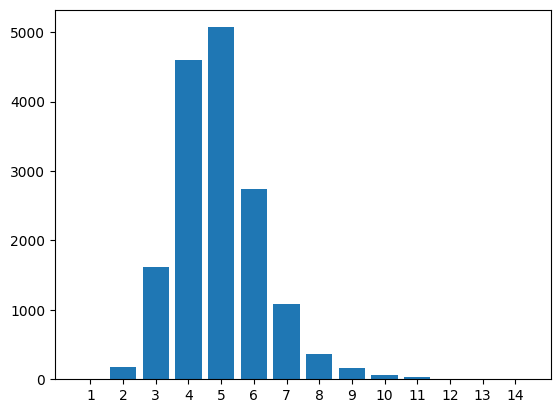

In [303]:
data = Counter(sorted(guesses))
print({i[0] : i[1] for i in sorted(data.items(), key=itemgetter(0))})

keys = list(data.keys())
values = list(data.values())
x_pos = range(len(keys))
plt.bar(x_pos, values)
plt.xticks(x_pos, keys)
plt.show()